# Sudoku Solver Project with Deep Learning 
### By Sharon Eliyahu

# Import libreries

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt

# GPU search & colab 

In [2]:
# %tensorflow_version 2.x
# import tensorflow as tf

# device_name = tf.test.gpu_device_name()
# if device_name != '/device:GPU:0':
#   raise SystemError('GPU device not found')
# print('Found GPU at: {}'.format(device_name),tf.__version__)

In [3]:
# from google.colab import drive
# drive.mount('/content/drive')

# Import the Data

In [4]:
data  = pd.read_csv('sudoku.csv')
data.head()

,quizzes,solutions
0,0043002090050090010700600430060020871900074000...,8643712593258497619712658434361925871986574322...
1,0401000501070039605200080000000000170009068008...,3461792581875239645296483719658324174729168358...
2,6001203840084590720000060050002640300700800069...,6951273841384596727248369158512647392739815469...
3,4972000001004000050000160986203000403009000000...,4972583161864397252537164986293815473759641828...
4,0059103080094030600275001000300002010008200070...,4659123781894735623275681497386452919548216372...


# Clean data if needed , convert board to array

In [5]:
def convert_board(x):
    try:
        # gets str ['9999999'] ,splits it ,and returns array of int  -> [9,9,9,9,9,9,9,9] or null if failed
        x = list(map(int,x))
        return np.array(x) 
    except ValueError:
        return np.nan

In [6]:
data = data.applymap(lambda x: convert_board(x))
data.dropna(inplace=True)

# Split X&Y and reshaping data

In [7]:
x_data = data['quizzes']
y_data = data['solutions']

In [8]:
x_data[0]

array([0, 0, 4, 3, 0, 0, 2, 0, 9, 0, 0, 5, 0, 0, 9, 0, 0, 1, 0, 7, 0, 0,
       6, 0, 0, 4, 3, 0, 0, 6, 0, 0, 2, 0, 8, 7, 1, 9, 0, 0, 0, 7, 4, 0,
       0, 0, 5, 0, 0, 8, 3, 0, 0, 0, 6, 0, 0, 0, 0, 0, 1, 0, 5, 0, 0, 3,
       5, 0, 8, 6, 9, 0, 0, 4, 2, 9, 1, 0, 3, 0, 0])

In [9]:
x_data = np.hstack(x_data)
y_data = np.hstack(y_data)

In [10]:
x_data = x_data.reshape(-1,9,9)
y_data = y_data.reshape(-1,81)

# Apply to_categorical on Y Data

In [11]:
from tensorflow.keras.utils import to_categorical

In [12]:
# I added -1 to get only 9 Labels, because 0-9 has 10 categories
y_data = to_categorical(y_data - 1) 

In [13]:
from sklearn.model_selection import train_test_split

In [14]:
X_train, X_test, Y_train, Y_test = train_test_split(x_data, y_data, test_size=0.1, random_state = 42)

# Normalize the X Data

In [15]:
# sudoku has only numbers in range 1-9 , so we can divide all numbers by 9
# and if we subtracting 0.5 we can make it 0 mean
# which is better for the system and can help to the accuracy

def normalize_data(x):
    return np.array(x / 9) - 0.5

def denormalize_data(x):
    return (x + 0.5)  * 9

In [16]:
X_train = normalize_data(X_train.reshape(-1,9,9,1))
X_test = normalize_data(X_test.reshape(-1,9,9,1))

# Building the model

In [17]:
# After building several models this is my optimal model.
# I inserted the game shape layer as 1,9,9,1
# After that, taking into account the sudoku rules and the input shape, I added several
# convolution layers with 64 filters in different shapes.
# I used the 'Relo' activation to get a result between 0 and 1.
# I then summed with a 1,1 convolution layer and 128 filters to get a layer 
# for each number on the board
# After each layer I normalized the result with BatchNormalization() to get closer to 0 or 1
# After the convolution layers I turned everything into 1D with Flatten.
# Because we have 81 numbers to predict and each number has 9 different lables 
# The output layer will be 81*9 in a shape of 81,9 with softmax activation
# to get a probability result between 0-1 for each of the labels.
# I use categorical_crossentropy because I want to do multi-classification 
# and I have more than one label.

import keras
from keras.layers import Activation
from keras.layers import Conv2D, BatchNormalization, Dense, Flatten, Reshape, Dropout

model = keras.models.Sequential()
model.add(Conv2D(64, kernel_size=(3,3), activation='relu', input_shape=(9,9,1), padding='same'))
model.add(BatchNormalization())
model.add(Conv2D(64, kernel_size=(1,9), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(Conv2D(64, kernel_size=(9,1), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(Conv2D(64, kernel_size=(3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(Conv2D(128, kernel_size=(1,1), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(Flatten())
model.add(Dense(81*9))
model.add(Reshape((-1, 9)))
model.add(Activation('softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam',metrics=['accuracy'])

In [53]:
model.summary()

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

# Training the model

In [19]:
from tensorflow.keras.callbacks import EarlyStopping

In [20]:
#EarlyStopping is used to help avoid over fitting and wasting time
# by stopping the training when the monitor cant get any better from epoch to epoch
early_stop = EarlyStopping(monitor='val_loss',patience=1,verbose=1)

In [21]:
# Because my data is large, I use a batch size that is quite large.
# The advantage is that the system will learn the data faster. 
# Validation loss will vary more proportionally.
# Something that will help stop the train in a more optimal point

In [22]:
#model.fit(X_train,Y_train,epochs=30,batch_size=256, validation_data=(X_test,Y_test),callbacks=[early_stop])

# Saving and evaluate the model

In [23]:
#model.save('sudoku_model.h5')

In [24]:
#history = pd.DataFrame(model.history.history)

In [25]:
#history.to_csv('sudoku_model.csv')

In [26]:
history = pd.read_csv('sudoku_model.csv')

# We can see that the val_loss get to its minimal point and stops 
# so we are not in overfit :)
# and the model is pretty accurate

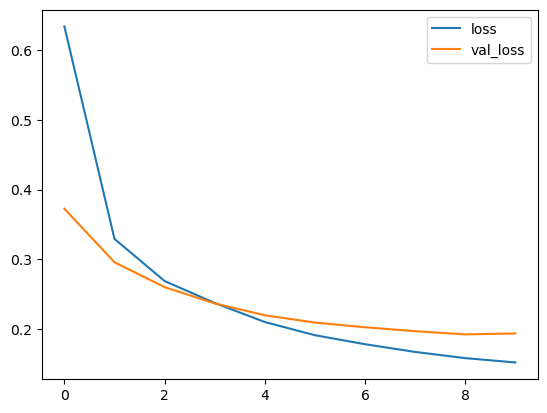

In [27]:
plt.plot(history[['loss','val_loss']])
plt.legend(['loss','val_loss'])

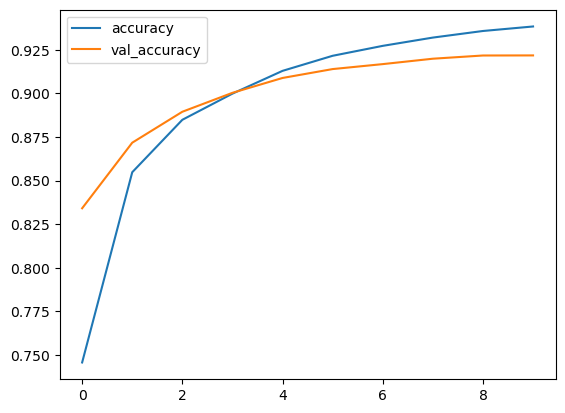

In [28]:
history[['accuracy','val_accuracy']].plot()
plt.legend(['accuracy','val_accuracy'])

# Load model and functions

In [29]:
from tensorflow.keras.models import load_model
l_model = load_model('sudoku_model.h5')

In [54]:
l_model.evaluate(X_test,Y_test)

3125/3125 [==============================] - 56s 18ms/step - loss: 0.1938 - accuracy: 0.9218


[0.19381728768348694, 0.9217880368232727]

In [30]:
def prob(x, minimum = 0.99):
    if x > minimum:
        return 1
    else:
        return 0

In [31]:
def print_board(array):
    s = ''''''
    array = array.astype(int)
    for i in range(0,array.shape[0],3):
        s = s + str(array[i:i+3])  
        if (i + 3) % 9 == 0 and i > 0:
            s = s + '\n'
        else:
            s = s + ' | '
        if (i + 3) % 27 == 0 and i < 78:
            s = s + '- - - - - - - - - - -\n'
    print(s.replace('[',"").replace(']',""))

In [32]:
def predict(game,prob_rate):
# this function gets an array of a sudoku game ,normalize it and predict it
# I have set a minimum to the hottest vectors in the main function in order to control it during the pred sycels
# whats under the minimum will return 0 , in order to return 0 we have to add a '0' catagory 
# becuase we only have 1-9 catagories. only we can control the 0 label , the system will keep returning 9 labels
    game = normalize_data(game)
    game = game.reshape(1,9,9,1)
    pred = l_model.predict(game,verbose=0).reshape(81,9)
    pred = pd.DataFrame(pred).applymap(lambda x: prob(x, prob_rate))
    pred = np.concatenate((np.zeros(81).reshape(81,1), pred), axis=1)
    pred = np.argmax(np.array(pred),axis=1) 
    return pred

In [51]:
def solve_game(game,as_string=False):
#this function gets an array of 81 numbers that are an unsolved sudoku game, and returns a
#solved\unsolved game as array of 81 numbers.
# in order to increase our accuarcy we need to predict several times the board and set a minimum to the hottest vectors,
# and each time get closer to the answare by getting only numbers that has at least 99 % probebility to be true for start.
# and then lower the probability dynamically.
# if the system won't be able to solve, the loop will break after 4 diffrent predicts sycle.
# each sycle tries 20 predictions. in every prediction the the minimum will decreese by 0.5%.
# and in each predict sycle, the start minimum will decreese by 4% to allow more predictions.
    if as_string:
        game = convert_board(game)       
    board = game
    board = board.reshape(81)
    unsoloved = True
    count = 0
    tries = 0
    success = False
    prob_min = 0.99
    #mask the board in order to keep quizs pos
    mask = np.ma.masked_array(board, mask= board == 0)
    s_mask = np.ma.sum(mask == board)
    while unsoloved:
        pred = predict(board , prob_min)
        prob_min -= 0.005
        pos_check = (mask == pred)
        s_pos_check = np.ma.sum(pos_check)
        count += 1
        col = sum(np.unique(pred.reshape(9,9),axis=1)) == 45
        row = sum(np.unique(pred.reshape(9,9),axis=0)) == 45
        if col.sum() == row.sum() == 9 and s_mask == s_pos_check:
            unsoloved = False 
            success = True
            if as_string:
                print_board(pred.reshape(81))
                return 'Solved'
            return pred, success
        elif count > 20:
            if tries > 4:
                unsoloved = False
                success = False
                return game, success
            else:
                tries += 1
                prob_min = 0.99 - (tries * 0.04)
                count = 0
                board = game
        else:
            board = pred
            
    

# Solve 1 String game

In [52]:
#if giving a string MUST give as_string =True
game = '000700096003069178007200500075000000901000300000000000009000001318020407240005000'
solve_game(game,as_string=True)

1 8 4 | 7 5 3 | 2 9 6
5 2 3 | 4 6 9 | 1 7 8
6 9 7 | 2 8 1 | 5 4 3
- - - - - - - - - - -
8 7 5 | 3 1 2 | 9 6 4
9 6 1 | 5 4 7 | 3 8 2
4 3 2 | 6 9 8 | 7 1 5
- - - - - - - - - - -
7 5 9 | 8 3 4 | 6 2 1
3 1 8 | 9 2 6 | 4 5 7
2 4 6 | 1 7 5 | 8 3 9



'Solved'

# Test X Games -> can be change in total_test 
## *note ->gets a normalized data from X_test that was previously loaded
## I tested 20K games and the system were able to solve 97% of the games

In [35]:

import time
tested_games = []
true_count = 0
count = 0 
total_test = 20000
tests = denormalize_data(X_test[:total_test])
for test in tests:
    s_t = time.time()
    count += 1
    print(f'Solving : {count}/{total_test} ... \n')
    pred , success= solve_game(test)
    
    if success:
        true_count += 1
        print_board(pred.reshape(81))
        tested_games.append(time.time() - s_t) 
        print("successed in total time: ",round(time.time() - s_t,2), " seconds")
    else:
        print(f'Failed at game {count}')
    print('tested games accuarcy: ', round(true_count / count * 100,2),'%')
    if true_count > 0:
        print(f'Average time to solve 1 game true: {round(sum(tested_games) / true_count,2)} seconds \n')
    


Solving : 1/20000 ... 

6 2 4 | 5 1 3 | 7 9 8
7 8 5 | 2 4 9 | 3 1 6
9 1 3 | 7 8 6 | 4 5 2
- - - - - - - - - - -
8 3 2 | 9 6 1 | 5 4 7
5 7 9 | 3 2 4 | 8 6 1
4 6 1 | 8 7 5 | 2 3 9
- - - - - - - - - - -
1 4 7 | 6 3 2 | 9 8 5
3 9 8 | 1 5 7 | 6 2 4
2 5 6 | 4 9 8 | 1 7 3

successed in total time:  3.34  seconds
tested games accuarcy:  100.0 %
Average time to solve 1 game true: 3.34 seconds 

Solving : 2/20000 ... 

2 1 6 | 9 8 4 | 5 3 7
9 5 4 | 2 3 7 | 6 8 1
7 8 3 | 5 6 1 | 9 2 4
- - - - - - - - - - -
5 6 9 | 1 4 3 | 8 7 2
1 7 2 | 6 5 8 | 4 9 3
3 4 8 | 7 2 9 | 1 6 5
- - - - - - - - - - -
6 9 5 | 3 1 2 | 7 4 8
4 2 7 | 8 9 5 | 3 1 6
8 3 1 | 4 7 6 | 2 5 9

successed in total time:  0.56  seconds
tested games accuarcy:  100.0 %
Average time to solve 1 game true: 1.95 seconds 

Solving : 3/20000 ... 

8 5 1 | 2 3 9 | 4 6 7
3 4 9 | 7 6 8 | 1 5 2
6 7 2 | 5 4 1 | 3 8 9
- - - - - - - - - - -
1 2 4 | 8 5 6 | 9 7 3
9 3 6 | 1 7 2 | 5 4 8
7 8 5 | 3 9 4 | 6 2 1
- - - - - - - - - - -
5 9 3 | 4 8 7 | 2 1 6


3 2 8 | 1 5 4 | 7 9 6
5 1 4 | 9 6 7 | 8 2 3
7 6 9 | 8 2 3 | 1 4 5
- - - - - - - - - - -
1 3 7 | 5 8 2 | 9 6 4
4 9 6 | 7 3 1 | 2 5 8
2 8 5 | 4 9 6 | 3 1 7
- - - - - - - - - - -
8 4 3 | 6 1 9 | 5 7 2
6 5 1 | 2 7 8 | 4 3 9
9 7 2 | 3 4 5 | 6 8 1

successed in total time:  0.39  seconds
tested games accuarcy:  100.0 %
Average time to solve 1 game true: 1.17 seconds 

Solving : 23/20000 ... 

7 4 3 | 1 2 9 | 8 5 6
2 6 8 | 5 4 3 | 9 1 7
5 1 9 | 7 6 8 | 2 3 4
- - - - - - - - - - -
6 8 5 | 2 1 7 | 3 4 9
9 2 1 | 3 8 4 | 6 7 5
3 7 4 | 6 9 5 | 1 2 8
- - - - - - - - - - -
8 3 6 | 4 7 1 | 5 9 2
1 9 7 | 8 5 2 | 4 6 3
4 5 2 | 9 3 6 | 7 8 1

successed in total time:  0.39  seconds
tested games accuarcy:  100.0 %
Average time to solve 1 game true: 1.13 seconds 

Solving : 24/20000 ... 

1 7 2 | 5 3 4 | 8 9 6
9 6 5 | 1 2 8 | 4 3 7
4 3 8 | 7 9 6 | 1 5 2
- - - - - - - - - - -
8 1 3 | 4 7 2 | 9 6 5
7 4 9 | 6 8 5 | 2 1 3
5 2 6 | 3 1 9 | 7 4 8
- - - - - - - - - - -
3 9 7 | 2 6 1 | 5 8 4
6 8 4 | 9 5 7 | 3 2 1


5 8 2 | 1 9 4 | 6 7 3
6 9 1 | 7 3 2 | 4 8 5
3 7 4 | 6 5 8 | 9 2 1
- - - - - - - - - - -
2 4 8 | 3 1 7 | 5 6 9
9 5 7 | 4 2 6 | 1 3 8
1 6 3 | 9 8 5 | 7 4 2
- - - - - - - - - - -
8 2 6 | 5 7 9 | 3 1 4
4 3 5 | 2 6 1 | 8 9 7
7 1 9 | 8 4 3 | 2 5 6

successed in total time:  0.41  seconds
tested games accuarcy:  100.0 %
Average time to solve 1 game true: 1.11 seconds 

Solving : 45/20000 ... 

1 6 4 | 2 3 7 | 9 8 5
9 8 5 | 1 6 4 | 2 3 7
7 2 3 | 9 8 5 | 1 6 4
- - - - - - - - - - -
6 3 2 | 4 5 8 | 7 9 1
5 9 7 | 3 2 1 | 8 4 6
8 4 1 | 6 7 9 | 5 2 3
- - - - - - - - - - -
4 7 8 | 5 9 3 | 6 1 2
3 5 6 | 8 1 2 | 4 7 9
2 1 9 | 7 4 6 | 3 5 8

successed in total time:  0.42  seconds
tested games accuarcy:  100.0 %
Average time to solve 1 game true: 1.09 seconds 

Solving : 46/20000 ... 

2 4 7 | 5 8 9 | 1 6 3
8 9 1 | 2 3 6 | 4 7 5
3 6 5 | 7 4 1 | 8 2 9
- - - - - - - - - - -
7 5 9 | 6 1 8 | 2 3 4
4 2 8 | 3 5 7 | 9 1 6
1 3 6 | 9 2 4 | 7 5 8
- - - - - - - - - - -
5 1 4 | 8 7 3 | 6 9 2
9 7 2 | 4 6 5 | 3 8 1


4 5 7 | 2 8 1 | 3 9 6
6 3 8 | 9 5 7 | 2 1 4
9 2 1 | 4 6 3 | 5 8 7
- - - - - - - - - - -
1 7 3 | 5 4 6 | 9 2 8
8 4 2 | 1 7 9 | 6 3 5
5 9 6 | 8 3 2 | 7 4 1
- - - - - - - - - - -
7 6 9 | 3 1 8 | 4 5 2
3 1 5 | 6 2 4 | 8 7 9
2 8 4 | 7 9 5 | 1 6 3

successed in total time:  0.66  seconds
tested games accuarcy:  100.0 %
Average time to solve 1 game true: 1.11 seconds 

Solving : 67/20000 ... 

7 8 6 | 1 2 4 | 9 5 3
9 1 3 | 6 5 7 | 2 4 8
2 4 5 | 9 3 8 | 7 1 6
- - - - - - - - - - -
8 5 4 | 2 7 6 | 3 9 1
3 7 1 | 4 9 5 | 6 8 2
6 9 2 | 3 8 1 | 4 7 5
- - - - - - - - - - -
1 2 8 | 7 6 9 | 5 3 4
5 6 7 | 8 4 3 | 1 2 9
4 3 9 | 5 1 2 | 8 6 7

successed in total time:  0.4  seconds
tested games accuarcy:  100.0 %
Average time to solve 1 game true: 1.1 seconds 

Solving : 68/20000 ... 

8 1 2 | 7 5 4 | 6 3 9
5 9 4 | 3 6 2 | 1 8 7
7 6 3 | 8 9 1 | 4 2 5
- - - - - - - - - - -
6 4 9 | 5 2 7 | 3 1 8
2 3 7 | 6 1 8 | 5 9 4
1 5 8 | 4 3 9 | 7 6 2
- - - - - - - - - - -
4 7 6 | 2 8 3 | 9 5 1
9 2 5 | 1 7 6 | 8 4 3
3 

6 4 9 | 5 7 2 | 1 3 8
8 2 3 | 1 4 9 | 5 7 6
7 1 5 | 3 8 6 | 2 9 4
- - - - - - - - - - -
3 9 4 | 2 5 1 | 8 6 7
2 5 8 | 7 6 3 | 4 1 9
1 6 7 | 8 9 4 | 3 2 5
- - - - - - - - - - -
9 8 2 | 6 1 5 | 7 4 3
4 7 1 | 9 3 8 | 6 5 2
5 3 6 | 4 2 7 | 9 8 1

successed in total time:  0.41  seconds
tested games accuarcy:  100.0 %
Average time to solve 1 game true: 1.02 seconds 

Solving : 89/20000 ... 

8 1 7 | 9 3 6 | 2 4 5
3 9 4 | 7 5 2 | 8 6 1
2 5 6 | 4 8 1 | 7 9 3
- - - - - - - - - - -
7 8 9 | 5 4 3 | 1 2 6
1 4 5 | 2 6 9 | 3 7 8
6 3 2 | 1 7 8 | 4 5 9
- - - - - - - - - - -
9 7 1 | 8 2 5 | 6 3 4
4 6 8 | 3 9 7 | 5 1 2
5 2 3 | 6 1 4 | 9 8 7

successed in total time:  0.41  seconds
tested games accuarcy:  100.0 %
Average time to solve 1 game true: 1.01 seconds 

Solving : 90/20000 ... 

7 5 9 | 6 1 4 | 3 2 8
8 2 1 | 9 3 5 | 6 7 4
3 6 4 | 7 8 2 | 9 1 5
- - - - - - - - - - -
1 9 2 | 8 4 7 | 5 3 6
6 7 5 | 3 9 1 | 8 4 2
4 3 8 | 2 5 6 | 1 9 7
- - - - - - - - - - -
5 8 3 | 4 2 9 | 7 6 1
2 1 6 | 5 7 3 | 4 8 9


2 5 1 | 4 8 3 | 7 9 6
7 8 3 | 9 5 6 | 2 4 1
6 4 9 | 2 7 1 | 3 8 5
- - - - - - - - - - -
3 1 8 | 7 2 4 | 6 5 9
5 9 6 | 1 3 8 | 4 2 7
4 2 7 | 5 6 9 | 8 1 3
- - - - - - - - - - -
8 7 2 | 3 1 5 | 9 6 4
1 6 4 | 8 9 7 | 5 3 2
9 3 5 | 6 4 2 | 1 7 8

successed in total time:  0.54  seconds
tested games accuarcy:  99.09 %
Average time to solve 1 game true: 0.93 seconds 

Solving : 111/20000 ... 

8 4 3 | 1 5 2 | 9 7 6
7 1 6 | 4 9 8 | 2 3 5
9 5 2 | 7 6 3 | 4 1 8
- - - - - - - - - - -
5 9 4 | 2 3 6 | 1 8 7
3 8 7 | 5 4 1 | 6 2 9
6 2 1 | 9 8 7 | 5 4 3
- - - - - - - - - - -
4 7 8 | 6 2 9 | 3 5 1
1 6 5 | 3 7 4 | 8 9 2
2 3 9 | 8 1 5 | 7 6 4

successed in total time:  0.56  seconds
tested games accuarcy:  99.1 %
Average time to solve 1 game true: 0.92 seconds 

Solving : 112/20000 ... 

4 1 6 | 7 2 3 | 9 5 8
3 5 8 | 9 1 6 | 4 7 2
2 7 9 | 5 4 8 | 1 6 3
- - - - - - - - - - -
5 6 3 | 4 8 1 | 2 9 7
9 8 4 | 3 7 2 | 6 1 5
1 2 7 | 6 9 5 | 3 8 4
- - - - - - - - - - -
8 4 1 | 2 6 7 | 5 3 9
7 9 5 | 1 3 4 | 8 2 6

6 8 3 | 7 2 5 | 9 4 1
1 4 2 | 3 9 8 | 6 5 7
9 5 7 | 6 1 4 | 8 2 3
- - - - - - - - - - -
5 2 1 | 9 8 3 | 7 6 4
7 3 6 | 1 4 2 | 5 9 8
8 9 4 | 5 6 7 | 3 1 2
- - - - - - - - - - -
4 6 9 | 8 7 1 | 2 3 5
2 7 5 | 4 3 9 | 1 8 6
3 1 8 | 2 5 6 | 4 7 9

successed in total time:  1.74  seconds
tested games accuarcy:  99.24 %
Average time to solve 1 game true: 0.93 seconds 

Solving : 132/20000 ... 

6 8 9 | 1 4 2 | 3 7 5
5 4 3 | 9 7 8 | 1 2 6
2 7 1 | 6 5 3 | 4 8 9
- - - - - - - - - - -
8 5 6 | 3 2 7 | 9 4 1
1 9 7 | 4 6 5 | 2 3 8
3 2 4 | 8 1 9 | 5 6 7
- - - - - - - - - - -
9 3 5 | 7 8 4 | 6 1 2
4 6 8 | 2 9 1 | 7 5 3
7 1 2 | 5 3 6 | 8 9 4

successed in total time:  0.68  seconds
tested games accuarcy:  99.24 %
Average time to solve 1 game true: 0.93 seconds 

Solving : 133/20000 ... 

6 9 4 | 5 7 2 | 3 1 8
5 1 7 | 3 6 8 | 2 9 4
3 2 8 | 1 4 9 | 7 5 6
- - - - - - - - - - -
8 7 9 | 6 5 4 | 1 2 3
4 3 2 | 7 9 1 | 8 6 5
1 6 5 | 2 8 3 | 4 7 9
- - - - - - - - - - -
7 4 6 | 8 2 5 | 9 3 1
9 5 1 | 4 3 7 | 6 8 

8 4 6 | 1 5 2 | 9 3 7
7 2 3 | 9 6 8 | 1 5 4
1 5 9 | 4 3 7 | 6 2 8
- - - - - - - - - - -
5 1 7 | 2 8 3 | 4 9 6
6 9 2 | 5 4 1 | 7 8 3
3 8 4 | 6 7 9 | 5 1 2
- - - - - - - - - - -
9 7 8 | 3 1 6 | 2 4 5
2 3 5 | 7 9 4 | 8 6 1
4 6 1 | 8 2 5 | 3 7 9

successed in total time:  3.53  seconds
tested games accuarcy:  99.34 %
Average time to solve 1 game true: 0.9 seconds 

Solving : 153/20000 ... 

4 6 1 | 2 8 7 | 9 3 5
2 8 9 | 3 4 5 | 1 7 6
5 3 7 | 6 1 9 | 2 4 8
- - - - - - - - - - -
7 9 4 | 5 2 8 | 6 1 3
3 1 8 | 4 9 6 | 7 5 2
6 5 2 | 7 3 1 | 8 9 4
- - - - - - - - - - -
9 4 5 | 8 7 2 | 3 6 1
1 2 3 | 9 6 4 | 5 8 7
8 7 6 | 1 5 3 | 4 2 9

successed in total time:  0.39  seconds
tested games accuarcy:  99.35 %
Average time to solve 1 game true: 0.89 seconds 

Solving : 154/20000 ... 

8 9 1 | 3 6 7 | 2 4 5
6 7 3 | 2 5 4 | 8 9 1
5 2 4 | 1 9 8 | 3 6 7
- - - - - - - - - - -
2 6 9 | 5 8 1 | 7 3 4
4 1 5 | 9 7 3 | 6 8 2
3 8 7 | 4 2 6 | 5 1 9
- - - - - - - - - - -
9 3 2 | 8 4 5 | 1 7 6
1 5 6 | 7 3 9 | 4 2 8

7 4 6 | 3 9 2 | 1 8 5
8 5 3 | 7 1 6 | 9 4 2
1 2 9 | 5 4 8 | 3 7 6
- - - - - - - - - - -
4 1 8 | 2 6 9 | 5 3 7
3 7 2 | 8 5 1 | 6 9 4
9 6 5 | 4 7 3 | 2 1 8
- - - - - - - - - - -
5 9 1 | 6 8 4 | 7 2 3
2 8 7 | 9 3 5 | 4 6 1
6 3 4 | 1 2 7 | 8 5 9

successed in total time:  0.53  seconds
tested games accuarcy:  99.42 %
Average time to solve 1 game true: 0.87 seconds 

Solving : 174/20000 ... 

8 6 9 | 4 2 7 | 1 3 5
5 1 2 | 3 8 6 | 4 7 9
7 3 4 | 5 9 1 | 2 6 8
- - - - - - - - - - -
9 8 7 | 6 1 4 | 3 5 2
6 2 5 | 9 3 8 | 7 4 1
3 4 1 | 7 5 2 | 8 9 6
- - - - - - - - - - -
4 5 8 | 2 7 9 | 6 1 3
1 9 6 | 8 4 3 | 5 2 7
2 7 3 | 1 6 5 | 9 8 4

successed in total time:  0.52  seconds
tested games accuarcy:  99.43 %
Average time to solve 1 game true: 0.87 seconds 

Solving : 175/20000 ... 

7 1 8 | 6 5 3 | 9 4 2
9 2 6 | 1 8 4 | 3 5 7
4 3 5 | 2 7 9 | 6 1 8
- - - - - - - - - - -
6 8 7 | 3 2 5 | 4 9 1
1 9 2 | 7 4 6 | 8 3 5
5 4 3 | 8 9 1 | 2 7 6
- - - - - - - - - - -
8 5 9 | 4 1 2 | 7 6 3
2 6 4 | 5 3 7 | 1 8 

9 3 6 | 4 2 8 | 7 1 5
8 1 5 | 7 9 6 | 2 4 3
4 2 7 | 5 1 3 | 9 8 6
- - - - - - - - - - -
7 5 8 | 3 6 1 | 4 9 2
1 9 4 | 8 5 2 | 3 6 7
2 6 3 | 9 7 4 | 8 5 1
- - - - - - - - - - -
3 7 9 | 1 4 5 | 6 2 8
5 4 2 | 6 8 7 | 1 3 9
6 8 1 | 2 3 9 | 5 7 4

successed in total time:  0.4  seconds
tested games accuarcy:  99.48 %
Average time to solve 1 game true: 0.91 seconds 

Solving : 195/20000 ... 

5 6 9 | 7 3 4 | 2 1 8
4 2 8 | 6 5 1 | 9 7 3
3 7 1 | 2 9 8 | 4 5 6
- - - - - - - - - - -
7 9 2 | 8 1 6 | 3 4 5
8 5 6 | 9 4 3 | 1 2 7
1 3 4 | 5 7 2 | 6 8 9
- - - - - - - - - - -
2 8 5 | 1 6 9 | 7 3 4
6 4 7 | 3 2 5 | 8 9 1
9 1 3 | 4 8 7 | 5 6 2

successed in total time:  0.52  seconds
tested games accuarcy:  99.49 %
Average time to solve 1 game true: 0.91 seconds 

Solving : 196/20000 ... 

8 5 6 | 3 7 2 | 9 4 1
1 4 9 | 5 6 8 | 7 3 2
2 3 7 | 9 1 4 | 6 5 8
- - - - - - - - - - -
6 8 4 | 2 3 5 | 1 7 9
9 1 5 | 6 4 7 | 8 2 3
3 7 2 | 1 8 9 | 5 6 4
- - - - - - - - - - -
4 2 8 | 7 9 6 | 3 1 5
7 9 1 | 4 5 3 | 2 8 6

2 1 7 | 6 8 3 | 4 5 9
3 5 9 | 4 7 2 | 8 6 1
6 8 4 | 9 5 1 | 2 7 3
- - - - - - - - - - -
4 3 1 | 5 9 8 | 6 2 7
8 6 2 | 7 3 4 | 1 9 5
7 9 5 | 1 2 6 | 3 4 8
- - - - - - - - - - -
9 4 3 | 8 6 5 | 7 1 2
1 7 8 | 2 4 9 | 5 3 6
5 2 6 | 3 1 7 | 9 8 4

successed in total time:  0.41  seconds
tested games accuarcy:  99.53 %
Average time to solve 1 game true: 0.91 seconds 

Solving : 216/20000 ... 

3 6 8 | 1 9 2 | 5 4 7
2 7 1 | 4 5 8 | 3 6 9
5 9 4 | 7 3 6 | 2 8 1
- - - - - - - - - - -
8 5 7 | 2 1 4 | 9 3 6
9 4 6 | 3 7 5 | 1 2 8
1 2 3 | 6 8 9 | 4 7 5
- - - - - - - - - - -
7 3 5 | 8 4 1 | 6 9 2
6 8 9 | 5 2 3 | 7 1 4
4 1 2 | 9 6 7 | 8 5 3

successed in total time:  0.92  seconds
tested games accuarcy:  99.54 %
Average time to solve 1 game true: 0.91 seconds 

Solving : 217/20000 ... 

2 8 3 | 5 1 4 | 7 6 9
6 7 1 | 9 3 8 | 5 4 2
9 4 5 | 6 7 2 | 3 8 1
- - - - - - - - - - -
5 3 8 | 4 2 7 | 9 1 6
1 9 4 | 3 6 5 | 2 7 8
7 2 6 | 8 9 1 | 4 3 5
- - - - - - - - - - -
4 6 9 | 1 5 3 | 8 2 7
3 1 7 | 2 8 9 | 6 5 

4 8 9 | 3 2 1 | 6 7 5
2 7 1 | 6 5 8 | 9 3 4
3 5 6 | 7 9 4 | 2 8 1
- - - - - - - - - - -
5 3 2 | 4 8 9 | 1 6 7
1 9 7 | 2 6 5 | 8 4 3
6 4 8 | 1 3 7 | 5 9 2
- - - - - - - - - - -
9 1 3 | 8 4 2 | 7 5 6
7 6 5 | 9 1 3 | 4 2 8
8 2 4 | 5 7 6 | 3 1 9

successed in total time:  0.39  seconds
tested games accuarcy:  99.58 %
Average time to solve 1 game true: 0.88 seconds 

Solving : 237/20000 ... 

4 8 6 | 5 2 3 | 7 9 1
7 5 9 | 1 8 4 | 3 2 6
1 2 3 | 9 7 6 | 8 4 5
- - - - - - - - - - -
8 9 1 | 2 4 5 | 6 3 7
5 7 4 | 6 3 1 | 2 8 9
6 3 2 | 7 9 8 | 1 5 4
- - - - - - - - - - -
3 6 5 | 8 1 9 | 4 7 2
9 4 7 | 3 6 2 | 5 1 8
2 1 8 | 4 5 7 | 9 6 3

successed in total time:  0.4  seconds
tested games accuarcy:  99.58 %
Average time to solve 1 game true: 0.88 seconds 

Solving : 238/20000 ... 

1 4 8 | 5 9 2 | 6 3 7
7 6 2 | 4 8 3 | 1 9 5
3 5 9 | 6 7 1 | 4 8 2
- - - - - - - - - - -
9 8 4 | 3 5 6 | 2 7 1
5 3 1 | 8 2 7 | 9 4 6
6 2 7 | 1 4 9 | 3 5 8
- - - - - - - - - - -
8 9 5 | 2 6 4 | 7 1 3
2 7 3 | 9 1 8 | 5 6 4

4 8 2 | 3 3 1 | 6 7 9
1 9 7 | 6 4 8 | 5 3 2
3 6 5 | 2 9 7 | 1 4 8
- - - - - - - - - - -
8 3 9 | 7 1 4 | 2 5 6
7 5 6 | 9 2 3 | 4 8 1
2 1 4 | 5 8 6 | 7 9 3
- - - - - - - - - - -
6 4 8 | 1 5 5 | 9 2 7
9 7 3 | 4 6 2 | 8 1 5
5 2 1 | 8 7 9 | 3 6 4

successed in total time:  14.05  seconds
tested games accuarcy:  99.61 %
Average time to solve 1 game true: 0.91 seconds 

Solving : 258/20000 ... 

6 8 9 | 3 1 7 | 2 4 5
2 4 7 | 5 8 9 | 1 3 6
1 5 3 | 6 4 2 | 9 8 7
- - - - - - - - - - -
5 9 1 | 8 2 4 | 6 7 3
3 7 4 | 9 6 5 | 8 2 1
8 6 2 | 1 7 3 | 5 9 4
- - - - - - - - - - -
7 1 6 | 4 9 8 | 3 5 2
9 2 5 | 7 3 6 | 4 1 8
4 3 8 | 2 5 1 | 7 6 9

successed in total time:  0.54  seconds
tested games accuarcy:  99.61 %
Average time to solve 1 game true: 0.91 seconds 

Solving : 259/20000 ... 

9 6 7 | 5 8 3 | 2 1 4
2 1 5 | 9 4 6 | 8 3 7
4 8 3 | 1 7 2 | 9 6 5
- - - - - - - - - - -
6 5 2 | 7 3 1 | 4 8 9
3 7 4 | 8 9 5 | 6 2 1
1 9 8 | 2 6 4 | 7 5 3
- - - - - - - - - - -
8 3 6 | 4 5 9 | 1 7 2
7 2 9 | 3 1 8 | 5 4

2 4 7 | 3 8 1 | 9 6 5
3 1 6 | 5 9 7 | 8 2 4
8 5 9 | 4 6 2 | 3 7 1
- - - - - - - - - - -
4 2 1 | 8 5 9 | 7 3 6
9 6 8 | 7 3 4 | 5 1 2
7 3 5 | 2 1 6 | 4 9 8
- - - - - - - - - - -
5 8 2 | 6 7 3 | 1 4 9
6 9 3 | 1 4 8 | 2 5 7
1 7 4 | 9 2 5 | 6 8 3

successed in total time:  0.52  seconds
tested games accuarcy:  99.64 %
Average time to solve 1 game true: 0.89 seconds 

Solving : 279/20000 ... 

5 2 3 | 9 8 6 | 7 4 1
1 8 9 | 5 7 4 | 2 6 3
7 6 4 | 2 1 3 | 8 5 9
- - - - - - - - - - -
6 1 8 | 7 4 2 | 3 9 5
4 9 5 | 1 3 8 | 6 7 2
3 7 2 | 6 5 9 | 4 1 8
- - - - - - - - - - -
8 3 6 | 4 9 5 | 1 2 7
9 4 1 | 3 2 7 | 5 8 6
2 5 7 | 8 6 1 | 9 3 4

successed in total time:  0.4  seconds
tested games accuarcy:  99.64 %
Average time to solve 1 game true: 0.89 seconds 

Solving : 280/20000 ... 

9 3 7 | 5 4 8 | 1 2 6
1 2 6 | 3 9 7 | 8 5 4
4 8 5 | 6 2 1 | 7 9 3
- - - - - - - - - - -
5 7 8 | 2 6 3 | 9 4 1
6 9 2 | 7 1 4 | 3 8 5
3 1 4 | 8 5 9 | 2 6 7
- - - - - - - - - - -
7 5 1 | 9 8 6 | 4 3 2
2 4 9 | 1 3 5 | 6 7 8

8 3 2 | 9 7 6 | 1 5 4
4 6 5 | 3 1 2 | 7 8 9
7 9 1 | 4 8 5 | 6 3 2
- - - - - - - - - - -
2 5 4 | 7 3 1 | 8 9 6
3 1 6 | 5 9 8 | 2 4 7
9 8 7 | 6 2 4 | 5 1 3
- - - - - - - - - - -
1 4 8 | 2 6 9 | 3 7 5
5 2 3 | 8 4 7 | 9 6 1
6 7 9 | 1 5 3 | 4 2 8

successed in total time:  0.46  seconds
tested games accuarcy:  99.67 %
Average time to solve 1 game true: 0.91 seconds 

Solving : 300/20000 ... 

1 4 8 | 5 7 6 | 3 9 2
5 2 3 | 8 9 1 | 4 6 7
7 9 6 | 2 4 3 | 8 1 5
- - - - - - - - - - -
4 6 7 | 3 2 5 | 9 8 1
9 8 1 | 7 6 4 | 2 5 3
2 3 5 | 1 8 9 | 6 7 4
- - - - - - - - - - -
6 1 9 | 4 3 7 | 5 2 8
8 5 4 | 9 1 2 | 7 3 6
3 7 2 | 6 5 8 | 1 4 9

successed in total time:  0.45  seconds
tested games accuarcy:  99.67 %
Average time to solve 1 game true: 0.91 seconds 

Solving : 301/20000 ... 

6 9 7 | 2 4 3 | 1 5 8
1 3 8 | 9 5 7 | 6 2 4
4 5 2 | 6 1 8 | 9 7 3
- - - - - - - - - - -
2 7 5 | 4 9 1 | 8 3 6
3 1 4 | 7 8 6 | 2 9 5
8 6 9 | 3 2 5 | 4 1 7
- - - - - - - - - - -
5 2 6 | 1 3 4 | 7 8 9
7 8 1 | 5 6 9 | 3 4 

2 7 1 | 6 8 3 | 5 9 4
6 5 9 | 7 4 2 | 1 8 3
4 8 3 | 5 1 9 | 6 7 2
- - - - - - - - - - -
8 6 4 | 9 7 1 | 2 3 5
7 3 2 | 4 6 5 | 9 1 8
9 1 5 | 3 2 8 | 4 6 7
- - - - - - - - - - -
5 4 8 | 1 9 7 | 3 2 6
1 2 6 | 8 3 4 | 7 5 9
3 9 7 | 2 5 6 | 8 4 1

successed in total time:  0.44  seconds
tested games accuarcy:  98.45 %
Average time to solve 1 game true: 0.93 seconds 

Solving : 324/20000 ... 

3 1 2 | 9 7 4 | 5 8 6
7 4 6 | 2 8 5 | 9 1 3
8 5 9 | 6 1 3 | 4 2 7
- - - - - - - - - - -
4 8 3 | 5 2 7 | 6 9 1
1 2 7 | 4 9 6 | 3 5 8
9 6 5 | 8 3 1 | 7 4 2
- - - - - - - - - - -
5 3 4 | 1 6 8 | 2 7 9
2 7 8 | 3 4 9 | 1 6 5
6 9 1 | 7 5 2 | 8 3 4

successed in total time:  0.54  seconds
tested games accuarcy:  98.46 %
Average time to solve 1 game true: 0.93 seconds 

Solving : 325/20000 ... 

6 4 2 | 3 5 9 | 1 7 8
9 1 8 | 7 4 6 | 2 5 3
7 3 5 | 2 8 1 | 6 9 4
- - - - - - - - - - -
8 5 9 | 1 6 3 | 4 2 7
4 2 6 | 8 7 5 | 9 3 1
1 7 3 | 4 9 2 | 5 8 6
- - - - - - - - - - -
2 9 4 | 6 3 8 | 7 1 5
5 8 7 | 9 1 4 | 3 6 

8 1 9 | 7 4 5 | 6 2 3
7 2 3 | 9 8 6 | 5 1 4
5 4 6 | 3 1 2 | 9 8 7
- - - - - - - - - - -
3 6 5 | 8 9 4 | 2 7 1
9 7 1 | 2 6 3 | 4 5 8
2 8 4 | 1 5 7 | 3 9 6
- - - - - - - - - - -
6 9 8 | 5 3 1 | 7 4 2
4 5 2 | 6 7 8 | 1 3 9
1 3 7 | 4 2 9 | 8 6 5

successed in total time:  0.53  seconds
tested games accuarcy:  98.55 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 345/20000 ... 

4 9 1 | 6 7 8 | 2 5 3
3 6 8 | 2 5 4 | 1 9 7
7 2 5 | 1 9 3 | 4 6 8
- - - - - - - - - - -
6 8 2 | 4 3 9 | 5 7 1
9 1 7 | 8 2 5 | 3 4 6
5 4 3 | 7 1 6 | 8 2 9
- - - - - - - - - - -
2 7 9 | 3 4 1 | 6 8 5
1 5 6 | 9 8 2 | 7 3 4
8 3 4 | 5 6 7 | 9 1 2

successed in total time:  0.39  seconds
tested games accuarcy:  98.55 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 346/20000 ... 

3 5 2 | 6 4 7 | 9 8 1
9 6 7 | 8 3 1 | 5 2 4
8 4 1 | 5 9 2 | 3 6 7
- - - - - - - - - - -
1 3 4 | 9 6 8 | 7 5 2
2 9 8 | 7 5 4 | 1 3 6
5 7 6 | 2 1 3 | 4 9 8
- - - - - - - - - - -
6 1 3 | 4 2 5 | 8 7 9
4 8 9 | 3 7 6 | 2 1 

8 5 9 | 1 7 4 | 6 2 3
2 1 6 | 9 3 8 | 5 7 4
7 4 3 | 5 2 6 | 9 1 8
- - - - - - - - - - -
3 6 2 | 4 1 9 | 8 5 7
9 7 1 | 8 5 2 | 4 3 6
5 8 4 | 7 6 3 | 1 9 2
- - - - - - - - - - -
4 3 5 | 6 4 7 | 2 8 9
6 2 8 | 3 9 1 | 7 4 5
1 9 7 | 2 8 5 | 3 6 1

successed in total time:  0.66  seconds
tested games accuarcy:  98.36 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 367/20000 ... 

8 7 1 | 5 3 9 | 4 6 2
9 2 4 | 1 6 8 | 5 3 7
6 3 5 | 7 4 2 | 1 8 9
- - - - - - - - - - -
1 5 7 | 4 2 3 | 8 9 6
3 8 6 | 9 1 7 | 2 4 5
4 9 2 | 8 5 6 | 7 1 3
- - - - - - - - - - -
2 6 8 | 3 7 1 | 9 5 4
7 4 9 | 6 8 5 | 3 2 1
5 1 3 | 2 9 4 | 6 7 8

successed in total time:  0.39  seconds
tested games accuarcy:  98.37 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 368/20000 ... 

7 6 1 | 3 9 8 | 5 2 4
5 2 8 | 1 4 7 | 3 6 9
3 9 4 | 5 6 2 | 8 1 7
- - - - - - - - - - -
2 4 9 | 6 5 3 | 7 8 1
8 3 7 | 4 2 1 | 6 9 5
1 5 6 | 8 7 9 | 4 3 2
- - - - - - - - - - -
4 1 5 | 9 3 6 | 2 7 8
6 8 2 | 7 1 4 | 9 5 

2 9 8 | 7 3 1 | 6 5 4
6 1 5 | 9 4 8 | 2 3 7
3 7 4 | 6 2 5 | 9 8 1
- - - - - - - - - - -
7 4 1 | 8 5 6 | 3 2 9
5 8 2 | 3 9 4 | 1 7 6
9 6 3 | 1 7 2 | 8 4 5
- - - - - - - - - - -
8 2 6 | 5 1 7 | 4 9 3
4 3 7 | 2 6 9 | 5 1 8
1 5 9 | 4 8 3 | 7 6 2

successed in total time:  0.42  seconds
tested games accuarcy:  98.45 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 388/20000 ... 

4 5 3 | 6 1 2 | 9 8 7
7 8 9 | 4 3 5 | 6 2 1
1 2 6 | 8 7 9 | 3 5 4
- - - - - - - - - - -
5 7 4 | 1 6 3 | 2 9 8
9 6 8 | 5 2 7 | 4 1 3
3 1 2 | 9 8 4 | 7 6 5
- - - - - - - - - - -
2 4 5 | 3 9 1 | 8 7 6
8 3 7 | 2 5 6 | 1 4 9
6 9 1 | 7 4 8 | 5 3 2

successed in total time:  0.4  seconds
tested games accuarcy:  98.45 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 389/20000 ... 

6 8 5 | 7 3 1 | 2 4 9
7 1 9 | 5 4 2 | 3 8 6
4 2 3 | 9 6 8 | 1 5 7
- - - - - - - - - - -
5 3 2 | 6 1 9 | 4 7 8
8 9 7 | 2 5 4 | 6 3 1
1 6 4 | 8 7 3 | 9 2 5
- - - - - - - - - - -
9 5 8 | 3 2 6 | 7 1 4
3 7 1 | 4 9 5 | 8 6 2

9 2 7 | 6 4 3 | 1 8 5
8 6 5 | 7 2 1 | 3 9 4
1 3 4 | 9 5 8 | 7 2 6
- - - - - - - - - - -
6 1 8 | 4 9 2 | 5 7 3
2 5 3 | 1 8 7 | 4 6 9
4 7 9 | 3 6 5 | 2 1 8
- - - - - - - - - - -
5 9 6 | 2 7 4 | 8 3 1
3 8 2 | 5 1 6 | 9 4 7
7 4 1 | 8 3 9 | 6 5 2

successed in total time:  0.52  seconds
tested games accuarcy:  98.05 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 411/20000 ... 

5 9 4 | 3 2 7 | 6 8 1
1 8 3 | 9 6 5 | 4 2 7
2 7 6 | 8 4 1 | 5 3 9
- - - - - - - - - - -
4 2 7 | 5 1 6 | 8 9 3
3 5 8 | 7 9 2 | 1 6 4
6 1 9 | 4 3 8 | 2 7 5
- - - - - - - - - - -
9 6 2 | 1 5 3 | 7 4 8
8 4 1 | 2 7 9 | 3 5 6
7 3 5 | 6 8 4 | 9 1 2

successed in total time:  0.48  seconds
tested games accuarcy:  98.05 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 412/20000 ... 

6 2 4 | 8 1 3 | 7 9 5
8 5 9 | 6 4 7 | 3 2 1
7 3 1 | 2 5 9 | 8 4 6
- - - - - - - - - - -
5 6 3 | 9 7 4 | 2 1 8
2 4 8 | 5 6 1 | 9 3 7
9 1 7 | 3 8 2 | 5 6 4
- - - - - - - - - - -
3 8 5 | 1 2 6 | 4 7 9
4 9 6 | 7 3 5 | 1 8 

3 5 7 | 8 2 4 | 6 1 9
6 9 1 | 5 7 3 | 8 2 4
8 2 4 | 1 9 6 | 3 5 7
- - - - - - - - - - -
2 4 5 | 6 3 9 | 1 7 8
9 7 8 | 4 1 5 | 2 3 6
1 6 3 | 7 8 2 | 9 4 5
- - - - - - - - - - -
4 8 2 | 3 6 7 | 5 9 1
5 1 9 | 2 4 8 | 7 6 3
7 3 6 | 9 5 1 | 4 8 2

successed in total time:  0.4  seconds
tested games accuarcy:  98.14 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 432/20000 ... 

4 7 6 | 1 3 2 | 9 8 5
5 9 1 | 4 8 7 | 3 6 2
8 2 3 | 5 6 9 | 4 1 7
- - - - - - - - - - -
6 3 5 | 3 9 1 | 2 4 8
7 8 4 | 6 2 5 | 7 9 1
2 1 9 | 8 7 4 | 5 3 6
- - - - - - - - - - -
1 6 7 | 9 5 3 | 8 2 4
3 4 2 | 7 1 8 | 6 5 9
9 5 8 | 2 4 6 | 1 7 3

successed in total time:  0.65  seconds
tested games accuarcy:  98.15 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 433/20000 ... 

9 7 5 | 2 4 1 | 3 6 8
8 3 4 | 5 9 6 | 7 1 2
1 6 2 | 8 7 3 | 4 9 5
- - - - - - - - - - -
7 5 1 | 6 8 4 | 2 3 9
6 8 3 | 9 5 2 | 1 4 7
4 2 9 | 1 3 7 | 5 8 6
- - - - - - - - - - -
5 1 7 | 3 6 9 | 8 2 4
3 4 6 | 7 2 8 | 9 5 1

8 2 3 | 5 7 6 | 4 1 9
5 9 1 | 8 4 3 | 2 6 7
6 7 4 | 9 2 1 | 8 5 3
- - - - - - - - - - -
1 4 2 | 6 3 9 | 7 8 5
3 6 5 | 7 8 2 | 1 9 4
9 8 7 | 1 5 4 | 6 3 2
- - - - - - - - - - -
7 3 6 | 4 1 5 | 9 2 8
2 1 8 | 3 9 7 | 5 4 6
4 5 9 | 2 6 8 | 3 7 1

successed in total time:  0.52  seconds
tested games accuarcy:  98.23 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 453/20000 ... 

1 9 5 | 7 6 3 | 8 2 4
3 8 4 | 2 9 5 | 6 7 1
7 2 6 | 4 1 8 | 5 3 9
- - - - - - - - - - -
5 1 9 | 8 7 6 | 3 4 2
8 7 3 | 9 4 2 | 1 5 6
4 6 2 | 3 5 1 | 9 8 7
- - - - - - - - - - -
2 5 7 | 6 3 9 | 4 1 8
6 3 8 | 1 2 4 | 7 9 5
9 4 1 | 5 8 7 | 2 6 3

successed in total time:  0.39  seconds
tested games accuarcy:  98.23 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 454/20000 ... 

4 8 9 | 7 6 5 | 3 2 1
1 6 7 | 4 2 3 | 5 9 8
5 2 3 | 9 8 1 | 6 4 7
- - - - - - - - - - -
2 1 8 | 5 9 7 | 4 6 3
3 9 4 | 8 1 6 | 2 7 5
6 7 5 | 3 4 2 | 8 1 9
- - - - - - - - - - -
8 5 6 | 2 7 9 | 1 3 4
7 4 1 | 6 3 8 | 9 5 

6 4 1 | 9 7 8 | 5 3 2
3 7 5 | 4 6 2 | 9 1 8
2 9 8 | 5 1 3 | 7 4 6
- - - - - - - - - - -
5 2 6 | 8 3 9 | 4 7 1
9 1 7 | 2 4 6 | 8 5 3
4 8 3 | 1 5 7 | 6 2 9
- - - - - - - - - - -
1 3 4 | 6 8 5 | 2 9 7
7 6 2 | 3 9 4 | 1 8 5
8 5 9 | 7 2 1 | 3 6 4

successed in total time:  0.52  seconds
tested games accuarcy:  98.31 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 474/20000 ... 

4 6 1 | 7 2 5 | 9 3 8
3 7 9 | 6 4 8 | 2 1 5
2 5 8 | 1 9 3 | 7 6 4
- - - - - - - - - - -
5 9 3 | 8 7 1 | 4 2 6
1 2 6 | 9 5 4 | 3 8 7
8 4 7 | 3 6 2 | 1 5 9
- - - - - - - - - - -
7 1 4 | 2 8 6 | 5 9 3
6 3 5 | 4 1 9 | 8 7 2
9 8 2 | 5 3 7 | 6 4 1

successed in total time:  0.39  seconds
tested games accuarcy:  98.31 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 475/20000 ... 

1 3 2 | 6 7 4 | 8 9 5
5 4 9 | 3 8 1 | 6 2 7
6 7 8 | 2 5 9 | 4 3 1
- - - - - - - - - - -
3 9 4 | 7 2 6 | 5 1 8
2 5 7 | 1 4 8 | 9 6 3
8 1 6 | 9 3 5 | 2 7 4
- - - - - - - - - - -
4 2 1 | 5 6 3 | 7 8 9
7 8 3 | 4 9 2 | 1 5 

8 4 1 | 2 6 9 | 3 7 5
9 6 7 | 4 5 3 | 8 1 2
5 2 3 | 1 7 8 | 6 4 9
- - - - - - - - - - -
3 8 5 | 7 4 6 | 2 9 1
1 7 2 | 9 3 5 | 4 6 8
6 9 4 | 8 1 2 | 7 5 3
- - - - - - - - - - -
2 1 6 | 5 8 4 | 9 3 7
7 3 9 | 6 2 1 | 5 8 4
4 5 8 | 3 9 7 | 1 2 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.98 %
Average time to solve 1 game true: 1.01 seconds 

Solving : 497/20000 ... 

6 1 8 | 9 3 7 | 2 5 4
9 5 2 | 1 8 4 | 6 3 7
3 7 4 | 6 2 5 | 9 8 1
- - - - - - - - - - -
4 8 7 | 2 9 1 | 3 6 5
1 6 5 | 3 4 8 | 7 2 9
2 3 9 | 5 7 6 | 4 1 8
- - - - - - - - - - -
8 9 1 | 7 6 2 | 5 4 3
5 2 3 | 4 1 9 | 8 7 6
7 4 6 | 8 5 3 | 1 9 2

successed in total time:  0.4  seconds
tested games accuarcy:  97.99 %
Average time to solve 1 game true: 1.01 seconds 

Solving : 498/20000 ... 

2 9 6 | 3 1 7 | 5 8 4
4 1 8 | 9 6 5 | 2 3 7
5 3 7 | 8 4 2 | 6 1 9
- - - - - - - - - - -
8 5 1 | 4 3 6 | 9 7 2
7 2 9 | 1 5 8 | 4 6 3
6 4 3 | 7 2 9 | 8 5 1
- - - - - - - - - - -
3 6 4 | 2 8 1 | 7 9 5
9 8 2 | 5 7 3 | 1 4 6

1 9 5 | 7 8 6 | 2 3 4
7 2 4 | 5 3 1 | 9 6 8
8 3 6 | 4 2 9 | 1 5 7
- - - - - - - - - - -
4 5 3 | 8 1 2 | 7 9 6
6 1 7 | 9 5 3 | 8 4 2
9 8 2 | 6 7 4 | 5 1 3
- - - - - - - - - - -
3 4 1 | 2 9 7 | 6 8 5
2 6 8 | 1 4 5 | 3 7 9
5 7 9 | 3 6 8 | 4 2 1

successed in total time:  0.52  seconds
tested games accuarcy:  98.07 %
Average time to solve 1 game true: 1.04 seconds 

Solving : 518/20000 ... 

5 6 1 | 4 7 2 | 3 9 8
7 9 8 | 3 1 5 | 6 2 4
2 4 3 | 9 8 6 | 7 5 1
- - - - - - - - - - -
4 1 6 | 8 2 3 | 5 7 9
8 2 5 | 6 9 7 | 4 1 3
3 7 9 | 1 5 4 | 8 6 2
- - - - - - - - - - -
1 3 4 | 5 6 9 | 2 8 7
6 8 2 | 7 3 1 | 9 4 5
9 5 7 | 2 4 8 | 1 3 6

successed in total time:  0.4  seconds
tested games accuarcy:  98.07 %
Average time to solve 1 game true: 1.04 seconds 

Solving : 519/20000 ... 

7 6 1 | 5 8 2 | 9 3 4
9 5 2 | 7 3 4 | 8 6 1
8 4 3 | 6 1 9 | 7 5 2
- - - - - - - - - - -
1 7 4 | 3 9 8 | 6 2 5
6 2 9 | 4 5 7 | 1 8 3
3 8 5 | 2 6 1 | 4 7 9
- - - - - - - - - - -
5 9 6 | 8 4 3 | 2 1 7
2 1 8 | 9 7 5 | 3 4 6

2 9 6 | 8 7 4 | 5 1 3
7 1 4 | 6 3 5 | 2 8 9
8 3 5 | 9 2 1 | 6 7 4
- - - - - - - - - - -
5 2 3 | 1 9 7 | 8 4 6
4 6 9 | 5 8 3 | 7 2 1
1 7 8 | 4 6 2 | 3 9 5
- - - - - - - - - - -
6 4 2 | 7 5 9 | 1 3 8
9 8 7 | 3 1 6 | 4 5 2
3 5 1 | 2 4 8 | 9 6 7

successed in total time:  0.4  seconds
tested games accuarcy:  97.96 %
Average time to solve 1 game true: 1.05 seconds 

Solving : 540/20000 ... 

5 8 9 | 7 6 1 | 2 3 4
3 4 7 | 9 2 5 | 8 6 1
1 2 6 | 4 3 8 | 5 9 7
- - - - - - - - - - -
6 5 4 | 3 1 7 | 9 2 8
9 3 8 | 5 4 2 | 7 1 6
7 1 2 | 8 9 6 | 4 5 3
- - - - - - - - - - -
4 6 5 | 2 7 3 | 1 8 9
2 9 1 | 6 8 4 | 3 7 5
8 7 3 | 1 5 9 | 6 4 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.96 %
Average time to solve 1 game true: 1.05 seconds 

Solving : 541/20000 ... 

5 6 7 | 4 8 2 | 1 3 9
4 1 8 | 3 9 5 | 6 2 7
9 2 3 | 7 1 6 | 8 4 5
- - - - - - - - - - -
7 4 5 | 8 3 1 | 2 9 6
3 9 6 | 2 5 7 | 4 1 8
2 8 1 | 6 4 9 | 5 7 3
- - - - - - - - - - -
1 5 2 | 9 7 8 | 3 6 4
8 3 9 | 1 6 4 | 7 5 2

Failed at game 560
tested games accuarcy:  97.86 %
Average time to solve 1 game true: 1.03 seconds 

Solving : 561/20000 ... 

5 4 3 | 6 9 1 | 7 2 8
6 2 7 | 8 5 3 | 4 1 9
1 9 8 | 7 2 4 | 6 3 5
- - - - - - - - - - -
2 6 1 | 5 3 7 | 8 9 4
7 8 9 | 4 1 6 | 2 5 3
3 5 4 | 2 8 9 | 1 7 6
- - - - - - - - - - -
4 1 6 | 9 7 5 | 3 8 2
9 3 2 | 1 4 8 | 5 6 7
8 7 5 | 3 6 2 | 9 4 1

successed in total time:  0.4  seconds
tested games accuarcy:  97.86 %
Average time to solve 1 game true: 1.03 seconds 

Solving : 562/20000 ... 

7 3 1 | 8 2 9 | 6 4 5
4 9 2 | 5 6 1 | 8 7 3
6 5 8 | 7 4 3 | 9 1 2
- - - - - - - - - - -
1 8 4 | 2 7 6 | 3 5 9
9 6 3 | 1 8 5 | 4 2 7
2 7 5 | 9 3 4 | 1 8 6
- - - - - - - - - - -
3 2 6 | 4 5 8 | 7 9 1
8 1 7 | 3 9 2 | 5 6 4
5 4 9 | 6 1 7 | 2 3 8

successed in total time:  0.4  seconds
tested games accuarcy:  97.86 %
Average time to solve 1 game true: 1.03 seconds 

Solving : 563/20000 ... 

2 3 6 | 8 4 1 | 5 7 9
9 5 1 | 2 7 6 | 8 4 3
7 8 4 | 9 3 5 | 1 6 2
- - - - - - - - - - -
8 9 2

1 3 7 | 6 4 9 | 2 5 8
6 8 9 | 2 5 3 | 4 7 1
2 4 5 | 7 1 8 | 3 6 9
- - - - - - - - - - -
9 5 2 | 1 6 4 | 8 3 7
3 6 1 | 8 2 7 | 5 9 4
8 7 4 | 3 9 5 | 1 2 6
- - - - - - - - - - -
7 9 8 | 4 3 2 | 6 1 5
4 1 3 | 5 7 6 | 9 8 2
5 2 6 | 9 8 1 | 7 4 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.94 %
Average time to solve 1 game true: 1.01 seconds 

Solving : 583/20000 ... 

5 7 6 | 2 9 3 | 1 8 4
9 8 3 | 4 1 5 | 2 7 6
4 2 1 | 7 6 8 | 3 9 5
- - - - - - - - - - -
2 1 8 | 3 7 6 | 4 5 9
6 4 9 | 8 5 1 | 7 2 3
7 3 5 | 9 2 4 | 6 1 8
- - - - - - - - - - -
1 5 7 | 6 4 9 | 8 3 2
3 6 2 | 5 8 7 | 9 4 1
8 9 4 | 1 3 2 | 5 6 7

successed in total time:  0.26  seconds
tested games accuarcy:  97.94 %
Average time to solve 1 game true: 1.01 seconds 

Solving : 584/20000 ... 

7 5 9 | 1 3 8 | 2 6 4
8 6 2 | 7 4 5 | 1 9 3
1 4 3 | 9 6 2 | 7 8 5
- - - - - - - - - - -
3 1 8 | 2 7 9 | 4 5 6
5 7 4 | 3 1 6 | 8 2 9
9 2 6 | 8 5 4 | 3 1 7
- - - - - - - - - - -
2 9 7 | 5 8 3 | 6 4 1
6 8 1 | 4 9 7 | 5 3 

9 8 5 | 4 1 3 | 7 2 6
2 1 4 | 7 6 8 | 5 9 3
3 7 6 | 2 5 9 | 8 4 1
- - - - - - - - - - -
4 6 3 | 9 2 5 | 1 7 8
7 2 8 | 1 3 4 | 6 5 9
5 9 1 | 6 8 7 | 2 3 4
- - - - - - - - - - -
6 3 7 | 8 4 2 | 9 1 5
1 5 9 | 3 7 6 | 4 8 2
8 4 2 | 5 9 1 | 3 6 7

successed in total time:  0.51  seconds
tested games accuarcy:  98.01 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 604/20000 ... 

5 2 9 | 3 1 7 | 6 4 8
7 8 1 | 6 4 9 | 2 5 3
6 4 3 | 8 5 2 | 7 9 1
- - - - - - - - - - -
1 5 7 | 2 9 8 | 4 3 6
3 6 4 | 5 7 1 | 8 2 9
2 9 8 | 4 6 3 | 5 1 7
- - - - - - - - - - -
4 3 5 | 9 8 6 | 1 7 2
8 7 2 | 1 3 4 | 9 6 5
9 1 6 | 7 2 5 | 3 8 4

successed in total time:  0.4  seconds
tested games accuarcy:  98.01 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 605/20000 ... 

8 7 5 | 3 1 9 | 6 4 2
6 3 2 | 7 4 5 | 9 8 1
9 1 4 | 2 6 8 | 7 3 5
- - - - - - - - - - -
2 8 6 | 9 5 3 | 1 7 4
7 5 1 | 6 8 4 | 2 9 3
3 4 9 | 1 2 7 | 5 6 8
- - - - - - - - - - -
5 9 8 | 4 7 1 | 3 2 6
1 2 3 | 8 9 6 | 4 5 7

5 8 3 | 4 2 7 | 6 1 9
4 9 2 | 6 1 8 | 7 3 5
6 7 1 | 5 3 9 | 2 8 4
- - - - - - - - - - -
9 3 8 | 1 7 5 | 4 6 2
2 1 6 | 8 9 4 | 3 5 7
7 4 5 | 3 6 2 | 8 9 1
- - - - - - - - - - -
3 2 4 | 9 8 1 | 5 7 6
8 5 9 | 7 4 6 | 1 2 3
1 6 7 | 2 5 3 | 9 4 8

successed in total time:  0.66  seconds
tested games accuarcy:  97.92 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 626/20000 ... 

1 8 2 | 9 7 5 | 3 4 6
6 7 3 | 1 4 2 | 8 5 9
5 4 9 | 8 3 6 | 1 7 2
- - - - - - - - - - -
8 5 6 | 3 1 7 | 2 9 4
9 2 1 | 6 5 4 | 7 3 8
7 3 4 | 2 8 9 | 5 6 1
- - - - - - - - - - -
3 6 7 | 4 2 1 | 9 8 5
2 9 5 | 7 6 8 | 4 1 3
4 1 8 | 5 9 3 | 6 2 7

successed in total time:  6.39  seconds
tested games accuarcy:  97.92 %
Average time to solve 1 game true: 1.01 seconds 

Solving : 627/20000 ... 

8 3 5 | 7 6 4 | 9 1 2
7 1 4 | 9 5 2 | 6 3 8
9 6 2 | 1 8 3 | 7 5 4
- - - - - - - - - - -
1 4 7 | 6 9 5 | 2 8 3
5 8 3 | 2 7 1 | 4 9 6
2 9 6 | 3 4 8 | 1 7 5
- - - - - - - - - - -
6 2 1 | 8 3 7 | 5 4 9
4 7 8 | 5 2 9 | 3 6 1

9 1 3 | 6 8 7 | 2 4 5
2 8 7 | 4 5 3 | 1 9 6
4 6 5 | 9 2 1 | 8 7 3
- - - - - - - - - - -
1 2 9 | 5 7 4 | 6 3 8
8 3 6 | 2 1 9 | 4 5 7
7 5 4 | 3 6 8 | 9 1 2
- - - - - - - - - - -
5 4 8 | 7 9 2 | 3 6 1
3 7 1 | 8 4 6 | 5 2 9
6 9 2 | 1 3 5 | 7 8 4

successed in total time:  3.33  seconds
tested games accuarcy:  97.99 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 648/20000 ... 

Failed at game 648
tested games accuarcy:  97.84 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 649/20000 ... 

5 9 3 | 7 4 2 | 8 6 1
6 2 7 | 8 1 3 | 5 9 4
4 8 1 | 6 5 9 | 2 7 3
- - - - - - - - - - -
3 1 2 | 4 9 8 | 7 5 6
7 4 8 | 2 6 5 | 3 1 9
9 5 6 | 3 7 1 | 4 2 8
- - - - - - - - - - -
1 7 4 | 5 3 6 | 9 8 2
8 3 9 | 1 2 7 | 6 4 5
2 6 5 | 9 8 4 | 1 3 7

successed in total time:  0.4  seconds
tested games accuarcy:  97.84 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 650/20000 ... 

1 7 6 | 8 9 4 | 3 5 2
5 4 2 | 1 7 3 | 6 8 9
3 8 9 | 6 2 5 | 1 7 4
- - - - - - - - - - -
6 1 8 |

7 9 5 | 6 1 3 | 4 2 8
6 4 3 | 7 8 2 | 1 5 9
8 1 2 | 4 5 9 | 6 3 7
- - - - - - - - - - -
5 8 6 | 9 4 7 | 2 1 3
9 2 1 | 8 3 5 | 7 6 4
4 3 7 | 2 6 1 | 8 9 5
- - - - - - - - - - -
3 5 4 | 1 7 6 | 9 8 2
2 6 8 | 5 9 4 | 3 7 1
1 7 9 | 3 2 8 | 5 4 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.91 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 670/20000 ... 

8 3 9 | 1 6 4 | 5 2 7
7 6 2 | 5 8 9 | 3 1 4
5 4 1 | 2 7 3 | 8 9 6
- - - - - - - - - - -
9 8 4 | 6 3 1 | 2 7 5
3 2 7 | 8 4 5 | 9 6 1
6 1 5 | 7 9 2 | 4 3 8
- - - - - - - - - - -
2 5 6 | 3 1 8 | 7 4 9
1 9 3 | 4 5 7 | 6 8 2
4 7 8 | 9 2 6 | 1 5 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.91 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 671/20000 ... 

6 4 5 | 9 8 3 | 1 2 7
8 9 7 | 1 6 2 | 4 5 3
2 3 1 | 5 4 7 | 6 8 9
- - - - - - - - - - -
1 7 8 | 6 5 9 | 3 4 2
3 2 4 | 7 1 8 | 5 9 6
5 6 9 | 3 2 4 | 7 1 8
- - - - - - - - - - -
9 1 2 | 4 3 6 | 8 7 5
4 8 6 | 2 7 5 | 9 3 

9 3 6 | 1 4 5 | 2 8 7
8 1 2 | 7 9 6 | 3 4 5
4 5 7 | 8 3 2 | 6 9 1
- - - - - - - - - - -
1 6 8 | 2 5 9 | 7 3 4
5 2 3 | 6 7 4 | 8 1 9
7 9 4 | 3 1 8 | 5 6 2
- - - - - - - - - - -
3 7 9 | 5 8 1 | 4 2 6
6 8 1 | 4 2 7 | 9 5 3
2 4 5 | 9 6 3 | 1 7 8

successed in total time:  0.43  seconds
tested games accuarcy:  97.83 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 692/20000 ... 

8 7 9 | 4 5 2 | 1 3 6
4 1 6 | 7 3 9 | 8 5 2
5 2 3 | 1 6 8 | 7 9 4
- - - - - - - - - - -
9 6 1 | 2 7 4 | 3 8 5
3 5 8 | 9 1 6 | 2 4 7
7 4 2 | 3 8 5 | 6 1 9
- - - - - - - - - - -
2 8 5 | 6 4 1 | 9 7 3
1 9 7 | 5 2 3 | 4 6 8
6 3 4 | 8 9 7 | 5 2 1

successed in total time:  0.57  seconds
tested games accuarcy:  97.83 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 693/20000 ... 

7 9 6 | 5 2 8 | 4 3 1
5 3 8 | 9 4 1 | 7 2 6
1 4 2 | 3 7 6 | 5 9 8
- - - - - - - - - - -
4 5 1 | 6 8 9 | 2 7 3
2 6 9 | 7 1 3 | 8 4 5
8 7 3 | 2 5 4 | 1 6 9
- - - - - - - - - - -
6 8 4 | 1 3 7 | 9 5 2
9 2 7 | 8 6 5 | 3 1 

6 3 9 | 8 4 5 | 1 2 7
4 2 7 | 9 3 1 | 6 5 8
1 8 5 | 6 2 7 | 3 9 4
- - - - - - - - - - -
2 6 3 | 5 9 4 | 7 8 1
8 5 1 | 2 7 3 | 4 6 9
7 9 4 | 1 8 6 | 2 3 5
- - - - - - - - - - -
9 7 2 | 3 1 8 | 5 4 6
3 1 6 | 4 5 9 | 8 7 2
5 4 8 | 7 6 2 | 9 1 3

successed in total time:  0.53  seconds
tested games accuarcy:  97.89 %
Average time to solve 1 game true: 1.02 seconds 

Solving : 713/20000 ... 

9 5 2 | 6 4 3 | 7 8 1
7 1 3 | 8 5 9 | 2 4 6
8 4 6 | 7 1 2 | 3 9 5
- - - - - - - - - - -
5 3 4 | 9 2 8 | 6 1 7
1 7 8 | 3 6 5 | 4 2 9
6 2 9 | 1 7 4 | 5 3 8
- - - - - - - - - - -
2 6 1 | 4 8 7 | 9 5 3
3 8 5 | 2 9 6 | 1 7 4
4 9 7 | 5 3 1 | 8 6 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.9 %
Average time to solve 1 game true: 1.02 seconds 

Solving : 714/20000 ... 

2 1 7 | 3 5 4 | 9 8 6
4 5 9 | 1 8 6 | 2 3 7
3 8 6 | 2 7 9 | 5 1 4
- - - - - - - - - - -
8 7 1 | 6 3 2 | 4 9 5
9 6 4 | 8 1 5 | 7 2 3
5 3 2 | 9 4 7 | 8 6 1
- - - - - - - - - - -
1 9 5 | 7 2 3 | 6 4 8
7 2 8 | 4 6 1 | 3 5 9

9 6 2 | 1 4 3 | 5 8 7
7 5 8 | 6 9 2 | 1 4 3
4 1 3 | 8 5 7 | 2 6 9
- - - - - - - - - - -
5 9 4 | 3 6 1 | 7 2 8
2 7 6 | 4 8 5 | 9 3 1
8 3 1 | 7 2 9 | 4 5 6
- - - - - - - - - - -
1 4 5 | 9 3 6 | 8 7 2
6 8 9 | 2 7 4 | 3 1 5
3 2 7 | 5 1 8 | 6 9 4

successed in total time:  3.12  seconds
tested games accuarcy:  97.95 %
Average time to solve 1 game true: 1.02 seconds 

Solving : 734/20000 ... 

6 2 9 | 8 1 7 | 4 3 5
8 4 5 | 6 3 2 | 1 9 7
3 1 7 | 4 5 9 | 2 6 8
- - - - - - - - - - -
7 9 4 | 2 6 1 | 8 5 3
5 3 6 | 9 4 8 | 7 2 1
1 8 2 | 5 7 3 | 6 4 9
- - - - - - - - - - -
4 5 3 | 7 8 6 | 9 1 2
2 6 8 | 1 9 5 | 3 7 4
9 7 1 | 3 2 4 | 5 8 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.96 %
Average time to solve 1 game true: 1.02 seconds 

Solving : 735/20000 ... 

1 3 7 | 2 6 8 | 4 5 9
5 4 6 | 3 9 1 | 2 7 8
2 8 9 | 4 7 5 | 3 6 1
- - - - - - - - - - -
7 1 8 | 5 3 2 | 9 4 6
4 6 3 | 9 8 7 | 5 1 2
9 2 5 | 6 1 4 | 7 8 3
- - - - - - - - - - -
6 5 1 | 7 2 9 | 8 3 4
8 9 4 | 1 5 3 | 6 2 

1 2 5 | 8 7 4 | 9 3 6
9 6 7 | 1 3 5 | 8 2 4
3 8 4 | 2 6 9 | 1 7 5
- - - - - - - - - - -
2 1 6 | 5 9 8 | 3 4 7
5 9 3 | 7 4 1 | 2 6 8
4 7 8 | 3 2 6 | 5 1 9
- - - - - - - - - - -
8 3 2 | 4 5 7 | 6 9 1
7 5 9 | 6 1 3 | 4 8 2
6 4 1 | 9 8 2 | 7 5 3

successed in total time:  0.39  seconds
tested games accuarcy:  98.01 %
Average time to solve 1 game true: 1.03 seconds 

Solving : 755/20000 ... 

2 7 4 | 9 1 5 | 8 3 6
6 3 5 | 8 4 7 | 2 9 1
9 8 1 | 3 6 2 | 5 4 7
- - - - - - - - - - -
3 6 2 | 7 9 4 | 1 8 5
4 5 9 | 2 8 1 | 6 7 3
7 1 8 | 5 3 6 | 4 2 9
- - - - - - - - - - -
5 4 3 | 6 7 8 | 9 1 2
8 2 7 | 1 5 9 | 3 6 4
1 9 6 | 4 2 3 | 7 5 8

successed in total time:  0.39  seconds
tested games accuarcy:  98.01 %
Average time to solve 1 game true: 1.03 seconds 

Solving : 756/20000 ... 

6 7 8 | 1 4 9 | 3 5 2
3 2 4 | 7 8 5 | 6 9 1
9 5 1 | 3 6 2 | 8 7 4
- - - - - - - - - - -
1 8 7 | 6 5 4 | 9 2 3
4 3 9 | 2 1 8 | 7 6 5
5 6 2 | 9 7 3 | 1 4 8
- - - - - - - - - - -
2 4 3 | 8 9 6 | 5 1 7
7 9 5 | 4 3 1 | 2 8 

9 4 6 | 2 3 1 | 8 7 5
7 2 1 | 5 6 8 | 4 3 9
3 5 8 | 4 9 7 | 2 1 6
- - - - - - - - - - -
4 1 5 | 3 2 6 | 7 9 8
8 7 2 | 1 5 9 | 6 4 3
6 3 9 | 7 8 4 | 5 2 1
- - - - - - - - - - -
1 8 7 | 6 4 3 | 9 5 2
5 9 4 | 8 1 2 | 3 6 7
2 6 3 | 9 7 5 | 1 8 4

successed in total time:  0.39  seconds
tested games accuarcy:  98.06 %
Average time to solve 1 game true: 1.02 seconds 

Solving : 776/20000 ... 

8 5 2 | 4 6 7 | 1 3 9
9 1 3 | 5 2 8 | 6 7 4
4 7 6 | 1 3 9 | 8 5 2
- - - - - - - - - - -
1 2 4 | 9 7 6 | 3 8 5
5 8 7 | 2 4 3 | 9 6 1
3 6 9 | 8 5 1 | 4 2 7
- - - - - - - - - - -
6 9 1 | 7 8 5 | 2 4 3
2 3 5 | 6 1 4 | 7 9 8
7 4 8 | 3 9 2 | 5 1 6

successed in total time:  0.4  seconds
tested games accuarcy:  98.07 %
Average time to solve 1 game true: 1.02 seconds 

Solving : 777/20000 ... 

8 2 4 | 6 7 3 | 9 1 5
1 9 5 | 8 4 2 | 7 3 6
3 6 7 | 5 9 1 | 2 8 4
- - - - - - - - - - -
5 8 6 | 7 1 9 | 3 4 2
9 7 2 | 4 3 5 | 8 6 1
4 1 3 | 2 8 6 | 5 7 9
- - - - - - - - - - -
6 3 1 | 9 5 7 | 4 2 8
2 4 9 | 3 6 8 | 1 5 7

3 8 7 | 2 4 6 | 1 5 9
4 5 1 | 7 9 8 | 2 3 6
2 9 6 | 1 5 3 | 8 7 4
- - - - - - - - - - -
5 7 8 | 3 6 2 | 9 4 1
6 3 4 | 8 1 9 | 7 2 5
1 2 9 | 4 7 5 | 6 8 3
- - - - - - - - - - -
9 6 2 | 5 3 7 | 4 1 8
8 4 3 | 6 2 1 | 5 9 7
7 1 5 | 9 8 4 | 3 6 2

successed in total time:  0.65  seconds
tested games accuarcy:  98.12 %
Average time to solve 1 game true: 1.02 seconds 

Solving : 797/20000 ... 

9 7 4 | 3 1 5 | 6 2 8
6 8 3 | 7 9 2 | 5 1 4
2 5 1 | 4 6 8 | 7 9 3
- - - - - - - - - - -
5 1 9 | 8 7 3 | 4 6 2
3 4 2 | 6 5 9 | 8 7 1
7 6 8 | 2 4 1 | 3 5 9
- - - - - - - - - - -
1 3 6 | 5 2 4 | 9 8 7
4 9 7 | 1 8 6 | 2 3 5
8 2 5 | 9 3 7 | 1 4 6

successed in total time:  0.52  seconds
tested games accuarcy:  98.12 %
Average time to solve 1 game true: 1.02 seconds 

Solving : 798/20000 ... 

4 9 1 | 6 3 7 | 2 5 8
5 3 6 | 1 8 2 | 7 9 4
8 2 7 | 9 5 4 | 1 3 6
- - - - - - - - - - -
6 7 8 | 2 4 3 | 5 1 9
9 4 2 | 7 1 5 | 8 6 3
1 5 3 | 8 6 9 | 4 2 7
- - - - - - - - - - -
7 6 5 | 3 2 8 | 9 4 1
3 8 4 | 5 9 1 | 6 7 

1 9 6 | 2 8 3 | 5 4 7
2 5 4 | 7 9 1 | 8 6 3
3 7 8 | 4 5 6 | 1 2 9
- - - - - - - - - - -
9 3 2 | 6 4 5 | 7 1 6
6 1 7 | 3 2 8 | 9 5 4
8 4 5 | 9 1 7 | 2 3 8
- - - - - - - - - - -
4 8 3 | 5 7 2 | 6 9 1
5 6 1 | 8 3 9 | 4 7 2
7 2 9 | 1 6 4 | 3 8 5

successed in total time:  0.65  seconds
tested games accuarcy:  98.16 %
Average time to solve 1 game true: 1.01 seconds 

Solving : 818/20000 ... 

9 2 1 | 7 8 4 | 3 5 6
5 4 6 | 9 2 3 | 7 1 8
7 8 3 | 5 1 6 | 4 2 9
- - - - - - - - - - -
3 9 4 | 2 5 7 | 8 6 1
2 6 5 | 8 4 1 | 9 3 7
1 7 8 | 6 3 9 | 2 4 5
- - - - - - - - - - -
6 5 9 | 4 7 2 | 1 8 3
8 1 2 | 3 9 5 | 6 7 4
4 3 7 | 1 6 8 | 5 9 2

successed in total time:  0.4  seconds
tested games accuarcy:  98.17 %
Average time to solve 1 game true: 1.01 seconds 

Solving : 819/20000 ... 

6 5 1 | 4 2 3 | 8 9 7
2 3 9 | 8 7 6 | 1 5 4
7 4 8 | 9 1 5 | 6 2 3
- - - - - - - - - - -
5 9 7 | 6 8 4 | 3 1 2
4 1 3 | 7 5 2 | 9 8 6
8 6 2 | 1 3 9 | 4 7 5
- - - - - - - - - - -
1 8 5 | 3 6 7 | 2 4 9
3 2 4 | 5 9 1 | 7 6 8

9 7 8 | 5 4 6 | 1 3 2
6 5 3 | 2 9 1 | 7 8 4
2 4 1 | 8 7 3 | 9 5 6
- - - - - - - - - - -
1 2 6 | 9 3 4 | 8 7 5
7 8 5 | 6 1 2 | 4 9 3
4 3 9 | 7 5 8 | 6 2 1
- - - - - - - - - - -
3 9 7 | 1 6 5 | 2 4 8
8 1 4 | 3 2 7 | 5 6 9
5 6 2 | 4 8 9 | 3 1 7

successed in total time:  0.4  seconds
tested games accuarcy:  98.21 %
Average time to solve 1 game true: 1.03 seconds 

Solving : 839/20000 ... 

2 6 5 | 1 8 7 | 4 3 9
3 4 7 | 6 2 9 | 1 8 5
9 8 1 | 4 5 3 | 6 2 7
- - - - - - - - - - -
6 7 3 | 2 1 5 | 9 4 8
8 1 4 | 9 7 6 | 3 5 2
5 2 9 | 3 4 8 | 7 6 1
- - - - - - - - - - -
7 9 2 | 8 6 4 | 5 1 3
1 5 6 | 7 3 2 | 8 9 4
4 3 8 | 5 9 1 | 2 7 6

successed in total time:  0.65  seconds
tested games accuarcy:  98.21 %
Average time to solve 1 game true: 1.03 seconds 

Solving : 840/20000 ... 

7 5 6 | 4 1 2 | 9 3 8
3 1 8 | 7 9 5 | 4 2 6
4 2 9 | 8 3 6 | 5 1 7
- - - - - - - - - - -
5 8 7 | 9 2 3 | 6 4 1
2 9 4 | 6 7 1 | 8 5 3
6 3 1 | 5 8 4 | 7 9 2
- - - - - - - - - - -
9 6 2 | 1 5 7 | 3 8 4
8 4 3 | 2 6 9 | 1 7 5

1 7 3 | 4 5 9 | 6 2 8
6 9 5 | 3 2 8 | 7 1 4
4 2 8 | 6 1 7 | 5 9 3
- - - - - - - - - - -
7 5 6 | 9 3 2 | 4 8 1
3 8 2 | 1 7 4 | 9 5 6
9 4 1 | 5 8 6 | 3 7 2
- - - - - - - - - - -
2 1 4 | 7 9 3 | 8 6 5
8 6 9 | 2 4 5 | 1 3 7
5 3 7 | 8 6 1 | 2 4 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.91 %
Average time to solve 1 game true: 1.02 seconds 

Solving : 863/20000 ... 

7 4 5 | 3 2 8 | 6 9 1
2 1 9 | 6 5 7 | 4 3 8
6 8 3 | 1 4 9 | 7 2 5
- - - - - - - - - - -
3 2 7 | 8 1 5 | 9 4 6
4 6 8 | 7 9 3 | 1 5 2
9 5 1 | 2 6 4 | 8 7 3
- - - - - - - - - - -
1 9 4 | 5 3 6 | 2 8 7
5 7 2 | 4 8 1 | 3 6 9
8 3 6 | 9 7 2 | 5 1 4

successed in total time:  3.12  seconds
tested games accuarcy:  97.91 %
Average time to solve 1 game true: 1.02 seconds 

Solving : 864/20000 ... 

8 2 9 | 6 4 3 | 1 7 5
7 4 6 | 5 1 9 | 2 8 3
5 3 1 | 7 2 8 | 6 9 4
- - - - - - - - - - -
9 8 4 | 3 7 1 | 5 2 6
2 6 3 | 8 5 4 | 9 1 7
1 5 7 | 2 9 6 | 3 4 8
- - - - - - - - - - -
4 1 8 | 9 6 5 | 7 3 2
6 9 2 | 4 3 7 | 8 5 

7 9 8 | 5 1 6 | 3 2 4
1 3 2 | 8 4 9 | 5 7 6
5 4 6 | 7 2 3 | 1 9 8
- - - - - - - - - - -
9 5 3 | 6 8 2 | 4 1 7
8 2 7 | 4 9 1 | 6 3 5
6 1 4 | 3 7 5 | 2 8 9
- - - - - - - - - - -
2 6 1 | 9 5 7 | 8 4 3
4 7 5 | 2 3 8 | 9 6 1
3 8 9 | 1 6 4 | 7 5 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.85 %
Average time to solve 1 game true: 1.02 seconds 

Solving : 885/20000 ... 

1 8 5 | 8 9 2 | 4 7 6
3 4 6 | 3 5 7 | 9 1 2
7 9 2 | 6 4 1 | 8 3 5
- - - - - - - - - - -
6 2 7 | 5 8 4 | 1 9 3
9 1 8 | 2 6 3 | 5 4 7
5 3 4 | 1 7 9 | 6 2 8
- - - - - - - - - - -
2 6 1 | 4 3 8 | 7 5 9
4 5 9 | 7 2 6 | 3 8 1
8 7 3 | 9 1 5 | 2 6 4

successed in total time:  6.09  seconds
tested games accuarcy:  97.85 %
Average time to solve 1 game true: 1.03 seconds 

Solving : 886/20000 ... 

7 4 5 | 8 2 1 | 6 3 9
9 3 2 | 7 5 6 | 1 8 4
8 6 1 | 9 4 3 | 7 2 5
- - - - - - - - - - -
1 8 9 | 5 3 7 | 4 6 2
3 2 4 | 6 8 9 | 5 1 7
5 7 6 | 2 1 4 | 3 9 8
- - - - - - - - - - -
4 9 7 | 1 6 8 | 2 5 3
2 1 3 | 4 9 5 | 8 7 

3 1 2 | 8 6 9 | 4 5 7
4 5 8 | 7 3 2 | 9 1 6
9 6 7 | 4 1 5 | 3 2 8
- - - - - - - - - - -
5 8 6 | 9 2 4 | 1 7 3
2 7 3 | 5 8 1 | 6 9 4
1 4 9 | 3 7 6 | 5 8 2
- - - - - - - - - - -
8 9 4 | 6 5 7 | 2 3 1
6 3 1 | 2 9 8 | 7 4 5
7 2 5 | 1 4 3 | 8 6 9

successed in total time:  0.41  seconds
tested games accuarcy:  97.79 %
Average time to solve 1 game true: 1.02 seconds 

Solving : 907/20000 ... 

1 6 5 | 9 4 7 | 8 2 3
9 2 8 | 3 6 1 | 4 5 7
3 4 7 | 2 5 8 | 1 6 9
- - - - - - - - - - -
2 7 1 | 8 3 4 | 6 9 5
4 5 3 | 7 9 6 | 2 1 8
8 9 6 | 1 2 5 | 7 3 4
- - - - - - - - - - -
6 8 9 | 5 7 2 | 3 4 1
7 3 4 | 6 1 9 | 5 8 2
5 1 2 | 4 8 3 | 9 7 6

successed in total time:  0.56  seconds
tested games accuarcy:  97.79 %
Average time to solve 1 game true: 1.02 seconds 

Solving : 908/20000 ... 

6 7 8 | 3 2 5 | 1 4 9
9 1 5 | 6 7 4 | 2 3 8
3 4 2 | 9 8 1 | 7 5 6
- - - - - - - - - - -
8 3 1 | 7 5 9 | 6 2 4
2 9 6 | 4 1 3 | 8 7 5
7 5 4 | 2 6 8 | 3 9 1
- - - - - - - - - - -
1 8 9 | 5 3 7 | 4 6 2
4 6 3 | 8 9 2 | 5 1 

7 2 8 | 6 3 1 | 9 4 5
4 1 9 | 8 5 7 | 2 6 3
6 3 5 | 9 4 2 | 8 7 1
- - - - - - - - - - -
2 6 1 | 4 8 5 | 7 3 9
5 4 3 | 7 9 6 | 1 8 2
8 9 7 | 2 1 3 | 4 5 6
- - - - - - - - - - -
1 8 4 | 5 6 9 | 3 2 7
9 7 6 | 3 2 4 | 5 1 8
3 5 2 | 1 7 8 | 6 9 4

successed in total time:  0.51  seconds
tested games accuarcy:  97.84 %
Average time to solve 1 game true: 1.01 seconds 

Solving : 928/20000 ... 

8 6 3 | 4 1 9 | 7 5 2
1 7 9 | 6 5 2 | 3 8 4
2 5 4 | 3 7 8 | 9 6 1
- - - - - - - - - - -
3 2 8 | 1 9 6 | 5 4 7
4 9 6 | 5 3 7 | 2 1 8
5 1 7 | 2 8 4 | 6 9 3
- - - - - - - - - - -
9 4 2 | 8 6 3 | 1 7 5
7 3 1 | 9 4 5 | 8 2 6
6 8 5 | 7 2 1 | 4 3 9

successed in total time:  0.53  seconds
tested games accuarcy:  97.84 %
Average time to solve 1 game true: 1.01 seconds 

Solving : 929/20000 ... 

9 4 2 | 6 5 7 | 1 3 8
8 3 6 | 9 1 2 | 4 7 5
1 7 5 | 8 4 3 | 6 2 9
- - - - - - - - - - -
4 6 9 | 3 2 5 | 8 1 7
7 8 3 | 1 6 4 | 5 9 2
2 5 1 | 7 9 8 | 3 4 6
- - - - - - - - - - -
6 9 4 | 5 7 1 | 2 8 3
3 2 7 | 4 8 6 | 9 5 

5 9 3 | 2 1 6 | 7 4 8
7 2 4 | 3 5 8 | 6 1 9
1 6 8 | 9 4 7 | 3 2 5
- - - - - - - - - - -
4 3 6 | 1 7 9 | 8 5 2
8 5 7 | 4 2 3 | 9 6 1
2 1 9 | 8 6 5 | 4 7 3
- - - - - - - - - - -
9 4 1 | 7 8 2 | 5 3 6
3 7 5 | 6 9 1 | 2 8 4
6 8 2 | 5 3 4 | 1 9 7

successed in total time:  6.09  seconds
tested games accuarcy:  97.89 %
Average time to solve 1 game true: 1.01 seconds 

Solving : 949/20000 ... 

4 3 7 | 8 1 9 | 2 5 6
9 1 6 | 5 2 3 | 4 8 7
2 5 8 | 6 4 7 | 3 1 9
- - - - - - - - - - -
6 9 2 | 1 3 5 | 8 7 4
1 8 5 | 7 6 4 | 9 3 2
7 4 3 | 9 8 2 | 5 6 1
- - - - - - - - - - -
5 2 4 | 3 7 1 | 6 9 8
3 6 1 | 4 9 8 | 7 2 5
8 7 9 | 2 5 6 | 1 4 3

successed in total time:  0.4  seconds
tested games accuarcy:  97.89 %
Average time to solve 1 game true: 1.01 seconds 

Solving : 950/20000 ... 

2 6 7 | 1 3 5 | 8 4 9
4 5 3 | 9 7 8 | 6 2 1
1 9 8 | 6 2 4 | 7 5 3
- - - - - - - - - - -
7 3 5 | 2 6 9 | 4 1 8
6 4 2 | 3 8 1 | 9 7 5
9 8 1 | 4 5 7 | 3 6 2
- - - - - - - - - - -
5 1 6 | 8 4 3 | 2 9 7
3 2 9 | 7 1 6 | 5 8 4

8 6 9 | 5 4 7 | 3 2 1
3 5 4 | 1 8 2 | 6 7 9
2 7 1 | 6 9 3 | 5 4 8
- - - - - - - - - - -
6 9 5 | 4 7 1 | 8 3 2
1 3 8 | 9 2 5 | 4 6 7
4 2 7 | 3 6 8 | 1 9 5
- - - - - - - - - - -
9 8 3 | 2 5 6 | 7 1 4
7 1 2 | 8 3 4 | 9 5 6
5 4 6 | 7 1 9 | 2 8 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.94 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 970/20000 ... 

2 3 6 | 1 4 5 | 8 9 7
5 9 4 | 7 8 3 | 6 2 1
1 8 7 | 2 9 6 | 3 4 5
- - - - - - - - - - -
6 5 8 | 9 7 4 | 1 3 2
9 2 1 | 5 3 8 | 4 7 6
7 4 3 | 6 1 2 | 5 8 9
- - - - - - - - - - -
3 6 5 | 8 2 7 | 9 1 4
4 1 2 | 3 6 9 | 7 5 8
8 7 9 | 4 5 1 | 2 6 3

successed in total time:  0.77  seconds
tested games accuarcy:  97.94 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 971/20000 ... 

8 1 7 | 5 3 2 | 6 4 9
6 5 9 | 7 4 1 | 8 2 3
2 3 4 | 9 6 8 | 7 5 1
- - - - - - - - - - -
9 6 2 | 3 1 5 | 4 7 8
3 4 5 | 8 7 6 | 1 9 2
1 7 8 | 2 9 4 | 5 3 6
- - - - - - - - - - -
4 2 1 | 6 5 3 | 9 8 7
5 9 3 | 1 8 7 | 2 6 4


3 4 2 | 8 5 7 | 6 9 1
1 5 7 | 9 4 6 | 3 8 2
9 6 8 | 3 1 2 | 7 5 4
- - - - - - - - - - -
2 3 4 | 6 8 1 | 5 7 9
5 9 1 | 2 7 3 | 4 6 8
7 8 6 | 4 9 5 | 1 2 3
- - - - - - - - - - -
6 7 9 | 1 2 4 | 8 3 5
8 1 5 | 7 3 9 | 2 4 6
4 2 3 | 5 6 8 | 9 1 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.98 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 992/20000 ... 

2 6 8 | 9 4 1 | 5 3 7
9 1 5 | 6 7 3 | 4 2 8
7 4 3 | 8 5 2 | 6 1 9
- - - - - - - - - - -
5 2 9 | 3 1 8 | 7 6 4
6 3 7 | 5 9 4 | 2 8 1
4 8 1 | 2 6 7 | 9 5 3
- - - - - - - - - - -
3 7 6 | 1 2 9 | 8 4 5
8 5 4 | 7 3 6 | 1 9 2
1 9 2 | 4 8 5 | 3 7 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.98 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 993/20000 ... 

Failed at game 993
tested games accuarcy:  97.89 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 994/20000 ... 

1 6 8 | 9 3 7 | 2 5 4
9 4 2 | 6 5 1 | 3 8 7
3 7 5 | 8 4 2 | 9 6 1
- - - - - - - - - - -
2 5

6 4 2 | 7 9 3 | 1 8 5
8 7 9 | 6 1 5 | 2 4 3
3 5 1 | 4 8 2 | 9 6 7
- - - - - - - - - - -
7 8 6 | 1 5 4 | 3 2 9
1 9 5 | 2 3 6 | 8 7 4
4 2 3 | 9 7 8 | 5 1 6
- - - - - - - - - - -
5 6 7 | 8 2 9 | 4 3 1
2 3 4 | 5 6 1 | 7 9 8
9 1 8 | 3 4 7 | 6 5 2

successed in total time:  4.03  seconds
tested games accuarcy:  97.93 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 1014/20000 ... 

5 9 4 | 6 8 7 | 1 3 2
2 3 7 | 5 9 1 | 6 4 8
6 1 8 | 4 2 3 | 9 7 5
- - - - - - - - - - -
8 7 5 | 9 1 2 | 3 6 4
1 4 9 | 3 6 5 | 8 2 7
3 2 6 | 8 7 4 | 5 9 1
- - - - - - - - - - -
4 8 1 | 2 3 9 | 7 5 6
7 5 3 | 1 4 6 | 2 8 9
9 6 2 | 7 5 8 | 4 1 3

successed in total time:  3.49  seconds
tested games accuarcy:  97.93 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 1015/20000 ... 

1 6 4 | 5 2 9 | 8 3 7
8 5 7 | 4 1 3 | 9 6 2
2 9 3 | 7 6 8 | 5 1 4
- - - - - - - - - - -
4 1 2 | 9 8 6 | 7 5 3
5 7 8 | 3 4 2 | 1 9 6
9 3 6 | 1 5 7 | 2 4 8
- - - - - - - - - - -
7 4 1 | 8 3 5 | 6 2 9
3 2 9 | 6 7 1 | 4 8 

1 8 4 | 7 2 3 | 5 9 6
5 7 9 | 8 4 6 | 1 3 2
6 2 3 | 1 5 9 | 4 8 7
- - - - - - - - - - -
9 5 2 | 6 7 4 | 8 1 3
3 6 7 | 9 8 1 | 2 5 4
4 1 8 | 2 3 5 | 6 7 9
- - - - - - - - - - -
7 9 6 | 5 1 2 | 3 4 8
8 4 1 | 3 6 7 | 9 2 5
2 3 5 | 4 9 8 | 7 6 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.97 %
Average time to solve 1 game true: 1.01 seconds 

Solving : 1035/20000 ... 

9 3 4 | 7 1 8 | 3 5 6
5 6 7 | 2 3 4 | 9 8 1
1 2 8 | 5 6 9 | 7 2 4
- - - - - - - - - - -
3 5 9 | 8 2 6 | 4 1 7
4 1 6 | 3 7 5 | 8 9 2
7 8 2 | 9 4 1 | 6 3 5
- - - - - - - - - - -
2 9 3 | 4 5 7 | 1 6 8
8 4 1 | 6 9 2 | 5 7 3
6 7 5 | 1 8 3 | 2 4 9

successed in total time:  0.79  seconds
tested games accuarcy:  97.97 %
Average time to solve 1 game true: 1.01 seconds 

Solving : 1036/20000 ... 

8 1 7 | 4 6 3 | 9 2 5
9 2 5 | 1 8 7 | 3 4 6
4 6 3 | 5 9 2 | 7 8 1
- - - - - - - - - - -
3 5 4 | 2 7 9 | 6 1 8
6 7 2 | 3 1 8 | 5 9 4
1 9 8 | 6 5 4 | 2 7 3
- - - - - - - - - - -
5 4 6 | 7 2 1 | 8 3 9
2 3 9 | 8 4 5 | 1 

2 4 1 | 3 5 8 | 7 9 6
3 9 7 | 6 1 4 | 5 2 8
6 8 5 | 9 2 7 | 3 4 1
- - - - - - - - - - -
9 7 6 | 2 3 1 | 8 5 4
8 5 2 | 4 6 9 | 1 3 7
1 3 4 | 8 7 5 | 9 6 2
- - - - - - - - - - -
5 2 8 | 1 4 3 | 6 7 9
7 6 9 | 5 8 2 | 4 1 3
4 1 3 | 7 9 6 | 2 8 5

successed in total time:  0.78  seconds
tested games accuarcy:  98.01 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 1056/20000 ... 

6 3 7 | 4 5 1 | 9 8 2
9 2 8 | 3 6 7 | 5 1 4
1 4 5 | 9 2 8 | 3 6 7
- - - - - - - - - - -
7 5 6 | 1 3 9 | 4 2 8
4 8 9 | 5 7 2 | 6 3 1
3 1 2 | 8 4 6 | 7 9 5
- - - - - - - - - - -
8 6 1 | 7 9 4 | 2 5 3
2 7 3 | 6 1 5 | 8 4 9
5 9 4 | 2 8 3 | 1 7 6

successed in total time:  0.53  seconds
tested games accuarcy:  98.01 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 1057/20000 ... 

8 7 9 | 5 1 3 | 6 4 2
2 1 5 | 6 9 4 | 3 7 8
4 3 6 | 8 7 2 | 1 9 5
- - - - - - - - - - -
7 9 3 | 2 6 1 | 8 5 4
5 4 8 | 7 3 9 | 2 6 1
6 2 1 | 4 5 8 | 9 3 7
- - - - - - - - - - -
1 5 7 | 3 8 6 | 4 2 9
9 6 2 | 1 4 5 | 7 8 

4 8 3 | 9 7 1 | 5 6 2
2 5 9 | 6 3 4 | 1 8 7
6 1 7 | 8 2 5 | 9 4 3
- - - - - - - - - - -
5 7 1 | 3 4 9 | 6 2 8
9 2 8 | 5 6 7 | 3 1 4
3 4 6 | 1 8 2 | 7 5 9
- - - - - - - - - - -
1 3 5 | 4 9 8 | 2 7 6
8 6 2 | 7 5 3 | 4 9 1
7 9 4 | 2 1 6 | 8 3 5

successed in total time:  0.65  seconds
tested games accuarcy:  97.96 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 1078/20000 ... 

3 7 9 | 6 5 8 | 2 1 4
1 6 8 | 2 4 3 | 9 7 5
4 5 2 | 7 9 1 | 3 8 6
- - - - - - - - - - -
5 9 1 | 4 6 2 | 8 3 7
8 3 7 | 9 1 5 | 4 6 2
2 4 6 | 8 3 7 | 1 5 9
- - - - - - - - - - -
9 1 4 | 3 7 6 | 5 2 8
6 8 3 | 5 2 4 | 7 9 1
7 2 5 | 1 8 9 | 6 4 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.96 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 1079/20000 ... 

6 2 7 | 4 1 9 | 5 8 3
8 4 9 | 2 5 3 | 7 6 1
5 3 1 | 7 8 6 | 2 4 9
- - - - - - - - - - -
9 8 2 | 6 7 5 | 1 3 4
3 1 4 | 8 9 2 | 6 5 7
7 5 6 | 1 3 4 | 9 2 8
- - - - - - - - - - -
4 9 3 | 5 2 1 | 8 7 6
1 7 5 | 3 6 8 | 4 9 

8 3 2 | 9 1 5 | 6 7 4
6 7 5 | 3 8 4 | 1 2 9
1 9 4 | 2 7 6 | 3 5 8
- - - - - - - - - - -
4 8 1 | 6 5 3 | 2 9 7
2 5 7 | 1 4 9 | 8 3 6
3 6 9 | 8 2 7 | 4 1 5
- - - - - - - - - - -
7 4 6 | 5 3 1 | 9 8 2
9 2 3 | 7 6 8 | 5 4 1
5 1 8 | 4 9 2 | 7 6 3

successed in total time:  0.65  seconds
tested games accuarcy:  97.91 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 1100/20000 ... 

8 1 9 | 4 5 2 | 3 6 7
3 7 2 | 6 1 8 | 9 4 5
5 4 6 | 7 3 9 | 1 8 2
- - - - - - - - - - -
9 3 7 | 5 6 1 | 4 2 8
2 6 8 | 9 7 4 | 5 3 1
4 5 1 | 2 8 3 | 7 9 6
- - - - - - - - - - -
6 8 3 | 1 4 7 | 2 5 9
7 9 5 | 3 2 6 | 8 1 4
1 2 4 | 8 9 5 | 6 7 3

successed in total time:  0.26  seconds
tested games accuarcy:  97.91 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 1101/20000 ... 

6 1 8 | 3 5 4 | 2 9 7
2 4 5 | 7 9 1 | 6 8 3
3 7 9 | 6 2 8 | 1 4 5
- - - - - - - - - - -
1 6 4 | 2 7 5 | 8 3 9
9 2 7 | 8 3 6 | 5 1 4
5 8 3 | 1 4 9 | 7 2 6
- - - - - - - - - - -
4 5 2 | 9 8 7 | 3 6 1
8 9 1 | 5 6 3 | 4 

3 4 7 | 1 9 8 | 5 6 2
5 1 2 | 3 6 7 | 9 8 4
6 9 8 | 5 2 4 | 1 7 3
- - - - - - - - - - -
1 2 9 | 6 7 3 | 4 5 8
8 3 4 | 9 5 2 | 7 1 6
7 6 5 | 8 4 1 | 2 3 9
- - - - - - - - - - -
9 7 6 | 4 8 5 | 3 2 1
2 8 3 | 7 1 9 | 6 4 5
4 5 1 | 2 3 6 | 8 9 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.77 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 1123/20000 ... 

4 1 2 | 7 3 9 | 5 8 6
5 9 6 | 2 8 4 | 7 1 3
8 3 7 | 6 1 5 | 4 2 9
- - - - - - - - - - -
3 6 9 | 5 2 8 | 1 7 4
2 4 1 | 3 6 7 | 9 5 8
7 8 5 | 9 4 1 | 6 3 2
- - - - - - - - - - -
6 5 8 | 1 9 3 | 2 4 7
9 7 4 | 8 5 2 | 3 6 1
1 2 3 | 4 7 6 | 8 9 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.77 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 1124/20000 ... 

3 8 1 | 7 5 6 | 9 2 4
2 5 6 | 1 9 4 | 3 7 8
4 7 9 | 8 3 2 | 5 6 1
- - - - - - - - - - -
1 2 4 | 3 8 9 | 7 5 6
8 3 5 | 4 6 7 | 1 9 2
9 6 7 | 2 1 5 | 4 8 3
- - - - - - - - - - -
7 9 2 | 6 4 1 | 8 3 5
5 1 3 | 9 2 8 | 6 

2 3 6 | 7 9 1 | 5 4 8
8 5 4 | 3 6 2 | 9 1 7
1 7 9 | 4 8 5 | 6 3 2
- - - - - - - - - - -
7 8 3 | 6 1 4 | 2 9 5
9 2 5 | 8 7 3 | 4 6 1
4 6 1 | 5 2 9 | 8 7 3
- - - - - - - - - - -
3 4 7 | 2 5 6 | 1 8 9
5 9 8 | 1 4 7 | 3 2 6
6 1 2 | 9 3 8 | 7 5 4

successed in total time:  0.4  seconds
tested games accuarcy:  97.81 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1144/20000 ... 

1 4 8 | 7 5 2 | 3 9 6
9 5 3 | 6 1 8 | 4 7 2
6 7 2 | 4 3 9 | 8 1 5
- - - - - - - - - - -
3 9 5 | 2 8 4 | 1 6 7
2 8 7 | 9 6 1 | 5 3 4
4 1 6 | 3 7 5 | 9 2 8
- - - - - - - - - - -
5 6 1 | 8 2 3 | 7 4 9
7 3 4 | 5 9 6 | 2 8 1
8 2 9 | 1 4 7 | 6 5 3

successed in total time:  0.53  seconds
tested games accuarcy:  97.81 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1145/20000 ... 

7 5 2 | 4 1 9 | 8 3 6
8 1 4 | 6 7 3 | 2 9 5
9 6 3 | 2 8 5 | 7 4 1
- - - - - - - - - - -
6 2 1 | 5 9 4 | 3 8 7
3 8 5 | 7 6 2 | 4 1 9
4 7 9 | 1 3 8 | 5 6 2
- - - - - - - - - - -
2 4 8 | 9 5 1 | 6 7 3
1 3 7 | 8 2 6 | 9 5

5 8 9 | 4 6 1 | 2 7 3
2 1 3 | 7 5 9 | 4 6 8
6 4 7 | 8 3 2 | 1 9 5
- - - - - - - - - - -
9 3 4 | 2 8 6 | 7 5 1
1 7 2 | 9 4 5 | 8 3 6
8 6 5 | 1 7 3 | 9 4 2
- - - - - - - - - - -
4 2 6 | 5 9 8 | 3 1 7
3 9 1 | 6 2 7 | 5 8 4
7 5 8 | 3 1 4 | 6 2 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.85 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 1165/20000 ... 

9 1 5 | 4 8 3 | 7 6 2
7 6 8 | 1 2 5 | 9 3 4
4 2 3 | 9 7 6 | 5 1 8
- - - - - - - - - - -
6 4 1 | 2 3 9 | 8 5 7
5 7 9 | 6 1 8 | 4 2 3
3 8 2 | 7 5 4 | 6 9 1
- - - - - - - - - - -
8 9 7 | 3 6 2 | 1 4 5
2 5 4 | 8 9 1 | 3 7 6
1 3 6 | 5 4 7 | 2 8 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.85 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 1166/20000 ... 

8 5 1 | 3 7 9 | 2 6 4
7 2 3 | 4 6 1 | 9 5 8
4 9 6 | 5 2 8 | 1 7 3
- - - - - - - - - - -
6 8 7 | 9 4 3 | 5 1 2
3 1 2 | 6 8 5 | 4 9 7
5 4 9 | 2 1 7 | 8 3 6
- - - - - - - - - - -
2 7 5 | 8 9 6 | 3 4 1
1 3 4 | 7 5 2 | 6 

6 4 9 | 5 3 2 | 8 1 7
3 5 8 | 6 7 1 | 9 4 2
2 1 7 | 4 8 9 | 6 3 5
- - - - - - - - - - -
1 7 3 | 9 2 4 | 5 8 6
9 8 4 | 3 6 5 | 7 2 1
5 6 2 | 7 1 8 | 3 9 4
- - - - - - - - - - -
7 2 6 | 1 9 3 | 4 5 8
4 9 1 | 8 5 7 | 2 6 3
8 3 5 | 2 4 6 | 1 7 9

successed in total time:  0.65  seconds
tested games accuarcy:  97.89 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 1186/20000 ... 

4 5 3 | 7 8 1 | 9 2 6
7 6 2 | 4 9 3 | 5 1 8
9 8 1 | 2 6 5 | 4 7 3
- - - - - - - - - - -
3 7 4 | 1 5 9 | 8 6 2
6 1 5 | 3 2 8 | 7 9 4
2 9 8 | 6 4 7 | 1 3 5
- - - - - - - - - - -
5 4 7 | 9 3 6 | 2 8 1
1 2 6 | 8 7 4 | 3 5 9
8 3 9 | 5 1 2 | 6 4 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.89 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 1187/20000 ... 

5 7 1 | 9 4 3 | 2 6 8
6 4 9 | 5 2 8 | 1 7 3
8 3 2 | 1 7 6 | 9 4 5
- - - - - - - - - - -
7 1 8 | 4 6 9 | 5 3 2
9 5 4 | 7 3 2 | 8 1 6
3 2 6 | 8 1 5 | 7 9 4
- - - - - - - - - - -
1 9 5 | 3 8 4 | 6 2 7
2 8 3 | 6 9 7 | 4 

3 7 2 | 5 1 4 | 8 6 9
4 8 9 | 7 6 3 | 1 5 2
6 5 1 | 2 8 9 | 3 7 4
- - - - - - - - - - -
5 6 4 | 3 2 8 | 9 1 7
9 2 7 | 6 5 1 | 4 3 8
1 3 8 | 4 9 7 | 5 2 6
- - - - - - - - - - -
8 4 3 | 1 7 2 | 6 9 5
2 9 5 | 8 3 6 | 7 4 1
7 1 6 | 9 4 5 | 2 8 3

successed in total time:  3.56  seconds
tested games accuarcy:  97.93 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1207/20000 ... 

9 5 3 | 1 4 8 | 6 7 2
2 8 6 | 9 5 7 | 4 1 3
1 7 4 | 2 6 3 | 8 5 9
- - - - - - - - - - -
8 3 9 | 4 2 5 | 1 6 7
4 2 7 | 8 1 9 | 9 3 5
5 6 1 | 7 3 6 | 2 4 8
- - - - - - - - - - -
6 9 2 | 3 7 4 | 5 8 1
3 4 8 | 5 9 1 | 7 2 6
7 1 5 | 6 8 2 | 3 9 4

successed in total time:  12.0  seconds
tested games accuarcy:  97.93 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 1208/20000 ... 

6 7 4 | 5 2 1 | 3 9 8
8 9 3 | 4 6 7 | 1 5 2
2 5 1 | 8 9 3 | 6 7 4
- - - - - - - - - - -
1 2 7 | 6 3 9 | 8 4 5
9 8 5 | 7 1 4 | 2 6 3
3 4 6 | 2 5 8 | 7 1 9
- - - - - - - - - - -
7 3 2 | 9 8 5 | 4 3 1
5 1 8 | 3 4 6 | 9 

1 2 8 | 5 7 4 | 9 3 6
6 3 5 | 9 2 8 | 4 1 7
9 4 7 | 6 3 1 | 5 2 8
- - - - - - - - - - -
5 7 1 | 8 6 2 | 3 4 9
8 9 3 | 1 4 5 | 6 7 2
4 6 2 | 7 9 3 | 8 5 1
- - - - - - - - - - -
7 5 6 | 4 1 9 | 2 8 3
3 1 4 | 2 8 6 | 7 9 5
2 8 9 | 3 5 7 | 1 6 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.96 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1228/20000 ... 

5 7 2 | 1 4 8 | 6 9 3
9 6 1 | 5 3 2 | 7 8 4
8 3 4 | 6 7 9 | 1 2 5
- - - - - - - - - - -
7 1 8 | 3 2 6 | 4 5 9
3 5 9 | 7 8 4 | 2 1 6
4 2 6 | 9 1 5 | 3 7 8
- - - - - - - - - - -
6 9 3 | 2 5 7 | 8 4 1
1 8 7 | 4 9 3 | 5 6 2
2 4 5 | 8 6 1 | 9 3 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.96 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1229/20000 ... 

9 1 3 | 5 4 6 | 8 7 2
7 6 2 | 3 9 8 | 5 1 4
5 8 4 | 2 7 1 | 9 6 3
- - - - - - - - - - -
3 2 5 | 9 1 7 | 4 8 6
6 4 1 | 8 3 2 | 7 5 9
8 9 7 | 6 5 4 | 3 2 1
- - - - - - - - - - -
2 3 9 | 1 8 5 | 6 4 7
4 5 6 | 7 2 3 | 1 

1 4 2 | 9 8 3 | 5 7 6
5 8 7 | 4 1 6 | 9 3 2
6 9 3 | 5 7 2 | 4 1 8
- - - - - - - - - - -
4 6 8 | 7 5 1 | 2 9 3
9 2 5 | 3 4 8 | 1 6 7
7 3 1 | 6 2 9 | 8 4 5
- - - - - - - - - - -
8 5 4 | 1 3 7 | 6 2 9
2 7 9 | 8 6 4 | 3 5 1
3 1 6 | 2 9 5 | 7 8 4

successed in total time:  0.4  seconds
tested games accuarcy:  98.0 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1249/20000 ... 

8 1 9 | 2 5 4 | 3 7 6
4 7 5 | 3 1 6 | 8 9 2
2 3 6 | 9 7 8 | 1 4 5
- - - - - - - - - - -
5 2 4 | 8 3 7 | 9 6 1
9 6 1 | 5 4 2 | 7 3 8
3 8 7 | 1 6 9 | 2 5 4
- - - - - - - - - - -
7 9 2 | 4 8 5 | 6 1 3
6 4 3 | 7 2 1 | 5 8 9
1 5 8 | 6 9 3 | 4 2 7

successed in total time:  0.52  seconds
tested games accuarcy:  98.0 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1250/20000 ... 

2 8 5 | 4 6 9 | 1 3 7
9 7 6 | 1 5 3 | 2 4 8
3 4 1 | 8 2 7 | 9 5 6
- - - - - - - - - - -
6 1 9 | 3 7 2 | 5 8 4
8 5 3 | 6 4 1 | 7 2 9
4 2 7 | 9 8 5 | 3 6 1
- - - - - - - - - - -
1 9 4 | 2 3 8 | 6 7 5
5 6 2 | 7 9 4 | 8 1 3

9 2 6 | 8 7 1 | 4 5 3
8 3 7 | 5 6 4 | 9 1 2
4 1 5 | 9 3 2 | 6 8 7
- - - - - - - - - - -
3 5 4 | 7 1 8 | 2 6 9
2 7 8 | 6 5 9 | 1 3 4
6 9 1 | 4 2 3 | 8 7 5
- - - - - - - - - - -
1 6 3 | 2 4 5 | 7 9 8
5 8 2 | 1 9 7 | 3 4 6
7 4 9 | 3 8 6 | 5 2 1

successed in total time:  0.39  seconds
tested games accuarcy:  98.03 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 1270/20000 ... 

1 3 5 | 2 6 8 | 7 4 9
4 7 2 | 3 9 5 | 8 6 1
8 6 9 | 7 4 1 | 3 2 5
- - - - - - - - - - -
2 4 6 | 9 8 7 | 5 1 3
9 1 3 | 4 5 2 | 6 8 7
5 8 7 | 1 3 6 | 2 9 4
- - - - - - - - - - -
3 5 8 | 6 1 9 | 4 7 2
6 2 1 | 5 7 4 | 9 3 8
7 9 4 | 8 2 3 | 1 5 6

successed in total time:  0.78  seconds
tested games accuarcy:  98.03 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 1271/20000 ... 

9 6 2 | 3 5 8 | 1 4 7
4 5 7 | 9 1 2 | 6 3 8
3 1 8 | 6 7 4 | 2 5 9
- - - - - - - - - - -
8 2 3 | 5 6 1 | 9 7 4
6 4 9 | 8 2 7 | 5 1 3
1 7 5 | 4 9 3 | 8 2 6
- - - - - - - - - - -
7 9 6 | 2 4 5 | 3 8 1
5 3 4 | 1 8 9 | 7 

4 9 2 | 5 6 7 | 3 1 8
3 8 7 | 9 1 2 | 4 5 6
6 5 1 | 8 4 3 | 9 2 7
- - - - - - - - - - -
5 7 6 | 3 8 1 | 2 9 4
8 3 4 | 7 2 9 | 1 6 5
2 1 9 | 4 5 6 | 8 7 3
- - - - - - - - - - -
1 2 3 | 6 7 4 | 5 8 9
7 4 8 | 1 9 5 | 6 3 2
9 6 5 | 2 3 8 | 7 4 1

successed in total time:  0.4  seconds
tested games accuarcy:  97.99 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1292/20000 ... 

7 6 1 | 9 5 8 | 4 3 2
8 4 9 | 2 1 3 | 7 5 6
3 5 2 | 7 4 6 | 8 1 9
- - - - - - - - - - -
2 7 4 | 5 6 1 | 9 8 3
5 8 3 | 4 2 9 | 6 7 1
1 9 6 | 8 3 7 | 2 4 5
- - - - - - - - - - -
4 3 7 | 6 9 5 | 1 2 8
6 2 5 | 1 8 4 | 3 9 7
9 1 8 | 3 7 2 | 5 6 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.99 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1293/20000 ... 

5 6 2 | 1 8 7 | 4 3 9
4 9 1 | 3 5 6 | 8 2 7
7 3 8 | 9 2 4 | 5 6 1
- - - - - - - - - - -
1 4 7 | 6 3 9 | 2 5 8
8 5 9 | 7 4 2 | 6 1 3
3 2 6 | 8 1 5 | 9 7 4
- - - - - - - - - - -
9 7 4 | 2 6 3 | 1 8 5
6 1 5 | 4 7 8 | 3 9

2 1 6 | 9 8 3 | 7 4 5
4 8 3 | 1 5 7 | 2 9 6
5 9 7 | 2 6 4 | 3 8 1
- - - - - - - - - - -
6 7 5 | 3 4 2 | 8 1 9
1 2 9 | 8 7 5 | 6 3 4
3 4 8 | 6 9 1 | 5 2 7
- - - - - - - - - - -
7 3 2 | 4 1 6 | 9 5 8
9 6 4 | 5 2 8 | 1 7 3
8 5 1 | 7 3 9 | 4 6 2

successed in total time:  0.66  seconds
tested games accuarcy:  98.02 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1313/20000 ... 

8 7 4 | 2 9 3 | 5 1 6
3 9 2 | 6 1 5 | 4 8 7
5 1 6 | 4 8 7 | 9 3 2
- - - - - - - - - - -
7 8 3 | 1 6 9 | 2 5 4
2 5 9 | 8 7 4 | 3 6 1
6 4 1 | 5 3 2 | 8 7 9
- - - - - - - - - - -
4 3 5 | 7 2 6 | 1 9 8
9 6 8 | 3 4 1 | 7 2 5
1 2 7 | 9 5 8 | 6 4 3

successed in total time:  0.39  seconds
tested games accuarcy:  98.02 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1314/20000 ... 

5 6 1 | 3 7 8 | 9 2 4
3 4 9 | 5 6 2 | 7 8 1
8 7 2 | 9 4 1 | 3 6 5
- - - - - - - - - - -
4 1 5 | 6 2 9 | 8 7 3
2 3 8 | 1 5 7 | 6 4 9
6 9 7 | 8 3 4 | 1 5 2
- - - - - - - - - - -
7 5 3 | 2 9 6 | 4 1 8
9 8 6 | 4 1 5 | 2 

4 3 9 | 8 6 2 | 5 1 7
8 1 2 | 7 4 5 | 9 3 6
6 7 5 | 9 1 3 | 2 4 8
- - - - - - - - - - -
1 2 8 | 5 3 6 | 7 9 4
5 4 7 | 2 9 1 | 8 6 3
9 6 3 | 4 7 8 | 1 5 2
- - - - - - - - - - -
2 8 1 | 6 5 4 | 3 7 9
3 9 4 | 1 2 7 | 6 8 5
7 5 6 | 3 8 9 | 4 2 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.98 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1335/20000 ... 

8 7 6 | 1 9 4 | 2 3 5
3 9 5 | 7 2 6 | 4 1 8
2 4 1 | 3 5 8 | 6 9 7
- - - - - - - - - - -
4 1 7 | 8 3 9 | 5 2 6
5 6 8 | 2 4 1 | 3 7 9
9 2 3 | 5 6 7 | 8 4 1
- - - - - - - - - - -
6 3 4 | 9 1 5 | 7 8 2
1 8 2 | 6 7 3 | 9 5 4
7 5 9 | 4 8 2 | 1 6 3

successed in total time:  0.65  seconds
tested games accuarcy:  97.98 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1336/20000 ... 

3 7 6 | 4 8 2 | 1 9 5
2 8 1 | 6 9 5 | 3 4 7
9 5 4 | 1 3 7 | 6 8 2
- - - - - - - - - - -
6 4 3 | 2 1 8 | 7 5 9
1 9 7 | 5 6 4 | 2 3 8
5 2 8 | 9 7 3 | 4 1 6
- - - - - - - - - - -
7 3 5 | 8 4 6 | 9 2 1
4 1 2 | 7 5 9 | 8 

1 8 9 | 2 6 5 | 7 4 3
5 7 4 | 3 8 1 | 6 9 2
6 2 3 | 9 4 7 | 8 5 1
- - - - - - - - - - -
8 6 2 | 4 9 3 | 1 7 5
9 1 7 | 6 5 2 | 3 8 4
4 3 5 | 7 1 8 | 2 6 9
- - - - - - - - - - -
7 5 1 | 8 3 9 | 4 2 6
2 9 6 | 1 7 4 | 5 3 8
3 4 8 | 5 2 6 | 9 1 7

successed in total time:  0.52  seconds
tested games accuarcy:  98.01 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1356/20000 ... 

6 9 4 | 2 3 7 | 5 8 1
5 8 2 | 9 1 4 | 6 7 3
7 1 3 | 5 6 8 | 2 9 4
- - - - - - - - - - -
3 2 1 | 8 7 9 | 4 6 5
4 7 6 | 3 5 2 | 8 1 9
8 5 9 | 1 4 6 | 7 3 2
- - - - - - - - - - -
2 3 8 | 6 9 5 | 1 4 7
9 4 5 | 7 8 1 | 3 2 6
1 6 7 | 4 2 3 | 9 5 8

successed in total time:  0.53  seconds
tested games accuarcy:  98.01 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1357/20000 ... 

1 6 5 | 4 2 8 | 9 7 3
4 9 7 | 6 1 3 | 5 8 2
8 3 2 | 9 7 5 | 1 4 6
- - - - - - - - - - -
7 1 3 | 8 4 6 | 2 5 9
6 4 9 | 1 5 2 | 8 3 7
2 5 8 | 7 3 9 | 6 1 4
- - - - - - - - - - -
9 7 6 | 3 8 1 | 4 2 5
5 8 4 | 2 9 7 | 3 

6 8 2 | 9 3 4 | 1 5 7
7 5 9 | 8 2 1 | 3 4 6
4 3 1 | 7 6 5 | 9 8 2
- - - - - - - - - - -
2 9 8 | 6 1 3 | 4 7 5
3 7 4 | 5 9 2 | 8 6 1
5 1 6 | 4 7 8 | 2 3 9
- - - - - - - - - - -
1 4 3 | 2 5 7 | 6 9 8
8 6 7 | 1 4 9 | 5 2 3
9 2 5 | 3 8 6 | 7 1 4

successed in total time:  0.52  seconds
tested games accuarcy:  98.04 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1377/20000 ... 

5 4 8 | 2 3 1 | 7 9 6
7 1 6 | 9 5 4 | 2 8 3
2 3 9 | 7 6 8 | 4 5 1
- - - - - - - - - - -
9 7 2 | 3 1 6 | 5 4 8
4 5 3 | 8 7 9 | 1 6 2
8 6 1 | 4 2 5 | 3 7 9
- - - - - - - - - - -
6 2 4 | 5 8 3 | 9 1 7
1 9 7 | 6 4 2 | 8 3 5
3 8 5 | 1 9 7 | 6 2 4

successed in total time:  0.39  seconds
tested games accuarcy:  98.04 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1378/20000 ... 

8 2 6 | 1 7 5 | 9 3 4
4 3 5 | 2 9 6 | 8 7 1
9 7 1 | 4 8 3 | 5 6 2
- - - - - - - - - - -
6 1 7 | 5 4 9 | 2 8 3
3 8 4 | 6 2 1 | 7 9 5
2 5 9 | 7 3 8 | 4 1 6
- - - - - - - - - - -
7 6 3 | 9 5 2 | 1 4 8
5 9 8 | 3 1 4 | 6 

2 1 5 | 8 4 3 | 7 9 6
4 6 9 | 2 7 5 | 8 3 1
3 7 8 | 1 6 9 | 2 4 5
- - - - - - - - - - -
5 8 1 | 7 3 2 | 4 6 9
9 2 3 | 6 1 4 | 5 7 8
6 4 7 | 5 9 8 | 1 2 3
- - - - - - - - - - -
1 5 6 | 3 2 7 | 9 8 4
7 3 4 | 9 8 1 | 6 5 2
8 9 2 | 4 5 6 | 3 1 7

successed in total time:  0.66  seconds
tested games accuarcy:  98.0 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 1399/20000 ... 

2 6 3 | 9 8 4 | 1 7 5
9 4 1 | 7 5 2 | 6 8 3
5 7 8 | 1 6 3 | 4 9 2
- - - - - - - - - - -
7 3 4 | 2 9 5 | 8 1 6
8 9 2 | 6 4 1 | 5 3 7
1 5 6 | 3 7 8 | 2 4 9
- - - - - - - - - - -
6 2 7 | 8 1 9 | 3 5 4
3 8 5 | 4 2 7 | 9 6 1
4 1 9 | 5 3 6 | 7 2 8

successed in total time:  0.66  seconds
tested games accuarcy:  98.0 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 1400/20000 ... 

9 6 8 | 2 3 1 | 7 5 4
1 5 2 | 4 9 7 | 6 3 8
4 7 3 | 5 6 8 | 2 9 1
- - - - - - - - - - -
7 3 9 | 6 8 5 | 1 4 2
8 2 1 | 3 7 4 | 5 6 9
5 4 6 | 1 2 9 | 8 7 3
- - - - - - - - - - -
2 9 5 | 8 4 6 | 3 1 7
3 1 7 | 9 5 2 | 4 8 

4 6 3 | 8 9 7 | 2 1 5
1 2 5 | 4 3 6 | 8 7 9
7 9 8 | 2 1 5 | 3 6 4
- - - - - - - - - - -
5 7 4 | 1 2 3 | 9 8 6
8 1 2 | 6 7 9 | 4 5 3
9 3 6 | 5 4 8 | 7 2 1
- - - - - - - - - - -
3 5 7 | 9 6 2 | 1 4 8
2 8 1 | 3 5 4 | 6 9 7
6 4 9 | 7 8 1 | 5 3 2

successed in total time:  0.4  seconds
tested games accuarcy:  97.96 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 1421/20000 ... 

1 3 7 | 2 6 5 | 9 8 4
9 5 6 | 7 8 4 | 1 3 2
8 4 2 | 3 9 1 | 7 5 6
- - - - - - - - - - -
3 8 9 | 4 5 7 | 2 6 1
6 1 4 | 9 2 8 | 5 7 3
2 7 5 | 1 3 6 | 4 9 8
- - - - - - - - - - -
4 6 1 | 5 7 3 | 8 2 9
5 9 8 | 6 1 2 | 3 4 7
7 2 3 | 8 4 9 | 6 1 5

successed in total time:  0.66  seconds
tested games accuarcy:  97.96 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 1422/20000 ... 

2 4 7 | 5 8 3 | 6 9 1
9 6 5 | 4 7 1 | 3 8 2
8 1 3 | 2 6 9 | 4 7 5
- - - - - - - - - - -
4 8 2 | 7 9 6 | 5 1 3
5 7 6 | 1 3 2 | 8 4 9
3 9 1 | 8 4 5 | 7 2 6
- - - - - - - - - - -
1 3 8 | 6 2 7 | 9 5 4
6 2 4 | 9 5 8 | 1 3

4 2 3 | 9 5 8 | 7 6 1
8 6 7 | 2 1 4 | 5 3 9
9 1 5 | 7 3 6 | 4 8 2
- - - - - - - - - - -
6 3 2 | 4 9 1 | 8 7 5
7 8 4 | 6 2 5 | 1 9 3
1 5 9 | 8 7 3 | 2 4 6
- - - - - - - - - - -
2 4 8 | 5 6 9 | 3 1 7
5 9 1 | 3 4 7 | 6 2 8
3 7 6 | 1 8 2 | 9 5 4

successed in total time:  0.4  seconds
tested games accuarcy:  97.99 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1442/20000 ... 

6 1 5 | 9 2 8 | 3 4 7
9 3 7 | 1 6 4 | 8 2 5
4 8 2 | 7 3 5 | 9 1 6
- - - - - - - - - - -
1 6 3 | 5 9 7 | 2 8 4
2 5 8 | 4 1 3 | 6 7 9
7 4 9 | 6 8 2 | 5 3 1
- - - - - - - - - - -
8 7 4 | 3 5 9 | 1 6 2
5 2 6 | 8 7 1 | 4 9 3
3 9 1 | 2 4 6 | 7 5 8

successed in total time:  0.38  seconds
tested games accuarcy:  97.99 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1443/20000 ... 

6 5 8 | 1 3 9 | 7 4 2
1 4 3 | 8 7 2 | 9 6 5
2 7 9 | 6 5 4 | 3 8 1
- - - - - - - - - - -
5 3 4 | 7 6 8 | 1 2 9
9 2 6 | 5 4 1 | 8 3 7
7 8 1 | 2 9 3 | 4 5 6
- - - - - - - - - - -
3 1 2 | 9 8 6 | 5 7 4
4 9 5 | 3 2 7 | 6 1

1 7 4 | 2 6 3 | 5 8 9
9 8 2 | 1 4 5 | 3 6 7
5 3 6 | 7 8 9 | 1 2 4
- - - - - - - - - - -
7 4 5 | 6 2 1 | 9 3 8
8 9 3 | 5 7 4 | 2 1 6
6 2 1 | 3 9 8 | 4 7 5
- - - - - - - - - - -
4 1 7 | 8 5 2 | 6 9 3
2 6 9 | 4 3 7 | 8 5 1
3 5 8 | 9 1 6 | 7 4 2

successed in total time:  0.39  seconds
tested games accuarcy:  98.02 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1463/20000 ... 

2 1 7 | 8 5 9 | 3 4 6
6 3 4 | 1 2 7 | 9 8 5
9 5 8 | 3 4 6 | 2 1 7
- - - - - - - - - - -
7 9 1 | 4 3 5 | 6 2 8
3 8 5 | 2 6 1 | 7 9 4
4 6 2 | 9 7 8 | 1 5 3
- - - - - - - - - - -
5 4 9 | 6 1 3 | 8 7 2
8 2 3 | 7 9 4 | 5 6 1
1 7 6 | 5 8 2 | 4 3 9

successed in total time:  0.39  seconds
tested games accuarcy:  98.02 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1464/20000 ... 

3 6 2 | 4 8 1 | 5 7 9
5 1 4 | 9 7 6 | 2 3 8
9 8 7 | 5 3 2 | 4 6 1
- - - - - - - - - - -
1 7 8 | 2 6 5 | 9 4 3
6 3 9 | 1 4 8 | 7 5 2
2 4 5 | 3 9 7 | 1 8 6
- - - - - - - - - - -
7 5 6 | 8 1 9 | 3 2 4
4 2 1 | 6 5 3 | 8 

5 3 1 | 2 6 8 | 4 7 9
7 2 4 | 9 1 3 | 8 6 5
8 9 6 | 5 4 7 | 1 3 2
- - - - - - - - - - -
4 5 2 | 3 9 1 | 6 8 7
6 8 7 | 4 5 2 | 3 9 1
9 1 3 | 7 8 6 | 2 5 4
- - - - - - - - - - -
2 6 8 | 1 7 9 | 5 4 3
1 7 5 | 8 3 4 | 9 2 6
3 4 9 | 6 2 5 | 7 1 8

successed in total time:  0.4  seconds
tested games accuarcy:  98.04 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1484/20000 ... 

2 1 3 | 9 7 4 | 5 6 8
9 5 6 | 8 3 1 | 4 7 2
7 8 4 | 6 2 5 | 1 3 9
- - - - - - - - - - -
8 3 5 | 2 4 6 | 9 1 7
6 9 1 | 7 5 3 | 2 8 4
4 2 7 | 1 9 8 | 6 5 3
- - - - - - - - - - -
3 7 9 | 5 1 2 | 8 4 6
1 4 8 | 3 6 9 | 7 2 5
5 6 2 | 4 8 7 | 3 9 1

successed in total time:  0.39  seconds
tested games accuarcy:  98.05 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1485/20000 ... 

6 3 9 | 5 2 1 | 8 4 7
2 5 8 | 4 3 7 | 9 1 6
1 4 7 | 9 6 8 | 3 2 5
- - - - - - - - - - -
9 2 5 | 7 1 3 | 4 6 8
4 1 6 | 8 5 2 | 7 3 9
7 8 3 | 6 9 4 | 2 5 1
- - - - - - - - - - -
8 6 1 | 3 4 9 | 5 7 2
3 7 2 | 1 8 5 | 6 9

4 6 7 | 1 8 9 | 5 3 2
9 8 2 | 3 5 4 | 1 7 6
1 5 3 | 2 6 7 | 9 4 8
- - - - - - - - - - -
6 3 1 | 5 2 8 | 4 9 7
7 4 8 | 9 3 6 | 2 1 5
5 2 9 | 7 4 1 | 6 8 3
- - - - - - - - - - -
2 7 4 | 8 9 5 | 3 6 1
3 1 6 | 4 7 2 | 8 5 9
8 9 5 | 6 1 3 | 7 2 4

successed in total time:  5.98  seconds
tested games accuarcy:  97.94 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1507/20000 ... 

9 5 6 | 1 3 2 | 4 7 8
8 4 2 | 7 6 9 | 3 5 1
3 1 7 | 5 8 4 | 9 2 6
- - - - - - - - - - -
5 6 8 | 2 7 3 | 1 4 9
4 3 1 | 9 5 8 | 7 6 2
7 2 9 | 6 4 1 | 5 8 3
- - - - - - - - - - -
6 9 4 | 3 2 7 | 8 1 5
2 8 3 | 4 1 5 | 6 9 7
1 7 5 | 8 9 6 | 2 3 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.94 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1508/20000 ... 

3 5 6 | 8 7 4 | 1 9 2
1 9 8 | 3 6 2 | 5 4 7
4 2 7 | 9 1 5 | 3 6 8
- - - - - - - - - - -
5 1 9 | 6 8 3 | 2 7 4
6 7 4 | 1 2 9 | 8 3 5
8 3 2 | 5 4 7 | 6 1 9
- - - - - - - - - - -
2 4 5 | 7 3 1 | 9 8 6
9 6 1 | 4 5 8 | 7 

7 4 2 | 5 8 9 | 3 1 6
8 1 6 | 4 3 7 | 2 5 9
9 5 3 | 1 2 6 | 7 4 8
- - - - - - - - - - -
1 3 5 | 8 6 2 | 9 7 4
4 7 9 | 3 5 1 | 8 6 2
6 2 8 | 7 9 4 | 5 3 1
- - - - - - - - - - -
5 8 1 | 2 4 3 | 6 9 7
2 9 4 | 6 7 5 | 1 8 3
3 6 7 | 9 1 8 | 4 2 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.97 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 1528/20000 ... 

9 6 4 | 1 5 7 | 8 2 3
8 3 5 | 2 9 6 | 4 7 1
2 7 1 | 8 3 4 | 5 9 6
- - - - - - - - - - -
6 9 8 | 7 2 3 | 1 5 4
5 1 2 | 9 4 8 | 6 3 7
3 4 7 | 5 6 1 | 2 8 9
- - - - - - - - - - -
4 5 3 | 6 8 9 | 7 1 2
7 2 9 | 4 1 5 | 3 6 8
1 8 6 | 3 7 2 | 9 4 5

successed in total time:  0.53  seconds
tested games accuarcy:  97.97 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 1529/20000 ... 

6 3 4 | 7 1 5 | 9 8 2
7 9 8 | 3 2 4 | 5 1 6
1 2 5 | 8 6 9 | 3 4 7
- - - - - - - - - - -
2 5 7 | 4 3 8 | 6 9 1
9 8 1 | 5 7 6 | 2 3 4
4 6 3 | 1 9 2 | 7 5 8
- - - - - - - - - - -
5 4 6 | 2 8 3 | 1 7 9
8 1 2 | 9 5 7 | 4 

9 6 3 | 2 5 8 | 1 4 7
1 2 7 | 6 4 3 | 5 8 9
8 5 4 | 9 1 7 | 2 6 3
- - - - - - - - - - -
2 3 1 | 8 6 9 | 7 5 4
7 8 5 | 4 2 1 | 9 3 6
4 9 6 | 3 7 5 | 8 1 2
- - - - - - - - - - -
6 4 8 | 1 9 2 | 3 7 5
3 7 2 | 5 8 6 | 4 9 1
5 1 9 | 7 3 4 | 6 2 8

successed in total time:  0.52  seconds
tested games accuarcy:  97.93 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1550/20000 ... 

1 4 7 | 5 9 3 | 2 8 6
2 6 3 | 8 4 7 | 9 1 5
9 8 5 | 1 2 6 | 3 4 7
- - - - - - - - - - -
7 1 6 | 3 5 4 | 8 2 9
5 3 2 | 9 1 8 | 7 6 4
4 9 8 | 6 7 2 | 5 3 1
- - - - - - - - - - -
6 2 4 | 7 8 5 | 1 9 3
3 5 9 | 2 6 1 | 4 7 8
8 7 1 | 4 3 9 | 6 5 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.94 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1551/20000 ... 

2 3 8 | 9 6 5 | 1 4 7
5 6 7 | 3 4 1 | 2 8 9
9 1 4 | 2 8 7 | 3 6 5
- - - - - - - - - - -
3 2 9 | 1 7 6 | 4 5 8
4 7 6 | 8 5 3 | 9 2 1
1 8 5 | 4 2 9 | 7 3 6
- - - - - - - - - - -
6 9 1 | 5 3 4 | 8 7 2
8 5 3 | 7 1 2 | 6 

6 7 9 | 1 3 5 | 2 4 8
4 2 5 | 8 6 7 | 1 3 9
1 8 3 | 9 2 4 | 5 7 6
- - - - - - - - - - -
9 6 2 | 7 4 8 | 3 1 5
3 4 1 | 5 9 6 | 7 8 2
7 5 8 | 2 1 3 | 9 6 4
- - - - - - - - - - -
2 3 7 | 4 8 9 | 6 5 1
5 9 4 | 6 7 1 | 8 2 3
8 1 6 | 3 5 2 | 4 9 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.96 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 1571/20000 ... 

7 5 4 | 8 9 1 | 3 2 6
3 2 1 | 7 6 4 | 9 5 8
9 8 6 | 2 5 3 | 4 7 1
- - - - - - - - - - -
6 4 2 | 9 3 5 | 8 1 7
1 3 8 | 4 7 2 | 6 9 5
5 9 7 | 6 1 8 | 2 4 3
- - - - - - - - - - -
8 1 5 | 3 2 9 | 7 6 4
2 7 3 | 5 4 6 | 1 8 9
4 6 9 | 1 8 7 | 5 3 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.96 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 1572/20000 ... 

7 3 2 | 5 4 8 | 1 9 6
8 5 6 | 1 2 9 | 3 4 7
1 4 9 | 6 3 7 | 8 2 5
- - - - - - - - - - -
5 7 1 | 3 8 4 | 9 6 2
6 9 8 | 2 7 5 | 4 3 1
4 2 3 | 9 6 1 | 5 7 8
- - - - - - - - - - -
2 6 4 | 8 5 3 | 7 1 9
9 8 7 | 4 1 6 | 2 

2 8 5 | 7 1 4 | 6 9 3
6 4 3 | 5 9 8 | 7 1 2
9 7 1 | 3 6 2 | 8 4 5
- - - - - - - - - - -
3 5 7 | 1 8 9 | 2 6 4
4 6 9 | 2 3 7 | 5 8 1
1 2 8 | 4 5 6 | 3 7 9
- - - - - - - - - - -
5 9 4 | 8 7 3 | 1 2 6
7 1 2 | 6 4 5 | 9 3 8
8 3 6 | 9 2 1 | 4 5 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.99 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 1592/20000 ... 

6 1 9 | 2 8 3 | 7 4 5
5 7 2 | 6 4 1 | 3 8 9
8 4 3 | 5 7 9 | 1 6 2
- - - - - - - - - - -
4 8 7 | 9 6 2 | 5 3 1
1 2 5 | 8 3 7 | 4 9 6
3 9 6 | 1 5 4 | 2 7 8
- - - - - - - - - - -
9 3 1 | 4 2 8 | 6 5 7
2 6 4 | 7 9 5 | 8 1 3
7 5 8 | 3 1 6 | 9 2 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.99 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 1593/20000 ... 

6 8 9 | 2 7 1 | 4 3 5
1 3 5 | 8 6 4 | 2 9 7
2 7 4 | 5 9 3 | 6 8 1
- - - - - - - - - - -
9 1 7 | 4 2 8 | 5 6 3
8 5 6 | 9 3 7 | 1 2 4
3 4 2 | 1 5 6 | 8 7 9
- - - - - - - - - - -
4 6 3 | 7 8 5 | 9 1 2
7 2 1 | 6 4 9 | 3 

4 3 9 | 1 7 8 | 2 3 6
2 6 5 | 4 3 9 | 8 7 1
7 1 8 | 2 5 6 | 9 5 4
- - - - - - - - - - -
6 4 3 | 9 8 5 | 1 2 7
9 2 7 | 6 1 3 | 5 4 8
8 5 1 | 7 4 2 | 6 9 3
- - - - - - - - - - -
1 9 2 | 3 6 7 | 4 8 5
5 7 4 | 8 9 1 | 3 6 2
3 8 6 | 5 2 4 | 7 1 9

successed in total time:  1.43  seconds
tested games accuarcy:  97.95 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 1614/20000 ... 

2 7 3 | 4 5 8 | 9 1 6
9 6 5 | 1 3 7 | 4 8 2
8 4 1 | 2 6 9 | 5 3 7
- - - - - - - - - - -
7 5 9 | 3 1 4 | 2 6 8
6 3 8 | 7 2 5 | 1 9 4
1 2 4 | 8 9 6 | 3 7 5
- - - - - - - - - - -
3 1 6 | 5 8 2 | 7 4 9
5 8 7 | 9 4 3 | 6 2 1
4 9 2 | 6 7 1 | 8 5 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.96 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 1615/20000 ... 

8 7 4 | 9 2 3 | 6 1 5
1 2 5 | 7 4 6 | 9 3 8
9 6 3 | 1 5 8 | 2 7 4
- - - - - - - - - - -
7 1 2 | 6 9 5 | 4 8 3
4 5 6 | 8 3 1 | 7 9 2
3 8 9 | 2 7 4 | 5 6 1
- - - - - - - - - - -
2 9 8 | 4 1 7 | 3 5 6
6 3 7 | 5 8 2 | 1 

5 6 9 | 7 1 3 | 8 2 4
4 7 8 | 9 6 2 | 1 3 5
3 2 1 | 8 5 4 | 6 9 7
- - - - - - - - - - -
7 9 2 | 1 3 5 | 4 6 8
1 4 6 | 2 9 8 | 7 5 3
8 5 3 | 4 7 6 | 2 1 9
- - - - - - - - - - -
2 1 4 | 5 8 9 | 3 7 6
6 8 5 | 3 2 7 | 9 4 1
9 3 7 | 6 4 1 | 5 8 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.92 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 1636/20000 ... 

5 3 7 | 8 4 9 | 1 2 6
6 2 9 | 1 7 5 | 3 4 8
4 1 8 | 6 3 2 | 7 5 9
- - - - - - - - - - -
3 4 2 | 7 5 8 | 6 9 1
9 7 1 | 2 6 4 | 8 3 5
8 6 5 | 3 9 1 | 2 7 4
- - - - - - - - - - -
2 8 4 | 9 1 3 | 5 6 7
7 9 3 | 5 8 6 | 4 1 2
1 5 6 | 4 2 7 | 9 8 3

successed in total time:  0.4  seconds
tested games accuarcy:  97.92 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 1637/20000 ... 

3 7 6 | 1 5 9 | 2 4 8
2 8 9 | 4 3 7 | 5 6 1
4 1 5 | 6 8 2 | 7 9 3
- - - - - - - - - - -
8 4 7 | 2 6 1 | 9 3 5
5 6 3 | 8 9 4 | 1 7 2
9 2 1 | 5 7 3 | 4 8 6
- - - - - - - - - - -
6 3 2 | 7 4 5 | 8 1 9
7 5 8 | 9 1 6 | 3 2

8 3 4 | 9 7 2 | 6 1 5
5 9 7 | 1 6 4 | 8 2 3
2 6 1 | 8 3 5 | 4 9 7
- - - - - - - - - - -
7 1 6 | 5 2 9 | 3 8 4
9 8 3 | 7 4 6 | 2 5 1
4 2 5 | 3 1 8 | 7 6 9
- - - - - - - - - - -
6 5 9 | 4 8 7 | 1 3 2
3 7 2 | 6 5 1 | 9 4 8
1 4 8 | 2 9 3 | 5 7 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.95 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 1657/20000 ... 

2 4 8 | 6 7 3 | 1 5 9
9 5 1 | 2 4 8 | 3 7 6
3 6 7 | 1 9 5 | 4 2 8
- - - - - - - - - - -
5 2 4 | 9 8 1 | 7 6 3
8 3 6 | 7 5 4 | 2 9 1
1 7 9 | 3 6 2 | 8 4 5
- - - - - - - - - - -
4 9 3 | 8 2 6 | 5 1 7
6 8 5 | 4 1 7 | 9 3 2
7 1 2 | 5 3 9 | 6 8 4

successed in total time:  0.4  seconds
tested games accuarcy:  97.95 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 1658/20000 ... 

5 6 2 | 4 7 1 | 8 9 3
1 9 7 | 3 2 8 | 5 4 6
8 4 3 | 6 5 9 | 2 7 1
- - - - - - - - - - -
4 7 6 | 8 3 2 | 9 5 4
3 2 5 | 9 1 6 | 1 8 7
9 8 1 | 5 4 7 | 3 6 2
- - - - - - - - - - -
2 3 4 | 7 9 5 | 6 1 8
6 1 9 | 2 8 4 | 7 3

7 4 9 | 5 8 1 | 2 6 3
3 1 5 | 2 7 6 | 8 4 9
8 2 6 | 9 4 3 | 1 5 7
- - - - - - - - - - -
5 7 8 | 4 1 2 | 9 3 6
9 6 2 | 3 5 7 | 4 8 1
4 3 1 | 6 9 8 | 5 7 2
- - - - - - - - - - -
6 8 3 | 1 2 4 | 7 9 5
2 5 4 | 7 3 9 | 6 1 8
1 9 7 | 8 6 5 | 3 2 4

successed in total time:  0.53  seconds
tested games accuarcy:  97.97 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1678/20000 ... 

2 1 3 | 5 4 6 | 8 7 9
6 5 7 | 8 2 9 | 4 1 3
9 8 4 | 3 1 7 | 5 2 6
- - - - - - - - - - -
8 7 1 | 2 9 3 | 6 4 5
5 4 2 | 7 6 8 | 9 3 1
3 9 6 | 1 5 4 | 2 8 7
- - - - - - - - - - -
4 3 8 | 6 7 5 | 1 9 2
1 6 9 | 4 3 2 | 7 5 8
7 2 5 | 9 8 1 | 3 6 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.97 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1679/20000 ... 

8 6 3 | 1 7 9 | 4 5 2
1 7 9 | 5 2 4 | 3 6 8
5 4 2 | 6 8 3 | 7 1 9
- - - - - - - - - - -
6 1 7 | 3 4 2 | 9 8 5
9 5 8 | 7 6 1 | 2 3 4
2 3 4 | 8 9 5 | 1 7 6
- - - - - - - - - - -
3 2 5 | 4 1 8 | 6 9 7
7 9 1 | 2 5 6 | 8 

4 1 8 | 6 5 2 | 3 9 7
7 9 5 | 3 1 8 | 6 2 4
6 2 3 | 9 4 7 | 8 1 5
- - - - - - - - - - -
9 5 4 | 1 6 3 | 7 8 2
2 8 1 | 7 9 5 | 4 6 3
3 7 6 | 8 2 4 | 9 5 1
- - - - - - - - - - -
1 3 7 | 2 8 9 | 5 4 6
5 6 9 | 4 7 1 | 2 3 8
8 4 2 | 5 3 6 | 1 7 9

successed in total time:  0.52  seconds
tested games accuarcy:  98.0 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 1699/20000 ... 

3 9 2 | 6 5 1 | 7 8 4
5 7 4 | 9 8 3 | 1 2 6
6 8 1 | 4 7 2 | 5 9 3
- - - - - - - - - - -
7 1 5 | 8 6 9 | 4 3 2
2 4 6 | 1 3 5 | 8 7 9
8 3 9 | 2 4 7 | 6 5 1
- - - - - - - - - - -
4 6 3 | 7 2 8 | 9 1 5
1 5 8 | 3 9 6 | 2 4 7
9 2 7 | 5 1 4 | 3 6 8

successed in total time:  0.39  seconds
tested games accuarcy:  98.0 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 1700/20000 ... 

9 2 1 | 5 6 8 | 4 7 3
3 6 7 | 1 2 4 | 8 5 9
8 4 5 | 7 3 9 | 2 6 1
- - - - - - - - - - -
2 9 3 | 8 5 6 | 1 4 7
6 7 4 | 3 1 2 | 9 8 5
5 1 8 | 4 9 7 | 6 3 2
- - - - - - - - - - -
1 8 2 | 6 7 3 | 5 9 4
4 3 9 | 2 8 5 | 7 1 

6 9 3 | 8 4 2 | 7 5 1
7 5 4 | 3 1 9 | 2 8 6
1 2 8 | 5 6 7 | 4 9 3
- - - - - - - - - - -
3 4 7 | 2 9 6 | 8 1 5
2 6 5 | 1 3 8 | 9 4 7
8 1 9 | 7 5 4 | 3 6 2
- - - - - - - - - - -
9 3 2 | 6 8 1 | 5 7 4
4 7 6 | 9 2 5 | 1 3 8
5 8 1 | 4 7 3 | 6 2 9

successed in total time:  0.65  seconds
tested games accuarcy:  97.97 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 1721/20000 ... 

8 7 2 | 5 6 3 | 4 1 9
1 5 6 | 4 7 9 | 3 2 8
4 3 9 | 8 2 1 | 6 7 5
- - - - - - - - - - -
9 4 8 | 1 5 2 | 7 6 3
2 6 3 | 9 8 7 | 5 4 1
5 1 7 | 3 4 6 | 8 9 2
- - - - - - - - - - -
7 8 5 | 2 1 4 | 9 3 6
6 9 1 | 7 3 5 | 2 8 4
3 2 4 | 6 9 8 | 1 5 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.97 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 1722/20000 ... 

1 2 4 | 3 7 8 | 9 5 6
8 6 9 | 1 5 2 | 7 3 4
5 3 7 | 6 4 9 | 1 2 8
- - - - - - - - - - -
4 9 2 | 8 1 5 | 6 7 3
3 1 8 | 2 6 7 | 4 9 5
7 5 6 | 4 9 3 | 8 1 2
- - - - - - - - - - -
2 7 5 | 9 8 4 | 3 6 1
9 4 1 | 5 3 6 | 2 

5 7 4 | 8 1 2 | 3 9 6
8 2 9 | 7 3 6 | 4 5 1
3 6 1 | 4 9 5 | 7 8 2
- - - - - - - - - - -
1 5 8 | 9 2 4 | 6 3 7
2 3 6 | 1 7 8 | 5 4 9
9 4 7 | 5 6 3 | 2 1 8
- - - - - - - - - - -
6 9 5 | 3 8 7 | 1 2 4
7 1 3 | 2 4 9 | 8 6 5
4 8 2 | 6 5 1 | 9 7 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.93 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 1743/20000 ... 

6 2 7 | 4 3 9 | 5 8 1
9 3 1 | 8 5 6 | 7 4 2
4 8 5 | 7 1 2 | 6 9 3
- - - - - - - - - - -
5 7 8 | 2 6 1 | 4 3 9
1 9 2 | 3 4 5 | 8 7 6
3 4 6 | 9 8 7 | 1 2 5
- - - - - - - - - - -
2 1 9 | 6 7 8 | 3 5 4
7 6 3 | 5 9 4 | 2 1 8
8 5 4 | 1 2 3 | 9 6 7

successed in total time:  0.4  seconds
tested games accuarcy:  97.93 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1744/20000 ... 

9 3 8 | 2 5 1 | 6 7 4
7 6 5 | 8 3 4 | 9 2 1
2 4 1 | 9 7 6 | 5 8 3
- - - - - - - - - - -
6 8 3 | 4 2 9 | 1 5 7
5 7 2 | 6 1 3 | 4 9 8
4 1 9 | 5 8 7 | 3 6 2
- - - - - - - - - - -
8 5 4 | 3 9 2 | 7 1 6
3 9 7 | 1 6 8 | 2 4

3 4 5 | 9 2 8 | 7 1 6
2 6 8 | 7 4 1 | 9 3 5
7 9 1 | 3 5 6 | 2 8 4
- - - - - - - - - - -
5 1 2 | 6 9 7 | 8 4 3
4 8 6 | 1 3 2 | 5 9 7
9 3 7 | 5 8 4 | 1 6 2
- - - - - - - - - - -
1 5 9 | 4 7 3 | 6 2 8
8 7 3 | 2 6 9 | 4 5 1
6 2 4 | 8 1 5 | 3 7 9

successed in total time:  3.09  seconds
tested games accuarcy:  97.9 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1765/20000 ... 

1 6 5 | 7 4 3 | 2 8 9
9 7 2 | 8 1 5 | 4 3 6
3 4 8 | 9 2 6 | 5 1 7
- - - - - - - - - - -
7 1 9 | 4 3 8 | 6 2 5
5 2 4 | 6 9 1 | 3 7 8
6 8 3 | 2 5 7 | 9 4 1
- - - - - - - - - - -
4 3 1 | 5 8 9 | 7 6 2
2 9 7 | 1 6 4 | 8 5 3
8 5 6 | 3 7 2 | 1 9 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.9 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1766/20000 ... 

1 3 4 | 7 6 5 | 8 2 9
7 2 8 | 4 1 9 | 5 3 6
6 5 9 | 8 2 3 | 7 4 1
- - - - - - - - - - -
3 8 1 | 5 9 6 | 2 7 4
4 7 2 | 1 3 8 | 6 9 5
9 6 5 | 2 7 4 | 3 1 8
- - - - - - - - - - -
5 1 3 | 6 4 2 | 9 8 7
8 9 7 | 3 5 1 | 4 6 

7 6 3 | 4 5 2 | 9 8 1
2 8 1 | 7 3 9 | 4 5 6
5 4 9 | 1 6 8 | 7 2 3
- - - - - - - - - - -
4 5 2 | 3 1 7 | 8 6 9
3 9 6 | 5 8 4 | 1 7 2
1 7 8 | 9 2 6 | 5 3 4
- - - - - - - - - - -
8 1 5 | 6 9 3 | 2 4 7
6 2 7 | 8 4 1 | 3 9 5
9 3 4 | 2 7 5 | 6 1 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.82 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1788/20000 ... 

8 6 3 | 1 2 5 | 7 4 9
9 5 7 | 3 4 8 | 6 1 2
2 4 1 | 6 9 7 | 5 3 8
- - - - - - - - - - -
7 9 8 | 5 1 6 | 3 2 4
3 2 6 | 4 7 9 | 8 5 1
4 1 5 | 8 3 2 | 9 6 7
- - - - - - - - - - -
5 3 4 | 7 8 1 | 2 9 6
6 7 9 | 2 5 4 | 1 8 3
1 8 2 | 9 6 3 | 4 7 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.82 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 1789/20000 ... 

8 7 5 | 3 6 1 | 9 4 2
3 4 6 | 5 2 9 | 1 8 7
9 1 2 | 7 8 4 | 5 6 3
- - - - - - - - - - -
2 6 3 | 1 5 7 | 4 9 8
4 5 9 | 8 3 6 | 7 2 1
7 8 1 | 4 9 2 | 3 5 6
- - - - - - - - - - -
5 9 8 | 2 1 3 | 6 7 4
1 2 7 | 6 4 5 | 8 

7 6 5 | 4 1 2 | 3 9 8
2 8 9 | 3 6 7 | 4 5 1
4 1 3 | 5 9 8 | 6 7 2
- - - - - - - - - - -
6 9 1 | 8 7 3 | 2 4 5
8 7 4 | 2 5 9 | 1 3 6
5 3 2 | 1 4 6 | 9 8 7
- - - - - - - - - - -
3 5 7 | 6 2 4 | 8 1 9
1 2 8 | 9 3 5 | 7 6 4
9 4 6 | 7 8 1 | 5 2 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.79 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 1810/20000 ... 

7 4 8 | 5 2 6 | 9 1 3
5 2 3 | 1 4 9 | 7 6 8
9 6 1 | 8 3 7 | 5 4 2
- - - - - - - - - - -
8 7 4 | 6 9 3 | 1 2 5
2 3 5 | 7 8 1 | 4 9 6
6 1 9 | 2 5 4 | 3 8 7
- - - - - - - - - - -
4 9 7 | 3 6 2 | 8 5 1
1 5 6 | 9 7 8 | 2 3 4
3 8 2 | 4 1 5 | 6 7 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.79 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 1811/20000 ... 

9 1 3 | 8 7 6 | 2 4 5
2 4 8 | 5 3 1 | 9 7 6
6 5 7 | 9 4 2 | 8 3 1
- - - - - - - - - - -
7 8 2 | 6 5 3 | 1 9 4
1 6 9 | 2 8 4 | 7 5 3
4 3 5 | 7 1 9 | 6 8 2
- - - - - - - - - - -
8 2 6 | 3 9 5 | 4 1 7
5 7 1 | 4 6 8 | 3 2

7 2 5 | 8 4 3 | 9 6 1
6 1 9 | 2 7 5 | 8 4 3
4 3 8 | 9 1 6 | 7 5 2
- - - - - - - - - - -
8 5 2 | 7 3 4 | 6 1 9
1 7 6 | 5 8 9 | 2 3 4
9 4 3 | 1 6 2 | 5 7 8
- - - - - - - - - - -
2 8 7 | 4 5 1 | 3 9 6
3 9 1 | 6 2 7 | 4 8 5
5 6 4 | 3 9 8 | 1 2 7

successed in total time:  0.65  seconds
tested games accuarcy:  97.76 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 1832/20000 ... 

1 2 9 | 6 5 8 | 4 7 3
4 6 8 | 7 1 3 | 2 9 5
5 7 3 | 4 2 9 | 6 1 8
- - - - - - - - - - -
6 1 7 | 2 3 5 | 8 4 9
3 4 5 | 8 9 7 | 1 2 6
8 9 2 | 1 6 4 | 3 5 7
- - - - - - - - - - -
9 8 4 | 3 7 1 | 5 6 2
2 5 1 | 9 8 6 | 7 3 4
7 3 6 | 5 4 2 | 9 8 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.76 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 1833/20000 ... 

3 1 4 | 2 9 8 | 7 5 6
7 9 5 | 4 1 6 | 8 2 3
8 6 2 | 7 3 5 | 4 9 1
- - - - - - - - - - -
6 7 3 | 9 2 1 | 5 8 4
5 2 8 | 6 7 4 | 3 1 9
1 4 9 | 8 5 3 | 2 6 7
- - - - - - - - - - -
4 5 7 | 1 6 2 | 9 3 8
9 3 6 | 5 8 7 | 1 4 

7 1 3 | 4 5 9 | 8 6 2
2 5 6 | 7 1 8 | 3 4 9
9 4 8 | 3 2 6 | 7 5 1
- - - - - - - - - - -
1 9 2 | 8 6 7 | 4 3 5
4 8 5 | 2 3 1 | 9 7 6
6 3 7 | 9 4 5 | 1 2 8
- - - - - - - - - - -
3 7 9 | 5 8 2 | 6 1 4
8 2 1 | 6 7 4 | 5 9 3
5 6 4 | 1 9 3 | 2 8 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.73 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 1854/20000 ... 

1 7 4 | 5 6 9 | 8 3 2
6 3 9 | 8 4 2 | 1 7 5
5 2 8 | 3 7 1 | 4 6 9
- - - - - - - - - - -
7 8 5 | 4 2 6 | 9 1 3
4 9 3 | 7 1 8 | 2 5 6
2 1 6 | 9 5 3 | 7 4 8
- - - - - - - - - - -
8 4 7 | 6 9 5 | 3 2 1
9 6 1 | 2 3 7 | 5 8 4
3 5 2 | 1 8 4 | 6 9 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.73 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 1855/20000 ... 

6 3 7 | 4 5 9 | 8 1 2
5 8 2 | 7 1 6 | 4 9 3
1 9 4 | 2 8 3 | 7 6 5
- - - - - - - - - - -
2 4 5 | 9 7 1 | 3 8 6
3 7 8 | 5 6 2 | 1 4 9
9 6 1 | 3 4 8 | 5 2 7
- - - - - - - - - - -
4 2 3 | 1 9 5 | 6 7 8
7 5 6 | 8 2 4 | 9 3 

2 7 5 | 6 4 1 | 3 9 8
9 6 4 | 8 2 3 | 5 1 7
8 1 3 | 5 7 9 | 4 2 6
- - - - - - - - - - -
5 2 6 | 1 8 4 | 7 3 9
4 9 8 | 3 5 7 | 2 6 1
1 3 7 | 2 9 6 | 8 5 4
- - - - - - - - - - -
6 4 1 | 7 3 2 | 9 8 5
7 8 2 | 9 6 5 | 1 4 3
3 5 9 | 4 1 8 | 6 7 2

successed in total time:  3.1  seconds
tested games accuarcy:  97.76 %
Average time to solve 1 game true: 1.01 seconds 

Solving : 1875/20000 ... 

7 2 5 | 4 1 3 | 6 8 9
9 1 8 | 5 6 7 | 3 2 4
4 6 3 | 8 2 9 | 5 1 7
- - - - - - - - - - -
5 8 6 | 2 7 4 | 9 3 1
2 7 1 | 9 3 8 | 4 6 5
3 4 9 | 6 5 1 | 2 7 8
- - - - - - - - - - -
8 5 7 | 3 4 6 | 1 9 2
1 3 2 | 7 9 5 | 8 4 6
6 9 4 | 1 8 2 | 7 5 3

successed in total time:  0.53  seconds
tested games accuarcy:  97.76 %
Average time to solve 1 game true: 1.01 seconds 

Solving : 1876/20000 ... 

3 4 5 | 1 8 6 | 9 2 7
6 7 1 | 9 5 2 | 8 3 4
8 9 2 | 7 4 3 | 5 6 1
- - - - - - - - - - -
2 1 6 | 8 9 5 | 4 7 3
7 5 3 | 6 2 4 | 1 8 9
9 8 4 | 3 1 7 | 2 5 6
- - - - - - - - - - -
5 3 8 | 4 7 1 | 6 9 2
4 6 9 | 2 3 8 | 7 1

1 7 9 | 5 4 8 | 2 3 6
5 3 8 | 7 2 6 | 1 9 4
2 6 4 | 1 3 9 | 8 5 7
- - - - - - - - - - -
8 4 3 | 2 9 1 | 6 7 5
7 2 5 | 6 8 4 | 9 1 3
9 1 6 | 3 7 5 | 4 2 8
- - - - - - - - - - -
3 8 7 | 4 1 2 | 5 6 9
6 9 2 | 8 5 3 | 7 4 1
4 5 1 | 9 6 7 | 3 8 2

successed in total time:  0.65  seconds
tested games accuarcy:  97.73 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 1897/20000 ... 

2 7 1 | 3 6 8 | 4 9 5
3 8 5 | 4 1 9 | 2 6 7
4 6 9 | 7 2 5 | 1 8 3
- - - - - - - - - - -
1 2 6 | 9 4 7 | 3 5 8
9 5 8 | 1 3 6 | 7 2 4
7 3 4 | 5 8 2 | 6 1 9
- - - - - - - - - - -
6 4 2 | 8 5 3 | 9 7 1
8 1 7 | 6 9 4 | 5 3 2
5 9 3 | 2 7 1 | 8 4 6

successed in total time:  0.4  seconds
tested games accuarcy:  97.73 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 1898/20000 ... 

Failed at game 1898
tested games accuarcy:  97.68 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 1899/20000 ... 

8 2 1 | 7 6 3 | 5 4 9
5 9 6 | 2 4 8 | 3 1 7
3 4 7 | 1 5 9 | 2 8 6
- - - - - - - - - - -
6 3

1 6 7 | 2 8 9 | 3 4 5
8 3 9 | 4 7 5 | 1 6 2
5 2 4 | 6 1 3 | 9 7 8
- - - - - - - - - - -
3 1 2 | 8 9 4 | 7 5 6
4 5 6 | 3 2 7 | 8 9 1
7 9 8 | 5 6 1 | 2 3 4
- - - - - - - - - - -
2 4 5 | 9 3 8 | 6 1 7
6 7 3 | 1 5 2 | 4 8 9
9 8 1 | 7 4 6 | 5 2 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.71 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 1919/20000 ... 

3 6 5 | 7 2 4 | 9 1 8
8 1 7 | 3 9 5 | 6 4 2
2 4 9 | 1 8 6 | 5 7 3
- - - - - - - - - - -
9 2 1 | 5 3 8 | 4 6 7
7 5 8 | 4 6 9 | 3 2 1
4 3 6 | 2 1 7 | 8 9 5
- - - - - - - - - - -
1 8 4 | 6 5 2 | 7 3 9
5 7 3 | 9 4 1 | 2 8 6
6 9 2 | 8 7 3 | 1 5 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.71 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 1920/20000 ... 

9 2 5 | 4 1 6 | 8 3 7
4 6 8 | 3 9 7 | 5 2 1
7 3 1 | 5 2 8 | 9 4 6
- - - - - - - - - - -
6 1 7 | 8 3 2 | 4 5 9
5 8 9 | 6 4 1 | 2 7 3
2 4 3 | 7 5 9 | 1 6 8
- - - - - - - - - - -
3 9 4 | 1 7 5 | 6 8 2
1 7 6 | 2 8 4 | 3 9 

3 5 2 | 7 6 8 | 9 1 4
9 1 6 | 3 4 2 | 8 7 5
7 8 4 | 1 9 5 | 2 3 6
- - - - - - - - - - -
1 7 5 | 6 2 9 | 4 8 3
4 6 3 | 8 7 1 | 5 9 2
2 9 8 | 5 3 4 | 7 6 1
- - - - - - - - - - -
5 3 7 | 4 8 6 | 1 2 9
6 2 1 | 9 5 7 | 3 4 8
8 4 9 | 2 1 3 | 6 5 7

successed in total time:  0.51  seconds
tested games accuarcy:  97.63 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 1942/20000 ... 

2 7 8 | 4 6 5 | 1 3 9
3 9 6 | 7 1 2 | 8 5 4
4 1 5 | 8 3 9 | 2 7 6
- - - - - - - - - - -
5 3 4 | 1 2 7 | 6 9 8
6 8 9 | 5 4 3 | 7 1 2
1 2 7 | 9 8 6 | 3 4 5
- - - - - - - - - - -
9 5 1 | 6 7 8 | 4 2 3
8 4 3 | 2 5 1 | 9 6 7
7 6 2 | 3 9 4 | 5 8 1

successed in total time:  0.66  seconds
tested games accuarcy:  97.63 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 1943/20000 ... 

8 2 3 | 6 4 5 | 9 7 1
1 9 4 | 3 2 7 | 5 8 6
6 7 5 | 9 1 8 | 3 4 2
- - - - - - - - - - -
7 3 2 | 1 5 6 | 8 9 4
4 6 9 | 8 3 2 | 7 1 5
5 8 1 | 7 9 4 | 2 6 3
- - - - - - - - - - -
2 4 6 | 5 7 9 | 1 3 8
3 5 7 | 4 8 1 | 6 2 

2 6 7 | 9 4 8 | 1 3 5
9 3 5 | 1 6 2 | 4 7 8
4 1 8 | 7 3 5 | 6 9 2
- - - - - - - - - - -
7 8 6 | 5 2 3 | 9 4 1
1 2 9 | 8 7 4 | 3 5 6
5 4 3 | 6 9 1 | 8 2 7
- - - - - - - - - - -
6 5 4 | 3 8 7 | 2 1 9
8 7 2 | 4 1 9 | 5 6 3
3 9 1 | 2 5 6 | 7 8 4

successed in total time:  0.53  seconds
tested games accuarcy:  97.66 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 1963/20000 ... 

5 9 7 | 2 6 4 | 3 1 8
8 3 1 | 5 9 7 | 6 2 4
2 6 4 | 8 1 3 | 9 5 7
- - - - - - - - - - -
7 1 9 | 3 8 2 | 4 6 5
4 5 6 | 9 7 1 | 8 3 2
3 2 8 | 6 4 5 | 1 7 9
- - - - - - - - - - -
1 7 5 | 4 3 9 | 2 8 6
9 8 2 | 1 5 6 | 7 4 3
6 4 3 | 7 2 8 | 5 9 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.66 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 1964/20000 ... 

3 2 8 | 1 6 7 | 5 4 9
9 4 5 | 8 2 3 | 6 7 1
7 6 1 | 4 5 9 | 3 8 2
- - - - - - - - - - -
6 5 9 | 7 3 2 | 8 1 4
4 1 7 | 5 8 6 | 2 9 3
8 3 2 | 9 4 1 | 7 5 6
- - - - - - - - - - -
1 9 3 | 6 7 8 | 4 2 5
2 7 4 | 3 1 5 | 9 6 

3 1 6 | 4 8 5 | 7 9 2
4 2 7 | 1 6 9 | 8 5 3
8 9 5 | 3 7 2 | 6 1 4
- - - - - - - - - - -
7 3 2 | 8 9 4 | 1 6 5
9 5 1 | 2 3 6 | 4 7 8
6 4 8 | 7 5 1 | 2 3 9
- - - - - - - - - - -
1 7 3 | 5 4 8 | 9 2 6
2 6 4 | 9 1 3 | 5 8 7
5 8 9 | 6 2 7 | 3 4 1

successed in total time:  0.38  seconds
tested games accuarcy:  97.63 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 1985/20000 ... 

9 5 1 | 7 6 2 | 8 3 4
7 4 3 | 5 8 9 | 1 2 6
6 8 2 | 1 3 4 | 7 5 9
- - - - - - - - - - -
5 2 4 | 8 9 7 | 6 1 3
3 1 9 | 4 2 6 | 5 8 7
8 6 7 | 3 1 5 | 9 4 2
- - - - - - - - - - -
4 7 6 | 2 5 1 | 3 9 8
1 9 8 | 6 4 3 | 2 7 5
2 3 5 | 9 7 8 | 4 6 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.63 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 1986/20000 ... 

2 8 1 | 7 4 3 | 5 6 9
3 9 5 | 2 8 6 | 7 1 4
4 7 6 | 9 5 1 | 8 3 2
- - - - - - - - - - -
7 6 2 | 1 3 9 | 4 5 8
8 3 4 | 5 6 7 | 9 2 1
5 1 9 | 8 2 4 | 3 7 6
- - - - - - - - - - -
9 4 3 | 6 7 2 | 1 8 5
1 2 8 | 3 9 5 | 6 4 

9 6 2 | 5 3 8 | 4 7 1
3 1 4 | 7 9 2 | 8 5 6
5 7 8 | 6 1 4 | 3 9 2
- - - - - - - - - - -
7 3 9 | 2 4 5 | 6 1 8
1 2 6 | 8 7 3 | 5 4 9
4 8 5 | 1 6 9 | 7 2 3
- - - - - - - - - - -
2 4 7 | 3 8 1 | 9 6 5
6 5 3 | 9 2 7 | 1 8 4
8 9 1 | 4 5 6 | 2 3 7

successed in total time:  0.38  seconds
tested games accuarcy:  97.66 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2006/20000 ... 

2 7 4 | 6 9 8 | 5 3 1
5 8 1 | 4 7 3 | 6 9 2
6 9 3 | 5 2 1 | 4 8 7
- - - - - - - - - - -
9 3 6 | 8 1 7 | 2 4 5
8 4 5 | 2 3 6 | 1 7 9
1 2 7 | 9 4 5 | 8 6 3
- - - - - - - - - - -
7 6 8 | 1 5 9 | 3 2 4
3 5 2 | 7 8 4 | 9 1 6
4 1 9 | 3 6 2 | 7 5 8

successed in total time:  0.4  seconds
tested games accuarcy:  97.66 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2007/20000 ... 

8 7 6 | 3 4 2 | 9 1 5
1 4 9 | 7 5 6 | 8 3 2
5 2 3 | 1 8 9 | 7 4 6
- - - - - - - - - - -
6 8 4 | 5 9 1 | 2 7 3
2 3 7 | 8 6 4 | 1 5 9
9 5 1 | 2 3 7 | 6 8 4
- - - - - - - - - - -
3 1 2 | 6 7 5 | 4 9 8
7 9 8 | 4 2 3 | 5 6

1 6 3 | 4 2 9 | 7 8 5
8 5 7 | 6 1 3 | 4 2 9
2 4 9 | 5 8 7 | 6 3 1
- - - - - - - - - - -
9 7 6 | 3 5 4 | 8 1 2
3 1 2 | 9 6 8 | 5 7 4
4 8 5 | 1 7 2 | 9 6 3
- - - - - - - - - - -
7 2 4 | 8 9 1 | 3 5 6
6 3 1 | 7 4 5 | 2 9 8
5 9 8 | 2 3 6 | 1 4 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.68 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2027/20000 ... 

7 9 1 | 4 5 3 | 6 8 2
6 2 5 | 8 9 1 | 4 3 7
8 4 3 | 6 7 2 | 5 9 1
- - - - - - - - - - -
1 3 4 | 5 8 7 | 2 6 9
2 8 9 | 1 4 6 | 3 7 5
5 6 7 | 3 2 9 | 8 1 4
- - - - - - - - - - -
9 7 6 | 2 3 5 | 1 4 8
3 5 8 | 9 1 4 | 7 2 6
4 1 2 | 7 6 8 | 9 5 3

successed in total time:  3.24  seconds
tested games accuarcy:  97.68 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2028/20000 ... 

6 4 2 | 7 3 9 | 5 8 1
5 1 7 | 4 6 8 | 9 3 2
8 3 9 | 2 5 1 | 6 4 7
- - - - - - - - - - -
4 9 8 | 1 2 3 | 7 6 5
2 7 3 | 5 9 6 | 4 1 8
1 5 6 | 8 7 4 | 3 2 9
- - - - - - - - - - -
3 2 4 | 9 1 7 | 8 5 6
7 6 1 | 3 8 5 | 2 

4 5 1 | 9 6 2 | 7 8 3
8 7 9 | 5 3 1 | 2 4 6
3 6 2 | 4 8 7 | 5 9 1
- - - - - - - - - - -
7 4 6 | 1 9 3 | 8 5 2
5 9 8 | 2 7 6 | 3 1 4
2 1 3 | 8 4 5 | 9 6 7
- - - - - - - - - - -
1 3 7 | 6 5 9 | 4 2 8
6 8 5 | 3 2 4 | 1 7 9
9 2 4 | 7 1 8 | 6 3 5

successed in total time:  0.53  seconds
tested games accuarcy:  97.66 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2049/20000 ... 

5 3 1 | 9 8 7 | 4 2 6
7 8 6 | 3 4 2 | 9 5 1
2 4 9 | 1 5 6 | 7 8 3
- - - - - - - - - - -
4 6 5 | 7 9 8 | 1 3 2
3 1 7 | 2 6 4 | 5 9 8
8 9 2 | 5 1 3 | 6 4 7
- - - - - - - - - - -
6 7 4 | 8 3 5 | 2 1 9
9 2 3 | 4 7 1 | 8 6 5
1 5 8 | 6 2 9 | 3 7 4

successed in total time:  0.68  seconds
tested games accuarcy:  97.66 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2050/20000 ... 

9 7 6 | 4 2 8 | 1 3 5
5 4 3 | 1 7 6 | 9 2 8
8 2 1 | 9 5 3 | 4 6 7
- - - - - - - - - - -
2 6 8 | 5 3 9 | 7 1 4
4 9 7 | 6 1 2 | 5 8 3
1 3 5 | 8 4 7 | 6 9 2
- - - - - - - - - - -
6 8 2 | 7 9 4 | 3 5 1
3 1 4 | 2 6 5 | 8 

8 5 9 | 1 7 3 | 4 2 6
4 2 1 | 6 8 9 | 7 3 5
3 7 6 | 5 4 2 | 1 9 8
- - - - - - - - - - -
1 6 2 | 8 3 5 | 9 4 7
9 4 7 | 2 6 1 | 8 5 3
5 8 3 | 4 9 7 | 6 1 2
- - - - - - - - - - -
6 1 5 | 9 2 8 | 3 7 4
2 3 4 | 7 1 6 | 5 8 9
7 9 8 | 3 5 4 | 2 6 1

successed in total time:  0.4  seconds
tested games accuarcy:  97.63 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2071/20000 ... 

Failed at game 2071
tested games accuarcy:  97.59 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2072/20000 ... 

7 5 9 | 2 4 1 | 8 3 6
1 8 3 | 7 6 9 | 4 1 2
4 6 2 | 8 3 5 | 5 7 9
- - - - - - - - - - -
2 1 6 | 3 7 4 | 9 8 5
9 7 8 | 1 5 6 | 3 2 4
3 4 5 | 9 2 8 | 7 6 1
- - - - - - - - - - -
5 2 1 | 4 8 7 | 6 9 3
6 3 7 | 5 9 2 | 1 4 8
8 9 4 | 6 1 3 | 2 5 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.59 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2073/20000 ... 

4 6 1 | 3 9 5 | 7 2 8
8 7 9 | 6 2 1 | 4 3 5
2 5 3 | 8 4 7 | 9 1 6
- - - - - - - - - - -


2 4 7 | 9 5 3 | 6 1 8
1 3 6 | 8 4 7 | 5 9 2
8 9 5 | 1 2 6 | 4 7 3
- - - - - - - - - - -
4 8 1 | 2 6 9 | 7 3 5
6 5 2 | 7 3 4 | 9 8 1
3 7 9 | 5 1 8 | 2 4 6
- - - - - - - - - - -
5 1 3 | 4 7 2 | 8 6 9
9 2 4 | 6 8 1 | 3 5 7
7 6 8 | 3 9 5 | 1 2 4

successed in total time:  0.4  seconds
tested games accuarcy:  97.61 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2093/20000 ... 

8 9 5 | 6 4 3 | 1 7 2
6 4 2 | 8 1 7 | 5 3 9
1 3 7 | 2 5 9 | 8 6 4
- - - - - - - - - - -
9 8 6 | 7 2 5 | 4 1 3
4 5 3 | 1 8 6 | 2 9 7
7 2 1 | 9 3 4 | 6 8 5
- - - - - - - - - - -
5 1 8 | 3 7 2 | 9 4 6
3 6 4 | 5 9 8 | 7 2 1
2 7 9 | 4 6 1 | 3 5 8

successed in total time:  0.4  seconds
tested games accuarcy:  97.61 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2094/20000 ... 

7 8 9 | 1 6 2 | 4 5 3
4 3 2 | 9 5 7 | 1 6 8
1 6 5 | 3 4 8 | 9 7 2
- - - - - - - - - - -
2 1 4 | 7 8 6 | 5 3 9
8 5 6 | 4 9 3 | 2 1 7
9 7 3 | 2 1 5 | 8 4 6
- - - - - - - - - - -
6 2 8 | 5 7 4 | 3 9 1
5 9 7 | 8 3 1 | 6 2 

8 5 1 | 2 6 4 | 3 7 9
2 7 4 | 9 5 3 | 8 1 6
6 3 9 | 1 8 7 | 5 2 4
- - - - - - - - - - -
7 6 5 | 3 4 8 | 2 9 1
9 2 3 | 6 1 5 | 4 8 7
1 4 8 | 7 2 9 | 6 5 3
- - - - - - - - - - -
5 9 7 | 4 3 2 | 1 6 8
4 8 6 | 5 9 1 | 7 3 2
3 1 2 | 8 7 6 | 9 4 5

successed in total time:  0.4  seconds
tested games accuarcy:  97.59 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2115/20000 ... 

8 9 1 | 5 2 6 | 4 3 7
2 6 3 | 8 4 7 | 9 1 5
4 7 5 | 1 9 3 | 8 2 6
- - - - - - - - - - -
5 8 2 | 3 6 4 | 1 7 9
6 3 9 | 7 1 5 | 2 4 8
1 4 7 | 9 8 2 | 6 5 3
- - - - - - - - - - -
9 5 6 | 2 3 1 | 7 8 4
7 1 8 | 4 5 9 | 3 6 2
3 2 4 | 6 7 8 | 5 9 1

successed in total time:  7.53  seconds
tested games accuarcy:  97.59 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2116/20000 ... 

8 7 9 | 4 6 3 | 5 1 2
5 3 2 | 9 8 1 | 4 7 6
4 1 6 | 2 5 7 | 9 3 8
- - - - - - - - - - -
2 6 4 | 3 7 9 | 8 5 1
1 8 3 | 6 2 5 | 7 4 9
7 9 5 | 1 4 8 | 6 2 3
- - - - - - - - - - -
3 4 1 | 5 9 6 | 2 8 7
6 5 7 | 8 1 2 | 3 9

7 4 1 | 5 3 2 | 8 6 9
6 8 5 | 9 4 7 | 1 2 3
9 2 3 | 6 1 8 | 5 4 7
- - - - - - - - - - -
8 5 9 | 4 7 3 | 2 1 6
2 1 6 | 8 9 5 | 7 3 4
3 7 4 | 1 2 6 | 9 8 5
- - - - - - - - - - -
4 6 8 | 7 5 1 | 3 9 2
1 3 7 | 2 6 9 | 4 5 8
5 9 2 | 3 8 4 | 6 7 1

successed in total time:  0.4  seconds
tested games accuarcy:  97.61 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2136/20000 ... 

3 2 5 | 7 9 8 | 6 1 4
9 1 6 | 3 4 2 | 7 5 8
8 4 7 | 1 6 5 | 3 2 9
- - - - - - - - - - -
4 6 8 | 5 2 7 | 1 9 3
7 3 9 | 6 1 4 | 2 8 5
2 5 1 | 8 3 9 | 4 7 6
- - - - - - - - - - -
1 8 4 | 9 7 3 | 5 6 2
5 7 2 | 4 8 6 | 9 3 1
6 9 3 | 2 5 1 | 8 4 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.61 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2137/20000 ... 

3 2 9 | 7 1 8 | 5 6 4
5 6 4 | 9 3 2 | 8 1 7
1 7 8 | 6 4 5 | 2 3 9
- - - - - - - - - - -
8 4 6 | 3 5 1 | 7 9 2
7 3 2 | 4 8 9 | 1 5 6
9 5 1 | 2 7 6 | 3 4 8
- - - - - - - - - - -
2 8 3 | 1 6 4 | 9 7 5
4 1 5 | 8 9 7 | 6 2

9 2 3 | 6 4 1 | 8 5 7
5 1 7 | 2 3 8 | 4 9 6
8 4 6 | 7 5 9 | 2 1 3
- - - - - - - - - - -
7 6 1 | 8 9 2 | 3 4 5
4 5 2 | 1 6 3 | 9 7 8
3 8 9 | 5 7 4 | 6 2 1
- - - - - - - - - - -
6 7 8 | 4 2 5 | 1 3 9
1 3 4 | 9 8 7 | 5 6 2
2 9 5 | 3 1 6 | 7 8 4

successed in total time:  0.65  seconds
tested games accuarcy:  97.59 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2158/20000 ... 

8 6 9 | 5 4 1 | 3 2 7
3 4 7 | 6 2 9 | 1 5 8
5 2 1 | 8 3 7 | 6 9 4
- - - - - - - - - - -
7 5 8 | 3 1 4 | 9 6 2
4 3 2 | 9 7 6 | 8 1 5
9 1 6 | 2 5 8 | 4 7 3
- - - - - - - - - - -
2 9 3 | 4 6 5 | 7 8 1
1 8 5 | 7 9 3 | 2 4 6
6 7 4 | 1 8 2 | 5 3 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.59 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2159/20000 ... 

7 8 3 | 4 6 9 | 1 2 5
2 6 4 | 1 5 7 | 3 9 8
5 9 1 | 2 3 8 | 4 7 6
- - - - - - - - - - -
6 1 9 | 7 2 4 | 5 8 3
8 3 5 | 9 1 6 | 7 4 2
4 2 7 | 3 8 5 | 6 1 9
- - - - - - - - - - -
9 5 8 | 6 4 1 | 2 3 7
1 7 2 | 5 9 3 | 8 6

1 6 5 | 7 3 4 | 9 8 2
9 7 3 | 8 1 2 | 5 6 4
8 2 4 | 5 9 6 | 7 1 3
- - - - - - - - - - -
7 4 8 | 6 5 1 | 2 3 9
2 5 1 | 9 4 3 | 8 7 6
3 9 6 | 2 8 7 | 1 4 5
- - - - - - - - - - -
6 3 7 | 1 2 9 | 4 5 8
4 8 2 | 3 7 5 | 6 9 1
5 1 9 | 4 6 8 | 3 2 7

successed in total time:  0.42  seconds
tested games accuarcy:  97.61 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2179/20000 ... 

6 3 5 | 1 4 8 | 2 7 9
7 1 4 | 9 2 6 | 5 8 3
8 2 9 | 3 7 5 | 1 6 4
- - - - - - - - - - -
3 6 8 | 7 1 9 | 4 2 5
5 9 7 | 4 8 2 | 3 1 6
2 4 1 | 5 6 3 | 8 9 7
- - - - - - - - - - -
9 8 2 | 6 5 4 | 7 3 1
4 7 3 | 2 9 1 | 6 5 8
1 5 6 | 8 3 7 | 9 4 2

successed in total time:  0.55  seconds
tested games accuarcy:  97.61 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2180/20000 ... 

1 5 7 | 3 9 8 | 4 6 2
6 2 9 | 5 4 7 | 8 3 1
4 3 8 | 6 2 1 | 9 7 5
- - - - - - - - - - -
3 4 6 | 2 1 5 | 7 9 8
7 9 5 | 8 3 4 | 2 1 6
8 1 2 | 7 6 9 | 5 4 3
- - - - - - - - - - -
5 8 4 | 1 7 6 | 3 2 9
2 7 1 | 9 5 3 | 6 

5 7 8 | 1 9 2 | 6 3 4
4 1 9 | 7 3 6 | 8 5 2
6 2 3 | 4 8 5 | 1 9 7
- - - - - - - - - - -
8 4 7 | 6 5 9 | 2 1 3
2 6 1 | 3 7 8 | 5 4 9
9 3 5 | 2 4 1 | 7 6 8
- - - - - - - - - - -
1 5 4 | 8 2 3 | 9 7 6
7 8 6 | 9 1 4 | 3 2 5
3 9 2 | 5 6 7 | 4 8 1

successed in total time:  0.76  seconds
tested games accuarcy:  97.55 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2202/20000 ... 

4 9 3 | 7 6 2 | 5 1 8
7 5 1 | 3 9 8 | 6 2 4
8 2 6 | 4 5 1 | 7 3 9
- - - - - - - - - - -
9 6 4 | 5 1 7 | 2 8 3
3 7 2 | 8 4 6 | 1 9 5
5 1 8 | 2 3 9 | 4 7 6
- - - - - - - - - - -
2 3 5 | 9 7 4 | 8 6 1
1 8 9 | 6 2 5 | 3 4 7
6 4 7 | 1 8 3 | 9 5 2

successed in total time:  0.36  seconds
tested games accuarcy:  97.55 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2203/20000 ... 

5 2 6 | 9 1 7 | 3 4 8
3 4 7 | 5 6 8 | 1 9 2
1 9 8 | 3 4 2 | 6 5 7
- - - - - - - - - - -
8 6 9 | 7 2 3 | 5 1 4
7 5 2 | 1 9 4 | 8 3 6
4 3 1 | 8 5 6 | 7 2 9
- - - - - - - - - - -
2 1 3 | 6 8 9 | 4 7 5
6 7 4 | 2 3 5 | 9 

6 8 9 | 5 4 1 | 7 3 2
3 1 7 | 2 8 6 | 4 5 9
4 2 5 | 9 3 7 | 6 8 1
- - - - - - - - - - -
2 5 3 | 4 9 8 | 1 6 7
1 4 6 | 7 2 5 | 8 9 3
7 9 8 | 6 1 3 | 5 2 4
- - - - - - - - - - -
9 3 1 | 8 5 4 | 2 7 6
8 7 4 | 3 6 2 | 9 1 5
5 6 2 | 1 7 9 | 3 4 8

successed in total time:  0.92  seconds
tested games accuarcy:  97.57 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2223/20000 ... 

8 6 5 | 3 7 9 | 4 2 1
2 7 1 | 4 8 5 | 9 6 3
9 4 3 | 1 6 2 | 8 5 7
- - - - - - - - - - -
6 1 7 | 8 2 3 | 5 9 4
3 2 4 | 5 9 7 | 1 8 6
5 9 8 | 6 1 4 | 3 7 2
- - - - - - - - - - -
4 3 9 | 2 5 6 | 7 1 8
7 8 2 | 9 3 1 | 6 4 5
1 5 6 | 7 4 8 | 2 3 9

successed in total time:  0.53  seconds
tested games accuarcy:  97.57 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2224/20000 ... 

4 3 5 | 1 9 7 | 8 6 2
9 2 6 | 8 3 5 | 4 7 1
7 1 8 | 2 6 4 | 3 5 9
- - - - - - - - - - -
2 8 3 | 6 7 1 | 9 4 5
5 6 4 | 9 2 3 | 7 1 8
1 9 7 | 5 4 8 | 6 2 3
- - - - - - - - - - -
3 5 1 | 7 8 6 | 2 9 4
6 4 2 | 3 1 9 | 5 

6 9 8 | 3 1 4 | 7 2 5
3 5 2 | 7 8 9 | 6 4 1
4 1 7 | 2 5 6 | 8 3 9
- - - - - - - - - - -
8 7 1 | 6 2 3 | 9 5 4
9 4 5 | 1 7 8 | 3 6 2
2 6 3 | 9 4 5 | 1 8 7
- - - - - - - - - - -
7 8 4 | 5 6 1 | 2 9 3
5 2 9 | 8 3 7 | 4 1 6
1 3 6 | 4 9 2 | 5 7 8

successed in total time:  0.53  seconds
tested games accuarcy:  97.55 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 2245/20000 ... 

1 7 6 | 9 4 3 | 8 2 5
8 3 5 | 6 2 1 | 9 4 7
9 4 2 | 8 7 5 | 6 3 1
- - - - - - - - - - -
6 5 8 | 3 1 7 | 4 9 2
4 2 1 | 5 9 6 | 3 7 8
3 9 7 | 4 8 2 | 5 1 6
- - - - - - - - - - -
7 8 4 | 2 5 9 | 1 6 3
5 1 3 | 7 6 4 | 2 8 9
2 6 9 | 1 3 8 | 7 5 4

successed in total time:  0.54  seconds
tested games accuarcy:  97.55 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 2246/20000 ... 

9 2 6 | 8 7 4 | 5 1 3
8 7 5 | 6 3 1 | 9 4 2
3 1 4 | 2 5 9 | 7 6 8
- - - - - - - - - - -
4 9 3 | 1 6 2 | 8 7 5
7 6 8 | 9 4 5 | 3 2 1
2 5 1 | 3 8 7 | 6 9 4
- - - - - - - - - - -
5 8 7 | 4 1 6 | 2 3 9
1 3 2 | 7 9 8 | 4 

1 6 2 | 4 5 8 | 7 3 9
9 3 8 | 2 1 7 | 5 4 6
7 5 4 | 6 9 3 | 8 1 2
- - - - - - - - - - -
5 9 7 | 1 4 6 | 3 2 8
2 1 3 | 5 8 9 | 4 6 7
8 4 6 | 7 3 2 | 9 5 1
- - - - - - - - - - -
3 2 9 | 8 6 5 | 1 7 4
6 8 1 | 3 7 4 | 2 9 5
4 7 5 | 9 2 1 | 6 8 3

successed in total time:  0.4  seconds
tested games accuarcy:  97.57 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 2266/20000 ... 

7 4 1 | 6 3 5 | 9 8 2
2 5 3 | 9 8 7 | 6 1 4
6 9 8 | 4 2 1 | 3 5 7
- - - - - - - - - - -
3 7 4 | 1 9 6 | 5 2 8
9 8 2 | 7 5 3 | 4 6 1
5 1 6 | 2 4 8 | 7 3 9
- - - - - - - - - - -
1 2 7 | 3 6 4 | 8 9 5
8 6 9 | 5 7 2 | 1 4 3
4 3 5 | 8 1 9 | 2 7 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.57 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 2267/20000 ... 

7 2 9 | 3 8 1 | 5 6 4
1 4 5 | 6 9 7 | 3 8 2
3 6 8 | 5 4 2 | 9 1 7
- - - - - - - - - - -
9 7 3 | 8 1 6 | 4 2 5
5 1 2 | 7 3 4 | 6 9 8
4 8 6 | 9 2 5 | 1 7 3
- - - - - - - - - - -
2 3 7 | 4 6 9 | 8 5 1
6 5 4 | 1 7 8 | 2 3

Failed at game 2286
tested games accuarcy:  97.55 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2287/20000 ... 

6 1 3 | 7 8 2 | 9 5 4
5 7 2 | 9 4 1 | 3 6 8
9 4 8 | 6 5 3 | 2 7 1
- - - - - - - - - - -
3 8 6 | 5 9 7 | 1 4 2
2 5 1 | 8 3 4 | 6 9 7
7 9 4 | 2 1 6 | 8 3 5
- - - - - - - - - - -
1 2 7 | 3 6 5 | 4 8 9
8 6 5 | 4 2 9 | 7 1 3
4 3 9 | 1 7 8 | 5 2 6

successed in total time:  0.42  seconds
tested games accuarcy:  97.55 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2288/20000 ... 

4 2 8 | 5 6 7 | 3 1 9
3 7 9 | 2 1 8 | 5 6 4
5 1 6 | 9 4 3 | 7 2 8
- - - - - - - - - - -
8 3 1 | 6 9 4 | 2 7 5
9 5 2 | 8 7 1 | 6 4 3
7 6 4 | 3 5 2 | 9 8 1
- - - - - - - - - - -
6 4 7 | 1 3 5 | 8 9 2
2 9 5 | 4 8 6 | 1 3 7
1 8 3 | 7 2 9 | 4 5 6

successed in total time:  0.4  seconds
tested games accuarcy:  97.55 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2289/20000 ... 

5 9 4 | 6 1 2 | 8 3 7
7 3 6 | 4 8 5 | 1 2 9
8 1 2 | 9 7 3 | 5 6 4
- - - - - - - - - - -


7 3 8 | 6 4 9 | 2 1 5
1 5 6 | 7 3 2 | 8 4 9
4 9 2 | 1 5 8 | 3 7 6
- - - - - - - - - - -
5 8 3 | 2 9 7 | 4 6 1
2 4 1 | 5 6 3 | 9 8 7
6 7 9 | 8 1 4 | 5 3 2
- - - - - - - - - - -
3 6 5 | 4 2 1 | 7 9 8
9 2 7 | 3 8 6 | 1 5 4
8 1 4 | 9 7 5 | 6 2 3

successed in total time:  0.53  seconds
tested games accuarcy:  97.57 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 2309/20000 ... 

4 9 3 | 8 5 7 | 2 1 6
7 8 1 | 3 6 2 | 9 5 4
5 2 6 | 9 4 1 | 8 3 7
- - - - - - - - - - -
6 5 9 | 4 8 3 | 7 2 1
1 4 8 | 2 7 6 | 5 9 3
3 7 2 | 5 1 9 | 4 6 8
- - - - - - - - - - -
9 6 5 | 7 3 8 | 1 4 2
2 3 7 | 1 9 4 | 6 8 5
8 1 4 | 6 2 5 | 3 7 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.57 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 2310/20000 ... 

9 2 3 | 1 4 6 | 8 5 7
5 8 1 | 7 3 9 | 4 6 2
4 6 7 | 8 2 5 | 3 1 9
- - - - - - - - - - -
1 3 8 | 6 9 4 | 2 7 5
7 5 6 | 3 1 2 | 9 8 4
2 4 9 | 5 8 7 | 1 3 6
- - - - - - - - - - -
6 1 4 | 2 7 8 | 5 9 3
8 9 5 | 4 6 3 | 7 

2 8 1 | 4 3 5 | 6 7 9
7 3 4 | 1 9 6 | 8 2 5
5 9 6 | 2 8 7 | 4 3 1
- - - - - - - - - - -
4 2 3 | 8 5 9 | 1 6 7
1 7 9 | 6 4 2 | 5 8 3
8 6 5 | 7 1 3 | 9 4 2
- - - - - - - - - - -
3 5 2 | 9 6 8 | 7 1 4
9 1 8 | 3 7 4 | 2 5 6
6 4 7 | 5 2 1 | 3 9 8

successed in total time:  0.52  seconds
tested games accuarcy:  97.55 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 2331/20000 ... 

1 6 9 | 7 2 5 | 4 8 3
2 4 8 | 9 1 3 | 7 6 5
5 3 7 | 4 6 8 | 2 9 1
- - - - - - - - - - -
3 7 6 | 2 8 4 | 5 1 9
9 8 5 | 3 7 1 | 6 2 4
4 2 1 | 5 9 6 | 3 7 8
- - - - - - - - - - -
7 5 2 | 8 3 9 | 1 4 6
6 9 4 | 1 5 7 | 8 3 2
8 1 3 | 6 4 2 | 9 5 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.55 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 2332/20000 ... 

6 9 5 | 1 4 2 | 7 3 8
8 1 3 | 7 9 6 | 5 2 4
2 7 4 | 5 3 8 | 1 9 6
- - - - - - - - - - -
4 8 9 | 2 1 5 | 3 6 7
3 6 7 | 4 8 9 | 2 5 1
5 2 1 | 3 6 7 | 4 8 9
- - - - - - - - - - -
9 3 2 | 6 7 1 | 8 4 5
1 4 8 | 9 5 3 | 6 

8 5 6 | 4 3 2 | 1 9 7
2 1 7 | 5 9 6 | 3 4 8
9 3 4 | 8 7 1 | 5 2 6
- - - - - - - - - - -
5 9 2 | 6 1 7 | 8 3 4
3 7 8 | 2 4 9 | 6 1 5
4 6 1 | 3 8 5 | 9 7 2
- - - - - - - - - - -
1 2 9 | 7 5 8 | 4 6 3
7 8 3 | 9 6 4 | 2 5 1
6 4 5 | 1 2 3 | 7 8 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.58 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 2352/20000 ... 

6 4 3 | 1 8 7 | 2 9 5
9 7 5 | 3 4 2 | 6 8 1
1 2 8 | 5 6 9 | 3 7 4
- - - - - - - - - - -
7 8 1 | 9 2 5 | 4 3 6
3 6 9 | 8 1 4 | 5 2 7
2 5 4 | 7 3 6 | 9 1 8
- - - - - - - - - - -
8 1 6 | 4 9 3 | 7 5 2
5 9 2 | 6 7 8 | 1 4 3
4 3 7 | 2 5 1 | 8 6 9

successed in total time:  0.65  seconds
tested games accuarcy:  97.58 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 2353/20000 ... 

8 2 4 | 3 5 9 | 7 1 6
1 3 6 | 8 2 7 | 9 4 5
5 9 7 | 1 6 4 | 8 2 3
- - - - - - - - - - -
9 4 5 | 6 1 8 | 3 7 2
7 1 8 | 4 3 2 | 5 6 9
3 6 2 | 9 7 5 | 4 8 1
- - - - - - - - - - -
4 8 1 | 2 9 3 | 6 5 7
6 7 9 | 5 8 1 | 2 

4 8 7 | 2 1 9 | 6 3 5
9 2 6 | 5 7 3 | 8 4 1
1 3 5 | 6 4 8 | 2 9 7
- - - - - - - - - - -
5 6 8 | 9 3 2 | 7 1 4
3 1 4 | 8 5 7 | 9 6 2
7 9 2 | 1 6 4 | 5 8 3
- - - - - - - - - - -
8 5 1 | 3 2 6 | 4 7 9
2 7 9 | 4 8 1 | 3 5 6
6 4 3 | 7 9 5 | 1 2 8

successed in total time:  0.65  seconds
tested games accuarcy:  97.51 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 2375/20000 ... 

2 9 3 | 7 6 1 | 5 4 8
1 5 4 | 8 2 3 | 7 6 9
7 6 8 | 5 4 9 | 1 2 3
- - - - - - - - - - -
8 4 1 | 3 5 2 | 9 7 6
9 3 6 | 1 8 7 | 4 5 2
5 7 2 | 4 9 6 | 3 8 1
- - - - - - - - - - -
3 8 5 | 6 1 4 | 2 9 7
6 2 7 | 9 3 5 | 8 1 4
4 1 9 | 2 7 8 | 6 3 5

successed in total time:  0.4  seconds
tested games accuarcy:  97.52 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 2376/20000 ... 

5 2 4 | 3 9 7 | 1 6 8
7 8 9 | 2 6 1 | 5 3 4
6 3 1 | 4 8 5 | 7 9 2
- - - - - - - - - - -
9 4 6 | 7 5 8 | 3 2 1
1 5 3 | 6 2 9 | 8 4 7
2 7 8 | 1 3 4 | 9 5 6
- - - - - - - - - - -
4 6 7 | 9 1 3 | 2 8 5
8 9 2 | 5 7 6 | 4 1

7 1 4 | 5 9 2 | 8 6 3
9 3 6 | 1 4 8 | 7 2 5
2 5 8 | 6 7 3 | 4 9 1
- - - - - - - - - - -
6 8 7 | 9 3 4 | 5 1 2
5 9 1 | 2 8 6 | 3 7 4
3 4 2 | 7 5 1 | 9 8 6
- - - - - - - - - - -
4 2 9 | 3 6 7 | 1 5 8
1 7 3 | 8 2 5 | 6 4 9
8 6 5 | 4 1 9 | 2 3 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.54 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2396/20000 ... 

6 4 8 | 1 3 5 | 9 7 2
2 9 7 | 6 4 8 | 1 5 3
5 1 3 | 7 2 9 | 8 6 4
- - - - - - - - - - -
1 5 6 | 4 7 2 | 3 8 9
3 2 9 | 8 5 6 | 4 1 7
8 7 4 | 9 1 3 | 6 2 5
- - - - - - - - - - -
4 6 1 | 5 9 7 | 2 3 8
7 8 2 | 3 6 4 | 5 9 1
9 3 5 | 2 8 1 | 7 4 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.54 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2397/20000 ... 

1 3 4 | 9 7 2 | 6 8 5
2 8 6 | 4 5 3 | 1 9 7
5 7 9 | 6 1 8 | 4 2 3
- - - - - - - - - - -
6 9 8 | 3 2 5 | 7 4 1
7 4 5 | 1 6 9 | 2 3 8
3 1 2 | 7 8 4 | 5 6 9
- - - - - - - - - - -
4 5 3 | 2 9 7 | 8 1 6
9 6 7 | 8 4 1 | 3 

6 1 9 | 7 8 3 | 2 5 4
8 3 4 | 5 2 9 | 6 1 7
5 2 7 | 6 1 4 | 9 8 3
- - - - - - - - - - -
4 6 5 | 9 7 2 | 1 3 8
1 7 2 | 8 3 6 | 4 9 5
9 8 3 | 4 5 1 | 7 6 2
- - - - - - - - - - -
3 5 6 | 2 9 7 | 8 4 1
2 4 1 | 3 6 8 | 5 7 9
7 9 8 | 1 4 5 | 3 2 6

successed in total time:  8.66  seconds
tested games accuarcy:  97.52 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2418/20000 ... 

1 7 3 | 4 9 8 | 5 6 2
2 6 4 | 5 3 7 | 1 8 9
8 9 5 | 2 1 6 | 7 4 3
- - - - - - - - - - -
3 4 9 | 1 6 5 | 8 2 7
7 5 8 | 9 4 2 | 3 1 6
6 2 1 | 7 8 3 | 9 5 4
- - - - - - - - - - -
9 1 7 | 6 5 4 | 2 3 8
5 8 6 | 3 2 9 | 4 7 1
4 3 2 | 8 7 1 | 6 9 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.52 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2419/20000 ... 

8 3 2 | 6 5 4 | 9 1 7
7 5 4 | 1 9 8 | 3 6 2
6 9 1 | 7 2 3 | 4 8 5
- - - - - - - - - - -
2 1 5 | 3 4 7 | 6 9 8
3 6 9 | 8 1 5 | 2 7 4
4 8 7 | 2 6 9 | 1 5 3
- - - - - - - - - - -
1 7 6 | 4 8 2 | 5 3 9
9 4 3 | 5 7 1 | 8 

Failed at game 2439
tested games accuarcy:  97.46 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2440/20000 ... 

9 5 8 | 1 7 2 | 3 6 4
3 4 1 | 9 5 6 | 7 8 2
6 7 2 | 8 4 3 | 9 1 5
- - - - - - - - - - -
1 3 5 | 4 2 7 | 6 9 8
7 8 4 | 6 9 1 | 5 2 3
2 9 6 | 3 8 5 | 4 7 1
- - - - - - - - - - -
8 2 7 | 5 3 9 | 1 4 6
5 1 9 | 2 6 4 | 8 3 7
4 6 3 | 7 1 8 | 2 5 9

successed in total time:  0.53  seconds
tested games accuarcy:  97.46 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2441/20000 ... 

6 4 7 | 2 9 8 | 3 1 5
3 2 9 | 1 5 6 | 8 4 7
1 8 5 | 7 3 4 | 2 9 6
- - - - - - - - - - -
4 9 2 | 6 7 5 | 1 8 3
8 7 3 | 9 1 2 | 6 5 4
5 6 1 | 8 4 3 | 9 7 2
- - - - - - - - - - -
7 3 8 | 4 6 9 | 5 2 1
9 5 4 | 3 2 1 | 7 6 8
2 1 6 | 5 8 7 | 4 3 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.46 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2442/20000 ... 

6 1 3 | 5 9 4 | 8 2 7
2 5 8 | 1 7 6 | 9 3 4
7 9 4 | 3 8 2 | 6 5 1
- - - - - - - - - - -

1 5 3 | 7 4 9 | 6 8 2
6 2 8 | 3 5 1 | 4 7 9
4 9 7 | 2 6 8 | 3 5 1
- - - - - - - - - - -
7 8 1 | 4 2 6 | 9 3 5
5 4 9 | 8 7 3 | 2 1 6
3 6 2 | 1 9 5 | 7 4 8
- - - - - - - - - - -
2 1 5 | 6 3 4 | 8 9 7
9 7 4 | 5 8 2 | 1 6 3
8 3 6 | 9 1 7 | 5 2 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.44 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2463/20000 ... 

2 8 5 | 7 4 1 | 9 3 6
6 7 3 | 5 8 9 | 1 4 2
1 9 4 | 2 6 3 | 8 5 7
- - - - - - - - - - -
8 6 2 | 3 1 7 | 5 9 4
3 4 9 | 8 2 5 | 7 6 1
5 1 7 | 6 9 4 | 3 2 8
- - - - - - - - - - -
4 5 1 | 9 7 6 | 2 8 3
7 3 8 | 4 5 2 | 6 1 9
9 2 6 | 1 3 8 | 4 7 5

successed in total time:  0.66  seconds
tested games accuarcy:  97.44 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2464/20000 ... 

6 7 8 | 1 9 3 | 4 2 5
1 5 2 | 6 7 4 | 9 3 8
9 4 3 | 5 2 8 | 1 7 6
- - - - - - - - - - -
8 6 1 | 4 3 7 | 2 5 9
5 2 7 | 9 1 6 | 8 4 3
3 9 4 | 2 8 5 | 6 1 7
- - - - - - - - - - -
4 1 6 | 7 5 9 | 3 8 2
2 3 5 | 8 6 1 | 7 

6 5 2 | 9 8 7 | 3 1 4
3 8 1 | 6 4 5 | 2 9 7
7 9 4 | 3 2 1 | 8 5 6
- - - - - - - - - - -
2 7 9 | 1 6 8 | 5 4 3
1 3 5 | 4 7 2 | 6 8 9
8 4 6 | 5 9 3 | 7 2 1
- - - - - - - - - - -
4 1 7 | 8 5 6 | 9 3 2
9 2 8 | 7 3 4 | 1 6 5
5 6 3 | 2 1 9 | 4 7 8

successed in total time:  0.4  seconds
tested games accuarcy:  97.46 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2484/20000 ... 

2 1 6 | 9 8 4 | 5 7 3
8 3 5 | 6 7 1 | 2 4 9
9 4 7 | 2 5 3 | 1 6 8
- - - - - - - - - - -
7 9 4 | 8 2 6 | 3 1 5
5 2 3 | 1 4 7 | 8 9 6
6 8 1 | 3 9 5 | 4 2 7
- - - - - - - - - - -
4 5 9 | 7 3 2 | 6 8 1
1 7 2 | 5 6 8 | 9 3 4
3 6 8 | 4 1 9 | 7 5 2

successed in total time:  0.38  seconds
tested games accuarcy:  97.46 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2485/20000 ... 

6 7 3 | 4 8 1 | 2 5 9
1 2 9 | 6 5 7 | 8 4 3
8 5 4 | 9 3 2 | 7 1 6
- - - - - - - - - - -
4 8 6 | 3 2 5 | 1 9 7
9 1 5 | 7 6 4 | 3 8 2
7 3 2 | 1 9 8 | 4 6 5
- - - - - - - - - - -
5 9 8 | 2 4 3 | 6 7 1
2 6 1 | 8 7 9 | 5 3

6 8 2 | 9 1 7 | 3 5 4
9 3 5 | 4 8 6 | 2 7 1
4 1 7 | 2 5 3 | 6 8 9
- - - - - - - - - - -
5 7 3 | 8 2 1 | 9 4 6
2 6 9 | 7 4 5 | 1 3 8
8 4 1 | 3 6 9 | 5 2 7
- - - - - - - - - - -
3 9 4 | 1 7 2 | 8 6 5
1 5 8 | 6 3 4 | 7 9 2
7 2 6 | 5 9 8 | 4 1 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.45 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2506/20000 ... 

7 2 9 | 8 1 4 | 3 6 5
1 3 5 | 6 2 7 | 4 8 9
8 6 4 | 5 3 9 | 1 7 2
- - - - - - - - - - -
5 8 7 | 4 9 3 | 2 1 6
2 1 3 | 7 5 6 | 9 4 8
9 4 6 | 2 8 1 | 5 3 7
- - - - - - - - - - -
4 5 2 | 3 7 8 | 6 9 1
6 7 1 | 9 4 5 | 8 2 3
3 9 8 | 1 6 2 | 7 5 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.45 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2507/20000 ... 

2 3 6 | 4 9 1 | 8 5 7
4 8 7 | 3 2 5 | 1 6 9
9 1 5 | 8 7 6 | 2 3 4
- - - - - - - - - - -
6 7 2 | 5 4 8 | 9 1 3
1 4 8 | 6 3 9 | 5 7 2
5 9 3 | 2 1 7 | 4 8 6
- - - - - - - - - - -
8 2 1 | 9 6 3 | 7 4 5
7 6 9 | 1 5 4 | 3 

6 5 4 | 9 7 2 | 8 1 3
8 2 1 | 3 4 5 | 9 7 6
7 9 3 | 8 6 1 | 5 2 4
- - - - - - - - - - -
9 1 6 | 2 5 8 | 4 3 7
3 4 2 | 1 9 7 | 6 5 8
5 8 7 | 6 3 4 | 1 9 2
- - - - - - - - - - -
2 3 9 | 4 1 6 | 7 8 5
1 6 5 | 7 8 3 | 2 4 9
4 7 8 | 5 2 9 | 3 6 1

successed in total time:  0.4  seconds
tested games accuarcy:  97.43 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2528/20000 ... 

3 8 9 | 4 2 7 | 1 6 5
5 7 6 | 1 9 5 | 2 3 4
2 1 4 | 3 6 8 | 8 9 7
- - - - - - - - - - -
8 3 5 | 2 1 9 | 7 4 2
4 2 7 | 6 5 3 | 9 8 1
6 9 1 | 7 8 4 | 3 5 6
- - - - - - - - - - -
7 4 8 | 5 3 2 | 6 1 9
9 6 2 | 8 4 1 | 5 7 3
1 5 3 | 9 7 6 | 4 2 8

successed in total time:  6.1  seconds
tested games accuarcy:  97.43 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2529/20000 ... 

1 8 2 | 4 7 5 | 3 9 6
3 4 5 | 6 9 8 | 2 1 7
7 6 9 | 3 2 1 | 5 8 4
- - - - - - - - - - -
4 5 8 | 7 6 3 | 9 2 1
9 3 1 | 5 4 2 | 7 6 8
2 7 6 | 1 8 9 | 4 3 5
- - - - - - - - - - -
8 2 4 | 9 1 7 | 6 5 3
6 9 3 | 8 5 4 | 1 7 

3 8 7 | 9 5 6 | 4 1 2
2 1 9 | 7 4 3 | 8 5 6
4 5 6 | 2 1 8 | 3 9 7
- - - - - - - - - - -
1 4 2 | 5 8 7 | 6 3 9
9 7 3 | 6 2 1 | 5 8 4
8 6 5 | 4 3 9 | 2 7 1
- - - - - - - - - - -
7 2 4 | 8 9 5 | 1 6 3
6 3 8 | 1 7 4 | 9 2 5
5 9 1 | 3 6 2 | 7 4 8

successed in total time:  0.65  seconds
tested games accuarcy:  97.45 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2549/20000 ... 

5 8 3 | 9 1 6 | 7 2 4
2 7 4 | 3 5 8 | 6 9 1
1 6 9 | 4 2 7 | 3 5 8
- - - - - - - - - - -
7 2 5 | 1 6 3 | 4 8 9
3 4 8 | 7 9 5 | 1 6 2
9 1 6 | 8 4 2 | 5 7 3
- - - - - - - - - - -
4 9 7 | 5 8 1 | 2 3 6
8 3 2 | 6 7 4 | 9 1 5
6 5 1 | 2 3 9 | 8 4 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.45 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2550/20000 ... 

4 9 5 | 3 1 8 | 6 7 2
3 2 6 | 7 5 4 | 9 8 1
8 1 7 | 9 2 6 | 3 5 4
- - - - - - - - - - -
1 5 4 | 2 7 3 | 8 9 6
6 3 8 | 4 9 5 | 2 1 7
2 7 9 | 6 8 1 | 4 3 5
- - - - - - - - - - -
5 8 3 | 1 6 2 | 7 4 9
7 4 2 | 5 3 9 | 1 

5 9 6 | 7 3 4 | 8 2 1
8 3 2 | 5 9 1 | 6 4 7
4 7 1 | 2 6 8 | 9 3 5
- - - - - - - - - - -
1 8 3 | 9 5 2 | 7 6 4
9 2 5 | 4 7 6 | 1 8 3
6 4 7 | 8 1 3 | 5 9 2
- - - - - - - - - - -
2 6 8 | 1 4 5 | 3 7 9
3 5 9 | 6 2 7 | 4 1 8
7 1 4 | 3 8 9 | 2 5 6

successed in total time:  0.54  seconds
tested games accuarcy:  97.43 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2571/20000 ... 

2 9 1 | 8 6 3 | 7 5 4
7 3 4 | 5 2 9 | 6 8 1
8 5 6 | 4 1 7 | 9 2 3
- - - - - - - - - - -
4 8 9 | 2 8 5 | 1 7 6
6 2 3 | 9 7 1 | 5 4 8
5 1 7 | 6 3 4 | 2 3 9
- - - - - - - - - - -
3 6 8 | 7 9 2 | 4 1 5
9 7 5 | 1 4 8 | 3 6 2
1 4 2 | 3 5 6 | 8 9 7

successed in total time:  6.79  seconds
tested games accuarcy:  97.43 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2572/20000 ... 

1 8 2 | 3 6 4 | 9 5 7
5 9 7 | 2 1 8 | 4 6 3
4 3 6 | 7 5 9 | 2 1 8
- - - - - - - - - - -
6 1 5 | 4 9 3 | 7 8 2
8 7 9 | 5 2 6 | 3 4 1
2 4 3 | 8 7 1 | 6 9 5
- - - - - - - - - - -
9 6 8 | 1 3 2 | 5 7 4
3 5 4 | 6 8 7 | 1 

6 4 2 | 1 5 7 | 8 3 9
8 5 3 | 4 9 6 | 7 1 2
7 1 9 | 8 3 2 | 6 4 5
- - - - - - - - - - -
9 2 7 | 6 1 5 | 4 8 3
1 8 5 | 2 4 3 | 9 6 7
3 6 4 | 7 8 9 | 5 2 1
- - - - - - - - - - -
4 9 1 | 3 7 8 | 2 5 6
2 7 8 | 5 6 1 | 3 9 4
5 3 6 | 9 2 4 | 1 7 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.45 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2592/20000 ... 

1 4 3 | 9 2 5 | 8 7 6
5 2 7 | 6 8 3 | 1 9 4
9 8 6 | 1 4 7 | 5 2 3
- - - - - - - - - - -
8 1 2 | 4 5 9 | 3 6 7
4 6 5 | 7 3 8 | 2 1 9
3 7 9 | 2 1 6 | 4 8 5
- - - - - - - - - - -
2 9 1 | 5 6 4 | 7 3 8
6 3 4 | 8 7 1 | 9 5 2
7 5 8 | 3 9 2 | 6 4 1

successed in total time:  3.29  seconds
tested games accuarcy:  97.45 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2593/20000 ... 

6 8 4 | 9 5 2 | 7 3 1
7 3 1 | 6 4 8 | 9 5 2
5 2 9 | 3 7 1 | 6 4 8
- - - - - - - - - - -
9 1 3 | 4 8 6 | 2 7 5
2 5 7 | 1 9 3 | 4 8 6
4 6 8 | 7 2 5 | 1 9 3
- - - - - - - - - - -
3 4 5 | 2 1 7 | 8 6 9
8 9 2 | 5 6 4 | 3 

2 8 1 | 7 3 4 | 6 9 5
6 7 5 | 1 9 2 | 8 3 4
4 9 3 | 6 8 5 | 2 7 1
- - - - - - - - - - -
3 4 8 | 9 7 1 | 5 6 2
9 6 2 | 5 4 3 | 1 8 7
1 5 7 | 8 2 6 | 3 4 9
- - - - - - - - - - -
7 1 6 | 4 5 8 | 9 2 3
8 3 9 | 2 1 7 | 4 5 6
5 2 4 | 3 6 9 | 7 1 8

successed in total time:  0.65  seconds
tested games accuarcy:  97.47 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2613/20000 ... 

1 3 6 | 4 5 9 | 8 2 7
2 9 8 | 3 1 7 | 5 6 4
7 4 5 | 8 6 2 | 1 3 9
- - - - - - - - - - -
5 6 1 | 2 8 4 | 9 7 3
9 2 7 | 5 3 1 | 4 8 6
4 8 3 | 9 7 6 | 2 1 5
- - - - - - - - - - -
3 1 2 | 6 4 5 | 7 9 8
8 7 4 | 1 9 3 | 6 5 2
6 5 9 | 7 2 8 | 3 4 1

successed in total time:  0.54  seconds
tested games accuarcy:  97.47 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2614/20000 ... 

4 1 7 | 6 3 5 | 2 9 8
9 6 2 | 8 1 7 | 5 4 3
5 3 8 | 9 4 2 | 7 6 1
- - - - - - - - - - -
7 9 4 | 3 2 1 | 6 8 5
8 2 6 | 5 7 9 | 3 1 4
3 5 1 | 4 8 6 | 9 2 7
- - - - - - - - - - -
1 4 5 | 2 6 3 | 8 7 9
2 7 3 | 1 9 8 | 4 

6 5 7 | 2 1 3 | 8 4 9
3 9 2 | 4 7 8 | 1 6 5
1 4 8 | 6 5 9 | 2 3 7
- - - - - - - - - - -
2 1 4 | 8 6 5 | 9 7 3
9 7 3 | 1 2 4 | 5 8 6
8 6 5 | 9 3 7 | 4 2 1
- - - - - - - - - - -
4 3 6 | 5 8 1 | 7 9 2
5 2 9 | 7 4 6 | 3 1 8
7 8 1 | 3 9 2 | 6 5 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.49 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2634/20000 ... 

3 2 1 | 9 6 7 | 4 5 8
4 5 9 | 2 3 8 | 1 7 6
7 6 8 | 1 4 5 | 2 3 9
- - - - - - - - - - -
8 3 2 | 5 7 4 | 6 9 1
9 4 7 | 6 1 2 | 5 8 3
6 1 5 | 8 9 3 | 7 2 4
- - - - - - - - - - -
2 7 6 | 4 8 9 | 3 1 5
5 9 4 | 3 2 1 | 8 6 7
1 8 3 | 7 5 6 | 9 4 2

successed in total time:  0.66  seconds
tested games accuarcy:  97.49 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2635/20000 ... 

6 4 7 | 1 2 9 | 8 3 5
1 8 9 | 6 3 5 | 2 7 4
3 2 5 | 4 7 8 | 1 6 9
- - - - - - - - - - -
8 9 1 | 7 6 2 | 5 4 3
4 6 2 | 5 9 3 | 7 1 8
5 7 3 | 8 1 4 | 9 2 6
- - - - - - - - - - -
7 1 4 | 9 8 6 | 3 5 2
2 5 8 | 3 4 7 | 6 

8 6 3 | 7 2 1 | 4 5 1
5 9 1 | 3 4 6 | 7 2 8
2 7 4 | 9 8 5 | 6 3 9
- - - - - - - - - - -
4 1 6 | 8 5 7 | 3 9 2
3 5 7 | 2 6 9 | 8 1 4
9 2 8 | 1 3 4 | 5 6 7
- - - - - - - - - - -
1 4 5 | 6 7 2 | 9 8 3
6 8 9 | 4 1 3 | 2 7 5
7 3 2 | 5 9 8 | 1 4 6

successed in total time:  11.76  seconds
tested games accuarcy:  97.51 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2655/20000 ... 

4 2 8 | 5 9 6 | 3 7 1
6 3 1 | 7 8 2 | 4 9 5
5 7 9 | 3 1 4 | 6 8 2
- - - - - - - - - - -
8 6 7 | 2 4 9 | 5 1 3
9 1 5 | 8 6 3 | 7 2 4
2 4 3 | 1 5 7 | 9 6 8
- - - - - - - - - - -
7 5 2 | 9 3 1 | 8 4 6
3 9 4 | 6 2 8 | 1 5 7
1 8 6 | 4 7 5 | 2 3 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.51 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2656/20000 ... 

Failed at game 2656
tested games accuarcy:  97.48 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2657/20000 ... 

9 5 6 | 2 8 1 | 4 3 7
7 3 8 | 5 4 9 | 1 2 6
4 2 1 | 3 7 6 | 8 9 5
- - - - - - - - - - 

5 7 2 | 1 3 4 | 8 6 9
8 6 3 | 9 2 7 | 1 4 5
4 9 1 | 5 6 8 | 2 3 7
- - - - - - - - - - -
7 5 6 | 3 9 1 | 4 2 8
9 2 8 | 4 7 6 | 3 5 1
1 3 4 | 2 8 5 | 7 9 6
- - - - - - - - - - -
2 4 7 | 8 5 9 | 6 1 3
6 1 9 | 7 4 3 | 5 8 2
3 8 5 | 6 1 2 | 9 7 4

successed in total time:  0.65  seconds
tested games accuarcy:  97.5 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2677/20000 ... 

8 7 4 | 1 3 2 | 5 9 6
9 5 6 | 8 4 7 | 2 3 1
2 1 3 | 5 9 6 | 7 8 4
- - - - - - - - - - -
7 6 1 | 9 5 8 | 4 2 3
4 8 2 | 3 7 1 | 9 6 5
3 9 5 | 6 2 4 | 1 7 8
- - - - - - - - - - -
6 2 7 | 4 1 3 | 8 5 9
5 4 8 | 2 6 9 | 3 1 7
1 3 9 | 7 8 5 | 6 4 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.5 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2678/20000 ... 

7 6 8 | 9 1 5 | 3 2 4
1 3 5 | 4 8 2 | 9 6 7
2 9 4 | 6 7 3 | 5 8 1
- - - - - - - - - - -
3 2 9 | 7 5 6 | 4 1 8
4 7 1 | 2 9 8 | 6 3 5
8 5 6 | 3 4 1 | 7 9 2
- - - - - - - - - - -
5 4 2 | 8 6 9 | 1 7 3
9 1 3 | 5 2 7 | 8 4 

6 8 9 | 7 1 2 | 5 3 4
5 4 3 | 9 8 5 | 2 6 1
2 7 1 | 6 4 3 | 7 9 8
- - - - - - - - - - -
4 6 5 | 3 2 9 | 1 8 7
8 9 7 | 4 6 1 | 3 5 2
3 1 2 | 5 7 8 | 6 4 9
- - - - - - - - - - -
7 3 4 | 2 9 6 | 8 1 5
1 2 6 | 8 5 4 | 9 7 3
9 5 8 | 1 3 7 | 4 2 6

successed in total time:  3.11  seconds
tested games accuarcy:  97.52 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2698/20000 ... 

8 1 2 | 5 9 6 | 7 4 3
5 4 7 | 1 8 3 | 2 6 9
9 6 3 | 7 4 2 | 5 8 1
- - - - - - - - - - -
2 7 6 | 9 1 8 | 3 5 4
3 8 4 | 2 7 5 | 9 1 6
1 5 9 | 6 3 4 | 8 2 7
- - - - - - - - - - -
6 2 1 | 3 5 7 | 4 9 8
7 9 8 | 4 2 1 | 6 3 5
4 3 5 | 8 6 9 | 1 7 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.52 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2699/20000 ... 

5 4 3 | 6 7 2 | 8 1 9
2 8 1 | 9 5 3 | 6 4 7
6 9 7 | 1 8 4 | 3 2 5
- - - - - - - - - - -
7 1 8 | 4 2 9 | 5 3 6
4 5 6 | 3 1 8 | 7 9 2
3 2 9 | 7 6 5 | 1 8 4
- - - - - - - - - - -
1 6 4 | 8 9 7 | 2 5 3
8 3 5 | 2 4 6 | 9 

6 9 3 | 7 8 4 | 2 1 5
4 1 8 | 5 2 6 | 3 7 9
2 5 7 | 3 1 9 | 8 4 6
- - - - - - - - - - -
5 4 2 | 1 6 7 | 9 3 8
3 6 1 | 2 9 8 | 4 5 7
8 7 9 | 4 5 3 | 6 2 1
- - - - - - - - - - -
7 2 6 | 8 4 1 | 5 9 3
9 3 5 | 6 7 2 | 1 8 4
1 8 4 | 9 3 5 | 7 6 2

successed in total time:  0.65  seconds
tested games accuarcy:  97.53 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2719/20000 ... 

4 9 7 | 3 6 5 | 2 8 1
6 8 2 | 1 9 4 | 3 5 7
5 3 1 | 8 2 7 | 9 6 4
- - - - - - - - - - -
1 6 8 | 5 4 9 | 7 3 2
9 2 3 | 7 8 6 | 4 1 5
7 4 5 | 2 3 1 | 8 9 6
- - - - - - - - - - -
2 7 9 | 6 1 8 | 5 4 3
3 1 4 | 9 5 2 | 6 7 8
8 5 6 | 4 7 3 | 1 2 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.54 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2720/20000 ... 

6 2 7 | 5 1 9 | 8 3 4
3 9 8 | 6 7 4 | 5 1 2
1 5 4 | 3 8 2 | 7 6 9
- - - - - - - - - - -
4 1 9 | 2 6 8 | 3 7 5
7 8 5 | 4 9 3 | 6 2 1
2 3 6 | 1 5 7 | 9 4 8
- - - - - - - - - - -
8 6 1 | 7 4 5 | 2 9 3
9 7 3 | 8 2 1 | 4 

5 8 4 | 9 7 3 | 1 6 2
3 9 7 | 6 1 2 | 8 5 4
2 1 6 | 8 4 5 | 9 3 7
- - - - - - - - - - -
4 3 2 | 5 9 7 | 6 1 8
8 7 1 | 3 2 6 | 4 9 5
6 5 9 | 1 8 4 | 2 7 3
- - - - - - - - - - -
7 6 8 | 4 3 9 | 5 2 1
1 2 5 | 7 6 8 | 3 4 9
9 4 3 | 2 5 1 | 7 8 6

successed in total time:  0.41  seconds
tested games accuarcy:  97.52 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2741/20000 ... 

6 2 4 | 7 9 3 | 8 5 1
8 1 9 | 5 2 4 | 3 7 6
7 5 3 | 1 6 8 | 4 9 2
- - - - - - - - - - -
2 9 5 | 4 7 6 | 1 3 8
3 7 8 | 2 1 9 | 5 6 4
4 6 1 | 8 3 5 | 7 2 9
- - - - - - - - - - -
1 8 2 | 9 5 7 | 6 4 3
5 4 6 | 3 8 2 | 9 1 7
9 3 7 | 6 4 1 | 2 8 5

successed in total time:  0.42  seconds
tested games accuarcy:  97.52 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2742/20000 ... 

6 7 2 | 4 1 8 | 3 5 9
3 1 9 | 7 2 5 | 8 4 6
8 5 4 | 9 3 6 | 2 7 1
- - - - - - - - - - -
9 8 1 | 2 7 4 | 5 6 3
2 6 5 | 8 9 3 | 7 1 4
7 4 3 | 5 6 1 | 9 2 8
- - - - - - - - - - -
5 9 6 | 3 4 7 | 1 8 2
1 3 8 | 6 5 2 | 4 

7 8 6 | 1 5 3 | 4 9 2
4 1 5 | 9 2 6 | 3 7 8
3 2 9 | 8 4 7 | 6 1 5
- - - - - - - - - - -
5 7 1 | 4 8 2 | 9 3 6
9 6 2 | 7 3 1 | 8 5 4
8 3 4 | 6 9 5 | 7 2 1
- - - - - - - - - - -
6 5 3 | 2 7 8 | 1 4 9
1 9 7 | 5 6 4 | 2 8 3
2 4 8 | 3 1 9 | 5 6 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.5 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2763/20000 ... 

2 5 6 | 4 7 3 | 8 9 1
4 7 9 | 2 1 8 | 5 6 3
3 1 8 | 6 5 9 | 2 7 4
- - - - - - - - - - -
6 3 4 | 8 9 2 | 1 5 7
5 2 7 | 1 6 4 | 9 3 8
9 8 1 | 7 3 5 | 4 2 6
- - - - - - - - - - -
8 6 2 | 9 4 7 | 3 1 5
1 9 3 | 5 8 6 | 7 4 2
7 4 5 | 3 2 1 | 6 8 9

successed in total time:  0.86  seconds
tested games accuarcy:  97.5 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 2764/20000 ... 

3 1 6 | 4 2 9 | 8 5 7
8 5 7 | 6 3 1 | 9 4 2
4 9 2 | 5 7 8 | 1 3 6
- - - - - - - - - - -
5 4 9 | 7 1 6 | 2 8 3
6 8 3 | 2 4 5 | 7 1 9
7 2 1 | 8 9 3 | 4 6 5
- - - - - - - - - - -
1 3 4 | 9 6 2 | 5 7 8
9 6 8 | 1 5 7 | 3 2 

3 9 4 | 1 2 5 | 7 8 6
8 6 1 | 9 7 3 | 2 5 4
2 5 7 | 8 6 4 | 3 1 9
- - - - - - - - - - -
5 1 3 | 2 4 9 | 6 7 8
6 8 2 | 3 1 7 | 4 9 5
4 7 9 | 5 8 6 | 1 3 2
- - - - - - - - - - -
1 2 6 | 7 5 8 | 9 4 3
9 4 5 | 6 3 1 | 8 2 7
7 3 8 | 4 9 2 | 5 6 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.52 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2784/20000 ... 

8 3 1 | 7 9 4 | 2 5 6
7 6 5 | 8 2 1 | 4 9 3
2 4 9 | 5 6 3 | 1 8 7
- - - - - - - - - - -
4 1 8 | 9 3 7 | 5 6 2
5 7 3 | 6 8 2 | 9 4 1
9 2 6 | 4 1 5 | 7 3 8
- - - - - - - - - - -
3 9 7 | 2 5 6 | 8 1 4
1 5 2 | 3 4 8 | 6 7 9
6 8 4 | 1 7 9 | 3 2 5

successed in total time:  0.38  seconds
tested games accuarcy:  97.52 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2785/20000 ... 

7 6 4 | 5 8 2 | 3 9 1
9 2 3 | 1 6 7 | 4 8 5
1 5 8 | 9 3 4 | 2 7 6
- - - - - - - - - - -
5 8 2 | 4 9 3 | 1 6 7
6 1 9 | 2 7 8 | 5 3 4
3 4 7 | 6 1 5 | 8 2 9
- - - - - - - - - - -
2 9 6 | 3 5 1 | 7 4 8
4 7 5 | 8 2 6 | 9 

1 6 4 | 5 2 8 | 9 7 3
5 8 2 | 9 3 7 | 6 1 4
7 3 9 | 1 4 6 | 5 8 2
- - - - - - - - - - -
2 4 1 | 7 9 3 | 8 5 6
3 5 7 | 6 8 2 | 1 4 9
6 9 8 | 4 1 5 | 3 2 7
- - - - - - - - - - -
8 7 3 | 2 6 1 | 4 9 5
9 2 6 | 8 5 4 | 7 3 1
4 1 5 | 3 7 9 | 2 6 8

successed in total time:  8.97  seconds
tested games accuarcy:  97.54 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2805/20000 ... 

8 5 2 | 3 7 6 | 9 4 1
4 7 9 | 1 5 2 | 8 3 6
3 6 1 | 8 4 9 | 7 2 5
- - - - - - - - - - -
5 4 7 | 9 6 8 | 2 1 3
2 8 3 | 5 1 4 | 6 7 9
1 9 6 | 2 3 7 | 5 8 4
- - - - - - - - - - -
9 3 8 | 6 2 1 | 4 5 7
6 1 4 | 7 8 5 | 3 9 2
7 2 5 | 4 9 3 | 1 6 8

successed in total time:  0.52  seconds
tested games accuarcy:  97.54 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2806/20000 ... 

9 8 3 | 1 4 2 | 6 7 5
7 1 6 | 9 5 3 | 8 2 4
4 5 2 | 6 7 8 | 9 1 3
- - - - - - - - - - -
6 7 8 | 3 9 5 | 1 4 2
2 4 5 | 8 1 7 | 3 6 9
3 9 1 | 4 2 6 | 5 8 7
- - - - - - - - - - -
5 6 7 | 2 3 1 | 4 9 8
8 3 4 | 7 6 9 | 2 

8 9 1 | 2 5 4 | 7 6 3
5 6 4 | 3 7 1 | 2 8 9
2 3 7 | 9 6 8 | 4 1 5
- - - - - - - - - - -
3 8 6 | 5 1 7 | 9 2 4
9 4 5 | 8 3 2 | 1 7 6
1 7 2 | 6 4 9 | 5 3 8
- - - - - - - - - - -
6 1 9 | 7 8 5 | 3 4 2
4 5 3 | 1 2 6 | 8 9 7
7 2 8 | 4 9 3 | 6 5 1

successed in total time:  0.38  seconds
tested games accuarcy:  97.56 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 2826/20000 ... 

4 2 7 | 9 5 3 | 1 6 8
9 3 1 | 6 8 7 | 5 2 4
6 5 8 | 1 2 4 | 7 3 9
- - - - - - - - - - -
2 9 6 | 4 1 8 | 3 7 5
1 8 4 | 3 7 5 | 2 9 6
5 7 3 | 2 6 9 | 4 8 1
- - - - - - - - - - -
7 6 9 | 5 3 1 | 8 4 2
8 4 5 | 7 9 2 | 6 1 3
3 1 2 | 8 4 6 | 9 5 7

successed in total time:  3.23  seconds
tested games accuarcy:  97.56 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 2827/20000 ... 

2 1 9 | 6 7 4 | 5 3 8
4 7 5 | 1 3 8 | 6 9 2
6 8 3 | 9 5 2 | 4 1 7
- - - - - - - - - - -
3 6 8 | 4 1 5 | 2 7 9
7 4 2 | 8 9 6 | 3 5 1
9 5 1 | 7 2 3 | 8 6 4
- - - - - - - - - - -
8 3 7 | 5 4 9 | 1 2 6
1 2 6 | 3 8 7 | 9 4 

Failed at game 2847
tested games accuarcy:  97.51 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2848/20000 ... 

8 2 9 | 6 5 1 | 3 7 4
7 4 5 | 9 3 8 | 6 1 2
3 1 6 | 2 7 4 | 5 8 9
- - - - - - - - - - -
1 7 3 | 8 2 6 | 4 9 5
9 5 4 | 3 1 7 | 2 6 8
6 8 2 | 4 9 5 | 1 3 7
- - - - - - - - - - -
4 6 1 | 7 8 2 | 9 5 3
5 3 7 | 1 4 9 | 8 2 6
2 9 8 | 5 6 3 | 7 4 1

successed in total time:  0.51  seconds
tested games accuarcy:  97.51 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2849/20000 ... 

8 2 5 | 3 1 9 | 6 4 7
4 9 1 | 7 8 6 | 3 5 2
7 3 6 | 5 4 2 | 9 8 1
- - - - - - - - - - -
6 8 2 | 9 7 1 | 5 3 4
3 7 9 | 4 5 8 | 1 2 6
5 1 4 | 6 2 3 | 7 9 8
- - - - - - - - - - -
9 4 7 | 8 6 5 | 2 1 3
1 6 3 | 2 9 4 | 8 7 5
2 5 8 | 1 3 7 | 4 6 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.51 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2850/20000 ... 

5 2 1 | 7 9 8 | 3 6 4
6 9 3 | 1 2 4 | 5 7 8
8 4 7 | 3 5 6 | 1 9 2
- - - - - - - - - - -

8 3 7 | 1 9 6 | 5 4 2
2 6 4 | 8 5 3 | 9 7 1
1 9 5 | 4 7 2 | 3 8 6
- - - - - - - - - - -
4 7 9 | 2 6 8 | 1 3 5
5 1 8 | 3 4 9 | 2 6 7
6 2 3 | 5 1 7 | 8 9 4
- - - - - - - - - - -
7 5 6 | 9 3 1 | 4 2 8
9 4 2 | 6 8 5 | 7 1 3
3 8 1 | 7 2 4 | 6 5 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.53 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 2870/20000 ... 

6 3 1 | 7 4 9 | 2 8 5
7 5 8 | 6 2 3 | 1 9 4
4 9 2 | 8 5 1 | 7 3 6
- - - - - - - - - - -
1 2 3 | 9 8 5 | 6 4 7
8 4 7 | 2 1 6 | 3 5 9
9 6 5 | 4 3 7 | 8 2 1
- - - - - - - - - - -
3 7 9 | 5 6 2 | 4 1 8
5 1 4 | 3 7 8 | 9 6 2
2 8 6 | 1 9 4 | 5 7 3

successed in total time:  0.93  seconds
tested games accuarcy:  97.53 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 2871/20000 ... 

7 6 9 | 4 3 8 | 5 2 1
3 1 2 | 5 7 9 | 4 8 6
4 8 5 | 6 2 1 | 3 9 7
- - - - - - - - - - -
6 3 7 | 8 1 5 | 2 4 9
5 2 8 | 9 4 7 | 6 1 3
9 4 1 | 2 6 3 | 7 5 8
- - - - - - - - - - -
1 5 3 | 7 9 2 | 8 6 4
8 9 4 | 3 5 6 | 1 7 2

1 5 8 | 9 4 3 | 6 2 7
6 3 7 | 8 5 2 | 1 4 9
4 2 9 | 6 7 1 | 5 8 3
- - - - - - - - - - -
7 8 1 | 3 2 4 | 9 6 5
5 9 2 | 1 8 6 | 3 7 4
3 4 6 | 5 9 7 | 2 1 8
- - - - - - - - - - -
8 7 5 | 2 1 9 | 4 3 6
2 6 4 | 7 3 5 | 8 9 1
9 1 3 | 4 6 8 | 7 5 2

successed in total time:  0.4  seconds
tested games accuarcy:  97.54 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 2891/20000 ... 

4 3 1 | 6 2 9 | 8 7 5
6 8 9 | 4 5 7 | 2 3 1
2 7 5 | 3 8 1 | 6 9 4
- - - - - - - - - - -
3 6 2 | 9 4 8 | 1 5 7
5 9 8 | 1 7 6 | 4 2 3
1 4 7 | 5 3 2 | 9 6 8
- - - - - - - - - - -
9 5 6 | 7 1 4 | 3 8 2
7 2 4 | 8 6 3 | 5 1 9
8 1 3 | 2 9 5 | 7 4 6

successed in total time:  0.53  seconds
tested games accuarcy:  97.54 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 2892/20000 ... 

6 4 5 | 9 2 3 | 7 1 8
7 3 9 | 1 4 8 | 6 2 5
2 1 8 | 7 6 5 | 4 9 3
- - - - - - - - - - -
9 8 3 | 5 7 6 | 2 4 1
4 5 2 | 3 9 1 | 8 6 7
1 7 6 | 2 8 4 | 3 5 9
- - - - - - - - - - -
8 9 7 | 6 1 2 | 5 3 4
3 2 4 | 8 5 9 | 1 7 6

6 5 1 | 3 9 2 | 7 4 8
3 8 4 | 6 1 7 | 9 2 5
9 2 7 | 4 5 8 | 1 6 3
- - - - - - - - - - -
8 6 5 | 1 2 3 | 4 9 7
7 9 3 | 5 6 4 | 2 8 1
1 4 2 | 8 7 9 | 5 3 6
- - - - - - - - - - -
4 7 8 | 9 3 5 | 6 1 2
5 3 6 | 2 4 1 | 8 7 9
2 1 9 | 7 8 6 | 3 5 4

successed in total time:  0.55  seconds
tested games accuarcy:  97.56 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 2912/20000 ... 

7 8 1 | 3 2 4 | 5 6 9
3 6 9 | 7 1 5 | 4 8 2
5 4 2 | 8 6 9 | 7 1 3
- - - - - - - - - - -
1 7 6 | 4 8 2 | 3 9 5
2 5 4 | 9 3 1 | 8 7 6
8 9 3 | 6 5 7 | 2 4 1
- - - - - - - - - - -
9 1 5 | 2 7 8 | 6 3 4
4 3 7 | 5 9 6 | 1 2 8
6 2 8 | 1 4 3 | 9 5 7

successed in total time:  0.55  seconds
tested games accuarcy:  97.56 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 2913/20000 ... 

6 9 3 | 7 2 1 | 5 4 8
1 5 8 | 4 6 9 | 7 3 2
7 4 2 | 8 3 5 | 6 9 1
- - - - - - - - - - -
4 2 5 | 6 7 3 | 8 1 9
8 1 6 | 5 9 2 | 3 7 4
9 3 7 | 1 8 4 | 2 6 5
- - - - - - - - - - -
5 8 4 | 3 1 6 | 9 2 7
2 6 1 | 9 5 7 | 4 8 

5 6 8 | 3 4 2 | 9 1 7
3 9 2 | 1 8 7 | 6 4 5
7 1 4 | 5 9 6 | 2 8 3
- - - - - - - - - - -
2 3 7 | 8 6 4 | 5 9 1
8 5 6 | 2 1 9 | 7 3 4
1 4 9 | 7 5 3 | 8 6 2
- - - - - - - - - - -
4 8 1 | 9 7 5 | 3 2 6
6 7 3 | 4 2 8 | 1 5 9
9 2 5 | 6 3 1 | 4 7 8

successed in total time:  5.97  seconds
tested games accuarcy:  97.55 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 2934/20000 ... 

4 2 6 | 3 8 5 | 9 1 7
9 8 3 | 1 7 4 | 2 5 6
7 5 1 | 2 9 6 | 8 3 4
- - - - - - - - - - -
8 6 5 | 4 2 3 | 7 9 1
1 4 2 | 7 5 9 | 6 8 3
3 7 9 | 6 1 8 | 4 2 5
- - - - - - - - - - -
2 3 8 | 5 4 7 | 1 6 9
5 1 4 | 9 6 2 | 3 7 8
6 9 7 | 8 3 1 | 5 4 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.55 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 2935/20000 ... 

8 5 3 | 4 7 2 | 9 6 1
1 2 4 | 9 6 5 | 3 7 8
7 9 6 | 3 1 8 | 2 5 4
- - - - - - - - - - -
2 3 7 | 1 5 9 | 8 4 6
4 8 5 | 7 3 6 | 1 2 9
6 1 9 | 8 2 4 | 7 3 5
- - - - - - - - - - -
3 4 8 | 5 9 7 | 6 1 2
9 6 1 | 2 4 3 | 5 8 

4 2 8 | 7 5 1 | 9 6 3
9 7 3 | 2 6 8 | 1 4 5
5 6 1 | 3 4 9 | 7 2 8
- - - - - - - - - - -
6 5 7 | 4 9 3 | 8 1 2
1 3 2 | 8 7 5 | 6 9 4
8 4 9 | 1 2 6 | 5 3 7
- - - - - - - - - - -
3 8 4 | 9 1 7 | 2 5 6
2 1 5 | 6 8 4 | 3 7 9
7 9 6 | 5 3 2 | 4 8 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.53 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2956/20000 ... 

3 9 6 | 8 4 7 | 2 1 5
7 2 4 | 6 5 1 | 8 3 9
5 8 1 | 2 9 3 | 7 4 6
- - - - - - - - - - -
4 1 7 | 9 3 5 | 6 2 8
6 5 2 | 4 1 8 | 9 7 3
8 3 9 | 7 6 2 | 1 5 4
- - - - - - - - - - -
9 7 5 | 1 8 4 | 3 6 2
2 4 8 | 3 7 6 | 5 9 1
1 6 3 | 5 2 9 | 4 8 7

successed in total time:  0.71  seconds
tested games accuarcy:  97.53 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2957/20000 ... 

3 7 5 | 6 1 9 | 4 8 2
6 4 8 | 3 2 5 | 1 9 7
2 1 9 | 4 8 7 | 6 3 5
- - - - - - - - - - -
1 3 4 | 8 6 2 | 5 7 9
8 9 7 | 1 5 4 | 2 6 3
5 2 6 | 9 7 3 | 8 4 1
- - - - - - - - - - -
7 8 1 | 5 3 6 | 9 2 4
9 6 2 | 7 4 1 | 3 

8 2 5 | 3 4 1 | 6 9 7
4 7 6 | 9 2 8 | 1 5 3
3 1 9 | 7 5 6 | 8 2 4
- - - - - - - - - - -
1 3 8 | 6 9 4 | 5 7 2
7 6 2 | 5 8 3 | 4 1 9
9 5 4 | 1 7 2 | 3 8 6
- - - - - - - - - - -
5 9 3 | 4 1 7 | 2 6 8
2 4 7 | 8 6 5 | 9 3 1
6 8 1 | 2 3 9 | 7 4 5

successed in total time:  0.5  seconds
tested games accuarcy:  97.51 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2978/20000 ... 

3 8 6 | 4 7 1 | 5 2 9
2 1 9 | 6 3 5 | 8 7 4
7 4 5 | 8 2 9 | 3 6 1
- - - - - - - - - - -
6 5 1 | 2 9 7 | 4 8 3
8 7 3 | 5 6 4 | 1 9 2
4 9 2 | 3 1 8 | 7 5 6
- - - - - - - - - - -
9 3 8 | 1 5 2 | 6 4 7
5 6 7 | 9 4 3 | 2 1 8
1 2 4 | 7 8 6 | 9 3 5

successed in total time:  0.53  seconds
tested games accuarcy:  97.52 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 2979/20000 ... 

1 4 8 | 3 7 6 | 9 2 5
7 6 5 | 4 9 2 | 8 1 3
3 2 9 | 8 1 5 | 6 7 4
- - - - - - - - - - -
4 7 3 | 9 6 1 | 2 5 8
5 1 6 | 2 4 8 | 3 9 7
8 9 2 | 5 3 7 | 4 6 1
- - - - - - - - - - -
2 3 4 | 1 5 9 | 7 8 6
6 8 1 | 7 2 3 | 5 4

1 3 8 | 4 2 7 | 5 6 9
6 9 2 | 1 3 5 | 4 8 7
5 4 7 | 9 8 6 | 3 1 2
- - - - - - - - - - -
4 8 5 | 7 6 2 | 9 3 1
3 7 9 | 5 1 8 | 2 4 6
2 1 6 | 3 9 4 | 7 5 8
- - - - - - - - - - -
9 2 3 | 8 5 1 | 6 7 4
7 6 1 | 2 4 3 | 8 9 5
8 5 4 | 6 7 9 | 1 2 3

successed in total time:  0.66  seconds
tested games accuarcy:  97.5 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3000/20000 ... 

6 9 5 | 1 4 2 | 8 7 3
7 3 8 | 6 5 9 | 4 1 2
4 2 1 | 7 8 3 | 9 6 5
- - - - - - - - - - -
8 4 3 | 5 9 7 | 6 2 1
9 5 6 | 8 2 1 | 7 3 4
1 7 2 | 3 6 4 | 5 8 9
- - - - - - - - - - -
5 8 4 | 2 1 6 | 3 9 7
2 6 7 | 9 3 5 | 1 4 8
3 1 9 | 4 7 8 | 2 5 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.5 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3001/20000 ... 

3 6 7 | 8 5 4 | 2 1 9
1 5 2 | 6 3 9 | 4 8 7
8 9 4 | 2 7 1 | 6 3 5
- - - - - - - - - - -
9 2 5 | 1 8 7 | 3 4 6
7 3 6 | 4 9 2 | 8 5 1
4 1 8 | 5 6 3 | 9 7 2
- - - - - - - - - - -
5 8 3 | 7 2 6 | 1 9 4
2 4 9 | 3 1 5 | 7 6 

3 5 6 | 2 1 4 | 7 9 8
9 8 1 | 5 7 3 | 2 4 6
2 4 7 | 9 8 6 | 3 1 5
- - - - - - - - - - -
7 6 8 | 4 9 1 | 5 3 2
5 2 9 | 3 6 8 | 1 7 4
4 1 3 | 7 2 5 | 8 6 9
- - - - - - - - - - -
6 3 4 | 8 5 7 | 9 2 1
1 9 5 | 6 3 2 | 4 8 7
8 7 2 | 1 4 9 | 6 5 3

successed in total time:  0.59  seconds
tested games accuarcy:  97.52 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3021/20000 ... 

5 3 7 | 6 2 1 | 8 4 9
6 4 9 | 3 8 5 | 2 7 1
2 1 8 | 7 4 9 | 3 6 5
- - - - - - - - - - -
7 6 4 | 1 9 2 | 5 3 8
3 5 2 | 4 7 8 | 9 1 6
9 8 1 | 5 6 3 | 7 2 4
- - - - - - - - - - -
1 7 5 | 9 3 6 | 4 8 2
8 9 3 | 2 1 4 | 6 5 7
4 2 6 | 8 5 7 | 1 9 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.52 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3022/20000 ... 

5 2 8 | 7 6 4 | 1 3 9
7 1 9 | 2 3 8 | 5 6 4
3 4 6 | 1 5 9 | 8 7 2
- - - - - - - - - - -
6 5 1 | 3 7 2 | 9 4 8
8 9 3 | 5 4 1 | 7 2 6
4 7 2 | 8 9 6 | 3 5 1
- - - - - - - - - - -
9 6 7 | 4 1 5 | 2 8 3
2 3 4 | 9 8 7 | 6 

8 2 6 | 7 4 9 | 1 5 3
3 5 4 | 1 8 2 | 9 7 6
9 1 7 | 6 3 5 | 4 8 2
- - - - - - - - - - -
2 3 5 | 4 1 7 | 6 9 8
6 4 9 | 8 5 3 | 2 1 7
1 7 8 | 2 9 6 | 3 4 5
- - - - - - - - - - -
4 6 1 | 5 2 8 | 7 3 9
7 8 3 | 9 6 4 | 5 2 1
5 9 2 | 3 7 1 | 8 6 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.53 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3042/20000 ... 

7 5 3 | 4 2 6 | 9 8 1
9 1 8 | 5 3 7 | 2 6 4
4 6 2 | 8 1 9 | 7 5 3
- - - - - - - - - - -
3 9 7 | 1 6 5 | 4 2 8
5 2 4 | 3 9 8 | 1 7 6
6 8 1 | 7 4 2 | 3 9 5
- - - - - - - - - - -
1 7 6 | 9 8 3 | 5 4 2
2 4 9 | 6 5 1 | 8 3 7
8 3 5 | 2 7 4 | 6 1 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.53 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3043/20000 ... 

5 4 9 | 6 1 7 | 8 2 3
2 7 6 | 3 4 8 | 5 1 9
8 1 3 | 5 2 9 | 6 7 4
- - - - - - - - - - -
1 9 8 | 7 3 5 | 4 6 2
6 2 7 | 1 9 4 | 3 5 8
3 5 4 | 8 6 2 | 1 9 7
- - - - - - - - - - -
4 8 2 | 9 5 6 | 7 3 1
7 6 1 | 2 8 3 | 9 

4 8 6 | 2 1 3 | 9 5 7
9 7 3 | 4 5 8 | 6 1 2
1 2 5 | 7 9 6 | 3 4 8
- - - - - - - - - - -
2 6 8 | 1 3 7 | 5 9 4
5 1 9 | 6 4 2 | 7 8 3
3 4 7 | 9 8 5 | 1 2 6
- - - - - - - - - - -
6 5 4 | 3 2 1 | 8 7 9
7 9 1 | 8 6 4 | 2 3 5
8 3 2 | 5 7 9 | 4 6 1

successed in total time:  0.68  seconds
tested games accuarcy:  97.55 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 3063/20000 ... 

7 6 3 | 9 8 1 | 2 4 5
5 4 2 | 7 6 3 | 9 1 8
9 1 8 | 4 2 5 | 3 6 7
- - - - - - - - - - -
1 2 7 | 3 4 6 | 8 5 9
6 8 5 | 1 9 7 | 4 3 2
3 9 4 | 2 5 8 | 6 7 1
- - - - - - - - - - -
4 7 1 | 8 3 9 | 5 2 6
2 5 9 | 6 7 4 | 1 8 3
8 3 6 | 5 1 2 | 7 9 4

successed in total time:  0.4  seconds
tested games accuarcy:  97.55 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 3064/20000 ... 

1 6 7 | 3 4 8 | 9 5 2
9 8 3 | 5 7 2 | 1 4 6
2 4 5 | 1 9 6 | 7 8 3
- - - - - - - - - - -
6 3 1 | 2 8 7 | 4 9 5
4 2 8 | 9 3 5 | 6 1 7
7 5 9 | 6 1 4 | 2 3 8
- - - - - - - - - - -
3 1 2 | 8 6 9 | 5 7 4
5 9 4 | 7 2 3 | 8 6 1

3 8 6 | 1 5 4 | 2 7 9
9 5 4 | 6 2 7 | 8 1 3
7 1 2 | 8 9 3 | 6 4 5
- - - - - - - - - - -
5 6 1 | 3 4 9 | 7 8 2
8 2 7 | 5 1 6 | 3 9 4
4 3 9 | 7 8 2 | 5 6 1
- - - - - - - - - - -
1 9 8 | 2 7 5 | 4 3 6
6 4 5 | 9 3 8 | 1 2 7
2 7 3 | 4 6 1 | 9 5 8

successed in total time:  0.52  seconds
tested games accuarcy:  97.54 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3085/20000 ... 

1 2 6 | 7 9 5 | 3 8 4
3 4 9 | 2 6 8 | 5 1 7
5 7 8 | 4 3 1 | 2 6 9
- - - - - - - - - - -
9 3 2 | 1 7 6 | 4 5 8
4 8 1 | 3 5 9 | 7 2 6
6 5 7 | 8 4 2 | 9 3 1
- - - - - - - - - - -
2 6 4 | 9 1 3 | 8 7 5
8 9 5 | 6 2 7 | 1 4 3
7 1 3 | 5 8 4 | 6 9 2

successed in total time:  0.53  seconds
tested games accuarcy:  97.54 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3086/20000 ... 

3 5 8 | 2 7 1 | 9 4 6
1 2 9 | 4 6 8 | 7 3 5
6 4 7 | 5 3 9 | 1 2 8
- - - - - - - - - - -
4 6 1 | 8 9 5 | 2 7 3
7 9 5 | 3 4 2 | 8 6 1
2 8 3 | 7 1 6 | 4 5 9
- - - - - - - - - - -
8 7 6 | 1 5 4 | 3 9 2
9 1 4 | 6 2 3 | 5 

5 4 3 | 6 8 7 | 2 1 9
1 6 2 | 9 4 3 | 7 5 8
9 8 7 | 1 2 5 | 4 6 3
- - - - - - - - - - -
4 2 1 | 5 7 9 | 3 8 6
6 9 8 | 4 3 2 | 5 7 1
7 3 5 | 8 1 6 | 9 2 4
- - - - - - - - - - -
3 5 6 | 2 9 1 | 8 4 7
2 7 4 | 3 6 8 | 1 9 5
8 1 9 | 7 5 4 | 6 3 2

successed in total time:  0.55  seconds
tested games accuarcy:  97.55 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 3106/20000 ... 

9 4 5 | 7 1 3 | 8 2 6
2 6 8 | 4 5 9 | 1 3 7
1 3 7 | 2 8 6 | 5 9 4
- - - - - - - - - - -
7 9 3 | 6 4 5 | 2 1 8
8 5 1 | 3 7 2 | 6 4 9
4 2 6 | 8 9 1 | 7 5 3
- - - - - - - - - - -
3 7 9 | 1 2 8 | 4 6 5
5 1 4 | 9 6 7 | 3 8 2
6 8 2 | 5 3 4 | 9 7 1

successed in total time:  0.4  seconds
tested games accuarcy:  97.55 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 3107/20000 ... 

9 4 7 | 3 1 2 | 8 6 5
5 6 8 | 4 9 7 | 2 1 3
3 1 2 | 6 8 5 | 4 9 7
- - - - - - - - - - -
4 2 1 | 5 7 9 | 6 3 8
7 9 6 | 1 3 8 | 5 2 4
8 5 3 | 2 4 6 | 1 7 9
- - - - - - - - - - -
1 7 5 | 9 2 4 | 3 8 6
2 8 4 | 7 6 3 | 9 5 1

5 3 2 | 8 9 1 | 4 7 6
8 9 7 | 2 4 6 | 1 5 3
1 4 6 | 7 5 3 | 2 9 8
- - - - - - - - - - -
2 5 8 | 9 1 7 | 3 6 4
4 1 3 | 6 2 5 | 7 8 9
7 6 9 | 3 8 4 | 5 1 2
- - - - - - - - - - -
9 8 5 | 1 3 2 | 6 4 7
6 2 1 | 4 7 9 | 8 3 5
3 7 4 | 5 6 8 | 9 2 1

successed in total time:  0.77  seconds
tested games accuarcy:  97.57 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 3127/20000 ... 

5 7 2 | 1 6 4 | 3 9 8
8 9 6 | 2 3 7 | 4 1 5
3 4 1 | 5 9 8 | 2 6 7
- - - - - - - - - - -
4 6 9 | 8 7 3 | 5 2 1
2 8 5 | 4 1 6 | 9 7 3
1 3 7 | 9 5 2 | 8 4 6
- - - - - - - - - - -
9 1 8 | 6 2 5 | 7 3 4
7 2 4 | 3 8 1 | 6 5 9
6 5 3 | 7 4 9 | 1 8 2

successed in total time:  0.53  seconds
tested games accuarcy:  97.57 %
Average time to solve 1 game true: 1.0 seconds 

Solving : 3128/20000 ... 

6 4 9 | 7 8 2 | 5 3 1
7 1 3 | 5 4 6 | 9 8 2
2 5 8 | 3 9 1 | 4 7 6
- - - - - - - - - - -
4 2 6 | 8 1 5 | 3 9 7
9 3 7 | 6 2 4 | 1 5 8
5 8 1 | 9 3 7 | 2 6 4
- - - - - - - - - - -
3 9 2 | 1 6 8 | 7 4 5
8 7 4 | 2 5 9 | 6 1 

6 7 9 | 1 3 5 | 4 2 8
2 8 3 | 9 4 6 | 5 1 7
5 1 4 | 7 2 8 | 6 3 9
- - - - - - - - - - -
4 6 2 | 8 5 7 | 1 9 3
1 3 7 | 6 9 4 | 2 8 5
9 5 8 | 3 1 2 | 7 6 4
- - - - - - - - - - -
7 9 1 | 5 6 3 | 8 4 2
3 4 5 | 2 8 1 | 9 7 6
8 2 6 | 4 7 9 | 3 5 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.59 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3148/20000 ... 

1 8 7 | 4 5 9 | 6 2 3
4 3 9 | 1 6 2 | 8 7 5
2 5 6 | 7 8 3 | 4 9 1
- - - - - - - - - - -
9 4 5 | 3 7 6 | 1 8 2
7 2 1 | 5 9 8 | 3 4 6
8 6 3 | 2 4 1 | 7 5 9
- - - - - - - - - - -
5 9 4 | 6 3 7 | 2 1 8
6 1 8 | 9 2 4 | 5 3 7
3 7 2 | 8 1 5 | 9 6 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.59 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3149/20000 ... 

7 3 9 | 4 8 6 | 2 5 1
1 8 2 | 3 9 5 | 4 6 7
4 6 5 | 1 7 2 | 9 8 3
- - - - - - - - - - -
6 7 8 | 9 3 4 | 1 2 5
2 5 1 | 8 6 7 | 3 9 4
9 4 3 | 5 2 1 | 8 7 6
- - - - - - - - - - -
8 9 7 | 6 1 3 | 5 4 2
5 1 6 | 2 4 8 | 7 

3 5 2 | 9 8 1 | 7 4 6
9 1 7 | 2 6 4 | 5 3 8
8 4 6 | 5 7 3 | 9 1 2
- - - - - - - - - - -
4 2 3 | 7 9 5 | 6 8 1
7 6 8 | 3 1 2 | 4 9 5
5 9 1 | 8 4 6 | 2 7 3
- - - - - - - - - - -
6 7 9 | 1 5 8 | 3 2 4
2 8 5 | 4 3 7 | 1 6 9
1 3 4 | 6 2 9 | 8 5 7

successed in total time:  0.64  seconds
tested games accuarcy:  97.57 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3170/20000 ... 

6 9 5 | 1 8 3 | 7 4 2
7 4 1 | 5 2 9 | 6 3 8
3 2 8 | 6 4 7 | 9 5 1
- - - - - - - - - - -
1 5 4 | 3 7 2 | 8 6 9
8 7 6 | 9 1 4 | 3 2 5
9 3 2 | 8 5 6 | 4 1 7
- - - - - - - - - - -
4 1 7 | 2 6 8 | 5 9 3
5 8 3 | 4 9 1 | 2 7 6
2 6 9 | 7 3 5 | 1 8 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.57 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3171/20000 ... 

6 8 2 | 9 1 4 | 5 7 3
7 9 3 | 5 2 8 | 1 6 4
1 5 4 | 7 6 3 | 9 2 8
- - - - - - - - - - -
4 7 1 | 8 3 6 | 2 9 5
9 2 6 | 1 4 5 | 8 3 7
5 3 8 | 2 7 9 | 4 1 6
- - - - - - - - - - -
8 6 5 | 3 9 2 | 7 4 1
2 4 7 | 6 5 1 | 3 

7 9 4 | 6 8 3 | 1 2 5
2 3 6 | 5 7 1 | 9 4 8
5 1 8 | 4 9 2 | 6 7 3
- - - - - - - - - - -
8 7 2 | 1 6 4 | 5 3 9
9 6 3 | 8 5 7 | 2 1 4
4 5 1 | 2 3 9 | 8 6 7
- - - - - - - - - - -
3 8 5 | 7 2 6 | 4 9 1
1 2 9 | 3 4 8 | 7 5 6
6 4 7 | 9 1 5 | 3 8 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.59 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3191/20000 ... 

1 6 9 | 4 5 7 | 2 8 3
8 2 7 | 1 3 6 | 4 9 5
3 4 5 | 8 2 9 | 6 7 1
- - - - - - - - - - -
4 9 3 | 5 6 1 | 7 2 8
5 8 1 | 2 7 4 | 3 6 9
6 7 2 | 9 8 3 | 5 1 4
- - - - - - - - - - -
2 1 4 | 6 9 5 | 8 3 7
9 3 8 | 7 4 2 | 1 5 6
7 5 6 | 3 1 8 | 9 4 2

successed in total time:  0.4  seconds
tested games accuarcy:  97.59 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3192/20000 ... 

1 8 4 | 3 7 9 | 5 2 6
6 2 7 | 5 8 4 | 1 9 3
5 3 9 | 2 6 1 | 4 7 8
- - - - - - - - - - -
3 1 8 | 4 9 7 | 2 6 5
9 4 5 | 6 2 3 | 8 1 7
7 6 2 | 1 5 8 | 3 4 9
- - - - - - - - - - -
4 5 3 | 7 1 6 | 9 8 2
2 9 6 | 8 4 5 | 7 3

3 2 1 | 5 9 4 | 7 8 6
8 7 6 | 2 1 3 | 5 4 9
4 9 5 | 8 7 6 | 1 3 2
- - - - - - - - - - -
6 1 4 | 9 3 5 | 2 7 8
9 5 3 | 7 2 8 | 6 1 4
2 8 7 | 4 6 1 | 9 5 3
- - - - - - - - - - -
1 4 8 | 6 5 2 | 3 9 7
7 3 2 | 1 4 9 | 8 6 5
5 6 9 | 3 8 7 | 4 2 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.54 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3214/20000 ... 

9 8 1 | 3 2 6 | 5 7 4
5 6 4 | 9 1 7 | 3 2 8
2 3 7 | 5 4 8 | 9 6 1
- - - - - - - - - - -
1 5 2 | 6 8 9 | 4 3 7
8 4 3 | 7 5 2 | 1 9 6
7 9 6 | 4 3 1 | 8 5 2
- - - - - - - - - - -
3 1 8 | 2 7 5 | 6 4 9
4 2 9 | 1 6 3 | 7 8 5
6 7 5 | 8 9 4 | 2 1 3

successed in total time:  0.38  seconds
tested games accuarcy:  97.54 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3215/20000 ... 

4 5 8 | 9 1 6 | 2 7 3
2 6 3 | 8 7 4 | 9 5 1
9 7 1 | 2 3 5 | 4 6 8
- - - - - - - - - - -
8 3 9 | 5 4 7 | 6 1 2
5 1 2 | 6 8 9 | 7 3 4
7 4 6 | 1 2 3 | 8 9 5
- - - - - - - - - - -
3 2 4 | 7 6 1 | 5 8 9
1 9 7 | 4 5 8 | 3 

1 9 3 | 5 6 2 | 4 8 7
4 8 7 | 1 9 3 | 5 2 6
6 5 2 | 7 8 4 | 3 1 9
- - - - - - - - - - -
9 7 4 | 3 5 8 | 2 6 1
2 3 1 | 9 4 6 | 7 5 8
8 6 5 | 2 7 1 | 9 3 4
- - - - - - - - - - -
7 4 8 | 6 3 5 | 1 9 2
3 2 9 | 8 1 7 | 6 4 5
5 1 6 | 4 2 9 | 8 7 3

successed in total time:  0.4  seconds
tested games accuarcy:  97.53 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3236/20000 ... 

8 3 9 | 6 5 1 | 7 2 4
2 7 4 | 9 8 3 | 1 6 5
5 1 6 | 2 7 4 | 8 3 9
- - - - - - - - - - -
6 8 1 | 4 3 5 | 9 7 2
9 4 7 | 8 6 2 | 3 5 1
3 2 5 | 1 9 7 | 4 8 6
- - - - - - - - - - -
7 9 3 | 5 1 6 | 2 4 8
4 6 8 | 7 2 9 | 5 1 3
1 5 2 | 3 4 8 | 6 9 7

successed in total time:  0.4  seconds
tested games accuarcy:  97.53 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3237/20000 ... 

2 1 6 | 8 9 3 | 7 5 4
8 5 4 | 6 7 2 | 1 3 9
9 3 7 | 1 4 5 | 6 8 2
- - - - - - - - - - -
4 2 3 | 7 5 8 | 9 6 1
6 9 1 | 2 3 4 | 8 7 5
7 8 5 | 9 6 1 | 2 4 3
- - - - - - - - - - -
3 6 9 | 5 2 7 | 4 1 8
5 7 8 | 4 1 9 | 3 2 

8 9 4 | 1 7 5 | 2 3 6
7 6 2 | 9 4 3 | 5 1 8
5 3 1 | 8 6 2 | 9 4 7
- - - - - - - - - - -
3 4 9 | 7 5 8 | 6 2 1
6 2 5 | 3 9 1 | 7 8 4
1 8 7 | 4 2 6 | 3 5 9
- - - - - - - - - - -
4 1 6 | 2 3 9 | 8 7 5
9 7 3 | 5 8 4 | 1 6 2
2 5 8 | 6 1 7 | 4 9 3

successed in total time:  0.65  seconds
tested games accuarcy:  97.51 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3258/20000 ... 

8 6 3 | 4 7 2 | 1 5 9
9 1 4 | 6 5 3 | 7 2 8
7 2 5 | 1 9 8 | 4 6 3
- - - - - - - - - - -
3 4 7 | 8 2 1 | 5 9 6
5 8 2 | 9 6 7 | 3 1 4
6 9 1 | 3 4 5 | 2 8 7
- - - - - - - - - - -
2 7 9 | 5 8 4 | 6 3 1
4 3 6 | 2 1 9 | 8 7 5
1 5 8 | 7 3 6 | 9 4 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.51 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3259/20000 ... 

1 3 8 | 9 6 5 | 2 7 4
4 2 9 | 3 1 7 | 6 8 5
5 7 6 | 4 2 8 | 3 9 1
- - - - - - - - - - -
3 6 4 | 5 7 9 | 1 2 8
7 8 5 | 1 4 2 | 9 3 6
9 1 2 | 6 8 3 | 5 4 7
- - - - - - - - - - -
6 9 3 | 7 5 4 | 8 1 2
2 4 1 | 8 9 6 | 7 

8 6 5 | 2 3 1 | 4 7 9
3 4 9 | 7 5 6 | 8 2 1
7 2 1 | 4 8 9 | 5 6 3
- - - - - - - - - - -
9 5 3 | 8 1 7 | 2 9 6
2 8 6 | 3 9 4 | 1 5 7
1 7 4 | 5 6 2 | 3 8 4
- - - - - - - - - - -
6 3 2 | 1 7 5 | 9 4 8
5 9 8 | 6 4 3 | 7 1 2
4 1 7 | 9 2 8 | 6 3 5

successed in total time:  1.81  seconds
tested games accuarcy:  97.53 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3279/20000 ... 

5 1 8 | 6 9 7 | 3 4 2
6 3 4 | 2 1 8 | 5 7 9
7 9 2 | 4 5 3 | 6 1 8
- - - - - - - - - - -
9 8 5 | 3 6 1 | 7 2 4
3 4 7 | 5 2 9 | 8 6 1
2 6 1 | 8 7 4 | 9 5 3
- - - - - - - - - - -
8 7 9 | 1 4 6 | 2 3 5
4 5 3 | 7 8 2 | 1 9 6
1 2 6 | 9 3 5 | 4 8 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.53 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3280/20000 ... 

4 2 9 | 1 7 8 | 5 3 6
3 5 6 | 4 9 2 | 8 1 7
8 7 1 | 5 3 6 | 9 4 2
- - - - - - - - - - -
7 3 8 | 6 5 1 | 2 9 4
1 9 4 | 3 2 7 | 6 5 8
2 6 5 | 8 4 9 | 3 7 1
- - - - - - - - - - -
6 1 3 | 9 8 4 | 7 2 5
5 4 7 | 2 6 3 | 1 

4 2 3 | 1 5 6 | 8 9 7
1 8 9 | 4 7 2 | 5 3 6
7 6 5 | 3 9 8 | 4 2 1
- - - - - - - - - - -
6 9 1 | 7 8 5 | 2 4 3
5 3 2 | 9 4 1 | 6 7 8
8 7 4 | 6 2 3 | 1 5 9
- - - - - - - - - - -
2 5 6 | 8 3 7 | 9 1 4
3 4 8 | 5 1 9 | 7 6 2
9 1 7 | 2 6 4 | 3 8 5

successed in total time:  0.65  seconds
tested games accuarcy:  97.52 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3301/20000 ... 

3 9 4 | 6 8 2 | 7 1 5
1 8 2 | 5 7 3 | 6 4 9
6 5 7 | 4 1 9 | 8 3 2
- - - - - - - - - - -
2 1 5 | 8 3 7 | 9 6 4
7 4 3 | 9 5 6 | 2 8 1
9 6 8 | 2 4 1 | 5 7 3
- - - - - - - - - - -
8 2 9 | 3 6 4 | 1 5 7
4 7 6 | 1 2 5 | 3 9 8
5 3 1 | 7 9 8 | 4 2 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.52 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3302/20000 ... 

6 8 4 | 2 1 5 | 7 9 3
7 3 9 | 4 8 6 | 2 5 1
2 5 1 | 7 9 3 | 8 6 4
- - - - - - - - - - -
9 1 2 | 6 7 8 | 3 4 5
8 4 6 | 5 3 1 | 9 2 7
5 7 3 | 9 4 2 | 6 1 8
- - - - - - - - - - -
4 2 7 | 8 5 9 | 1 3 6
1 6 8 | 3 2 4 | 5 

1 4 8 | 3 7 5 | 6 2 9
9 6 3 | 2 8 4 | 1 7 5
7 2 5 | 9 6 1 | 8 3 4
- - - - - - - - - - -
8 3 9 | 5 1 7 | 4 6 2
4 5 1 | 8 2 6 | 7 9 3
2 7 6 | 4 9 3 | 5 8 1
- - - - - - - - - - -
6 8 4 | 1 3 9 | 2 5 7
5 9 2 | 7 4 8 | 3 1 6
3 1 7 | 6 5 2 | 9 4 8

successed in total time:  0.53  seconds
tested games accuarcy:  97.5 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3323/20000 ... 

8 6 7 | 4 3 1 | 5 9 2
9 5 2 | 6 8 7 | 1 3 4
1 4 3 | 5 2 9 | 8 6 7
- - - - - - - - - - -
6 3 9 | 1 4 5 | 2 7 8
7 2 5 | 8 9 6 | 4 1 3
4 1 8 | 3 7 2 | 9 5 6
- - - - - - - - - - -
3 9 6 | 2 5 4 | 7 8 1
2 7 1 | 9 6 8 | 3 4 5
5 8 4 | 7 1 3 | 6 2 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.5 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3324/20000 ... 

2 6 8 | 1 7 9 | 4 5 3
7 4 1 | 2 5 3 | 6 8 9
5 3 9 | 8 6 4 | 1 2 7
- - - - - - - - - - -
6 9 2 | 4 3 1 | 8 7 5
8 5 4 | 9 2 7 | 3 6 1
3 1 7 | 6 8 5 | 9 4 2
- - - - - - - - - - -
9 2 3 | 7 4 6 | 5 1 8
4 7 5 | 3 1 8 | 2 9 

2 9 6 | 8 3 5 | 1 7 4
1 3 7 | 4 6 9 | 8 5 2
8 5 4 | 1 7 2 | 6 9 3
- - - - - - - - - - -
5 4 1 | 9 2 7 | 3 6 8
3 6 8 | 5 4 1 | 7 2 9
7 2 9 | 6 8 3 | 5 4 1
- - - - - - - - - - -
9 8 5 | 7 1 4 | 2 3 6
6 7 3 | 2 9 8 | 4 1 5
4 1 2 | 3 5 6 | 9 8 7

successed in total time:  0.66  seconds
tested games accuarcy:  97.52 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3344/20000 ... 

1 6 2 | 5 9 4 | 3 8 7
3 8 4 | 6 7 1 | 5 9 2
7 5 9 | 2 3 8 | 4 1 6
- - - - - - - - - - -
6 2 7 | 4 1 3 | 9 5 8
5 1 8 | 7 2 9 | 6 3 4
9 4 3 | 8 6 5 | 7 2 1
- - - - - - - - - - -
2 3 1 | 9 4 7 | 8 6 5
4 9 5 | 1 8 6 | 2 7 3
8 7 6 | 3 5 2 | 1 4 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.52 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3345/20000 ... 

6 3 2 | 7 1 4 | 5 9 8
4 5 8 | 2 9 6 | 3 1 7
7 9 1 | 5 3 8 | 4 2 6
- - - - - - - - - - -
5 6 4 | 1 8 2 | 7 3 9
9 1 3 | 6 5 7 | 2 8 4
8 2 7 | 3 4 9 | 6 5 1
- - - - - - - - - - -
3 7 9 | 8 6 5 | 1 4 2
1 4 6 | 9 2 3 | 8 

2 3 9 | 1 5 4 | 8 6 7
4 7 6 | 8 2 3 | 9 5 1
5 8 1 | 9 6 7 | 3 4 2
- - - - - - - - - - -
8 6 2 | 7 3 5 | 1 9 4
9 4 5 | 6 1 8 | 2 7 3
7 1 3 | 4 9 2 | 5 8 6
- - - - - - - - - - -
3 2 7 | 5 4 9 | 6 1 8
6 9 8 | 2 7 1 | 4 3 5
1 5 4 | 3 8 6 | 7 2 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.5 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3366/20000 ... 

Failed at game 3366
tested games accuarcy:  97.47 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3367/20000 ... 

5 4 3 | 9 6 1 | 7 8 2
6 1 2 | 7 5 8 | 9 4 3
7 8 9 | 4 2 3 | 1 6 5
- - - - - - - - - - -
1 3 4 | 8 9 6 | 5 2 7
8 2 7 | 1 4 5 | 6 3 9
9 6 5 | 2 3 7 | 8 1 4
- - - - - - - - - - -
2 7 1 | 5 8 4 | 3 9 6
4 5 6 | 3 1 9 | 2 7 8
3 9 8 | 6 7 2 | 4 5 1

successed in total time:  0.66  seconds
tested games accuarcy:  97.48 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3368/20000 ... 

1 5 7 | 8 9 4 | 3 6 2
6 3 4 | 2 5 7 | 9 8 1
8 9 2 | 6 3 1 | 5 4 7
- - - - - - - - - - -
4

2 9 5 | 8 7 3 | 1 6 4
8 7 3 | 1 4 5 | 2 9 8
1 6 4 | 6 2 9 | 7 5 3
- - - - - - - - - - -
9 1 7 | 5 8 6 | 4 3 2
4 3 6 | 7 1 2 | 9 8 5
5 8 2 | 9 3 4 | 6 7 1
- - - - - - - - - - -
6 4 8 | 3 9 1 | 5 2 7
3 5 1 | 2 6 7 | 8 4 9
7 2 9 | 4 5 8 | 3 1 6

successed in total time:  0.77  seconds
tested games accuarcy:  97.49 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3388/20000 ... 

Failed at game 3388
tested games accuarcy:  97.46 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3389/20000 ... 

4 7 8 | 5 9 2 | 6 3 1
2 9 6 | 8 1 3 | 7 4 5
5 3 1 | 6 7 4 | 2 8 9
- - - - - - - - - - -
8 1 3 | 9 4 7 | 5 6 2
7 6 5 | 1 2 8 | 3 9 4
9 4 2 | 3 6 5 | 1 7 8
- - - - - - - - - - -
6 8 7 | 2 5 9 | 4 1 3
3 5 4 | 7 8 1 | 9 2 6
1 2 9 | 4 3 6 | 8 5 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.46 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3390/20000 ... 

1 2 8 | 7 9 3 | 6 4 5
6 4 3 | 8 5 2 | 7 1 9
7 9 5 | 6 4 1 | 2 3 8
- - - - - - - - - - -

9 6 8 | 3 4 1 | 2 5 7
5 2 3 | 8 9 7 | 6 1 4
1 4 7 | 2 6 5 | 8 3 9
- - - - - - - - - - -
4 7 1 | 6 5 3 | 9 2 8
8 5 9 | 1 7 2 | 4 6 3
2 3 6 | 4 8 9 | 1 7 5
- - - - - - - - - - -
7 1 2 | 9 3 4 | 5 8 6
6 9 5 | 7 2 8 | 3 4 1
3 8 4 | 5 1 6 | 7 9 2

successed in total time:  0.64  seconds
tested games accuarcy:  97.45 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3411/20000 ... 

5 7 1 | 8 6 3 | 2 4 9
9 2 4 | 7 5 1 | 3 8 6
3 6 8 | 9 4 2 | 1 5 7
- - - - - - - - - - -
4 1 2 | 6 7 5 | 9 3 8
8 3 5 | 1 2 9 | 6 7 4
6 9 7 | 3 8 4 | 5 2 1
- - - - - - - - - - -
7 8 3 | 5 1 6 | 4 9 2
1 4 9 | 2 3 8 | 7 6 5
2 5 6 | 4 9 7 | 8 1 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.45 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3412/20000 ... 

7 9 5 | 3 6 8 | 2 1 4
1 6 8 | 5 2 4 | 9 7 3
2 4 3 | 1 9 7 | 8 5 6
- - - - - - - - - - -
8 2 1 | 4 5 6 | 7 3 9
6 3 7 | 9 8 1 | 4 2 5
4 5 9 | 7 3 2 | 6 8 1
- - - - - - - - - - -
9 7 4 | 8 1 3 | 5 6 2
5 1 6 | 2 7 9 | 3 

1 7 6 | 4 9 2 | 8 5 3
3 5 2 | 1 8 7 | 6 4 9
4 9 8 | 5 3 6 | 7 1 2
- - - - - - - - - - -
2 3 7 | 8 5 4 | 9 6 1
5 8 4 | 6 1 9 | 2 3 7
6 1 9 | 7 2 3 | 5 8 4
- - - - - - - - - - -
8 4 1 | 9 7 5 | 3 2 6
9 2 5 | 3 6 1 | 4 7 8
7 6 3 | 2 4 8 | 1 9 5

successed in total time:  0.38  seconds
tested games accuarcy:  97.46 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3432/20000 ... 

6 2 1 | 4 9 5 | 3 8 7
7 8 5 | 3 2 1 | 9 6 4
3 4 9 | 6 8 7 | 2 1 5
- - - - - - - - - - -
4 1 6 | 7 5 2 | 8 9 3
5 9 7 | 1 3 8 | 4 2 6
8 3 2 | 9 4 6 | 5 7 1
- - - - - - - - - - -
1 5 4 | 2 7 9 | 6 3 8
2 6 3 | 8 1 4 | 7 5 9
9 7 8 | 5 6 3 | 1 4 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.47 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3433/20000 ... 

1 7 4 | 8 3 5 | 9 6 2
6 9 5 | 1 2 4 | 8 7 3
8 3 2 | 6 7 9 | 5 1 4
- - - - - - - - - - -
5 2 7 | 9 1 6 | 3 4 8
4 8 1 | 7 5 3 | 6 2 9
3 6 9 | 4 8 2 | 1 5 7
- - - - - - - - - - -
7 5 6 | 3 4 8 | 2 9 1
2 4 8 | 5 9 1 | 7 

3 8 9 | 5 1 7 | 2 4 6
7 6 5 | 9 4 2 | 8 1 3
4 2 1 | 3 6 8 | 5 7 9
- - - - - - - - - - -
1 4 8 | 2 9 5 | 6 3 7
5 3 6 | 7 8 4 | 9 2 1
2 9 7 | 6 3 1 | 4 8 5
- - - - - - - - - - -
9 5 4 | 1 2 3 | 7 6 8
8 7 3 | 4 5 6 | 1 9 2
6 1 2 | 8 7 9 | 3 5 4

successed in total time:  0.78  seconds
tested games accuarcy:  97.48 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3453/20000 ... 

2 3 4 | 7 6 1 | 9 5 8
5 9 6 | 3 4 8 | 7 2 1
8 7 1 | 2 5 9 | 3 6 4
- - - - - - - - - - -
1 5 9 | 6 2 4 | 8 7 3
7 8 3 | 9 1 5 | 6 4 2
4 6 2 | 8 3 7 | 5 1 9
- - - - - - - - - - -
3 4 8 | 5 7 2 | 1 9 6
6 1 7 | 4 9 3 | 2 8 5
9 2 5 | 1 8 6 | 4 3 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.48 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3454/20000 ... 

3 8 6 | 2 1 5 | 9 4 7
2 1 4 | 9 6 7 | 5 8 3
5 7 9 | 8 4 3 | 6 2 1
- - - - - - - - - - -
9 4 8 | 6 5 1 | 7 3 2
6 2 7 | 4 3 8 | 1 5 9
1 3 5 | 7 2 9 | 4 6 8
- - - - - - - - - - -
7 5 1 | 3 8 6 | 2 9 4
4 9 3 | 5 7 2 | 8 

6 4 8 | 1 5 9 | 2 7 3
7 3 1 | 4 6 2 | 5 9 8
2 5 9 | 7 8 3 | 6 1 4
- - - - - - - - - - -
5 2 6 | 9 3 4 | 7 8 1
1 7 3 | 6 2 8 | 4 5 9
8 9 4 | 5 1 7 | 3 6 2
- - - - - - - - - - -
3 1 2 | 8 7 5 | 9 4 6
9 8 7 | 2 4 6 | 1 3 5
4 6 5 | 3 9 1 | 8 2 7

successed in total time:  3.11  seconds
tested games accuarcy:  97.49 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3474/20000 ... 

6 7 3 | 2 4 8 | 1 5 9
1 5 4 | 6 3 9 | 8 2 7
9 2 8 | 1 5 7 | 4 3 6
- - - - - - - - - - -
2 4 5 | 8 6 1 | 7 9 3
3 8 9 | 7 2 5 | 6 1 4
7 1 6 | 3 9 4 | 5 8 2
- - - - - - - - - - -
5 3 7 | 9 8 6 | 2 4 1
4 6 2 | 5 1 3 | 9 7 8
8 9 1 | 4 7 2 | 3 6 5

successed in total time:  0.4  seconds
tested games accuarcy:  97.5 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3475/20000 ... 

2 3 4 | 9 7 1 | 8 5 6
5 7 1 | 6 2 8 | 3 4 9
6 8 9 | 4 3 5 | 2 1 7
- - - - - - - - - - -
4 9 7 | 8 6 3 | 1 2 5
1 2 8 | 5 4 9 | 6 7 3
3 6 5 | 7 1 2 | 4 9 8
- - - - - - - - - - -
9 5 6 | 2 8 4 | 7 3 1
7 4 3 | 1 9 6 | 5 8 

4 6 2 | 8 7 5 | 9 1 3
7 9 1 | 2 4 3 | 5 8 6
3 8 5 | 9 6 1 | 4 7 2
- - - - - - - - - - -
2 1 8 | 7 3 4 | 6 9 5
5 3 9 | 6 1 2 | 8 4 7
6 4 7 | 5 8 9 | 2 3 1
- - - - - - - - - - -
8 2 4 | 3 5 7 | 1 6 9
9 7 6 | 1 2 8 | 3 5 4
1 5 3 | 4 9 6 | 7 2 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.48 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3496/20000 ... 

1 2 5 | 9 3 6 | 8 4 7
6 8 3 | 5 7 4 | 2 1 9
9 4 7 | 8 2 1 | 6 5 3
- - - - - - - - - - -
5 6 9 | 1 4 7 | 3 2 8
2 3 8 | 6 9 5 | 4 7 1
7 1 4 | 2 8 3 | 9 6 5
- - - - - - - - - - -
4 9 2 | 7 5 8 | 1 3 6
3 7 6 | 4 1 9 | 5 8 2
8 5 1 | 3 6 2 | 7 9 4

successed in total time:  0.4  seconds
tested games accuarcy:  97.48 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3497/20000 ... 

9 3 7 | 5 8 2 | 1 6 4
6 2 8 | 1 3 4 | 5 9 7
5 4 1 | 7 9 6 | 3 2 8
- - - - - - - - - - -
4 6 2 | 8 5 7 | 9 3 1
8 5 9 | 3 2 1 | 7 4 6
7 1 3 | 4 6 9 | 8 5 2
- - - - - - - - - - -
1 7 5 | 2 4 3 | 6 8 9
3 9 4 | 6 1 8 | 2 7

3 9 5 | 4 7 2 | 6 8 1
4 1 8 | 6 5 3 | 9 2 7
6 7 2 | 8 9 1 | 3 5 4
- - - - - - - - - - -
8 5 9 | 7 6 4 | 1 3 2
2 6 1 | 5 3 9 | 7 4 8
7 3 4 | 2 1 8 | 5 9 6
- - - - - - - - - - -
1 2 7 | 3 8 5 | 4 6 9
5 8 6 | 9 4 7 | 2 1 3
9 4 3 | 1 2 6 | 8 7 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.5 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3517/20000 ... 

9 4 8 | 2 5 3 | 1 6 7
1 6 5 | 4 8 7 | 2 3 9
2 3 7 | 6 1 9 | 5 8 4
- - - - - - - - - - -
7 8 3 | 1 6 2 | 9 4 5
6 5 2 | 9 7 4 | 8 1 3
4 1 9 | 8 3 5 | 7 2 6
- - - - - - - - - - -
3 9 6 | 5 2 8 | 4 7 1
5 2 1 | 7 4 6 | 3 9 8
8 7 4 | 3 9 1 | 6 5 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.5 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3518/20000 ... 

1 9 3 | 6 5 2 | 4 8 7
6 8 7 | 9 1 4 | 3 2 5
5 4 2 | 3 7 8 | 6 1 9
- - - - - - - - - - -
3 7 4 | 1 9 6 | 2 5 8
9 5 8 | 4 2 3 | 1 7 6
2 1 6 | 7 8 5 | 9 4 3
- - - - - - - - - - -
8 2 1 | 5 3 9 | 7 6 4
7 6 9 | 8 4 1 | 5 3 

8 1 9 | 4 6 7 | 3 2 5
2 4 6 | 8 3 5 | 7 1 9
7 3 5 | 9 1 2 | 6 4 8
- - - - - - - - - - -
6 2 8 | 7 4 1 | 5 9 3
1 9 3 | 6 5 8 | 2 7 4
4 5 7 | 2 9 3 | 8 6 1
- - - - - - - - - - -
5 7 4 | 1 8 6 | 9 3 2
9 8 2 | 3 7 4 | 1 5 6
3 6 1 | 5 2 9 | 4 8 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.48 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3539/20000 ... 

1 3 6 | 2 8 7 | 4 9 5
5 4 9 | 3 6 1 | 8 7 2
2 7 8 | 5 9 4 | 6 1 3
- - - - - - - - - - -
3 2 7 | 1 4 5 | 9 8 6
8 5 1 | 9 7 6 | 2 3 4
9 6 4 | 8 3 2 | 7 5 1
- - - - - - - - - - -
7 1 5 | 6 2 8 | 3 4 9
4 9 2 | 7 1 3 | 5 6 8
6 8 3 | 4 5 9 | 1 2 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.49 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3540/20000 ... 

8 3 2 | 7 6 4 | 5 1 9
6 7 4 | 1 5 9 | 8 2 3
1 5 9 | 8 2 3 | 4 7 6
- - - - - - - - - - -
5 6 7 | 4 3 8 | 2 9 1
2 9 1 | 5 7 6 | 3 4 8
4 8 3 | 9 1 2 | 6 5 7
- - - - - - - - - - -
7 1 6 | 3 4 5 | 9 8 2
3 4 8 | 2 9 7 | 1 

2 3 9 | 6 8 1 | 4 7 5
8 5 1 | 2 7 4 | 3 6 9
6 7 4 | 9 3 5 | 1 8 2
- - - - - - - - - - -
1 8 6 | 7 2 9 | 5 3 4
3 4 5 | 1 6 8 | 2 9 7
9 2 7 | 4 5 3 | 8 1 6
- - - - - - - - - - -
7 1 8 | 5 4 6 | 9 2 3
4 9 2 | 3 1 7 | 6 5 8
5 6 3 | 8 9 2 | 7 4 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.5 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3560/20000 ... 

7 2 6 | 1 4 3 | 8 9 5
4 8 9 | 7 6 5 | 1 2 3
5 1 3 | 2 9 8 | 4 6 7
- - - - - - - - - - -
3 4 5 | 8 7 2 | 6 1 9
2 6 1 | 5 3 9 | 7 8 4
8 9 7 | 4 1 6 | 5 3 2
- - - - - - - - - - -
9 3 8 | 6 5 7 | 2 4 1
1 7 2 | 9 8 4 | 3 5 6
6 5 4 | 3 2 1 | 9 7 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.5 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3561/20000 ... 

2 4 5 | 7 6 3 | 8 9 1
8 6 1 | 9 2 5 | 7 4 3
7 3 9 | 1 8 4 | 5 6 2
- - - - - - - - - - -
6 9 3 | 8 1 7 | 2 5 4
5 2 8 | 6 4 9 | 1 3 7
4 1 7 | 3 5 2 | 9 8 6
- - - - - - - - - - -
3 5 2 | 4 7 8 | 6 1 9
1 8 4 | 2 9 6 | 3 7 

5 3 9 | 6 4 8 | 2 1 7
4 2 1 | 3 9 7 | 8 6 5
8 7 6 | 5 1 2 | 3 9 4
- - - - - - - - - - -
1 8 2 | 7 3 6 | 4 5 9
9 4 3 | 2 5 1 | 7 8 6
6 5 7 | 4 8 9 | 1 2 3
- - - - - - - - - - -
7 1 8 | 9 6 3 | 5 4 2
2 6 4 | 1 7 5 | 9 3 8
3 9 5 | 8 2 4 | 6 7 1

successed in total time:  0.26  seconds
tested games accuarcy:  97.51 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3581/20000 ... 

5 6 1 | 9 4 8 | 3 7 2
7 3 2 | 5 6 1 | 8 4 9
4 8 9 | 2 7 3 | 6 1 5
- - - - - - - - - - -
3 7 5 | 4 1 9 | 2 8 6
2 9 8 | 6 3 7 | 1 5 4
1 4 6 | 8 5 2 | 7 9 3
- - - - - - - - - - -
9 5 3 | 1 8 6 | 4 2 7
8 2 7 | 3 9 4 | 5 6 1
6 1 4 | 7 2 5 | 9 3 8

successed in total time:  0.4  seconds
tested games accuarcy:  97.51 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3582/20000 ... 

4 5 6 | 3 9 2 | 7 1 8
7 8 3 | 1 5 4 | 6 9 2
2 9 1 | 6 8 7 | 4 5 3
- - - - - - - - - - -
3 4 8 | 9 6 1 | 5 2 7
5 2 7 | 4 3 8 | 9 6 1
6 1 9 | 2 7 5 | 8 3 4
- - - - - - - - - - -
1 6 5 | 7 4 3 | 2 8 9
9 7 2 | 8 1 6 | 3 4

8 9 4 | 3 5 6 | 7 1 2
5 7 2 | 8 1 9 | 4 3 6
1 3 6 | 4 2 7 | 8 9 5
- - - - - - - - - - -
6 4 5 | 1 8 2 | 3 7 9
2 1 3 | 7 9 4 | 6 5 8
9 8 7 | 6 3 5 | 1 2 4
- - - - - - - - - - -
4 6 9 | 2 7 1 | 5 8 3
7 5 8 | 9 4 3 | 2 6 1
3 2 1 | 5 6 8 | 9 4 7

successed in total time:  0.26  seconds
tested games accuarcy:  97.47 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3604/20000 ... 

8 1 5 | 3 7 2 | 9 6 4
7 6 2 | 8 9 4 | 3 5 1
3 4 9 | 1 6 5 | 7 8 2
- - - - - - - - - - -
1 5 8 | 6 3 9 | 2 4 7
4 9 6 | 5 2 7 | 1 3 8
2 7 3 | 4 1 8 | 5 9 6
- - - - - - - - - - -
6 2 7 | 9 4 3 | 8 1 5
9 8 1 | 7 5 6 | 4 2 3
5 3 4 | 2 8 1 | 6 7 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.48 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3605/20000 ... 

1 2 9 | 8 7 3 | 6 5 4
5 7 4 | 6 2 9 | 1 8 3
3 6 8 | 5 4 1 | 2 7 9
- - - - - - - - - - -
8 5 6 | 3 1 4 | 9 2 7
7 9 3 | 2 6 8 | 5 4 1
2 4 1 | 9 5 7 | 3 6 8
- - - - - - - - - - -
6 1 7 | 4 9 5 | 8 3 2
4 3 5 | 1 8 2 | 7 9

3 5 1 | 4 2 8 | 6 7 9
9 7 8 | 6 1 3 | 2 4 5
2 4 6 | 7 5 9 | 3 8 1
- - - - - - - - - - -
5 9 4 | 3 7 1 | 8 6 2
8 1 7 | 9 6 2 | 5 3 4
6 3 2 | 8 4 5 | 9 1 7
- - - - - - - - - - -
4 2 9 | 1 8 6 | 7 5 3
7 6 3 | 5 9 4 | 1 2 8
1 8 5 | 2 3 7 | 4 9 6

successed in total time:  0.53  seconds
tested games accuarcy:  97.46 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3626/20000 ... 

8 7 3 | 4 5 6 | 1 2 9
5 4 9 | 1 2 7 | 8 6 3
6 1 2 | 3 9 8 | 4 7 5
- - - - - - - - - - -
9 3 6 | 5 4 2 | 7 8 1
4 8 1 | 6 7 9 | 3 5 2
2 5 7 | 8 3 1 | 6 9 4
- - - - - - - - - - -
7 6 5 | 2 1 3 | 9 4 8
3 2 4 | 9 8 5 | 5 1 6
1 9 8 | 7 6 4 | 2 3 7

successed in total time:  0.79  seconds
tested games accuarcy:  97.46 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3627/20000 ... 

2 3 8 | 9 5 1 | 6 4 7
4 7 1 | 8 2 6 | 9 3 5
6 9 5 | 7 4 3 | 1 2 8
- - - - - - - - - - -
9 4 7 | 3 6 5 | 8 1 2
8 1 2 | 4 9 7 | 5 6 3
3 5 6 | 2 1 8 | 7 9 4
- - - - - - - - - - -
1 6 3 | 5 8 2 | 4 7 9
7 8 4 | 1 3 9 | 2 

6 9 1 | 7 3 8 | 5 4 2
4 3 2 | 5 9 6 | 1 8 7
5 8 7 | 2 4 1 | 6 9 3
- - - - - - - - - - -
8 5 3 | 4 1 9 | 7 2 6
1 6 4 | 3 7 2 | 9 5 8
7 2 9 | 6 8 5 | 3 1 4
- - - - - - - - - - -
2 4 5 | 1 6 3 | 8 7 9
9 7 6 | 8 5 4 | 2 3 1
3 1 8 | 9 2 7 | 4 6 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.48 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3647/20000 ... 

3 5 6 | 4 9 1 | 8 2 7
7 2 8 | 3 6 5 | 9 1 4
4 1 9 | 7 2 8 | 6 3 5
- - - - - - - - - - -
6 9 1 | 8 7 4 | 3 5 2
5 4 2 | 6 1 3 | 7 9 8
8 7 3 | 2 5 9 | 4 6 1
- - - - - - - - - - -
9 6 7 | 1 8 2 | 5 4 3
1 3 5 | 9 4 7 | 2 8 6
2 8 4 | 5 3 6 | 1 7 9

successed in total time:  3.12  seconds
tested games accuarcy:  97.48 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3648/20000 ... 

5 4 8 | 2 9 7 | 3 6 1
3 2 6 | 5 1 8 | 4 7 9
1 7 9 | 4 3 6 | 8 5 2
- - - - - - - - - - -
7 5 4 | 6 8 9 | 1 2 3
9 1 2 | 3 5 4 | 7 8 6
6 8 3 | 1 7 2 | 9 4 5
- - - - - - - - - - -
4 3 1 | 7 6 5 | 2 9 8
2 9 5 | 8 4 3 | 6 

9 2 1 | 6 3 8 | 7 5 4
7 8 6 | 5 9 4 | 3 1 2
4 5 3 | 7 1 2 | 8 6 9
- - - - - - - - - - -
3 9 2 | 1 5 6 | 4 8 7
1 6 4 | 9 8 7 | 2 3 5
8 7 5 | 2 4 3 | 6 9 1
- - - - - - - - - - -
6 4 9 | 3 2 5 | 1 7 8
2 1 7 | 8 6 9 | 5 4 3
5 3 8 | 4 7 1 | 9 2 6

successed in total time:  0.68  seconds
tested games accuarcy:  97.46 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3669/20000 ... 

5 4 7 | 1 8 9 | 6 2 3
1 6 3 | 2 5 4 | 7 9 8
2 8 9 | 7 6 3 | 4 5 1
- - - - - - - - - - -
9 5 8 | 4 7 6 | 1 3 2
7 3 1 | 5 9 2 | 8 6 4
4 2 6 | 3 1 8 | 5 7 9
- - - - - - - - - - -
3 7 5 | 8 2 1 | 9 4 6
8 9 4 | 6 3 5 | 2 1 7
6 1 2 | 9 4 7 | 3 8 5

successed in total time:  0.4  seconds
tested games accuarcy:  97.47 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3670/20000 ... 

4 5 2 | 7 9 6 | 3 8 1
3 6 9 | 8 1 5 | 2 7 4
8 1 7 | 4 3 2 | 5 9 6
- - - - - - - - - - -
7 3 6 | 5 8 1 | 4 2 9
1 4 5 | 9 2 3 | 8 6 7
2 9 8 | 6 7 4 | 1 5 3
- - - - - - - - - - -
6 8 4 | 1 5 7 | 9 3 2
9 2 1 | 3 6 8 | 7 4

9 1 8 | 6 5 2 | 7 4 3
3 2 4 | 8 9 7 | 6 5 1
6 5 7 | 4 1 3 | 2 8 9
- - - - - - - - - - -
7 9 2 | 5 3 1 | 4 6 8
8 4 1 | 7 2 6 | 3 9 5
5 3 6 | 9 8 4 | 1 7 2
- - - - - - - - - - -
4 8 3 | 2 7 9 | 5 1 6
1 7 5 | 3 6 8 | 9 2 4
2 6 9 | 1 4 5 | 8 3 7

successed in total time:  3.12  seconds
tested games accuarcy:  97.48 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3690/20000 ... 

2 3 1 | 4 9 5 | 6 8 7
7 6 5 | 8 1 3 | 9 4 2
8 9 4 | 2 6 7 | 5 1 3
- - - - - - - - - - -
5 1 2 | 7 8 9 | 3 6 4
4 7 6 | 3 2 1 | 8 5 9
9 8 3 | 6 5 4 | 7 2 1
- - - - - - - - - - -
6 4 8 | 9 7 2 | 1 3 5
1 2 9 | 5 3 8 | 4 7 6
3 5 7 | 1 4 6 | 2 9 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.48 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3691/20000 ... 

3 5 1 | 7 4 9 | 2 6 8
9 8 4 | 6 2 3 | 7 5 1
6 7 2 | 5 8 1 | 3 9 4
- - - - - - - - - - -
2 9 5 | 4 1 8 | 6 7 3
7 4 8 | 2 6 5 | 4 1 9
1 6 3 | 9 3 7 | 5 8 2
- - - - - - - - - - -
5 1 7 | 3 9 4 | 8 2 6
8 3 6 | 1 7 2 | 9 

4 3 1 | 9 5 2 | 7 6 8
9 8 7 | 3 6 4 | 5 2 1
5 2 6 | 7 8 1 | 4 3 9
- - - - - - - - - - -
8 7 3 | 4 9 6 | 2 1 5
1 6 4 | 2 3 5 | 8 9 7
2 5 9 | 1 7 8 | 3 4 6
- - - - - - - - - - -
3 9 2 | 5 1 7 | 6 8 4
7 4 8 | 6 2 9 | 1 5 3
6 1 5 | 8 4 3 | 9 7 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.49 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3711/20000 ... 

7 8 1 | 2 5 4 | 9 3 6
6 4 3 | 1 8 9 | 5 7 2
9 5 2 | 3 7 6 | 8 4 1
- - - - - - - - - - -
2 3 8 | 6 9 5 | 4 1 7
4 1 6 | 8 3 7 | 2 5 9
5 9 7 | 4 1 2 | 3 6 8
- - - - - - - - - - -
1 7 5 | 9 4 8 | 6 2 3
8 6 4 | 7 2 3 | 1 9 5
3 2 9 | 5 6 1 | 7 8 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.49 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3712/20000 ... 

7 2 5 | 3 1 6 | 8 4 9
8 1 9 | 7 5 4 | 3 6 2
4 6 3 | 8 2 9 | 5 7 1
- - - - - - - - - - -
3 4 2 | 5 7 1 | 9 8 6
5 8 7 | 9 6 3 | 1 2 4
1 9 6 | 4 8 2 | 7 5 3
- - - - - - - - - - -
9 3 8 | 2 4 5 | 6 1 7
2 7 1 | 6 9 8 | 4 

3 6 8 | 9 4 5 | 2 1 7
7 2 4 | 3 1 6 | 5 9 8
1 5 9 | 2 8 7 | 6 3 4
- - - - - - - - - - -
4 8 6 | 7 5 1 | 3 2 9
2 1 3 | 4 6 9 | 7 8 5
9 7 5 | 8 3 2 | 4 6 1
- - - - - - - - - - -
6 9 7 | 5 2 8 | 1 4 3
8 4 2 | 1 7 3 | 9 5 6
5 3 1 | 6 9 4 | 8 7 2

successed in total time:  0.53  seconds
tested games accuarcy:  97.51 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3732/20000 ... 

7 3 6 | 1 9 5 | 8 4 2
4 9 8 | 7 2 6 | 5 1 3
5 2 1 | 8 3 4 | 9 6 7
- - - - - - - - - - -
9 1 3 | 4 5 8 | 2 7 6
2 6 5 | 9 1 7 | 4 3 8
8 7 4 | 3 6 2 | 1 9 5
- - - - - - - - - - -
1 5 7 | 6 8 9 | 3 2 4
3 4 2 | 5 7 1 | 6 8 9
6 8 9 | 2 4 3 | 7 5 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.51 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3733/20000 ... 

2 9 7 | 1 3 8 | 6 4 5
6 1 4 | 9 5 2 | 3 7 8
8 3 5 | 6 4 7 | 1 9 2
- - - - - - - - - - -
9 4 8 | 5 2 3 | 7 6 1
1 2 3 | 7 9 6 | 8 5 4
5 7 6 | 8 1 4 | 2 3 9
- - - - - - - - - - -
4 5 1 | 3 6 9 | 5 2 7
3 8 2 | 4 7 5 | 9 

9 1 8 | 3 7 6 | 5 2 4
6 3 5 | 1 4 2 | 9 7 8
2 4 7 | 9 5 8 | 1 3 6
- - - - - - - - - - -
1 2 4 | 6 8 3 | 7 5 9
5 8 9 | 4 2 7 | 6 1 3
7 6 3 | 5 9 1 | 8 4 2
- - - - - - - - - - -
8 9 2 | 7 3 5 | 4 6 1
4 5 1 | 2 6 9 | 3 8 7
3 7 6 | 8 1 4 | 2 9 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.52 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3753/20000 ... 

8 9 4 | 3 7 6 | 1 5 2
5 2 3 | 1 4 9 | 8 7 6
7 1 6 | 5 2 8 | 3 9 4
- - - - - - - - - - -
4 7 9 | 6 8 1 | 2 3 5
1 5 8 | 9 3 2 | 4 6 7
6 3 2 | 4 5 7 | 9 8 1
- - - - - - - - - - -
3 8 7 | 2 6 4 | 5 1 9
2 6 1 | 8 9 5 | 7 4 3
9 4 5 | 7 1 3 | 6 2 8

successed in total time:  6.11  seconds
tested games accuarcy:  97.52 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3754/20000 ... 

8 2 6 | 5 9 7 | 1 4 3
3 4 9 | 1 2 6 | 8 5 7
5 7 1 | 3 4 8 | 6 2 9
- - - - - - - - - - -
6 3 8 | 7 1 2 | 5 9 4
2 9 4 | 8 3 5 | 7 6 1
1 5 7 | 4 6 9 | 2 3 8
- - - - - - - - - - -
7 6 5 | 9 8 4 | 3 1 2
4 1 2 | 6 7 3 | 9 

8 2 9 | 6 4 1 | 3 5 7
5 3 4 | 2 9 7 | 2 1 6
6 7 1 | 5 8 3 | 9 4 8
- - - - - - - - - - -
1 6 5 | 7 2 9 | 8 3 4
7 9 3 | 8 5 4 | 6 2 1
2 4 8 | 3 1 6 | 7 9 5
- - - - - - - - - - -
3 8 2 | 4 6 5 | 1 7 9
9 5 6 | 1 7 2 | 4 8 3
4 1 7 | 9 3 8 | 5 6 2

successed in total time:  8.86  seconds
tested games accuarcy:  97.51 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3775/20000 ... 

1 3 4 | 5 7 8 | 9 6 2
9 8 7 | 1 2 6 | 5 4 3
5 2 6 | 4 9 3 | 8 7 1
- - - - - - - - - - -
6 5 9 | 7 4 1 | 3 2 8
8 4 2 | 6 3 5 | 7 1 9
7 1 3 | 9 8 2 | 6 5 4
- - - - - - - - - - -
2 6 8 | 3 1 7 | 4 9 5
3 9 5 | 2 6 4 | 1 8 7
4 7 1 | 8 5 9 | 2 3 6

successed in total time:  0.4  seconds
tested games accuarcy:  97.51 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3776/20000 ... 

6 4 7 | 8 9 5 | 2 3 1
2 3 9 | 4 1 7 | 8 5 6
8 1 5 | 6 3 2 | 7 9 4
- - - - - - - - - - -
7 9 6 | 5 8 4 | 1 2 3
1 5 3 | 9 2 6 | 4 8 7
4 2 8 | 3 7 1 | 9 6 5
- - - - - - - - - - -
9 8 1 | 7 5 3 | 6 4 2
3 7 4 | 2 6 9 | 5 1

Failed at game 3795
tested games accuarcy:  97.5 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3796/20000 ... 

8 5 9 | 2 4 3 | 7 1 6
3 6 1 | 5 7 8 | 2 9 4
2 4 7 | 6 1 9 | 3 5 8
- - - - - - - - - - -
4 8 5 | 9 6 2 | 1 7 3
7 9 3 | 1 5 4 | 8 6 2
6 1 2 | 3 8 7 | 9 4 5
- - - - - - - - - - -
5 3 6 | 7 2 1 | 4 8 9
9 7 8 | 4 3 6 | 5 2 1
1 2 4 | 8 9 5 | 6 3 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.5 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3797/20000 ... 

2 1 7 | 6 4 5 | 9 8 3
9 8 3 | 7 1 2 | 6 5 4
5 4 6 | 9 8 3 | 7 2 1
- - - - - - - - - - -
8 9 5 | 4 7 6 | 3 1 2
7 2 1 | 5 3 8 | 4 9 6
6 3 4 | 2 9 1 | 5 7 8
- - - - - - - - - - -
1 7 9 | 3 2 4 | 8 6 5
4 5 8 | 1 6 9 | 2 3 7
3 6 2 | 8 5 7 | 1 4 9

successed in total time:  0.53  seconds
tested games accuarcy:  97.5 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 3798/20000 ... 

9 1 4 | 5 2 7 | 8 6 3
8 7 3 | 1 4 6 | 5 2 9
6 2 5 | 8 3 9 | 4 7 1
- - - - - - - - - - -
4 

7 4 6 | 1 3 9 | 5 2 8
9 2 5 | 4 8 7 | 1 3 6
8 1 3 | 5 2 6 | 4 9 7
- - - - - - - - - - -
3 5 8 | 7 4 1 | 9 6 2
1 9 7 | 3 6 2 | 8 5 4
2 6 4 | 9 5 8 | 7 1 3
- - - - - - - - - - -
4 8 1 | 2 9 3 | 6 7 5
6 7 2 | 8 1 5 | 3 4 9
5 3 9 | 6 7 4 | 2 8 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.51 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3818/20000 ... 

5 8 3 | 1 9 2 | 6 4 7
2 7 6 | 5 8 4 | 9 3 1
4 9 1 | 7 6 3 | 8 5 2
- - - - - - - - - - -
7 4 5 | 2 3 9 | 1 6 8
6 2 8 | 4 1 5 | 3 7 9
3 1 9 | 8 7 6 | 5 2 4
- - - - - - - - - - -
9 5 4 | 3 2 8 | 7 1 6
1 6 2 | 9 5 7 | 4 8 3
8 3 7 | 6 4 1 | 2 9 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.51 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3819/20000 ... 

2 1 4 | 5 6 8 | 9 7 3
9 8 5 | 3 1 7 | 6 4 2
7 6 3 | 4 9 2 | 1 5 8
- - - - - - - - - - -
3 5 8 | 2 7 1 | 4 9 6
6 7 9 | 8 5 4 | 3 2 1
4 2 1 | 9 3 6 | 5 8 7
- - - - - - - - - - -
1 4 2 | 6 8 5 | 7 3 9
8 9 7 | 1 4 3 | 2 

4 1 6 | 3 5 7 | 9 2 8
5 9 8 | 1 2 4 | 3 7 6
2 3 7 | 6 8 9 | 5 1 4
- - - - - - - - - - -
8 4 5 | 2 7 3 | 6 9 1
6 7 1 | 9 4 5 | 8 3 2
9 2 3 | 8 1 6 | 4 5 7
- - - - - - - - - - -
7 6 4 | 5 3 2 | 1 8 9
3 8 9 | 7 6 1 | 2 4 5
1 5 2 | 4 9 8 | 7 6 3

successed in total time:  0.26  seconds
tested games accuarcy:  97.47 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3841/20000 ... 

1 4 3 | 7 9 5 | 2 8 6
6 7 8 | 3 1 2 | 4 5 9
9 5 2 | 8 4 6 | 7 1 3
- - - - - - - - - - -
4 9 5 | 1 3 8 | 6 2 7
8 2 7 | 9 6 4 | 5 3 1
3 6 1 | 5 2 7 | 9 4 8
- - - - - - - - - - -
7 1 6 | 4 5 3 | 8 9 2
5 8 9 | 2 7 1 | 3 6 4
2 3 4 | 6 8 9 | 1 7 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.47 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3842/20000 ... 

6 7 9 | 5 8 4 | 1 2 3
3 2 1 | 7 9 6 | 8 5 4
4 8 5 | 1 3 2 | 7 6 9
- - - - - - - - - - -
2 5 3 | 8 4 7 | 9 1 6
1 6 8 | 2 5 9 | 4 3 7
9 4 7 | 6 1 3 | 2 8 5
- - - - - - - - - - -
8 3 6 | 9 7 1 | 5 4 2
5 9 2 | 4 6 8 | 3 

7 3 9 | 6 5 4 | 8 1 2
8 6 1 | 3 2 9 | 5 4 7
2 4 5 | 7 8 1 | 3 9 6
- - - - - - - - - - -
3 9 7 | 5 4 6 | 2 8 1
6 2 8 | 1 9 3 | 7 5 4
1 5 4 | 2 7 8 | 9 6 3
- - - - - - - - - - -
5 1 6 | 8 3 2 | 4 7 9
4 7 2 | 9 6 5 | 1 3 8
9 8 3 | 4 1 7 | 6 2 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.46 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3863/20000 ... 

6 2 1 | 3 7 8 | 9 5 4
4 9 5 | 6 2 1 | 8 7 3
7 3 8 | 5 4 9 | 6 2 1
- - - - - - - - - - -
2 4 9 | 7 8 3 | 5 1 6
3 5 7 | 1 6 2 | 4 9 8
8 1 6 | 9 5 4 | 2 3 7
- - - - - - - - - - -
1 6 3 | 4 9 5 | 7 8 2
9 7 2 | 8 3 6 | 1 4 5
5 8 4 | 2 1 7 | 3 6 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.46 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3864/20000 ... 

7 4 8 | 6 5 2 | 3 9 1
6 1 5 | 3 7 9 | 4 2 8
3 2 9 | 4 1 8 | 5 7 6
- - - - - - - - - - -
8 9 3 | 2 6 4 | 1 5 7
5 7 4 | 8 3 1 | 2 6 9
2 6 1 | 5 9 7 | 8 4 3
- - - - - - - - - - -
1 8 2 | 7 4 6 | 9 3 5
4 3 6 | 9 8 5 | 7 1

3 1 5 | 6 9 8 | 7 2 4
2 8 9 | 7 4 5 | 6 1 3
4 7 6 | 3 2 1 | 5 8 9
- - - - - - - - - - -
6 2 1 | 9 5 3 | 4 7 8
7 4 3 | 1 8 2 | 9 6 5
9 5 8 | 4 7 6 | 2 3 1
- - - - - - - - - - -
1 3 7 | 5 6 4 | 8 9 2
8 6 4 | 2 3 9 | 1 5 7
5 9 2 | 8 1 7 | 3 4 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.43 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3886/20000 ... 

3 8 2 | 6 5 9 | 1 7 4
4 5 1 | 7 8 2 | 6 3 9
7 9 6 | 3 4 1 | 5 2 8
- - - - - - - - - - -
1 7 5 | 4 9 6 | 2 8 3
9 2 8 | 5 7 3 | 4 1 6
6 3 4 | 2 1 8 | 7 9 5
- - - - - - - - - - -
2 1 3 | 9 6 5 | 8 4 7
5 4 9 | 8 2 7 | 3 6 1
8 6 7 | 1 3 4 | 9 5 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.43 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3887/20000 ... 

4 6 5 | 2 9 3 | 8 1 7
7 2 8 | 5 6 1 | 3 4 9
9 3 1 | 7 8 4 | 6 5 2
- - - - - - - - - - -
1 8 2 | 4 3 5 | 7 9 6
3 9 4 | 6 7 8 | 5 2 1
6 5 7 | 1 2 9 | 4 8 3
- - - - - - - - - - -
8 1 3 | 9 4 7 | 2 6 5
5 4 6 | 3 1 2 | 9 

3 6 1 | 8 7 5 | 9 2 4
2 8 9 | 4 1 3 | 6 5 7
5 4 7 | 6 2 9 | 8 3 1
- - - - - - - - - - -
4 5 2 | 9 6 1 | 7 8 3
8 1 3 | 2 5 7 | 4 6 9
9 7 6 | 3 8 4 | 5 1 2
- - - - - - - - - - -
1 9 4 | 5 3 6 | 2 7 8
7 2 5 | 1 4 8 | 3 9 6
6 3 8 | 7 9 2 | 1 4 5

successed in total time:  0.51  seconds
tested games accuarcy:  97.44 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3907/20000 ... 

1 7 8 | 3 2 5 | 9 6 4
5 4 3 | 1 6 9 | 2 8 7
9 2 6 | 4 8 7 | 3 1 5
- - - - - - - - - - -
3 1 2 | 7 5 8 | 6 4 9
6 8 9 | 2 4 1 | 7 5 3
4 5 7 | 6 9 3 | 8 2 1
- - - - - - - - - - -
8 9 4 | 5 3 2 | 1 7 6
2 6 1 | 9 7 4 | 5 3 8
7 3 5 | 8 1 6 | 4 9 2

successed in total time:  0.53  seconds
tested games accuarcy:  97.44 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3908/20000 ... 

6 5 2 | 3 8 1 | 7 4 9
7 9 8 | 6 5 4 | 1 3 2
3 4 1 | 7 9 2 | 5 6 8
- - - - - - - - - - -
1 2 9 | 5 4 7 | 6 8 3
5 7 6 | 9 3 8 | 2 1 4
8 3 4 | 2 1 6 | 9 7 5
- - - - - - - - - - -
4 8 5 | 1 7 9 | 3 2 6
2 1 3 | 8 6 5 | 4 

6 7 2 | 4 1 9 | 3 8 5
3 9 8 | 2 5 7 | 1 6 4
1 4 5 | 6 8 3 | 2 9 7
- - - - - - - - - - -
2 3 7 | 8 9 6 | 4 5 1
4 8 6 | 5 2 1 | 9 7 3
5 1 9 | 3 7 4 | 8 2 6
- - - - - - - - - - -
9 5 3 | 7 4 8 | 6 1 2
8 2 4 | 1 6 5 | 7 3 9
7 6 1 | 9 3 2 | 5 4 8

successed in total time:  0.53  seconds
tested games accuarcy:  97.45 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3928/20000 ... 

1 2 8 | 3 7 5 | 4 9 6
9 7 5 | 6 8 4 | 2 1 3
3 6 4 | 1 9 2 | 8 7 5
- - - - - - - - - - -
4 5 7 | 9 3 6 | 1 8 2
6 3 1 | 7 2 8 | 5 4 9
8 9 2 | 4 5 1 | 6 3 7
- - - - - - - - - - -
5 4 9 | 2 1 3 | 7 6 8
7 8 6 | 5 4 9 | 3 2 1
2 1 3 | 8 6 7 | 9 5 4

successed in total time:  0.53  seconds
tested games accuarcy:  97.45 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3929/20000 ... 

5 9 6 | 2 1 7 | 3 4 8
2 3 4 | 8 9 6 | 7 1 5
7 1 8 | 4 5 3 | 6 2 9
- - - - - - - - - - -
4 8 2 | 9 3 1 | 5 7 6
9 7 3 | 5 6 4 | 1 8 2
1 6 5 | 7 2 8 | 4 9 3
- - - - - - - - - - -
8 5 7 | 3 4 2 | 9 6 1
6 2 9 | 1 7 5 | 8 

7 8 1 | 6 2 4 | 9 5 3
5 9 3 | 8 7 1 | 6 2 4
4 6 2 | 5 9 3 | 8 1 7
- - - - - - - - - - -
9 1 7 | 3 8 2 | 5 4 6
3 5 6 | 7 4 9 | 1 8 2
2 4 8 | 1 6 5 | 3 7 9
- - - - - - - - - - -
6 2 4 | 9 1 8 | 7 3 5
1 7 5 | 4 3 6 | 2 9 8
8 3 9 | 2 5 7 | 4 6 1

successed in total time:  0.53  seconds
tested games accuarcy:  97.47 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3949/20000 ... 

6 7 9 | 4 5 2 | 1 3 8
3 4 8 | 7 1 6 | 5 2 9
1 5 2 | 9 8 3 | 7 6 4
- - - - - - - - - - -
5 3 6 | 8 4 1 | 2 9 7
2 1 4 | 3 7 9 | 8 5 6
9 8 7 | 2 6 5 | 3 4 1
- - - - - - - - - - -
4 6 5 | 1 3 8 | 9 7 2
8 2 3 | 6 9 7 | 4 1 5
7 9 1 | 5 2 4 | 6 8 3

successed in total time:  0.47  seconds
tested games accuarcy:  97.47 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3950/20000 ... 

3 7 6 | 9 5 2 | 8 1 4
4 5 1 | 8 3 6 | 9 2 7
8 9 2 | 1 7 4 | 6 5 3
- - - - - - - - - - -
2 8 9 | 5 1 7 | 4 3 6
5 6 4 | 6 8 3 | 1 7 9
7 1 3 | 4 2 9 | 5 8 2
- - - - - - - - - - -
6 3 5 | 2 4 1 | 7 9 8
1 4 7 | 3 9 8 | 2 

3 2 5 | 8 1 4 | 6 7 9
9 6 7 | 5 2 3 | 8 4 1
1 8 4 | 6 9 7 | 3 5 2
- - - - - - - - - - -
2 7 3 | 9 4 6 | 1 8 5
8 4 1 | 3 5 2 | 9 6 7
5 9 6 | 7 8 1 | 4 2 3
- - - - - - - - - - -
6 5 9 | 2 3 8 | 7 1 4
7 1 2 | 4 6 9 | 5 3 8
4 3 8 | 1 7 5 | 2 9 6

successed in total time:  0.38  seconds
tested games accuarcy:  97.48 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3970/20000 ... 

4 8 6 | 7 3 5 | 9 2 1
2 1 9 | 4 8 6 | 7 5 3
5 3 7 | 2 1 9 | 4 8 6
- - - - - - - - - - -
1 4 8 | 9 2 3 | 6 7 5
3 6 5 | 8 7 1 | 2 9 4
9 7 2 | 5 6 4 | 3 1 8
- - - - - - - - - - -
8 5 3 | 6 9 2 | 1 4 7
7 9 1 | 3 4 8 | 5 6 2
6 2 4 | 1 5 7 | 8 3 9

successed in total time:  11.39  seconds
tested games accuarcy:  97.48 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3971/20000 ... 

6 7 2 | 5 8 9 | 4 1 3
9 4 5 | 3 7 1 | 6 8 2
3 8 1 | 4 2 6 | 9 5 7
- - - - - - - - - - -
8 5 4 | 1 3 2 | 7 9 6
2 3 7 | 6 9 5 | 1 4 8
1 9 6 | 7 4 8 | 3 2 5
- - - - - - - - - - -
4 2 9 | 8 6 3 | 5 7 1
7 1 3 | 2 5 4 | 8

8 7 2 | 3 5 9 | 6 4 1
4 9 1 | 2 7 6 | 3 5 8
3 5 6 | 8 1 4 | 2 7 9
- - - - - - - - - - -
9 2 7 | 1 6 3 | 4 8 5
6 4 5 | 7 8 2 | 9 1 3
1 8 3 | 9 4 5 | 7 6 2
- - - - - - - - - - -
2 6 8 | 5 3 7 | 1 9 4
5 3 4 | 6 9 1 | 8 2 7
7 1 9 | 4 2 8 | 5 3 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.47 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3992/20000 ... 

2 8 3 | 7 4 1 | 5 9 6
5 9 6 | 8 2 3 | 4 1 7
1 7 4 | 6 5 9 | 8 3 2
- - - - - - - - - - -
4 1 5 | 3 7 2 | 9 6 8
8 2 7 | 9 6 4 | 3 5 1
6 3 9 | 5 1 8 | 2 7 4
- - - - - - - - - - -
7 5 8 | 4 3 6 | 1 2 9
3 4 1 | 2 9 7 | 6 8 5
9 6 2 | 1 8 5 | 7 4 3

successed in total time:  3.18  seconds
tested games accuarcy:  97.47 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 3993/20000 ... 

4 9 3 | 6 8 2 | 7 5 1
7 5 6 | 9 3 1 | 4 2 8
1 8 2 | 5 4 7 | 9 6 3
- - - - - - - - - - -
6 1 5 | 2 9 8 | 3 4 7
3 7 9 | 1 5 4 | 2 8 6
2 4 8 | 7 6 3 | 1 9 5
- - - - - - - - - - -
8 2 7 | 4 1 6 | 5 3 9
5 6 4 | 3 7 9 | 8 

3 8 2 | 1 4 5 | 7 9 6
6 7 1 | 3 9 2 | 8 5 4
9 5 4 | 8 7 6 | 2 3 1
- - - - - - - - - - -
4 6 7 | 2 3 8 | 9 1 5
1 3 8 | 6 5 9 | 4 2 7
2 9 5 | 4 1 7 | 6 8 3
- - - - - - - - - - -
5 1 9 | 7 2 4 | 3 6 8
7 2 6 | 5 8 3 | 1 4 9
8 4 3 | 9 6 1 | 5 7 2

successed in total time:  0.64  seconds
tested games accuarcy:  97.48 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4013/20000 ... 

1 8 5 | 7 4 6 | 3 9 2
9 3 2 | 5 8 1 | 7 6 4
7 6 4 | 9 2 3 | 8 5 1
- - - - - - - - - - -
8 5 6 | 1 7 9 | 2 4 3
4 1 9 | 2 3 5 | 6 8 7
3 2 7 | 4 6 8 | 9 1 5
- - - - - - - - - - -
2 4 8 | 6 1 7 | 5 3 9
5 7 3 | 8 9 4 | 1 2 6
6 9 1 | 3 5 2 | 4 7 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.48 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4014/20000 ... 

8 2 7 | 5 6 4 | 3 1 9
9 6 1 | 7 2 3 | 8 4 5
5 4 3 | 8 9 1 | 2 6 7
- - - - - - - - - - -
6 7 5 | 4 3 9 | 1 2 8
2 1 8 | 6 5 7 | 4 9 3
3 9 4 | 1 8 2 | 5 7 6
- - - - - - - - - - -
7 8 2 | 3 4 6 | 9 5 1
1 5 9 | 2 7 8 | 6 

6 7 8 | 2 5 3 | 9 1 4
5 4 1 | 6 9 7 | 2 8 3
3 9 2 | 1 4 8 | 6 5 7
- - - - - - - - - - -
9 2 5 | 3 8 4 | 7 6 1
8 1 3 | 7 6 9 | 4 2 5
7 6 4 | 5 1 2 | 3 9 8
- - - - - - - - - - -
2 3 9 | 8 7 5 | 1 4 6
4 5 6 | 9 3 1 | 8 7 2
1 8 7 | 4 2 6 | 5 3 9

successed in total time:  0.53  seconds
tested games accuarcy:  97.47 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4035/20000 ... 

2 7 6 | 9 4 1 | 3 8 5
8 3 4 | 2 5 7 | 9 1 6
1 5 9 | 3 6 8 | 7 2 4
- - - - - - - - - - -
4 2 5 | 8 7 6 | 1 9 3
3 8 1 | 4 9 5 | 6 7 2
9 6 7 | 1 2 3 | 5 4 8
- - - - - - - - - - -
6 9 2 | 5 1 4 | 8 3 7
5 1 8 | 7 3 2 | 4 6 9
7 4 3 | 6 8 9 | 2 5 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.47 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4036/20000 ... 

5 9 6 | 2 8 7 | 4 1 3
4 8 3 | 9 1 6 | 7 2 5
1 2 7 | 4 5 3 | 8 6 9
- - - - - - - - - - -
8 7 9 | 3 4 1 | 6 5 2
6 1 4 | 5 9 2 | 3 8 7
3 5 2 | 7 6 8 | 1 9 4
- - - - - - - - - - -
2 4 8 | 6 7 5 | 9 3 1
7 3 1 | 8 2 9 | 5 

6 5 1 | 3 8 7 | 2 9 4
8 4 2 | 9 5 1 | 6 7 3
7 9 3 | 4 6 2 | 1 8 5
- - - - - - - - - - -
2 8 6 | 7 9 5 | 4 3 1
3 1 9 | 6 4 8 | 5 2 7
5 7 4 | 1 2 3 | 9 6 8
- - - - - - - - - - -
1 6 8 | 2 3 4 | 7 5 9
9 3 7 | 5 1 6 | 8 4 2
4 2 5 | 8 7 9 | 3 1 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.48 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4056/20000 ... 

5 8 9 | 1 7 3 | 2 6 4
6 7 4 | 2 5 8 | 9 1 3
1 2 3 | 6 9 4 | 5 8 7
- - - - - - - - - - -
4 1 6 | 3 2 5 | 7 9 8
8 9 2 | 7 1 6 | 3 4 5
7 3 5 | 8 4 9 | 6 2 1
- - - - - - - - - - -
3 6 1 | 9 8 7 | 4 5 2
2 4 7 | 5 6 1 | 8 3 9
9 5 8 | 4 3 2 | 1 7 6

successed in total time:  0.4  seconds
tested games accuarcy:  97.49 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4057/20000 ... 

8 6 1 | 2 9 3 | 5 4 7
4 2 7 | 6 5 8 | 3 1 9
9 5 3 | 1 4 7 | 2 6 8
- - - - - - - - - - -
2 7 9 | 4 6 5 | 8 3 1
1 3 4 | 7 8 2 | 9 5 6
6 8 5 | 3 1 9 | 7 2 4
- - - - - - - - - - -
3 4 2 | 8 7 1 | 6 9 5
5 1 8 | 9 2 6 | 4 7

5 3 2 | 8 1 4 | 7 6 2
4 7 1 | 5 6 9 | 9 3 8
9 6 8 | 3 2 7 | 4 5 1
- - - - - - - - - - -
1 8 4 | 9 5 6 | 3 2 7
7 2 6 | 1 8 3 | 5 9 4
3 5 9 | 7 4 2 | 8 1 6
- - - - - - - - - - -
6 4 3 | 2 7 5 | 1 8 9
2 1 7 | 6 3 8 | 2 4 5
8 9 5 | 4 9 1 | 6 7 3

successed in total time:  0.68  seconds
tested games accuarcy:  97.47 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4078/20000 ... 

3 6 4 | 5 8 7 | 2 9 1
2 1 5 | 4 9 6 | 3 7 8
9 7 8 | 3 1 2 | 4 6 5
- - - - - - - - - - -
5 2 3 | 8 6 9 | 1 4 7
4 9 7 | 1 3 5 | 6 8 2
1 8 6 | 2 7 4 | 9 5 3
- - - - - - - - - - -
8 4 9 | 7 2 1 | 5 3 6
6 3 2 | 9 5 8 | 7 1 4
7 5 1 | 6 4 3 | 8 2 9

successed in total time:  3.32  seconds
tested games accuarcy:  97.47 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4079/20000 ... 

6 8 9 | 7 3 2 | 5 4 1
1 4 5 | 6 8 9 | 2 7 3
2 7 3 | 5 1 4 | 9 8 6
- - - - - - - - - - -
7 2 8 | 9 6 3 | 1 5 4
5 6 1 | 8 4 7 | 3 9 2
3 9 4 | 1 2 5 | 8 6 7
- - - - - - - - - - -
9 5 6 | 3 7 1 | 4 2 8
8 1 2 | 4 5 6 | 7 

8 6 3 | 1 5 9 | 7 2 4
5 7 2 | 6 4 8 | 1 9 3
9 1 4 | 2 3 7 | 6 5 8
- - - - - - - - - - -
3 9 7 | 4 2 6 | 8 1 5
1 4 6 | 7 8 5 | 9 3 2
2 8 5 | 9 1 3 | 4 7 6
- - - - - - - - - - -
4 2 8 | 3 7 1 | 5 6 9
7 5 9 | 8 6 2 | 3 4 1
6 3 1 | 5 9 4 | 2 8 7

successed in total time:  0.4  seconds
tested games accuarcy:  97.49 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4099/20000 ... 

8 6 7 | 4 9 5 | 1 3 2
2 4 3 | 7 1 6 | 9 8 5
1 9 5 | 3 8 2 | 6 7 4
- - - - - - - - - - -
3 8 2 | 6 4 9 | 5 1 7
4 1 6 | 8 5 7 | 2 9 3
5 7 9 | 2 3 1 | 8 4 6
- - - - - - - - - - -
9 3 1 | 5 2 4 | 7 6 8
6 5 8 | 9 7 3 | 4 2 1
7 2 4 | 1 6 8 | 3 5 9

successed in total time:  0.51  seconds
tested games accuarcy:  97.49 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4100/20000 ... 

Failed at game 4100
tested games accuarcy:  97.46 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4101/20000 ... 

4 1 9 | 7 2 8 | 5 6 3
5 2 8 | 4 6 3 | 1 9 7
6 7 3 | 1 5 9 | 4 8 2
- - - - - - - - - - -


Failed at game 4120
tested games accuarcy:  97.45 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4121/20000 ... 

5 2 6 | 4 1 7 | 8 3 9
8 7 9 | 2 3 5 | 6 4 1
4 1 3 | 6 8 9 | 2 5 7
- - - - - - - - - - -
6 5 1 | 7 4 3 | 9 2 8
9 3 2 | 1 5 8 | 7 6 4
7 4 8 | 9 2 6 | 3 1 5
- - - - - - - - - - -
2 8 5 | 3 7 4 | 1 9 6
3 9 7 | 5 6 1 | 4 8 2
1 6 4 | 8 9 2 | 5 7 3

successed in total time:  0.87  seconds
tested games accuarcy:  97.45 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4122/20000 ... 

6 8 3 | 7 2 5 | 4 1 9
2 4 9 | 1 6 3 | 5 7 8
1 7 5 | 4 9 8 | 2 3 6
- - - - - - - - - - -
5 9 7 | 2 8 6 | 1 4 3
3 1 4 | 5 7 9 | 6 8 2
8 2 6 | 3 4 1 | 7 9 5
- - - - - - - - - - -
4 5 2 | 9 3 7 | 8 6 1
9 6 1 | 8 1 2 | 3 5 7
7 3 8 | 6 5 4 | 9 2 4

successed in total time:  0.83  seconds
tested games accuarcy:  97.45 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4123/20000 ... 

2 5 6 | 3 1 9 | 4 8 7
3 1 4 | 6 7 8 | 5 9 2
7 9 8 | 4 2 5 | 1 6 3
- - - - - - - - - - -

7 4 1 | 6 3 9 | 2 8 5
3 2 8 | 4 5 7 | 1 9 6
5 6 9 | 8 2 1 | 4 7 3
- - - - - - - - - - -
6 3 4 | 7 9 2 | 5 1 8
8 1 5 | 3 4 6 | 7 2 9
9 7 2 | 1 8 5 | 6 3 4
- - - - - - - - - - -
2 5 6 | 9 1 8 | 3 4 7
4 9 7 | 2 6 3 | 8 5 1
1 8 3 | 5 7 4 | 9 6 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.46 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4143/20000 ... 

7 1 3 | 6 5 9 | 2 8 4
5 8 6 | 4 2 7 | 1 3 9
2 4 9 | 3 8 1 | 7 5 6
- - - - - - - - - - -
8 2 4 | 1 7 6 | 5 9 3
9 5 1 | 8 3 2 | 4 6 7
6 3 7 | 9 4 5 | 8 2 8
- - - - - - - - - - -
3 6 2 | 7 1 4 | 9 8 1
4 9 5 | 5 6 8 | 3 0 2
1 7 8 | 2 9 3 | 6 4 5

successed in total time:  7.61  seconds
tested games accuarcy:  97.47 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4144/20000 ... 

8 6 7 | 9 4 3 | 5 2 1
4 2 1 | 6 5 8 | 9 3 7
9 5 3 | 2 7 1 | 6 8 4
- - - - - - - - - - -
1 7 5 | 4 3 6 | 8 9 2
3 9 8 | 1 2 7 | 4 5 6
2 4 6 | 8 9 5 | 7 1 3
- - - - - - - - - - -
7 1 4 | 5 8 2 | 3 6 9
6 8 9 | 3 1 4 | 2 

4 5 9 | 2 1 8 | 6 3 7
8 7 6 | 3 5 4 | 1 9 2
3 2 1 | 6 9 7 | 4 8 5
- - - - - - - - - - -
5 1 4 | 8 2 6 | 3 7 9
7 8 2 | 9 4 3 | 5 6 1
6 9 3 | 5 7 1 | 2 4 8
- - - - - - - - - - -
9 3 5 | 7 6 2 | 8 1 4
1 6 7 | 4 8 5 | 9 2 3
2 4 8 | 1 3 9 | 7 5 6

successed in total time:  0.38  seconds
tested games accuarcy:  97.45 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4165/20000 ... 

Failed at game 4165
tested games accuarcy:  97.43 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4166/20000 ... 

1 5 7 | 8 4 3 | 2 9 6
9 6 2 | 7 5 1 | 8 4 3
8 3 4 | 2 9 6 | 5 7 1
- - - - - - - - - - -
2 9 3 | 5 1 7 | 6 8 4
7 1 8 | 9 6 4 | 3 2 5
6 4 5 | 3 8 2 | 9 1 7
- - - - - - - - - - -
3 7 1 | 6 2 9 | 4 5 8
4 8 9 | 1 3 5 | 7 6 2
5 2 6 | 4 7 8 | 1 3 9

successed in total time:  0.53  seconds
tested games accuarcy:  97.43 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4167/20000 ... 

7 3 1 | 9 6 4 | 5 2 8
8 2 4 | 7 1 5 | 6 3 9
9 5 6 | 3 2 8 | 1 7 4
- - - - - - - - - - -

2 9 4 | 3 8 6 | 1 5 7
3 5 6 | 7 1 4 | 8 2 9
1 8 7 | 9 2 5 | 3 4 6
- - - - - - - - - - -
6 1 8 | 5 4 7 | 9 3 2
9 3 5 | 2 6 8 | 4 7 1
4 7 2 | 1 9 3 | 5 6 8
- - - - - - - - - - -
7 2 9 | 4 3 1 | 6 8 5
8 4 1 | 6 5 2 | 7 9 3
5 6 3 | 8 7 9 | 2 1 4

successed in total time:  0.65  seconds
tested games accuarcy:  97.42 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4188/20000 ... 

3 4 7 | 1 9 2 | 6 8 5
5 8 9 | 3 4 6 | 1 2 7
6 1 2 | 7 5 8 | 9 4 3
- - - - - - - - - - -
7 9 3 | 6 8 4 | 2 5 1
8 2 4 | 5 3 1 | 7 6 9
1 6 5 | 9 2 7 | 4 3 8
- - - - - - - - - - -
2 3 8 | 4 7 9 | 5 1 6
9 5 6 | 2 1 3 | 8 7 4
4 7 1 | 8 6 5 | 3 9 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.42 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4189/20000 ... 

3 6 7 | 2 8 9 | 1 5 4
2 8 5 | 3 1 4 | 7 9 6
1 4 9 | 5 7 6 | 2 3 8
- - - - - - - - - - -
8 5 1 | 6 9 2 | 3 4 7
7 2 4 | 1 3 5 | 8 6 9
9 3 6 | 8 4 7 | 5 2 1
- - - - - - - - - - -
6 1 8 | 4 2 3 | 9 7 5
5 7 2 | 9 6 8 | 4 

2 6 1 | 4 7 9 | 5 3 8
4 5 8 | 6 3 2 | 1 7 9
3 7 9 | 8 5 1 | 2 4 6
- - - - - - - - - - -
1 4 7 | 3 6 5 | 9 8 2
6 8 5 | 9 2 7 | 4 1 3
9 2 3 | 1 4 8 | 7 6 5
- - - - - - - - - - -
5 3 2 | 7 1 6 | 8 9 4
7 9 4 | 2 8 3 | 6 5 1
8 1 6 | 5 9 4 | 3 2 7

successed in total time:  0.4  seconds
tested games accuarcy:  97.43 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4209/20000 ... 

7 9 4 | 5 3 2 | 8 1 6
8 5 2 | 1 9 6 | 3 7 4
6 3 1 | 7 4 8 | 9 2 5
- - - - - - - - - - -
9 1 3 | 4 5 7 | 2 6 8
2 8 5 | 6 1 3 | 4 9 7
4 7 6 | 2 8 9 | 5 3 1
- - - - - - - - - - -
3 6 9 | 8 7 4 | 1 5 2
5 4 7 | 3 2 1 | 6 8 9
1 2 8 | 9 6 5 | 7 4 3

successed in total time:  0.78  seconds
tested games accuarcy:  97.43 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4210/20000 ... 

4 1 7 | 6 3 2 | 9 8 5
3 2 9 | 1 8 5 | 7 4 6
6 8 5 | 4 7 9 | 2 3 1
- - - - - - - - - - -
8 9 1 | 3 4 7 | 5 6 2
5 7 6 | 2 1 8 | 4 9 3
2 3 4 | 9 5 6 | 1 7 8
- - - - - - - - - - -
9 5 3 | 5 6 4 | 8 1 7
1 4 8 | 7 2 3 | 6 2

4 5 1 | 9 8 6 | 7 2 3
7 3 6 | 4 1 2 | 9 8 5
2 8 9 | 5 7 3 | 1 4 6
- - - - - - - - - - -
1 7 5 | 8 3 4 | 6 9 2
6 4 3 | 2 9 5 | 8 7 1
9 2 8 | 1 6 7 | 5 3 4
- - - - - - - - - - -
8 9 2 | 6 4 1 | 3 5 7
5 1 7 | 3 2 9 | 4 6 8
3 6 4 | 7 5 8 | 2 1 9

successed in total time:  0.53  seconds
tested games accuarcy:  97.45 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4230/20000 ... 

3 8 6 | 2 1 4 | 5 7 9
9 4 2 | 7 8 5 | 6 3 1
7 1 5 | 9 6 3 | 2 4 8
- - - - - - - - - - -
4 3 1 | 8 9 6 | 7 5 2
5 7 9 | 4 3 2 | 8 1 6
6 2 8 | 1 5 7 | 3 9 4
- - - - - - - - - - -
8 9 7 | 5 2 1 | 4 6 3
2 6 4 | 3 7 9 | 1 8 5
1 5 3 | 6 4 8 | 9 2 7

successed in total time:  0.66  seconds
tested games accuarcy:  97.45 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4231/20000 ... 

7 9 2 | 3 4 5 | 6 1 8
1 8 5 | 7 9 6 | 2 3 4
6 3 4 | 1 8 2 | 5 7 9
- - - - - - - - - - -
9 6 8 | 5 3 7 | 1 4 2
4 2 7 | 8 1 9 | 3 5 6
5 1 3 | 2 6 4 | 9 8 7
- - - - - - - - - - -
8 4 1 | 6 2 3 | 7 9 5
2 5 9 | 4 7 1 | 8 

6 8 1 | 9 2 5 | 7 4 3
5 3 4 | 8 7 1 | 6 9 2
7 2 9 | 4 6 3 | 5 8 1
- - - - - - - - - - -
1 9 8 | 6 3 7 | 2 5 4
2 5 3 | 1 4 9 | 8 6 7
4 6 7 | 2 5 8 | 3 1 9
- - - - - - - - - - -
3 1 2 | 5 9 6 | 4 7 8
8 7 6 | 3 1 4 | 9 2 5
9 4 5 | 7 8 2 | 1 3 6

successed in total time:  0.38  seconds
tested games accuarcy:  97.41 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4253/20000 ... 

1 8 4 | 7 3 2 | 9 5 6
5 6 2 | 4 8 9 | 1 7 3
3 7 9 | 1 6 5 | 4 8 2
- - - - - - - - - - -
8 4 3 | 5 2 7 | 6 1 9
6 9 1 | 8 4 3 | 7 2 5
2 5 7 | 9 1 6 | 8 3 4
- - - - - - - - - - -
9 1 5 | 2 7 4 | 3 6 8
4 3 8 | 6 5 1 | 2 9 7
7 2 6 | 3 9 8 | 5 4 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.41 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4254/20000 ... 

8 7 4 | 1 9 3 | 5 2 6
9 2 6 | 5 7 4 | 8 1 3
1 5 3 | 2 8 6 | 4 7 9
- - - - - - - - - - -
3 8 5 | 7 4 1 | 6 9 2
2 6 7 | 9 3 5 | 1 8 4
4 1 9 | 6 2 8 | 3 5 7
- - - - - - - - - - -
6 9 8 | 3 5 2 | 7 4 1
7 4 1 | 8 6 9 | 2 

1 5 4 | 9 8 7 | 6 3 2
2 3 8 | 1 6 4 | 7 9 5
6 7 9 | 3 5 2 | 8 1 4
- - - - - - - - - - -
9 8 7 | 6 2 3 | 5 4 1
5 1 3 | 8 4 9 | 2 6 7
4 2 6 | 7 1 5 | 3 8 9
- - - - - - - - - - -
7 6 2 | 4 3 1 | 9 5 8
8 4 5 | 2 9 6 | 1 7 3
3 9 1 | 5 7 8 | 4 2 6

successed in total time:  0.4  seconds
tested games accuarcy:  97.36 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4276/20000 ... 

6 4 7 | 1 5 9 | 8 3 2
3 8 1 | 7 6 2 | 9 4 5
2 9 5 | 3 8 4 | 7 6 1
- - - - - - - - - - -
7 3 8 | 6 4 1 | 2 5 9
9 6 4 | 8 2 5 | 1 7 3
1 5 2 | 9 3 7 | 4 8 6
- - - - - - - - - - -
8 1 3 | 2 7 6 | 5 9 4
4 7 9 | 5 1 3 | 6 2 8
5 2 6 | 4 9 8 | 3 1 7

successed in total time:  0.64  seconds
tested games accuarcy:  97.36 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4277/20000 ... 

1 8 8 | 5 7 3 | 9 6 4
3 5 9 | 4 6 8 | 1 7 2
6 7 4 | 2 1 9 | 5 3 8
- - - - - - - - - - -
7 2 6 | 3 8 5 | 4 9 1
5 9 2 | 7 4 1 | 6 2 3
4 3 1 | 9 2 6 | 7 8 5
- - - - - - - - - - -
9 1 5 | 6 3 2 | 8 4 7
2 6 7 | 8 5 4 | 3 1

2 7 1 | 5 4 9 | 6 3 8
9 6 8 | 1 3 7 | 4 2 5
3 4 5 | 2 6 8 | 9 1 7
- - - - - - - - - - -
4 8 6 | 9 5 2 | 3 7 1
5 3 9 | 7 1 4 | 2 8 6
1 2 7 | 6 8 3 | 5 9 4
- - - - - - - - - - -
6 9 3 | 8 7 5 | 1 4 2
7 1 2 | 4 9 6 | 8 5 3
8 5 4 | 3 2 1 | 7 6 9

successed in total time:  0.78  seconds
tested games accuarcy:  97.37 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4297/20000 ... 

8 6 3 | 4 2 5 | 7 9 1
7 5 9 | 6 1 3 | 4 8 2
2 1 4 | 8 9 7 | 3 6 5
- - - - - - - - - - -
1 7 5 | 9 3 8 | 2 4 6
6 3 2 | 5 4 1 | 8 7 9
4 9 8 | 2 7 6 | 5 1 3
- - - - - - - - - - -
9 4 6 | 7 5 2 | 1 3 8
5 8 1 | 3 6 4 | 9 2 7
3 2 7 | 1 8 9 | 6 5 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.37 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4298/20000 ... 

7 9 3 | 8 1 4 | 5 6 2
2 1 6 | 7 3 5 | 9 8 4
8 4 5 | 6 2 9 | 3 7 1
- - - - - - - - - - -
3 2 8 | 9 6 7 | 4 1 5
1 5 4 | 2 8 3 | 6 9 7
6 7 9 | 4 5 1 | 2 3 8
- - - - - - - - - - -
5 6 2 | 3 7 8 | 1 4 9
9 8 1 | 5 4 6 | 7 

8 9 4 | 1 5 7 | 3 6 2
1 7 2 | 6 3 4 | 5 9 8
3 5 6 | 2 9 8 | 1 4 7
- - - - - - - - - - -
2 4 3 | 7 1 9 | 8 5 6
5 6 7 | 4 8 3 | 2 1 9
9 1 8 | 5 6 2 | 7 3 4
- - - - - - - - - - -
4 8 9 | 3 7 1 | 6 2 5
6 2 1 | 8 4 5 | 9 7 3
7 3 5 | 9 2 6 | 4 8 1

successed in total time:  3.14  seconds
tested games accuarcy:  97.38 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4318/20000 ... 

5 6 8 | 3 1 9 | 7 4 2
4 1 7 | 2 5 6 | 9 8 3
2 3 9 | 8 4 7 | 5 1 6
- - - - - - - - - - -
3 4 1 | 5 9 2 | 8 6 7
7 9 5 | 6 8 3 | 1 2 4
8 2 6 | 4 7 1 | 3 5 9
- - - - - - - - - - -
9 7 2 | 1 6 5 | 4 3 8
6 5 4 | 7 3 8 | 2 9 1
1 8 3 | 9 2 4 | 6 7 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.38 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4319/20000 ... 

9 2 4 | 3 5 6 | 7 8 1
3 1 6 | 8 2 7 | 9 4 5
7 5 8 | 1 9 4 | 3 6 2
- - - - - - - - - - -
8 3 2 | 4 6 9 | 1 5 7
5 6 9 | 7 1 8 | 2 3 4
4 7 1 | 5 3 2 | 6 9 8
- - - - - - - - - - -
1 9 3 | 2 8 5 | 4 7 6
2 4 5 | 6 7 3 | 8 

8 2 5 | 3 9 4 | 6 7 1
6 1 9 | 2 8 7 | 5 3 4
4 7 3 | 6 1 5 | 2 9 8
- - - - - - - - - - -
1 8 7 | 5 4 2 | 3 6 9
9 6 2 | 7 3 1 | 4 8 5
5 3 4 | 8 6 9 | 7 1 2
- - - - - - - - - - -
3 9 6 | 4 5 8 | 1 2 7
2 5 1 | 9 7 3 | 8 4 6
7 4 8 | 1 2 6 | 9 5 3

successed in total time:  0.41  seconds
tested games accuarcy:  97.4 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4339/20000 ... 

2 3 8 | 6 5 4 | 9 1 7
5 6 1 | 9 8 7 | 3 2 4
9 7 4 | 1 3 2 | 5 6 8
- - - - - - - - - - -
3 1 7 | 2 6 8 | 4 9 5
8 4 5 | 7 9 1 | 6 3 2
6 2 9 | 3 4 5 | 7 8 1
- - - - - - - - - - -
7 9 2 | 4 1 6 | 8 5 3
4 8 3 | 5 2 9 | 1 7 6
1 5 6 | 8 7 3 | 2 4 9

successed in total time:  3.29  seconds
tested games accuarcy:  97.4 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4340/20000 ... 

2 6 7 | 1 8 5 | 9 4 3
9 3 4 | 7 6 2 | 5 8 1
8 1 5 | 3 9 4 | 7 2 6
- - - - - - - - - - -
4 2 3 | 9 1 8 | 6 5 7
7 9 6 | 4 5 3 | 8 1 2
5 8 1 | 6 2 7 | 4 3 9
- - - - - - - - - - -
6 7 8 | 2 4 1 | 3 9 5
1 5 9 | 8 3 6 | 2 7 

6 8 1 | 2 7 3 | 9 5 4
7 4 9 | 5 6 8 | 3 1 2
5 3 2 | 9 4 1 | 6 8 7
- - - - - - - - - - -
9 5 7 | 8 2 4 | 1 3 6
3 6 4 | 1 9 7 | 8 2 5
2 1 8 | 3 5 6 | 7 4 9
- - - - - - - - - - -
4 7 3 | 6 8 5 | 2 9 1
1 2 6 | 4 3 9 | 5 7 8
8 9 5 | 7 1 2 | 4 6 3

successed in total time:  0.54  seconds
tested games accuarcy:  97.41 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4360/20000 ... 

Failed at game 4360
tested games accuarcy:  97.39 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4361/20000 ... 

3 8 1 | 7 9 5 | 6 4 2
9 2 6 | 4 1 3 | 8 5 7
7 5 4 | 6 2 8 | 9 3 1
- - - - - - - - - - -
8 1 5 | 3 7 6 | 2 9 4
4 3 2 | 8 5 9 | 1 7 6
6 9 7 | 2 4 1 | 5 8 3
- - - - - - - - - - -
2 6 9 | 5 3 4 | 7 1 8
1 7 3 | 9 8 2 | 4 6 5
5 4 8 | 1 6 7 | 3 2 9

successed in total time:  3.24  seconds
tested games accuarcy:  97.39 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4362/20000 ... 

5 3 2 | 6 7 4 | 9 1 8
1 7 6 | 9 8 5 | 3 4 2
9 8 4 | 2 3 1 | 5 6 7
- - - - - - - - - - -

8 6 5 | 3 4 1 | 7 2 9
7 9 1 | 8 2 5 | 3 4 6
2 3 4 | 9 7 6 | 1 5 8
- - - - - - - - - - -
4 8 6 | 2 1 7 | 9 3 5
9 5 2 | 6 3 4 | 8 1 7
3 1 7 | 5 8 9 | 4 6 2
- - - - - - - - - - -
1 4 9 | 7 5 2 | 6 8 3
5 7 3 | 1 6 8 | 2 9 4
6 2 8 | 4 9 3 | 5 7 1

successed in total time:  0.67  seconds
tested games accuarcy:  97.4 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4382/20000 ... 

9 5 4 | 3 8 7 | 6 1 2
8 6 3 | 1 5 2 | 9 4 7
2 7 1 | 4 6 9 | 8 3 5
- - - - - - - - - - -
6 1 8 | 2 7 4 | 5 9 3
5 2 9 | 6 3 8 | 4 7 1
3 4 7 | 9 1 5 | 2 8 6
- - - - - - - - - - -
1 3 5 | 8 4 6 | 7 2 9
7 8 2 | 5 9 3 | 1 6 4
4 9 6 | 7 2 1 | 3 5 8

successed in total time:  0.54  seconds
tested games accuarcy:  97.4 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4383/20000 ... 

6 1 2 | 4 5 7 | 9 3 8
9 3 5 | 6 1 8 | 4 2 7
7 8 4 | 9 2 3 | 6 5 1
- - - - - - - - - - -
1 5 8 | 2 6 4 | 7 9 3
2 6 3 | 7 9 5 | 8 1 4
4 9 7 | 3 8 1 | 2 6 5
- - - - - - - - - - -
5 2 1 | 8 4 6 | 3 7 9
3 4 6 | 5 7 9 | 1 8 

1 6 3 | 9 5 8 | 4 2 7
7 5 2 | 1 6 4 | 8 9 3
8 4 9 | 7 3 2 | 6 1 5
- - - - - - - - - - -
3 2 8 | 4 9 6 | 7 5 1
5 1 4 | 2 7 3 | 9 8 6
9 7 6 | 8 1 5 | 3 4 2
- - - - - - - - - - -
6 8 1 | 5 4 7 | 2 3 9
4 9 7 | 3 2 1 | 5 6 8
2 3 5 | 6 8 9 | 1 7 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.39 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4404/20000 ... 

8 2 5 | 9 3 6 | 1 4 7
3 7 1 | 5 8 4 | 2 9 6
4 6 9 | 7 1 2 | 5 3 8
- - - - - - - - - - -
6 8 4 | 1 2 5 | 9 7 3
9 1 3 | 4 7 8 | 6 5 2
2 5 7 | 3 6 9 | 8 1 4
- - - - - - - - - - -
1 9 6 | 8 4 3 | 7 2 5
7 3 8 | 2 5 1 | 4 6 9
5 4 2 | 6 9 7 | 3 8 1

successed in total time:  0.47  seconds
tested games accuarcy:  97.39 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4405/20000 ... 

1 9 3 | 8 2 5 | 4 6 7
2 6 8 | 9 7 4 | 3 5 1
7 5 4 | 3 1 6 | 2 9 8
- - - - - - - - - - -
4 3 9 | 1 6 2 | 7 8 5
5 8 7 | 4 3 9 | 1 2 6
6 1 2 | 5 8 7 | 9 4 3
- - - - - - - - - - -
3 2 6 | 7 9 8 | 5 1 4
8 7 5 | 2 4 1 | 6 

5 9 3 | 7 6 1 | 4 2 8
6 8 4 | 2 3 9 | 7 1 5
2 7 1 | 5 8 4 | 6 9 3
- - - - - - - - - - -
9 2 8 | 3 4 7 | 5 6 1
4 1 5 | 9 2 6 | 8 3 7
3 6 7 | 1 5 8 | 9 4 2
- - - - - - - - - - -
8 3 2 | 6 9 5 | 1 7 4
1 4 9 | 8 7 3 | 2 5 6
7 5 6 | 4 1 2 | 3 8 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.4 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4425/20000 ... 

8 9 6 | 4 5 7 | 1 2 3
5 1 7 | 2 8 3 | 6 4 9
3 4 2 | 1 6 9 | 5 8 7
- - - - - - - - - - -
6 7 3 | 9 4 1 | 8 5 2
4 2 9 | 5 3 8 | 7 1 6
1 8 5 | 7 2 6 | 3 9 4
- - - - - - - - - - -
9 3 1 | 8 7 4 | 2 6 5
2 6 4 | 3 1 5 | 9 7 8
7 5 8 | 6 9 2 | 4 3 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.4 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4426/20000 ... 

1 6 4 | 7 5 2 | 3 9 8
9 7 5 | 8 6 3 | 2 1 4
3 8 2 | 1 9 4 | 5 6 7
- - - - - - - - - - -
8 3 1 | 6 4 9 | 7 2 5
2 9 7 | 5 3 1 | 4 8 6
4 5 6 | 2 7 8 | 9 3 1
- - - - - - - - - - -
7 1 8 | 9 2 5 | 6 4 3
6 4 9 | 3 1 7 | 8 5 

7 3 4 | 2 1 9 | 6 5 8
1 6 2 | 5 8 7 | 9 4 3
9 5 8 | 6 3 4 | 7 1 2
- - - - - - - - - - -
2 7 1 | 9 5 8 | 3 6 4
3 8 9 | 4 2 6 | 1 7 5
5 4 6 | 1 7 3 | 2 8 9
- - - - - - - - - - -
6 9 7 | 7 4 2 | 8 3 1
4 1 3 | 8 9 5 | 5 2 6
8 2 5 | 3 6 1 | 4 9 7

successed in total time:  1.21  seconds
tested games accuarcy:  97.39 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4447/20000 ... 

9 1 8 | 3 6 4 | 2 5 7
6 4 2 | 5 7 8 | 9 1 3
7 5 3 | 9 2 1 | 8 4 6
- - - - - - - - - - -
3 2 4 | 1 8 7 | 5 6 9
5 8 6 | 2 9 3 | 1 7 4
1 7 9 | 6 4 5 | 3 2 8
- - - - - - - - - - -
4 3 7 | 8 5 2 | 6 9 1
8 9 5 | 4 1 6 | 7 3 2
2 6 1 | 7 3 9 | 4 8 5

successed in total time:  0.49  seconds
tested games accuarcy:  97.39 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4448/20000 ... 

2 9 4 | 7 1 3 | 6 5 8
5 6 3 | 8 9 2 | 7 1 4
1 8 7 | 5 4 6 | 2 3 9
- - - - - - - - - - -
6 7 2 | 1 5 8 | 4 9 3
4 5 9 | 2 3 7 | 8 6 1
3 1 8 | 9 6 4 | 5 2 7
- - - - - - - - - - -
8 3 6 | 4 2 9 | 1 7 5
9 4 1 | 6 7 5 | 3 

2 4 8 | 7 5 1 | 3 6 9
5 1 6 | 9 2 3 | 4 7 8
3 9 7 | 6 4 8 | 5 1 2
- - - - - - - - - - -
9 7 2 | 4 1 6 | 8 5 3
8 3 1 | 5 9 7 | 6 2 4
6 5 4 | 8 3 2 | 7 9 1
- - - - - - - - - - -
7 8 3 | 1 6 9 | 2 4 5
4 2 9 | 3 7 5 | 1 8 6
1 6 5 | 2 8 4 | 9 3 7

successed in total time:  0.36  seconds
tested games accuarcy:  97.4 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4468/20000 ... 

3 1 5 | 9 6 2 | 7 8 4
2 4 6 | 7 8 5 | 1 3 9
7 9 8 | 3 1 4 | 5 2 6
- - - - - - - - - - -
9 8 7 | 1 2 3 | 6 4 5
4 5 3 | 6 7 8 | 9 1 2
1 6 2 | 4 5 9 | 8 7 3
- - - - - - - - - - -
6 7 4 | 5 3 1 | 2 9 8
5 2 9 | 8 4 7 | 3 6 1
8 3 1 | 2 9 6 | 4 5 7

successed in total time:  5.51  seconds
tested games accuarcy:  97.4 %
Average time to solve 1 game true: 0.99 seconds 

Solving : 4469/20000 ... 

3 1 7 | 5 9 4 | 8 6 2
2 5 6 | 3 7 8 | 4 1 9
9 8 4 | 1 6 2 | 3 5 7
- - - - - - - - - - -
4 9 8 | 6 3 5 | 2 7 1
5 2 3 | 8 1 7 | 9 4 6
6 7 1 | 4 2 9 | 5 3 8
- - - - - - - - - - -
8 3 2 | 7 4 6 | 1 9 5
7 4 5 | 9 8 1 | 6 2 

1 7 2 | 9 3 5 | 4 8 6
5 3 4 | 6 2 8 | 9 1 7
6 8 9 | 7 1 4 | 5 2 3
- - - - - - - - - - -
8 4 7 | 3 5 6 | 2 9 1
9 2 6 | 8 4 1 | 3 7 5
3 1 5 | 2 9 7 | 6 4 8
- - - - - - - - - - -
4 5 3 | 1 7 2 | 8 6 9
2 6 1 | 5 8 9 | 7 3 4
7 9 8 | 4 6 3 | 1 5 2

successed in total time:  0.37  seconds
tested games accuarcy:  97.42 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4489/20000 ... 

7 6 4 | 2 1 3 | 9 5 8
9 3 5 | 7 8 4 | 6 2 1
1 8 2 | 5 6 9 | 3 4 7
- - - - - - - - - - -
4 7 9 | 3 5 1 | 8 6 2
3 1 6 | 9 2 8 | 4 7 5
2 5 8 | 4 7 6 | 1 3 9
- - - - - - - - - - -
5 4 3 | 1 9 2 | 7 8 6
8 9 7 | 6 4 5 | 2 1 3
6 2 1 | 8 3 7 | 5 9 4

successed in total time:  0.37  seconds
tested games accuarcy:  97.42 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4490/20000 ... 

4 5 9 | 1 3 7 | 8 6 2
8 7 6 | 2 4 9 | 3 1 5
1 3 2 | 8 6 5 | 7 9 4
- - - - - - - - - - -
9 8 5 | 4 1 6 | 2 3 7
2 1 3 | 7 9 8 | 5 4 6
7 6 4 | 5 2 3 | 9 8 1
- - - - - - - - - - -
5 9 1 | 6 8 2 | 4 7 3
3 4 7 | 9 5 1 | 6 

2 1 7 | 5 9 6 | 8 4 3
8 3 4 | 7 1 2 | 5 6 9
5 6 9 | 3 4 8 | 7 2 1
- - - - - - - - - - -
4 9 6 | 8 2 5 | 3 1 7
3 8 1 | 4 7 9 | 6 5 2
7 5 2 | 6 3 1 | 9 8 4
- - - - - - - - - - -
6 2 3 | 1 5 7 | 4 9 8
9 4 5 | 2 8 3 | 1 7 6
1 7 8 | 9 6 4 | 2 3 5

successed in total time:  0.67  seconds
tested games accuarcy:  97.43 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4510/20000 ... 

8 5 6 | 3 2 4 | 9 1 7
7 1 4 | 5 8 9 | 6 2 3
3 9 2 | 7 6 1 | 4 5 8
- - - - - - - - - - -
4 6 5 | 9 1 7 | 3 8 2
2 7 8 | 4 3 6 | 1 9 5
9 3 1 | 2 5 8 | 7 4 6
- - - - - - - - - - -
1 8 3 | 6 4 5 | 2 7 9
5 2 9 | 1 7 3 | 8 6 4
6 4 7 | 8 9 2 | 5 3 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.43 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4511/20000 ... 

7 2 6 | 4 3 9 | 8 1 5
1 5 4 | 2 8 6 | 9 3 7
8 9 3 | 7 5 1 | 6 2 4
- - - - - - - - - - -
4 8 5 | 1 2 3 | 7 6 9
2 3 9 | 6 4 7 | 5 8 1
6 7 1 | 8 9 5 | 3 4 2
- - - - - - - - - - -
3 1 8 | 5 7 4 | 2 9 6
9 6 7 | 3 1 2 | 4 

2 6 4 | 9 1 8 | 3 5 7
7 3 9 | 4 2 5 | 6 8 1
5 8 1 | 3 7 6 | 9 2 4
- - - - - - - - - - -
1 9 7 | 2 5 3 | 4 6 8
8 4 3 | 6 9 7 | 2 1 5
6 5 2 | 8 4 1 | 7 3 9
- - - - - - - - - - -
4 2 8 | 1 6 9 | 5 7 3
3 7 6 | 5 8 4 | 1 9 2
9 1 5 | 7 3 2 | 8 4 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.44 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4531/20000 ... 

5 8 1 | 9 4 3 | 2 6 7
4 7 6 | 2 8 1 | 3 9 5
9 3 2 | 5 6 7 | 1 8 4
- - - - - - - - - - -
6 2 9 | 4 3 5 | 8 7 1
7 5 4 | 8 1 2 | 9 3 6
8 1 3 | 6 7 9 | 5 4 2
- - - - - - - - - - -
1 6 7 | 3 5 8 | 4 2 9
2 4 8 | 1 9 6 | 7 5 3
3 9 5 | 7 2 4 | 6 1 8

successed in total time:  3.12  seconds
tested games accuarcy:  97.44 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4532/20000 ... 

4 8 7 | 3 5 2 | 6 1 9
2 5 9 | 1 4 6 | 7 8 3
6 1 3 | 8 9 7 | 2 5 4
- - - - - - - - - - -
8 7 5 | 6 3 4 | 9 2 1
9 4 2 | 5 7 1 | 3 6 8
3 6 1 | 9 2 8 | 4 7 5
- - - - - - - - - - -
1 3 4 | 7 6 5 | 8 9 2
7 9 8 | 2 1 3 | 5 

9 5 6 | 2 7 8 | 3 1 4
2 8 3 | 4 1 5 | 7 9 6
1 7 4 | 9 3 6 | 2 8 5
- - - - - - - - - - -
6 3 5 | 7 4 1 | 8 2 9
7 9 2 | 5 8 3 | 4 6 1
4 1 8 | 6 2 9 | 5 7 3
- - - - - - - - - - -
5 6 7 | 3 9 2 | 1 4 8
8 4 9 | 1 5 7 | 6 3 2
3 2 1 | 8 6 4 | 9 5 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.45 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4552/20000 ... 

2 8 6 | 7 4 5 | 9 3 1
9 4 3 | 6 8 1 | 2 7 5
5 1 7 | 3 2 9 | 8 6 4
- - - - - - - - - - -
1 3 8 | 4 5 2 | 7 9 6
7 9 5 | 1 6 3 | 4 2 8
6 2 4 | 9 7 8 | 1 5 3
- - - - - - - - - - -
4 6 1 | 5 9 7 | 3 8 2
3 7 2 | 8 1 6 | 5 4 9
8 5 9 | 2 3 4 | 6 1 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.45 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4553/20000 ... 

3 8 9 | 7 1 5 | 4 6 2
6 5 4 | 8 2 3 | 7 1 9
7 2 1 | 6 9 4 | 3 5 8
- - - - - - - - - - -
8 4 6 | 1 3 9 | 2 7 5
2 1 5 | 4 7 6 | 9 8 3
9 3 7 | 5 8 2 | 6 4 1
- - - - - - - - - - -
4 6 3 | 2 5 8 | 1 9 7
5 7 2 | 9 6 1 | 8 

7 6 8 | 2 4 3 | 9 5 1
3 1 5 | 8 7 9 | 6 2 4
9 2 4 | 5 1 6 | 7 8 3
- - - - - - - - - - -
8 9 3 | 4 5 1 | 2 7 6
2 4 1 | 9 6 7 | 8 3 5
5 7 6 | 3 2 8 | 4 1 9
- - - - - - - - - - -
4 5 7 | 1 9 2 | 3 6 8
6 3 9 | 7 8 5 | 1 4 2
1 8 2 | 6 3 4 | 5 9 7

successed in total time:  0.4  seconds
tested games accuarcy:  97.4 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4575/20000 ... 

1 9 5 | 3 7 6 | 2 4 8
2 8 6 | 5 9 4 | 1 3 7
4 7 3 | 2 8 1 | 5 6 9
- - - - - - - - - - -
6 3 7 | 1 2 5 | 8 9 4
5 4 1 | 9 6 8 | 7 2 3
9 2 8 | 4 3 7 | 6 5 1
- - - - - - - - - - -
8 5 2 | 7 4 9 | 3 1 6
7 1 9 | 6 5 3 | 4 8 2
3 6 4 | 8 1 2 | 9 7 5

successed in total time:  0.54  seconds
tested games accuarcy:  97.4 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4576/20000 ... 

8 3 5 | 4 2 1 | 6 7 9
7 2 4 | 3 6 9 | 8 1 5
6 9 1 | 5 7 8 | 2 3 4
- - - - - - - - - - -
5 8 3 | 2 9 7 | 4 6 1
4 6 2 | 8 1 5 | 3 9 7
1 7 9 | 6 4 3 | 5 8 2
- - - - - - - - - - -
9 4 6 | 7 8 2 | 1 5 3
3 1 8 | 9 5 4 | 7 2 6

9 6 4 | 2 8 7 | 5 1 3
5 3 2 | 6 9 1 | 4 8 7
1 8 7 | 3 5 4 | 2 6 9
- - - - - - - - - - -
6 5 8 | 9 1 2 | 7 3 4
4 7 9 | 8 3 5 | 1 2 6
3 2 1 | 7 4 6 | 9 5 8
- - - - - - - - - - -
2 4 6 | 5 7 8 | 3 9 1
8 1 3 | 4 2 9 | 6 7 5
7 9 5 | 1 6 3 | 8 4 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.41 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4596/20000 ... 

6 7 5 | 4 9 8 | 2 3 1
3 1 9 | 7 2 5 | 6 4 8
8 2 4 | 6 3 1 | 7 9 5
- - - - - - - - - - -
2 8 3 | 9 1 6 | 5 7 4
9 4 7 | 2 5 3 | 1 8 6
5 6 1 | 8 7 4 | 3 2 9
- - - - - - - - - - -
7 9 8 | 1 6 2 | 4 5 3
1 3 2 | 5 4 9 | 8 6 7
4 5 6 | 3 8 7 | 9 1 2

successed in total time:  0.53  seconds
tested games accuarcy:  97.41 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4597/20000 ... 

Failed at game 4597
tested games accuarcy:  97.39 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4598/20000 ... 

9 8 5 | 1 6 4 | 7 2 3
7 1 6 | 2 3 8 | 5 4 9
2 4 3 | 5 9 7 | 6 8 1
- - - - - - - - - - -

2 9 6 | 3 7 8 | 4 5 1
4 5 8 | 2 1 6 | 7 3 9
3 7 1 | 4 5 9 | 2 8 6
- - - - - - - - - - -
8 6 7 | 5 9 2 | 3 1 4
9 2 3 | 7 4 1 | 5 6 8
1 4 5 | 6 8 3 | 9 2 7
- - - - - - - - - - -
6 8 2 | 9 3 4 | 1 7 5
7 3 9 | 1 6 5 | 8 4 2
5 1 4 | 8 2 7 | 6 9 3

successed in total time:  0.53  seconds
tested games accuarcy:  97.38 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4619/20000 ... 

6 8 5 | 4 1 7 | 2 9 3
7 2 3 | 9 5 8 | 6 4 1
4 1 9 | 2 3 6 | 8 5 7
- - - - - - - - - - -
2 7 4 | 6 9 5 | 1 3 8
5 6 1 | 3 8 2 | 9 7 4
3 9 8 | 1 7 4 | 5 6 2
- - - - - - - - - - -
9 5 2 | 8 4 3 | 7 1 6
1 3 6 | 7 2 9 | 4 8 5
8 4 7 | 5 6 1 | 3 2 9

successed in total time:  0.64  seconds
tested games accuarcy:  97.38 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4620/20000 ... 

6 7 1 | 3 2 8 | 4 9 5
4 9 5 | 7 6 1 | 2 8 3
8 2 3 | 9 5 4 | 1 6 7
- - - - - - - - - - -
5 3 6 | 4 8 7 | 9 2 1
9 1 7 | 2 3 6 | 5 4 8
2 8 4 | 5 1 9 | 3 7 6
- - - - - - - - - - -
3 4 2 | 6 7 5 | 8 1 9
7 5 8 | 1 9 2 | 6 

8 3 5 | 4 7 1 | 9 2 6
9 1 2 | 3 6 5 | 4 7 8
6 7 4 | 2 9 8 | 3 1 5
- - - - - - - - - - -
4 8 7 | 9 1 6 | 5 3 2
2 9 3 | 7 5 4 | 8 6 1
5 6 1 | 8 2 3 | 7 4 9
- - - - - - - - - - -
3 5 6 | 1 8 7 | 2 9 4
1 4 9 | 5 3 2 | 6 8 7
7 2 8 | 6 4 9 | 1 5 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.39 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4640/20000 ... 

9 2 4 | 1 6 7 | 5 3 8
8 7 3 | 5 9 4 | 6 2 1
1 6 5 | 8 3 2 | 9 7 4
- - - - - - - - - - -
4 8 9 | 2 5 1 | 3 6 7
2 1 6 | 3 7 8 | 4 5 9
5 3 7 | 9 4 6 | 1 8 2
- - - - - - - - - - -
7 4 8 | 6 1 3 | 2 9 5
6 9 2 | 4 8 5 | 7 1 3
3 5 1 | 7 2 9 | 8 4 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.39 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4641/20000 ... 

2 5 4 | 8 6 9 | 1 3 7
9 1 7 | 4 3 5 | 2 8 6
8 3 6 | 1 7 2 | 9 5 4
- - - - - - - - - - -
5 8 3 | 7 9 4 | 6 1 2
6 9 2 | 3 1 8 | 4 7 5
4 7 1 | 2 5 6 | 8 9 3
- - - - - - - - - - -
3 2 9 | 6 8 7 | 5 4 1
1 4 5 | 9 2 3 | 7 

5 9 4 | 6 8 3 | 1 7 2
2 6 3 | 5 1 7 | 9 8 4
7 8 1 | 2 9 4 | 6 5 3
- - - - - - - - - - -
3 4 8 | 1 5 9 | 2 6 7
1 2 9 | 7 3 6 | 8 4 5
6 7 5 | 8 4 2 | 3 9 1
- - - - - - - - - - -
8 1 6 | 3 7 5 | 4 2 9
9 5 2 | 4 6 1 | 7 3 8
4 3 7 | 9 2 8 | 5 1 6

successed in total time:  0.53  seconds
tested games accuarcy:  97.4 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4661/20000 ... 

7 3 4 | 5 2 9 | 1 8 6
5 6 1 | 7 8 4 | 3 9 2
9 2 8 | 6 1 3 | 7 5 4
- - - - - - - - - - -
4 9 7 | 2 5 6 | 8 1 3
3 1 6 | 9 7 8 | 4 2 5
8 5 2 | 3 4 1 | 6 7 9
- - - - - - - - - - -
6 8 9 | 1 3 5 | 2 4 7
2 4 3 | 8 9 7 | 5 6 1
1 7 5 | 4 6 2 | 9 3 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.4 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4662/20000 ... 

5 8 6 | 1 4 3 | 7 2 9
9 7 3 | 8 2 6 | 1 4 5
2 4 1 | 9 7 5 | 3 6 8
- - - - - - - - - - -
7 3 8 | 2 1 9 | 4 5 6
6 9 2 | 5 3 4 | 8 1 7
1 5 4 | 6 8 7 | 9 3 2
- - - - - - - - - - -
3 6 9 | 7 5 1 | 2 8 4
8 1 7 | 4 6 2 | 5 9 

5 2 9 | 6 4 7 | 3 8 1
3 4 1 | 2 9 8 | 7 6 5
6 7 8 | 1 5 3 | 4 9 2
- - - - - - - - - - -
4 8 5 | 7 2 1 | 6 3 9
9 1 6 | 8 3 5 | 2 4 7
7 3 2 | 9 6 4 | 1 5 8
- - - - - - - - - - -
2 6 3 | 5 7 9 | 8 1 4
1 9 7 | 4 8 6 | 5 2 3
8 5 4 | 3 1 2 | 9 7 6

successed in total time:  0.38  seconds
tested games accuarcy:  97.42 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4682/20000 ... 

7 4 2 | 6 9 5 | 8 3 1
8 3 1 | 2 7 4 | 5 9 6
6 5 9 | 1 3 8 | 7 2 4
- - - - - - - - - - -
9 1 5 | 8 6 7 | 2 4 3
4 8 7 | 3 2 1 | 6 5 9
2 6 3 | 5 4 9 | 1 8 7
- - - - - - - - - - -
1 2 4 | 9 8 6 | 3 7 5
5 7 8 | 4 1 3 | 9 6 2
3 9 6 | 7 5 2 | 4 1 8

successed in total time:  0.65  seconds
tested games accuarcy:  97.42 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4683/20000 ... 

3 2 6 | 1 8 5 | 4 9 7
7 4 9 | 6 3 2 | 5 1 8
5 8 1 | 7 9 4 | 2 6 3
- - - - - - - - - - -
2 1 5 | 9 4 8 | 7 3 6
6 7 8 | 5 1 3 | 9 2 4
9 3 4 | 2 6 7 | 8 5 1
- - - - - - - - - - -
1 5 3 | 4 7 9 | 6 8 2
4 6 2 | 8 5 1 | 3 

2 3 8 | 6 1 9 | 4 5 7
9 5 4 | 3 2 7 | 6 1 8
1 6 7 | 4 8 5 | 9 3 2
- - - - - - - - - - -
3 2 6 | 5 9 4 | 7 8 1
7 1 9 | 2 6 8 | 5 4 3
8 4 5 | 1 7 3 | 2 9 6
- - - - - - - - - - -
5 8 3 | 7 4 6 | 1 2 9
6 9 2 | 8 5 1 | 3 7 4
4 7 1 | 9 3 2 | 8 6 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.39 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4705/20000 ... 

8 2 6 | 9 3 1 | 5 7 4
7 4 1 | 6 2 6 | 9 3 8
5 3 9 | 4 8 7 | 6 1 2
- - - - - - - - - - -
2 5 3 | 8 9 4 | 1 6 7
1 9 8 | 7 6 2 | 4 5 3
6 7 4 | 3 1 5 | 2 8 9
- - - - - - - - - - -
4 1 7 | 2 5 8 | 3 9 5
3 8 5 | 1 4 9 | 7 2 6
9 6 2 | 5 7 3 | 8 4 1

successed in total time:  3.25  seconds
tested games accuarcy:  97.39 %
Average time to solve 1 game true: 0.98 seconds 

Solving : 4706/20000 ... 

2 4 5 | 9 6 8 | 1 7 3
1 7 9 | 3 4 5 | 2 8 6
3 6 8 | 2 1 7 | 9 5 4
- - - - - - - - - - -
6 1 4 | 5 7 9 | 8 3 2
5 2 7 | 1 8 3 | 6 4 9
8 9 3 | 4 2 6 | 5 1 7
- - - - - - - - - - -
7 8 2 | 6 5 4 | 3 9 1
4 3 1 | 8 9 2 | 7 

6 9 5 | 4 8 1 | 7 3 2
2 7 1 | 6 9 3 | 8 5 4
8 4 3 | 5 7 2 | 6 9 1
- - - - - - - - - - -
7 6 9 | 1 4 8 | 5 2 3
3 5 4 | 9 2 7 | 1 6 8
1 8 2 | 3 5 6 | 4 7 9
- - - - - - - - - - -
5 3 8 | 2 6 4 | 9 1 7
9 2 7 | 8 1 5 | 3 4 6
4 1 6 | 7 3 9 | 2 8 5

successed in total time:  0.26  seconds
tested games accuarcy:  97.4 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4726/20000 ... 

7 1 4 | 9 6 2 | 5 3 8
5 3 6 | 7 4 8 | 2 9 1
8 9 2 | 3 5 1 | 7 4 6
- - - - - - - - - - -
3 6 1 | 5 2 7 | 4 8 9
2 4 8 | 1 9 6 | 3 5 7
9 5 7 | 8 3 4 | 1 6 2
- - - - - - - - - - -
6 7 5 | 2 8 3 | 9 1 4
4 2 9 | 6 1 5 | 8 7 3
1 8 3 | 4 7 9 | 6 2 5

successed in total time:  0.54  seconds
tested games accuarcy:  97.4 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4727/20000 ... 

2 4 7 | 6 3 9 | 5 8 1
5 8 3 | 4 2 1 | 9 6 7
9 6 1 | 7 8 5 | 2 4 3
- - - - - - - - - - -
8 5 6 | 1 9 2 | 7 3 4
4 3 2 | 5 7 8 | 6 1 9
1 7 9 | 3 6 4 | 8 5 2
- - - - - - - - - - -
3 9 5 | 8 1 7 | 4 2 6
7 1 4 | 2 5 6 | 3 9 

2 3 7 | 5 6 9 | 8 1 4
9 1 4 | 2 8 7 | 5 6 3
6 5 8 | 3 1 4 | 2 9 7
- - - - - - - - - - -
5 7 9 | 1 2 8 | 3 4 6
3 2 6 | 4 7 5 | 9 8 1
8 4 1 | 6 9 3 | 7 2 5
- - - - - - - - - - -
4 8 2 | 7 3 1 | 6 5 9
1 6 3 | 9 5 2 | 4 7 8
7 9 5 | 8 4 6 | 1 3 2

successed in total time:  0.4  seconds
tested games accuarcy:  97.41 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4747/20000 ... 

2 1 8 | 7 9 4 | 5 6 3
7 4 5 | 3 8 6 | 9 1 2
3 6 9 | 5 2 1 | 4 8 7
- - - - - - - - - - -
8 7 3 | 4 1 9 | 6 2 5
5 2 1 | 8 6 3 | 7 9 4
6 9 4 | 2 7 5 | 1 3 8
- - - - - - - - - - -
1 5 7 | 6 3 8 | 2 4 9
9 8 2 | 1 4 7 | 3 5 6
4 3 6 | 9 5 2 | 8 7 1

successed in total time:  0.4  seconds
tested games accuarcy:  97.41 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4748/20000 ... 

1 9 4 | 6 3 5 | 8 2 7
7 2 8 | 9 1 4 | 3 5 6
6 5 3 | 8 7 2 | 9 4 1
- - - - - - - - - - -
3 4 2 | 5 6 9 | 1 7 8
9 8 1 | 2 4 7 | 6 3 5
5 7 6 | 3 8 1 | 4 9 2
- - - - - - - - - - -
8 6 9 | 7 2 3 | 5 1 4
2 1 5 | 4 9 6 | 7 8 

2 3 4 | 7 8 6 | 9 5 1
1 7 9 | 3 5 2 | 4 6 8
5 6 8 | 1 4 9 | 2 3 7
- - - - - - - - - - -
7 8 1 | 9 6 5 | 3 2 4
9 4 5 | 8 2 3 | 7 1 6
6 2 3 | 4 1 7 | 8 9 5
- - - - - - - - - - -
4 9 7 | 5 3 1 | 6 8 2
8 1 6 | 2 9 4 | 5 7 3
3 5 2 | 6 7 8 | 1 4 9

successed in total time:  0.78  seconds
tested games accuarcy:  97.42 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4768/20000 ... 

9 7 2 | 8 3 4 | 5 1 6
1 6 3 | 2 5 7 | 9 4 8
4 5 8 | 6 9 1 | 7 3 2
- - - - - - - - - - -
7 4 5 | 9 1 8 | 6 2 3
2 8 6 | 4 7 3 | 1 5 9
3 1 9 | 5 2 6 | 8 7 4
- - - - - - - - - - -
8 3 1 | 7 4 9 | 2 6 5
5 9 7 | 3 6 2 | 4 8 1
6 2 4 | 1 8 5 | 3 9 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.42 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4769/20000 ... 

7 4 2 | 5 6 9 | 3 8 1
1 6 3 | 4 8 2 | 5 9 7
5 9 8 | 3 1 7 | 2 4 6
- - - - - - - - - - -
8 3 1 | 9 4 5 | 6 7 2
9 2 7 | 6 3 1 | 4 5 8
4 5 6 | 2 7 8 | 9 1 3
- - - - - - - - - - -
6 8 5 | 1 9 3 | 7 2 4
2 7 4 | 8 5 6 | 1 

4 1 7 | 5 3 2 | 8 9 6
8 5 6 | 9 1 7 | 2 4 3
3 9 2 | 6 4 8 | 7 1 5
- - - - - - - - - - -
2 7 9 | 8 6 1 | 5 3 4
1 3 5 | 7 9 4 | 6 8 2
6 4 8 | 2 5 3 | 1 7 9
- - - - - - - - - - -
9 2 4 | 1 7 5 | 3 6 8
7 8 3 | 4 2 6 | 9 5 1
5 6 1 | 3 8 9 | 4 2 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.41 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4790/20000 ... 

2 8 6 | 5 9 7 | 3 1 4
7 3 5 | 1 4 6 | 8 9 2
4 1 9 | 2 8 3 | 6 7 5
- - - - - - - - - - -
6 4 2 | 3 7 1 | 5 8 9
9 5 1 | 8 2 4 | 7 3 6
3 7 8 | 6 5 9 | 2 4 1
- - - - - - - - - - -
1 2 4 | 7 6 8 | 9 5 3
5 9 7 | 4 3 2 | 1 6 8
8 6 3 | 9 1 5 | 4 2 7

successed in total time:  0.38  seconds
tested games accuarcy:  97.41 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4791/20000 ... 

8 3 9 | 2 4 6 | 1 7 5
1 4 7 | 3 8 5 | 6 2 9
5 6 2 | 7 9 1 | 8 4 3
- - - - - - - - - - -
7 8 5 | 4 6 9 | 3 1 2
9 1 3 | 5 2 8 | 4 6 7
6 2 4 | 1 3 7 | 5 9 8
- - - - - - - - - - -
2 7 1 | 8 5 4 | 9 3 6
4 9 8 | 6 7 3 | 2 

5 3 8 | 6 1 9 | 7 2 4
9 6 7 | 4 8 2 | 1 5 3
4 2 1 | 7 3 5 | 9 6 8
- - - - - - - - - - -
1 8 9 | 2 5 4 | 3 7 6
6 7 5 | 3 9 8 | 2 4 1
2 4 3 | 1 7 6 | 5 8 9
- - - - - - - - - - -
8 9 2 | 5 6 3 | 4 1 7
3 1 4 | 8 2 7 | 6 9 5
7 5 6 | 9 4 1 | 8 3 2

successed in total time:  0.65  seconds
tested games accuarcy:  97.42 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4811/20000 ... 

5 4 6 | 8 2 9 | 7 1 3
3 1 8 | 6 7 5 | 4 2 9
9 2 7 | 4 3 1 | 6 8 5
- - - - - - - - - - -
4 6 2 | 3 1 7 | 5 9 8
8 5 3 | 9 6 2 | 1 7 4
1 7 9 | 5 4 8 | 3 6 2
- - - - - - - - - - -
7 8 1 | 2 9 4 | 9 5 6
6 9 5 | 7 8 3 | 2 4 1
2 3 4 | 1 5 6 | 8 3 7

successed in total time:  3.36  seconds
tested games accuarcy:  97.42 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4812/20000 ... 

1 4 6 | 5 8 3 | 7 9 2
8 7 3 | 9 1 2 | 4 5 6
2 9 5 | 4 7 6 | 8 3 1
- - - - - - - - - - -
7 1 8 | 6 5 9 | 2 4 3
9 5 2 | 3 4 7 | 6 1 8
6 3 4 | 8 2 1 | 5 7 9
- - - - - - - - - - -
4 8 1 | 2 9 5 | 3 6 7
3 2 9 | 7 6 4 | 1 

7 8 6 | 1 3 9 | 5 4 2
2 1 5 | 7 6 4 | 8 9 3
4 3 9 | 5 2 8 | 1 7 6
- - - - - - - - - - -
3 9 8 | 6 5 7 | 2 1 4
5 6 4 | 8 1 2 | 9 3 7
1 2 7 | 4 9 3 | 6 5 8
- - - - - - - - - - -
8 7 1 | 9 4 6 | 3 2 5
6 5 3 | 2 7 1 | 4 8 9
9 4 2 | 3 8 5 | 7 6 1

successed in total time:  0.66  seconds
tested games accuarcy:  97.37 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4834/20000 ... 

6 7 3 | 9 8 5 | 1 4 2
9 4 5 | 6 1 2 | 7 3 8
2 1 8 | 7 3 4 | 6 9 5
- - - - - - - - - - -
3 6 9 | 2 7 8 | 5 1 4
4 8 7 | 5 9 1 | 3 2 6
5 2 1 | 4 6 3 | 8 7 9
- - - - - - - - - - -
1 3 2 | 8 5 9 | 4 6 7
8 9 6 | 3 4 7 | 2 5 1
7 5 4 | 1 2 6 | 9 8 3

successed in total time:  1.06  seconds
tested games accuarcy:  97.37 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4835/20000 ... 

4 3 6 | 9 8 5 | 1 7 2
2 7 1 | 3 4 6 | 5 9 8
9 8 5 | 7 1 2 | 4 6 3
- - - - - - - - - - -
6 4 7 | 1 9 8 | 3 2 5
1 2 3 | 4 5 7 | 6 8 9
5 9 8 | 6 2 3 | 7 4 1
- - - - - - - - - - -
7 5 9 | 2 3 4 | 8 1 6
8 1 4 | 5 6 9 | 2 

3 7 9 | 4 2 5 | 1 6 8
2 6 5 | 1 8 7 | 4 9 3
4 1 8 | 3 6 9 | 7 2 5
- - - - - - - - - - -
8 2 1 | 7 9 6 | 3 5 4
7 9 4 | 5 1 3 | 6 8 2
6 5 3 | 8 4 2 | 9 1 7
- - - - - - - - - - -
5 4 2 | 6 3 1 | 8 7 9
1 8 7 | 9 5 4 | 2 3 6
9 3 6 | 2 7 8 | 5 4 1

successed in total time:  0.69  seconds
tested games accuarcy:  97.36 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4856/20000 ... 

2 3 4 | 1 7 6 | 5 9 8
7 8 5 | 4 2 9 | 3 1 6
6 1 9 | 8 5 3 | 7 4 2
- - - - - - - - - - -
8 5 3 | 6 9 2 | 4 7 1
1 6 7 | 5 3 4 | 8 2 9
9 4 2 | 7 1 8 | 6 5 3
- - - - - - - - - - -
5 2 8 | 9 6 7 | 1 3 4
3 7 6 | 2 4 1 | 9 8 5
4 9 1 | 3 8 5 | 2 6 7

successed in total time:  0.41  seconds
tested games accuarcy:  97.36 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4857/20000 ... 

1 3 6 | 4 8 2 | 9 7 5
2 9 7 | 1 6 5 | 4 8 3
8 4 5 | 3 7 9 | 6 2 1
- - - - - - - - - - -
4 7 8 | 6 5 1 | 2 3 9
5 6 9 | 2 3 7 | 1 4 8
3 1 2 | 8 9 4 | 7 5 6
- - - - - - - - - - -
7 2 3 | 5 1 6 | 8 9 4
9 8 1 | 7 4 3 | 5 

8 7 9 | 6 1 3 | 4 2 5
6 5 1 | 2 7 4 | 8 9 3
4 3 2 | 9 8 5 | 6 7 1
- - - - - - - - - - -
1 2 4 | 3 5 9 | 7 6 8
7 6 3 | 8 4 1 | 9 5 2
5 9 8 | 7 2 6 | 1 3 4
- - - - - - - - - - -
9 4 7 | 5 3 8 | 2 1 6
2 1 5 | 4 6 7 | 3 8 9
3 8 6 | 1 9 2 | 5 4 7

successed in total time:  0.41  seconds
tested games accuarcy:  97.37 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4877/20000 ... 

1 8 9 | 7 3 2 | 6 4 5
7 4 5 | 8 1 6 | 9 3 2
3 2 6 | 9 5 4 | 7 8 1
- - - - - - - - - - -
6 5 7 | 4 9 8 | 2 1 3
2 1 8 | 5 7 3 | 4 9 6
9 3 4 | 6 2 1 | 5 7 8
- - - - - - - - - - -
4 6 3 | 2 8 9 | 1 5 7
5 9 1 | 3 6 7 | 8 2 4
8 7 2 | 1 4 5 | 3 6 9

successed in total time:  0.54  seconds
tested games accuarcy:  97.38 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4878/20000 ... 

8 1 5 | 9 4 7 | 2 6 3
6 9 7 | 8 2 3 | 5 4 1
4 2 3 | 5 6 1 | 8 7 9
- - - - - - - - - - -
5 4 9 | 1 3 2 | 6 8 7
3 8 6 | 4 7 5 | 1 9 2
1 7 2 | 6 9 8 | 3 5 4
- - - - - - - - - - -
9 3 8 | 7 1 6 | 4 2 5
2 5 4 | 3 8 9 | 7 

7 6 2 | 8 1 3 | 9 4 5
9 1 3 | 5 2 4 | 8 7 6
8 4 5 | 9 6 7 | 3 1 2
- - - - - - - - - - -
2 5 9 | 6 4 1 | 7 8 3
4 7 6 | 3 8 5 | 1 2 9
3 8 1 | 2 7 9 | 5 6 4
- - - - - - - - - - -
1 9 8 | 4 5 2 | 6 3 7
5 2 7 | 1 3 6 | 4 9 8
6 3 4 | 7 9 8 | 2 5 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.37 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4899/20000 ... 

2 8 9 | 6 1 5 | 7 3 4
5 7 3 | 2 9 4 | 6 8 1
1 4 6 | 3 7 8 | 9 2 5
- - - - - - - - - - -
4 1 8 | 7 3 9 | 5 6 2
3 2 5 | 5 6 1 | 8 4 7
6 9 7 | 4 8 2 | 3 1 9
- - - - - - - - - - -
8 6 1 | 9 4 7 | 2 5 3
9 5 4 | 8 2 3 | 1 7 6
7 3 2 | 1 5 6 | 4 9 8

successed in total time:  0.91  seconds
tested games accuarcy:  97.37 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4900/20000 ... 

8 2 6 | 5 7 4 | 1 9 3
9 3 1 | 2 6 8 | 7 5 4
4 5 7 | 9 3 1 | 8 6 2
- - - - - - - - - - -
3 6 5 | 1 2 9 | 4 7 8
7 1 9 | 4 8 3 | 5 2 6
2 4 8 | 6 5 7 | 9 3 1
- - - - - - - - - - -
6 7 2 | 8 4 5 | 3 1 9
1 8 3 | 7 9 2 | 6 

9 7 1 | 6 2 4 | 3 5 8
5 4 8 | 9 7 3 | 6 2 1
3 6 2 | 5 1 8 | 9 4 7
- - - - - - - - - - -
1 2 7 | 8 6 5 | 4 9 3
8 3 6 | 4 9 2 | 7 1 5
4 9 5 | 7 3 1 | 8 6 2
- - - - - - - - - - -
2 1 4 | 3 8 9 | 5 7 6
6 5 3 | 1 4 7 | 2 8 9
7 8 9 | 2 5 6 | 1 3 4

successed in total time:  0.4  seconds
tested games accuarcy:  97.36 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4921/20000 ... 

6 9 4 | 1 3 5 | 2 7 8
1 8 7 | 2 6 4 | 9 3 5
2 3 5 | 9 7 8 | 1 4 6
- - - - - - - - - - -
3 5 9 | 7 4 6 | 8 1 2
4 2 8 | 3 5 1 | 7 6 9
7 6 1 | 8 2 9 | 3 5 4
- - - - - - - - - - -
8 7 6 | 4 9 3 | 5 2 1
9 4 2 | 5 1 7 | 6 8 3
5 1 3 | 6 8 2 | 4 9 7

successed in total time:  0.65  seconds
tested games accuarcy:  97.36 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4922/20000 ... 

1 6 5 | 8 7 4 | 3 2 9
3 2 7 | 9 6 5 | 8 4 1
9 8 4 | 2 3 1 | 7 6 5
- - - - - - - - - - -
5 7 6 | 3 2 9 | 1 8 4
8 1 3 | 7 4 6 | 5 9 2
4 9 2 | 1 5 8 | 6 7 3
- - - - - - - - - - -
7 4 1 | 6 9 3 | 2 5 8
6 5 8 | 4 1 2 | 9 3

7 8 2 | 9 1 6 | 4 3 5
1 6 3 | 8 4 5 | 7 2 9
4 9 5 | 2 7 3 | 6 8 1
- - - - - - - - - - -
6 2 1 | 5 3 4 | 9 7 8
3 7 8 | 1 6 9 | 2 5 4
5 4 9 | 7 2 8 | 1 6 3
- - - - - - - - - - -
2 5 7 | 3 9 1 | 8 4 6
8 1 4 | 6 5 7 | 3 9 2
9 3 6 | 4 8 2 | 5 1 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.35 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4943/20000 ... 

9 8 5 | 4 6 1 | 7 3 2
3 1 6 | 2 7 9 | 5 8 4
7 2 4 | 5 3 8 | 1 9 6
- - - - - - - - - - -
8 3 1 | 7 2 5 | 4 6 9
5 6 9 | 3 1 4 | 2 7 8
2 4 7 | 8 9 6 | 3 1 5
- - - - - - - - - - -
1 9 2 | 6 5 3 | 8 4 7
4 5 3 | 9 8 7 | 6 2 1
6 7 8 | 1 4 2 | 9 5 3

successed in total time:  0.53  seconds
tested games accuarcy:  97.35 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4944/20000 ... 

5 4 7 | 3 1 9 | 6 8 2
8 2 6 | 7 4 5 | 1 3 9
3 9 1 | 2 8 6 | 5 7 4
- - - - - - - - - - -
1 5 2 | 9 6 3 | 8 4 7
6 8 3 | 4 2 7 | 9 1 5
9 7 4 | 1 5 8 | 2 6 3
- - - - - - - - - - -
7 6 5 | 8 9 4 | 3 2 1
2 3 9 | 6 7 1 | 4 

7 5 8 | 6 4 9 | 3 2 1
2 9 1 | 7 8 3 | 5 6 4
3 6 4 | 5 1 2 | 8 7 9
- - - - - - - - - - -
9 3 5 | 2 7 1 | 4 8 6
4 2 7 | 8 9 6 | 1 3 5
8 1 6 | 4 3 5 | 7 9 2
- - - - - - - - - - -
5 7 2 | 3 6 4 | 9 1 8
1 4 3 | 9 2 8 | 6 5 7
6 8 9 | 1 5 7 | 2 4 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.34 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4965/20000 ... 

9 8 7 | 3 2 4 | 1 9 6
6 4 3 | 9 8 1 | 5 7 2
1 5 2 | 7 5 6 | 8 4 3
- - - - - - - - - - -
7 2 9 | 6 4 5 | 3 8 1
3 6 8 | 1 9 2 | 4 5 7
5 1 4 | 8 3 7 | 2 6 9
- - - - - - - - - - -
8 9 1 | 5 6 3 | 7 2 4
4 7 5 | 2 1 9 | 6 3 8
2 3 6 | 4 7 8 | 9 1 5

successed in total time:  1.29  seconds
tested games accuarcy:  97.34 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4966/20000 ... 

6 2 5 | 4 3 8 | 9 2 1
1 9 8 | 5 2 6 | 3 4 7
3 7 4 | 7 9 1 | 5 8 6
- - - - - - - - - - -
8 1 2 | 6 4 3 | 7 5 9
5 4 3 | 1 7 9 | 2 6 8
7 6 9 | 8 5 2 | 4 1 3
- - - - - - - - - - -
2 5 6 | 9 1 7 | 8 3 4
4 8 7 | 3 6 5 | 1 

Failed at game 4985
tested games accuarcy:  97.33 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4986/20000 ... 

4 9 2 | 6 7 5 | 3 8 1
7 3 8 | 2 4 1 | 6 9 5
5 1 6 | 9 3 8 | 2 4 7
- - - - - - - - - - -
8 2 7 | 3 5 9 | 1 6 4
1 6 9 | 7 8 4 | 5 3 2
3 5 4 | 1 2 6 | 9 7 8
- - - - - - - - - - -
6 7 3 | 4 1 2 | 8 5 9
9 8 1 | 5 6 7 | 4 2 3
2 4 5 | 8 9 3 | 7 1 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.33 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4987/20000 ... 

7 9 2 | 6 4 8 | 3 1 5
3 1 5 | 9 2 7 | 8 4 6
8 6 4 | 5 1 3 | 7 2 9
- - - - - - - - - - -
6 8 9 | 1 3 5 | 4 7 2
2 7 3 | 4 9 6 | 1 5 8
4 5 1 | 7 8 2 | 6 9 3
- - - - - - - - - - -
5 3 7 | 2 6 4 | 9 8 1
9 2 8 | 3 7 1 | 5 6 4
1 4 6 | 8 5 9 | 2 3 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.33 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 4988/20000 ... 

4 6 2 | 8 5 9 | 7 1 3
9 3 7 | 4 6 1 | 2 5 8
8 5 1 | 3 2 7 | 9 4 6
- - - - - - - - - - -

1 7 2 | 6 4 9 | 8 5 3
3 4 5 | 1 8 7 | 6 9 2
8 6 9 | 5 2 3 | 7 4 1
- - - - - - - - - - -
9 1 7 | 8 5 4 | 3 2 6
2 5 3 | 9 7 6 | 1 8 4
6 8 4 | 3 1 2 | 5 7 9
- - - - - - - - - - -
5 2 8 | 4 6 1 | 9 3 7
4 3 1 | 7 9 8 | 2 6 5
7 9 6 | 2 3 5 | 4 1 8

successed in total time:  0.4  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5009/20000 ... 

9 2 7 | 4 6 8 | 1 3 5
5 3 6 | 7 1 9 | 8 2 4
4 8 1 | 2 3 5 | 6 9 7
- - - - - - - - - - -
8 7 5 | 3 2 4 | 9 1 6
1 4 2 | 9 7 6 | 5 8 3
6 9 3 | 8 5 1 | 4 7 2
- - - - - - - - - - -
3 1 4 | 5 9 7 | 2 6 8
2 6 8 | 1 4 3 | 7 5 9
7 5 9 | 6 8 2 | 3 4 1

successed in total time:  0.65  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5010/20000 ... 

8 6 3 | 4 7 2 | 5 9 1
5 9 1 | 8 6 3 | 2 7 4
7 4 2 | 5 9 1 | 3 8 6
- - - - - - - - - - -
2 1 9 | 7 3 5 | 4 6 8
6 5 4 | 2 8 9 | 1 3 7
3 7 8 | 1 4 6 | 9 2 5
- - - - - - - - - - -
9 3 7 | 6 1 4 | 8 5 2
4 8 5 | 3 2 7 | 6 1 9

Failed at game 5029
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5030/20000 ... 

6 1 2 | 4 7 9 | 3 5 8
5 3 8 | 2 1 6 | 9 7 4
7 9 4 | 5 3 8 | 1 2 6
- - - - - - - - - - -
8 5 1 | 6 9 2 | 4 3 7
2 4 3 | 1 8 7 | 6 9 5
9 6 7 | 3 5 4 | 8 1 2
- - - - - - - - - - -
4 7 5 | 9 6 3 | 2 8 1
1 2 9 | 8 4 5 | 7 6 3
3 8 6 | 7 2 1 | 5 4 9

successed in total time:  0.65  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5031/20000 ... 

7 5 8 | 4 6 2 | 3 1 9
6 1 3 | 8 5 9 | 4 2 7
9 4 2 | 1 7 3 | 8 5 6
- - - - - - - - - - -
5 2 4 | 9 8 7 | 1 6 3
8 7 6 | 3 4 1 | 5 9 2
1 3 9 | 6 2 5 | 7 8 4
- - - - - - - - - - -
4 8 5 | 7 9 6 | 2 3 1
2 9 1 | 5 3 4 | 6 7 8
3 6 7 | 2 1 8 | 9 4 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5032/20000 ... 

1 5 4 | 7 6 2 | 3 8 9
3 9 6 | 4 8 1 | 5 2 7
8 2 7 | 3 9 5 | 6 4 1
- - - - - - - - - - -
5 

Failed at game 5051
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5052/20000 ... 

1 4 7 | 6 9 2 | 5 3 8
8 3 5 | 1 4 7 | 9 2 6
6 2 9 | 8 3 5 | 7 4 1
- - - - - - - - - - -
9 5 8 | 4 2 3 | 6 1 7
7 6 2 | 5 1 9 | 3 8 4
3 1 4 | 7 8 6 | 2 5 9
- - - - - - - - - - -
4 9 6 | 3 5 8 | 1 7 2
5 7 1 | 2 6 4 | 8 9 3
2 8 3 | 9 7 1 | 4 6 5

successed in total time:  0.65  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5053/20000 ... 

8 7 5 | 6 9 4 | 3 2 1
1 2 3 | 7 8 5 | 9 6 4
4 6 9 | 2 3 1 | 8 7 5
- - - - - - - - - - -
6 3 8 | 4 7 9 | 1 5 2
7 1 2 | 8 5 3 | 4 9 6
9 5 4 | 1 6 2 | 7 8 3
- - - - - - - - - - -
3 9 6 | 5 4 7 | 2 1 8
2 8 7 | 3 1 6 | 5 4 9
5 4 1 | 9 2 8 | 6 3 7

successed in total time:  0.65  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5054/20000 ... 

1 2 5 | 9 7 3 | 6 8 4
4 6 7 | 5 2 8 | 1 3 9
3 9 8 | 4 1 6 | 2 5 7
- - - - - - - - - - -

2 7 9 | 5 8 1 | 4 6 3
3 1 6 | 7 2 4 | 9 8 5
8 4 5 | 6 3 9 | 1 7 2
- - - - - - - - - - -
1 5 7 | 4 9 2 | 6 3 8
6 8 4 | 3 7 5 | 2 9 1
9 2 3 | 1 6 8 | 5 4 7
- - - - - - - - - - -
5 6 1 | 8 4 3 | 7 2 9
4 9 8 | 2 1 7 | 3 5 6
7 3 2 | 9 5 6 | 8 1 4

successed in total time:  3.6  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5075/20000 ... 

5 4 6 | 9 1 8 | 7 3 2
3 7 2 | 5 4 6 | 9 1 8
9 1 8 | 7 2 3 | 6 4 5
- - - - - - - - - - -
6 8 9 | 1 3 5 | 4 2 7
2 3 4 | 6 7 9 | 5 8 1
7 5 1 | 4 8 2 | 3 9 6
- - - - - - - - - - -
4 9 7 | 8 6 1 | 2 5 3
1 2 5 | 3 9 7 | 8 6 4
8 6 3 | 2 5 4 | 1 7 9

successed in total time:  0.38  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5076/20000 ... 

8 3 2 | 5 6 9 | 1 4 7
9 7 4 | 3 2 1 | 6 5 8
6 5 1 | 4 7 8 | 3 9 2
- - - - - - - - - - -
1 4 8 | 2 5 3 | 7 6 9
5 9 6 | 8 4 7 | 2 3 1
3 2 7 | 1 9 6 | 4 8 5
- - - - - - - - - - -
7 6 5 | 9 3 2 | 8 1 4
2 1 9 | 6 8 4 | 5 7

8 2 6 | 5 9 4 | 3 7 1
9 3 4 | 7 1 2 | 6 8 5
1 5 7 | 3 6 8 | 2 4 9
- - - - - - - - - - -
7 6 1 | 2 3 9 | 4 5 8
5 9 8 | 4 7 6 | 1 2 3
2 4 3 | 1 8 5 | 7 9 6
- - - - - - - - - - -
3 1 9 | 8 2 7 | 5 6 4
6 7 5 | 9 4 1 | 8 3 2
4 8 2 | 6 5 3 | 9 1 7

successed in total time:  0.66  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5098/20000 ... 

3 2 1 | 7 9 8 | 4 5 6
7 4 5 | 6 3 1 | 8 2 9
6 8 9 | 4 2 5 | 3 1 7
- - - - - - - - - - -
1 3 8 | 9 5 2 | 7 6 4
2 5 4 | 8 6 7 | 9 3 1
9 7 6 | 1 4 3 | 2 8 5
- - - - - - - - - - -
8 6 7 | 2 1 4 | 5 9 3
5 9 2 | 3 7 6 | 1 4 8
4 1 3 | 5 8 9 | 6 7 2

successed in total time:  0.41  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5099/20000 ... 

6 3 7 | 1 8 4 | 5 2 9
4 1 2 | 5 7 9 | 8 3 6
5 8 9 | 2 3 6 | 1 7 4
- - - - - - - - - - -
2 5 8 | 9 1 7 | 4 6 3
7 4 1 | 8 6 3 | 2 9 5
9 6 3 | 4 5 2 | 7 8 1
- - - - - - - - - - -
3 7 4 | 6 2 5 | 9 1 8
1 9 6 | 7 4 8 | 3 

8 4 2 | 1 9 7 | 3 5 6
5 7 3 | 8 2 6 | 1 9 4
6 1 9 | 4 3 5 | 2 8 7
- - - - - - - - - - -
1 5 4 | 7 6 3 | 8 2 9
9 6 8 | 5 4 2 | 7 3 1
2 3 7 | 9 1 8 | 4 6 5
- - - - - - - - - - -
7 2 5 | 6 8 4 | 9 1 3
3 9 6 | 2 7 1 | 5 4 8
4 8 1 | 3 5 9 | 6 7 2

successed in total time:  0.65  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5120/20000 ... 

9 4 6 | 7 5 3 | 2 8 1
2 7 8 | 6 1 9 | 5 3 4
5 1 3 | 8 4 2 | 7 9 6
- - - - - - - - - - -
6 3 2 | 1 9 7 | 8 4 5
8 9 4 | 2 6 5 | 1 7 3
1 5 7 | 4 3 8 | 6 2 9
- - - - - - - - - - -
4 8 5 | 9 2 6 | 3 1 7
3 2 9 | 5 7 1 | 4 6 8
7 6 1 | 3 8 4 | 9 5 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5121/20000 ... 

7 3 4 | 9 5 8 | 1 2 6
5 8 1 | 6 2 4 | 9 3 7
9 2 6 | 1 3 7 | 4 8 5
- - - - - - - - - - -
4 1 7 | 8 9 6 | 3 5 2
3 6 8 | 2 4 5 | 7 9 1
2 5 9 | 7 1 3 | 6 4 8
- - - - - - - - - - -
6 9 5 | 3 8 1 | 2 7 4
8 7 2 | 4 6 9 | 5 

1 2 8 | 6 5 9 | 4 7 3
6 9 4 | 3 7 1 | 2 8 5
3 5 7 | 8 4 2 | 1 9 6
- - - - - - - - - - -
4 8 9 | 7 1 5 | 3 6 2
7 6 2 | 4 9 3 | 5 1 8
5 3 1 | 2 6 8 | 7 4 9
- - - - - - - - - - -
8 4 3 | 9 2 7 | 6 5 1
2 7 5 | 1 8 6 | 9 3 4
9 1 6 | 5 3 4 | 8 2 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5142/20000 ... 

4 5 2 | 9 8 7 | 1 3 6
8 1 3 | 5 6 4 | 9 2 7
9 7 6 | 2 1 3 | 5 4 8
- - - - - - - - - - -
5 6 9 | 3 4 1 | 7 8 2
1 4 7 | 8 2 6 | 3 5 9
2 3 8 | 7 9 5 | 4 6 1
- - - - - - - - - - -
6 2 1 | 4 5 9 | 8 7 3
3 9 5 | 6 7 8 | 2 1 4
7 8 4 | 1 3 2 | 6 9 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5143/20000 ... 

1 5 8 | 6 9 4 | 3 2 7
7 3 9 | 2 8 1 | 4 5 6
2 4 6 | 3 7 5 | 1 8 9
- - - - - - - - - - -
6 1 5 | 9 4 8 | 7 3 2
8 2 3 | 5 6 7 | 9 1 4
9 7 4 | 1 2 3 | 5 6 8
- - - - - - - - - - -
3 8 2 | 4 1 9 | 6 7 5
5 9 7 | 8 3 6 | 2 

7 6 4 | 8 5 2 | 1 3 9
8 9 2 | 3 7 1 | 4 5 6
1 3 5 | 6 9 4 | 8 7 2
- - - - - - - - - - -
3 4 7 | 1 2 5 | 9 6 8
6 1 9 | 7 4 8 | 5 2 3
2 5 8 | 9 6 3 | 7 4 1
- - - - - - - - - - -
9 2 6 | 4 8 7 | 3 1 5
5 7 1 | 2 3 9 | 6 8 4
4 8 3 | 5 1 6 | 2 9 7

successed in total time:  3.17  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5163/20000 ... 

6 1 5 | 2 3 8 | 4 9 7
8 9 2 | 7 5 4 | 3 1 6
3 7 4 | 9 6 1 | 2 8 5
- - - - - - - - - - -
1 8 6 | 3 2 5 | 7 4 9
4 2 9 | 6 8 7 | 5 3 1
5 3 7 | 1 4 9 | 6 2 8
- - - - - - - - - - -
9 4 1 | 5 7 3 | 8 6 2
7 6 8 | 4 9 2 | 1 5 3
2 5 3 | 8 1 6 | 9 7 4

successed in total time:  0.4  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5164/20000 ... 

5 1 4 | 6 2 3 | 7 8 9
8 2 9 | 1 5 7 | 4 3 6
3 7 6 | 9 8 4 | 5 2 1
- - - - - - - - - - -
1 3 7 | 4 9 8 | 2 6 5
6 5 8 | 3 7 2 | 9 1 4
9 4 2 | 5 6 1 | 8 7 3
- - - - - - - - - - -
7 9 3 | 8 1 5 | 6 4 2
2 6 1 | 7 4 9 | 3 5

Failed at game 5184
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5185/20000 ... 

7 5 9 | 4 1 6 | 3 2 8
3 6 2 | 8 5 9 | 4 7 1
1 4 8 | 3 7 2 | 6 9 5
- - - - - - - - - - -
4 2 5 | 6 9 3 | 8 1 7
8 3 7 | 1 4 5 | 9 6 2
9 1 6 | 2 8 7 | 5 3 4
- - - - - - - - - - -
2 8 4 | 9 6 1 | 7 5 3
6 7 1 | 5 3 8 | 2 4 9
5 9 3 | 7 2 4 | 1 8 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5186/20000 ... 

7 5 9 | 6 4 8 | 1 2 3
2 1 4 | 9 5 3 | 7 6 8
8 3 6 | 2 7 1 | 4 9 5
- - - - - - - - - - -
9 6 3 | 1 2 4 | 5 8 7
1 7 8 | 3 6 5 | 9 4 2
4 2 5 | 7 8 9 | 3 1 6
- - - - - - - - - - -
5 4 1 | 8 3 6 | 2 7 9
6 9 2 | 5 1 7 | 8 3 4
3 8 7 | 4 9 2 | 6 5 1

successed in total time:  0.4  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5187/20000 ... 

4 9 1 | 7 3 8 | 5 2 6
8 2 6 | 5 1 4 | 7 3 9
3 7 5 | 2 6 9 | 8 4 1
- - - - - - - - - - -


5 7 1 | 2 8 6 | 9 4 3
3 9 6 | 1 4 7 | 2 8 5
4 8 2 | 9 5 3 | 7 6 1
- - - - - - - - - - -
6 2 7 | 3 9 8 | 1 5 4
1 5 8 | 7 2 4 | 3 9 6
9 3 4 | 6 1 5 | 8 7 2
- - - - - - - - - - -
2 6 9 | 5 7 1 | 4 3 8
7 4 5 | 8 3 2 | 6 1 9
8 1 3 | 4 6 9 | 5 2 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5208/20000 ... 

2 7 6 | 8 4 3 | 5 9 1
9 3 1 | 5 6 2 | 7 4 8
5 8 4 | 7 1 9 | 6 3 2
- - - - - - - - - - -
1 6 9 | 2 8 7 | 3 5 4
7 2 3 | 4 5 6 | 1 8 9
4 5 8 | 3 9 1 | 2 6 7
- - - - - - - - - - -
8 4 2 | 6 7 5 | 9 1 3
6 1 7 | 9 3 4 | 8 2 5
3 9 5 | 1 2 8 | 4 7 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5209/20000 ... 

6 2 3 | 9 1 8 | 4 7 5
7 4 5 | 6 3 2 | 1 9 8
9 8 1 | 5 7 4 | 6 3 2
- - - - - - - - - - -
3 7 9 | 1 8 5 | 2 6 4
2 5 4 | 7 6 3 | 8 1 9
1 6 8 | 2 4 9 | 7 5 3
- - - - - - - - - - -
8 1 2 | 3 5 7 | 9 4 6
4 3 7 | 8 9 6 | 5 

9 6 5 | 3 7 2 | 8 1 4
2 1 8 | 9 4 6 | 5 7 3
7 3 4 | 8 1 5 | 2 6 9
- - - - - - - - - - -
3 5 6 | 2 9 1 | 7 4 8
4 8 2 | 6 3 7 | 9 5 1
1 9 7 | 5 8 4 | 6 3 2
- - - - - - - - - - -
8 4 3 | 7 6 9 | 1 2 5
5 7 1 | 4 2 8 | 3 9 6
6 2 9 | 1 5 3 | 4 8 7

successed in total time:  0.55  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5229/20000 ... 

8 7 5 | 3 9 4 | 6 1 2
1 2 9 | 6 5 7 | 8 4 3
4 6 3 | 2 1 8 | 5 7 9
- - - - - - - - - - -
6 5 7 | 9 3 2 | 4 8 1
2 8 1 | 4 7 5 | 3 9 6
3 9 4 | 1 8 6 | 2 5 7
- - - - - - - - - - -
9 4 2 | 8 6 1 | 7 3 5
5 3 6 | 7 4 9 | 1 2 8
7 1 8 | 5 2 3 | 9 6 4

successed in total time:  0.7  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5230/20000 ... 

1 5 2 | 3 8 9 | 4 7 6
4 6 8 | 5 1 7 | 3 2 9
3 7 9 | 2 4 6 | 1 5 8
- - - - - - - - - - -
6 8 7 | 1 5 3 | 2 9 4
2 4 3 | 7 9 8 | 5 6 1
9 1 5 | 6 2 4 | 7 8 3
- - - - - - - - - - -
8 2 6 | 4 7 1 | 9 3 5
5 9 1 | 8 3 2 | 6 4

1 2 4 | 5 7 8 | 9 3 6
5 9 6 | 2 4 3 | 1 7 8
8 7 3 | 9 6 1 | 5 2 4
- - - - - - - - - - -
2 3 8 | 7 9 4 | 6 1 5
6 5 9 | 8 1 2 | 7 4 3
4 1 7 | 6 3 5 | 2 8 9
- - - - - - - - - - -
3 8 5 | 1 2 6 | 4 9 7
7 4 2 | 3 5 9 | 8 6 1
9 6 1 | 4 8 7 | 3 5 2

successed in total time:  0.49  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5251/20000 ... 

5 1 8 | 7 4 2 | 6 9 3
4 7 6 | 9 1 3 | 2 5 8
3 9 2 | 6 5 8 | 4 7 1
- - - - - - - - - - -
8 4 3 | 5 9 6 | 1 2 7
1 2 5 | 3 7 4 | 9 8 6
7 6 9 | 8 2 1 | 3 4 5
- - - - - - - - - - -
2 3 4 | 1 8 5 | 7 6 9
6 8 7 | 4 3 9 | 5 1 2
9 5 1 | 2 6 7 | 8 3 4

successed in total time:  0.59  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5252/20000 ... 

6 3 9 | 5 8 2 | 4 1 7
5 4 1 | 7 9 3 | 2 6 8
7 2 8 | 4 6 1 | 5 3 9
- - - - - - - - - - -
3 5 4 | 9 2 7 | 6 8 1
1 7 6 | 8 3 5 | 9 2 4
8 9 2 | 1 4 6 | 7 5 3
- - - - - - - - - - -
2 1 7 | 3 5 4 | 8 9 6
4 8 5 | 6 1 9 | 3 

9 5 2 | 7 8 4 | 3 6 1
1 3 7 | 6 5 9 | 2 8 4
6 8 4 | 1 2 3 | 5 7 9
- - - - - - - - - - -
4 2 1 | 8 9 6 | 7 5 3
3 7 9 | 5 4 2 | 8 1 6
5 6 8 | 3 1 7 | 9 4 2
- - - - - - - - - - -
8 9 5 | 2 6 1 | 4 3 7
2 1 3 | 4 7 5 | 6 9 8
7 4 6 | 9 3 8 | 1 2 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5274/20000 ... 

8 6 2 | 9 3 7 | 5 4 1
7 3 4 | 6 5 1 | 9 8 2
9 5 1 | 4 8 2 | 6 7 3
- - - - - - - - - - -
4 7 8 | 1 9 6 | 2 3 5
2 1 5 | 8 4 3 | 7 6 9
6 9 3 | 7 2 5 | 4 1 8
- - - - - - - - - - -
3 2 6 | 5 1 4 | 8 9 7
5 4 9 | 3 7 8 | 1 2 6
1 8 7 | 2 6 9 | 3 5 4

successed in total time:  0.53  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5275/20000 ... 

3 4 6 | 7 8 2 | 1 5 9
8 1 9 | 5 6 4 | 3 7 2
7 5 2 | 1 9 3 | 6 8 4
- - - - - - - - - - -
5 9 8 | 2 4 6 | 7 3 1
4 7 1 | 3 5 8 | 2 9 6
2 6 3 | 9 1 7 | 8 4 5
- - - - - - - - - - -
1 3 5 | 8 2 9 | 4 6 7
6 2 7 | 4 3 5 | 9 

7 4 5 | 3 2 6 | 9 1 8
9 8 2 | 1 4 7 | 6 3 5
3 1 6 | 9 8 5 | 2 4 7
- - - - - - - - - - -
2 3 4 | 5 7 8 | 1 6 9
5 9 1 | 6 3 4 | 7 8 2
6 7 8 | 2 1 9 | 3 5 4
- - - - - - - - - - -
8 2 7 | 4 6 3 | 5 9 1
4 5 3 | 7 9 1 | 8 2 6
1 6 9 | 8 5 2 | 4 7 3

successed in total time:  2.2  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5297/20000 ... 

5 9 4 | 1 8 7 | 6 3 2
8 6 7 | 3 4 2 | 5 9 1
3 2 1 | 5 6 9 | 4 7 8
- - - - - - - - - - -
9 1 6 | 4 3 8 | 7 2 5
7 4 8 | 2 5 1 | 9 6 3
2 3 5 | 9 7 6 | 8 1 4
- - - - - - - - - - -
1 5 9 | 6 2 4 | 3 8 7
6 8 3 | 7 1 5 | 2 4 9
4 7 2 | 8 9 3 | 1 5 6

successed in total time:  0.4  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5298/20000 ... 

1 9 5 | 2 8 7 | 6 4 3
8 6 2 | 3 4 5 | 7 1 9
3 7 4 | 9 1 6 | 8 5 2
- - - - - - - - - - -
2 5 1 | 8 7 4 | 9 3 6
4 3 9 | 1 6 2 | 5 8 7
6 8 7 | 5 3 9 | 4 2 1
- - - - - - - - - - -
5 1 6 | 4 9 3 | 2 7 8
7 4 8 | 6 2 1 | 3 9 

5 8 9 | 3 1 4 | 2 7 6
1 6 7 | 2 8 5 | 4 3 9
2 4 3 | 9 6 7 | 8 5 1
- - - - - - - - - - -
7 3 4 | 6 2 8 | 1 9 5
9 1 2 | 4 5 3 | 7 6 8
8 5 6 | 7 9 1 | 3 2 4
- - - - - - - - - - -
3 7 5 | 1 4 6 | 9 8 2
4 2 8 | 5 3 9 | 6 1 7
6 9 1 | 8 7 2 | 5 4 3

successed in total time:  0.54  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5318/20000 ... 

5 9 4 | 7 1 3 | 8 2 6
7 2 8 | 6 5 9 | 4 1 3
6 3 1 | 4 8 2 | 9 7 5
- - - - - - - - - - -
3 1 5 | 9 2 8 | 6 4 7
2 4 7 | 1 6 5 | 3 9 8
8 6 9 | 3 4 7 | 2 5 1
- - - - - - - - - - -
9 7 6 | 5 3 4 | 1 8 2
1 5 2 | 8 9 6 | 7 3 4
4 8 3 | 2 7 1 | 5 6 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5319/20000 ... 

9 7 4 | 2 3 8 | 5 1 6
5 3 1 | 6 4 9 | 8 7 2
2 6 8 | 7 5 1 | 3 4 9
- - - - - - - - - - -
7 8 9 | 5 1 4 | 6 2 3
6 5 3 | 8 2 7 | 4 9 1
1 4 2 | 9 6 3 | 7 8 5
- - - - - - - - - - -
3 1 7 | 4 9 5 | 2 6 8
4 9 6 | 3 8 2 | 1 5

1 6 5 | 3 7 9 | 8 4 2
4 8 2 | 5 1 6 | 3 9 7
9 3 7 | 8 2 4 | 5 6 1
- - - - - - - - - - -
2 4 9 | 7 5 1 | 6 8 3
6 1 8 | 4 3 2 | 7 5 9
7 5 3 | 6 9 8 | 2 1 4
- - - - - - - - - - -
5 9 1 | 2 6 3 | 4 7 8
8 2 6 | 1 4 7 | 9 3 5
3 7 4 | 9 8 5 | 1 2 6

successed in total time:  0.26  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5339/20000 ... 

3 2 7 | 9 8 1 | 4 5 6
9 5 8 | 3 4 6 | 1 2 7
4 6 1 | 5 2 7 | 9 8 3
- - - - - - - - - - -
1 8 3 | 2 6 5 | 7 4 9
6 9 2 | 4 7 3 | 5 1 8
7 4 5 | 1 9 8 | 3 6 2
- - - - - - - - - - -
8 1 6 | 7 5 9 | 2 3 4
2 3 9 | 8 1 4 | 6 7 5
5 7 4 | 6 3 2 | 8 9 1

successed in total time:  0.65  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5340/20000 ... 

3 7 9 | 6 1 4 | 8 2 5
5 1 4 | 2 7 8 | 6 9 3
6 8 2 | 5 3 9 | 1 4 7
- - - - - - - - - - -
8 2 3 | 4 9 7 | 5 6 1
9 5 6 | 8 2 1 | 7 3 4
7 4 1 | 3 5 6 | 9 8 2
- - - - - - - - - - -
1 6 7 | 9 4 3 | 2 5 8
2 3 8 | 1 6 5 | 4 

4 2 7 | 1 8 9 | 3 5 6
6 1 9 | 5 3 7 | 2 8 4
8 3 5 | 2 4 6 | 1 7 9
- - - - - - - - - - -
2 7 3 | 8 9 4 | 6 1 5
1 5 6 | 7 2 3 | 9 4 8
9 4 8 | 6 5 1 | 7 2 3
- - - - - - - - - - -
3 9 1 | 4 7 8 | 5 6 2
5 6 4 | 9 1 2 | 8 3 7
7 8 2 | 3 6 5 | 4 9 1

successed in total time:  3.42  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5361/20000 ... 

2 5 3 | 4 8 1 | 9 6 7
9 1 6 | 5 7 3 | 4 2 8
8 4 7 | 9 6 2 | 3 1 5
- - - - - - - - - - -
4 7 8 | 6 3 9 | 1 5 2
5 2 1 | 7 4 8 | 6 3 9
3 6 9 | 2 1 5 | 8 7 4
- - - - - - - - - - -
6 9 5 | 1 2 4 | 7 8 3
7 8 4 | 3 5 6 | 2 9 1
1 3 2 | 8 9 7 | 5 4 6

successed in total time:  0.65  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5362/20000 ... 

1 9 6 | 7 4 2 | 3 8 5
5 2 3 | 8 1 9 | 4 6 7
7 4 8 | 5 6 3 | 9 2 1
- - - - - - - - - - -
9 3 7 | 6 2 4 | 1 5 8
2 8 4 | 9 5 1 | 7 3 6
6 5 1 | 3 7 8 | 2 9 4
- - - - - - - - - - -
8 7 9 | 1 3 5 | 6 4 2
4 1 5 | 2 9 6 | 8 

9 4 1 | 7 3 2 | 5 8 6
2 5 8 | 1 9 6 | 7 3 4
3 7 6 | 5 4 8 | 1 2 9
- - - - - - - - - - -
8 2 5 | 4 1 7 | 9 6 3
7 9 3 | 8 6 5 | 4 1 2
6 1 4 | 9 2 3 | 8 7 5
- - - - - - - - - - -
1 3 7 | 2 5 9 | 6 4 8
5 8 2 | 6 7 4 | 3 9 1
4 6 9 | 3 8 1 | 2 5 7

successed in total time:  3.38  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5384/20000 ... 

1 2 8 | 9 7 3 | 4 6 5
4 3 9 | 6 5 1 | 7 8 2
7 6 5 | 4 8 2 | 9 1 3
- - - - - - - - - - -
9 7 3 | 5 6 8 | 2 4 1
6 4 2 | 3 1 7 | 5 9 8
8 5 1 | 2 4 9 | 6 3 7
- - - - - - - - - - -
5 1 6 | 7 3 4 | 8 2 9
2 8 4 | 1 9 5 | 3 7 6
3 9 7 | 8 2 6 | 1 5 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5385/20000 ... 

5 3 8 | 4 7 1 | 2 9 6
6 2 1 | 9 3 8 | 5 7 4
4 7 9 | 6 2 5 | 3 8 1
- - - - - - - - - - -
1 5 6 | 2 9 4 | 8 3 7
7 8 2 | 5 6 3 | 1 4 9
9 4 3 | 8 1 7 | 6 2 5
- - - - - - - - - - -
8 9 5 | 3 4 6 | 7 1 2
3 6 4 | 7 5 2 | 9 

8 4 1 | 2 9 6 | 7 5 3
5 6 7 | 1 3 4 | 9 8 2
9 3 2 | 7 5 8 | 4 1 6
- - - - - - - - - - -
1 9 4 | 8 2 3 | 6 7 5
6 7 5 | 9 4 1 | 3 2 8
3 2 8 | 5 6 7 | 1 4 9
- - - - - - - - - - -
2 5 3 | 4 7 9 | 8 6 1
4 8 6 | 3 1 5 | 2 9 7
7 1 9 | 6 8 2 | 5 3 4

successed in total time:  0.54  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5405/20000 ... 

9 6 5 | 1 2 7 | 4 3 8
2 3 8 | 9 5 4 | 7 1 6
1 4 7 | 3 6 8 | 9 2 5
- - - - - - - - - - -
8 9 3 | 4 7 2 | 5 6 1
4 5 6 | 5 8 3 | 2 7 9
7 1 2 | 6 9 1 | 8 4 3
- - - - - - - - - - -
5 2 9 | 7 3 6 | 1 8 4
3 8 4 | 2 1 9 | 6 5 7
6 7 1 | 8 4 5 | 3 9 2

successed in total time:  0.67  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5406/20000 ... 

6 7 5 | 2 8 4 | 9 1 3
4 9 3 | 6 7 1 | 2 5 8
2 1 8 | 5 9 3 | 4 7 6
- - - - - - - - - - -
7 8 1 | 4 3 9 | 6 2 5
3 5 6 | 7 1 2 | 8 4 9
9 2 4 | 8 5 6 | 7 3 1
- - - - - - - - - - -
5 6 7 | 1 2 8 | 3 9 4
1 4 9 | 3 6 7 | 5 

1 8 2 | 6 4 3 | 5 7 9
5 7 4 | 9 2 1 | 6 8 3
3 9 6 | 5 7 8 | 2 4 1
- - - - - - - - - - -
4 2 8 | 3 9 6 | 1 5 7
9 5 7 | 1 8 4 | 3 6 2
6 1 3 | 7 5 2 | 8 9 4
- - - - - - - - - - -
8 3 1 | 4 6 7 | 9 2 5
2 4 9 | 8 1 5 | 7 3 6
7 6 5 | 2 3 9 | 4 1 8

successed in total time:  0.67  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5427/20000 ... 

6 2 1 | 7 3 9 | 4 8 5
3 8 4 | 1 5 6 | 9 2 7
9 5 7 | 4 8 2 | 3 6 1
- - - - - - - - - - -
1 4 8 | 2 6 3 | 5 7 9
7 3 9 | 8 1 5 | 2 4 6
5 6 2 | 9 7 4 | 1 3 8
- - - - - - - - - - -
2 7 6 | 3 9 1 | 8 5 4
8 9 3 | 5 4 7 | 6 1 2
4 1 5 | 6 2 8 | 7 9 3

successed in total time:  0.41  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5428/20000 ... 

9 6 4 | 5 7 3 | 8 2 1
1 2 3 | 8 6 9 | 7 5 4
7 5 8 | 2 4 1 | 6 9 3
- - - - - - - - - - -
5 7 6 | 9 1 4 | 3 8 2
8 4 9 | 3 5 2 | 1 7 6
2 3 1 | 7 8 6 | 5 4 9
- - - - - - - - - - -
6 1 7 | 4 2 5 | 9 3 8
4 9 5 | 6 3 8 | 2 

3 4 6 | 2 5 8 | 9 7 1
7 8 5 | 9 1 4 | 3 6 2
9 1 2 | 6 3 7 | 8 4 5
- - - - - - - - - - -
4 2 1 | 8 9 5 | 7 3 6
6 5 3 | 7 4 2 | 1 9 8
8 7 9 | 3 6 1 | 2 5 4
- - - - - - - - - - -
1 6 7 | 4 2 9 | 5 8 3
5 3 8 | 1 7 6 | 4 2 9
2 9 4 | 5 8 3 | 6 1 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5450/20000 ... 

8 1 3 | 2 5 6 | 9 4 7
6 4 9 | 8 1 7 | 3 2 5
7 2 5 | 3 9 4 | 8 6 1
- - - - - - - - - - -
3 7 6 | 5 4 1 | 2 9 8
4 5 2 | 9 8 3 | 1 7 6
9 8 1 | 7 6 2 | 4 5 3
- - - - - - - - - - -
2 6 8 | 4 3 5 | 7 1 9
1 9 4 | 6 7 8 | 5 3 2
5 3 7 | 1 2 9 | 6 8 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5451/20000 ... 

2 3 4 | 5 8 7 | 1 9 6
1 9 8 | 2 3 6 | 5 4 7
5 7 6 | 4 1 9 | 2 3 8
- - - - - - - - - - -
4 8 2 | 9 7 3 | 6 5 1
3 1 7 | 6 2 5 | 9 8 4
6 5 9 | 8 4 1 | 3 7 2
- - - - - - - - - - -
7 6 5 | 1 9 8 | 4 2 3
9 2 3 | 7 6 4 | 8 

8 2 7 | 3 5 1 | 6 9 4
4 3 9 | 2 6 8 | 7 5 1
6 5 1 | 9 4 7 | 2 3 8
- - - - - - - - - - -
7 6 3 | 4 2 9 | 1 8 5
2 8 5 | 7 1 3 | 4 6 9
9 1 4 | 5 8 6 | 3 7 2
- - - - - - - - - - -
1 4 6 | 8 3 5 | 9 2 7
5 7 2 | 6 9 4 | 8 1 3
3 9 8 | 1 7 2 | 5 4 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5471/20000 ... 

6 3 8 | 5 7 4 | 2 1 9
1 9 5 | 2 8 6 | 3 7 4
4 2 7 | 9 3 1 | 8 5 6
- - - - - - - - - - -
3 7 4 | 8 1 9 | 6 2 5
2 5 6 | 3 4 7 | 9 8 1
8 1 9 | 6 2 5 | 4 3 7
- - - - - - - - - - -
9 6 3 | 7 5 2 | 1 4 8
5 8 1 | 4 6 3 | 7 9 2
7 4 2 | 1 9 8 | 5 6 3

successed in total time:  0.4  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5472/20000 ... 

4 8 7 | 1 9 5 | 3 2 6
6 9 3 | 2 8 7 | 5 1 4
2 1 5 | 3 6 4 | 9 8 7
- - - - - - - - - - -
3 4 1 | 7 2 8 | 6 9 5
7 5 9 | 6 4 1 | 8 3 2
8 2 6 | 9 5 3 | 4 7 1
- - - - - - - - - - -
9 6 8 | 4 7 2 | 1 5 3
5 3 2 | 8 1 6 | 7 4

9 2 7 | 8 3 6 | 5 4 1
3 5 4 | 1 7 9 | 2 8 6
1 6 8 | 5 4 2 | 3 9 7
- - - - - - - - - - -
2 1 5 | 9 8 4 | 7 6 3
7 4 6 | 3 2 5 | 9 1 8
8 9 3 | 6 1 7 | 4 2 5
- - - - - - - - - - -
5 3 9 | 2 6 8 | 1 7 4
6 7 2 | 4 5 1 | 8 3 9
4 8 1 | 7 9 3 | 6 5 2

successed in total time:  0.71  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5492/20000 ... 

4 9 2 | 6 3 8 | 1 7 5
5 8 6 | 1 9 7 | 2 3 4
3 1 7 | 4 5 2 | 9 6 8
- - - - - - - - - - -
6 7 9 | 2 8 5 | 3 4 1
1 5 8 | 3 4 6 | 7 9 2
2 4 3 | 7 1 9 | 5 8 6
- - - - - - - - - - -
7 6 1 | 9 2 4 | 8 5 3
9 3 5 | 8 6 1 | 4 2 7
8 2 4 | 5 7 3 | 6 1 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5493/20000 ... 

7 3 1 | 5 4 6 | 9 8 2
5 9 8 | 7 2 1 | 4 3 6
4 2 6 | 8 3 9 | 5 1 7
- - - - - - - - - - -
1 8 9 | 2 5 4 | 6 7 3
3 7 5 | 6 1 8 | 2 4 9
2 6 4 | 9 7 3 | 8 5 1
- - - - - - - - - - -
6 5 2 | 3 8 7 | 1 9 4
9 1 3 | 4 6 5 | 7 2

9 5 8 | 3 7 2 | 1 6 4
2 3 6 | 4 5 1 | 9 8 7
1 7 4 | 8 6 9 | 3 2 5
- - - - - - - - - - -
5 8 1 | 6 2 7 | 4 3 9
3 4 9 | 1 8 5 | 2 7 6
6 2 7 | 9 3 4 | 5 1 8
- - - - - - - - - - -
8 9 3 | 5 1 6 | 7 4 2
4 6 2 | 7 9 3 | 8 5 1
7 1 5 | 2 4 8 | 6 9 3

successed in total time:  0.53  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5513/20000 ... 

9 4 8 | 2 5 6 | 3 1 7
2 7 6 | 1 8 3 | 5 4 9
1 5 3 | 7 4 9 | 2 8 6
- - - - - - - - - - -
3 9 7 | 8 6 1 | 4 2 5
6 8 5 | 3 2 4 | 9 7 1
4 2 1 | 9 7 5 | 8 6 3
- - - - - - - - - - -
7 6 4 | 5 3 2 | 1 9 8
5 3 2 | 6 9 8 | 7 5 4
8 1 9 | 4 1 7 | 6 3 2

successed in total time:  0.65  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5514/20000 ... 

7 1 3 | 9 6 8 | 4 5 2
5 9 2 | 4 7 1 | 8 6 3
4 8 6 | 2 5 3 | 7 1 9
- - - - - - - - - - -
1 2 5 | 7 8 9 | 3 4 6
9 3 4 | 6 1 2 | 5 8 7
6 7 8 | 3 4 5 | 2 9 1
- - - - - - - - - - -
2 6 1 | 5 3 4 | 9 7 8
3 5 7 | 8 9 6 | 1 

9 1 8 | 5 2 7 | 4 3 6
7 3 4 | 6 1 8 | 2 5 9
2 6 5 | 4 3 9 | 7 1 8
- - - - - - - - - - -
8 7 1 | 9 4 6 | 3 2 5
5 2 3 | 8 7 1 | 9 6 4
4 9 6 | 2 5 3 | 8 7 1
- - - - - - - - - - -
1 4 9 | 3 6 2 | 5 8 7
3 8 7 | 1 9 5 | 6 4 2
6 5 2 | 7 8 4 | 1 9 3

successed in total time:  0.41  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5536/20000 ... 

1 4 8 | 7 9 2 | 6 3 5
6 7 3 | 5 1 4 | 8 2 9
5 9 2 | 6 8 3 | 1 7 4
- - - - - - - - - - -
4 5 1 | 2 7 6 | 3 9 8
7 3 9 | 1 4 8 | 5 6 2
2 8 6 | 3 5 9 | 4 1 7
- - - - - - - - - - -
9 1 7 | 8 3 5 | 2 4 6
8 2 4 | 9 6 1 | 7 5 3
3 6 5 | 4 2 7 | 9 8 1

successed in total time:  0.4  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5537/20000 ... 

8 6 9 | 3 1 2 | 4 5 7
5 3 7 | 8 6 4 | 9 2 3
4 1 2 | 5 9 7 | 6 1 8
- - - - - - - - - - -
2 5 3 | 1 7 9 | 8 6 4
1 7 8 | 4 3 6 | 2 9 5
6 9 4 | 2 5 8 | 7 3 1
- - - - - - - - - - -
7 2 5 | 9 8 1 | 3 4 6
3 4 6 | 7 2 5 | 1 8

Failed at game 5558
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5559/20000 ... 

1 9 7 | 5 8 6 | 4 2 3
4 6 8 | 3 7 2 | 9 5 1
5 3 2 | 4 1 9 | 7 8 6
- - - - - - - - - - -
8 7 1 | 6 2 3 | 5 9 4
2 4 9 | 1 5 7 | 3 6 8
3 5 6 | 9 4 8 | 1 7 2
- - - - - - - - - - -
6 8 3 | 7 9 1 | 2 4 5
7 2 4 | 8 3 5 | 6 1 9
9 1 5 | 2 6 4 | 8 3 7

successed in total time:  3.37  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5560/20000 ... 

2 6 7 | 9 4 5 | 3 8 1
4 3 8 | 6 2 1 | 5 7 9
9 5 1 | 3 7 8 | 2 6 4
- - - - - - - - - - -
5 2 3 | 8 6 4 | 9 1 7
1 7 6 | 2 5 9 | 4 3 8
8 4 9 | 1 3 7 | 6 5 2
- - - - - - - - - - -
6 1 2 | 7 9 3 | 8 4 5
7 9 4 | 5 8 6 | 1 2 3
3 8 5 | 4 1 2 | 7 9 6

successed in total time:  3.24  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5561/20000 ... 

2 1 8 | 9 3 7 | 5 4 6
6 7 4 | 8 5 2 | 1 3 9
5 9 3 | 4 1 6 | 8 2 7
- - - - - - - - - - -

7 4 3 | 6 9 8 | 5 1 2
6 2 5 | 4 1 7 | 8 9 3
1 8 9 | 2 3 5 | 7 6 4
- - - - - - - - - - -
2 1 7 | 9 5 4 | 6 3 8
8 5 6 | 3 2 1 | 9 4 7
9 3 4 | 8 7 6 | 1 2 5
- - - - - - - - - - -
4 9 1 | 5 8 2 | 3 7 6
3 6 8 | 7 4 9 | 2 5 1
5 7 2 | 1 6 3 | 4 8 9

successed in total time:  0.65  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5582/20000 ... 

1 7 2 | 3 6 9 | 8 5 4
4 8 3 | 7 1 5 | 6 2 9
9 6 5 | 8 2 4 | 3 1 7
- - - - - - - - - - -
7 3 9 | 6 5 1 | 4 8 2
2 5 8 | 9 4 3 | 7 6 1
6 4 1 | 2 8 7 | 9 3 5
- - - - - - - - - - -
5 1 6 | 4 7 8 | 2 9 3
3 2 7 | 1 9 6 | 5 4 8
8 9 4 | 5 3 2 | 1 7 6

successed in total time:  0.51  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5583/20000 ... 

3 1 8 | 2 9 5 | 6 7 4
6 4 2 | 7 1 8 | 9 5 3
5 9 7 | 6 4 3 | 2 8 1
- - - - - - - - - - -
2 3 6 | 8 7 9 | 4 1 5
4 5 1 | 3 6 2 | 8 9 7
7 8 9 | 4 5 1 | 3 6 2
- - - - - - - - - - -
9 2 3 | 1 8 7 | 5 4 6
1 6 5 | 9 2 4 | 7 

1 7 9 | 5 2 6 | 4 3 8
8 6 2 | 4 3 7 | 1 5 9
3 5 4 | 9 1 8 | 6 2 7
- - - - - - - - - - -
4 2 7 | 3 6 1 | 9 8 5
5 8 1 | 7 9 2 | 3 4 6
9 3 6 | 8 4 5 | 7 1 2
- - - - - - - - - - -
7 4 5 | 1 8 9 | 2 6 3
6 9 3 | 2 5 4 | 8 7 1
2 1 8 | 6 7 3 | 5 9 4

successed in total time:  0.56  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5604/20000 ... 

4 7 1 | 3 2 5 | 9 6 8
2 9 6 | 8 7 1 | 4 5 3
8 3 5 | 4 6 9 | 7 1 2
- - - - - - - - - - -
5 4 2 | 1 8 6 | 3 9 7
9 1 3 | 7 5 4 | 2 8 6
6 8 7 | 2 9 3 | 5 4 1
- - - - - - - - - - -
3 6 8 | 9 4 7 | 1 2 5
1 5 4 | 6 3 2 | 8 7 9
7 2 9 | 5 1 8 | 6 3 4

successed in total time:  0.54  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5605/20000 ... 

2 7 1 | 4 6 9 | 8 5 3
4 6 3 | 7 8 5 | 1 9 2
9 8 5 | 2 1 3 | 6 4 7
- - - - - - - - - - -
3 5 9 | 8 2 4 | 7 6 1
1 2 8 | 5 7 6 | 4 3 9
7 4 6 | 9 3 1 | 5 2 8
- - - - - - - - - - -
5 3 4 | 1 9 8 | 2 7 6
6 1 7 | 3 5 2 | 9 

7 5 4 | 9 2 8 | 3 1 6
9 1 6 | 4 3 5 | 7 8 2
3 2 8 | 1 6 7 | 4 9 5
- - - - - - - - - - -
2 4 9 | 7 5 1 | 6 3 8
5 3 7 | 8 4 6 | 1 2 9
8 6 1 | 3 9 2 | 5 7 4
- - - - - - - - - - -
1 9 2 | 6 8 4 | 2 5 3
4 8 5 | 2 1 3 | 9 6 7
6 7 3 | 5 7 9 | 8 4 1

successed in total time:  0.54  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5626/20000 ... 

5 9 2 | 3 4 1 | 8 1 6
8 7 3 | 9 6 7 | 4 5 2
4 6 1 | 5 8 2 | 7 3 9
- - - - - - - - - - -
6 3 9 | 8 7 5 | 2 4 1
7 2 4 | 6 1 3 | 5 9 8
1 5 8 | 4 2 9 | 6 7 3
- - - - - - - - - - -
9 1 6 | 7 5 8 | 3 2 4
3 4 5 | 2 9 6 | 1 8 7
2 8 7 | 1 3 4 | 9 6 5

successed in total time:  0.4  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.97 seconds 

Solving : 5627/20000 ... 

9 8 2 | 1 4 7 | 6 3 5
5 6 1 | 3 9 2 | 7 8 4
3 4 7 | 5 8 6 | 9 2 1
- - - - - - - - - - -
8 1 6 | 4 2 5 | 3 9 7
7 9 4 | 8 6 3 | 5 1 2
2 3 5 | 7 1 9 | 4 6 8
- - - - - - - - - - -
1 2 3 | 9 5 4 | 8 7 6
6 5 9 | 2 7 8 | 1 4

8 4 9 | 1 2 6 | 7 5 3
1 5 3 | 4 8 7 | 2 6 9
6 7 2 | 5 9 3 | 1 4 8
- - - - - - - - - - -
2 1 6 | 7 4 9 | 8 3 5
7 8 4 | 2 3 5 | 9 1 6
3 9 5 | 8 6 1 | 4 7 2
- - - - - - - - - - -
9 3 8 | 6 7 4 | 5 2 1
5 2 7 | 3 1 8 | 6 9 4
4 6 1 | 9 5 2 | 3 8 7

successed in total time:  0.65  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5647/20000 ... 

5 8 2 | 4 3 6 | 9 7 1
4 6 9 | 2 1 7 | 5 3 8
7 1 3 | 8 5 9 | 6 2 4
- - - - - - - - - - -
1 9 5 | 6 2 8 | 7 4 3
3 7 4 | 5 9 1 | 2 8 6
6 2 8 | 7 4 3 | 1 9 5
- - - - - - - - - - -
2 4 6 | 9 8 5 | 3 1 7
8 5 1 | 3 7 2 | 4 6 9
9 3 7 | 1 6 4 | 8 5 2

successed in total time:  0.51  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5648/20000 ... 

2 1 7 | 4 5 3 | 6 9 8
8 9 6 | 7 1 2 | 5 3 4
5 4 3 | 8 6 9 | 7 1 2
- - - - - - - - - - -
1 5 9 | 3 2 7 | 8 4 6
6 2 8 | 9 4 5 | 3 7 1
7 3 4 | 1 8 6 | 9 2 5
- - - - - - - - - - -
9 6 2 | 5 3 1 | 4 8 7
4 7 5 | 2 9 8 | 1 

4 6 5 | 1 3 8 | 7 9 2
7 2 3 | 9 5 4 | 8 6 1
9 8 1 | 6 2 7 | 5 4 3
- - - - - - - - - - -
1 9 4 | 7 6 2 | 3 5 8
5 3 8 | 4 1 9 | 2 7 6
2 7 6 | 3 8 5 | 9 1 4
- - - - - - - - - - -
3 5 7 | 8 4 1 | 6 2 9
8 4 9 | 2 7 6 | 1 3 5
6 1 2 | 5 9 3 | 4 8 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5669/20000 ... 

2 9 3 | 1 5 8 | 4 6 7
4 7 8 | 9 6 2 | 3 1 5
6 1 5 | 7 3 4 | 9 8 2
- - - - - - - - - - -
3 6 1 | 4 7 9 | 5 2 8
8 5 9 | 3 2 1 | 7 4 6
7 4 2 | 5 8 6 | 1 3 9
- - - - - - - - - - -
9 3 6 | 8 4 5 | 2 7 1
1 2 7 | 6 9 3 | 8 5 4
5 8 4 | 2 1 7 | 6 9 3

successed in total time:  3.13  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5670/20000 ... 

5 1 7 | 4 8 2 | 6 3 9
4 3 9 | 1 6 7 | 8 5 2
8 2 6 | 9 3 5 | 1 7 4
- - - - - - - - - - -
6 8 5 | 2 9 1 | 7 4 3
7 9 3 | 5 4 8 | 2 6 1
2 4 1 | 3 7 6 | 5 9 8
- - - - - - - - - - -
3 5 2 | 7 1 9 | 4 8 6
1 6 4 | 8 5 3 | 9 

6 3 9 | 7 1 5 | 4 2 8
2 8 4 | 9 6 3 | 5 1 7
1 7 5 | 8 4 2 | 6 9 3
- - - - - - - - - - -
5 4 3 | 2 8 6 | 1 7 9
9 6 7 | 1 3 4 | 8 5 2
8 1 2 | 5 7 9 | 3 6 4
- - - - - - - - - - -
7 5 8 | 3 9 1 | 2 4 6
4 9 1 | 6 2 8 | 7 3 5
3 2 6 | 4 5 7 | 9 8 1

successed in total time:  0.65  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5691/20000 ... 

8 7 1 | 5 4 3 | 6 2 9
3 9 2 | 1 8 6 | 7 5 4
5 4 6 | 7 9 2 | 3 8 1
- - - - - - - - - - -
2 6 4 | 8 3 1 | 9 7 5
9 3 5 | 6 7 4 | 2 1 8
7 1 8 | 2 5 9 | 4 6 3
- - - - - - - - - - -
1 8 9 | 4 6 7 | 5 3 2
6 5 3 | 9 2 8 | 1 4 7
4 2 7 | 3 1 5 | 8 9 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5692/20000 ... 

6 8 1 | 4 3 7 | 2 9 5
7 2 5 | 6 9 8 | 3 1 4
3 9 4 | 2 1 5 | 8 7 6
- - - - - - - - - - -
2 4 9 | 5 8 6 | 1 3 7
8 7 3 | 1 4 2 | 5 6 9
5 1 6 | 9 7 3 | 4 2 8
- - - - - - - - - - -
1 5 2 | 7 6 4 | 9 8 3
9 3 7 | 8 5 1 | 6 

6 3 9 | 5 8 2 | 7 1 4
5 2 1 | 7 4 6 | 8 3 9
7 8 4 | 1 3 9 | 6 5 2
- - - - - - - - - - -
2 1 7 | 4 6 8 | 3 9 5
3 5 6 | 9 2 1 | 4 7 8
4 9 8 | 3 5 7 | 1 2 6
- - - - - - - - - - -
1 4 3 | 6 9 5 | 2 8 7
8 7 5 | 2 1 4 | 9 6 3
9 6 2 | 8 7 3 | 5 4 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5712/20000 ... 

5 2 9 | 4 1 7 | 8 3 6
7 8 3 | 6 5 9 | 2 4 1
6 4 1 | 2 8 3 | 9 7 5
- - - - - - - - - - -
1 5 7 | 9 2 4 | 6 8 3
4 6 2 | 3 7 8 | 5 1 9
9 3 8 | 1 6 5 | 7 2 4
- - - - - - - - - - -
3 9 6 | 8 4 2 | 1 5 7
8 1 5 | 7 3 6 | 4 9 2
2 7 4 | 5 9 1 | 3 6 8

successed in total time:  0.64  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5713/20000 ... 

9 5 6 | 2 8 1 | 3 4 7
3 2 1 | 4 7 6 | 9 5 8
7 8 4 | 3 9 5 | 1 6 2
- - - - - - - - - - -
2 4 9 | 1 6 7 | 8 3 5
8 3 5 | 9 2 4 | 7 1 6
6 1 7 | 8 5 3 | 2 9 4
- - - - - - - - - - -
5 9 3 | 7 4 8 | 6 2 1
4 7 2 | 6 1 9 | 5 

9 4 6 | 8 1 7 | 2 5 3
1 8 5 | 9 3 2 | 4 7 6
2 7 3 | 4 6 5 | 8 1 9
- - - - - - - - - - -
7 6 2 | 5 9 3 | 1 8 4
8 5 9 | 1 4 6 | 7 3 2
4 3 1 | 2 7 8 | 6 9 5
- - - - - - - - - - -
5 9 4 | 7 2 1 | 3 6 8
6 2 7 | 3 8 9 | 5 4 1
3 1 8 | 6 5 4 | 9 2 7

successed in total time:  0.4  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5733/20000 ... 

9 8 2 | 4 6 5 | 7 1 3
1 4 3 | 8 7 2 | 5 6 9
6 5 7 | 3 9 1 | 2 4 8
- - - - - - - - - - -
3 6 5 | 1 8 9 | 4 7 2
7 2 8 | 6 5 4 | 9 3 1
4 1 9 | 2 3 7 | 8 5 6
- - - - - - - - - - -
5 7 6 | 9 1 8 | 3 2 4
2 9 1 | 5 4 3 | 6 8 7
8 3 4 | 7 2 6 | 1 9 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5734/20000 ... 

8 5 3 | 9 2 7 | 1 6 4
4 7 2 | 6 1 3 | 8 9 5
1 9 6 | 5 8 4 | 2 7 3
- - - - - - - - - - -
3 1 5 | 2 4 9 | 7 8 6
2 4 9 | 7 6 8 | 5 3 1
6 8 7 | 3 5 1 | 4 2 9
- - - - - - - - - - -
9 3 4 | 1 7 2 | 6 5 8
7 6 1 | 8 9 5 | 3 4

9 7 8 | 4 5 2 | 6 3 1
3 6 5 | 9 1 8 | 2 7 4
2 4 1 | 7 6 3 | 9 5 8
- - - - - - - - - - -
8 5 9 | 1 2 6 | 3 4 7
1 2 4 | 5 3 7 | 8 6 9
6 3 7 | 8 9 4 | 1 2 5
- - - - - - - - - - -
7 8 3 | 2 4 9 | 5 1 6
5 9 6 | 3 7 1 | 4 8 2
4 1 2 | 6 8 5 | 7 9 3

successed in total time:  0.4  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5754/20000 ... 

9 7 1 | 6 5 2 | 3 8 4
6 8 4 | 1 3 7 | 9 5 2
3 2 5 | 8 9 4 | 1 6 7
- - - - - - - - - - -
1 9 2 | 4 8 6 | 7 3 5
7 3 6 | 9 1 5 | 2 4 8
5 4 8 | 2 7 3 | 6 9 1
- - - - - - - - - - -
4 1 9 | 7 6 8 | 5 2 3
2 5 7 | 3 4 9 | 8 1 6
8 6 3 | 5 2 1 | 4 7 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5755/20000 ... 

4 3 9 | 7 1 5 | 8 2 6
5 2 8 | 4 6 3 | 9 7 1
1 7 6 | 8 9 2 | 3 4 5
- - - - - - - - - - -
7 6 3 | 2 8 1 | 5 9 4
8 4 5 | 9 3 7 | 1 6 2
9 1 2 | 5 4 6 | 7 8 3
- - - - - - - - - - -
3 8 7 | 1 2 4 | 6 5 9
6 9 4 | 3 5 8 | 2 1 7

4 7 6 | 3 2 8 | 1 5 9
5 3 1 | 6 4 9 | 7 8 2
8 2 9 | 1 5 7 | 4 6 3
- - - - - - - - - - -
1 9 7 | 8 3 2 | 5 4 6
2 6 4 | 5 7 1 | 9 3 8
3 8 5 | 9 6 4 | 2 7 1
- - - - - - - - - - -
6 5 2 | 7 1 3 | 8 9 4
7 1 8 | 4 9 6 | 3 2 5
9 4 3 | 2 8 5 | 6 1 7

successed in total time:  0.88  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5775/20000 ... 

7 6 2 | 3 4 8 | 9 5 1
5 3 9 | 7 2 1 | 4 6 8
8 1 4 | 9 6 5 | 3 2 7
- - - - - - - - - - -
9 4 1 | 5 3 2 | 8 7 6
2 7 5 | 8 9 6 | 1 4 3
6 8 3 | 1 7 4 | 5 9 2
- - - - - - - - - - -
1 2 6 | 4 5 3 | 7 8 9
4 9 8 | 2 1 7 | 6 3 5
3 5 7 | 6 8 9 | 2 1 4

successed in total time:  0.4  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5776/20000 ... 

4 6 9 | 2 1 3 | 8 7 5
1 7 8 | 4 6 5 | 9 2 3
2 3 5 | 8 7 9 | 1 4 6
- - - - - - - - - - -
7 8 6 | 1 5 4 | 3 9 2
9 5 1 | 7 3 2 | 6 8 4
3 4 2 | 9 8 6 | 5 1 7
- - - - - - - - - - -
5 9 4 | 3 2 1 | 7 6 8
6 2 7 | 5 9 8 | 4 3

7 1 3 | 4 5 9 | 8 2 6
2 8 4 | 1 6 3 | 9 7 5
5 6 9 | 7 8 2 | 1 3 4
- - - - - - - - - - -
6 9 1 | 3 7 8 | 5 4 2
8 4 7 | 5 2 6 | 3 1 9
3 2 5 | 9 4 1 | 7 6 8
- - - - - - - - - - -
1 7 2 | 8 9 4 | 6 5 3
9 3 6 | 2 1 5 | 4 8 7
4 5 8 | 6 3 7 | 2 9 1

successed in total time:  0.65  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5797/20000 ... 

9 1 2 | 7 6 4 | 3 8 5
4 3 5 | 8 9 1 | 6 7 2
7 6 8 | 5 2 3 | 1 4 9
- - - - - - - - - - -
1 5 3 | 4 7 8 | 2 9 6
8 9 7 | 2 3 6 | 5 1 4
2 4 6 | 1 5 9 | 7 3 8
- - - - - - - - - - -
6 7 9 | 3 4 2 | 8 5 1
5 2 1 | 9 8 7 | 4 6 3
3 8 4 | 6 1 5 | 9 2 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5798/20000 ... 

7 4 9 | 2 1 8 | 3 6 5
1 5 8 | 6 4 3 | 7 2 9
6 3 2 | 9 7 5 | 1 4 8
- - - - - - - - - - -
5 1 7 | 3 2 9 | 4 8 6
9 6 3 | 7 8 4 | 5 1 2
2 8 4 | 5 6 1 | 9 7 3
- - - - - - - - - - -
3 7 6 | 1 9 2 | 8 5 4
4 2 5 | 8 3 7 | 6 9 

2 7 1 | 5 9 8 | 4 3 6
4 9 3 | 7 6 1 | 8 2 5
8 5 6 | 3 4 2 | 7 9 1
- - - - - - - - - - -
7 3 5 | 4 1 9 | 6 8 2
6 8 9 | 2 5 7 | 3 1 4
1 2 4 | 6 8 3 | 9 5 7
- - - - - - - - - - -
5 4 8 | 1 3 6 | 2 7 9
9 6 7 | 8 2 5 | 1 4 3
3 1 2 | 9 7 4 | 5 6 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5818/20000 ... 

3 6 4 | 9 1 2 | 8 7 5
7 2 8 | 4 5 6 | 1 3 9
5 1 9 | 8 7 3 | 4 2 6
- - - - - - - - - - -
6 9 2 | 5 3 8 | 7 4 1
4 3 1 | 6 2 7 | 9 5 8
8 7 5 | 1 9 4 | 2 6 3
- - - - - - - - - - -
9 5 6 | 2 4 1 | 3 8 7
2 8 3 | 7 6 9 | 5 1 4
1 4 7 | 3 8 5 | 6 9 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5819/20000 ... 

6 3 8 | 2 9 7 | 4 1 5
4 9 1 | 8 6 5 | 2 3 7
2 7 5 | 4 1 3 | 8 6 9
- - - - - - - - - - -
9 6 2 | 5 7 1 | 3 4 8
3 1 4 | 9 8 6 | 7 5 2
8 5 7 | 3 4 2 | 1 9 6
- - - - - - - - - - -
7 8 6 | 1 5 4 | 9 2 3
1 2 9 | 6 3 8 | 5 

8 9 1 | 4 2 5 | 7 6 3
5 4 3 | 6 8 7 | 2 9 1
2 7 6 | 1 3 9 | 8 5 4
- - - - - - - - - - -
7 2 5 | 3 1 6 | 9 4 8
9 6 8 | 5 4 2 | 1 3 7
1 3 4 | 9 7 8 | 6 2 5
- - - - - - - - - - -
4 1 9 | 8 6 3 | 5 7 2
3 5 2 | 7 9 1 | 4 8 6
6 8 7 | 2 5 4 | 3 1 9

successed in total time:  0.53  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5841/20000 ... 

6 2 3 | 5 1 4 | 8 9 7
8 7 5 | 2 9 6 | 1 4 3
4 9 1 | 7 8 3 | 2 6 5
- - - - - - - - - - -
7 8 4 | 9 5 2 | 3 1 6
3 5 2 | 1 6 8 | 4 7 9
1 6 9 | 4 3 7 | 5 2 8
- - - - - - - - - - -
9 4 6 | 3 2 5 | 7 8 1
2 3 8 | 6 7 1 | 9 5 4
5 1 7 | 8 4 9 | 6 3 2

successed in total time:  0.53  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5842/20000 ... 

9 5 2 | 7 6 3 | 8 4 1
7 1 3 | 2 4 8 | 5 6 9
8 4 6 | 9 5 1 | 7 3 2
- - - - - - - - - - -
6 8 1 | 3 2 9 | 4 5 7
5 3 9 | 4 7 6 | 2 1 8
2 7 4 | 8 1 5 | 3 9 6
- - - - - - - - - - -
1 2 7 | 5 9 4 | 6 8 3
4 6 8 | 1 3 7 | 9 

6 7 8 | 5 4 1 | 2 9 3
4 3 2 | 8 9 6 | 7 5 1
5 1 9 | 3 2 7 | 4 8 6
- - - - - - - - - - -
3 6 7 | 1 8 5 | 9 4 2
2 4 5 | 9 7 3 | 1 6 8
9 8 1 | 2 6 4 | 5 3 7
- - - - - - - - - - -
7 2 6 | 4 5 8 | 3 1 9
8 5 3 | 7 1 9 | 6 2 4
1 9 4 | 6 3 2 | 8 7 5

successed in total time:  0.53  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5862/20000 ... 

9 7 5 | 4 8 1 | 6 2 3
6 1 8 | 3 2 5 | 9 4 7
3 2 4 | 9 7 6 | 1 5 8
- - - - - - - - - - -
7 5 6 | 2 1 9 | 3 8 4
1 9 3 | 5 4 8 | 2 7 6
8 4 2 | 6 3 7 | 5 1 9
- - - - - - - - - - -
4 3 9 | 8 5 2 | 7 6 1
5 8 1 | 7 6 3 | 4 9 2
2 6 7 | 1 9 4 | 8 3 5

successed in total time:  0.51  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5863/20000 ... 

1 9 5 | 2 4 3 | 6 8 7
3 8 7 | 5 9 6 | 1 2 4
2 4 6 | 8 7 1 | 5 3 9
- - - - - - - - - - -
8 1 9 | 4 2 7 | 3 6 5
6 2 4 | 9 3 5 | 7 1 8
5 7 3 | 1 6 8 | 9 4 2
- - - - - - - - - - -
9 3 1 | 7 8 4 | 2 5 6
4 6 2 | 3 5 9 | 8 7 

9 6 2 | 8 4 1 | 7 3 5
4 7 3 | 9 6 5 | 8 2 1
8 5 1 | 3 7 2 | 9 4 6
- - - - - - - - - - -
7 2 4 | 1 3 9 | 6 5 8
6 1 8 | 5 2 4 | 3 9 7
3 9 5 | 7 8 6 | 2 1 4
- - - - - - - - - - -
1 4 6 | 2 9 7 | 5 8 3
5 3 9 | 6 1 8 | 4 7 2
2 8 7 | 4 5 3 | 1 6 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5884/20000 ... 

6 4 7 | 1 5 3 | 2 8 9
9 2 5 | 8 7 4 | 6 1 3
3 1 8 | 2 9 6 | 4 5 7
- - - - - - - - - - -
5 8 6 | 3 1 9 | 7 4 2
2 3 4 | 7 8 5 | 9 6 1
1 7 9 | 6 4 2 | 5 3 8
- - - - - - - - - - -
4 5 2 | 9 3 8 | 1 7 6
8 9 1 | 5 6 7 | 3 2 4
7 6 3 | 4 2 1 | 8 9 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5885/20000 ... 

7 8 5 | 4 3 9 | 1 2 6
9 3 1 | 5 6 2 | 8 4 7
6 2 4 | 8 1 7 | 5 9 3
- - - - - - - - - - -
4 1 8 | 6 7 5 | 2 3 9
3 6 7 | 9 2 8 | 4 1 5
5 9 2 | 3 4 1 | 6 7 8
- - - - - - - - - - -
1 4 9 | 7 8 6 | 3 5 2
2 7 6 | 1 5 3 | 9 

9 1 2 | 5 4 8 | 7 3 6
6 5 7 | 9 2 3 | 8 1 4
4 8 3 | 1 6 7 | 2 9 5
- - - - - - - - - - -
7 2 6 | 3 1 4 | 5 8 9
8 9 4 | 7 5 6 | 3 2 1
5 3 1 | 2 8 9 | 4 6 7
- - - - - - - - - - -
3 4 9 | 8 7 1 | 6 5 2
1 6 5 | 4 3 2 | 9 7 8
2 7 8 | 6 9 5 | 1 4 3

successed in total time:  0.78  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5905/20000 ... 

9 5 1 | 2 7 3 | 6 8 4
7 8 2 | 9 4 6 | 3 1 5
6 4 3 | 8 1 5 | 9 2 7
- - - - - - - - - - -
3 2 4 | 6 8 9 | 5 7 1
5 6 7 | 4 3 2 | 2 9 8
1 9 8 | 1 5 7 | 4 6 3
- - - - - - - - - - -
4 7 6 | 3 2 1 | 8 5 9
8 1 9 | 5 6 4 | 7 3 2
2 3 5 | 7 9 8 | 1 4 6

successed in total time:  5.94  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5906/20000 ... 

6 1 3 | 5 7 8 | 4 9 2
5 9 7 | 4 6 2 | 8 1 3
8 4 2 | 1 3 9 | 5 7 6
- - - - - - - - - - -
7 5 4 | 6 8 1 | 3 2 9
9 8 6 | 3 2 4 | 7 5 1
2 3 1 | 7 9 5 | 6 8 4
- - - - - - - - - - -
4 7 9 | 8 1 6 | 2 3 5
3 2 5 | 9 4 7 | 1 6 

4 3 5 | 8 7 2 | 1 6 9
6 1 9 | 5 4 3 | 7 2 8
2 8 7 | 1 6 9 | 4 5 3
- - - - - - - - - - -
3 9 8 | 4 5 7 | 6 1 2
7 6 1 | 2 9 8 | 3 4 5
5 4 2 | 3 1 6 | 9 8 7
- - - - - - - - - - -
9 5 6 | 7 8 4 | 2 3 1
8 2 4 | 9 3 1 | 5 7 6
1 7 3 | 6 2 5 | 8 9 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5927/20000 ... 

3 6 1 | 9 4 7 | 8 2 5
5 2 7 | 1 3 8 | 6 4 9
9 4 8 | 2 5 6 | 7 3 1
- - - - - - - - - - -
7 8 5 | 6 2 1 | 4 9 3
4 3 6 | 5 8 9 | 2 1 7
1 9 2 | 4 7 3 | 5 6 8
- - - - - - - - - - -
2 5 3 | 8 1 4 | 9 7 6
8 7 9 | 3 6 2 | 1 5 4
6 1 4 | 7 9 5 | 3 8 2

successed in total time:  0.51  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5928/20000 ... 

8 7 6 | 3 4 9 | 5 1 2
1 2 4 | 5 7 8 | 6 3 9
9 5 3 | 6 2 1 | 4 7 8
- - - - - - - - - - -
5 4 7 | 8 9 2 | 1 6 3
3 8 2 | 1 6 7 | 9 4 5
6 1 9 | 4 3 5 | 8 2 7
- - - - - - - - - - -
7 9 1 | 2 5 4 | 3 8 6
2 6 8 | 9 1 3 | 7 5 

6 1 4 | 8 7 2 | 3 5 9
3 7 8 | 4 9 5 | 6 1 2
5 2 9 | 3 6 1 | 4 7 8
- - - - - - - - - - -
9 4 2 | 1 5 8 | 7 3 6
1 3 7 | 6 2 4 | 8 9 5
8 5 6 | 9 3 7 | 2 4 1
- - - - - - - - - - -
7 8 5 | 2 4 9 | 1 6 3
2 9 3 | 7 1 6 | 5 8 4
4 6 1 | 5 8 3 | 9 2 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5948/20000 ... 

7 4 2 | 9 1 3 | 6 5 8
6 8 3 | 7 4 5 | 1 2 9
9 5 1 | 6 2 8 | 7 4 3
- - - - - - - - - - -
4 7 5 | 3 9 6 | 2 8 1
2 3 6 | 5 8 1 | 9 7 4
1 9 8 | 2 7 4 | 5 3 6
- - - - - - - - - - -
5 1 9 | 8 3 2 | 4 6 7
3 6 7 | 4 5 9 | 8 1 2
8 2 4 | 1 6 7 | 3 9 5

successed in total time:  0.65  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5949/20000 ... 

6 2 4 | 1 9 3 | 5 7 8
9 5 8 | 7 4 6 | 3 1 2
1 7 3 | 2 5 8 | 6 9 4
- - - - - - - - - - -
2 6 9 | 8 1 7 | 4 3 5
3 1 5 | 6 2 4 | 7 8 9
8 4 7 | 5 3 9 | 2 6 1
- - - - - - - - - - -
7 8 2 | 9 6 5 | 1 4 3
5 3 6 | 4 8 1 | 9 

6 9 3 | 8 5 7 | 4 2 1
7 2 4 | 6 1 9 | 3 8 5
5 8 1 | 4 2 3 | 6 7 9
- - - - - - - - - - -
9 7 2 | 3 8 6 | 1 5 4
4 3 5 | 2 7 1 | 9 6 8
1 6 8 | 9 4 5 | 7 3 2
- - - - - - - - - - -
8 4 6 | 7 9 2 | 5 1 3
3 1 9 | 5 6 8 | 2 4 7
2 5 7 | 1 3 4 | 8 9 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5970/20000 ... 

8 7 3 | 1 2 6 | 9 4 5
9 6 5 | 4 7 3 | 8 1 2
2 4 1 | 8 5 9 | 3 6 7
- - - - - - - - - - -
5 8 7 | 6 4 1 | 2 9 3
3 2 6 | 9 8 7 | 4 5 1
1 9 4 | 5 3 2 | 6 7 8
- - - - - - - - - - -
7 5 2 | 3 6 4 | 1 8 9
6 1 8 | 2 9 5 | 7 3 4
4 3 9 | 7 1 8 | 5 2 6

successed in total time:  3.13  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5971/20000 ... 

1 9 4 | 3 6 7 | 5 8 2
6 5 7 | 8 2 9 | 3 4 1
8 3 2 | 5 4 1 | 7 6 9
- - - - - - - - - - -
7 4 9 | 2 1 5 | 8 3 6
3 8 1 | 9 7 6 | 2 5 4
5 2 6 | 4 8 3 | 1 9 7
- - - - - - - - - - -
2 6 5 | 7 9 8 | 4 1 3
4 1 8 | 6 3 2 | 9 7 

4 9 6 | 5 8 2 | 7 1 3
3 1 2 | 7 6 9 | 5 8 4
7 5 8 | 1 4 3 | 6 9 2
- - - - - - - - - - -
6 8 9 | 3 7 4 | 2 5 1
2 3 5 | 9 1 8 | 4 6 7
1 4 7 | 2 5 6 | 8 3 9
- - - - - - - - - - -
9 6 3 | 4 2 5 | 1 7 8
8 2 1 | 6 9 7 | 3 4 5
5 7 4 | 8 3 1 | 9 2 6

successed in total time:  0.51  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5992/20000 ... 

1 3 2 | 9 6 7 | 4 8 5
9 4 7 | 8 3 5 | 6 1 2
8 5 6 | 1 2 4 | 7 3 9
- - - - - - - - - - -
6 1 3 | 7 9 2 | 8 5 4
4 7 5 | 6 8 3 | 2 9 1
2 8 9 | 5 4 1 | 3 7 6
- - - - - - - - - - -
3 6 1 | 2 5 8 | 9 4 7
7 9 4 | 3 1 6 | 5 2 8
5 2 8 | 4 7 9 | 1 6 3

successed in total time:  0.27  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 5993/20000 ... 

7 5 9 | 6 4 1 | 2 3 8
4 1 8 | 2 3 7 | 9 5 6
6 3 2 | 8 5 9 | 4 7 1
- - - - - - - - - - -
3 9 6 | 4 7 2 | 8 1 5
1 8 4 | 3 6 5 | 7 2 9
5 2 7 | 1 9 8 | 6 4 3
- - - - - - - - - - -
2 6 3 | 9 1 4 | 5 8 7
8 7 1 | 5 2 6 | 3 9 

5 1 7 | 3 9 8 | 6 4 2
9 2 8 | 4 7 6 | 1 5 3
3 6 4 | 5 2 1 | 8 7 9
- - - - - - - - - - -
8 3 6 | 1 4 2 | 7 9 5
1 9 5 | 7 8 3 | 4 2 6
7 4 2 | 6 5 9 | 3 8 1
- - - - - - - - - - -
2 5 3 | 8 1 7 | 9 6 4
6 7 9 | 2 3 4 | 5 1 8
4 8 1 | 9 6 5 | 2 3 7

successed in total time:  0.64  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6014/20000 ... 

5 3 9 | 7 6 2 | 8 4 1
1 2 4 | 8 9 3 | 6 7 5
7 8 6 | 1 4 5 | 9 3 2
- - - - - - - - - - -
6 9 5 | 2 7 8 | 4 1 3
2 7 1 | 4 3 9 | 5 8 6
3 4 8 | 5 1 6 | 2 9 7
- - - - - - - - - - -
8 1 3 | 6 2 4 | 7 5 9
9 5 2 | 3 8 7 | 1 6 4
4 6 7 | 9 5 1 | 3 2 8

successed in total time:  0.53  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6015/20000 ... 

4 1 9 | 8 5 7 | 2 3 6
2 6 5 | 9 3 1 | 8 7 4
7 3 8 | 4 6 2 | 5 9 1
- - - - - - - - - - -
9 8 6 | 3 1 5 | 7 4 2
3 7 1 | 6 2 4 | 9 8 5
5 4 2 | 7 8 9 | 6 1 3
- - - - - - - - - - -
6 9 4 | 5 7 3 | 1 2 8
8 2 3 | 1 9 6 | 4 

4 2 3 | 9 7 8 | 5 1 6
6 5 8 | 4 1 3 | 9 7 2
1 9 7 | 5 6 2 | 3 8 4
- - - - - - - - - - -
7 8 5 | 6 9 4 | 2 3 1
2 6 1 | 7 3 5 | 8 4 9
9 3 4 | 8 2 1 | 6 5 7
- - - - - - - - - - -
8 7 2 | 3 5 9 | 4 6 8
5 4 9 | 1 8 6 | 7 2 3
3 1 6 | 2 4 7 | 1 9 5

successed in total time:  0.91  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6035/20000 ... 

4 8 5 | 7 1 3 | 6 9 2
9 2 6 | 5 4 8 | 3 7 1
3 7 1 | 2 6 9 | 4 8 5
- - - - - - - - - - -
7 1 3 | 8 9 2 | 5 4 6
5 6 2 | 4 7 1 | 8 3 9
8 9 4 | 6 3 5 | 2 1 7
- - - - - - - - - - -
2 4 8 | 9 5 7 | 1 6 3
1 5 9 | 3 8 6 | 7 2 4
6 3 7 | 1 2 4 | 9 5 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6036/20000 ... 

6 1 5 | 2 8 9 | 7 4 3
8 2 3 | 7 4 5 | 9 1 6
4 9 7 | 6 3 1 | 8 2 5
- - - - - - - - - - -
5 8 9 | 3 1 2 | 4 6 7
2 4 1 | 9 6 7 | 3 5 8
7 3 6 | 8 5 4 | 2 9 1
- - - - - - - - - - -
3 7 4 | 5 9 6 | 1 8 2
1 5 2 | 4 7 8 | 6 3 

9 3 6 | 4 8 7 | 2 1 5
1 2 5 | 6 3 9 | 7 8 4
4 8 7 | 5 1 2 | 6 9 3
- - - - - - - - - - -
5 4 3 | 1 2 8 | 9 7 6
8 6 9 | 7 5 4 | 3 2 1
2 7 1 | 9 6 3 | 4 5 8
- - - - - - - - - - -
3 1 8 | 2 9 6 | 5 4 7
7 5 2 | 3 4 1 | 8 6 9
6 9 4 | 8 7 5 | 1 3 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6057/20000 ... 

1 8 6 | 9 7 2 | 5 3 4
3 2 5 | 6 4 8 | 9 7 1
7 9 4 | 3 5 1 | 2 8 6
- - - - - - - - - - -
5 1 7 | 2 8 6 | 3 4 9
6 4 8 | 5 9 3 | 7 1 2
2 3 9 | 4 1 7 | 6 5 8
- - - - - - - - - - -
9 5 1 | 7 6 4 | 8 2 3
4 6 3 | 8 2 5 | 1 9 7
8 7 2 | 1 3 9 | 4 6 5

successed in total time:  0.4  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6058/20000 ... 

2 7 3 | 1 5 4 | 9 6 8
9 4 5 | 2 6 8 | 7 3 1
8 6 1 | 7 9 3 | 2 4 5
- - - - - - - - - - -
3 5 4 | 9 7 6 | 1 8 2
6 8 7 | 3 2 1 | 5 9 4
1 9 2 | 8 4 5 | 3 7 6
- - - - - - - - - - -
5 2 8 | 6 3 9 | 4 1 7
4 1 9 | 5 8 7 | 6 2

9 2 5 | 8 3 7 | 1 6 4
7 4 6 | 2 1 9 | 8 5 3
1 3 8 | 5 4 6 | 9 2 7
- - - - - - - - - - -
3 7 1 | 9 2 8 | 6 4 5
4 5 2 | 3 6 1 | 7 8 9
8 6 9 | 7 5 4 | 3 1 2
- - - - - - - - - - -
5 1 4 | 6 7 3 | 2 9 8
6 8 3 | 4 9 2 | 5 7 1
2 9 7 | 1 8 5 | 4 3 6

successed in total time:  0.41  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6078/20000 ... 

9 8 5 | 1 7 4 | 3 6 2
4 2 7 | 5 6 3 | 8 1 9
3 6 1 | 8 9 2 | 4 5 7
- - - - - - - - - - -
6 3 9 | 4 5 8 | 2 7 1
7 1 4 | 6 2 9 | 5 8 3
8 5 2 | 3 1 7 | 9 4 6
- - - - - - - - - - -
2 9 8 | 7 4 6 | 1 3 5
5 4 6 | 2 3 1 | 7 9 8
1 7 3 | 9 8 5 | 6 2 4

successed in total time:  0.54  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6079/20000 ... 

5 6 8 | 9 3 2 | 4 7 1
4 7 3 | 8 1 5 | 6 9 2
1 2 9 | 4 6 7 | 5 8 3
- - - - - - - - - - -
6 5 4 | 7 2 9 | 3 1 8
3 8 2 | 6 4 1 | 7 5 9
9 1 7 | 5 8 3 | 2 4 6
- - - - - - - - - - -
2 9 6 | 1 5 4 | 8 3 7
8 4 1 | 3 7 6 | 9 2 

3 1 8 | 2 7 5 | 6 4 9
9 2 6 | 1 3 4 | 8 7 5
5 7 4 | 9 6 8 | 1 2 3
- - - - - - - - - - -
2 8 9 | 5 1 3 | 7 6 4
7 4 3 | 8 2 6 | 9 5 1
6 5 1 | 4 9 7 | 2 3 8
- - - - - - - - - - -
1 6 5 | 3 8 2 | 4 9 7
4 9 2 | 7 5 1 | 3 8 6
8 3 7 | 6 4 9 | 5 1 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6099/20000 ... 

8 3 4 | 5 2 9 | 1 6 7
2 6 7 | 4 3 1 | 5 9 8
9 5 1 | 7 6 8 | 3 2 4
- - - - - - - - - - -
3 4 8 | 9 5 2 | 7 1 6
6 1 2 | 8 7 4 | 9 3 5
7 9 5 | 6 1 3 | 4 8 2
- - - - - - - - - - -
5 2 6 | 1 9 7 | 8 4 3
1 8 3 | 2 4 5 | 6 7 9
4 7 9 | 3 8 6 | 2 5 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6100/20000 ... 

1 6 3 | 4 2 8 | 5 9 7
9 4 7 | 1 3 5 | 2 6 8
8 2 5 | 7 9 6 | 4 3 1
- - - - - - - - - - -
3 8 2 | 6 7 4 | 1 5 9
5 1 9 | 2 8 3 | 7 4 6
6 7 4 | 9 5 1 | 8 2 3
- - - - - - - - - - -
7 9 8 | 3 4 2 | 6 1 5
4 5 1 | 8 6 9 | 3 

6 5 1 | 7 9 3 | 8 2 4
8 2 7 | 1 4 5 | 6 3 9
4 9 3 | 8 6 2 | 5 1 7
- - - - - - - - - - -
7 4 9 | 5 1 6 | 3 8 2
3 1 8 | 9 2 4 | 7 6 5
5 6 2 | 3 8 7 | 9 4 1
- - - - - - - - - - -
9 3 4 | 6 7 1 | 2 5 8
2 7 5 | 4 3 8 | 1 9 6
1 8 6 | 2 5 9 | 4 7 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6121/20000 ... 

5 3 2 | 4 1 8 | 6 9 7
7 6 8 | 9 3 2 | 5 4 1
4 1 9 | 6 7 5 | 8 3 2
- - - - - - - - - - -
9 2 6 | 7 5 4 | 1 8 3
3 8 7 | 2 6 1 | 4 5 9
1 5 4 | 8 9 3 | 2 7 6
- - - - - - - - - - -
8 4 3 | 1 2 7 | 9 6 5
6 7 1 | 5 8 9 | 3 2 4
2 9 5 | 3 4 6 | 7 1 8

successed in total time:  0.26  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6122/20000 ... 

5 9 8 | 3 2 6 | 1 4 7
3 7 6 | 9 1 4 | 2 8 5
2 1 4 | 5 7 8 | 9 6 3
- - - - - - - - - - -
9 6 1 | 2 8 3 | 5 7 4
7 4 2 | 6 5 1 | 3 9 8
8 5 3 | 4 9 7 | 6 1 2
- - - - - - - - - - -
6 2 9 | 7 4 5 | 8 3 1
1 3 7 | 8 6 2 | 4 

9 2 7 | 1 6 5 | 3 4 8
3 8 5 | 9 4 7 | 6 1 2
4 1 6 | 3 8 2 | 9 5 7
- - - - - - - - - - -
2 5 9 | 8 3 6 | 1 7 4
1 3 4 | 2 7 9 | 5 8 6
6 7 8 | 5 1 4 | 2 9 3
- - - - - - - - - - -
8 4 3 | 6 5 1 | 7 2 9
7 9 1 | 4 2 3 | 8 6 5
5 6 2 | 7 9 8 | 4 3 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6143/20000 ... 

5 7 1 | 2 8 4 | 3 9 6
8 6 3 | 9 1 7 | 2 4 5
9 4 2 | 3 5 6 | 8 1 7
- - - - - - - - - - -
3 8 6 | 1 2 9 | 5 7 4
7 5 4 | 8 6 3 | 1 2 9
1 2 9 | 7 4 5 | 6 3 8
- - - - - - - - - - -
2 1 7 | 5 9 8 | 4 6 3
6 3 8 | 4 7 1 | 9 5 2
4 9 5 | 6 3 2 | 7 8 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6144/20000 ... 

2 4 1 | 9 8 5 | 3 7 6
9 6 3 | 2 7 1 | 5 4 8
7 8 5 | 4 3 6 | 2 9 1
- - - - - - - - - - -
3 1 7 | 5 6 8 | 4 2 9
8 9 4 | 1 2 7 | 6 3 5
5 2 6 | 3 9 4 | 1 8 7
- - - - - - - - - - -
1 7 8 | 6 4 3 | 9 5 2
4 5 2 | 7 1 9 | 8 6 

5 9 4 | 1 8 7 | 2 6 3
6 3 7 | 9 5 2 | 8 4 1
1 8 2 | 3 6 4 | 5 9 7
- - - - - - - - - - -
3 2 5 | 8 4 9 | 7 1 6
7 6 9 | 2 1 5 | 3 8 4
8 4 1 | 6 7 3 | 9 5 2
- - - - - - - - - - -
4 7 6 | 5 3 8 | 1 2 9
2 1 8 | 7 9 6 | 4 3 5
9 5 3 | 4 2 1 | 6 7 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6164/20000 ... 

Failed at game 6164
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6165/20000 ... 

2 8 1 | 9 4 3 | 5 7 6
9 3 5 | 8 6 7 | 2 1 4
7 4 6 | 1 5 2 | 3 8 9
- - - - - - - - - - -
5 2 4 | 6 1 9 | 7 3 8
6 7 3 | 5 2 8 | 9 4 1
1 9 8 | 7 3 4 | 6 2 5
- - - - - - - - - - -
8 6 9 | 3 7 1 | 4 5 2
4 5 7 | 2 8 6 | 1 9 3
3 1 2 | 4 9 5 | 8 6 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6166/20000 ... 

5 6 8 | 1 7 2 | 9 3 4
3 7 1 | 8 4 9 | 5 2 6
9 4 2 | 5 6 3 | 1 7 8
- - - - - - - - - - -
8

9 4 6 | 8 7 3 | 2 5 1
7 3 5 | 6 1 2 | 9 4 8
1 8 2 | 4 5 9 | 3 6 7
- - - - - - - - - - -
3 1 9 | 2 4 7 | 5 8 6
2 5 8 | 9 6 1 | 4 7 3
6 7 4 | 3 8 5 | 1 9 2
- - - - - - - - - - -
5 9 3 | 7 2 6 | 8 1 4
8 6 1 | 5 3 4 | 7 2 9
4 2 7 | 1 9 8 | 6 3 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6187/20000 ... 

1 8 2 | 4 6 3 | 9 7 5
5 3 7 | 8 2 9 | 4 1 6
6 9 4 | 7 1 5 | 2 3 8
- - - - - - - - - - -
3 1 5 | 9 7 6 | 8 2 4
8 2 6 | 1 5 4 | 3 9 7
7 4 9 | 3 8 2 | 6 5 1
- - - - - - - - - - -
2 5 1 | 6 3 8 | 7 4 9
4 7 8 | 2 9 1 | 5 6 3
9 6 3 | 5 4 7 | 1 8 2

successed in total time:  0.69  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6188/20000 ... 

8 4 7 | 5 9 1 | 6 2 3
2 3 5 | 7 6 8 | 1 9 4
9 1 6 | 4 2 3 | 7 8 5
- - - - - - - - - - -
3 7 4 | 2 1 6 | 9 5 8
1 5 8 | 9 3 7 | 2 4 6
6 2 9 | 8 5 4 | 3 7 1
- - - - - - - - - - -
5 8 1 | 3 7 2 | 4 6 9
4 6 2 | 1 8 9 | 5 

3 2 8 | 5 1 6 | 9 7 4
6 7 1 | 9 3 4 | 5 8 2
9 4 5 | 2 7 8 | 6 1 3
- - - - - - - - - - -
2 8 4 | 3 6 1 | 7 5 9
5 9 7 | 8 4 2 | 3 6 1
1 3 6 | 7 9 5 | 2 4 8
- - - - - - - - - - -
7 1 9 | 4 5 3 | 8 2 6
8 6 3 | 1 2 7 | 4 9 5
4 5 2 | 6 8 9 | 1 3 7

successed in total time:  3.13  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6208/20000 ... 

6 1 5 | 9 3 2 | 7 8 4
2 8 7 | 4 1 5 | 6 9 3
4 3 9 | 6 8 7 | 1 5 2
- - - - - - - - - - -
9 7 6 | 2 5 3 | 4 1 8
3 5 1 | 8 6 4 | 2 7 9
8 2 4 | 7 9 1 | 5 3 6
- - - - - - - - - - -
1 9 2 | 3 7 6 | 8 4 5
5 4 3 | 1 2 8 | 9 6 7
7 6 8 | 5 4 9 | 3 2 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6209/20000 ... 

8 2 1 | 4 6 5 | 7 3 9
3 7 9 | 8 1 2 | 4 5 6
6 5 4 | 7 9 3 | 1 2 8
- - - - - - - - - - -
9 4 3 | 5 7 1 | 6 8 2
1 8 2 | 6 3 4 | 5 9 7
7 6 5 | 2 8 9 | 3 4 1
- - - - - - - - - - -
4 9 6 | 3 2 7 | 8 1 5
5 1 8 | 9 4 6 | 2 7 

6 5 2 | 4 3 1 | 7 8 9
7 1 9 | 6 8 5 | 4 3 2
8 3 4 | 9 2 7 | 6 1 5
- - - - - - - - - - -
4 9 7 | 1 5 6 | 8 2 3
1 6 3 | 8 4 2 | 5 9 7
5 2 8 | 7 9 3 | 1 6 4
- - - - - - - - - - -
9 4 5 | 3 6 8 | 2 7 1
2 8 1 | 5 7 9 | 3 4 6
3 7 6 | 2 1 4 | 9 5 8

successed in total time:  0.64  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6230/20000 ... 

8 9 5 | 4 1 6 | 2 7 3
2 6 1 | 3 7 8 | 4 9 5
4 3 7 | 5 2 9 | 1 6 8
- - - - - - - - - - -
5 7 8 | 1 4 2 | 9 3 6
3 2 9 | 7 6 5 | 8 4 1
1 4 6 | 9 8 3 | 5 2 7
- - - - - - - - - - -
7 5 2 | 8 3 4 | 6 1 9
9 1 4 | 6 5 7 | 3 8 2
6 8 3 | 2 9 1 | 7 5 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6231/20000 ... 

4 7 5 | 8 3 2 | 6 9 1
8 1 2 | 7 9 6 | 5 3 4
6 9 3 | 5 1 4 | 2 8 7
- - - - - - - - - - -
1 4 9 | 2 7 5 | 3 6 8
3 2 6 | 9 8 1 | 7 4 5
5 8 7 | 6 4 3 | 9 1 2
- - - - - - - - - - -
7 6 8 | 1 5 9 | 4 2 3
2 5 4 | 3 6 8 | 1 

9 7 8 | 1 6 3 | 5 2 4
4 5 2 | 7 9 8 | 1 3 6
1 6 3 | 5 2 4 | 9 7 8
- - - - - - - - - - -
5 2 1 | 6 4 9 | 7 8 3
8 9 7 | 3 5 2 | 4 6 1
3 4 6 | 8 7 1 | 2 9 5
- - - - - - - - - - -
7 3 4 | 9 8 5 | 6 1 2
6 8 5 | 2 1 7 | 3 4 9
2 1 9 | 4 3 6 | 8 5 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6251/20000 ... 

1 4 3 | 8 7 9 | 5 2 6
7 2 6 | 4 5 1 | 8 3 9
9 5 8 | 2 6 3 | 4 1 7
- - - - - - - - - - -
3 8 1 | 9 2 4 | 6 7 5
5 9 4 | 6 3 7 | 2 8 1
2 6 7 | 5 1 8 | 9 4 3
- - - - - - - - - - -
8 3 9 | 1 4 6 | 7 5 2
6 1 2 | 7 8 5 | 3 9 4
4 7 5 | 3 9 2 | 1 6 8

successed in total time:  0.53  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6252/20000 ... 

6 5 1 | 8 9 3 | 7 4 2
8 4 2 | 5 7 1 | 3 9 6
9 3 7 | 2 6 4 | 1 8 5
- - - - - - - - - - -
2 8 9 | 1 5 7 | 6 3 4
1 7 3 | 4 2 6 | 8 5 9
4 6 5 | 3 8 9 | 2 7 1
- - - - - - - - - - -
5 2 4 | 6 3 8 | 9 1 7
3 9 6 | 7 1 5 | 4 2 

8 5 6 | 4 9 7 | 2 3 1
7 2 4 | 5 1 3 | 9 8 6
1 3 9 | 8 2 6 | 7 5 4
- - - - - - - - - - -
6 4 5 | 2 3 8 | 1 9 7
9 8 3 | 1 7 4 | 6 2 5
2 1 7 | 6 5 9 | 8 4 3
- - - - - - - - - - -
4 9 1 | 7 8 5 | 3 6 2
3 6 2 | 9 4 1 | 5 7 8
5 7 8 | 3 6 2 | 4 1 9

successed in total time:  0.42  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6273/20000 ... 

7 5 9 | 4 1 2 | 3 6 8
8 2 3 | 5 6 9 | 1 4 7
6 1 4 | 3 7 8 | 5 9 2
- - - - - - - - - - -
4 3 5 | 9 2 7 | 8 1 6
9 7 1 | 6 8 5 | 2 3 4
2 8 6 | 1 4 3 | 7 5 9
- - - - - - - - - - -
1 9 7 | 2 3 6 | 4 8 5
3 6 2 | 8 5 4 | 9 7 1
5 4 8 | 7 9 1 | 6 2 3

successed in total time:  0.55  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 6274/20000 ... 

4 3 1 | 5 8 7 | 9 6 2
6 7 2 | 3 4 9 | 8 5 1
9 5 8 | 1 2 6 | 4 3 7
- - - - - - - - - - -
7 1 5 | 6 3 8 | 2 4 9
2 4 6 | 9 7 5 | 1 8 3
3 8 9 | 4 1 2 | 5 7 6
- - - - - - - - - - -
5 2 3 | 7 9 4 | 6 1 8
8 6 7 | 2 5 1 | 3 9 

8 1 5 | 4 7 2 | 3 9 6
3 6 2 | 5 1 9 | 7 8 4
4 9 7 | 8 6 3 | 1 2 5
- - - - - - - - - - -
6 8 1 | 9 2 7 | 4 5 3
7 4 9 | 3 5 6 | 2 1 8
5 2 3 | 1 4 8 | 6 7 9
- - - - - - - - - - -
9 5 6 | 7 3 1 | 8 4 2
1 3 4 | 2 8 5 | 9 6 7
2 7 8 | 6 9 4 | 5 3 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6294/20000 ... 

6 3 5 | 1 9 2 | 7 4 8
9 4 7 | 6 8 3 | 1 5 2
2 1 8 | 4 7 5 | 6 3 9
- - - - - - - - - - -
7 5 6 | 2 1 4 | 9 8 3
8 2 3 | 9 6 7 | 5 1 4
1 9 4 | 3 5 8 | 2 6 7
- - - - - - - - - - -
5 8 2 | 7 4 6 | 3 9 1
3 6 9 | 8 2 1 | 4 7 5
4 7 1 | 5 3 9 | 8 2 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6295/20000 ... 

4 1 6 | 2 8 9 | 7 5 3
3 5 7 | 4 6 1 | 2 8 9
9 2 8 | 7 3 5 | 4 6 1
- - - - - - - - - - -
7 9 2 | 1 4 8 | 6 3 5
8 6 3 | 9 5 2 | 1 7 4
5 4 1 | 6 7 3 | 8 9 2
- - - - - - - - - - -
6 8 9 | 5 2 4 | 3 1 7
1 7 4 | 3 9 6 | 5 

6 3 7 | 5 2 1 | 4 9 8
2 4 9 | 7 8 6 | 3 5 1
5 1 8 | 4 3 9 | 6 2 7
- - - - - - - - - - -
1 5 6 | 3 4 8 | 2 7 9
7 2 4 | 9 6 5 | 8 1 3
9 8 3 | 1 7 2 | 5 6 4
- - - - - - - - - - -
4 6 2 | 8 9 7 | 1 3 5
8 9 1 | 6 5 3 | 7 4 2
3 7 5 | 2 1 4 | 9 8 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6315/20000 ... 

8 2 3 | 9 1 4 | 5 6 7
5 1 9 | 7 6 8 | 3 4 2
4 7 6 | 2 3 5 | 1 9 8
- - - - - - - - - - -
7 9 2 | 6 4 3 | 8 5 1
6 8 1 | 5 7 9 | 4 2 3
3 5 4 | 8 2 1 | 6 7 9
- - - - - - - - - - -
1 6 8 | 4 9 2 | 7 3 5
9 4 5 | 3 8 7 | 2 1 6
2 3 7 | 1 5 6 | 9 8 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6316/20000 ... 

7 3 8 | 6 5 4 | 9 1 2
9 2 1 | 3 8 7 | 4 5 6
4 5 6 | 1 2 9 | 3 8 7
- - - - - - - - - - -
5 1 3 | 7 4 8 | 6 2 9
2 8 9 | 5 3 6 | 7 4 1
6 7 4 | 2 9 1 | 5 3 8
- - - - - - - - - - -
1 4 2 | 9 6 3 | 8 7 5
8 9 7 | 4 1 5 | 2 

5 9 8 | 6 7 3 | 2 4 1
1 3 2 | 9 8 4 | 6 7 5
4 6 7 | 5 1 2 | 9 3 8
- - - - - - - - - - -
2 1 4 | 8 6 5 | 3 9 7
3 8 9 | 1 2 7 | 5 6 4
7 5 6 | 3 4 9 | 1 8 2
- - - - - - - - - - -
9 4 3 | 7 5 1 | 8 2 6
8 2 5 | 4 3 6 | 7 1 9
6 7 1 | 2 9 8 | 4 5 3

successed in total time:  0.51  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6336/20000 ... 

1 2 8 | 9 4 7 | 5 3 6
3 4 9 | 5 8 6 | 7 2 1
5 7 6 | 2 1 3 | 9 8 4
- - - - - - - - - - -
7 8 5 | 1 6 9 | 2 4 3
9 1 3 | 4 2 5 | 6 7 8
2 6 4 | 7 3 8 | 1 5 9
- - - - - - - - - - -
8 3 2 | 6 5 1 | 4 9 7
6 5 7 | 8 9 4 | 3 1 2
4 9 1 | 3 7 2 | 8 6 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6337/20000 ... 

2 6 5 | 4 7 3 | 1 8 9
3 8 9 | 2 1 6 | 7 5 4
7 1 4 | 8 9 5 | 3 6 2
- - - - - - - - - - -
1 3 2 | 7 5 8 | 9 4 6
4 9 8 | 6 3 1 | 2 7 5
6 5 7 | 9 2 4 | 8 1 3
- - - - - - - - - - -
5 7 6 | 3 8 2 | 4 9 1
9 4 3 | 1 6 7 | 5 

7 9 4 | 1 3 5 | 6 8 2
1 6 2 | 8 4 9 | 5 7 3
8 5 3 | 6 7 2 | 1 4 9
- - - - - - - - - - -
3 4 6 | 7 2 1 | 9 5 8
2 7 9 | 5 6 8 | 4 3 1
5 8 1 | 3 9 4 | 2 6 7
- - - - - - - - - - -
6 2 5 | 9 8 7 | 3 1 4
9 1 8 | 4 5 3 | 7 2 6
4 3 7 | 2 1 6 | 8 9 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6358/20000 ... 

2 8 6 | 7 4 9 | 5 3 1
4 1 9 | 3 8 5 | 2 7 6
5 3 7 | 6 2 1 | 4 9 8
- - - - - - - - - - -
8 2 5 | 1 7 3 | 9 6 4
1 9 4 | 5 6 8 | 3 2 7
6 7 3 | 4 9 2 | 1 8 5
- - - - - - - - - - -
3 4 8 | 2 5 7 | 6 1 9
9 6 1 | 8 3 4 | 7 5 2
7 5 2 | 9 1 6 | 8 4 3

successed in total time:  0.51  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6359/20000 ... 

1 5 4 | 9 3 2 | 6 7 8
3 8 7 | 1 6 5 | 2 9 4
2 6 9 | 4 7 8 | 5 1 3
- - - - - - - - - - -
4 7 6 | 3 2 9 | 1 8 5
8 9 2 | 5 4 1 | 3 6 7
5 3 1 | 7 8 6 | 4 2 9
- - - - - - - - - - -
9 4 8 | 6 9 3 | 7 5 1
6 1 3 | 2 5 7 | 8 

4 6 7 | 2 5 9 | 3 8 1
1 9 8 | 3 4 6 | 5 7 2
5 2 3 | 8 7 1 | 9 6 4
- - - - - - - - - - -
6 1 5 | 7 2 8 | 4 9 3
2 8 4 | 5 9 3 | 6 1 7
7 3 9 | 1 6 4 | 2 5 8
- - - - - - - - - - -
9 7 2 | 4 1 5 | 8 3 6
3 5 1 | 6 8 2 | 7 4 9
8 4 6 | 9 3 7 | 1 2 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6379/20000 ... 

4 5 3 | 8 7 6 | 2 1 9
9 1 6 | 2 4 3 | 7 5 8
2 7 8 | 1 5 9 | 3 6 4
- - - - - - - - - - -
5 9 7 | 3 1 4 | 6 8 2
6 3 2 | 5 8 7 | 4 9 1
8 4 1 | 6 9 2 | 5 7 3
- - - - - - - - - - -
1 8 4 | 7 3 5 | 9 2 6
7 6 9 | 4 2 8 | 1 3 5
3 2 5 | 9 6 1 | 8 4 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6380/20000 ... 

4 7 1 | 6 5 9 | 3 2 8
9 2 3 | 7 8 4 | 5 1 6
5 6 8 | 2 1 3 | 9 7 4
- - - - - - - - - - -
6 3 5 | 4 2 7 | 8 9 1
7 1 9 | 3 6 8 | 2 4 5
2 8 4 | 5 9 1 | 6 3 7
- - - - - - - - - - -
8 4 7 | 9 3 6 | 1 5 2
1 9 2 | 8 7 5 | 4 

6 2 1 | 9 8 5 | 7 3 4
7 9 4 | 3 6 2 | 5 8 1
5 8 3 | 7 1 4 | 2 9 6
- - - - - - - - - - -
4 5 6 | 2 7 9 | 8 1 3
8 3 9 | 5 4 1 | 6 7 2
2 1 7 | 8 3 6 | 4 5 9
- - - - - - - - - - -
9 7 2 | 6 5 3 | 1 4 8
1 6 8 | 4 9 7 | 3 2 5
3 4 5 | 1 2 8 | 9 6 7

successed in total time:  0.28  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6401/20000 ... 

1 6 9 | 4 2 7 | 8 5 3
3 7 5 | 9 8 6 | 4 1 2
4 8 2 | 1 3 5 | 6 7 9
- - - - - - - - - - -
7 5 1 | 6 4 2 | 9 3 8
2 3 8 | 7 1 9 | 5 6 4
9 4 6 | 3 5 8 | 1 2 7
- - - - - - - - - - -
6 2 7 | 5 9 4 | 3 8 1
5 1 4 | 8 7 3 | 2 9 6
8 9 3 | 2 6 1 | 7 4 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6402/20000 ... 

1 4 9 | 7 6 5 | 8 3 2
3 8 5 | 1 4 2 | 6 7 9
2 7 6 | 8 9 3 | 1 5 4
- - - - - - - - - - -
9 6 1 | 4 8 7 | 5 2 3
7 2 3 | 6 5 9 | 4 8 1
4 5 8 | 3 2 1 | 7 9 6
- - - - - - - - - - -
8 1 7 | 9 3 4 | 2 6 5
5 9 4 | 2 7 6 | 3 

4 5 8 | 9 7 2 | 1 3 6
3 9 1 | 6 4 5 | 7 2 8
2 6 7 | 3 8 1 | 5 9 4
- - - - - - - - - - -
6 1 3 | 2 9 7 | 4 8 5
9 7 2 | 8 5 4 | 3 6 1
8 4 5 | 1 3 6 | 2 7 9
- - - - - - - - - - -
7 8 9 | 5 1 3 | 6 4 2
5 2 4 | 7 6 9 | 8 1 3
1 3 6 | 4 2 8 | 9 5 7

successed in total time:  3.13  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6423/20000 ... 

4 2 5 | 1 6 7 | 3 8 9
6 8 7 | 9 3 4 | 1 2 5
3 1 9 | 8 2 5 | 4 7 6
- - - - - - - - - - -
5 7 3 | 2 4 1 | 9 6 8
8 6 2 | 3 5 9 | 7 1 4
1 9 4 | 7 8 6 | 5 3 2
- - - - - - - - - - -
9 4 8 | 6 7 3 | 2 5 1
2 3 1 | 5 9 8 | 6 4 7
7 5 6 | 4 1 2 | 8 9 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6424/20000 ... 

8 5 7 | 2 6 1 | 3 9 4
2 3 6 | 9 4 8 | 5 1 7
9 4 1 | 5 7 3 | 8 2 6
- - - - - - - - - - -
3 7 9 | 8 5 4 | 1 6 2
5 1 4 | 6 9 2 | 7 8 3
6 2 8 | 1 3 7 | 9 4 5
- - - - - - - - - - -
7 9 5 | 4 1 6 | 2 3 8
1 6 2 | 3 8 5 | 4 

3 1 8 | 2 5 9 | 7 4 6
4 6 2 | 7 3 8 | 9 1 5
9 7 5 | 4 1 6 | 3 8 2
- - - - - - - - - - -
7 4 9 | 5 2 1 | 8 6 3
6 2 3 | 8 7 4 | 5 9 1
5 8 1 | 9 6 3 | 2 7 4
- - - - - - - - - - -
8 3 4 | 1 9 5 | 6 2 7
2 9 6 | 3 4 7 | 1 5 8
1 5 7 | 6 8 2 | 4 3 9

successed in total time:  3.24  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6445/20000 ... 

9 5 4 | 1 2 8 | 7 6 3
7 6 8 | 5 4 3 | 9 2 1
2 3 1 | 9 7 6 | 5 4 8
- - - - - - - - - - -
8 2 5 | 7 1 9 | 6 3 4
3 4 6 | 8 5 2 | 1 7 9
1 7 9 | 6 3 4 | 8 5 2
- - - - - - - - - - -
4 8 7 | 3 6 1 | 2 9 5
5 9 3 | 2 8 7 | 4 1 6
6 1 2 | 4 9 5 | 3 8 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6446/20000 ... 

3 6 2 | 8 7 4 | 5 9 1
8 5 1 | 6 9 2 | 4 7 3
7 4 9 | 1 3 5 | 2 6 8
- - - - - - - - - - -
6 9 5 | 7 8 1 | 3 4 2
4 3 8 | 2 5 6 | 9 1 7
1 2 7 | 3 4 9 | 8 5 6
- - - - - - - - - - -
9 7 3 | 4 6 8 | 1 2 5
2 8 4 | 5 1 7 | 6 

4 3 9 | 2 5 7 | 6 8 1
2 1 8 | 6 9 3 | 4 7 5
5 6 7 | 8 1 4 | 2 9 3
- - - - - - - - - - -
3 9 2 | 1 7 6 | 5 4 8
8 7 6 | 5 4 2 | 3 1 9
1 4 5 | 3 8 9 | 7 6 2
- - - - - - - - - - -
6 2 1 | 4 3 8 | 9 5 7
7 5 4 | 9 2 1 | 8 3 6
9 8 3 | 7 6 5 | 1 2 4

successed in total time:  0.38  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6466/20000 ... 

4 5 8 | 1 7 3 | 9 2 6
3 9 6 | 4 8 2 | 7 1 5
7 2 1 | 5 9 6 | 8 3 4
- - - - - - - - - - -
8 7 5 | 9 1 4 | 2 6 3
2 1 3 | 7 6 8 | 4 5 9
9 6 4 | 2 3 5 | 1 7 8
- - - - - - - - - - -
1 4 2 | 6 5 9 | 3 8 7
5 3 7 | 8 4 1 | 6 9 2
6 8 9 | 3 2 7 | 5 4 1

successed in total time:  0.4  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6467/20000 ... 

3 9 7 | 8 2 4 | 1 5 6
1 5 8 | 6 7 9 | 3 2 4
6 4 2 | 1 5 3 | 7 8 9
- - - - - - - - - - -
7 8 5 | 4 6 1 | 9 3 2
4 6 3 | 2 9 5 | 8 7 1
2 1 9 | 3 8 7 | 4 6 5
- - - - - - - - - - -
5 3 1 | 7 4 2 | 6 9 8
8 2 4 | 9 3 6 | 5 1

6 4 7 | 9 5 3 | 1 8 2
8 2 3 | 7 1 4 | 6 5 9
9 1 5 | 6 8 2 | 4 7 3
- - - - - - - - - - -
1 9 2 | 5 4 8 | 3 6 7
3 7 4 | 1 2 6 | 8 9 5
5 6 8 | 3 7 9 | 2 4 1
- - - - - - - - - - -
2 5 9 | 8 6 1 | 7 3 4
4 3 6 | 2 9 7 | 5 1 8
7 8 1 | 4 3 5 | 9 2 6

successed in total time:  11.78  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6487/20000 ... 

4 1 2 | 6 5 8 | 9 3 7
6 7 5 | 9 3 2 | 4 8 1
9 8 3 | 1 4 7 | 6 2 5
- - - - - - - - - - -
5 9 6 | 4 7 3 | 2 1 8
8 4 7 | 2 9 1 | 5 6 3
2 3 1 | 5 8 6 | 7 4 9
- - - - - - - - - - -
7 2 4 | 8 1 9 | 3 5 6
3 6 8 | 7 2 5 | 1 9 4
1 5 9 | 3 6 4 | 8 7 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6488/20000 ... 

1 7 5 | 3 6 8 | 4 9 2
4 8 3 | 9 2 5 | 6 7 1
6 2 9 | 1 7 4 | 5 3 8
- - - - - - - - - - -
7 3 2 | 4 9 1 | 8 5 6
5 4 8 | 6 3 2 | 9 1 7
9 1 6 | 5 8 7 | 2 4 3
- - - - - - - - - - -
8 5 1 | 7 4 6 | 3 2 9
3 6 4 | 2 1 9 | 7

9 4 5 | 2 6 3 | 7 1 8
6 1 7 | 9 8 5 | 4 2 3
2 8 3 | 1 4 7 | 5 9 6
- - - - - - - - - - -
5 3 9 | 4 1 6 | 2 8 7
7 2 1 | 5 9 8 | 3 6 4
4 6 8 | 3 7 2 | 1 5 9
- - - - - - - - - - -
1 9 2 | 8 3 4 | 6 7 5
3 5 6 | 7 2 9 | 8 4 1
8 7 4 | 6 5 1 | 9 3 2

successed in total time:  0.38  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6508/20000 ... 

Failed at game 6508
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6509/20000 ... 

5 6 1 | 2 9 8 | 4 7 3
3 7 9 | 5 4 6 | 8 2 1
4 8 2 | 3 7 1 | 6 9 5
- - - - - - - - - - -
2 1 6 | 7 3 9 | 5 4 8
9 5 8 | 4 6 2 | 1 3 7
7 4 3 | 8 1 5 | 2 6 9
- - - - - - - - - - -
8 2 7 | 9 5 4 | 3 1 6
1 3 4 | 6 8 7 | 9 5 2
6 9 5 | 1 2 3 | 7 8 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6510/20000 ... 

6 1 4 | 2 7 3 | 9 8 5
2 8 9 | 6 5 1 | 7 4 3
7 3 5 | 9 8 4 | 6 2 1
- - - - - - - - - - -

2 6 7 | 8 9 5 | 1 3 4
9 5 4 | 3 7 1 | 6 8 2
3 1 8 | 4 2 6 | 7 5 9
- - - - - - - - - - -
5 7 9 | 2 3 4 | 8 6 1
6 4 1 | 5 8 9 | 3 2 7
8 3 2 | 1 6 7 | 4 9 5
- - - - - - - - - - -
1 9 6 | 7 5 8 | 2 4 3
4 2 5 | 6 1 3 | 9 7 8
7 8 3 | 9 4 2 | 5 1 6

successed in total time:  0.54  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6531/20000 ... 

8 6 4 | 2 1 7 | 9 3 5
5 3 2 | 6 9 8 | 4 1 7
1 7 9 | 3 5 4 | 8 6 2
- - - - - - - - - - -
6 2 1 | 7 8 3 | 5 4 9
9 8 3 | 4 6 5 | 7 2 1
4 5 7 | 9 2 1 | 6 8 3
- - - - - - - - - - -
3 1 5 | 8 7 6 | 2 9 4
2 4 8 | 5 3 9 | 1 7 6
7 9 6 | 1 4 2 | 3 5 8

successed in total time:  0.41  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6532/20000 ... 

4 5 3 | 1 6 7 | 9 2 8
9 6 2 | 5 8 4 | 1 3 7
7 8 1 | 3 2 9 | 5 6 4
- - - - - - - - - - -
2 7 6 | 8 1 3 | 4 9 5
5 1 9 | 2 4 6 | 8 7 3
8 3 4 | 7 9 5 | 6 1 2
- - - - - - - - - - -
1 4 7 | 9 5 2 | 3 8 6
6 2 8 | 4 3 1 | 7 

1 8 4 | 6 7 9 | 5 2 3
7 3 6 | 4 5 2 | 9 1 8
5 2 9 | 8 1 3 | 7 6 4
- - - - - - - - - - -
6 1 8 | 7 2 4 | 3 9 5
2 5 3 | 1 9 8 | 4 7 6
9 4 7 | 5 3 6 | 1 8 2
- - - - - - - - - - -
8 9 5 | 3 6 1 | 2 4 7
4 7 1 | 2 8 5 | 6 3 9
3 6 2 | 9 4 7 | 8 5 1

successed in total time:  0.54  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6552/20000 ... 

1 4 6 | 3 8 2 | 7 5 9
5 2 9 | 7 1 6 | 3 8 4
7 3 8 | 5 9 4 | 6 1 2
- - - - - - - - - - -
3 6 1 | 9 4 8 | 5 2 7
4 9 7 | 2 5 1 | 8 6 3
8 5 2 | 6 3 7 | 9 4 1
- - - - - - - - - - -
2 7 3 | 1 6 5 | 4 9 8
9 8 5 | 4 2 3 | 1 7 6
6 1 4 | 8 7 9 | 2 3 5

successed in total time:  0.54  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6553/20000 ... 

1 5 9 | 3 8 2 | 7 4 6
7 2 6 | 1 4 9 | 8 5 3
4 8 3 | 5 6 7 | 2 1 9
- - - - - - - - - - -
6 7 2 | 4 5 3 | 9 8 1
9 4 8 | 6 2 1 | 5 3 7
5 3 1 | 7 9 8 | 6 2 4
- - - - - - - - - - -
8 1 5 | 9 7 4 | 3 6 2
2 9 4 | 8 3 6 | 1 

3 7 6 | 5 8 4 | 2 1 9
4 9 2 | 3 6 1 | 8 5 7
1 5 8 | 2 9 7 | 6 4 3
- - - - - - - - - - -
6 1 7 | 4 3 9 | 5 8 2
8 2 9 | 1 5 6 | 3 7 4
5 4 3 | 7 2 8 | 1 9 6
- - - - - - - - - - -
7 6 5 | 8 4 2 | 9 3 1
9 3 1 | 6 7 5 | 4 2 8
2 8 4 | 9 1 3 | 7 6 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6574/20000 ... 

7 6 1 | 9 8 2 | 5 4 3
5 3 9 | 4 7 1 | 2 8 6
2 8 4 | 3 5 6 | 1 9 7
- - - - - - - - - - -
3 2 5 | 6 9 7 | 4 1 8
4 1 8 | 5 2 3 | 6 7 9
9 7 6 | 8 1 4 | 3 2 5
- - - - - - - - - - -
6 5 2 | 7 4 9 | 8 3 1
1 9 3 | 2 6 8 | 7 5 4
8 4 7 | 1 3 5 | 9 6 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6575/20000 ... 

7 2 8 | 9 1 4 | 5 3 6
5 4 3 | 6 8 2 | 1 9 7
1 6 9 | 7 3 5 | 8 2 4
- - - - - - - - - - -
4 5 1 | 3 2 9 | 7 6 8
3 8 6 | 5 4 7 | 9 1 2
9 7 2 | 8 6 1 | 3 4 5
- - - - - - - - - - -
6 1 5 | 2 9 8 | 4 7 3
8 3 4 | 1 7 6 | 2 

3 6 2 | 1 4 9 | 7 5 8
1 9 4 | 5 8 7 | 2 3 6
5 7 8 | 2 3 6 | 1 4 9
- - - - - - - - - - -
8 3 1 | 9 7 4 | 5 6 2
2 4 7 | 6 5 1 | 8 9 3
9 5 6 | 3 2 8 | 4 7 1
- - - - - - - - - - -
6 2 9 | 7 1 5 | 3 8 4
7 8 3 | 4 9 2 | 6 1 5
4 1 5 | 8 6 3 | 9 2 7

successed in total time:  0.4  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6595/20000 ... 

2 4 1 | 6 3 7 | 9 8 5
3 8 9 | 5 4 2 | 6 7 1
6 5 7 | 9 8 1 | 3 4 2
- - - - - - - - - - -
1 9 8 | 3 7 6 | 2 5 4
5 2 6 | 1 9 4 | 7 3 8
7 3 4 | 2 5 8 | 1 6 9
- - - - - - - - - - -
9 6 5 | 8 2 3 | 4 1 7
4 1 2 | 7 6 5 | 8 9 3
8 7 3 | 4 1 9 | 5 2 6

successed in total time:  0.38  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6596/20000 ... 

9 1 6 | 4 7 5 | 3 2 8
4 7 2 | 3 8 9 | 6 5 1
8 5 3 | 1 6 2 | 9 7 4
- - - - - - - - - - -
6 2 1 | 8 9 7 | 4 3 5
7 9 4 | 5 3 1 | 8 6 2
3 8 5 | 6 2 4 | 1 9 7
- - - - - - - - - - -
2 4 9 | 7 1 3 | 5 8 6
5 3 8 | 2 4 6 | 7 1

5 8 9 | 4 6 1 | 7 3 2
3 2 6 | 8 7 5 | 1 9 4
7 4 1 | 3 9 2 | 8 6 5
- - - - - - - - - - -
6 3 8 | 9 5 4 | 2 1 7
1 9 5 | 2 8 7 | 6 4 3
2 7 4 | 6 1 3 | 5 8 9
- - - - - - - - - - -
4 5 3 | 1 2 6 | 9 7 8
8 6 7 | 5 3 9 | 4 2 1
9 1 2 | 7 4 8 | 3 5 6

successed in total time:  0.25  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6616/20000 ... 

4 5 7 | 6 3 2 | 9 1 8
8 1 6 | 4 9 7 | 2 3 5
9 2 3 | 5 1 8 | 6 7 4
- - - - - - - - - - -
3 6 8 | 7 2 9 | 4 5 1
2 4 1 | 3 8 5 | 7 6 9
7 9 5 | 1 4 6 | 8 2 3
- - - - - - - - - - -
1 7 4 | 8 6 3 | 5 9 2
5 3 2 | 9 7 4 | 1 8 6
6 8 9 | 2 5 1 | 3 4 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6617/20000 ... 

8 6 3 | 1 9 5 | 7 4 2
4 2 1 | 3 6 7 | 5 9 8
5 9 7 | 2 8 4 | 1 6 3
- - - - - - - - - - -
9 1 2 | 8 5 6 | 3 7 4
6 3 4 | 7 1 2 | 8 5 9
7 8 5 | 4 3 9 | 2 1 6
- - - - - - - - - - -
1 7 8 | 6 4 3 | 9 2 5
3 5 6 | 9 2 1 | 4 

3 8 7 | 2 4 5 | 6 9 1
6 2 5 | 9 1 3 | 4 7 8
1 4 9 | 6 7 8 | 5 3 2
- - - - - - - - - - -
8 9 2 | 3 5 1 | 7 4 6
4 5 6 | 7 8 9 | 1 2 3
7 3 1 | 4 6 2 | 8 5 9
- - - - - - - - - - -
5 6 3 | 8 9 7 | 2 1 4
2 1 4 | 5 3 6 | 9 8 7
9 7 8 | 1 2 4 | 3 6 5

successed in total time:  0.53  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6637/20000 ... 

3 6 5 | 2 9 4 | 1 8 7
1 7 8 | 5 3 6 | 9 2 4
9 4 2 | 8 7 1 | 3 5 6
- - - - - - - - - - -
4 8 9 | 7 2 3 | 5 6 1
7 5 6 | 1 4 8 | 2 9 3
2 1 3 | 6 5 9 | 4 7 8
- - - - - - - - - - -
8 9 1 | 4 6 2 | 7 3 5
6 3 7 | 9 1 5 | 8 4 2
5 2 4 | 3 8 7 | 6 1 9

successed in total time:  0.66  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6638/20000 ... 

1 3 8 | 7 5 4 | 9 6 2
5 2 7 | 8 6 9 | 4 3 1
6 9 4 | 1 3 2 | 7 8 5
- - - - - - - - - - -
4 7 3 | 9 1 5 | 6 2 8
8 6 2 | 4 7 3 | 1 5 9
9 1 5 | 6 2 8 | 3 7 4
- - - - - - - - - - -
2 5 1 | 3 4 7 | 8 9 6
7 8 6 | 5 9 1 | 2 

3 4 5 | 9 6 8 | 1 7 2
1 8 2 | 7 4 3 | 9 6 5
9 7 6 | 2 1 5 | 3 8 4
- - - - - - - - - - -
6 5 3 | 1 8 9 | 4 2 7
2 9 7 | 3 5 4 | 8 1 6
8 1 4 | 6 7 2 | 5 9 3
- - - - - - - - - - -
7 6 8 | 5 3 1 | 2 4 9
5 2 1 | 4 9 7 | 6 3 8
4 3 9 | 8 2 6 | 7 5 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6658/20000 ... 

Failed at game 6658
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6659/20000 ... 

3 4 8 | 2 9 1 | 5 6 7
5 6 7 | 4 3 8 | 2 1 9
1 2 9 | 6 7 5 | 3 4 8
- - - - - - - - - - -
2 7 5 | 1 6 3 | 8 9 4
9 8 6 | 5 2 4 | 7 3 1
4 1 3 | 9 8 7 | 6 2 5
- - - - - - - - - - -
6 9 1 | 7 5 2 | 4 8 3
7 3 4 | 8 1 6 | 9 5 2
8 5 2 | 3 4 9 | 1 7 6

successed in total time:  0.77  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6660/20000 ... 

8 9 7 | 6 2 4 | 5 1 3
5 4 3 | 7 8 1 | 2 6 9
2 1 6 | 3 9 5 | 4 8 7
- - - - - - - - - - -

9 8 5 | 7 1 6 | 3 2 4
7 4 3 | 8 2 5 | 9 1 6
1 2 6 | 4 9 3 | 8 7 5
- - - - - - - - - - -
3 9 4 | 1 6 2 | 7 5 8
8 5 1 | 3 7 4 | 2 6 9
6 7 2 | 5 8 9 | 4 3 1
- - - - - - - - - - -
2 6 7 | 9 5 8 | 1 4 3
4 1 8 | 6 3 7 | 5 9 2
5 3 9 | 2 4 1 | 6 8 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6681/20000 ... 

8 3 4 | 5 9 6 | 2 1 7
1 5 7 | 2 3 8 | 9 6 4
9 6 2 | 4 1 7 | 5 3 8
- - - - - - - - - - -
2 8 5 | 9 6 4 | 1 7 3
7 1 3 | 8 2 5 | 6 4 9
6 4 9 | 3 7 1 | 8 5 2
- - - - - - - - - - -
3 7 1 | 6 8 9 | 4 2 5
4 9 6 | 7 5 2 | 3 8 1
5 2 8 | 1 4 3 | 7 9 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6682/20000 ... 

9 6 3 | 1 5 4 | 7 2 8
7 4 2 | 8 3 9 | 5 6 1
1 8 5 | 2 6 7 | 3 4 9
- - - - - - - - - - -
3 9 6 | 7 1 5 | 4 8 2
8 7 1 | 4 2 3 | 6 9 5
5 2 4 | 6 9 8 | 1 3 7
- - - - - - - - - - -
6 1 7 | 9 4 2 | 8 5 3
2 3 8 | 5 7 6 | 9 

7 3 2 | 1 5 6 | 8 4 9
9 1 4 | 3 2 8 | 6 7 5
5 8 6 | 9 4 7 | 1 2 3
- - - - - - - - - - -
6 9 5 | 7 1 3 | 4 8 2
4 7 3 | 8 9 2 | 5 6 1
1 2 8 | 5 6 4 | 3 9 7
- - - - - - - - - - -
8 4 7 | 2 3 5 | 9 1 6
3 6 9 | 4 7 1 | 2 5 8
2 5 1 | 6 8 9 | 7 3 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6704/20000 ... 

8 1 5 | 4 6 2 | 3 9 7
3 9 4 | 5 1 7 | 2 8 6
2 7 6 | 9 8 3 | 4 1 5
- - - - - - - - - - -
7 5 2 | 3 9 8 | 6 4 1
4 8 3 | 6 2 1 | 7 5 9
1 6 9 | 7 4 5 | 8 2 3
- - - - - - - - - - -
6 3 1 | 2 5 4 | 9 7 8
9 2 8 | 1 7 6 | 5 3 4
5 4 7 | 8 3 9 | 1 6 2

successed in total time:  0.4  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6705/20000 ... 

2 1 8 | 3 5 7 | 9 6 4
6 3 9 | 8 4 1 | 2 7 5
4 7 5 | 9 6 2 | 1 3 8
- - - - - - - - - - -
5 4 1 | 2 9 6 | 7 8 3
7 8 3 | 5 1 4 | 6 9 2
9 6 2 | 7 8 3 | 5 4 1
- - - - - - - - - - -
8 5 6 | 4 2 9 | 3 1 7
1 2 7 | 6 3 8 | 4 5

1 8 5 | 2 7 3 | 6 4 9
4 6 7 | 1 9 8 | 5 2 3
9 3 2 | 5 6 4 | 8 7 1
- - - - - - - - - - -
2 4 1 | 3 8 7 | 9 6 5
8 5 6 | 9 4 1 | 7 3 2
3 7 9 | 6 5 2 | 1 8 4
- - - - - - - - - - -
6 1 8 | 4 3 9 | 2 5 7
7 2 4 | 8 1 5 | 3 9 6
5 9 3 | 7 2 6 | 4 1 8

successed in total time:  0.38  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6727/20000 ... 

8 5 9 | 4 1 7 | 3 6 2
2 6 3 | 9 8 5 | 4 1 7
4 1 7 | 6 2 3 | 5 8 9
- - - - - - - - - - -
1 7 6 | 5 9 2 | 8 4 3
9 8 4 | 3 7 6 | 2 5 1
3 2 5 | 1 4 8 | 9 7 6
- - - - - - - - - - -
5 9 8 | 7 3 1 | 6 2 4
7 3 2 | 8 6 4 | 1 9 5
6 4 1 | 2 5 9 | 7 3 8

successed in total time:  0.26  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6728/20000 ... 

4 5 6 | 3 7 9 | 8 1 2
9 7 2 | 4 1 8 | 3 5 6
1 8 3 | 6 5 2 | 7 9 4
- - - - - - - - - - -
6 9 8 | 7 2 1 | 4 3 5
3 4 7 | 8 6 5 | 1 2 9
2 1 5 | 9 3 4 | 6 7 8
- - - - - - - - - - -
8 2 4 | 1 9 7 | 5 6 3
5 3 1 | 2 4 6 | 9 

4 1 6 | 5 3 8 | 9 2 7
9 7 2 | 4 1 6 | 3 8 5
8 5 3 | 9 2 7 | 1 4 6
- - - - - - - - - - -
3 4 8 | 1 5 2 | 6 7 9
1 2 9 | 7 6 4 | 8 5 3
5 6 7 | 3 8 9 | 4 1 2
- - - - - - - - - - -
6 9 1 | 8 7 5 | 2 3 4
2 3 5 | 6 4 1 | 7 9 8
7 8 4 | 2 9 3 | 5 6 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6748/20000 ... 

1 6 2 | 3 5 4 | 7 8 9
9 3 5 | 7 6 8 | 1 4 2
7 8 4 | 9 2 1 | 3 6 5
- - - - - - - - - - -
5 7 3 | 2 4 6 | 9 1 8
4 1 9 | 8 7 3 | 5 2 6
6 2 8 | 1 9 5 | 4 7 3
- - - - - - - - - - -
8 4 7 | 6 3 9 | 2 5 1
3 5 1 | 4 8 2 | 6 9 7
2 9 6 | 5 1 7 | 8 3 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6749/20000 ... 

5 7 4 | 2 8 6 | 3 1 9
1 3 9 | 5 7 4 | 8 6 2
8 2 6 | 3 9 1 | 7 4 5
- - - - - - - - - - -
9 6 7 | 1 4 2 | 5 8 3
2 1 5 | 6 3 8 | 9 7 4
3 4 8 | 9 5 7 | 1 2 6
- - - - - - - - - - -
6 8 3 | 7 2 9 | 4 5 1
7 5 2 | 4 1 3 | 6 9 

8 6 9 | 1 4 7 | 5 2 3
3 2 4 | 6 5 8 | 7 1 9
1 5 7 | 2 3 9 | 6 8 4
- - - - - - - - - - -
2 8 1 | 7 9 3 | 4 5 6
7 4 5 | 8 6 1 | 9 3 2
9 3 6 | 4 2 5 | 8 7 1
- - - - - - - - - - -
6 7 2 | 3 8 4 | 1 9 5
5 1 3 | 9 7 6 | 2 4 8
4 9 8 | 5 1 2 | 3 6 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6769/20000 ... 

7 2 6 | 3 4 8 | 9 5 1
5 8 9 | 7 1 6 | 3 2 4
3 4 1 | 5 9 2 | 7 8 6
- - - - - - - - - - -
4 1 2 | 8 6 3 | 5 9 7
8 5 7 | 9 2 1 | 4 6 3
9 6 3 | 4 5 7 | 8 1 2
- - - - - - - - - - -
1 9 5 | 6 3 4 | 2 7 8
2 3 8 | 1 7 9 | 6 4 5
6 7 4 | 2 8 5 | 1 3 9

successed in total time:  0.51  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6770/20000 ... 

6 4 7 | 3 5 9 | 2 1 8
2 1 3 | 6 4 8 | 5 9 7
5 9 8 | 2 1 7 | 3 6 4
- - - - - - - - - - -
8 6 9 | 4 2 3 | 1 7 5
3 7 5 | 1 9 6 | 4 8 2
1 2 4 | 7 8 5 | 6 3 9
- - - - - - - - - - -
9 3 1 | 5 7 2 | 8 4 6
4 8 2 | 9 6 1 | 7 5 

7 9 5 | 6 8 3 | 2 4 1
4 8 1 | 5 9 2 | 6 3 7
3 2 6 | 1 4 7 | 8 5 9
- - - - - - - - - - -
1 7 4 | 9 2 5 | 3 8 6
9 3 2 | 8 6 4 | 7 1 5
5 6 8 | 7 3 1 | 9 2 4
- - - - - - - - - - -
6 1 7 | 2 5 8 | 4 9 3
2 4 9 | 3 1 6 | 5 7 8
8 5 3 | 4 7 9 | 1 6 2

successed in total time:  0.69  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6790/20000 ... 

6 1 7 | 2 9 4 | 5 8 3
9 4 8 | 6 3 5 | 7 1 2
3 2 5 | 1 7 8 | 6 9 4
- - - - - - - - - - -
5 9 2 | 8 4 3 | 1 7 6
8 6 1 | 5 2 7 | 3 4 9
7 3 4 | 9 1 6 | 2 5 8
- - - - - - - - - - -
1 7 6 | 3 8 9 | 4 2 5
4 5 9 | 7 6 2 | 8 3 1
2 8 3 | 4 5 1 | 9 6 7

successed in total time:  0.54  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6791/20000 ... 

5 9 2 | 8 1 4 | 3 7 6
1 3 6 | 7 5 9 | 4 2 8
7 4 8 | 6 2 3 | 9 1 5
- - - - - - - - - - -
2 1 7 | 3 6 8 | 5 9 4
8 5 3 | 9 4 1 | 2 6 7
4 6 9 | 2 7 5 | 8 3 1
- - - - - - - - - - -
9 7 4 | 5 3 6 | 1 8 2
6 8 1 | 4 9 2 | 7 

1 7 8 | 3 4 2 | 9 6 7
6 4 5 | 1 9 7 | 2 8 3
9 3 2 | 6 6 8 | 1 5 4
- - - - - - - - - - -
7 8 9 | 2 5 1 | 3 4 6
4 2 3 | 7 8 6 | 5 1 9
5 1 6 | 9 3 4 | 8 7 2
- - - - - - - - - - -
3 5 1 | 8 7 9 | 4 2 5
2 6 4 | 5 1 3 | 7 9 8
8 9 7 | 4 2 5 | 6 3 1

successed in total time:  5.86  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6812/20000 ... 

8 1 2 | 5 3 6 | 7 9 4
7 9 3 | 2 4 1 | 8 5 6
4 6 5 | 7 9 8 | 3 1 2
- - - - - - - - - - -
3 2 4 | 9 8 7 | 1 6 5
6 7 8 | 1 2 5 | 9 4 3
1 5 9 | 3 6 4 | 2 7 8
- - - - - - - - - - -
9 4 1 | 8 5 3 | 6 2 7
5 8 7 | 6 1 2 | 4 3 9
2 3 6 | 4 7 9 | 5 8 1

successed in total time:  0.53  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6813/20000 ... 

2 9 7 | 8 1 5 | 3 6 4
3 6 5 | 4 2 7 | 1 8 9
8 1 4 | 3 6 9 | 5 7 2
- - - - - - - - - - -
1 5 6 | 2 8 3 | 4 9 7
9 4 2 | 7 5 1 | 6 3 8
7 8 3 | 9 4 6 | 2 1 5
- - - - - - - - - - -
5 3 9 | 1 7 4 | 8 2 6
6 2 1 | 5 9 8 | 7 

Failed at game 6832
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6833/20000 ... 

5 4 7 | 9 8 2 | 3 1 6
1 8 3 | 5 6 7 | 9 4 2
9 2 6 | 4 3 1 | 5 7 8
- - - - - - - - - - -
7 6 1 | 2 5 9 | 8 3 4
4 9 2 | 3 1 8 | 6 5 7
3 5 8 | 6 7 4 | 1 2 9
- - - - - - - - - - -
8 7 5 | 1 4 6 | 2 9 3
6 1 9 | 7 2 3 | 4 8 5
2 3 4 | 8 9 5 | 7 6 1

successed in total time:  0.79  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6834/20000 ... 

5 3 7 | 6 1 4 | 2 8 9
2 6 9 | 8 5 7 | 3 4 1
4 1 8 | 2 9 3 | 6 5 7
- - - - - - - - - - -
1 4 5 | 9 3 8 | 7 2 6
3 7 2 | 4 6 5 | 9 1 8
9 8 6 | 7 2 1 | 4 3 5
- - - - - - - - - - -
6 9 1 | 5 4 2 | 8 7 3
8 2 3 | 1 7 6 | 5 9 4
7 5 4 | 3 8 9 | 1 6 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6835/20000 ... 

8 2 4 | 5 9 1 | 7 3 6
6 7 3 | 4 2 8 | 9 1 5
5 9 1 | 7 6 3 | 4 2 8
- - - - - - - - - - -
9 

7 9 8 | 1 6 3 | 2 5 4
2 5 4 | 8 7 9 | 3 1 6
1 3 6 | 4 5 2 | 8 9 7
- - - - - - - - - - -
9 2 5 | 7 1 8 | 6 4 3
4 6 7 | 3 2 5 | 9 8 1
8 1 3 | 9 4 6 | 7 2 5
- - - - - - - - - - -
5 8 9 | 6 3 4 | 1 7 2
3 7 2 | 5 9 1 | 4 6 8
6 4 1 | 2 8 7 | 5 3 9

successed in total time:  7.27  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6855/20000 ... 

5 9 7 | 3 8 1 | 2 4 6
4 8 2 | 7 6 5 | 3 9 1
3 1 6 | 4 9 2 | 7 8 5
- - - - - - - - - - -
8 4 3 | 5 2 6 | 9 1 7
6 2 9 | 1 7 3 | 4 5 8
1 7 5 | 8 4 9 | 6 2 3
- - - - - - - - - - -
2 3 4 | 6 1 8 | 5 7 9
9 5 1 | 2 3 7 | 8 6 4
7 6 8 | 9 5 4 | 1 3 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6856/20000 ... 

4 8 5 | 2 3 7 | 1 6 9
9 3 6 | 5 1 8 | 7 4 2
2 7 1 | 9 4 6 | 3 5 8
- - - - - - - - - - -
7 4 2 | 8 6 3 | 5 9 1
1 6 8 | 4 9 5 | 2 7 3
5 9 3 | 7 2 1 | 6 8 4
- - - - - - - - - - -
6 5 4 | 1 8 2 | 9 3 7
8 2 7 | 3 5 9 | 4 

4 3 8 | 6 2 7 | 5 9 1
6 5 1 | 8 4 9 | 3 2 7
7 9 2 | 1 5 3 | 4 6 8
- - - - - - - - - - -
3 8 4 | 2 6 5 | 1 7 9
1 6 9 | 7 8 4 | 2 3 5
2 7 5 | 9 3 1 | 8 4 6
- - - - - - - - - - -
9 4 3 | 5 1 6 | 7 8 2
8 1 7 | 3 9 2 | 6 5 4
5 2 6 | 4 7 8 | 9 1 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6876/20000 ... 

9 6 2 | 7 5 8 | 3 1 4
5 1 7 | 3 4 6 | 8 2 9
8 4 3 | 2 9 1 | 6 5 7
- - - - - - - - - - -
1 9 5 | 6 3 4 | 7 8 2
7 3 8 | 1 2 5 | 9 4 6
4 2 6 | 8 7 9 | 1 3 5
- - - - - - - - - - -
6 5 1 | 4 8 7 | 2 9 3
3 8 9 | 5 6 2 | 4 7 1
2 7 4 | 9 1 3 | 5 6 8

successed in total time:  3.31  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6877/20000 ... 

3 6 5 | 7 9 2 | 4 1 8
2 7 4 | 8 1 6 | 3 9 5
9 8 1 | 4 5 3 | 2 7 6
- - - - - - - - - - -
5 4 7 | 6 8 9 | 1 2 3
6 3 2 | 5 7 1 | 8 4 9
1 9 8 | 3 2 4 | 6 5 7
- - - - - - - - - - -
4 5 3 | 1 6 7 | 9 8 2
8 1 9 | 2 3 5 | 7 

3 6 4 | 8 1 2 | 5 7 9
7 9 5 | 3 4 6 | 8 2 1
2 8 1 | 5 7 9 | 6 4 3
- - - - - - - - - - -
5 7 9 | 2 6 4 | 1 3 8
4 3 8 | 1 5 7 | 9 6 2
1 2 6 | 9 8 3 | 4 5 7
- - - - - - - - - - -
6 4 2 | 7 9 1 | 3 8 5
9 5 3 | 6 2 8 | 7 1 4
8 1 7 | 4 3 5 | 2 9 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6899/20000 ... 

Failed at game 6899
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6900/20000 ... 

1 8 3 | 9 7 4 | 6 5 2
7 6 4 | 2 5 1 | 9 3 8
2 9 5 | 3 6 8 | 7 4 1
- - - - - - - - - - -
5 7 9 | 8 1 2 | 3 6 4
3 4 2 | 6 9 7 | 1 8 5
8 1 6 | 4 3 5 | 2 7 9
- - - - - - - - - - -
4 2 1 | 7 8 3 | 5 9 6
9 5 7 | 1 4 6 | 8 2 3
6 3 8 | 5 2 9 | 4 1 7

successed in total time:  0.66  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6901/20000 ... 

6 4 9 | 2 3 7 | 1 5 8
7 1 5 | 9 8 6 | 4 2 3
2 3 8 | 5 4 1 | 9 6 7
- - - - - - - - - - -


4 7 2 | 6 3 5 | 1 9 8
5 8 1 | 9 4 7 | 3 6 2
6 3 9 | 2 8 1 | 5 4 7
- - - - - - - - - - -
7 9 4 | 1 6 3 | 8 2 5
1 5 8 | 4 9 2 | 6 7 3
2 6 3 | 7 5 8 | 9 1 4
- - - - - - - - - - -
9 4 5 | 8 2 6 | 7 3 1
3 2 7 | 5 1 9 | 4 8 6
8 1 6 | 3 7 4 | 2 5 9

successed in total time:  0.51  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6921/20000 ... 

6 7 1 | 4 5 2 | 3 8 9
2 9 3 | 6 8 1 | 7 5 4
4 8 5 | 7 3 9 | 6 2 1
- - - - - - - - - - -
9 5 8 | 3 4 6 | 1 7 2
7 1 6 | 5 2 8 | 9 4 3
3 4 2 | 1 9 7 | 8 6 5
- - - - - - - - - - -
5 2 9 | 8 7 3 | 4 1 6
8 6 4 | 9 1 5 | 2 3 7
1 3 7 | 2 6 4 | 5 9 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6922/20000 ... 

8 9 4 | 7 2 6 | 1 5 3
1 3 6 | 5 8 9 | 4 2 7
2 5 7 | 4 3 1 | 8 9 6
- - - - - - - - - - -
9 6 2 | 1 4 7 | 5 3 8
7 4 8 | 3 6 5 | 2 1 9
3 1 5 | 2 9 8 | 7 6 4
- - - - - - - - - - -
5 8 9 | 6 1 4 | 3 7 2
6 2 1 | 8 7 3 | 9 4 

7 2 3 | 9 8 5 | 1 4 6
1 8 6 | 3 2 4 | 5 9 7
9 5 4 | 7 6 1 | 3 2 8
- - - - - - - - - - -
4 6 8 | 2 1 7 | 9 5 3
3 1 5 | 8 9 6 | 4 7 2
2 9 7 | 4 5 3 | 6 8 1
- - - - - - - - - - -
6 4 1 | 5 7 2 | 8 3 9
8 3 2 | 6 4 9 | 7 1 5
5 7 9 | 1 3 8 | 2 6 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6943/20000 ... 

4 2 8 | 1 5 9 | 3 6 7
6 7 3 | 8 2 4 | 5 9 1
5 9 1 | 7 3 6 | 2 4 8
- - - - - - - - - - -
9 5 4 | 3 1 2 | 7 8 6
7 8 2 | 6 9 5 | 1 3 4
1 3 6 | 4 7 8 | 9 5 2
- - - - - - - - - - -
2 4 9 | 5 8 7 | 6 1 3
3 6 7 | 9 4 1 | 8 2 5
8 1 5 | 2 6 3 | 4 7 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6944/20000 ... 

7 9 1 | 3 4 6 | 2 8 5
5 8 6 | 2 7 1 | 9 3 4
2 4 3 | 9 8 5 | 7 1 6
- - - - - - - - - - -
6 1 5 | 7 9 3 | 4 2 8
9 2 4 | 5 1 8 | 3 6 7
3 7 8 | 4 6 2 | 5 9 1
- - - - - - - - - - -
1 3 2 | 8 5 4 | 6 7 9
8 5 9 | 6 3 7 | 1 

6 9 7 | 5 4 3 | 8 2 1
5 2 8 | 7 1 9 | 3 6 4
4 3 1 | 8 6 2 | 9 7 5
- - - - - - - - - - -
2 1 3 | 9 7 8 | 4 5 6
9 6 4 | 2 5 1 | 7 8 3
7 8 5 | 6 3 4 | 1 9 2
- - - - - - - - - - -
1 7 2 | 4 9 5 | 6 3 8
8 4 9 | 3 2 6 | 5 1 7
3 5 6 | 1 8 7 | 2 4 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6965/20000 ... 

3 9 1 | 2 7 8 | 5 6 4
5 8 6 | 4 9 1 | 3 7 2
2 4 7 | 5 3 6 | 8 1 9
- - - - - - - - - - -
1 7 4 | 8 6 5 | 2 9 3
6 2 3 | 9 4 7 | 1 8 5
8 5 9 | 1 2 3 | 6 4 7
- - - - - - - - - - -
4 1 8 | 7 5 2 | 9 3 6
9 3 2 | 6 8 4 | 7 5 1
7 6 5 | 3 1 9 | 4 2 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6966/20000 ... 

4 9 7 | 1 8 2 | 3 7 6
1 3 6 | 5 4 7 | 9 2 8
2 8 5 | 3 9 6 | 5 4 1
- - - - - - - - - - -
3 6 4 | 9 7 1 | 8 5 2
5 1 8 | 2 3 4 | 6 9 7
7 2 9 | 8 6 5 | 1 3 4
- - - - - - - - - - -
9 5 2 | 4 1 8 | 7 6 3
6 4 1 | 7 5 3 | 2 

9 5 7 | 3 6 8 | 1 2 4
8 2 1 | 4 7 5 | 9 6 3
3 4 6 | 1 2 9 | 8 7 5
- - - - - - - - - - -
5 8 4 | 6 1 7 | 3 9 2
2 6 9 | 5 4 3 | 7 1 8
1 7 3 | 9 8 2 | 5 4 6
- - - - - - - - - - -
6 3 2 | 8 9 1 | 4 5 7
4 1 8 | 7 5 6 | 2 3 9
7 9 5 | 2 3 4 | 6 8 1

successed in total time:  0.4  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6986/20000 ... 

3 5 6 | 7 1 2 | 9 4 8
8 4 9 | 6 5 3 | 2 7 1
2 1 7 | 8 4 9 | 6 3 5
- - - - - - - - - - -
4 8 2 | 1 3 6 | 5 9 7
5 9 3 | 2 8 7 | 4 1 6
7 6 1 | 5 9 4 | 3 8 2
- - - - - - - - - - -
6 3 8 | 9 2 1 | 7 5 4
9 7 5 | 4 6 8 | 1 2 3
1 2 4 | 3 7 5 | 8 6 9

successed in total time:  6.09  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 6987/20000 ... 

4 6 7 | 8 9 5 | 1 3 2
1 5 3 | 2 7 6 | 4 9 8
8 9 2 | 1 4 3 | 5 6 7
- - - - - - - - - - -
2 8 1 | 3 5 7 | 9 4 6
3 4 9 | 6 8 2 | 7 5 1
6 7 5 | 9 1 4 | 2 8 3
- - - - - - - - - - -
9 3 6 | 4 2 1 | 8 7 5
5 1 8 | 7 6 9 | 3 2

1 9 6 | 3 4 7 | 8 2 5
3 7 2 | 5 1 8 | 4 6 9
5 4 8 | 2 6 9 | 7 3 1
- - - - - - - - - - -
2 6 9 | 7 5 1 | 3 4 8
4 5 1 | 8 3 6 | 2 9 7
8 3 7 | 9 2 4 | 5 1 6
- - - - - - - - - - -
6 8 5 | 4 9 3 | 1 7 2
7 1 4 | 6 8 2 | 9 5 3
9 2 3 | 1 7 5 | 6 8 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 7008/20000 ... 

5 3 7 | 6 9 2 | 1 4 8
1 8 2 | 5 7 4 | 3 9 6
4 6 9 | 8 3 1 | 5 2 7
- - - - - - - - - - -
8 4 1 | 3 5 9 | 6 7 2
7 5 3 | 2 8 6 | 4 1 9
9 2 6 | 4 1 7 | 8 5 3
- - - - - - - - - - -
2 9 5 | 1 6 3 | 7 8 4
3 7 8 | 9 4 5 | 2 6 1
6 1 4 | 7 2 8 | 9 3 5

successed in total time:  0.54  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 7009/20000 ... 

4 5 2 | 6 3 9 | 7 8 1
3 1 8 | 7 4 5 | 9 6 2
6 9 7 | 8 1 2 | 5 4 3
- - - - - - - - - - -
5 6 3 | 9 7 8 | 2 1 4
7 2 9 | 4 6 1 | 3 5 8
8 4 1 | 2 5 3 | 6 7 9
- - - - - - - - - - -
2 7 4 | 1 9 6 | 8 3 5
9 3 6 | 5 8 4 | 1 

2 9 4 | 1 6 8 | 7 3 5
3 5 6 | 9 7 4 | 1 8 2
8 1 7 | 2 3 5 | 9 6 4
- - - - - - - - - - -
7 6 2 | 8 9 3 | 4 5 1
1 4 3 | 6 5 7 | 2 9 8
9 8 5 | 4 1 2 | 6 7 3
- - - - - - - - - - -
6 2 9 | 3 8 1 | 5 4 7
4 7 8 | 5 2 6 | 3 1 9
5 3 1 | 7 4 9 | 8 2 6

successed in total time:  0.41  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 7029/20000 ... 

8 6 5 | 3 2 4 | 7 1 9
3 9 7 | 5 1 8 | 6 4 2
1 2 4 | 6 7 9 | 5 8 3
- - - - - - - - - - -
4 7 3 | 1 8 6 | 9 2 5
2 5 1 | 7 9 3 | 8 6 4
6 8 9 | 4 5 2 | 3 7 1
- - - - - - - - - - -
5 4 8 | 9 6 1 | 2 3 7
7 1 6 | 2 3 5 | 4 9 8
9 3 2 | 8 4 7 | 1 5 6

successed in total time:  0.51  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7030/20000 ... 

7 2 3 | 8 9 4 | 1 5 6
5 4 1 | 3 6 2 | 8 9 7
9 8 6 | 7 1 5 | 3 4 2
- - - - - - - - - - -
8 6 7 | 9 2 1 | 4 3 5
2 9 5 | 4 3 7 | 6 8 1
1 3 4 | 5 8 6 | 2 7 9
- - - - - - - - - - -
3 1 9 | 6 5 8 | 7 2 4
4 5 2 | 1 7 3 | 9 6 

6 9 2 | 5 8 4 | 7 1 3
5 1 7 | 6 3 9 | 4 8 2
4 8 3 | 1 2 7 | 9 6 5
- - - - - - - - - - -
1 5 9 | 7 4 2 | 8 3 6
3 6 8 | 9 1 5 | 2 4 7
2 7 4 | 3 6 8 | 5 9 1
- - - - - - - - - - -
8 2 1 | 4 7 3 | 6 5 9
7 3 5 | 8 9 6 | 1 2 4
9 4 6 | 2 5 1 | 3 7 8

successed in total time:  0.38  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7050/20000 ... 

3 8 9 | 1 2 4 | 5 7 6
6 5 2 | 7 8 3 | 9 1 4
1 4 7 | 6 5 9 | 8 2 3
- - - - - - - - - - -
8 7 3 | 5 4 6 | 1 9 2
9 2 4 | 3 7 1 | 6 8 5
5 6 1 | 2 9 8 | 3 4 7
- - - - - - - - - - -
4 1 6 | 9 3 7 | 2 5 8
2 9 8 | 4 6 5 | 7 3 1
7 3 5 | 8 1 2 | 4 6 9

successed in total time:  0.65  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7051/20000 ... 

4 5 6 | 1 8 2 | 7 3 9
3 2 9 | 5 7 6 | 1 8 4
7 1 8 | 4 9 3 | 5 2 6
- - - - - - - - - - -
9 6 4 | 8 3 5 | 2 1 7
1 3 2 | 9 4 7 | 6 5 8
8 7 5 | 2 6 1 | 4 9 3
- - - - - - - - - - -
5 4 7 | 3 2 9 | 8 6 1
6 9 1 | 7 5 8 | 3 

4 3 8 | 6 9 1 | 2 7 5
5 7 6 | 8 2 3 | 1 4 9
1 9 2 | 7 5 4 | 3 6 8
- - - - - - - - - - -
2 1 7 | 5 4 8 | 6 9 3
3 6 5 | 9 1 2 | 4 8 7
8 4 9 | 3 7 6 | 5 1 2
- - - - - - - - - - -
9 8 4 | 2 6 5 | 7 3 1
7 2 1 | 4 3 9 | 8 5 6
6 5 3 | 1 8 7 | 9 2 4

successed in total time:  2.97  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7072/20000 ... 

9 7 4 | 5 8 6 | 1 3 2
6 1 5 | 2 7 3 | 8 9 4
2 8 3 | 9 1 4 | 5 6 7
- - - - - - - - - - -
8 3 7 | 6 5 1 | 2 4 9
4 9 1 | 3 2 8 | 7 5 6
5 2 6 | 7 4 9 | 3 8 1
- - - - - - - - - - -
7 4 2 | 8 6 5 | 9 1 3
1 5 9 | 4 3 7 | 6 2 8
3 6 8 | 1 9 2 | 4 7 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7073/20000 ... 

7 4 8 | 1 3 6 | 9 2 5
9 3 5 | 8 4 2 | 1 6 7
6 1 2 | 7 9 5 | 3 8 4
- - - - - - - - - - -
1 9 4 | 2 6 3 | 7 5 8
8 5 7 | 9 1 4 | 6 3 2
2 6 3 | 5 7 8 | 4 9 1
- - - - - - - - - - -
5 7 1 | 3 2 9 | 8 4 6
4 8 9 | 6 5 1 | 2 7 

6 7 8 | 3 2 4 | 1 5 9
9 3 1 | 8 6 5 | 7 2 4
5 2 4 | 9 7 1 | 6 3 8
- - - - - - - - - - -
4 8 6 | 1 3 9 | 5 7 2
7 9 3 | 6 5 2 | 4 8 1
1 5 2 | 4 8 7 | 3 9 6
- - - - - - - - - - -
2 6 9 | 7 1 3 | 8 4 5
8 4 7 | 5 9 6 | 2 1 3
3 1 5 | 2 4 8 | 9 6 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 7094/20000 ... 

5 7 8 | 3 9 2 | 4 6 1
2 4 6 | 1 5 8 | 7 9 3
3 1 9 | 6 7 4 | 2 8 5
- - - - - - - - - - -
4 6 7 | 9 2 3 | 1 5 8
8 9 3 | 5 1 7 | 6 4 2
1 2 5 | 4 8 6 | 3 7 9
- - - - - - - - - - -
6 8 1 | 7 3 9 | 5 2 4
9 5 4 | 2 6 1 | 8 3 7
7 3 2 | 8 4 5 | 9 1 6

successed in total time:  0.4  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 7095/20000 ... 

5 4 6 | 8 1 3 | 2 7 9
7 1 2 | 4 5 9 | 3 6 8
3 9 8 | 6 7 2 | 4 5 1
- - - - - - - - - - -
1 6 5 | 2 8 4 | 9 3 7
9 3 7 | 5 6 1 | 8 4 2
2 8 4 | 9 3 7 | 5 1 6
- - - - - - - - - - -
8 5 9 | 7 4 6 | 1 2 3
6 2 1 | 3 9 5 | 7 8 4

4 1 2 | 6 3 5 | 7 8 9
6 3 5 | 8 7 9 | 1 4 2
8 9 7 | 1 4 2 | 3 6 5
- - - - - - - - - - -
3 2 8 | 5 1 4 | 9 7 6
1 7 4 | 3 9 6 | 2 5 8
9 5 6 | 7 2 8 | 4 1 3
- - - - - - - - - - -
5 4 1 | 9 6 3 | 8 2 7
7 6 9 | 2 8 1 | 5 3 4
2 8 3 | 4 5 7 | 6 9 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7117/20000 ... 

5 6 8 | 3 7 4 | 2 1 9
9 1 4 | 2 5 8 | 7 3 6
2 3 7 | 9 1 6 | 5 4 8
- - - - - - - - - - -
6 8 9 | 1 3 2 | 4 7 5
3 7 1 | 5 4 9 | 8 6 2
4 5 2 | 6 8 7 | 1 9 3
- - - - - - - - - - -
1 2 3 | 4 9 5 | 6 8 7
8 9 6 | 7 2 1 | 3 5 4
7 4 5 | 8 6 3 | 9 2 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7118/20000 ... 

4 3 9 | 8 1 2 | 6 5 7
7 6 2 | 9 5 3 | 8 1 4
1 5 8 | 7 4 6 | 2 9 3
- - - - - - - - - - -
6 9 7 | 3 8 1 | 5 4 2
5 2 1 | 4 6 9 | 3 7 8
8 4 3 | 2 7 5 | 1 6 9
- - - - - - - - - - -
3 7 5 | 6 2 4 | 9 8 1
9 1 4 | 5 3 8 | 7 

3 8 1 | 5 7 9 | 4 2 6
4 6 5 | 3 2 1 | 9 8 7
7 9 2 | 6 8 4 | 5 1 3
- - - - - - - - - - -
5 3 7 | 4 9 2 | 8 6 1
6 2 4 | 8 1 5 | 3 7 9
8 1 9 | 7 3 6 | 2 4 5
- - - - - - - - - - -
1 5 6 | 2 4 3 | 7 9 8
9 4 8 | 1 5 7 | 6 3 2
2 7 3 | 9 6 8 | 1 5 4

successed in total time:  3.25  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7138/20000 ... 

6 3 4 | 9 1 8 | 5 2 7
1 7 5 | 3 6 2 | 8 9 4
8 9 2 | 5 7 4 | 6 3 1
- - - - - - - - - - -
4 5 3 | 2 8 9 | 1 7 6
9 6 7 | 1 4 3 | 2 8 5
2 1 8 | 6 5 7 | 9 4 3
- - - - - - - - - - -
7 2 1 | 4 9 5 | 3 6 8
3 4 6 | 8 2 1 | 7 5 9
5 8 9 | 7 3 6 | 4 1 2

successed in total time:  0.66  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7139/20000 ... 

5 3 2 | 9 6 8 | 7 1 4
9 4 7 | 1 3 2 | 6 8 5
6 1 8 | 4 5 7 | 2 3 9
- - - - - - - - - - -
3 9 4 | 2 1 6 | 5 7 8
7 2 6 | 8 9 5 | 3 4 1
8 5 1 | 3 7 4 | 9 6 2
- - - - - - - - - - -
2 8 9 | 6 4 3 | 1 5 7
1 7 3 | 5 8 9 | 4 

2 1 4 | 8 7 9 | 6 3 5
9 3 8 | 4 6 5 | 7 2 1
5 6 7 | 2 3 1 | 8 4 9
- - - - - - - - - - -
4 7 9 | 1 5 3 | 2 8 6
8 5 1 | 7 2 6 | 4 9 3
3 2 6 | 9 4 8 | 5 1 7
- - - - - - - - - - -
6 8 5 | 3 9 4 | 1 7 2
1 9 2 | 6 8 7 | 3 5 4
7 4 3 | 5 1 2 | 9 6 8

successed in total time:  0.65  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7159/20000 ... 

8 3 2 | 9 5 1 | 7 4 6
5 6 4 | 2 7 8 | 3 1 9
7 1 9 | 6 4 3 | 2 8 5
- - - - - - - - - - -
2 4 3 | 7 8 6 | 9 5 1
9 7 1 | 4 2 5 | 6 3 8
6 5 8 | 1 3 9 | 4 7 2
- - - - - - - - - - -
3 9 6 | 5 1 4 | 8 2 7
1 8 7 | 3 9 2 | 5 6 4
4 2 5 | 8 6 7 | 1 9 3

successed in total time:  0.53  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7160/20000 ... 

1 4 7 | 5 6 3 | 8 9 2
5 3 9 | 2 8 7 | 6 4 1
6 8 2 | 9 1 4 | 3 7 5
- - - - - - - - - - -
3 1 4 | 8 9 2 | 5 6 7
2 9 6 | 1 7 5 | 4 8 3
7 5 8 | 3 4 6 | 2 1 9
- - - - - - - - - - -
8 7 5 | 4 3 1 | 9 2 6
4 2 1 | 6 5 9 | 7 

3 5 6 | 7 8 1 | 2 9 4
8 2 9 | 3 6 4 | 5 7 1
1 4 7 | 2 9 5 | 6 8 3
- - - - - - - - - - -
9 6 3 | 8 4 7 | 1 5 2
2 1 8 | 9 5 6 | 4 3 7
4 7 5 | 1 3 2 | 8 6 9
- - - - - - - - - - -
6 9 4 | 5 2 3 | 7 1 8
7 8 2 | 6 1 9 | 3 4 5
5 3 1 | 4 7 8 | 9 2 6

successed in total time:  0.38  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7180/20000 ... 

4 5 6 | 3 2 1 | 9 7 8
9 1 7 | 6 8 5 | 3 2 4
3 2 8 | 9 7 4 | 5 6 1
- - - - - - - - - - -
1 8 5 | 7 4 9 | 2 3 6
6 3 4 | 8 5 2 | 1 9 7
7 9 2 | 1 6 3 | 8 4 5
- - - - - - - - - - -
8 6 9 | 5 3 7 | 4 1 2
2 7 3 | 4 1 8 | 6 5 9
5 4 1 | 2 9 6 | 7 8 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7181/20000 ... 

4 7 6 | 1 5 2 | 3 8 9
3 8 2 | 6 9 7 | 4 5 1
9 5 1 | 8 3 4 | 2 6 7
- - - - - - - - - - -
7 9 4 | 3 8 6 | 1 2 5
5 2 3 | 7 4 1 | 6 9 8
6 1 8 | 9 2 5 | 7 4 3
- - - - - - - - - - -
2 3 7 | 5 6 8 | 9 1 4
1 6 5 | 4 7 9 | 8 3 

2 9 3 | 8 5 1 | 7 4 6
1 4 6 | 9 2 7 | 5 3 8
7 8 5 | 4 3 6 | 1 2 9
- - - - - - - - - - -
8 1 2 | 3 7 5 | 9 6 4
9 6 4 | 1 8 2 | 3 5 7
3 5 7 | 6 9 4 | 2 8 1
- - - - - - - - - - -
5 2 8 | 7 4 9 | 6 1 3
4 7 1 | 2 6 3 | 8 9 5
6 3 9 | 5 1 8 | 4 7 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7203/20000 ... 

6 4 9 | 7 2 3 | 8 1 5
3 5 8 | 4 9 1 | 2 6 7
2 1 7 | 5 6 8 | 9 4 3
- - - - - - - - - - -
1 6 3 | 2 5 9 | 7 8 4
8 7 4 | 1 3 6 | 5 9 2
9 2 5 | 8 4 7 | 6 3 1
- - - - - - - - - - -
5 9 6 | 3 7 4 | 1 2 8
4 8 2 | 6 1 5 | 3 7 9
7 3 1 | 9 8 2 | 4 5 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7204/20000 ... 

5 8 9 | 3 2 6 | 7 1 4
4 1 2 | 7 8 5 | 3 9 6
7 6 3 | 9 4 1 | 5 8 2
- - - - - - - - - - -
1 2 8 | 6 7 4 | 9 3 5
3 4 6 | 5 9 8 | 1 2 7
9 7 5 | 1 3 2 | 6 4 8
- - - - - - - - - - -
2 3 7 | 8 6 9 | 4 5 1
8 9 1 | 4 5 7 | 2 

6 8 7 | 9 4 3 | 5 2 1
1 2 3 | 5 8 7 | 4 6 9
4 5 9 | 6 1 2 | 8 7 3
- - - - - - - - - - -
9 3 2 | 4 6 8 | 1 5 7
5 1 8 | 2 7 9 | 3 4 6
7 6 4 | 1 3 5 | 9 8 2
- - - - - - - - - - -
8 7 1 | 3 5 6 | 2 9 4
3 9 5 | 7 2 4 | 6 1 8
2 4 6 | 8 9 1 | 7 3 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7225/20000 ... 

4 7 2 | 6 1 9 | 5 3 8
3 1 5 | 8 4 2 | 6 7 9
9 8 6 | 3 7 5 | 2 1 4
- - - - - - - - - - -
6 2 7 | 9 5 3 | 8 4 1
5 4 3 | 1 8 6 | 7 9 2
8 9 1 | 4 2 7 | 3 5 6
- - - - - - - - - - -
7 6 9 | 2 3 1 | 4 8 5
2 5 8 | 7 9 4 | 1 6 3
1 3 4 | 5 6 8 | 9 2 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7226/20000 ... 

6 4 2 | 5 8 7 | 3 9 1
3 1 7 | 9 2 4 | 5 6 8
9 8 5 | 1 3 6 | 2 4 7
- - - - - - - - - - -
8 7 9 | 3 5 1 | 4 2 6
4 5 6 | 2 7 8 | 9 1 3
1 2 3 | 6 4 9 | 8 7 5
- - - - - - - - - - -
7 6 4 | 8 9 5 | 1 3 2
2 9 8 | 7 1 3 | 6 

8 1 7 | 5 2 4 | 6 3 9
4 5 9 | 6 1 3 | 2 8 7
6 3 2 | 9 7 8 | 1 4 5
- - - - - - - - - - -
9 6 8 | 7 5 2 | 3 1 4
3 4 5 | 1 8 6 | 9 7 2
2 7 1 | 3 4 9 | 8 5 6
- - - - - - - - - - -
5 9 6 | 8 3 7 | 4 2 1
1 2 3 | 4 9 5 | 7 6 8
7 8 4 | 2 6 1 | 5 9 3

successed in total time:  0.38  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7247/20000 ... 

4 6 8 | 5 9 3 | 1 7 2
1 9 7 | 4 6 2 | 3 5 8
2 3 5 | 7 1 8 | 9 4 6
- - - - - - - - - - -
5 4 2 | 3 8 1 | 6 9 7
3 8 6 | 9 7 5 | 2 1 4
7 1 9 | 2 4 6 | 8 3 5
- - - - - - - - - - -
8 7 3 | 1 2 4 | 5 6 9
9 2 1 | 6 5 7 | 4 8 3
6 5 4 | 8 3 9 | 7 2 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7248/20000 ... 

8 1 3 | 7 4 5 | 6 2 9
4 7 6 | 2 9 1 | 3 8 5
5 2 9 | 8 3 6 | 1 4 7
- - - - - - - - - - -
2 3 4 | 9 7 8 | 5 6 1
9 8 5 | 1 6 4 | 7 3 2
7 6 1 | 5 2 3 | 8 9 4
- - - - - - - - - - -
3 5 8 | 4 1 9 | 2 7 6
6 4 7 | 3 5 2 | 9 

6 1 4 | 7 3 5 | 2 8 9
9 2 3 | 8 4 6 | 5 1 7
5 7 8 | 9 1 2 | 3 6 4
- - - - - - - - - - -
4 9 6 | 1 2 8 | 7 3 5
7 8 5 | 3 6 4 | 9 2 1
2 3 1 | 5 7 9 | 6 4 8
- - - - - - - - - - -
3 5 7 | 2 8 1 | 4 9 6
8 6 2 | 4 9 7 | 1 5 3
1 4 9 | 6 5 3 | 8 7 2

successed in total time:  0.67  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7268/20000 ... 

3 7 2 | 4 8 6 | 1 9 5
1 6 5 | 9 7 2 | 8 3 4
9 8 4 | 5 1 3 | 7 6 2
- - - - - - - - - - -
5 3 8 | 7 2 4 | 6 1 9
4 9 1 | 3 6 5 | 2 8 7
6 2 7 | 8 9 1 | 4 5 3
- - - - - - - - - - -
2 4 3 | 6 5 8 | 9 7 1
8 5 9 | 1 4 7 | 3 2 6
7 1 6 | 2 3 9 | 5 4 8

successed in total time:  0.4  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7269/20000 ... 

5 2 4 | 1 3 9 | 8 6 7
6 3 9 | 7 5 8 | 4 1 2
1 8 7 | 6 2 4 | 5 3 9
- - - - - - - - - - -
9 1 8 | 5 6 7 | 3 2 4
2 4 5 | 8 9 3 | 1 7 6
7 6 3 | 2 4 1 | 9 8 5
- - - - - - - - - - -
8 5 1 | 9 7 2 | 6 4 3
4 7 6 | 3 1 5 | 2 9

9 7 3 | 5 6 1 | 8 2 4
2 8 6 | 9 4 3 | 5 7 1
4 5 1 | 2 8 7 | 3 9 6
- - - - - - - - - - -
8 3 5 | 4 9 6 | 7 1 2
7 1 9 | 3 5 2 | 6 4 8
6 4 2 | 7 1 8 | 9 3 5
- - - - - - - - - - -
3 6 8 | 1 2 9 | 4 5 7
1 9 4 | 8 7 5 | 2 6 3
5 2 7 | 6 3 4 | 1 8 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.04 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7291/20000 ... 

3 6 4 | 9 1 8 | 7 5 2
7 8 9 | 5 6 2 | 3 1 4
5 1 2 | 7 4 3 | 8 9 6
- - - - - - - - - - -
6 4 3 | 8 5 1 | 2 7 9
2 9 8 | 3 7 4 | 5 6 1
1 7 5 | 6 2 9 | 4 3 8
- - - - - - - - - - -
9 2 1 | 4 3 5 | 6 8 7
8 5 6 | 2 9 7 | 1 4 3
4 3 7 | 1 8 6 | 9 2 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.04 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7292/20000 ... 

8 1 5 | 6 4 2 | 3 9 7
2 7 6 | 8 3 9 | 1 4 5
3 9 4 | 5 1 7 | 8 2 6
- - - - - - - - - - -
9 3 2 | 1 8 5 | 6 7 4
7 4 8 | 3 2 6 | 5 1 9
5 6 1 | 7 9 4 | 2 3 8
- - - - - - - - - - -
1 8 9 | 4 5 3 | 7 6 2
4 5 7 | 2 6 1 | 9 

7 4 3 | 8 5 2 | 9 1 6
6 9 1 | 4 7 3 | 2 8 5
8 2 5 | 1 9 6 | 4 3 7
- - - - - - - - - - -
2 8 6 | 9 3 4 | 5 7 1
9 5 7 | 6 8 1 | 3 2 4
1 3 4 | 7 2 5 | 6 9 8
- - - - - - - - - - -
3 1 9 | 5 6 8 | 7 4 2
4 6 2 | 3 1 7 | 8 5 9
5 7 8 | 2 4 9 | 1 6 3

successed in total time:  1.17  seconds
tested games accuarcy:  97.05 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7312/20000 ... 

5 4 6 | 3 8 1 | 9 2 7
7 2 1 | 6 9 5 | 3 4 8
3 8 9 | 7 2 4 | 5 1 6
- - - - - - - - - - -
2 1 3 | 4 6 8 | 7 9 5
9 5 8 | 2 7 3 | 1 6 4
6 7 4 | 1 5 9 | 8 3 2
- - - - - - - - - - -
8 6 5 | 9 3 2 | 4 7 1
4 3 7 | 8 1 6 | 2 5 9
1 9 2 | 5 4 7 | 6 8 3

successed in total time:  0.53  seconds
tested games accuarcy:  97.05 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7313/20000 ... 

1 4 3 | 5 2 7 | 9 6 8
7 9 5 | 6 8 3 | 2 1 4
8 2 6 | 9 4 1 | 7 5 3
- - - - - - - - - - -
9 3 2 | 7 1 4 | 5 8 6
6 8 4 | 2 3 5 | 1 9 7
5 1 7 | 8 6 9 | 3 4 2
- - - - - - - - - - -
4 5 8 | 1 7 2 | 6 3 9
3 7 1 | 4 9 6 | 8 

8 7 5 | 1 2 6 | 4 9 3
1 4 9 | 7 8 3 | 2 5 6
3 6 2 | 4 5 9 | 7 1 8
- - - - - - - - - - -
9 1 6 | 8 3 2 | 5 7 4
5 8 4 | 6 9 7 | 1 3 2
7 2 3 | 5 4 1 | 8 6 9
- - - - - - - - - - -
4 9 7 | 3 1 8 | 6 2 5
2 5 1 | 9 6 4 | 3 8 7
6 3 8 | 2 7 5 | 9 4 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.05 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7333/20000 ... 

1 4 2 | 9 7 5 | 8 6 3
7 6 3 | 1 2 8 | 5 9 4
9 8 5 | 6 4 3 | 2 7 1
- - - - - - - - - - -
2 5 7 | 8 1 9 | 3 4 6
6 1 4 | 3 5 7 | 9 8 2
3 9 8 | 2 6 4 | 7 1 5
- - - - - - - - - - -
8 3 6 | 5 9 1 | 4 5 7
5 7 1 | 4 8 2 | 6 3 9
4 2 9 | 7 3 6 | 1 2 8

successed in total time:  8.86  seconds
tested games accuarcy:  97.05 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7334/20000 ... 

8 5 6 | 7 2 3 | 9 4 1
9 4 2 | 6 1 5 | 7 3 8
3 1 7 | 9 4 8 | 5 2 6
- - - - - - - - - - -
7 6 8 | 5 3 9 | 2 1 4
4 9 1 | 2 8 6 | 3 7 5
2 3 5 | 4 7 1 | 6 8 9
- - - - - - - - - - -
6 7 3 | 1 5 4 | 8 9 2
1 2 9 | 8 6 7 | 4 

6 8 4 | 9 1 2 | 5 3 7
2 3 1 | 7 5 6 | 8 9 4
5 9 7 | 8 4 3 | 2 1 6
- - - - - - - - - - -
9 2 5 | 3 6 8 | 4 7 1
7 4 6 | 2 9 1 | 3 5 8
3 1 8 | 5 7 4 | 6 2 9
- - - - - - - - - - -
1 5 3 | 4 8 7 | 9 6 2
8 6 2 | 1 3 9 | 7 4 5
4 7 9 | 6 2 5 | 1 8 3

successed in total time:  1.55  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7354/20000 ... 

1 5 3 | 9 6 8 | 7 2 4
6 4 7 | 3 1 2 | 9 8 5
9 2 8 | 5 4 7 | 1 3 6
- - - - - - - - - - -
3 8 4 | 7 5 9 | 6 1 2
2 6 1 | 8 3 4 | 5 9 7
7 9 5 | 6 2 1 | 8 4 3
- - - - - - - - - - -
4 7 2 | 1 9 6 | 3 5 8
5 1 6 | 2 8 3 | 4 7 9
8 3 9 | 4 7 5 | 2 6 1

successed in total time:  0.38  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7355/20000 ... 

1 6 9 | 2 7 8 | 5 4 3
7 5 4 | 6 9 3 | 1 2 8
3 8 2 | 4 1 5 | 6 7 9
- - - - - - - - - - -
9 3 1 | 7 4 6 | 2 8 5
4 2 8 | 3 5 9 | 7 1 6
5 7 6 | 8 2 1 | 9 3 4
- - - - - - - - - - -
8 4 5 | 1 6 2 | 3 9 7
2 9 3 | 5 8 7 | 4 

5 7 6 | 8 2 1 | 9 4 3
2 9 4 | 5 3 7 | 8 1 6
8 1 3 | 6 9 4 | 5 7 2
- - - - - - - - - - -
9 5 1 | 3 7 6 | 2 8 4
4 2 8 | 1 5 9 | 6 3 7
3 6 7 | 2 4 8 | 1 9 5
- - - - - - - - - - -
6 3 9 | 7 1 5 | 4 2 8
7 4 5 | 9 8 2 | 3 6 1
1 8 2 | 4 6 3 | 7 5 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7375/20000 ... 

7 9 8 | 5 1 2 | 6 3 4
4 3 5 | 8 6 7 | 9 2 1
1 2 6 | 3 4 9 | 7 5 8
- - - - - - - - - - -
9 7 1 | 4 2 5 | 3 8 6
5 8 3 | 6 9 1 | 2 4 7
6 4 2 | 7 3 8 | 1 9 5
- - - - - - - - - - -
8 5 9 | 2 7 6 | 4 1 3
3 1 7 | 9 5 4 | 8 6 2
2 6 4 | 1 8 3 | 5 7 9

successed in total time:  4.16  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7376/20000 ... 

2 9 7 | 1 8 3 | 4 5 6
4 5 3 | 7 6 2 | 1 8 9
6 1 8 | 9 5 4 | 2 7 3
- - - - - - - - - - -
3 7 6 | 4 9 8 | 5 2 1
8 4 1 | 5 2 6 | 3 9 7
5 2 9 | 3 7 1 | 8 6 4
- - - - - - - - - - -
9 3 2 | 6 1 5 | 7 4 8
7 8 4 | 2 3 9 | 6 1

7 4 6 | 1 8 3 | 9 2 5
9 1 5 | 6 2 7 | 3 8 4
2 3 8 | 9 5 4 | 1 6 7
- - - - - - - - - - -
8 9 7 | 4 3 6 | 5 1 2
6 5 1 | 2 9 8 | 4 7 3
4 2 3 | 7 1 5 | 6 9 8
- - - - - - - - - - -
3 7 9 | 8 4 1 | 2 5 6
5 6 2 | 3 7 9 | 8 4 1
1 8 4 | 5 6 2 | 7 3 9

successed in total time:  0.54  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7397/20000 ... 

4 2 7 | 9 3 5 | 1 6 8
5 8 1 | 6 7 4 | 3 9 2
6 3 9 | 8 1 2 | 4 5 7
- - - - - - - - - - -
8 9 2 | 7 6 1 | 5 4 3
7 5 3 | 2 4 9 | 6 8 1
1 6 4 | 5 8 3 | 2 7 9
- - - - - - - - - - -
3 1 5 | 4 9 7 | 8 2 6
9 4 8 | 1 2 6 | 7 3 5
2 7 6 | 3 5 8 | 9 1 4

successed in total time:  0.41  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7398/20000 ... 

2 6 4 | 1 9 8 | 7 3 5
7 5 1 | 2 6 3 | 4 9 8
9 3 8 | 7 4 5 | 2 1 6
- - - - - - - - - - -
1 8 6 | 5 7 2 | 9 4 3
5 2 3 | 4 8 9 | 6 2 7
4 7 9 | 6 3 1 | 5 8 1
- - - - - - - - - - -
6 4 2 | 8 1 7 | 3 5 9
3 1 5 | 9 2 6 | 8 

3 5 8 | 6 1 7 | 4 9 2
7 2 6 | 8 9 4 | 3 5 1
1 9 4 | 5 2 3 | 7 6 8
- - - - - - - - - - -
8 4 5 | 3 6 9 | 1 2 7
9 1 2 | 7 8 5 | 6 4 3
6 3 7 | 1 4 2 | 9 8 5
- - - - - - - - - - -
5 8 1 | 9 7 6 | 2 3 4
2 6 3 | 4 5 1 | 8 7 9
4 7 9 | 2 3 8 | 5 1 6

successed in total time:  0.4  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7419/20000 ... 

8 2 5 | 6 7 4 | 9 1 3
4 3 6 | 9 1 5 | 7 8 2
7 9 1 | 2 3 8 | 4 6 5
- - - - - - - - - - -
5 6 4 | 1 2 3 | 8 7 9
9 7 8 | 5 4 6 | 3 2 1
3 1 2 | 8 9 7 | 5 4 6
- - - - - - - - - - -
2 8 7 | 3 6 9 | 1 5 4
6 5 9 | 4 8 1 | 2 3 7
1 4 3 | 7 5 2 | 6 9 8

successed in total time:  0.38  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7420/20000 ... 

9 7 1 | 6 4 2 | 5 3 8
8 3 6 | 7 1 5 | 2 9 4
4 2 5 | 8 3 9 | 1 6 7
- - - - - - - - - - -
2 6 9 | 5 8 7 | 4 1 3
1 4 7 | 2 6 3 | 8 5 9
3 5 8 | 1 9 4 | 7 2 6
- - - - - - - - - - -
6 1 4 | 3 2 8 | 9 7 5
7 8 3 | 9 5 1 | 6 4

1 5 8 | 4 2 6 | 9 3 7
6 2 7 | 9 1 3 | 8 5 4
4 9 3 | 5 8 7 | 2 6 1
- - - - - - - - - - -
3 7 5 | 2 6 9 | 1 4 8
9 8 4 | 3 5 1 | 7 2 6
2 1 6 | 7 4 8 | 5 9 3
- - - - - - - - - - -
5 6 9 | 8 7 4 | 3 1 2
8 4 2 | 1 3 5 | 6 7 9
7 3 1 | 6 9 2 | 4 8 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7441/20000 ... 

5 9 2 | 7 1 3 | 6 4 8
6 8 4 | 5 9 2 | 3 7 1
1 7 3 | 6 8 4 | 2 9 5
- - - - - - - - - - -
7 2 1 | 4 3 5 | 8 6 9
9 5 6 | 2 7 8 | 1 3 4
3 4 8 | 9 6 1 | 5 2 7
- - - - - - - - - - -
8 1 9 | 3 2 7 | 4 5 6
2 6 5 | 8 4 9 | 7 1 3
4 3 7 | 1 5 6 | 9 8 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7442/20000 ... 

5 9 8 | 6 4 3 | 2 1 7
2 3 7 | 5 9 1 | 4 6 8
4 1 6 | 7 8 2 | 9 5 3
- - - - - - - - - - -
3 8 9 | 1 6 5 | 7 2 4
1 6 4 | 8 2 7 | 3 9 5
7 2 5 | 9 3 4 | 1 8 6
- - - - - - - - - - -
9 4 3 | 2 5 6 | 8 7 1
8 5 1 | 3 7 9 | 6 

9 2 8 | 6 4 5 | 3 1 7
5 1 7 | 2 8 3 | 6 9 4
4 3 6 | 1 9 7 | 8 2 5
- - - - - - - - - - -
7 8 1 | 5 3 4 | 2 6 9
2 5 9 | 7 6 1 | 4 3 8
6 4 3 | 9 2 8 | 5 7 1
- - - - - - - - - - -
8 9 4 | 3 1 6 | 7 5 2
1 6 5 | 8 7 2 | 9 4 3
3 7 2 | 4 5 9 | 1 8 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7462/20000 ... 

4 9 2 | 3 8 6 | 7 1 5
7 5 6 | 2 9 1 | 3 8 4
1 3 8 | 7 5 4 | 6 2 9
- - - - - - - - - - -
5 2 1 | 6 4 7 | 8 9 3
9 7 3 | 5 2 8 | 4 6 1
8 6 4 | 1 3 9 | 5 7 2
- - - - - - - - - - -
2 8 9 | 4 7 3 | 1 5 6
6 4 7 | 9 1 5 | 2 3 8
3 1 5 | 8 6 2 | 9 4 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7463/20000 ... 

4 6 5 | 8 2 1 | 9 7 3
8 2 9 | 3 7 6 | 4 5 1
3 7 1 | 9 4 5 | 2 8 6
- - - - - - - - - - -
5 8 3 | 1 6 9 | 7 2 4
7 1 4 | 2 3 8 | 5 6 9
6 9 2 | 4 5 7 | 1 3 8
- - - - - - - - - - -
2 4 6 | 5 9 3 | 8 1 7
1 5 7 | 6 8 4 | 3 

3 4 1 | 6 8 7 | 2 5 9
9 7 5 | 1 2 3 | 4 6 8
6 8 2 | 4 5 9 | 3 7 1
- - - - - - - - - - -
4 1 3 | 5 7 8 | 6 9 2
2 9 6 | 3 1 4 | 7 8 5
7 5 8 | 2 9 6 | 1 4 3
- - - - - - - - - - -
1 3 9 | 7 4 5 | 8 2 6
8 6 4 | 9 3 2 | 5 1 7
5 2 7 | 8 6 1 | 9 3 4

successed in total time:  0.4  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7484/20000 ... 

4 7 6 | 2 9 5 | 1 3 8
1 8 5 | 4 3 6 | 9 7 2
2 3 9 | 1 7 8 | 4 5 6
- - - - - - - - - - -
3 1 4 | 8 2 9 | 7 6 5
7 6 2 | 5 4 1 | 3 8 9
9 5 8 | 7 6 3 | 2 4 1
- - - - - - - - - - -
5 9 3 | 6 1 7 | 8 2 4
8 4 7 | 9 5 2 | 6 1 3
6 2 1 | 3 8 4 | 5 9 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7485/20000 ... 

6 9 4 | 2 8 7 | 5 3 1
1 5 8 | 4 3 6 | 7 2 9
7 3 2 | 9 1 5 | 6 8 4
- - - - - - - - - - -
4 2 1 | 5 9 8 | 3 6 7
9 6 3 | 7 2 4 | 1 5 8
8 7 5 | 3 6 1 | 4 9 2
- - - - - - - - - - -
2 4 7 | 8 5 3 | 9 1 6
3 1 9 | 6 4 2 | 8 7

9 1 2 | 4 6 7 | 3 8 5
3 4 5 | 2 8 1 | 7 9 6
6 8 7 | 5 9 3 | 1 2 4
- - - - - - - - - - -
8 5 6 | 3 2 9 | 4 1 7
7 2 1 | 6 5 4 | 8 3 9
4 3 9 | 7 1 8 | 5 6 2
- - - - - - - - - - -
2 7 4 | 8 3 6 | 9 5 1
5 9 3 | 1 4 2 | 6 7 8
1 6 8 | 9 7 5 | 2 4 3

successed in total time:  0.4  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7506/20000 ... 

4 2 5 | 7 3 1 | 6 9 8
6 3 1 | 2 8 9 | 4 5 7
7 9 8 | 4 6 5 | 3 2 1
- - - - - - - - - - -
9 1 4 | 3 7 2 | 8 6 5
8 6 2 | 9 5 4 | 1 7 3
5 7 3 | 6 1 8 | 2 4 9
- - - - - - - - - - -
1 8 9 | 5 2 6 | 7 3 4
2 4 7 | 1 9 3 | 5 8 6
3 5 6 | 8 4 7 | 9 1 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7507/20000 ... 

9 3 6 | 5 2 8 | 7 4 1
2 1 5 | 9 7 4 | 8 6 3
8 4 7 | 3 1 6 | 9 5 2
- - - - - - - - - - -
7 6 3 | 8 4 9 | 2 1 5
5 2 1 | 7 6 3 | 4 8 9
4 8 9 | 1 5 2 | 6 3 7
- - - - - - - - - - -
1 9 2 | 6 8 5 | 3 7 4
3 7 8 | 4 9 1 | 5 2

9 5 6 | 7 4 8 | 1 3 2
7 2 3 | 6 5 1 | 4 8 9
8 4 1 | 3 2 9 | 7 5 6
- - - - - - - - - - -
6 1 5 | 8 3 4 | 9 2 7
3 9 7 | 1 6 2 | 8 4 5
2 8 4 | 5 9 7 | 6 1 3
- - - - - - - - - - -
5 7 8 | 9 1 3 | 2 6 4
1 3 2 | 4 7 6 | 5 9 8
4 6 9 | 2 8 5 | 3 7 1

successed in total time:  0.69  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7527/20000 ... 

9 5 8 | 6 3 2 | 1 7 4
1 4 2 | 9 7 5 | 6 3 8
3 6 7 | 8 4 1 | 9 2 5
- - - - - - - - - - -
4 2 3 | 1 9 6 | 5 8 7
8 1 5 | 7 2 4 | 3 9 6
7 9 6 | 5 8 3 | 4 1 2
- - - - - - - - - - -
6 3 4 | 2 1 7 | 8 5 9
2 8 1 | 4 5 9 | 7 6 3
5 7 9 | 3 6 8 | 2 4 1

successed in total time:  0.69  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7528/20000 ... 

1 7 2 | 3 8 5 | 6 4 9
6 5 4 | 7 2 9 | 8 3 1
3 9 8 | 4 1 6 | 5 7 2
- - - - - - - - - - -
4 3 7 | 9 6 8 | 2 1 5
8 1 6 | 2 5 4 | 7 9 3
9 2 5 | 1 7 3 | 4 8 6
- - - - - - - - - - -
2 4 1 | 5 3 7 | 9 6 8
7 8 3 | 6 9 2 | 1 

9 7 3 | 8 2 4 | 1 6 5
4 6 8 | 5 7 1 | 9 3 2
1 2 5 | 6 3 9 | 4 7 8
- - - - - - - - - - -
8 4 9 | 2 1 6 | 7 5 3
5 3 2 | 9 4 7 | 6 8 1
7 1 6 | 3 5 8 | 2 4 9
- - - - - - - - - - -
3 5 1 | 4 6 2 | 8 9 7
2 9 4 | 7 8 5 | 3 1 6
6 8 7 | 1 9 3 | 5 2 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7548/20000 ... 

3 4 2 | 1 6 9 | 8 7 5
6 8 7 | 4 5 3 | 1 2 9
5 1 9 | 8 2 7 | 4 3 6
- - - - - - - - - - -
1 5 4 | 3 7 8 | 9 6 2
7 9 6 | 5 1 2 | 3 8 4
2 3 8 | 9 4 6 | 5 1 7
- - - - - - - - - - -
9 2 1 | 7 8 4 | 6 5 3
8 6 3 | 2 9 5 | 7 4 1
4 7 5 | 6 3 1 | 2 9 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7549/20000 ... 

2 8 4 | 5 1 6 | 7 9 3
5 9 6 | 7 3 4 | 8 2 1
1 3 7 | 9 8 2 | 6 5 4
- - - - - - - - - - -
4 5 8 | 2 7 9 | 3 1 6
6 1 2 | 4 5 3 | 9 8 7
3 7 9 | 8 6 1 | 5 4 2
- - - - - - - - - - -
7 2 1 | 6 9 5 | 4 3 8
9 6 3 | 1 4 8 | 2 

6 4 8 | 9 2 1 | 7 3 5
7 2 9 | 8 5 3 | 4 1 6
5 1 3 | 4 6 7 | 2 9 8
- - - - - - - - - - -
9 8 1 | 5 7 2 | 6 4 3
2 6 4 | 3 9 8 | 5 7 1
3 5 7 | 1 4 6 | 8 2 9
- - - - - - - - - - -
1 9 5 | 2 8 4 | 3 6 7
4 3 6 | 7 1 5 | 9 8 2
8 7 2 | 6 3 9 | 1 5 4

successed in total time:  3.04  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7570/20000 ... 

3 6 5 | 4 2 9 | 7 8 1
2 1 8 | 5 6 7 | 3 4 9
9 7 4 | 8 1 3 | 5 6 2
- - - - - - - - - - -
8 4 1 | 7 3 2 | 6 9 5
7 9 6 | 1 8 5 | 2 3 4
5 2 3 | 6 9 4 | 8 1 7
- - - - - - - - - - -
1 5 7 | 3 4 8 | 9 2 6
4 3 2 | 9 7 6 | 1 5 8
6 8 9 | 2 5 1 | 4 7 3

successed in total time:  0.68  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7571/20000 ... 

7 1 2 | 5 9 4 | 6 8 3
6 8 9 | 3 7 2 | 1 5 4
4 3 5 | 6 1 8 | 7 2 9
- - - - - - - - - - -
9 4 8 | 2 5 6 | 3 7 1
3 5 7 | 8 4 1 | 9 6 2
1 2 6 | 7 3 9 | 5 4 8
- - - - - - - - - - -
8 9 3 | 4 6 7 | 2 1 5
2 7 1 | 9 8 5 | 4 

2 5 9 | 4 1 7 | 8 3 6
7 8 1 | 3 6 9 | 2 4 5
4 6 3 | 2 5 8 | 9 1 7
- - - - - - - - - - -
8 3 4 | 9 7 5 | 6 2 1
5 9 6 | 1 4 2 | 7 8 3
1 2 7 | 6 8 3 | 4 5 9
- - - - - - - - - - -
6 7 5 | 8 2 1 | 3 9 4
3 4 2 | 5 9 6 | 1 7 8
9 1 8 | 7 3 4 | 5 6 2

successed in total time:  0.26  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7591/20000 ... 

2 1 9 | 7 8 6 | 4 3 5
3 7 5 | 1 9 4 | 8 6 2
6 8 4 | 5 2 3 | 1 9 7
- - - - - - - - - - -
8 9 2 | 4 7 5 | 6 1 3
5 3 1 | 2 6 8 | 7 4 9
4 6 7 | 9 3 1 | 5 2 8
- - - - - - - - - - -
9 2 8 | 6 4 7 | 3 5 1
1 4 3 | 8 5 9 | 2 7 6
7 5 6 | 3 1 2 | 9 8 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7592/20000 ... 

9 1 6 | 2 3 5 | 8 4 7
8 2 7 | 1 6 4 | 5 3 9
5 4 3 | 9 8 7 | 1 2 6
- - - - - - - - - - -
7 5 9 | 3 2 8 | 4 6 1
3 6 1 | 4 5 9 | 7 8 2
2 8 4 | 6 7 1 | 3 9 5
- - - - - - - - - - -
4 3 5 | 7 9 2 | 6 1 8
6 9 8 | 5 1 3 | 2 

9 6 7 | 3 4 2 | 5 1 8
5 4 2 | 1 8 7 | 3 9 6
8 3 1 | 6 9 5 | 4 2 7
- - - - - - - - - - -
3 9 5 | 7 6 8 | 2 4 1
2 7 4 | 5 3 1 | 6 8 9
1 8 6 | 4 2 9 | 7 5 3
- - - - - - - - - - -
4 2 9 | 8 7 6 | 1 3 5
6 1 3 | 9 5 4 | 8 7 2
7 5 8 | 2 1 3 | 9 6 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7612/20000 ... 

4 9 3 | 8 7 2 | 6 1 5
1 5 6 | 9 3 4 | 7 2 8
7 2 8 | 6 5 1 | 3 4 9
- - - - - - - - - - -
2 1 9 | 5 4 6 | 5 3 7
8 7 5 | 1 2 3 | 4 9 6
6 3 4 | 7 8 9 | 2 8 1
- - - - - - - - - - -
3 6 1 | 4 9 7 | 8 5 2
5 4 7 | 2 1 8 | 9 6 3
9 8 2 | 3 6 5 | 1 7 4

successed in total time:  9.27  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7613/20000 ... 

4 5 7 | 9 3 8 | 6 2 1
1 8 2 | 7 6 5 | 9 3 4
3 9 6 | 2 4 1 | 8 7 5
- - - - - - - - - - -
9 7 4 | 5 1 3 | 2 8 6
8 3 5 | 4 2 6 | 1 9 7
2 6 1 | 8 9 7 | 5 4 3
- - - - - - - - - - -
7 2 9 | 6 5 4 | 3 1 8
5 1 8 | 3 7 2 | 4 

6 1 8 | 3 9 2 | 4 7 5
9 7 2 | 5 6 4 | 1 8 3
5 4 3 | 7 1 8 | 9 2 6
- - - - - - - - - - -
3 9 7 | 4 5 6 | 2 1 8
8 5 4 | 9 2 1 | 3 6 7
2 6 1 | 8 7 3 | 5 9 4
- - - - - - - - - - -
1 3 9 | 6 4 7 | 8 5 2
7 8 5 | 2 3 9 | 6 4 1
4 2 6 | 1 8 5 | 7 3 9

successed in total time:  0.53  seconds
tested games accuarcy:  97.05 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7635/20000 ... 

5 9 1 | 3 4 2 | 7 8 6
4 6 8 | 1 7 9 | 2 3 5
2 7 3 | 5 6 8 | 1 9 4
- - - - - - - - - - -
1 2 4 | 9 8 7 | 6 5 3
3 5 6 | 2 1 4 | 8 7 9
9 8 7 | 6 3 5 | 4 2 1
- - - - - - - - - - -
8 4 2 | 7 9 6 | 3 1 8
6 3 5 | 8 2 1 | 9 4 7
7 1 9 | 4 5 3 | 5 6 2

successed in total time:  1.11  seconds
tested games accuarcy:  97.05 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7636/20000 ... 

2 7 5 | 1 6 9 | 3 8 4
3 4 8 | 5 7 2 | 9 1 6
1 6 9 | 3 4 8 | 5 7 2
- - - - - - - - - - -
4 9 1 | 6 2 5 | 8 3 7
8 3 2 | 9 1 7 | 4 6 5
6 5 7 | 8 3 4 | 2 9 1
- - - - - - - - - - -
9 1 3 | 2 5 6 | 7 4 8
5 8 4 | 7 9 1 | 6 

1 5 6 | 3 4 9 | 2 8 7
8 2 4 | 1 6 7 | 3 9 5
7 9 3 | 2 5 8 | 4 6 1
- - - - - - - - - - -
2 4 5 | 6 7 3 | 9 1 8
3 8 1 | 5 9 4 | 6 7 2
6 7 9 | 8 1 2 | 5 4 3
- - - - - - - - - - -
4 3 2 | 9 8 1 | 7 5 6
9 6 8 | 7 3 5 | 1 2 4
5 1 7 | 4 2 6 | 8 3 9

successed in total time:  0.33  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7656/20000 ... 

4 8 3 | 6 2 9 | 1 5 7
1 9 6 | 5 7 3 | 8 4 2
7 2 5 | 1 4 8 | 6 9 3
- - - - - - - - - - -
5 4 1 | 8 9 7 | 3 2 6
8 6 2 | 3 1 5 | 9 7 4
3 7 9 | 4 6 2 | 5 8 1
- - - - - - - - - - -
9 1 8 | 2 3 4 | 7 6 5
6 5 4 | 7 8 1 | 2 3 9
2 3 7 | 9 5 6 | 4 1 8

successed in total time:  0.36  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7657/20000 ... 

4 7 3 | 5 8 6 | 9 1 2
5 1 2 | 9 4 3 | 8 6 7
9 6 8 | 7 2 1 | 4 5 3
- - - - - - - - - - -
3 2 5 | 6 9 4 | 1 7 8
1 8 9 | 3 5 7 | 6 2 4
7 4 6 | 8 1 2 | 5 3 9
- - - - - - - - - - -
2 9 7 | 1 6 8 | 3 4 5
6 5 4 | 2 3 9 | 7 

7 6 1 | 8 3 5 | 9 4 2
4 5 2 | 6 7 9 | 3 8 1
8 3 9 | 2 4 1 | 6 7 5
- - - - - - - - - - -
3 9 7 | 5 6 4 | 2 1 8
6 2 8 | 1 9 7 | 4 5 3
5 1 4 | 3 8 2 | 7 6 9
- - - - - - - - - - -
2 7 3 | 4 1 8 | 5 9 6
9 8 5 | 7 2 6 | 1 3 4
1 4 6 | 9 5 3 | 8 2 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7678/20000 ... 

4 1 7 | 2 6 9 | 5 8 3
9 3 5 | 1 8 4 | 2 6 7
2 8 6 | 7 5 3 | 9 4 1
- - - - - - - - - - -
5 7 8 | 9 4 1 | 3 2 6
6 9 3 | 8 2 5 | 7 1 4
1 2 4 | 6 3 7 | 8 9 5
- - - - - - - - - - -
8 5 9 | 4 7 6 | 1 3 2
3 4 2 | 5 1 8 | 6 7 9
7 6 1 | 3 9 2 | 4 5 8

successed in total time:  0.65  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7679/20000 ... 

6 1 3 | 7 2 8 | 9 5 4
4 9 5 | 1 3 6 | 8 2 7
7 2 8 | 5 9 4 | 3 6 1
- - - - - - - - - - -
1 8 4 | 6 7 3 | 2 9 3
9 5 2 | 8 1 5 | 4 7 6
3 6 7 | 9 4 2 | 1 8 5
- - - - - - - - - - -
5 3 6 | 2 8 1 | 7 4 9
8 4 9 | 3 5 7 | 6 

2 8 3 | 7 6 5 | 1 4 9
6 1 7 | 9 2 4 | 3 5 8
4 9 5 | 8 3 1 | 7 6 2
- - - - - - - - - - -
7 3 2 | 4 1 6 | 9 8 5
1 5 8 | 3 9 2 | 6 7 4
9 4 6 | 5 8 7 | 2 1 3
- - - - - - - - - - -
3 7 9 | 1 5 8 | 4 2 6
5 2 4 | 6 7 9 | 8 3 1
8 6 1 | 2 4 3 | 5 9 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.05 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7700/20000 ... 

5 9 7 | 6 2 3 | 1 8 4
3 8 1 | 9 7 4 | 2 5 6
4 6 2 | 5 8 1 | 3 7 9
- - - - - - - - - - -
1 4 5 | 2 3 8 | 6 9 7
2 7 6 | 4 5 9 | 8 1 3
8 3 9 | 7 1 6 | 4 2 5
- - - - - - - - - - -
9 1 8 | 3 4 7 | 5 6 2
6 2 4 | 8 9 5 | 7 3 1
7 5 3 | 1 6 2 | 9 4 8

successed in total time:  0.53  seconds
tested games accuarcy:  97.05 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7701/20000 ... 

4 7 5 | 9 1 2 | 6 3 8
8 9 1 | 6 3 4 | 2 5 7
6 3 2 | 5 8 7 | 4 9 1
- - - - - - - - - - -
9 1 3 | 2 4 5 | 7 8 6
5 8 4 | 7 6 3 | 1 2 9
2 6 7 | 1 9 8 | 5 4 3
- - - - - - - - - - -
1 4 9 | 8 5 6 | 3 7 2
3 2 6 | 4 7 9 | 8 

2 3 8 | 1 6 7 | 9 4 5
5 4 7 | 2 9 3 | 6 1 8
6 9 1 | 8 5 4 | 7 2 3
- - - - - - - - - - -
7 5 2 | 6 1 9 | 3 8 4
3 1 6 | 4 2 8 | 5 7 9
4 8 9 | 3 7 5 | 2 6 1
- - - - - - - - - - -
8 2 5 | 7 3 1 | 4 9 6
9 7 4 | 5 8 6 | 1 3 2
1 6 3 | 9 4 2 | 8 5 7

successed in total time:  0.65  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7721/20000 ... 

6 8 4 | 2 5 9 | 7 1 3
1 5 3 | 7 8 6 | 9 2 4
7 9 2 | 3 1 4 | 8 6 5
- - - - - - - - - - -
2 3 8 | 5 4 1 | 6 9 7
9 1 5 | 8 6 7 | 3 4 2
4 6 7 | 9 2 3 | 5 8 1
- - - - - - - - - - -
3 7 6 | 1 9 2 | 4 5 8
8 4 1 | 6 3 5 | 2 7 9
5 2 9 | 4 7 8 | 1 3 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7722/20000 ... 

2 5 8 | 1 3 9 | 6 4 7
7 4 6 | 2 8 5 | 1 3 9
3 9 1 | 7 4 6 | 8 2 5
- - - - - - - - - - -
1 8 9 | 6 7 4 | 2 5 3
5 2 3 | 9 1 8 | 4 7 6
6 7 4 | 3 5 2 | 9 1 8
- - - - - - - - - - -
9 6 5 | 4 2 7 | 3 8 1
8 1 2 | 5 6 3 | 7 

4 7 8 | 6 2 3 | 1 5 9
2 3 1 | 5 9 7 | 6 4 8
5 9 6 | 4 1 8 | 3 2 7
- - - - - - - - - - -
6 2 5 | 3 7 9 | 8 1 4
3 4 7 | 1 8 6 | 5 9 2
8 1 9 | 2 4 5 | 7 6 3
- - - - - - - - - - -
1 5 4 | 8 3 2 | 9 7 6
7 8 2 | 9 6 1 | 4 3 5
9 6 3 | 7 5 4 | 2 8 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7743/20000 ... 

5 6 4 | 7 3 8 | 1 2 9
3 9 2 | 4 1 5 | 7 6 8
7 8 1 | 2 6 9 | 5 3 4
- - - - - - - - - - -
8 5 6 | 3 9 7 | 2 4 1
9 4 3 | 5 2 1 | 8 7 6
1 2 7 | 6 8 4 | 3 9 5
- - - - - - - - - - -
2 1 8 | 9 7 3 | 6 5 3
6 3 9 | 8 5 2 | 4 1 7
4 7 5 | 1 4 6 | 9 8 2

successed in total time:  0.78  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7744/20000 ... 

5 7 1 | 8 4 2 | 3 6 9
3 8 9 | 1 7 6 | 5 2 4
2 4 6 | 9 5 3 | 1 8 7
- - - - - - - - - - -
9 3 2 | 5 6 4 | 7 1 8
7 1 4 | 3 9 8 | 2 5 6
6 5 8 | 2 1 7 | 9 4 3
- - - - - - - - - - -
4 2 3 | 7 8 1 | 6 9 5
1 6 5 | 4 3 9 | 8 

4 2 7 | 9 8 6 | 3 5 1
6 5 8 | 3 2 1 | 9 7 4
3 1 9 | 5 4 7 | 2 8 6
- - - - - - - - - - -
8 3 6 | 2 5 9 | 4 1 7
9 4 1 | 6 7 3 | 8 2 5
5 7 2 | 8 1 4 | 6 9 3
- - - - - - - - - - -
7 9 3 | 1 6 2 | 5 4 8
2 8 4 | 7 3 5 | 1 6 9
1 6 5 | 4 9 8 | 7 3 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7764/20000 ... 

5 3 7 | 4 9 6 | 1 2 8
1 4 2 | 8 7 5 | 3 9 6
9 6 8 | 3 2 1 | 7 5 4
- - - - - - - - - - -
4 9 5 | 1 6 2 | 8 7 3
8 7 6 | 5 3 4 | 9 1 2
3 2 1 | 7 8 9 | 6 4 5
- - - - - - - - - - -
2 8 3 | 9 4 7 | 5 6 1
6 1 9 | 2 5 3 | 4 8 7
7 5 4 | 6 1 8 | 2 3 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.06 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7765/20000 ... 

9 4 7 | 2 8 1 | 6 5 3
1 5 2 | 9 6 3 | 7 4 8
6 8 3 | 7 5 4 | 1 9 2
- - - - - - - - - - -
4 7 6 | 1 3 8 | 9 2 5
3 2 9 | 5 7 6 | 8 1 4
5 1 8 | 4 2 9 | 3 6 7
- - - - - - - - - - -
2 9 1 | 8 4 7 | 5 3 6
7 6 5 | 3 9 2 | 4 

5 4 2 | 7 9 3 | 1 8 6
8 3 6 | 5 1 2 | 7 9 4
9 7 1 | 4 8 6 | 3 2 5
- - - - - - - - - - -
2 8 7 | 9 3 5 | 4 6 1
4 1 5 | 2 6 7 | 9 3 8
6 9 3 | 8 4 1 | 5 7 2
- - - - - - - - - - -
3 5 8 | 1 2 9 | 6 4 7
1 6 4 | 3 7 8 | 2 5 9
7 2 9 | 6 5 4 | 8 1 3

successed in total time:  0.65  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7785/20000 ... 

7 8 5 | 2 6 3 | 9 1 4
1 9 4 | 5 8 7 | 3 6 2
3 2 6 | 4 1 9 | 8 7 5
- - - - - - - - - - -
2 6 3 | 1 9 8 | 4 5 7
5 7 1 | 3 2 4 | 6 9 8
9 4 8 | 6 7 5 | 2 3 1
- - - - - - - - - - -
6 1 7 | 9 4 2 | 5 8 3
8 3 2 | 7 5 6 | 1 4 9
4 5 9 | 8 3 1 | 7 2 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7786/20000 ... 

5 7 8 | 3 2 6 | 4 1 9
1 6 9 | 8 4 5 | 3 2 7
2 4 3 | 9 7 1 | 5 8 6
- - - - - - - - - - -
9 8 6 | 5 1 7 | 2 3 4
4 5 7 | 6 3 2 | 1 9 8
3 1 2 | 4 8 9 | 6 7 5
- - - - - - - - - - -
8 2 1 | 7 6 4 | 9 5 3
6 3 5 | 2 9 8 | 7 

5 4 3 | 1 8 2 | 9 7 6
6 9 2 | 3 5 7 | 4 1 8
7 1 8 | 9 4 6 | 2 5 3
- - - - - - - - - - -
8 7 5 | 2 9 4 | 3 6 1
3 2 1 | 6 7 8 | 5 4 9
4 6 9 | 5 3 1 | 8 2 7
- - - - - - - - - - -
2 3 7 | 4 1 9 | 6 8 5
9 8 4 | 7 6 5 | 1 3 2
1 5 6 | 8 2 3 | 7 9 4

successed in total time:  0.51  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7806/20000 ... 

7 5 1 | 2 9 8 | 4 3 6
9 6 4 | 7 1 3 | 8 2 5
8 2 3 | 5 4 6 | 9 7 1
- - - - - - - - - - -
2 7 9 | 1 8 4 | 5 6 3
3 8 5 | 6 7 9 | 1 4 2
4 1 6 | 3 2 5 | 7 9 8
- - - - - - - - - - -
6 4 8 | 9 3 1 | 2 5 7
5 9 7 | 8 6 2 | 3 1 4
1 3 2 | 4 5 7 | 6 8 9

successed in total time:  0.78  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7807/20000 ... 

2 7 5 | 3 1 8 | 9 6 4
3 9 4 | 5 6 2 | 1 7 8
6 1 8 | 7 9 4 | 2 3 5
- - - - - - - - - - -
4 3 2 | 8 5 1 | 7 9 6
8 6 9 | 2 3 7 | 5 4 1
7 5 1 | 9 4 6 | 3 8 2
- - - - - - - - - - -
1 8 3 | 4 7 5 | 6 2 9
9 4 6 | 1 2 3 | 8 

7 5 2 | 8 3 1 | 9 6 4
6 4 8 | 5 7 9 | 2 1 3
3 1 9 | 6 2 4 | 8 7 5
- - - - - - - - - - -
1 8 6 | 4 9 3 | 7 5 2
5 9 7 | 2 1 8 | 4 3 6
2 3 4 | 7 6 5 | 1 9 8
- - - - - - - - - - -
4 2 1 | 3 5 7 | 6 8 9
9 6 5 | 1 8 2 | 3 4 7
8 7 3 | 9 4 6 | 5 2 1

successed in total time:  0.79  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7827/20000 ... 

7 6 4 | 1 5 9 | 2 3 8
8 1 2 | 3 7 6 | 4 9 5
5 3 9 | 8 4 2 | 7 1 6
- - - - - - - - - - -
9 4 3 | 2 6 5 | 8 7 1
1 5 6 | 7 3 8 | 9 4 2
2 8 7 | 9 1 4 | 5 6 3
- - - - - - - - - - -
3 2 8 | 6 9 7 | 1 5 4
4 9 1 | 5 2 3 | 6 8 7
6 7 5 | 4 8 1 | 3 2 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7828/20000 ... 

2 3 9 | 7 8 5 | 1 6 4
4 8 1 | 6 3 2 | 7 9 5
7 5 6 | 4 9 1 | 3 8 2
- - - - - - - - - - -
3 6 2 | 9 4 8 | 5 1 7
8 4 5 | 1 6 7 | 9 2 3
1 9 7 | 5 2 3 | 8 4 6
- - - - - - - - - - -
6 2 3 | 8 7 9 | 4 5 1
5 7 8 | 2 1 4 | 6 3

2 1 5 | 4 3 7 | 9 6 1
9 4 7 | 8 5 6 | 2 3 8
6 3 8 | 1 9 2 | 5 4 7
- - - - - - - - - - -
1 5 9 | 2 6 3 | 8 7 4
4 8 6 | 7 1 5 | 3 9 2
7 2 3 | 9 4 8 | 6 1 5
- - - - - - - - - - -
5 6 1 | 3 8 4 | 7 2 9
3 9 2 | 5 7 1 | 4 8 6
8 7 4 | 6 2 9 | 1 5 3

successed in total time:  5.83  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7850/20000 ... 

7 2 1 | 3 4 6 | 9 8 5
5 9 3 | 8 1 2 | 7 6 4
6 4 8 | 5 9 7 | 2 3 1
- - - - - - - - - - -
9 8 2 | 4 6 1 | 5 7 3
3 6 5 | 7 8 9 | 1 4 2
1 7 4 | 2 5 3 | 6 9 8
- - - - - - - - - - -
2 3 9 | 1 7 4 | 8 5 6
8 1 6 | 9 3 5 | 4 2 7
4 5 7 | 6 2 8 | 3 1 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7851/20000 ... 

3 9 4 | 7 6 1 | 5 8 2
1 8 7 | 5 2 9 | 6 3 4
2 6 5 | 8 3 4 | 9 1 7
- - - - - - - - - - -
4 2 9 | 3 7 6 | 1 5 8
6 1 8 | 4 9 5 | 7 2 3
7 5 3 | 2 1 8 | 4 6 9
- - - - - - - - - - -
9 4 2 | 6 5 3 | 8 7 1
5 3 1 | 9 8 7 | 2 

7 5 8 | 2 4 9 | 3 6 1
2 9 3 | 7 1 6 | 4 5 8
4 1 6 | 8 3 5 | 2 7 9
- - - - - - - - - - -
3 6 1 | 5 2 4 | 9 8 7
8 4 7 | 3 9 1 | 5 2 6
9 2 5 | 6 8 7 | 1 3 4
- - - - - - - - - - -
5 3 9 | 4 7 8 | 6 1 2
6 7 4 | 1 5 2 | 8 9 3
1 8 2 | 9 6 3 | 7 4 5

successed in total time:  0.65  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7871/20000 ... 

6 8 5 | 3 7 2 | 9 1 4
7 9 4 | 1 5 6 | 3 2 8
3 1 2 | 9 4 8 | 6 5 7
- - - - - - - - - - -
4 2 3 | 6 9 7 | 5 8 1
8 6 1 | 4 2 5 | 7 9 3
5 7 9 | 8 3 1 | 2 4 6
- - - - - - - - - - -
9 4 7 | 2 8 3 | 1 6 5
2 3 6 | 5 1 4 | 8 7 9
1 5 8 | 7 6 9 | 4 3 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7872/20000 ... 

5 4 2 | 3 9 6 | 7 4 1
1 7 8 | 5 2 4 | 3 9 6
9 3 6 | 1 8 7 | 5 2 8
- - - - - - - - - - -
3 1 4 | 7 6 5 | 2 8 9
8 9 5 | 2 3 1 | 4 6 7
6 2 7 | 9 4 8 | 1 3 5
- - - - - - - - - - -
2 5 9 | 8 7 3 | 6 1 4
7 6 3 | 4 1 9 | 8 

1 9 4 | 8 5 7 | 2 6 3
3 2 8 | 1 9 6 | 5 4 7
6 7 5 | 4 2 3 | 9 8 1
- - - - - - - - - - -
2 1 6 | 9 3 5 | 8 7 4
4 8 9 | 7 6 1 | 3 2 5
7 5 3 | 2 8 4 | 6 1 9
- - - - - - - - - - -
9 6 1 | 5 7 8 | 4 3 2
5 3 7 | 6 4 2 | 1 9 8
8 4 2 | 3 1 9 | 7 5 6

successed in total time:  3.26  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7892/20000 ... 

1 3 5 | 8 9 6 | 4 2 7
4 6 9 | 7 3 2 | 5 1 8
8 7 2 | 1 4 5 | 6 3 9
- - - - - - - - - - -
7 4 8 | 2 5 3 | 9 6 1
6 9 1 | 4 7 8 | 2 5 3
5 2 3 | 6 1 9 | 8 7 4
- - - - - - - - - - -
9 1 7 | 5 6 4 | 3 8 2
2 5 4 | 3 8 7 | 1 9 6
3 8 6 | 9 2 1 | 7 4 5

successed in total time:  0.53  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7893/20000 ... 

6 1 9 | 5 4 8 | 3 2 7
4 7 2 | 3 9 6 | 1 8 5
3 5 8 | 7 2 1 | 4 6 9
- - - - - - - - - - -
5 2 3 | 1 6 9 | 7 4 8
1 4 6 | 8 7 3 | 5 9 2
9 8 7 | 2 5 4 | 6 3 1
- - - - - - - - - - -
7 6 1 | 4 8 2 | 9 5 3
2 3 4 | 9 1 5 | 8 

8 2 1 | 4 5 6 | 9 7 3
6 5 7 | 3 1 9 | 4 1 8
9 4 3 | 8 7 2 | 5 2 6
- - - - - - - - - - -
5 7 6 | 1 8 3 | 2 9 4
2 3 9 | 6 4 5 | 7 8 1
4 1 8 | 2 9 7 | 6 3 5
- - - - - - - - - - -
7 6 5 | 9 3 1 | 8 4 2
3 8 2 | 7 6 4 | 1 5 9
1 9 4 | 5 2 8 | 3 6 7

successed in total time:  5.96  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7913/20000 ... 

3 5 2 | 6 9 4 | 8 1 7
7 4 1 | 2 3 8 | 5 9 6
8 9 6 | 5 1 7 | 2 4 3
- - - - - - - - - - -
2 6 8 | 9 4 3 | 7 5 1
1 7 9 | 8 6 5 | 4 3 2
4 3 5 | 1 7 2 | 9 6 8
- - - - - - - - - - -
9 1 7 | 4 8 6 | 3 2 5
6 2 3 | 7 5 9 | 1 8 4
5 8 4 | 3 2 1 | 6 7 9

successed in total time:  0.66  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7914/20000 ... 

7 5 2 | 3 4 6 | 1 9 8
1 8 3 | 5 2 9 | 7 4 6
6 9 4 | 1 8 7 | 5 2 3
- - - - - - - - - - -
5 3 8 | 9 7 2 | 4 6 1
4 7 6 | 8 1 5 | 2 3 9
2 1 9 | 6 3 4 | 8 5 7
- - - - - - - - - - -
8 4 5 | 7 6 3 | 9 1 2
3 2 7 | 4 9 1 | 6 

5 9 3 | 7 4 8 | 6 2 1
6 1 7 | 9 5 2 | 4 8 3
2 4 8 | 3 1 6 | 5 9 7
- - - - - - - - - - -
1 7 9 | 4 8 5 | 3 6 2
3 2 6 | 1 7 9 | 8 5 4
4 8 5 | 6 2 3 | 7 1 9
- - - - - - - - - - -
9 3 2 | 8 6 4 | 1 7 5
8 5 1 | 2 3 7 | 9 4 6
7 6 4 | 5 9 1 | 2 3 8

successed in total time:  0.42  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7934/20000 ... 

9 6 1 | 3 7 8 | 2 4 5
5 4 2 | 1 9 6 | 3 7 8
3 7 8 | 2 4 5 | 9 1 6
- - - - - - - - - - -
8 3 4 | 5 1 7 | 6 9 2
2 5 9 | 8 6 4 | 7 3 1
6 1 7 | 9 3 2 | 5 8 4
- - - - - - - - - - -
1 2 5 | 7 8 3 | 4 6 9
4 9 3 | 6 2 1 | 8 5 7
7 8 6 | 4 5 9 | 1 2 3

successed in total time:  0.55  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7935/20000 ... 

8 9 6 | 4 2 7 | 3 5 1
5 3 1 | 8 9 6 | 4 7 2
4 7 2 | 3 5 1 | 8 9 6
- - - - - - - - - - -
7 1 3 | 5 6 4 | 9 2 8
9 5 8 | 7 1 2 | 6 4 3
2 6 4 | 9 3 8 | 7 1 5
- - - - - - - - - - -
1 4 5 | 6 7 3 | 2 8 9
3 8 9 | 2 4 5 | 1 6 

9 1 4 | 5 6 2 | 7 3 8
5 3 2 | 9 7 8 | 6 1 4
8 7 6 | 1 3 4 | 5 9 2
- - - - - - - - - - -
4 2 7 | 8 5 9 | 3 6 1
3 9 5 | 2 1 6 | 8 4 7
6 8 1 | 7 4 3 | 2 5 9
- - - - - - - - - - -
1 5 8 | 3 9 7 | 4 2 6
7 6 3 | 4 2 1 | 9 8 5
2 4 9 | 6 8 5 | 1 7 3

successed in total time:  0.38  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7955/20000 ... 

2 6 9 | 4 1 5 | 8 7 3
5 4 7 | 6 8 2 | 3 9 1
3 1 8 | 7 9 3 | 6 2 4
- - - - - - - - - - -
7 9 5 | 3 2 1 | 4 6 8
4 8 1 | 5 6 9 | 7 3 2
6 3 2 | 8 7 4 | 1 5 9
- - - - - - - - - - -
8 2 3 | 9 4 6 | 5 1 7
1 5 4 | 2 5 7 | 9 8 6
9 7 6 | 1 3 8 | 2 4 5

successed in total time:  6.13  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7956/20000 ... 

3 8 4 | 9 2 6 | 7 1 5
1 6 7 | 4 5 8 | 3 9 2
2 9 5 | 1 3 7 | 6 4 8
- - - - - - - - - - -
5 7 6 | 8 4 2 | 1 3 9
9 3 1 | 7 6 5 | 8 2 4
8 4 2 | 3 9 1 | 5 7 6
- - - - - - - - - - -
4 1 8 | 6 7 9 | 2 5 3
6 2 3 | 5 1 4 | 9 

6 3 4 | 2 1 7 | 8 5 9
2 5 8 | 9 3 6 | 1 7 4
7 9 1 | 4 5 8 | 6 2 3
- - - - - - - - - - -
3 1 7 | 6 8 2 | 9 4 5
4 6 2 | 5 9 1 | 3 8 7
9 8 5 | 7 4 3 | 2 1 6
- - - - - - - - - - -
8 7 6 | 3 2 4 | 5 9 1
1 4 9 | 8 6 5 | 7 3 2
5 2 3 | 1 7 9 | 4 6 8

successed in total time:  0.51  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7976/20000 ... 

2 9 3 | 8 7 1 | 4 5 6
8 6 5 | 2 4 9 | 1 3 7
4 1 7 | 3 5 6 | 8 9 2
- - - - - - - - - - -
6 8 9 | 1 2 3 | 7 4 5
7 3 4 | 6 8 5 | 2 1 9
1 5 2 | 4 9 7 | 6 8 3
- - - - - - - - - - -
5 2 8 | 9 6 4 | 3 7 1
3 7 6 | 5 1 8 | 9 2 4
9 4 1 | 7 3 2 | 5 6 8

successed in total time:  0.53  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7977/20000 ... 

3 1 6 | 4 5 9 | 8 2 7
8 4 2 | 7 6 1 | 5 3 9
5 9 7 | 2 8 3 | 6 1 4
- - - - - - - - - - -
9 7 4 | 1 3 6 | 2 5 8
6 2 5 | 8 9 4 | 3 7 1
1 8 3 | 5 7 2 | 9 4 6
- - - - - - - - - - -
4 5 1 | 9 2 8 | 7 6 3
2 6 9 | 3 4 7 | 1 

4 7 6 | 1 5 9 | 2 3 8
1 3 8 | 2 7 6 | 4 5 9
2 9 5 | 3 8 4 | 7 6 1
- - - - - - - - - - -
6 1 9 | 7 4 2 | 5 8 3
8 5 7 | 6 3 1 | 9 2 4
3 4 2 | 8 9 5 | 6 1 7
- - - - - - - - - - -
9 8 4 | 5 2 3 | 1 7 6
7 2 1 | 4 6 8 | 3 9 5
5 6 3 | 9 1 7 | 8 4 2

successed in total time:  0.4  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7997/20000 ... 

9 6 3 | 1 7 4 | 5 8 2
2 7 8 | 6 5 9 | 4 3 1
4 1 5 | 2 3 8 | 9 6 7
- - - - - - - - - - -
6 2 9 | 3 1 5 | 8 7 4
7 3 4 | 8 6 2 | 1 9 5
8 5 1 | 9 4 7 | 6 2 3
- - - - - - - - - - -
5 8 6 | 7 2 1 | 3 4 9
1 9 7 | 4 8 3 | 2 5 6
3 4 2 | 5 9 6 | 7 1 8

successed in total time:  0.52  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 7998/20000 ... 

5 1 9 | 6 8 3 | 4 2 7
6 7 2 | 4 1 9 | 5 8 3
3 8 4 | 2 5 7 | 9 1 6
- - - - - - - - - - -
4 3 8 | 5 6 1 | 7 9 2
9 2 1 | 7 4 8 | 6 3 5
7 5 6 | 9 3 2 | 8 4 1
- - - - - - - - - - -
1 9 3 | 8 7 5 | 2 6 4
2 6 7 | 1 9 4 | 3 5

6 1 8 | 5 9 7 | 4 2 3
2 4 3 | 6 8 1 | 7 5 9
9 7 5 | 4 3 2 | 1 8 6
- - - - - - - - - - -
3 9 1 | 2 5 6 | 8 4 7
8 5 7 | 1 4 3 | 6 9 2
4 6 2 | 9 7 8 | 5 3 1
- - - - - - - - - - -
1 8 6 | 3 2 5 | 9 7 4
5 2 4 | 7 6 9 | 3 1 8
7 3 9 | 8 1 4 | 2 6 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8019/20000 ... 

1 5 9 | 3 7 2 | 6 4 8
8 2 4 | 6 9 5 | 1 7 3
6 3 7 | 8 4 1 | 5 9 2
- - - - - - - - - - -
2 9 3 | 5 8 6 | 4 1 7
4 7 8 | 1 3 9 | 2 6 5
5 6 1 | 7 2 4 | 3 8 9
- - - - - - - - - - -
9 1 5 | 2 6 7 | 8 3 4
7 8 2 | 4 1 3 | 9 5 6
3 4 6 | 9 5 8 | 7 2 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8020/20000 ... 

5 9 3 | 4 8 2 | 7 1 6
6 1 2 | 9 3 7 | 5 4 8
4 7 8 | 6 5 1 | 3 2 9
- - - - - - - - - - -
2 5 7 | 3 6 9 | 1 8 4
8 3 9 | 5 1 4 | 6 7 2
1 4 6 | 2 7 8 | 9 3 5
- - - - - - - - - - -
9 8 1 | 7 4 6 | 2 5 3
7 2 5 | 8 9 3 | 4 

1 7 2 | 6 9 8 | 4 5 3
6 3 8 | 2 5 4 | 1 7 9
9 4 5 | 3 1 7 | 6 2 8
- - - - - - - - - - -
7 2 6 | 4 3 1 | 8 9 5
3 1 9 | 8 7 5 | 2 4 6
8 5 4 | 9 2 6 | 7 3 1
- - - - - - - - - - -
4 8 7 | 5 6 3 | 9 1 2
5 9 1 | 7 8 2 | 3 6 4
2 6 3 | 1 4 9 | 5 8 7

successed in total time:  0.68  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8041/20000 ... 

4 1 8 | 3 2 7 | 6 5 9
5 2 7 | 8 9 6 | 4 3 1
3 9 6 | 1 5 4 | 2 7 8
- - - - - - - - - - -
9 7 4 | 2 1 8 | 3 6 5
2 8 3 | 5 6 9 | 1 4 7
6 5 1 | 7 4 3 | 9 8 2
- - - - - - - - - - -
8 4 9 | 6 7 1 | 5 2 3
7 6 2 | 9 3 5 | 8 1 4
1 3 5 | 4 8 2 | 7 9 6

successed in total time:  0.41  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8042/20000 ... 

Failed at game 8042
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8043/20000 ... 

8 3 2 | 4 7 9 | 1 6 5
1 6 4 | 5 3 8 | 2 7 9
5 7 9 | 6 2 1 | 4 3 8
- - - - - - - - - - -


1 7 9 | 6 2 5 | 3 4 8
8 3 4 | 1 9 7 | 2 5 6
6 2 5 | 3 4 8 | 1 9 7
- - - - - - - - - - -
4 9 3 | 7 6 2 | 8 1 5
5 1 8 | 4 3 9 | 7 6 2
2 6 7 | 5 8 1 | 4 3 9
- - - - - - - - - - -
3 8 2 | 9 5 4 | 6 7 1
7 5 6 | 8 1 3 | 9 2 4
9 4 1 | 2 7 6 | 5 8 3

successed in total time:  0.64  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8064/20000 ... 

4 1 5 | 8 6 7 | 3 2 9
9 7 8 | 1 2 3 | 4 6 5
3 2 6 | 9 5 4 | 1 7 8
- - - - - - - - - - -
2 5 4 | 7 1 9 | 8 3 6
6 8 3 | 5 4 2 | 7 9 1
7 9 1 | 3 8 6 | 5 4 2
- - - - - - - - - - -
5 4 9 | 6 7 8 | 2 1 3
1 3 7 | 2 9 5 | 6 8 4
8 6 2 | 4 3 1 | 9 5 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8065/20000 ... 

4 3 9 | 8 1 6 | 2 5 7
6 2 1 | 5 7 3 | 4 9 8
7 8 5 | 9 2 4 | 6 1 3
- - - - - - - - - - -
3 5 6 | 1 4 8 | 9 7 2
1 9 7 | 3 6 2 | 8 4 5
8 4 2 | 7 9 5 | 3 6 1
- - - - - - - - - - -
9 7 3 | 6 8 1 | 5 2 4
5 1 4 | 2 3 9 | 7 8 

6 5 8 | 9 1 2 | 3 4 7
9 7 4 | 3 8 6 | 5 2 1
3 2 1 | 7 5 4 | 6 8 9
- - - - - - - - - - -
4 8 7 | 1 3 9 | 2 6 5
2 6 3 | 4 7 5 | 9 1 8
1 9 5 | 6 2 8 | 4 7 3
- - - - - - - - - - -
7 1 2 | 5 6 3 | 8 9 4
8 3 9 | 2 4 1 | 7 5 6
5 4 6 | 8 9 7 | 1 3 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8085/20000 ... 

3 4 1 | 5 7 8 | 6 2 9
9 6 8 | 2 4 3 | 5 7 1
7 5 2 | 1 6 9 | 3 8 4
- - - - - - - - - - -
4 3 6 | 7 2 5 | 9 1 8
2 8 7 | 3 9 1 | 4 5 6
1 9 5 | 6 8 4 | 2 3 7
- - - - - - - - - - -
8 1 4 | 9 5 2 | 7 6 3
5 7 3 | 4 1 6 | 8 9 2
6 2 9 | 8 3 7 | 1 4 5

successed in total time:  0.4  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8086/20000 ... 

9 7 2 | 8 3 1 | 5 6 4
1 5 4 | 9 2 6 | 7 3 8
8 6 3 | 4 5 7 | 1 2 9
- - - - - - - - - - -
6 9 1 | 2 4 3 | 8 5 7
3 8 5 | 1 7 9 | 6 4 2
4 2 7 | 5 6 8 | 9 1 3
- - - - - - - - - - -
7 4 8 | 3 1 5 | 2 9 6
5 3 9 | 6 8 2 | 4 7

Failed at game 8107
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8108/20000 ... 

1 4 8 | 9 2 6 | 5 3 7
3 9 5 | 7 1 4 | 2 6 8
6 2 7 | 5 8 3 | 1 9 4
- - - - - - - - - - -
2 5 6 | 4 3 8 | 9 7 1
7 8 9 | 1 6 5 | 4 2 3
4 1 3 | 2 7 9 | 8 5 6
- - - - - - - - - - -
8 6 2 | 3 5 1 | 7 4 9
9 7 1 | 6 4 2 | 3 8 5
5 3 4 | 8 9 7 | 6 1 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8109/20000 ... 

2 4 3 | 5 1 6 | 9 7 8
9 7 1 | 3 4 8 | 6 5 2
8 5 6 | 7 2 9 | 4 1 3
- - - - - - - - - - -
1 2 8 | 9 3 7 | 5 6 4
5 6 4 | 2 8 1 | 3 9 7
7 3 9 | 4 6 5 | 8 2 1
- - - - - - - - - - -
6 1 2 | 8 9 3 | 7 4 5
4 8 7 | 6 5 2 | 1 3 9
3 9 5 | 1 7 4 | 2 8 6

successed in total time:  0.65  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8110/20000 ... 

4 6 3 | 7 2 5 | 8 1 9
7 5 2 | 1 9 8 | 4 6 3
8 9 1 | 6 3 4 | 7 2 5
- - - - - - - - - - -

1 7 3 | 6 8 5 | 4 2 9
8 9 6 | 1 2 4 | 5 3 7
2 5 4 | 3 9 7 | 1 6 8
- - - - - - - - - - -
9 2 7 | 5 6 1 | 8 4 2
3 8 5 | 7 4 9 | 6 1 3
6 4 1 | 8 3 2 | 9 7 5
- - - - - - - - - - -
4 6 9 | 2 5 8 | 3 9 1
7 3 8 | 9 1 6 | 2 5 4
5 1 2 | 4 7 3 | 7 8 6

successed in total time:  3.53  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8130/20000 ... 

6 2 7 | 4 3 5 | 1 8 9
3 8 4 | 6 9 1 | 7 5 2
1 5 9 | 2 8 7 | 6 4 3
- - - - - - - - - - -
9 7 5 | 3 2 6 | 4 1 8
4 6 8 | 7 1 9 | 3 2 5
2 3 1 | 8 5 4 | 9 7 6
- - - - - - - - - - -
5 9 6 | 1 4 8 | 2 3 7
8 4 2 | 9 7 3 | 5 6 1
7 1 3 | 5 6 2 | 8 9 4

successed in total time:  0.65  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8131/20000 ... 

3 6 9 | 5 4 7 | 1 8 2
2 4 8 | 6 1 9 | 3 5 7
1 7 5 | 3 2 8 | 4 6 9
- - - - - - - - - - -
5 1 6 | 8 9 2 | 7 3 4
7 9 2 | 4 3 6 | 8 1 5
8 3 4 | 7 5 1 | 9 2 6
- - - - - - - - - - -
6 8 1 | 2 7 4 | 5 9 3
9 5 7 | 1 6 3 | 2 

2 1 6 | 3 4 9 | 7 8 5
7 9 5 | 2 6 8 | 4 1 3
3 4 8 | 5 7 1 | 6 2 9
- - - - - - - - - - -
9 6 2 | 8 1 3 | 5 7 4
8 3 4 | 7 5 2 | 1 9 6
5 7 1 | 4 9 6 | 8 3 2
- - - - - - - - - - -
4 5 9 | 1 3 7 | 2 6 8
6 8 7 | 9 2 5 | 3 4 1
1 2 3 | 6 8 4 | 9 5 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8152/20000 ... 

8 6 2 | 1 3 4 | 7 5 9
5 9 4 | 7 2 8 | 6 3 1
1 3 7 | 5 9 6 | 4 2 8
- - - - - - - - - - -
3 1 5 | 8 7 9 | 2 4 6
7 4 6 | 2 5 1 | 8 9 3
2 8 9 | 6 4 3 | 1 7 5
- - - - - - - - - - -
6 5 3 | 4 1 2 | 9 8 7
9 2 8 | 3 6 7 | 5 1 4
4 7 1 | 9 8 5 | 3 6 2

successed in total time:  0.26  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8153/20000 ... 

2 7 1 | 4 3 5 | 6 8 9
8 4 6 | 9 7 1 | 2 5 3
3 9 5 | 6 8 2 | 1 4 7
- - - - - - - - - - -
1 3 4 | 7 9 6 | 5 2 8
6 5 9 | 2 4 8 | 3 7 1
7 8 2 | 5 1 3 | 9 6 4
- - - - - - - - - - -
5 1 8 | 3 2 7 | 4 9 6
4 2 3 | 8 6 9 | 7 

3 7 5 | 9 4 8 | 2 6 1
9 4 1 | 6 2 3 | 8 7 5
8 2 6 | 7 1 5 | 9 4 3
- - - - - - - - - - -
6 9 4 | 1 3 2 | 7 5 8
5 8 7 | 4 6 9 | 3 1 2
1 3 2 | 5 8 7 | 6 9 4
- - - - - - - - - - -
7 1 3 | 2 9 4 | 5 8 6
2 6 9 | 8 5 1 | 4 3 7
4 5 8 | 3 7 6 | 1 2 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8173/20000 ... 

6 2 1 | 5 8 9 | 3 4 7
5 4 9 | 2 3 7 | 6 8 1
8 3 7 | 1 6 4 | 9 2 5
- - - - - - - - - - -
1 7 4 | 3 5 6 | 2 9 8
9 6 3 | 7 2 8 | 1 5 4
2 5 8 | 4 9 1 | 7 3 6
- - - - - - - - - - -
4 9 6 | 8 7 3 | 5 1 2
7 1 5 | 9 4 2 | 8 6 3
3 8 2 | 6 1 5 | 4 7 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8174/20000 ... 

5 8 7 | 4 1 6 | 2 3 9
3 1 2 | 7 9 8 | 4 6 5
6 4 9 | 5 3 2 | 1 7 8
- - - - - - - - - - -
7 9 6 | 8 2 3 | 5 4 1
1 2 5 | 9 7 4 | 3 8 6
4 3 8 | 6 5 1 | 9 2 7
- - - - - - - - - - -
9 5 4 | 3 8 7 | 6 1 2
8 6 1 | 2 4 5 | 7 9

4 1 9 | 5 6 3 | 8 2 7
5 8 7 | 9 2 1 | 3 4 6
2 6 3 | 4 8 7 | 1 5 9
- - - - - - - - - - -
1 7 2 | 8 9 5 | 4 6 3
9 3 6 | 7 4 2 | 5 1 8
8 5 4 | 3 1 6 | 7 9 2
- - - - - - - - - - -
7 9 8 | 6 5 4 | 2 3 1
3 2 5 | 1 7 9 | 6 8 4
6 4 1 | 2 3 8 | 9 7 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8195/20000 ... 

2 6 7 | 5 1 8 | 4 3 9
5 9 8 | 3 7 4 | 1 6 2
4 3 1 | 6 9 2 | 7 8 5
- - - - - - - - - - -
7 5 6 | 4 3 1 | 9 2 8
3 1 9 | 8 2 5 | 6 4 7
8 2 4 | 7 6 9 | 3 5 1
- - - - - - - - - - -
9 4 5 | 1 8 6 | 2 7 3
1 8 3 | 2 4 7 | 5 9 6
6 7 2 | 9 5 3 | 8 1 4

successed in total time:  1.29  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8196/20000 ... 

7 9 2 | 6 4 1 | 3 5 8
3 1 5 | 7 2 8 | 6 4 9
8 4 6 | 9 3 5 | 2 7 1
- - - - - - - - - - -
6 8 7 | 3 5 4 | 1 9 2
9 3 1 | 2 6 7 | 4 8 5
5 2 4 | 8 1 9 | 7 3 6
- - - - - - - - - - -
1 7 3 | 5 8 2 | 9 6 4
2 6 8 | 4 9 3 | 5 

9 7 6 | 1 8 2 | 3 4 5
5 4 3 | 6 9 7 | 2 1 8
2 1 8 | 5 3 4 | 6 7 9
- - - - - - - - - - -
8 3 7 | 9 2 1 | 5 6 4
4 5 2 | 3 6 8 | 7 9 1
6 9 1 | 4 7 5 | 8 3 2
- - - - - - - - - - -
1 2 4 | 7 5 6 | 9 8 3
3 6 5 | 8 4 9 | 1 2 7
7 8 9 | 2 1 3 | 4 5 6

successed in total time:  0.4  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8217/20000 ... 

4 9 5 | 8 6 1 | 3 7 2
3 1 7 | 4 5 2 | 6 9 8
2 8 6 | 9 7 3 | 1 4 5
- - - - - - - - - - -
6 4 8 | 1 3 7 | 2 5 9
9 3 2 | 6 4 5 | 8 1 7
5 7 1 | 2 8 9 | 4 3 6
- - - - - - - - - - -
8 5 3 | 7 2 4 | 9 6 1
1 2 4 | 5 9 6 | 7 8 3
7 6 9 | 3 1 8 | 5 2 4

successed in total time:  0.26  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8218/20000 ... 

4 7 3 | 2 1 5 | 8 9 6
1 8 9 | 4 6 3 | 2 7 5
6 2 5 | 8 9 7 | 1 4 3
- - - - - - - - - - -
7 5 8 | 6 4 2 | 3 1 9
3 1 4 | 5 8 9 | 6 2 7
9 6 2 | 7 3 1 | 5 8 4
- - - - - - - - - - -
2 9 6 | 1 5 4 | 7 3 8
8 3 7 | 9 2 6 | 4 5

4 2 6 | 8 9 5 | 3 7 1
7 3 1 | 4 6 2 | 5 8 9
5 8 9 | 3 1 7 | 2 6 4
- - - - - - - - - - -
3 9 5 | 7 2 8 | 4 1 6
8 6 4 | 9 3 1 | 7 2 5
1 7 2 | 5 4 6 | 8 9 3
- - - - - - - - - - -
2 4 3 | 6 7 9 | 1 5 8
9 5 7 | 1 8 4 | 6 3 2
6 1 8 | 2 5 3 | 9 4 7

successed in total time:  5.82  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8239/20000 ... 

3 2 8 | 7 6 4 | 5 9 1
5 1 7 | 9 8 3 | 6 4 2
4 6 9 | 2 5 1 | 3 8 7
- - - - - - - - - - -
9 5 4 | 8 2 7 | 1 6 3
8 3 2 | 1 9 6 | 7 5 4
6 7 1 | 4 3 5 | 8 2 9
- - - - - - - - - - -
2 8 3 | 5 1 9 | 4 7 6
7 9 6 | 3 4 8 | 2 1 5
1 4 5 | 6 7 2 | 9 3 8

successed in total time:  11.43  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8240/20000 ... 

7 5 3 | 2 1 8 | 6 4 9
6 1 9 | 4 5 7 | 2 3 8
2 4 8 | 6 3 9 | 1 5 7
- - - - - - - - - - -
5 3 7 | 9 4 6 | 8 1 2
8 6 4 | 5 2 1 | 7 9 3
9 2 1 | 8 7 3 | 4 6 5
- - - - - - - - - - -
4 8 2 | 1 9 5 | 3 7 6
3 9 6 | 7 8 4 | 5

3 1 2 | 7 4 9 | 8 5 6
8 5 7 | 2 3 6 | 4 9 1
9 4 6 | 5 1 8 | 7 2 3
- - - - - - - - - - -
6 8 1 | 3 7 2 | 5 4 9
7 9 4 | 8 6 5 | 3 1 2
5 2 3 | 1 9 4 | 6 8 7
- - - - - - - - - - -
4 3 9 | 6 5 1 | 2 7 8
2 7 5 | 9 8 3 | 1 6 4
1 6 8 | 4 2 7 | 9 3 5

successed in total time:  0.53  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8261/20000 ... 

6 7 1 | 3 9 5 | 4 8 7
4 3 8 | 1 6 7 | 2 9 5
5 9 2 | 2 4 8 | 3 6 1
- - - - - - - - - - -
2 1 4 | 5 8 6 | 7 3 9
3 6 9 | 4 7 1 | 5 2 8
8 5 7 | 9 3 2 | 1 4 6
- - - - - - - - - - -
1 8 6 | 7 2 4 | 9 5 3
7 2 3 | 6 5 9 | 8 1 4
9 4 5 | 8 1 3 | 6 7 2

successed in total time:  0.93  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8262/20000 ... 

1 8 3 | 9 7 6 | 4 2 5
5 4 6 | 8 3 2 | 7 9 1
9 2 7 | 1 4 5 | 8 3 6
- - - - - - - - - - -
6 7 2 | 5 8 9 | 3 1 4
3 9 1 | 6 2 4 | 5 8 7
8 5 4 | 7 1 3 | 2 6 9
- - - - - - - - - - -
4 1 8 | 3 6 7 | 9 5 2
2 6 5 | 4 9 8 | 1 

2 8 6 | 7 4 3 | 1 5 9
4 5 9 | 8 6 1 | 7 2 3
1 3 7 | 5 2 9 | 4 8 6
- - - - - - - - - - -
3 6 5 | 1 7 2 | 8 9 4
8 2 4 | 9 3 5 | 6 7 1
9 7 1 | 4 8 6 | 2 3 5
- - - - - - - - - - -
5 4 2 | 3 1 7 | 9 6 8
6 1 3 | 2 9 8 | 5 4 7
7 9 8 | 6 5 4 | 3 1 2

successed in total time:  3.36  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8282/20000 ... 

1 8 2 | 9 6 5 | 3 7 4
7 9 5 | 8 3 4 | 2 6 1
6 4 3 | 2 1 7 | 9 8 5
- - - - - - - - - - -
4 6 7 | 3 2 8 | 5 1 9
9 5 1 | 7 4 6 | 8 2 3
2 3 8 | 1 5 9 | 6 4 7
- - - - - - - - - - -
5 2 9 | 4 8 1 | 7 3 6
3 1 6 | 5 7 2 | 4 9 8
8 7 4 | 6 9 3 | 1 5 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8283/20000 ... 

Failed at game 8283
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8284/20000 ... 

2 6 4 | 3 1 9 | 5 8 7
9 8 5 | 7 4 6 | 2 1 3
1 7 3 | 5 8 2 | 4 9 6
- - - - - - - - - - -

4 5 7 | 2 6 8 | 3 1 9
2 3 9 | 1 7 4 | 6 5 8
1 8 6 | 5 9 3 | 4 2 7
- - - - - - - - - - -
8 4 3 | 7 1 9 | 2 6 5
7 2 5 | 4 3 6 | 9 8 1
6 9 1 | 8 5 2 | 7 3 4
- - - - - - - - - - -
3 1 4 | 6 8 7 | 5 9 2
5 6 2 | 9 4 1 | 8 7 3
9 7 8 | 3 2 5 | 1 4 6

successed in total time:  0.66  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8304/20000 ... 

1 4 3 | 7 8 2 | 9 6 5
7 9 8 | 4 5 6 | 1 3 2
6 5 2 | 9 3 1 | 8 4 7
- - - - - - - - - - -
2 6 7 | 8 1 9 | 3 5 4
8 1 4 | 3 7 5 | 2 9 6
9 3 5 | 2 6 4 | 7 8 1
- - - - - - - - - - -
5 8 6 | 1 9 7 | 4 2 3
3 2 1 | 6 4 8 | 5 7 9
4 7 9 | 5 2 3 | 6 1 8

successed in total time:  4.13  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8305/20000 ... 

8 9 1 | 5 4 2 | 7 3 6
3 7 4 | 9 6 8 | 2 1 5
6 5 2 | 3 1 7 | 9 4 8
- - - - - - - - - - -
9 6 7 | 4 2 5 | 3 8 1
2 3 8 | 6 7 1 | 4 5 9
4 1 5 | 8 3 9 | 6 2 7
- - - - - - - - - - -
1 4 3 | 7 8 6 | 5 9 2
5 2 6 | 1 9 4 | 8 

1 5 7 | 3 8 2 | 9 4 6
2 9 4 | 7 1 6 | 5 8 3
3 8 6 | 5 4 9 | 7 2 1
- - - - - - - - - - -
6 1 3 | 8 9 4 | 2 5 7
9 2 5 | 1 3 7 | 8 6 4
7 4 8 | 2 6 5 | 3 1 9
- - - - - - - - - - -
8 6 1 | 9 5 3 | 4 7 2
4 3 2 | 6 7 8 | 1 9 5
5 7 9 | 4 2 1 | 6 3 8

successed in total time:  0.4  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8325/20000 ... 

3 5 8 | 6 4 2 | 1 9 7
9 1 7 | 8 5 3 | 4 2 6
6 2 4 | 7 9 1 | 3 8 5
- - - - - - - - - - -
4 7 3 | 5 2 8 | 6 1 9
2 6 1 | 4 3 9 | 5 7 8
8 9 5 | 1 6 7 | 2 3 4
- - - - - - - - - - -
7 3 6 | 2 8 5 | 9 4 1
5 8 2 | 9 1 4 | 7 6 3
1 4 9 | 3 7 6 | 8 5 2

successed in total time:  0.53  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8326/20000 ... 

3 1 4 | 5 6 8 | 2 9 7
2 9 5 | 4 7 3 | 8 1 6
8 6 7 | 1 2 9 | 5 4 3
- - - - - - - - - - -
6 3 9 | 8 4 2 | 7 5 1
4 5 1 | 7 9 6 | 3 2 8
7 2 8 | 3 1 5 | 9 6 4
- - - - - - - - - - -
5 7 2 | 6 3 4 | 1 8 9
9 4 3 | 2 8 1 | 6 7

3 6 1 | 4 9 5 | 2 7 8
8 2 7 | 1 3 6 | 4 9 5
4 5 9 | 2 7 8 | 6 3 1
- - - - - - - - - - -
9 8 2 | 6 1 7 | 5 4 3
7 3 5 | 8 4 9 | 1 2 6
1 4 6 | 5 2 3 | 7 8 9
- - - - - - - - - - -
5 7 4 | 3 8 1 | 9 6 2
2 1 3 | 9 6 4 | 8 5 7
6 9 8 | 7 5 2 | 3 1 4

successed in total time:  0.65  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8346/20000 ... 

5 4 1 | 3 7 6 | 9 2 8
9 6 3 | 2 8 1 | 4 7 5
2 7 8 | 4 5 9 | 1 6 3
- - - - - - - - - - -
1 8 2 | 6 3 5 | 7 9 4
3 9 4 | 7 1 2 | 5 8 6
6 5 7 | 9 4 8 | 3 1 2
- - - - - - - - - - -
4 1 5 | 8 2 7 | 6 3 9
7 2 6 | 5 9 3 | 8 4 1
8 3 9 | 1 6 4 | 2 5 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8347/20000 ... 

3 9 2 | 5 4 8 | 6 1 7
6 5 7 | 9 1 2 | 8 4 3
8 1 4 | 3 7 6 | 5 2 9
- - - - - - - - - - -
5 4 3 | 1 2 7 | 9 8 6
9 6 8 | 4 3 5 | 1 7 2
2 7 1 | 8 6 9 | 3 5 4
- - - - - - - - - - -
7 2 5 | 6 9 1 | 4 3 8
4 8 6 | 2 5 3 | 7 

7 1 3 | 2 9 5 | 6 4 8
5 9 6 | 7 4 8 | 2 3 1
4 8 2 | 1 3 6 | 9 5 7
- - - - - - - - - - -
2 4 1 | 5 6 9 | 7 8 3
8 3 5 | 4 2 7 | 1 6 9
6 7 9 | 8 1 3 | 4 2 5
- - - - - - - - - - -
3 6 4 | 9 5 1 | 8 7 2
9 2 8 | 3 7 4 | 5 1 6
1 5 7 | 6 8 2 | 3 9 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8369/20000 ... 

4 8 6 | 3 7 5 | 1 9 2
9 3 5 | 4 1 2 | 8 7 6
1 7 2 | 9 6 8 | 5 4 3
- - - - - - - - - - -
6 4 7 | 5 9 1 | 2 3 8
2 5 9 | 7 8 3 | 6 1 4
8 1 3 | 6 2 4 | 7 5 9
- - - - - - - - - - -
5 2 1 | 8 3 9 | 4 6 7
3 6 4 | 2 5 7 | 9 8 1
7 9 8 | 1 4 6 | 3 2 5

successed in total time:  0.4  seconds
tested games accuarcy:  97.07 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8370/20000 ... 

3 7 1 | 6 5 2 | 9 8 4
4 8 9 | 1 3 7 | 6 5 2
6 2 5 | 8 9 4 | 1 7 3
- - - - - - - - - - -
2 4 8 | 7 6 9 | 3 1 5
1 9 7 | 5 4 3 | 2 6 8
5 6 3 | 2 8 1 | 4 9 7
- - - - - - - - - - -
7 3 6 | 9 2 5 | 8 4 1
9 1 2 | 4 7 8 | 5 3

5 9 1 | 4 8 6 | 3 2 7
4 2 6 | 7 3 1 | 5 9 8
7 3 8 | 5 9 2 | 1 6 4
- - - - - - - - - - -
1 6 7 | 9 4 8 | 2 5 3
3 4 2 | 1 5 7 | 9 8 6
8 5 9 | 2 6 3 | 4 7 1
- - - - - - - - - - -
2 1 3 | 8 7 9 | 6 4 5
9 8 4 | 6 1 5 | 7 3 2
6 7 5 | 3 2 4 | 8 1 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8390/20000 ... 

8 4 2 | 1 3 9 | 5 6 7
3 9 6 | 4 8 7 | 2 1 8
1 5 7 | 5 6 2 | 4 3 9
- - - - - - - - - - -
2 6 9 | 7 5 1 | 8 4 3
5 1 4 | 3 2 8 | 9 7 6
7 3 8 | 9 4 6 | 1 2 5
- - - - - - - - - - -
4 8 3 | 6 1 5 | 7 9 2
9 2 1 | 8 7 3 | 6 5 4
6 7 5 | 2 9 4 | 3 8 1

successed in total time:  14.31  seconds
tested games accuarcy:  97.08 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8391/20000 ... 

7 3 4 | 1 8 5 | 9 6 2
2 5 1 | 6 9 7 | 3 4 8
9 6 8 | 3 2 4 | 5 1 7
- - - - - - - - - - -
4 2 5 | 7 1 9 | 8 3 6
1 8 7 | 2 6 3 | 4 9 5
6 9 3 | 4 5 8 | 2 7 1
- - - - - - - - - - -
3 7 2 | 8 4 1 | 6 5 9
5 1 6 | 9 3 2 | 7

6 8 5 | 9 4 7 | 1 3 2
7 1 9 | 3 2 6 | 4 5 8
2 3 4 | 1 8 5 | 7 9 6
- - - - - - - - - - -
1 6 8 | 7 5 9 | 2 4 3
5 4 3 | 2 6 1 | 8 7 9
9 7 2 | 4 3 8 | 5 6 1
- - - - - - - - - - -
3 2 1 | 6 7 4 | 9 8 5
8 9 7 | 5 1 3 | 6 2 4
4 5 6 | 8 9 2 | 3 1 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8411/20000 ... 

8 6 2 | 1 7 3 | 9 4 5
5 4 9 | 8 2 6 | 1 3 7
1 3 7 | 5 9 4 | 8 6 2
- - - - - - - - - - -
6 7 5 | 3 8 2 | 4 9 1
4 2 1 | 9 6 7 | 3 5 8
9 8 3 | 4 5 1 | 2 7 6
- - - - - - - - - - -
3 5 8 | 6 1 9 | 7 2 4
7 1 4 | 2 3 5 | 6 8 9
2 9 6 | 7 4 8 | 5 1 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8412/20000 ... 

9 8 6 | 7 5 2 | 4 3 1
3 2 5 | 1 8 4 | 7 6 9
1 7 4 | 6 3 9 | 2 8 5
- - - - - - - - - - -
8 1 2 | 9 4 7 | 3 5 6
7 4 3 | 5 1 6 | 8 9 2
5 6 9 | 8 2 3 | 1 4 7
- - - - - - - - - - -
2 5 8 | 3 9 1 | 6 7 4
4 3 7 | 2 6 5 | 9 

4 6 9 | 1 5 8 | 2 7 3
2 7 3 | 4 6 9 | 8 5 1
5 1 8 | 7 2 3 | 9 4 6
- - - - - - - - - - -
3 8 2 | 5 7 1 | 6 9 4
6 5 7 | 3 9 4 | 1 2 8
1 9 4 | 6 8 2 | 5 3 7
- - - - - - - - - - -
9 2 1 | 8 4 7 | 3 6 5
7 3 5 | 9 1 6 | 4 8 2
8 4 6 | 2 3 5 | 7 1 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8432/20000 ... 

3 2 9 | 1 7 6 | 5 4 8
6 8 5 | 3 4 2 | 9 1 7
7 4 1 | 5 9 8 | 3 2 6
- - - - - - - - - - -
2 1 3 | 4 8 7 | 6 5 9
9 7 6 | 2 1 5 | 4 8 3
4 5 8 | 6 3 9 | 2 7 1
- - - - - - - - - - -
5 9 2 | 8 6 1 | 7 3 4
1 3 7 | 9 2 4 | 8 6 5
8 6 4 | 7 5 3 | 1 9 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8433/20000 ... 

4 7 3 | 5 1 9 | 2 6 8
6 8 2 | 4 3 7 | 1 5 9
5 1 9 | 6 2 8 | 3 4 7
- - - - - - - - - - -
9 6 1 | 8 4 3 | 7 2 5
7 2 8 | 1 6 5 | 4 9 3
3 5 4 | 9 7 2 | 8 1 6
- - - - - - - - - - -
2 3 6 | 7 5 1 | 9 8 4
8 4 7 | 2 9 6 | 5 3

1 6 2 | 8 9 3 | 7 4 5
5 4 9 | 2 7 6 | 1 3 8
3 7 8 | 1 5 4 | 9 2 6
- - - - - - - - - - -
6 8 1 | 4 2 9 | 5 7 3
4 5 3 | 6 8 7 | 2 1 9
9 2 7 | 5 3 1 | 6 8 4
- - - - - - - - - - -
2 1 5 | 3 6 8 | 4 9 7
7 3 4 | 9 1 5 | 8 6 2
8 9 6 | 7 4 2 | 3 5 1

successed in total time:  0.38  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8453/20000 ... 

4 5 9 | 6 1 2 | 8 7 3
7 8 3 | 9 5 4 | 2 1 6
1 2 6 | 8 3 7 | 9 5 4
- - - - - - - - - - -
6 9 7 | 2 8 1 | 4 3 5
8 4 5 | 7 9 3 | 6 2 1
2 3 1 | 4 6 5 | 7 8 9
- - - - - - - - - - -
3 6 2 | 5 4 8 | 1 9 7
9 1 8 | 3 7 6 | 5 4 2
5 7 4 | 1 2 9 | 3 6 8

successed in total time:  0.52  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8454/20000 ... 

4 2 1 | 5 3 6 | 7 9 8
7 8 9 | 1 2 4 | 5 6 3
5 6 3 | 8 7 9 | 4 2 1
- - - - - - - - - - -
3 4 6 | 2 9 8 | 1 7 5
8 1 7 | 4 6 5 | 9 3 2
9 5 2 | 3 1 7 | 8 4 6
- - - - - - - - - - -
6 7 5 | 9 8 2 | 3 1 4
1 9 8 | 6 4 3 | 2 5 

9 2 8 | 3 6 4 | 5 7 1
4 5 7 | 1 8 2 | 9 6 3
3 1 6 | 9 5 7 | 8 2 4
- - - - - - - - - - -
7 3 4 | 2 9 8 | 6 1 5
1 6 9 | 4 3 5 | 7 8 2
5 8 2 | 7 1 6 | 3 4 9
- - - - - - - - - - -
8 7 3 | 5 2 1 | 4 9 6
6 9 1 | 8 4 3 | 2 5 7
2 4 5 | 6 7 9 | 1 3 8

successed in total time:  0.51  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8474/20000 ... 

5 7 8 | 9 1 6 | 4 2 3
4 1 3 | 5 2 7 | 8 6 9
2 9 6 | 3 8 4 | 5 7 1
- - - - - - - - - - -
8 4 5 | 2 6 9 | 1 3 7
7 6 9 | 1 3 8 | 2 4 5
3 2 1 | 4 7 5 | 9 8 6
- - - - - - - - - - -
1 8 4 | 7 9 3 | 6 5 2
6 3 2 | 8 5 1 | 7 9 4
9 5 7 | 6 4 2 | 3 1 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8475/20000 ... 

5 9 3 | 7 4 1 | 6 2 8
8 6 2 | 9 3 5 | 7 1 4
7 1 4 | 2 8 6 | 5 3 9
- - - - - - - - - - -
9 3 8 | 5 7 4 | 1 6 2
2 4 5 | 1 6 9 | 8 7 3
6 7 1 | 8 2 3 | 4 9 5
- - - - - - - - - - -
3 8 7 | 4 1 2 | 9 5 6
1 5 6 | 3 9 8 | 2 

4 6 7 | 9 8 5 | 2 1 3
1 3 5 | 7 6 2 | 8 9 4
2 8 9 | 4 1 3 | 6 7 5
- - - - - - - - - - -
9 5 4 | 2 3 8 | 7 6 1
6 1 8 | 5 4 7 | 3 2 9
7 2 3 | 1 9 6 | 4 5 8
- - - - - - - - - - -
5 9 2 | 8 7 4 | 1 3 6
3 4 1 | 6 2 9 | 5 8 7
8 7 6 | 3 5 1 | 9 4 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8495/20000 ... 

2 3 9 | 5 8 6 | 4 1 7
7 1 4 | 2 9 3 | 5 6 8
8 6 5 | 4 7 1 | 2 3 9
- - - - - - - - - - -
5 4 3 | 7 1 9 | 8 2 6
9 8 2 | 6 5 4 | 1 7 3
6 7 1 | 3 2 8 | 9 4 5
- - - - - - - - - - -
1 2 6 | 9 3 5 | 7 8 4
4 9 7 | 8 6 2 | 3 5 1
3 5 8 | 1 4 7 | 6 9 2

successed in total time:  0.53  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 8496/20000 ... 

2 1 4 | 8 3 5 | 9 6 7
5 7 9 | 6 1 4 | 2 3 8
8 3 6 | 7 9 2 | 4 1 5
- - - - - - - - - - -
3 6 2 | 5 4 1 | 7 8 9
1 4 8 | 9 7 6 | 5 2 3
7 9 5 | 2 8 3 | 6 4 1
- - - - - - - - - - -
6 8 1 | 4 5 7 | 3 9 2
4 5 3 | 1 2 9 | 8 

7 9 4 | 5 2 3 | 1 6 8
3 1 2 | 4 8 6 | 9 5 7
8 6 5 | 7 1 9 | 4 3 2
- - - - - - - - - - -
9 8 1 | 3 7 4 | 6 2 5
5 2 7 | 9 6 8 | 3 1 4
4 3 6 | 2 5 1 | 7 8 9
- - - - - - - - - - -
2 4 8 | 6 3 7 | 5 9 1
1 7 3 | 8 9 5 | 2 4 6
6 5 9 | 1 4 2 | 8 7 3

successed in total time:  0.51  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8517/20000 ... 

9 6 4 | 8 3 1 | 5 7 2
3 2 7 | 9 5 4 | 1 6 8
5 8 1 | 7 6 2 | 9 4 3
- - - - - - - - - - -
6 4 5 | 3 2 9 | 7 8 1
1 3 8 | 6 7 5 | 2 9 4
7 9 2 | 1 4 8 | 3 5 6
- - - - - - - - - - -
4 7 3 | 5 1 6 | 8 2 9
2 5 9 | 4 8 3 | 6 1 7
8 1 6 | 2 9 7 | 4 3 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8518/20000 ... 

1 6 9 | 4 7 2 | 3 8 5
3 5 8 | 9 6 1 | 4 2 7
4 2 7 | 5 8 3 | 1 6 9
- - - - - - - - - - -
9 4 5 | 3 1 8 | 6 7 2
8 7 1 | 2 4 6 | 9 5 3
2 3 6 | 7 9 5 | 8 4 1
- - - - - - - - - - -
6 8 3 | 1 5 7 | 2 9 4
7 9 2 | 8 3 4 | 5 

7 4 5 | 6 2 3 | 8 1 9
8 3 2 | 1 9 5 | 6 4 7
6 9 1 | 7 4 8 | 5 3 2
- - - - - - - - - - -
1 7 3 | 2 5 4 | 9 6 8
2 8 6 | 9 1 7 | 4 5 3
9 5 4 | 8 3 6 | 2 7 1
- - - - - - - - - - -
3 2 8 | 5 6 1 | 7 9 4
4 6 7 | 3 8 9 | 1 2 5
5 1 9 | 4 7 2 | 3 8 6

successed in total time:  0.38  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8538/20000 ... 

3 7 4 | 2 9 8 | 1 5 6
9 6 1 | 3 5 4 | 2 8 7
8 2 5 | 6 7 1 | 4 9 3
- - - - - - - - - - -
6 3 8 | 9 4 7 | 5 1 2
7 5 2 | 1 8 3 | 6 4 9
1 4 9 | 5 2 6 | 3 7 8
- - - - - - - - - - -
4 9 6 | 7 3 5 | 8 2 1
5 1 7 | 8 6 2 | 9 3 4
2 8 3 | 4 1 9 | 7 6 5

successed in total time:  0.66  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8539/20000 ... 

4 6 9 | 2 5 3 | 7 8 1
1 8 3 | 9 7 6 | 4 5 2
2 5 7 | 4 1 8 | 3 9 6
- - - - - - - - - - -
5 4 8 | 6 9 7 | 2 1 3
7 2 1 | 3 8 4 | 5 6 9
3 9 6 | 5 2 1 | 8 4 7
- - - - - - - - - - -
6 1 5 | 7 4 2 | 9 3 8
9 3 2 | 8 6 5 | 1 

9 4 3 | 2 1 8 | 5 6 7
5 6 2 | 4 7 9 | 8 3 1
7 8 1 | 3 6 5 | 2 4 9
- - - - - - - - - - -
1 3 4 | 5 2 7 | 9 8 6
8 9 7 | 6 3 4 | 1 5 2
2 5 6 | 9 8 1 | 4 7 3
- - - - - - - - - - -
4 1 5 | 7 9 3 | 6 2 8
6 7 8 | 1 5 2 | 3 9 4
3 2 9 | 8 4 6 | 7 1 5

successed in total time:  1.93  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8561/20000 ... 

1 3 4 | 6 8 2 | 5 7 9
8 7 5 | 9 1 3 | 2 6 4
2 6 9 | 4 5 7 | 1 8 3
- - - - - - - - - - -
7 2 3 | 5 4 1 | 6 9 8
5 1 6 | 8 3 9 | 7 4 2
9 4 8 | 7 2 6 | 3 5 1
- - - - - - - - - - -
6 5 2 | 3 9 8 | 4 1 7
3 8 7 | 1 6 4 | 9 2 5
4 9 1 | 2 7 5 | 8 3 6

successed in total time:  0.45  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8562/20000 ... 

2 4 9 | 7 6 5 | 8 1 3
5 3 1 | 4 8 2 | 7 9 6
7 6 8 | 1 3 9 | 5 2 4
- - - - - - - - - - -
4 9 7 | 5 1 3 | 6 8 2
6 8 2 | 9 4 7 | 1 3 5
1 5 3 | 6 2 8 | 9 4 7
- - - - - - - - - - -
9 1 6 | 2 7 4 | 3 5 8
3 2 5 | 8 9 6 | 4 7 

4 2 6 | 8 1 5 | 7 9 3
7 3 8 | 9 6 4 | 2 1 5
5 9 1 | 7 2 3 | 4 8 6
- - - - - - - - - - -
9 5 7 | 6 3 2 | 1 4 8
8 4 3 | 5 7 1 | 6 2 9
6 1 2 | 4 9 8 | 5 3 7
- - - - - - - - - - -
1 6 9 | 2 8 7 | 3 5 4
3 7 4 | 1 5 9 | 8 6 2
2 8 5 | 3 4 6 | 9 7 1

successed in total time:  0.38  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8583/20000 ... 

6 1 7 | 9 3 2 | 8 4 5
4 8 3 | 7 6 5 | 1 9 2
5 9 2 | 1 4 8 | 3 6 7
- - - - - - - - - - -
3 4 6 | 2 7 1 | 5 8 9
1 5 9 | 6 8 4 | 7 2 3
7 2 8 | 3 5 9 | 4 1 6
- - - - - - - - - - -
8 7 4 | 5 2 6 | 9 3 1
2 3 1 | 4 9 7 | 6 5 8
9 6 5 | 8 1 3 | 2 7 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8584/20000 ... 

3 1 2 | 7 4 5 | 8 6 9
8 7 9 | 6 1 2 | 4 3 5
6 5 4 | 9 8 3 | 2 1 7
- - - - - - - - - - -
7 2 6 | 1 5 9 | 3 8 4
4 9 8 | 2 3 6 | 7 5 1
5 3 1 | 4 7 8 | 9 2 6
- - - - - - - - - - -
9 6 7 | 3 2 1 | 5 4 8
2 4 5 | 8 6 7 | 1 9 

6 3 1 | 4 8 2 | 5 9 7
9 2 5 | 3 7 1 | 8 6 4
7 4 8 | 6 5 9 | 3 2 1
- - - - - - - - - - -
2 5 9 | 1 4 8 | 6 7 3
1 7 3 | 2 6 5 | 4 8 9
8 6 4 | 9 3 7 | 1 5 2
- - - - - - - - - - -
5 1 2 | 8 9 3 | 7 4 6
4 9 7 | 5 1 6 | 2 3 8
3 8 6 | 7 2 4 | 9 1 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8604/20000 ... 

9 4 5 | 6 2 8 | 3 1 7
1 3 2 | 9 4 7 | 8 5 6
6 8 7 | 5 1 3 | 2 4 9
- - - - - - - - - - -
5 9 6 | 7 3 1 | 4 8 2
7 1 8 | 2 9 4 | 6 3 5
3 2 4 | 8 6 5 | 7 9 1
- - - - - - - - - - -
2 6 3 | 1 8 9 | 5 7 4
4 7 1 | 3 5 2 | 9 6 8
8 5 9 | 4 7 6 | 1 2 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8605/20000 ... 

1 6 8 | 2 5 9 | 3 4 7
7 3 2 | 1 4 8 | 5 9 6
5 9 4 | 7 6 3 | 1 8 2
- - - - - - - - - - -
4 1 7 | 3 2 5 | 8 6 9
6 2 9 | 4 8 1 | 7 3 5
8 5 3 | 9 7 6 | 2 1 4
- - - - - - - - - - -
9 8 5 | 6 3 2 | 4 7 1
3 7 6 | 5 1 4 | 9 

8 4 3 | 1 2 9 | 6 5 7
7 6 5 | 8 3 4 | 2 1 9
2 1 9 | 7 6 5 | 4 8 3
- - - - - - - - - - -
3 7 2 | 5 4 8 | 9 6 1
1 5 8 | 3 9 6 | 7 4 2
4 9 6 | 2 7 1 | 8 3 5
- - - - - - - - - - -
9 8 1 | 6 5 7 | 3 2 4
6 2 4 | 9 1 3 | 5 7 8
5 3 7 | 4 8 2 | 1 9 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8625/20000 ... 

3 7 2 | 9 6 1 | 8 4 5
1 5 4 | 8 3 7 | 2 9 6
9 8 6 | 5 4 2 | 7 3 1
- - - - - - - - - - -
4 3 7 | 1 9 6 | 5 2 8
6 9 1 | 2 5 8 | 4 7 3
8 2 5 | 3 7 4 | 1 6 9
- - - - - - - - - - -
5 4 3 | 7 8 9 | 6 1 2
2 6 8 | 4 1 3 | 9 5 7
7 1 9 | 6 2 5 | 3 8 4

successed in total time:  3.26  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8626/20000 ... 

2 8 1 | 5 3 6 | 4 7 9
3 5 9 | 4 7 8 | 1 2 6
4 7 6 | 9 1 2 | 8 3 5
- - - - - - - - - - -
9 1 5 | 6 2 3 | 7 8 4
7 2 8 | 1 4 5 | 6 9 3
6 3 4 | 8 9 7 | 2 5 1
- - - - - - - - - - -
1 4 2 | 7 5 9 | 3 6 8
5 6 7 | 3 8 4 | 9 

3 5 1 | 8 6 4 | 9 7 2
9 8 7 | 5 3 2 | 4 6 1
4 6 2 | 1 9 7 | 8 5 3
- - - - - - - - - - -
1 4 8 | 3 7 5 | 6 2 9
7 2 5 | 6 8 9 | 1 3 4
6 9 3 | 2 4 1 | 5 8 7
- - - - - - - - - - -
8 7 6 | 9 1 3 | 2 4 5
2 3 9 | 4 5 8 | 7 1 6
5 1 4 | 7 2 6 | 3 9 8

successed in total time:  0.58  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8648/20000 ... 

1 3 2 | 6 8 5 | 4 7 9
7 9 8 | 4 1 3 | 5 2 6
5 6 4 | 9 7 2 | 3 8 1
- - - - - - - - - - -
4 1 6 | 8 2 7 | 9 5 3
9 7 5 | 3 6 1 | 8 4 2
2 8 3 | 5 9 4 | 6 1 7
- - - - - - - - - - -
6 2 9 | 1 5 8 | 7 3 4
3 5 1 | 7 4 9 | 2 6 8
8 4 7 | 2 3 6 | 1 9 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8649/20000 ... 

3 4 5 | 1 2 6 | 7 8 9
6 2 7 | 8 3 9 | 1 5 4
9 8 1 | 5 7 4 | 3 2 6
- - - - - - - - - - -
5 7 4 | 3 8 2 | 6 9 1
2 1 6 | 9 5 7 | 4 3 8
8 3 9 | 4 6 1 | 2 7 5
- - - - - - - - - - -
1 6 8 | 2 9 3 | 5 4 7
4 5 3 | 7 1 8 | 9 6 

1 5 9 | 7 3 8 | 2 4 6
6 7 4 | 5 1 2 | 8 3 9
8 3 2 | 4 9 6 | 7 5 1
- - - - - - - - - - -
2 6 8 | 9 4 1 | 3 7 5
3 9 5 | 8 2 7 | 6 1 4
4 1 7 | 6 5 3 | 9 8 2
- - - - - - - - - - -
7 4 1 | 3 6 9 | 5 2 8
5 8 6 | 2 7 4 | 1 9 3
9 2 3 | 1 8 5 | 4 6 7

successed in total time:  0.65  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8669/20000 ... 

5 2 7 | 6 3 4 | 8 9 1
9 4 8 | 7 1 2 | 3 5 6
6 3 1 | 9 5 8 | 2 7 4
- - - - - - - - - - -
4 7 6 | 5 8 1 | 9 3 2
3 8 9 | 2 7 6 | 4 1 5
1 5 2 | 3 4 9 | 7 6 8
- - - - - - - - - - -
7 6 3 | 4 2 5 | 1 8 9
2 1 5 | 8 9 3 | 6 4 7
8 9 4 | 1 6 7 | 5 2 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8670/20000 ... 

2 8 7 | 3 4 1 | 6 5 9
9 3 1 | 5 6 8 | 7 4 2
4 5 6 | 7 2 9 | 3 8 1
- - - - - - - - - - -
1 7 9 | 8 3 5 | 2 6 4
5 2 4 | 6 9 7 | 1 3 8
8 6 3 | 4 1 2 | 9 7 5
- - - - - - - - - - -
7 1 8 | 9 5 6 | 4 2 3
6 4 2 | 1 8 3 | 5 9 

4 6 5 | 8 7 1 | 3 2 9
2 7 9 | 5 3 6 | 1 4 8
1 3 8 | 2 9 4 | 6 5 7
- - - - - - - - - - -
8 5 3 | 4 6 9 | 7 1 2
9 1 7 | 3 5 2 | 8 6 4
6 4 2 | 7 1 8 | 9 3 5
- - - - - - - - - - -
7 9 1 | 6 4 5 | 2 8 3
5 8 6 | 9 2 3 | 4 7 1
3 2 4 | 1 8 7 | 5 9 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8690/20000 ... 

9 2 8 | 1 4 3 | 6 7 5
1 7 6 | 5 8 9 | 3 2 4
3 4 5 | 7 6 2 | 1 9 8
- - - - - - - - - - -
8 1 2 | 4 3 7 | 5 6 9
5 9 7 | 2 1 6 | 8 4 3
4 6 3 | 9 5 8 | 2 1 7
- - - - - - - - - - -
7 8 9 | 6 2 5 | 4 3 1
2 3 1 | 8 7 4 | 9 5 6
6 5 4 | 3 9 1 | 7 8 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8691/20000 ... 

2 3 4 | 5 1 8 | 9 6 7
6 7 9 | 2 4 3 | 5 8 1
1 8 5 | 6 9 7 | 3 4 2
- - - - - - - - - - -
7 2 6 | 4 3 5 | 1 9 8
3 9 8 | 1 7 6 | 2 5 4
4 5 1 | 8 2 9 | 7 3 6
- - - - - - - - - - -
9 6 7 | 3 8 1 | 4 2 5
5 4 3 | 7 6 2 | 8 

4 2 6 | 3 7 5 | 9 8 1
1 9 7 | 4 8 2 | 5 6 3
8 3 5 | 6 9 1 | 7 2 4
- - - - - - - - - - -
5 4 1 | 8 3 7 | 2 9 6
6 7 9 | 1 2 4 | 3 5 8
3 8 2 | 5 6 9 | 4 1 7
- - - - - - - - - - -
9 1 3 | 7 5 6 | 8 4 2
2 6 8 | 9 4 3 | 1 7 5
7 5 4 | 2 1 8 | 6 3 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8712/20000 ... 

8 7 4 | 1 3 9 | 6 5 2
6 3 2 | 5 8 4 | 9 1 7
5 9 1 | 7 2 6 | 4 3 8
- - - - - - - - - - -
9 4 3 | 2 5 7 | 1 8 6
1 2 8 | 9 6 3 | 7 4 5
7 6 5 | 4 1 8 | 2 9 3
- - - - - - - - - - -
4 1 6 | 8 7 5 | 3 2 9
3 8 9 | 6 4 2 | 5 7 1
2 5 7 | 3 9 1 | 8 6 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8713/20000 ... 

8 9 5 | 2 6 7 | 4 1 3
2 3 4 | 1 8 5 | 7 9 6
6 1 7 | 9 3 4 | 2 5 8
- - - - - - - - - - -
5 6 1 | 8 2 3 | 9 7 4
7 8 2 | 4 9 6 | 1 3 5
3 4 9 | 5 7 1 | 8 6 2
- - - - - - - - - - -
1 2 8 | 6 5 9 | 3 4 7
9 7 6 | 3 4 2 | 5 8

5 1 2 | 7 9 8 | 4 6 3
4 3 6 | 5 1 2 | 9 8 7
9 7 8 | 6 3 4 | 2 1 5
- - - - - - - - - - -
8 9 4 | 3 7 6 | 5 2 1
2 5 3 | 8 4 1 | 7 9 6
7 6 1 | 2 5 9 | 3 4 8
- - - - - - - - - - -
3 8 9 | 4 6 7 | 1 5 2
1 2 5 | 9 8 3 | 6 7 4
6 4 7 | 1 2 5 | 8 3 9

successed in total time:  0.65  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8735/20000 ... 

6 8 2 | 3 4 1 | 9 7 5
5 7 1 | 9 6 2 | 8 3 4
3 9 4 | 5 8 7 | 1 2 6
- - - - - - - - - - -
1 3 9 | 8 7 5 | 4 6 2
2 4 7 | 6 3 9 | 5 1 8
8 6 5 | 1 2 4 | 3 9 7
- - - - - - - - - - -
7 5 3 | 4 1 6 | 2 8 9
9 2 8 | 7 5 3 | 6 4 1
4 1 6 | 2 9 8 | 7 5 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.09 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8736/20000 ... 

6 5 9 | 8 3 4 | 1 2 7
1 8 2 | 7 9 6 | 3 5 4
4 7 3 | 2 1 5 | 9 6 8
- - - - - - - - - - -
9 4 8 | 5 2 3 | 7 1 6
5 2 1 | 9 6 7 | 8 4 3
7 3 6 | 1 4 8 | 2 9 5
- - - - - - - - - - -
8 1 5 | 4 7 2 | 6 3 9
3 9 4 | 6 8 1 | 5 

8 2 7 | 1 9 5 | 3 6 4
5 4 6 | 3 2 7 | 8 9 1
3 9 1 | 6 4 8 | 2 5 7
- - - - - - - - - - -
7 1 8 | 9 6 4 | 5 3 2
9 3 5 | 8 7 2 | 1 4 6
2 6 4 | 5 3 1 | 7 8 9
- - - - - - - - - - -
1 5 9 | 2 8 6 | 4 7 3
4 8 3 | 7 1 9 | 6 2 5
6 7 2 | 4 5 3 | 9 1 8

successed in total time:  0.52  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8756/20000 ... 

4 6 5 | 1 9 3 | 8 2 7
3 2 1 | 7 6 8 | 5 4 9
7 9 8 | 2 4 5 | 1 6 3
- - - - - - - - - - -
1 4 7 | 6 2 9 | 3 5 8
5 3 6 | 8 7 4 | 2 9 1
2 8 9 | 3 5 1 | 6 7 4
- - - - - - - - - - -
9 7 3 | 5 1 2 | 4 8 6
8 5 4 | 9 3 6 | 7 1 2
6 1 2 | 4 8 7 | 9 3 5

successed in total time:  0.53  seconds
tested games accuarcy:  97.1 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8757/20000 ... 

8 3 2 | 5 4 9 | 6 7 1
6 5 1 | 7 8 3 | 2 9 4
7 4 9 | 6 2 1 | 5 3 8
- - - - - - - - - - -
9 8 4 | 3 6 2 | 1 5 7
5 6 7 | 1 9 4 | 8 2 3
2 1 3 | 8 7 5 | 4 6 9
- - - - - - - - - - -
3 9 5 | 4 1 6 | 7 8 2
1 2 8 | 9 5 7 | 3 4 

6 7 3 | 2 9 1 | 8 5 4
4 1 2 | 6 8 5 | 3 7 9
5 9 8 | 7 4 3 | 2 6 1
- - - - - - - - - - -
3 5 7 | 8 2 9 | 1 4 6
2 4 6 | 5 1 7 | 9 8 3
9 8 1 | 3 6 4 | 7 2 5
- - - - - - - - - - -
8 3 5 | 1 7 6 | 4 9 2
1 2 9 | 4 5 8 | 6 3 7
7 6 4 | 9 3 2 | 5 1 8

successed in total time:  0.42  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8777/20000 ... 

3 7 8 | 1 4 9 | 5 6 2
1 9 6 | 5 7 2 | 8 4 3
2 5 4 | 6 3 8 | 7 1 9
- - - - - - - - - - -
4 3 1 | 8 9 6 | 2 5 7
5 2 9 | 7 1 4 | 3 8 6
8 6 7 | 2 5 3 | 4 9 1
- - - - - - - - - - -
6 1 3 | 4 8 7 | 9 2 5
7 4 2 | 9 6 5 | 1 3 8
9 8 5 | 3 2 1 | 6 7 4

successed in total time:  0.42  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8778/20000 ... 

6 9 1 | 4 2 5 | 3 8 7
8 5 3 | 9 1 7 | 4 2 6
4 7 2 | 3 8 6 | 5 9 1
- - - - - - - - - - -
1 6 5 | 7 9 4 | 8 3 2
3 8 9 | 5 6 2 | 7 1 4
2 4 7 | 8 3 1 | 6 5 9
- - - - - - - - - - -
9 1 8 | 6 4 3 | 2 7 5
7 3 4 | 2 5 9 | 1 

6 3 1 | 9 2 8 | 7 5 4
9 7 8 | 5 4 6 | 3 2 1
2 5 4 | 7 1 3 | 6 9 8
- - - - - - - - - - -
4 2 3 | 1 5 7 | 8 6 9
5 8 9 | 3 6 2 | 1 4 7
7 1 6 | 8 9 4 | 2 3 5
- - - - - - - - - - -
8 9 5 | 6 3 1 | 4 7 2
3 4 7 | 2 8 9 | 5 1 6
1 6 2 | 4 7 5 | 9 8 3

successed in total time:  3.26  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8798/20000 ... 

1 7 5 | 4 8 6 | 2 9 3
2 9 3 | 7 1 5 | 8 4 6
8 4 6 | 3 2 9 | 7 1 5
- - - - - - - - - - -
6 5 9 | 8 7 1 | 3 2 4
3 8 2 | 5 6 4 | 1 7 9
7 1 4 | 9 3 2 | 5 6 8
- - - - - - - - - - -
9 2 8 | 6 5 7 | 4 3 1
5 6 7 | 1 4 3 | 9 8 2
4 3 1 | 2 9 8 | 6 5 7

successed in total time:  0.65  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8799/20000 ... 

5 8 1 | 3 7 2 | 6 9 4
3 4 9 | 6 5 1 | 2 7 8
7 6 2 | 9 4 8 | 1 5 3
- - - - - - - - - - -
8 1 5 | 2 3 9 | 7 4 6
6 3 7 | 4 1 5 | 8 2 9
2 9 4 | 7 8 6 | 3 1 5
- - - - - - - - - - -
4 5 3 | 1 6 7 | 9 8 2
1 2 8 | 5 9 3 | 4 

9 6 7 | 1 2 3 | 4 5 8
1 2 5 | 6 4 8 | 7 3 9
8 3 4 | 5 7 9 | 2 6 1
- - - - - - - - - - -
7 9 6 | 3 1 4 | 8 2 5
5 1 8 | 7 6 2 | 3 9 4
3 4 2 | 9 8 5 | 1 7 6
- - - - - - - - - - -
6 5 1 | 8 3 7 | 9 4 2
4 7 9 | 2 5 1 | 6 8 3
2 8 3 | 4 9 6 | 5 1 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8819/20000 ... 

2 3 4 | 1 8 6 | 5 7 9
7 8 6 | 9 3 5 | 4 1 2
9 5 1 | 4 2 7 | 3 8 6
- - - - - - - - - - -
6 9 8 | 7 5 1 | 2 3 4
5 4 2 | 3 6 8 | 7 9 1
1 7 3 | 2 4 9 | 8 6 5
- - - - - - - - - - -
8 6 7 | 5 1 4 | 9 2 3
4 2 9 | 6 7 3 | 1 5 8
3 1 5 | 8 9 2 | 6 4 7

successed in total time:  0.64  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8820/20000 ... 

7 3 8 | 4 9 5 | 2 1 6
2 6 4 | 7 1 3 | 9 8 5
9 1 5 | 6 8 2 | 3 7 4
- - - - - - - - - - -
1 9 2 | 5 7 4 | 6 3 8
8 5 6 | 2 3 1 | 7 4 9
3 4 7 | 9 6 8 | 5 2 1
- - - - - - - - - - -
5 7 1 | 3 4 9 | 8 6 2
4 2 3 | 8 5 6 | 1 

1 8 6 | 9 2 3 | 7 5 4
9 2 7 | 5 8 4 | 3 6 1
4 5 3 | 6 7 1 | 9 8 2
- - - - - - - - - - -
7 9 8 | 3 4 6 | 2 1 5
6 3 1 | 8 5 2 | 4 9 7
2 4 5 | 1 9 7 | 6 3 8
- - - - - - - - - - -
3 1 2 | 4 6 8 | 5 7 9
5 6 4 | 7 1 9 | 8 2 3
8 7 9 | 2 3 5 | 1 4 6

successed in total time:  0.54  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8841/20000 ... 

2 8 1 | 6 7 4 | 3 9 5
9 7 3 | 5 1 2 | 8 4 6
6 4 5 | 3 9 8 | 2 1 7
- - - - - - - - - - -
8 5 6 | 7 2 1 | 9 3 4
3 9 4 | 8 6 5 | 1 7 2
1 2 7 | 4 3 9 | 5 6 8
- - - - - - - - - - -
5 3 8 | 9 4 7 | 6 2 1
7 1 9 | 2 8 6 | 4 5 3
4 6 2 | 1 5 3 | 7 8 9

successed in total time:  0.54  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8842/20000 ... 

8 7 5 | 6 2 1 | 9 4 3
4 3 6 | 5 8 9 | 1 2 7
2 1 9 | 4 3 7 | 6 5 8
- - - - - - - - - - -
1 4 7 | 8 9 2 | 5 3 6
9 6 3 | 1 7 5 | 2 8 4
5 2 8 | 3 6 4 | 7 1 9
- - - - - - - - - - -
7 8 2 | 9 5 3 | 4 6 1
3 9 1 | 2 4 6 | 8 

5 7 8 | 3 2 9 | 1 4 6
6 2 4 | 5 1 7 | 8 9 3
1 3 9 | 6 8 4 | 5 7 2
- - - - - - - - - - -
3 1 2 | 7 9 5 | 4 6 8
4 8 7 | 1 6 3 | 9 2 5
9 6 5 | 8 4 2 | 3 1 7
- - - - - - - - - - -
8 9 1 | 2 5 6 | 7 3 4
7 5 6 | 4 3 1 | 2 8 9
2 4 3 | 9 7 8 | 6 5 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8863/20000 ... 

4 1 9 | 7 3 6 | 5 2 8
5 3 8 | 1 2 4 | 9 6 7
7 6 2 | 9 8 5 | 1 4 3
- - - - - - - - - - -
1 9 6 | 3 4 8 | 2 7 5
3 2 5 | 6 9 7 | 8 1 4
8 4 7 | 2 5 1 | 3 9 6
- - - - - - - - - - -
2 8 3 | 4 6 9 | 7 5 1
6 5 1 | 8 7 2 | 4 3 9
9 7 4 | 5 1 3 | 6 8 2

successed in total time:  0.38  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8864/20000 ... 

3 7 1 | 6 4 9 | 5 2 8
4 8 2 | 7 1 5 | 6 9 3
6 9 5 | 2 3 8 | 1 7 4
- - - - - - - - - - -
5 6 4 | 8 9 1 | 7 3 2
9 2 8 | 3 6 7 | 4 5 1
1 3 7 | 5 2 4 | 8 6 9
- - - - - - - - - - -
8 4 6 | 9 7 2 | 3 1 5
2 5 3 | 1 8 6 | 9 

8 6 1 | 3 2 7 | 5 4 9
5 9 7 | 8 1 4 | 2 6 3
3 4 2 | 6 9 5 | 8 7 1
- - - - - - - - - - -
4 7 5 | 9 8 6 | 3 1 2
1 8 3 | 5 4 2 | 7 9 6
9 2 6 | 1 7 3 | 4 5 8
- - - - - - - - - - -
2 3 9 | 7 5 1 | 6 8 4
6 5 8 | 4 3 9 | 1 2 7
7 1 4 | 2 6 8 | 9 3 5

successed in total time:  0.92  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8884/20000 ... 

7 8 2 | 3 6 4 | 1 9 5
1 5 3 | 8 9 7 | 4 6 2
9 4 6 | 5 1 2 | 7 3 8
- - - - - - - - - - -
3 9 7 | 1 2 8 | 6 5 4
8 6 4 | 7 5 3 | 2 1 9
5 2 1 | 9 4 6 | 8 7 3
- - - - - - - - - - -
4 1 9 | 6 8 5 | 3 2 7
2 7 5 | 4 3 1 | 9 8 6
6 3 8 | 2 7 9 | 5 4 1

successed in total time:  3.12  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8885/20000 ... 

6 1 5 | 9 7 4 | 2 3 8
2 8 9 | 5 1 3 | 4 7 6
3 7 4 | 8 2 6 | 9 5 1
- - - - - - - - - - -
5 9 3 | 6 4 1 | 7 8 2
4 6 7 | 2 3 8 | 1 9 5
8 2 1 | 7 5 9 | 6 4 3
- - - - - - - - - - -
1 3 8 | 4 9 2 | 5 6 7
7 4 2 | 3 6 5 | 8 

7 9 5 | 8 3 6 | 4 1 2
2 8 1 | 7 9 4 | 3 6 5
4 3 6 | 1 5 2 | 8 7 9
- - - - - - - - - - -
1 6 8 | 2 7 3 | 5 9 4
3 4 2 | 9 6 5 | 7 8 1
5 7 9 | 4 8 1 | 6 2 3
- - - - - - - - - - -
6 1 4 | 3 2 7 | 9 5 8
9 5 3 | 6 1 8 | 2 4 7
8 2 7 | 5 4 9 | 1 3 6

successed in total time:  3.28  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8905/20000 ... 

3 9 5 | 1 6 8 | 4 2 7
2 7 1 | 3 4 9 | 6 5 8
4 8 6 | 2 5 7 | 9 3 1
- - - - - - - - - - -
7 1 8 | 5 9 4 | 3 6 2
6 4 3 | 7 8 2 | 5 1 9
5 2 9 | 6 3 1 | 8 7 4
- - - - - - - - - - -
1 6 4 | 8 7 5 | 2 9 3
9 5 7 | 4 2 3 | 1 8 6
8 3 2 | 9 1 6 | 7 4 5

successed in total time:  0.53  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8906/20000 ... 

9 7 3 | 1 8 4 | 2 5 6
8 6 2 | 3 5 9 | 4 7 1
5 1 4 | 6 7 2 | 9 3 8
- - - - - - - - - - -
6 8 1 | 4 2 5 | 3 9 7
3 9 5 | 8 6 7 | 1 4 2
4 2 7 | 9 1 3 | 6 8 5
- - - - - - - - - - -
7 3 6 | 2 4 8 | 5 1 9
1 5 9 | 7 3 6 | 8 

3 2 9 | 4 8 7 | 5 6 1
6 8 5 | 2 1 9 | 7 3 4
1 7 4 | 6 3 5 | 2 9 8
- - - - - - - - - - -
4 6 8 | 9 5 3 | 1 7 2
9 3 7 | 1 2 4 | 8 5 6
5 1 2 | 7 6 8 | 9 4 3
- - - - - - - - - - -
8 9 6 | 5 4 1 | 3 2 7
7 4 3 | 8 9 2 | 6 1 5
2 5 1 | 3 7 6 | 4 8 9

successed in total time:  0.65  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8926/20000 ... 

9 6 3 | 1 8 2 | 7 4 5
4 7 1 | 5 3 9 | 6 2 8
8 5 2 | 4 6 7 | 3 9 1
- - - - - - - - - - -
7 4 8 | 9 2 1 | 5 6 3
5 3 6 | 7 4 8 | 9 1 2
2 1 9 | 3 5 6 | 8 7 4
- - - - - - - - - - -
1 8 4 | 6 7 5 | 2 3 9
3 2 7 | 8 9 4 | 1 5 6
6 9 5 | 2 1 3 | 4 8 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8927/20000 ... 

7 3 1 | 2 9 5 | 6 8 4
8 9 6 | 1 3 4 | 7 2 5
2 5 4 | 7 8 6 | 1 9 3
- - - - - - - - - - -
9 8 7 | 4 6 1 | 5 3 2
3 4 2 | 5 7 8 | 9 6 1
1 6 5 | 9 2 3 | 4 7 8
- - - - - - - - - - -
6 1 8 | 3 5 9 | 2 4 7
4 2 3 | 6 1 7 | 8 

7 4 1 | 6 8 2 | 3 9 5
5 6 9 | 4 3 1 | 8 7 2
8 3 2 | 5 7 9 | 6 4 1
- - - - - - - - - - -
2 1 7 | 8 4 3 | 5 6 9
6 5 4 | 2 9 7 | 1 8 3
9 8 3 | 1 5 6 | 7 2 4
- - - - - - - - - - -
1 7 5 | 9 6 4 | 2 3 8
3 9 8 | 7 2 5 | 4 1 6
4 2 6 | 3 1 8 | 9 5 7

successed in total time:  0.27  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8947/20000 ... 

4 7 6 | 9 1 5 | 3 2 8
1 5 9 | 8 2 3 | 7 6 4
2 3 8 | 7 6 4 | 5 1 9
- - - - - - - - - - -
9 4 5 | 3 7 6 | 1 8 2
8 2 3 | 4 9 1 | 6 5 7
6 1 7 | 5 8 2 | 4 9 3
- - - - - - - - - - -
7 6 1 | 2 4 9 | 8 3 5
3 9 4 | 1 5 8 | 2 7 6
5 8 2 | 6 3 7 | 9 4 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8948/20000 ... 

1 4 7 | 5 2 8 | 6 9 3
6 2 3 | 9 4 1 | 8 5 7
5 8 9 | 7 3 6 | 1 2 4
- - - - - - - - - - -
7 3 1 | 8 5 2 | 9 4 6
2 5 6 | 4 9 7 | 3 8 1
4 9 8 | 1 6 3 | 5 7 2
- - - - - - - - - - -
9 6 5 | 2 1 4 | 7 3 8
3 7 2 | 6 8 5 | 4 

2 1 7 | 8 6 5 | 4 3 9
5 3 9 | 1 4 7 | 8 2 6
4 6 8 | 9 2 3 | 7 5 1
- - - - - - - - - - -
7 4 6 | 2 5 1 | 3 9 8
8 9 1 | 3 7 6 | 5 4 2
3 2 5 | 4 8 9 | 6 1 7
- - - - - - - - - - -
9 5 2 | 7 3 8 | 1 6 4
6 7 4 | 5 1 2 | 9 8 3
1 8 3 | 6 9 4 | 2 7 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8968/20000 ... 

6 2 9 | 5 1 4 | 7 3 8
3 8 7 | 6 2 9 | 5 1 4
4 1 5 | 8 3 7 | 9 2 6
- - - - - - - - - - -
5 9 4 | 1 8 6 | 2 7 3
7 6 2 | 9 5 3 | 8 4 1
1 3 8 | 4 7 2 | 6 9 5
- - - - - - - - - - -
9 4 3 | 7 6 5 | 1 8 2
2 5 1 | 3 9 8 | 4 6 7
8 7 6 | 2 4 1 | 3 5 9

successed in total time:  0.73  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8969/20000 ... 

6 3 5 | 7 9 8 | 1 4 2
1 8 4 | 2 6 5 | 7 9 3
9 7 2 | 1 3 4 | 5 8 6
- - - - - - - - - - -
2 1 6 | 4 8 3 | 9 7 5
8 5 7 | 9 1 2 | 6 3 4
4 9 3 | 5 7 6 | 2 1 8
- - - - - - - - - - -
5 6 9 | 3 4 1 | 8 2 7
3 2 1 | 8 5 7 | 4 

5 1 4 | 9 7 6 | 8 2 3
8 3 9 | 4 2 1 | 5 6 7
6 2 7 | 3 5 8 | 1 4 9
- - - - - - - - - - -
7 6 1 | 8 4 2 | 9 3 5
9 5 3 | 1 6 7 | 4 8 2
4 8 2 | 5 9 3 | 7 1 6
- - - - - - - - - - -
2 4 8 | 7 3 9 | 6 5 1
3 9 5 | 6 1 4 | 2 7 8
1 7 6 | 2 8 5 | 3 9 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8990/20000 ... 

7 2 1 | 4 6 9 | 3 5 8
9 8 5 | 2 7 3 | 4 1 6
6 4 3 | 8 5 1 | 9 7 2
- - - - - - - - - - -
4 3 9 | 1 2 6 | 5 8 7
8 5 6 | 3 4 7 | 1 2 9
1 7 2 | 9 8 5 | 6 3 4
- - - - - - - - - - -
3 6 7 | 5 9 8 | 2 4 1
2 1 8 | 6 3 4 | 7 9 5
5 9 4 | 7 1 2 | 8 6 3

successed in total time:  0.65  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 8991/20000 ... 

5 4 6 | 3 8 7 | 9 2 1
1 2 9 | 5 6 4 | 3 7 8
7 8 3 | 2 9 1 | 4 6 5
- - - - - - - - - - -
8 7 1 | 4 2 3 | 5 9 6
3 6 5 | 8 7 9 | 1 4 2
4 9 2 | 1 5 6 | 7 8 3
- - - - - - - - - - -
9 5 7 | 6 3 2 | 8 1 4
6 3 4 | 7 1 8 | 2 

7 1 5 | 2 9 6 | 4 3 8
3 2 4 | 1 8 5 | 9 7 6
8 9 6 | 4 3 7 | 5 1 2
- - - - - - - - - - -
4 5 7 | 8 2 3 | 6 9 1
2 6 9 | 7 1 4 | 8 5 3
1 8 3 | 5 6 9 | 7 2 4
- - - - - - - - - - -
6 3 8 | 9 5 1 | 2 4 7
9 4 2 | 3 7 8 | 1 6 5
5 7 1 | 6 4 2 | 3 8 9

successed in total time:  0.53  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9013/20000 ... 

9 8 4 | 6 2 5 | 3 7 1
2 1 3 | 4 7 8 | 9 5 6
6 5 7 | 9 3 1 | 8 4 2
- - - - - - - - - - -
4 2 9 | 1 8 6 | 5 3 7
3 6 5 | 2 4 7 | 1 9 8
1 7 8 | 5 9 3 | 2 6 4
- - - - - - - - - - -
5 9 6 | 7 1 2 | 4 8 3
7 3 2 | 8 5 4 | 6 1 9
8 4 1 | 3 6 9 | 7 2 5

successed in total time:  0.51  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9014/20000 ... 

5 6 7 | 9 3 2 | 4 1 8
3 1 8 | 5 4 6 | 9 2 7
4 9 2 | 7 1 8 | 3 5 6
- - - - - - - - - - -
2 8 5 | 4 6 7 | 1 3 9
6 4 1 | 3 9 5 | 7 8 2
7 3 9 | 2 8 1 | 6 4 5
- - - - - - - - - - -
9 2 4 | 8 7 3 | 5 6 1
1 5 3 | 6 2 9 | 8 

3 9 5 | 7 1 2 | 4 8 6
8 1 4 | 9 6 5 | 2 7 3
7 2 6 | 3 8 4 | 5 9 1
- - - - - - - - - - -
4 7 8 | 2 9 1 | 6 3 5
5 3 1 | 8 4 6 | 7 2 9
9 6 2 | 5 7 3 | 1 4 8
- - - - - - - - - - -
1 5 9 | 4 3 7 | 8 6 2
6 8 7 | 1 2 9 | 3 5 4
2 4 3 | 6 5 8 | 9 1 7

successed in total time:  0.8  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9035/20000 ... 

9 1 5 | 3 4 6 | 2 7 8
3 2 7 | 5 1 8 | 6 4 9
6 4 8 | 9 2 7 | 1 3 5
- - - - - - - - - - -
4 8 6 | 2 3 5 | 7 9 1
7 5 2 | 1 6 9 | 3 8 4
1 3 9 | 7 8 4 | 5 6 2
- - - - - - - - - - -
2 9 4 | 6 7 1 | 8 5 3
8 6 3 | 4 5 2 | 9 1 7
5 7 1 | 8 9 3 | 4 2 6

successed in total time:  0.67  seconds
tested games accuarcy:  97.11 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9036/20000 ... 

8 2 1 | 3 4 5 | 9 6 7
4 6 5 | 2 9 7 | 3 8 1
3 9 7 | 1 6 8 | 4 2 5
- - - - - - - - - - -
7 3 8 | 5 2 4 | 1 9 6
9 1 2 | 6 8 3 | 5 7 4
6 5 4 | 7 1 9 | 8 3 2
- - - - - - - - - - -
2 8 6 | 9 5 1 | 7 4 3
1 4 3 | 8 7 2 | 6 5

1 4 9 | 8 7 6 | 3 5 2
7 6 2 | 3 4 5 | 9 8 1
5 8 3 | 2 9 1 | 6 4 7
- - - - - - - - - - -
9 3 5 | 6 1 8 | 2 7 4
4 2 1 | 9 3 7 | 8 6 5
6 7 8 | 4 5 2 | 1 3 9
- - - - - - - - - - -
2 5 7 | 1 6 3 | 4 9 8
3 1 4 | 7 8 9 | 5 2 6
8 9 6 | 5 2 4 | 7 1 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9056/20000 ... 

8 7 2 | 3 5 4 | 9 1 6
1 5 6 | 2 8 9 | 4 7 3
3 4 9 | 6 1 7 | 8 5 2
- - - - - - - - - - -
5 2 7 | 8 4 3 | 6 9 1
6 3 4 | 9 7 1 | 2 8 5
9 1 8 | 5 2 6 | 3 4 7
- - - - - - - - - - -
7 6 3 | 4 9 5 | 1 2 8
4 8 1 | 7 3 2 | 5 6 9
2 9 5 | 1 6 8 | 7 3 4

successed in total time:  0.38  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9057/20000 ... 

7 8 1 | 4 9 2 | 3 5 6
4 5 3 | 7 1 6 | 8 2 9
2 6 9 | 5 8 3 | 4 1 7
- - - - - - - - - - -
1 2 6 | 3 5 8 | 7 9 4
9 4 8 | 1 2 7 | 5 6 3
5 3 7 | 6 4 9 | 2 8 1
- - - - - - - - - - -
8 1 4 | 9 3 5 | 6 7 2
6 9 5 | 2 7 4 | 1 

8 3 6 | 2 9 7 | 1 5 4
2 5 4 | 8 6 1 | 9 3 7
7 1 9 | 4 3 5 | 8 2 6
- - - - - - - - - - -
5 7 1 | 9 8 2 | 6 4 3
6 4 2 | 1 5 3 | 7 9 8
3 9 8 | 6 7 4 | 5 1 2
- - - - - - - - - - -
1 6 3 | 7 4 9 | 2 8 5
9 8 5 | 3 2 6 | 4 7 1
4 2 7 | 5 1 8 | 3 6 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9077/20000 ... 

2 5 1 | 7 4 3 | 6 9 8
8 9 4 | 6 1 5 | 2 7 3
3 6 7 | 9 8 2 | 1 4 5
- - - - - - - - - - -
6 7 8 | 5 2 9 | 4 3 1
4 3 5 | 1 7 8 | 9 2 6
1 2 9 | 3 6 4 | 8 5 7
- - - - - - - - - - -
9 1 6 | 2 5 7 | 3 8 4
5 8 3 | 4 9 6 | 7 1 2
7 4 2 | 8 3 1 | 5 6 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9078/20000 ... 

8 7 4 | 5 1 2 | 3 9 6
5 6 3 | 4 7 9 | 1 2 8
9 2 1 | 3 6 8 | 7 4 5
- - - - - - - - - - -
7 5 2 | 1 3 6 | 4 8 9
3 4 6 | 9 8 7 | 5 1 2
1 8 9 | 2 4 5 | 6 7 3
- - - - - - - - - - -
4 9 8 | 7 5 3 | 2 6 1
6 1 5 | 8 2 4 | 9 

3 7 5 | 4 8 6 | 9 1 2
4 8 1 | 9 2 3 | 6 7 5
6 9 2 | 5 1 7 | 3 8 4
- - - - - - - - - - -
1 4 7 | 6 5 8 | 2 3 9
2 6 9 | 7 3 1 | 4 5 8
5 3 8 | 2 4 9 | 7 6 1
- - - - - - - - - - -
7 5 6 | 1 9 4 | 8 2 3
8 2 4 | 3 7 5 | 1 9 6
9 1 3 | 8 6 2 | 5 4 7

successed in total time:  0.4  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9098/20000 ... 

1 4 5 | 8 7 9 | 3 2 6
3 9 2 | 5 1 6 | 7 8 4
8 7 6 | 2 4 3 | 5 1 9
- - - - - - - - - - -
6 8 3 | 1 2 4 | 9 7 5
7 1 9 | 6 8 5 | 4 3 2
2 5 4 | 3 9 7 | 8 6 1
- - - - - - - - - - -
5 2 7 | 9 3 1 | 6 4 8
4 6 8 | 7 5 2 | 1 9 3
9 3 1 | 4 6 8 | 2 5 7

successed in total time:  0.26  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9099/20000 ... 

9 5 1 | 6 7 4 | 8 2 3
8 2 3 | 9 1 5 | 6 4 7
4 7 6 | 2 8 3 | 5 9 1
- - - - - - - - - - -
5 4 9 | 7 2 1 | 3 6 8
6 1 8 | 3 5 9 | 2 7 4
2 3 7 | 8 4 6 | 9 1 5
- - - - - - - - - - -
3 8 2 | 4 6 7 | 1 5 9
1 6 4 | 5 9 8 | 7 3

4 5 3 | 8 1 6 | 2 9 7
9 2 1 | 4 7 3 | 5 8 6
8 6 7 | 2 5 9 | 1 4 3
- - - - - - - - - - -
3 1 6 | 5 8 4 | 7 2 9
7 8 2 | 3 9 1 | 6 5 4
5 9 4 | 6 2 7 | 3 1 8
- - - - - - - - - - -
6 4 5 | 1 3 8 | 9 7 2
2 7 8 | 9 6 5 | 4 3 1
1 3 9 | 7 4 2 | 8 6 5

successed in total time:  0.38  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9120/20000 ... 

3 2 1 | 7 6 8 | 9 5 4
5 8 7 | 3 9 4 | 1 6 2
9 4 6 | 2 5 1 | 3 7 8
- - - - - - - - - - -
8 1 4 | 5 3 7 | 2 9 6
6 3 9 | 8 1 2 | 5 4 7
7 5 2 | 9 4 6 | 8 3 1
- - - - - - - - - - -
2 6 5 | 4 8 9 | 7 1 3
4 7 3 | 1 2 5 | 6 8 9
1 9 8 | 6 7 3 | 4 2 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9121/20000 ... 

8 6 7 | 9 4 1 | 5 2 3
2 1 5 | 3 7 6 | 9 8 4
9 4 3 | 5 8 2 | 7 1 6
- - - - - - - - - - -
4 5 2 | 6 9 8 | 1 3 7
3 8 1 | 7 2 4 | 6 9 5
6 7 9 | 1 3 5 | 8 4 2
- - - - - - - - - - -
5 3 8 | 4 6 9 | 2 7 1
1 2 4 | 8 5 7 | 3 

5 8 6 | 3 2 9 | 1 7 4
1 9 4 | 7 6 8 | 3 5 2
2 3 7 | 5 4 1 | 6 8 9
- - - - - - - - - - -
7 1 2 | 9 8 4 | 5 6 3
8 6 9 | 1 5 3 | 4 2 7
4 5 3 | 6 7 2 | 9 1 8
- - - - - - - - - - -
6 2 8 | 4 3 5 | 7 9 1
9 4 5 | 8 1 7 | 2 3 6
3 7 1 | 2 9 6 | 8 4 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9142/20000 ... 

8 2 4 | 9 7 6 | 5 3 1
1 3 5 | 4 2 8 | 6 7 9
6 7 9 | 5 3 1 | 4 2 8
- - - - - - - - - - -
2 4 3 | 1 9 5 | 8 6 7
5 8 1 | 7 6 4 | 3 9 2
9 6 7 | 3 8 2 | 1 5 4
- - - - - - - - - - -
7 9 6 | 8 4 3 | 2 1 5
4 1 2 | 6 5 9 | 7 8 3
3 5 8 | 2 1 7 | 9 4 6

successed in total time:  0.65  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9143/20000 ... 

3 4 8 | 9 7 2 | 6 5 1
9 1 5 | 3 4 6 | 2 7 8
6 7 2 | 8 1 5 | 4 3 9
- - - - - - - - - - -
8 9 4 | 5 6 1 | 3 2 7
7 3 1 | 2 8 4 | 9 6 5
2 5 6 | 7 9 3 | 1 8 4
- - - - - - - - - - -
4 8 9 | 6 3 7 | 5 1 2
1 2 3 | 4 5 8 | 7 

7 1 3 | 2 6 9 | 5 8 4
4 6 2 | 5 1 8 | 3 9 7
8 5 9 | 7 4 3 | 1 6 2
- - - - - - - - - - -
9 3 4 | 8 2 6 | 7 5 1
5 8 7 | 1 3 4 | 9 2 6
6 2 1 | 9 7 5 | 4 3 8
- - - - - - - - - - -
2 4 8 | 3 5 1 | 6 7 9
1 9 5 | 6 8 7 | 2 4 3
3 7 6 | 4 9 2 | 8 1 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9164/20000 ... 

8 4 1 | 6 5 9 | 7 3 2
2 7 6 | 4 8 3 | 9 1 5
5 9 3 | 7 2 1 | 4 8 6
- - - - - - - - - - -
7 6 5 | 2 1 8 | 3 9 4
4 2 8 | 3 9 6 | 5 7 1
3 1 9 | 5 4 7 | 2 6 8
- - - - - - - - - - -
6 8 2 | 9 3 4 | 1 5 7
9 5 7 | 1 6 2 | 8 4 3
1 3 4 | 8 7 5 | 6 2 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.12 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9165/20000 ... 

9 8 7 | 6 3 1 | 4 5 2
4 6 5 | 8 2 7 | 3 1 9
2 1 3 | 5 9 4 | 6 8 7
- - - - - - - - - - -
1 2 9 | 4 8 3 | 7 6 5
6 3 4 | 9 7 5 | 1 2 8
7 5 8 | 2 1 6 | 9 4 3
- - - - - - - - - - -
5 9 6 | 3 4 8 | 2 7 1
8 7 2 | 1 6 9 | 5 

5 9 1 | 3 7 4 | 6 8 2
2 6 4 | 1 8 9 | 5 3 7
7 8 3 | 6 2 5 | 1 9 4
- - - - - - - - - - -
1 7 9 | 8 4 2 | 3 5 6
6 4 5 | 9 3 1 | 7 2 8
8 3 2 | 7 5 6 | 9 4 1
- - - - - - - - - - -
4 1 6 | 2 9 3 | 8 7 5
3 5 8 | 4 1 7 | 2 6 9
9 2 7 | 5 6 8 | 4 1 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9185/20000 ... 

2 4 6 | 1 3 9 | 7 8 5
8 5 7 | 2 4 6 | 3 1 9
9 1 3 | 5 8 7 | 4 2 6
- - - - - - - - - - -
3 9 2 | 7 1 4 | 5 6 8
6 8 4 | 3 2 5 | 9 7 1
5 7 1 | 6 9 8 | 2 3 4
- - - - - - - - - - -
1 6 5 | 4 7 3 | 8 9 2
4 3 9 | 8 6 2 | 1 5 7
7 2 8 | 9 5 1 | 6 4 3

successed in total time:  0.53  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9186/20000 ... 

7 2 1 | 4 8 6 | 5 9 3
3 9 6 | 1 2 5 | 7 8 4
5 4 8 | 3 7 9 | 2 6 1
- - - - - - - - - - -
1 5 7 | 2 6 8 | 4 3 9
6 3 9 | 7 5 4 | 1 2 8
2 8 4 | 9 1 3 | 6 5 7
- - - - - - - - - - -
8 1 2 | 6 3 7 | 9 4 5
4 7 5 | 8 9 2 | 3 

3 9 7 | 8 1 6 | 2 5 4
2 8 5 | 4 3 7 | 6 9 1
4 6 1 | 9 5 2 | 8 7 3
- - - - - - - - - - -
5 4 9 | 2 6 3 | 1 8 7
7 3 8 | 5 4 1 | 9 2 6
6 1 2 | 7 9 8 | 3 4 5
- - - - - - - - - - -
1 7 4 | 6 8 9 | 5 3 2
8 5 6 | 3 2 4 | 7 1 9
9 2 3 | 1 7 5 | 4 6 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9206/20000 ... 

6 1 7 | 2 4 3 | 9 8 5
2 3 9 | 8 1 5 | 4 7 6
5 8 4 | 6 9 7 | 2 3 1
- - - - - - - - - - -
7 9 1 | 5 8 2 | 3 6 4
3 2 5 | 1 6 4 | 8 9 7
8 4 6 | 7 3 9 | 5 1 2
- - - - - - - - - - -
1 5 2 | 3 7 8 | 6 4 9
4 6 8 | 9 5 1 | 7 2 3
9 7 3 | 4 2 6 | 1 5 8

successed in total time:  0.4  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9207/20000 ... 

3 1 9 | 7 6 8 | 2 4 5
6 2 4 | 3 1 5 | 9 8 7
7 5 8 | 9 4 2 | 1 3 6
- - - - - - - - - - -
4 8 5 | 1 2 7 | 3 6 9
2 9 6 | 5 3 4 | 7 1 8
1 3 7 | 8 9 6 | 5 2 4
- - - - - - - - - - -
5 4 1 | 2 8 9 | 6 7 3
9 6 3 | 4 7 1 | 8 5

3 5 2 | 7 1 9 | 4 8 6
6 8 4 | 3 5 2 | 1 7 9
9 7 1 | 6 4 8 | 5 3 2
- - - - - - - - - - -
1 4 3 | 2 7 6 | 9 5 8
5 6 7 | 8 9 4 | 2 1 3
2 9 8 | 1 3 5 | 6 4 7
- - - - - - - - - - -
8 1 5 | 9 6 7 | 3 2 4
4 2 9 | 5 8 3 | 7 6 1
7 3 6 | 4 2 1 | 8 9 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9227/20000 ... 

3 9 4 | 8 7 1 | 2 5 6
2 6 5 | 4 9 3 | 7 1 8
7 8 1 | 6 2 5 | 9 3 4
- - - - - - - - - - -
5 2 8 | 7 3 4 | 1 6 9
6 1 3 | 5 8 9 | 4 7 2
4 7 9 | 1 6 2 | 3 8 5
- - - - - - - - - - -
8 3 2 | 9 1 6 | 5 4 7
9 4 7 | 3 5 8 | 6 2 1
1 5 6 | 2 4 7 | 8 9 3

successed in total time:  0.51  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9228/20000 ... 

4 2 9 | 5 8 1 | 7 3 6
5 6 1 | 9 7 3 | 2 4 8
7 3 8 | 2 6 4 | 9 1 5
- - - - - - - - - - -
8 1 4 | 3 2 5 | 6 9 7
3 9 7 | 8 1 6 | 5 2 4
2 5 6 | 4 9 7 | 3 8 1
- - - - - - - - - - -
6 4 3 | 1 5 9 | 8 7 2
9 7 2 | 6 4 8 | 1 

6 1 7 | 3 2 8 | 4 5 9
2 4 9 | 5 1 7 | 3 6 8
8 3 5 | 9 6 4 | 7 1 2
- - - - - - - - - - -
7 9 6 | 1 8 2 | 5 4 3
5 2 4 | 7 3 6 | 9 8 1
3 8 1 | 4 9 5 | 2 7 6
- - - - - - - - - - -
9 7 2 | 8 4 1 | 6 3 5
1 5 3 | 6 7 9 | 8 2 4
4 6 8 | 2 5 3 | 1 9 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9248/20000 ... 

7 8 1 | 3 6 4 | 9 2 5
2 3 6 | 9 1 5 | 7 8 4
4 9 5 | 7 8 2 | 6 3 1
- - - - - - - - - - -
1 4 3 | 5 7 6 | 2 9 8
5 7 8 | 4 2 9 | 1 6 3
6 2 9 | 1 3 8 | 4 5 7
- - - - - - - - - - -
9 6 4 | 8 5 1 | 3 7 2
8 1 7 | 2 9 3 | 5 4 6
3 5 2 | 6 4 7 | 8 1 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9249/20000 ... 

1 7 9 | 8 2 3 | 6 5 4
5 4 3 | 6 7 1 | 8 9 2
6 8 2 | 5 4 9 | 3 1 7
- - - - - - - - - - -
7 1 5 | 2 3 4 | 9 6 8
4 9 8 | 1 6 7 | 5 2 3
2 3 6 | 9 5 8 | 4 7 1
- - - - - - - - - - -
9 2 1 | 3 8 5 | 7 4 6
3 6 7 | 4 9 2 | 1 

6 1 9 | 5 3 8 | 2 7 4
3 4 8 | 1 7 2 | 9 6 5
5 2 7 | 6 4 9 | 3 1 8
- - - - - - - - - - -
8 5 4 | 2 1 3 | 7 9 6
2 3 6 | 7 9 4 | 8 5 1
7 9 1 | 8 6 5 | 4 3 2
- - - - - - - - - - -
1 8 5 | 3 2 7 | 6 4 9
4 6 3 | 9 8 1 | 5 2 7
9 7 2 | 4 5 6 | 1 8 3

successed in total time:  0.4  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9269/20000 ... 

3 9 5 | 4 6 1 | 7 8 2
7 2 1 | 8 3 9 | 4 5 6
8 6 4 | 7 2 5 | 3 9 1
- - - - - - - - - - -
9 1 2 | 5 4 3 | 8 6 7
5 7 6 | 2 1 8 | 9 4 3
4 3 8 | 9 7 6 | 1 2 5
- - - - - - - - - - -
2 4 9 | 3 5 7 | 6 1 8
6 8 7 | 1 9 2 | 5 3 4
1 5 3 | 6 8 4 | 2 7 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9270/20000 ... 

4 7 5 | 9 3 8 | 6 1 2
8 3 2 | 6 4 1 | 9 7 5
1 9 6 | 5 7 2 | 4 3 8
- - - - - - - - - - -
6 5 3 | 2 8 4 | 1 9 7
7 4 9 | 1 5 3 | 2 8 6
2 1 8 | 7 6 9 | 5 4 3
- - - - - - - - - - -
9 2 7 | 8 1 5 | 3 6 4
5 6 4 | 3 9 7 | 8 2

4 9 5 | 7 8 1 | 6 3 2
2 7 6 | 3 5 9 | 1 4 8
1 8 3 | 6 4 2 | 7 5 9
- - - - - - - - - - -
5 2 8 | 4 6 3 | 9 7 1
7 4 9 | 8 1 5 | 3 2 6
6 3 1 | 2 9 7 | 4 8 5
- - - - - - - - - - -
9 6 7 | 5 3 8 | 2 1 4
8 1 2 | 9 7 4 | 5 6 3
3 5 4 | 1 2 6 | 8 9 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9290/20000 ... 

6 4 2 | 3 1 8 | 5 9 7
1 7 9 | 4 2 5 | 3 6 8
8 5 3 | 6 7 9 | 1 2 4
- - - - - - - - - - -
3 2 6 | 7 4 1 | 8 5 9
7 9 5 | 8 3 6 | 4 1 2
4 8 1 | 5 9 2 | 7 3 6
- - - - - - - - - - -
5 1 8 | 2 6 7 | 9 4 3
2 3 7 | 9 5 4 | 6 8 1
9 6 4 | 1 8 3 | 2 7 5

successed in total time:  0.66  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9291/20000 ... 

2 6 4 | 1 5 3 | 7 8 9
8 5 7 | 4 2 9 | 1 6 3
9 1 3 | 8 6 7 | 4 2 5
- - - - - - - - - - -
5 4 9 | 7 8 6 | 3 1 2
1 7 2 | 3 9 4 | 8 5 6
3 8 6 | 2 1 5 | 9 7 4
- - - - - - - - - - -
6 2 1 | 9 3 8 | 5 4 7
7 9 5 | 6 4 1 | 2 

3 4 2 | 7 8 1 | 9 6 5
5 7 1 | 2 6 9 | 3 4 8
9 8 6 | 4 3 5 | 2 7 1
- - - - - - - - - - -
1 3 4 | 8 2 7 | 5 9 6
2 6 5 | 9 1 3 | 7 8 4
8 9 7 | 6 5 4 | 1 2 3
- - - - - - - - - - -
7 5 8 | 1 4 2 | 6 3 9
4 1 9 | 3 7 6 | 8 5 2
6 2 3 | 5 9 8 | 4 1 7

successed in total time:  1.16  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9312/20000 ... 

7 5 2 | 1 4 8 | 6 3 9
3 4 6 | 5 9 2 | 1 7 8
9 1 8 | 7 6 3 | 2 4 5
- - - - - - - - - - -
8 7 9 | 4 5 1 | 3 2 6
5 6 3 | 9 2 7 | 8 1 4
4 2 1 | 3 8 6 | 5 9 7
- - - - - - - - - - -
6 8 7 | 2 1 9 | 4 5 3
2 3 4 | 6 7 5 | 9 8 1
1 9 5 | 8 3 4 | 7 6 2

successed in total time:  0.38  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9313/20000 ... 

4 3 7 | 1 3 2 | 5 6 8
1 5 6 | 9 8 4 | 2 3 7
2 8 9 | 7 5 6 | 9 4 1
- - - - - - - - - - -
8 9 2 | 5 4 1 | 6 7 3
7 6 1 | 2 9 3 | 4 8 5
5 4 3 | 6 7 8 | 1 9 2
- - - - - - - - - - -
3 1 5 | 8 6 9 | 7 2 4
6 7 4 | 3 2 5 | 8 

9 2 3 | 4 8 5 | 1 6 7
5 6 7 | 3 2 1 | 4 8 9
1 8 4 | 7 6 9 | 3 2 5
- - - - - - - - - - -
8 3 6 | 5 1 4 | 9 7 2
2 7 1 | 6 9 8 | 5 3 4
4 9 5 | 2 3 7 | 8 1 6
- - - - - - - - - - -
3 5 8 | 9 7 2 | 6 4 1
7 1 9 | 8 4 6 | 2 5 3
6 4 2 | 1 5 3 | 7 9 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9333/20000 ... 

6 5 1 | 2 8 7 | 3 9 4
3 9 8 | 5 1 4 | 6 2 7
4 7 2 | 6 9 3 | 5 8 1
- - - - - - - - - - -
9 3 6 | 4 5 8 | 1 7 2
8 2 5 | 9 7 1 | 4 6 3
1 4 7 | 3 2 6 | 9 5 8
- - - - - - - - - - -
5 6 4 | 7 3 2 | 8 1 9
7 1 9 | 8 4 5 | 2 3 6
2 8 3 | 1 6 9 | 7 4 5

successed in total time:  0.69  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9334/20000 ... 

4 2 5 | 3 7 1 | 8 6 9
9 7 3 | 4 6 8 | 2 1 5
1 6 8 | 9 5 2 | 3 4 7
- - - - - - - - - - -
6 9 7 | 8 3 4 | 1 5 2
8 5 2 | 1 9 7 | 4 3 6
3 4 1 | 6 2 5 | 7 9 8
- - - - - - - - - - -
7 3 6 | 2 4 9 | 5 8 1
2 8 9 | 5 1 3 | 6 

4 1 5 | 7 9 6 | 8 3 2
3 2 8 | 1 5 4 | 9 6 7
7 6 9 | 2 3 8 | 5 1 4
- - - - - - - - - - -
2 5 4 | 6 8 9 | 3 7 1
8 9 3 | 4 1 7 | 6 2 5
1 7 6 | 5 2 3 | 4 9 8
- - - - - - - - - - -
9 3 7 | 8 4 2 | 1 5 6
5 8 2 | 3 6 1 | 7 4 9
6 4 1 | 9 7 5 | 2 8 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9355/20000 ... 

3 4 6 | 2 7 9 | 1 5 8
8 1 2 | 6 3 5 | 4 9 7
5 9 7 | 8 4 1 | 2 6 3
- - - - - - - - - - -
9 3 4 | 1 2 8 | 5 7 6
7 6 1 | 3 5 4 | 9 8 2
2 5 8 | 7 9 6 | 3 4 1
- - - - - - - - - - -
1 7 5 | 4 8 3 | 6 2 9
6 8 9 | 5 1 2 | 7 3 4
4 2 3 | 9 6 7 | 8 1 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9356/20000 ... 

9 2 8 | 4 1 7 | 6 5 3
7 5 6 | 3 8 9 | 4 2 1
1 3 4 | 2 6 5 | 7 8 9
- - - - - - - - - - -
5 9 2 | 8 4 6 | 3 1 7
8 4 1 | 7 9 3 | 2 6 5
3 6 7 | 1 5 2 | 9 4 8
- - - - - - - - - - -
6 7 3 | 5 2 1 | 8 9 4
4 1 9 | 6 3 8 | 5 

3 4 5 | 8 1 2 | 6 9 7
2 9 8 | 5 7 6 | 3 4 1
7 6 1 | 4 9 3 | 8 2 5
- - - - - - - - - - -
9 8 2 | 1 4 5 | 7 3 6
6 5 7 | 9 3 8 | 2 1 4
1 3 4 | 6 2 7 | 9 5 8
- - - - - - - - - - -
8 1 6 | 3 5 9 | 4 7 2
5 7 9 | 2 8 4 | 1 6 3
4 2 3 | 7 6 1 | 5 8 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9378/20000 ... 

7 8 1 | 6 3 4 | 2 9 5
9 5 2 | 8 1 7 | 4 3 6
4 3 6 | 9 2 5 | 7 1 8
- - - - - - - - - - -
2 6 9 | 5 4 3 | 1 8 7
1 7 5 | 2 8 9 | 6 4 3
3 4 8 | 7 6 1 | 5 2 9
- - - - - - - - - - -
5 2 3 | 4 9 6 | 8 7 1
8 1 7 | 3 5 2 | 9 6 4
6 9 4 | 1 7 8 | 3 5 2

successed in total time:  5.96  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9379/20000 ... 

8 7 9 | 5 1 6 | 4 2 3
6 2 4 | 9 3 8 | 5 1 7
3 5 1 | 4 2 7 | 9 6 8
- - - - - - - - - - -
4 1 7 | 3 5 9 | 2 8 6
5 8 2 | 6 4 1 | 3 7 9
9 3 6 | 7 8 2 | 1 5 4
- - - - - - - - - - -
2 6 8 | 1 9 4 | 7 3 5
7 9 5 | 2 6 3 | 8 

4 3 2 | 5 7 8 | 1 6 9
5 9 7 | 1 2 6 | 8 3 4
1 8 6 | 3 4 9 | 2 7 5
- - - - - - - - - - -
6 1 5 | 4 8 7 | 9 2 3
3 2 9 | 6 5 1 | 7 4 8
8 7 4 | 2 9 3 | 5 1 6
- - - - - - - - - - -
9 6 8 | 7 3 2 | 4 5 1
2 5 3 | 8 1 4 | 6 9 7
7 4 1 | 9 6 5 | 3 8 2

successed in total time:  0.38  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9399/20000 ... 

9 5 4 | 3 2 1 | 6 8 7
7 6 3 | 8 5 9 | 2 4 1
2 1 8 | 7 6 4 | 9 3 5
- - - - - - - - - - -
3 8 2 | 1 9 6 | 5 7 4
5 9 7 | 4 3 2 | 8 1 6
1 4 6 | 5 8 7 | 3 2 9
- - - - - - - - - - -
8 7 5 | 6 1 3 | 4 9 2
4 3 9 | 2 7 5 | 1 6 8
6 2 1 | 9 4 8 | 7 5 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9400/20000 ... 

8 1 6 | 2 9 4 | 7 3 5
4 5 9 | 3 7 6 | 8 1 2
2 3 7 | 1 8 5 | 6 4 9
- - - - - - - - - - -
3 7 2 | 9 5 1 | 4 8 6
6 8 4 | 7 3 2 | 5 9 1
5 9 1 | 4 6 8 | 3 2 7
- - - - - - - - - - -
7 6 3 | 8 1 9 | 2 5 4
9 4 8 | 5 2 7 | 1 

2 8 7 | 5 9 3 | 1 4 6
3 4 1 | 6 8 2 | 9 7 5
6 9 5 | 1 7 4 | 2 3 8
- - - - - - - - - - -
8 3 4 | 7 1 9 | 5 6 2
7 5 9 | 4 2 6 | 3 8 1
1 2 6 | 3 5 8 | 7 9 4
- - - - - - - - - - -
4 6 2 | 9 3 5 | 8 1 7
5 1 3 | 8 4 7 | 6 2 9
9 7 8 | 2 6 1 | 4 5 3

successed in total time:  0.51  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9421/20000 ... 

3 6 7 | 8 4 1 | 9 5 2
2 9 5 | 3 7 6 | 4 8 1
4 1 8 | 9 5 2 | 6 3 7
- - - - - - - - - - -
6 4 9 | 5 3 7 | 2 1 8
7 8 1 | 2 6 4 | 3 9 5
5 2 3 | 1 9 8 | 7 6 4
- - - - - - - - - - -
8 7 4 | 6 1 9 | 5 2 3
9 3 2 | 4 8 5 | 1 7 6
1 5 6 | 7 2 3 | 8 4 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9422/20000 ... 

4 5 1 | 8 3 2 | 7 6 9
9 7 3 | 4 6 5 | 1 2 8
2 6 8 | 7 9 1 | 4 3 5
- - - - - - - - - - -
1 2 4 | 3 5 6 | 8 9 7
7 9 5 | 2 4 8 | 3 1 6
3 8 6 | 1 7 9 | 5 4 2
- - - - - - - - - - -
8 3 7 | 9 2 4 | 6 5 1
6 4 2 | 5 1 7 | 9 

9 5 6 | 2 8 3 | 1 4 7
8 1 7 | 5 6 4 | 9 3 2
3 2 4 | 9 7 1 | 8 6 5
- - - - - - - - - - -
6 7 8 | 4 2 5 | 3 9 1
1 4 3 | 6 9 7 | 5 2 8
2 9 5 | 3 1 8 | 6 7 4
- - - - - - - - - - -
5 8 2 | 7 3 6 | 4 1 9
7 6 1 | 8 4 9 | 2 5 3
4 3 9 | 1 5 2 | 7 8 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9443/20000 ... 

2 1 5 | 8 7 3 | 9 6 4
8 4 3 | 6 5 9 | 7 2 1
9 7 6 | 2 4 1 | 3 5 8
- - - - - - - - - - -
4 2 7 | 9 6 5 | 8 1 3
3 5 8 | 1 2 7 | 4 9 6
6 9 1 | 3 8 4 | 5 7 2
- - - - - - - - - - -
7 3 4 | 5 1 2 | 6 8 9
5 6 2 | 4 9 8 | 1 3 7
1 8 9 | 7 3 6 | 2 4 5

successed in total time:  0.86  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9444/20000 ... 

5 6 4 | 8 3 2 | 1 7 9
9 1 8 | 6 5 7 | 3 2 4
7 3 2 | 9 1 4 | 5 8 6
- - - - - - - - - - -
3 7 9 | 4 2 8 | 6 5 1
6 8 1 | 3 7 5 | 9 4 2
4 2 5 | 1 9 6 | 7 3 8
- - - - - - - - - - -
2 4 7 | 5 6 1 | 8 9 3
8 9 6 | 7 4 3 | 2 

6 8 2 | 9 5 4 | 7 3 1
3 9 7 | 8 2 1 | 6 5 4
1 5 4 | 3 6 7 | 2 9 8
- - - - - - - - - - -
5 4 3 | 7 8 9 | 1 6 2
7 2 1 | 5 4 6 | 3 8 9
8 6 9 | 2 1 3 | 5 4 7
- - - - - - - - - - -
2 7 5 | 6 9 8 | 4 1 3
4 3 8 | 1 7 5 | 9 2 6
9 1 6 | 4 3 2 | 8 7 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9464/20000 ... 

3 4 6 | 1 2 8 | 5 7 9
8 1 9 | 5 7 4 | 2 6 3
7 2 5 | 9 3 6 | 1 8 4
- - - - - - - - - - -
6 7 1 | 8 4 3 | 9 2 5
4 9 2 | 6 5 7 | 3 1 8
5 3 8 | 2 9 1 | 6 4 7
- - - - - - - - - - -
1 6 7 | 3 8 5 | 4 9 2
2 5 4 | 7 6 9 | 8 3 1
9 8 3 | 4 1 2 | 7 5 6

successed in total time:  0.26  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9465/20000 ... 

4 5 3 | 8 2 6 | 9 1 7
2 1 7 | 4 5 9 | 6 8 3
8 9 6 | 7 3 1 | 4 5 2
- - - - - - - - - - -
7 6 9 | 3 4 8 | 5 2 1
5 8 1 | 2 6 7 | 3 9 4
3 4 2 | 9 1 5 | 7 6 8
- - - - - - - - - - -
1 3 5 | 6 8 4 | 2 7 9
6 7 4 | 1 9 2 | 8 

8 4 1 | 9 6 2 | 3 5 7
3 9 2 | 5 7 4 | 8 1 6
7 6 5 | 1 3 8 | 2 4 9
- - - - - - - - - - -
2 5 7 | 8 1 3 | 6 9 4
9 1 6 | 4 2 5 | 7 3 8
4 3 8 | 6 9 7 | 1 2 5
- - - - - - - - - - -
1 8 9 | 3 4 6 | 5 7 2
5 2 3 | 7 8 9 | 4 6 1
6 7 4 | 2 5 1 | 9 8 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9485/20000 ... 

5 1 6 | 4 8 2 | 9 7 3
4 3 9 | 5 1 7 | 6 2 8
8 7 2 | 9 3 6 | 5 1 4
- - - - - - - - - - -
6 4 5 | 3 2 1 | 7 8 9
1 8 7 | 6 9 4 | 3 5 2
9 2 3 | 8 7 5 | 4 6 1
- - - - - - - - - - -
7 9 8 | 2 6 3 | 1 4 5
3 5 1 | 7 4 8 | 2 9 6
2 6 4 | 1 5 9 | 8 3 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9486/20000 ... 

8 9 5 | 7 1 4 | 3 6 2
6 7 1 | 2 5 3 | 4 8 9
2 3 4 | 6 9 8 | 5 7 1
- - - - - - - - - - -
1 2 3 | 8 4 6 | 9 5 7
7 4 8 | 5 2 9 | 1 3 6
5 6 9 | 3 7 1 | 2 4 8
- - - - - - - - - - -
4 1 7 | 9 6 5 | 8 2 3
9 8 2 | 4 3 7 | 6 

1 5 9 | 6 3 2 | 8 7 4
7 8 6 | 5 1 4 | 2 9 3
4 2 3 | 9 8 7 | 5 6 1
- - - - - - - - - - -
3 6 7 | 2 4 1 | 9 5 8
5 1 2 | 3 9 8 | 7 4 6
9 4 8 | 7 5 6 | 1 3 2
- - - - - - - - - - -
2 3 4 | 1 7 9 | 6 8 5
6 9 5 | 8 2 3 | 4 1 7
8 7 1 | 4 6 5 | 3 2 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9506/20000 ... 

7 2 3 | 6 8 4 | 1 9 5
1 4 6 | 9 5 3 | 8 2 7
8 9 5 | 7 1 2 | 4 3 6
- - - - - - - - - - -
3 6 1 | 2 7 9 | 5 4 8
4 7 2 | 5 6 8 | 9 1 3
5 8 9 | 3 4 1 | 6 7 2
- - - - - - - - - - -
6 3 7 | 1 9 5 | 2 8 4
2 1 8 | 4 3 6 | 7 5 9
9 5 4 | 8 2 7 | 3 6 1

successed in total time:  3.02  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9507/20000 ... 

6 8 7 | 3 5 2 | 9 1 4
3 4 1 | 9 7 6 | 8 2 5
9 2 5 | 1 4 8 | 3 6 7
- - - - - - - - - - -
2 6 9 | 8 3 7 | 4 5 1
1 3 4 | 6 9 5 | 2 7 8
5 7 8 | 2 1 4 | 6 9 3
- - - - - - - - - - -
8 9 3 | 5 2 1 | 7 4 6
4 5 2 | 7 6 3 | 1 

6 8 9 | 4 7 5 | 1 3 2
3 4 2 | 6 8 1 | 9 5 7
5 7 1 | 2 3 9 | 8 6 4
- - - - - - - - - - -
2 9 4 | 1 5 8 | 3 7 6
7 1 5 | 3 4 6 | 2 8 9
8 3 6 | 9 2 7 | 5 4 1
- - - - - - - - - - -
4 5 3 | 7 9 2 | 6 1 8
1 2 7 | 8 6 3 | 4 9 5
9 6 8 | 5 1 4 | 7 2 3

successed in total time:  0.65  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9527/20000 ... 

3 5 9 | 4 7 6 | 8 2 1
6 8 7 | 2 1 9 | 4 3 5
1 2 4 | 3 5 8 | 6 9 7
- - - - - - - - - - -
7 3 8 | 9 6 5 | 2 1 4
5 9 2 | 1 3 4 | 7 6 8
4 6 1 | 8 2 7 | 3 5 9
- - - - - - - - - - -
8 4 3 | 5 9 2 | 1 7 6
9 1 6 | 7 4 3 | 5 8 2
2 7 5 | 6 8 1 | 9 4 3

successed in total time:  0.4  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9528/20000 ... 

8 1 5 | 3 6 2 | 4 7 9
3 6 4 | 9 5 7 | 1 8 2
9 7 2 | 8 4 1 | 3 6 5
- - - - - - - - - - -
7 8 3 | 2 1 6 | 9 5 4
2 5 9 | 4 7 8 | 6 1 3
6 4 1 | 5 9 3 | 8 2 7
- - - - - - - - - - -
1 2 6 | 7 3 9 | 5 4 8
4 3 7 | 6 8 5 | 2 9

2 4 3 | 1 6 9 | 7 8 5
1 7 6 | 5 8 4 | 2 9 3
5 8 9 | 7 3 2 | 1 6 4
- - - - - - - - - - -
6 3 8 | 4 7 5 | 9 1 2
4 9 5 | 6 2 1 | 3 7 8
7 2 1 | 8 9 3 | 4 5 6
- - - - - - - - - - -
3 1 4 | 9 5 8 | 6 2 7
8 6 2 | 3 1 7 | 5 4 9
9 5 7 | 2 4 6 | 8 3 1

successed in total time:  0.4  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9550/20000 ... 

1 3 8 | 4 2 9 | 7 6 5
2 6 5 | 8 7 3 | 1 9 4
4 9 7 | 5 1 6 | 8 2 3
- - - - - - - - - - -
8 5 4 | 9 3 7 | 6 1 2
7 1 6 | 2 4 8 | 5 3 9
3 2 9 | 6 5 1 | 4 8 7
- - - - - - - - - - -
9 7 3 | 1 6 5 | 2 4 8
6 8 2 | 7 9 4 | 3 5 1
5 4 1 | 3 8 2 | 9 7 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9551/20000 ... 

2 5 6 | 7 8 1 | 3 4 9
8 9 3 | 5 4 2 | 6 7 1
1 4 7 | 9 6 3 | 2 5 8
- - - - - - - - - - -
6 7 4 | 8 2 9 | 1 3 5
9 8 1 | 4 3 5 | 7 2 6
5 3 2 | 1 7 6 | 9 8 4
- - - - - - - - - - -
3 6 9 | 2 5 4 | 8 1 7
7 2 5 | 6 1 8 | 4 9

2 4 3 | 5 8 1 | 7 6 9
1 9 8 | 6 7 3 | 2 4 5
6 5 7 | 2 9 4 | 1 3 8
- - - - - - - - - - -
3 8 4 | 1 5 9 | 6 7 2
5 2 9 | 7 4 6 | 3 8 1
7 1 6 | 3 2 8 | 5 9 4
- - - - - - - - - - -
8 3 5 | 4 1 7 | 9 2 6
4 6 1 | 9 3 2 | 8 5 7
9 7 2 | 8 6 5 | 4 1 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9572/20000 ... 

6 2 8 | 4 9 7 | 5 3 1
9 3 5 | 1 6 8 | 7 2 4
7 1 4 | 2 5 3 | 8 6 9
- - - - - - - - - - -
1 8 6 | 5 4 9 | 2 7 3
3 7 9 | 8 1 2 | 4 5 6
4 5 2 | 3 7 6 | 1 9 8
- - - - - - - - - - -
8 9 3 | 7 2 4 | 6 1 5
5 6 7 | 9 8 1 | 3 4 2
2 4 1 | 6 3 5 | 9 8 7

successed in total time:  0.51  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9573/20000 ... 

9 4 2 | 8 1 5 | 3 6 7
3 7 5 | 4 6 2 | 9 8 1
1 8 6 | 7 9 3 | 4 5 2
- - - - - - - - - - -
6 3 9 | 5 8 7 | 1 2 4
4 2 1 | 6 3 9 | 8 7 5
8 5 7 | 2 4 1 | 6 3 9
- - - - - - - - - - -
5 6 8 | 9 2 4 | 7 1 3
7 1 4 | 3 5 8 | 2 

4 3 9 | 8 1 5 | 7 6 2
7 5 2 | 3 6 9 | 4 1 8
1 8 6 | 7 4 2 | 5 9 3
- - - - - - - - - - -
8 4 7 | 5 2 1 | 6 3 9
2 6 5 | 9 8 3 | 1 7 4
9 1 3 | 6 7 4 | 8 2 5
- - - - - - - - - - -
6 9 1 | 2 5 8 | 3 4 7
3 7 8 | 4 9 6 | 2 5 1
5 2 4 | 1 3 7 | 9 8 6

successed in total time:  0.54  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9594/20000 ... 

3 5 4 | 2 7 8 | 6 9 1
2 6 1 | 9 3 5 | 7 4 8
9 7 8 | 6 4 1 | 3 2 5
- - - - - - - - - - -
4 1 2 | 8 9 7 | 5 6 3
6 9 7 | 1 5 3 | 2 8 4
8 3 5 | 4 6 2 | 1 7 9
- - - - - - - - - - -
7 4 9 | 5 1 6 | 8 3 2
1 2 6 | 3 8 4 | 9 5 7
5 8 3 | 7 2 9 | 4 1 6

successed in total time:  0.6  seconds
tested games accuarcy:  97.13 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9595/20000 ... 

5 8 4 | 2 3 9 | 7 1 6
7 6 1 | 4 8 5 | 9 2 3
3 9 2 | 1 7 6 | 8 5 4
- - - - - - - - - - -
4 2 9 | 6 5 8 | 1 3 7
8 7 3 | 9 1 4 | 5 6 2
1 5 6 | 7 2 3 | 4 8 9
- - - - - - - - - - -
2 4 8 | 5 6 7 | 3 9 1
9 1 5 | 3 4 2 | 6 7

6 7 8 | 5 3 2 | 9 1 4
9 3 1 | 7 8 4 | 5 6 2
4 2 5 | 9 6 1 | 8 7 3
- - - - - - - - - - -
5 8 6 | 3 4 7 | 1 2 9
1 9 2 | 6 5 8 | 3 4 7
3 4 7 | 2 1 9 | 6 5 8
- - - - - - - - - - -
2 6 3 | 8 7 5 | 4 9 1
8 1 9 | 4 2 6 | 7 3 5
7 5 4 | 1 9 3 | 2 8 6

successed in total time:  0.51  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9615/20000 ... 

7 6 1 | 4 8 5 | 3 9 2
3 8 4 | 2 1 9 | 5 6 7
9 2 5 | 7 3 6 | 8 4 1
- - - - - - - - - - -
4 1 8 | 3 2 7 | 6 5 9
5 9 7 | 6 4 8 | 1 2 3
2 3 6 | 5 9 1 | 7 8 4
- - - - - - - - - - -
8 5 3 | 9 7 2 | 4 1 6
1 4 9 | 8 6 3 | 2 7 5
6 7 2 | 1 5 4 | 9 3 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9616/20000 ... 

5 4 3 | 9 2 1 | 6 8 7
6 7 8 | 4 3 5 | 1 2 9
9 2 1 | 8 6 7 | 5 4 3
- - - - - - - - - - -
4 8 9 | 2 7 6 | 3 1 5
1 3 2 | 5 9 8 | 7 6 4
7 5 6 | 3 1 4 | 2 9 8
- - - - - - - - - - -
8 1 7 | 6 5 9 | 4 3 2
3 6 4 | 7 8 2 | 9 

4 2 8 | 1 3 7 | 9 6 5
9 5 1 | 6 8 4 | 3 7 2
6 7 3 | 9 2 5 | 1 8 4
- - - - - - - - - - -
5 1 9 | 7 4 6 | 2 3 8
8 4 2 | 3 9 1 | 7 5 6
3 6 7 | 8 5 2 | 4 1 9
- - - - - - - - - - -
7 9 4 | 5 6 3 | 8 2 1
2 3 6 | 4 1 8 | 5 9 7
1 8 5 | 2 7 9 | 6 4 3

successed in total time:  0.51  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9636/20000 ... 

6 5 1 | 4 3 2 | 8 9 7
9 7 2 | 1 5 8 | 6 4 3
4 8 3 | 7 9 6 | 5 2 1
- - - - - - - - - - -
8 2 4 | 5 7 9 | 3 1 6
1 9 7 | 6 2 3 | 4 8 5
5 3 6 | 8 1 4 | 9 7 2
- - - - - - - - - - -
3 6 8 | 2 4 7 | 1 5 9
7 1 9 | 3 8 5 | 2 6 4
2 4 5 | 9 6 1 | 7 3 8

successed in total time:  0.52  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9637/20000 ... 

7 5 2 | 8 1 9 | 3 4 6
6 3 4 | 5 7 2 | 1 8 9
9 8 1 | 6 4 3 | 2 5 7
- - - - - - - - - - -
3 6 5 | 9 2 7 | 8 1 4
2 1 8 | 4 3 6 | 9 7 5
4 7 9 | 1 5 8 | 6 3 2
- - - - - - - - - - -
5 9 7 | 2 8 1 | 4 6 3
8 4 6 | 3 9 5 | 7 

3 7 6 | 1 2 9 | 8 4 5
1 8 9 | 4 6 5 | 3 2 7
4 2 5 | 7 3 8 | 1 9 6
- - - - - - - - - - -
9 1 7 | 8 5 2 | 6 3 4
8 6 4 | 3 7 1 | 9 5 2
5 3 2 | 6 9 4 | 7 8 1
- - - - - - - - - - -
2 5 3 | 9 1 6 | 4 7 8
7 4 1 | 5 8 3 | 2 6 9
6 9 8 | 2 4 7 | 5 1 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9657/20000 ... 

9 7 1 | 2 5 8 | 6 4 3
4 6 2 | 3 1 9 | 7 8 5
3 8 5 | 6 4 7 | 1 9 2
- - - - - - - - - - -
6 3 9 | 5 2 1 | 8 7 4
7 5 8 | 9 6 4 | 2 3 1
2 1 4 | 7 8 3 | 5 6 9
- - - - - - - - - - -
8 4 6 | 1 3 5 | 9 2 7
5 2 7 | 4 9 6 | 3 1 8
1 9 3 | 8 7 2 | 4 5 6

successed in total time:  0.53  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9658/20000 ... 

8 6 5 | 4 3 7 | 2 1 9
2 9 3 | 6 8 1 | 4 5 7
7 4 1 | 9 2 5 | 6 3 8
- - - - - - - - - - -
1 5 9 | 7 6 3 | 8 2 4
4 2 6 | 5 1 8 | 9 7 3
3 8 7 | 2 4 9 | 5 6 1
- - - - - - - - - - -
9 1 8 | 3 5 6 | 7 4 2
5 7 4 | 1 9 2 | 3 

1 6 7 | 3 9 4 | 2 8 5
8 2 3 | 7 5 1 | 4 9 6
4 9 5 | 2 6 8 | 3 7 1
- - - - - - - - - - -
2 5 9 | 8 4 3 | 6 1 7
3 7 1 | 5 2 6 | 9 4 8
6 4 8 | 1 7 9 | 5 3 2
- - - - - - - - - - -
7 1 4 | 6 3 5 | 8 2 9
5 3 2 | 9 8 7 | 1 6 4
9 8 6 | 4 1 2 | 7 5 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9679/20000 ... 

6 4 9 | 8 3 2 | 7 5 1
3 2 7 | 4 1 5 | 9 8 6
5 8 1 | 7 6 9 | 2 4 3
- - - - - - - - - - -
9 6 8 | 1 4 3 | 5 7 2
7 5 2 | 6 9 8 | 3 1 4
4 1 3 | 5 2 7 | 6 9 8
- - - - - - - - - - -
8 7 6 | 2 5 4 | 1 3 9
1 3 5 | 9 8 6 | 4 2 7
2 9 4 | 3 7 1 | 8 6 5

successed in total time:  0.26  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9680/20000 ... 

5 1 6 | 9 3 7 | 8 4 2
2 4 7 | 1 8 6 | 3 5 9
8 3 9 | 4 2 5 | 1 6 7
- - - - - - - - - - -
7 2 4 | 3 6 1 | 5 9 8
9 6 5 | 2 4 8 | 7 3 1
3 8 1 | 7 5 9 | 6 2 4
- - - - - - - - - - -
1 5 2 | 8 9 3 | 4 7 6
4 7 3 | 6 1 2 | 9 

3 7 4 | 8 9 2 | 5 1 6
8 5 2 | 1 3 6 | 9 7 4
1 9 6 | 5 7 4 | 3 8 2
- - - - - - - - - - -
5 1 8 | 2 4 3 | 7 6 9
9 4 7 | 6 5 1 | 2 3 8
6 2 3 | 7 8 9 | 4 5 1
- - - - - - - - - - -
7 3 1 | 4 2 8 | 6 9 5
4 8 9 | 3 6 5 | 1 2 7
2 6 5 | 9 1 7 | 8 4 3

successed in total time:  0.51  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9700/20000 ... 

6 1 7 | 8 5 9 | 4 2 3
3 9 4 | 2 1 7 | 6 5 8
8 2 5 | 4 3 6 | 9 7 1
- - - - - - - - - - -
2 4 6 | 9 8 1 | 7 3 5
5 7 1 | 3 6 2 | 8 4 9
9 8 3 | 7 4 5 | 1 6 2
- - - - - - - - - - -
4 3 2 | 6 9 8 | 5 1 7
1 6 8 | 5 7 3 | 2 9 4
7 5 9 | 1 2 4 | 3 8 6

successed in total time:  0.74  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9701/20000 ... 

3 2 5 | 4 9 1 | 6 7 8
9 6 7 | 8 3 5 | 2 4 1
1 8 4 | 2 6 7 | 5 3 9
- - - - - - - - - - -
6 7 9 | 5 8 3 | 4 5 2
5 4 8 | 1 2 6 | 3 9 7
2 3 1 | 7 4 9 | 8 1 6
- - - - - - - - - - -
7 1 2 | 6 5 4 | 9 8 3
8 5 3 | 9 7 2 | 1 

7 4 8 | 9 5 2 | 3 6 1
9 6 3 | 4 1 8 | 2 7 5
5 2 1 | 3 6 7 | 4 9 8
- - - - - - - - - - -
6 8 7 | 2 3 9 | 1 5 4
4 1 5 | 7 8 6 | 9 2 3
3 9 2 | 1 4 5 | 6 8 7
- - - - - - - - - - -
8 7 4 | 6 9 3 | 5 1 2
1 5 9 | 8 2 4 | 7 3 6
2 3 6 | 5 7 1 | 8 4 9

successed in total time:  0.41  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9721/20000 ... 

4 8 3 | 9 1 2 | 7 6 5
6 5 1 | 4 7 3 | 8 9 2
9 7 2 | 8 5 6 | 3 1 4
- - - - - - - - - - -
1 6 9 | 2 4 8 | 5 3 7
8 3 5 | 6 9 7 | 2 4 1
2 4 7 | 1 3 5 | 9 8 6
- - - - - - - - - - -
7 9 8 | 5 6 4 | 1 2 3
3 1 4 | 7 2 9 | 6 5 8
5 2 6 | 3 8 1 | 4 7 9

successed in total time:  0.67  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9722/20000 ... 

2 6 5 | 3 1 8 | 9 4 7
1 3 4 | 9 7 5 | 6 2 8
7 9 8 | 4 6 2 | 5 1 3
- - - - - - - - - - -
5 1 2 | 7 8 3 | 4 6 9
9 8 7 | 2 4 6 | 1 3 5
3 4 6 | 1 5 9 | 7 8 2
- - - - - - - - - - -
8 5 9 | 6 2 1 | 3 7 4
6 7 3 | 8 9 4 | 2 

5 8 4 | 7 2 3 | 9 6 1
6 9 1 | 5 4 8 | 3 2 7
3 2 7 | 9 6 1 | 4 8 5
- - - - - - - - - - -
2 7 6 | 8 1 4 | 5 3 9
1 5 3 | 2 7 9 | 8 4 6
9 4 8 | 3 5 6 | 1 7 2
- - - - - - - - - - -
4 6 5 | 1 3 2 | 7 9 8
7 3 9 | 6 8 5 | 2 1 4
8 1 2 | 4 9 7 | 6 5 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9742/20000 ... 

3 2 4 | 8 1 9 | 6 5 7
6 5 7 | 3 2 4 | 9 8 1
9 1 8 | 6 7 5 | 2 4 3
- - - - - - - - - - -
8 3 2 | 5 4 7 | 1 6 9
4 7 9 | 1 6 3 | 8 2 5
5 6 1 | 9 8 2 | 3 7 4
- - - - - - - - - - -
7 9 5 | 2 3 6 | 4 1 8
2 8 3 | 4 5 1 | 7 9 6
1 4 6 | 7 9 8 | 5 3 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9743/20000 ... 

5 7 4 | 1 6 3 | 2 9 8
6 8 2 | 9 5 7 | 4 1 3
9 3 1 | 4 2 8 | 7 5 6
- - - - - - - - - - -
3 9 8 | 5 7 2 | 6 4 1
4 2 7 | 6 1 9 | 3 8 5
1 6 5 | 8 3 4 | 9 2 7
- - - - - - - - - - -
2 5 6 | 7 4 1 | 8 3 9
7 4 9 | 3 8 5 | 1 

3 5 6 | 7 8 2 | 4 1 9
4 2 1 | 5 3 9 | 7 8 6
8 7 9 | 4 6 1 | 5 2 3
- - - - - - - - - - -
6 4 5 | 3 9 8 | 2 7 1
7 1 2 | 6 4 5 | 3 9 8
9 8 3 | 1 2 7 | 6 5 4
- - - - - - - - - - -
2 3 8 | 9 7 6 | 1 4 5
1 9 4 | 2 5 3 | 8 6 7
5 6 7 | 8 1 4 | 9 3 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9764/20000 ... 

5 2 4 | 1 8 9 | 7 3 6
8 6 3 | 7 5 2 | 1 9 4
1 9 7 | 6 4 3 | 2 8 5
- - - - - - - - - - -
9 4 5 | 8 7 6 | 3 1 2
2 1 6 | 3 9 5 | 4 7 8
7 3 8 | 2 1 4 | 5 6 9
- - - - - - - - - - -
6 8 1 | 5 2 7 | 9 4 3
4 7 2 | 9 3 8 | 6 5 1
3 5 9 | 4 6 1 | 8 2 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9765/20000 ... 

3 8 7 | 5 9 1 | 4 2 6
2 4 6 | 8 3 7 | 9 5 1
1 9 5 | 6 2 4 | 8 3 7
- - - - - - - - - - -
5 2 3 | 9 1 6 | 7 4 8
4 7 1 | 3 5 8 | 6 9 2
8 6 9 | 7 4 2 | 5 1 3
- - - - - - - - - - -
7 3 2 | 4 8 9 | 1 6 5
9 5 8 | 1 6 3 | 2 

6 5 3 | 8 2 1 | 7 4 9
7 8 1 | 4 5 9 | 6 3 2
4 9 2 | 3 6 7 | 5 1 8
- - - - - - - - - - -
3 1 8 | 7 4 6 | 9 2 5
2 7 9 | 5 8 3 | 1 6 4
5 6 4 | 1 9 2 | 8 7 3
- - - - - - - - - - -
9 3 6 | 2 1 8 | 4 5 7
1 4 7 | 9 3 5 | 2 8 6
8 2 5 | 6 7 4 | 3 9 1

successed in total time:  0.38  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9785/20000 ... 

6 3 2 | 1 4 5 | 7 8 9
1 9 8 | 3 6 7 | 4 2 5
4 5 7 | 9 8 2 | 6 1 3
- - - - - - - - - - -
2 4 1 | 7 5 9 | 3 6 8
9 6 5 | 8 2 3 | 1 7 4
8 7 3 | 6 1 4 | 5 9 2
- - - - - - - - - - -
7 2 4 | 5 9 6 | 8 3 1
3 1 9 | 4 7 8 | 2 5 6
5 8 6 | 2 3 1 | 9 4 7

successed in total time:  5.97  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9786/20000 ... 

9 5 2 | 7 4 6 | 1 3 8
7 1 4 | 3 5 8 | 2 6 9
8 6 3 | 9 1 2 | 5 4 7
- - - - - - - - - - -
5 7 9 | 2 6 4 | 3 8 1
3 2 8 | 1 7 5 | 6 9 4
6 4 1 | 8 9 3 | 7 2 5
- - - - - - - - - - -
2 3 7 | 4 8 1 | 9 5 6
4 9 6 | 5 2 7 | 8 

4 9 3 | 1 6 2 | 5 7 8
8 7 5 | 9 3 4 | 2 6 1
2 6 1 | 5 8 7 | 9 3 4
- - - - - - - - - - -
1 5 4 | 8 2 6 | 7 9 3
9 2 8 | 7 1 3 | 4 5 6
6 3 7 | 4 9 5 | 8 1 2
- - - - - - - - - - -
5 1 2 | 6 7 8 | 3 4 9
3 4 9 | 2 5 1 | 6 8 7
7 8 6 | 3 4 9 | 1 2 5

successed in total time:  3.12  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9807/20000 ... 

2 5 1 | 6 8 9 | 3 7 4
7 4 8 | 3 2 5 | 6 1 9
3 9 6 | 1 7 4 | 5 8 2
- - - - - - - - - - -
5 2 9 | 8 3 6 | 7 4 1
6 7 3 | 4 9 1 | 2 5 8
1 8 4 | 2 5 7 | 9 6 3
- - - - - - - - - - -
9 3 7 | 5 4 8 | 1 2 6
4 6 2 | 7 1 3 | 8 9 5
8 1 5 | 9 6 2 | 4 3 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9808/20000 ... 

8 6 4 | 7 2 5 | 1 3 9
1 5 3 | 9 6 8 | 4 2 7
9 2 7 | 4 3 1 | 5 6 8
- - - - - - - - - - -
5 1 8 | 6 9 2 | 7 4 3
6 7 9 | 3 1 4 | 8 5 2
3 4 2 | 5 8 7 | 9 1 6
- - - - - - - - - - -
2 3 1 | 8 4 9 | 6 7 5
4 9 5 | 2 7 6 | 3 

1 6 9 | 2 5 4 | 8 7 3
8 7 5 | 9 3 1 | 4 6 2
3 4 2 | 7 8 6 | 9 1 5
- - - - - - - - - - -
9 1 8 | 5 2 7 | 6 3 4
6 3 7 | 4 9 8 | 5 2 1
5 2 4 | 6 1 3 | 7 9 8
- - - - - - - - - - -
2 9 3 | 8 6 5 | 1 4 7
7 8 1 | 3 4 9 | 2 5 6
4 5 6 | 1 7 2 | 3 8 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9830/20000 ... 

1 8 9 | 2 4 5 | 6 3 7
3 7 6 | 9 1 8 | 5 4 2
4 2 5 | 7 3 6 | 1 9 8
- - - - - - - - - - -
6 3 7 | 1 2 4 | 8 5 9
9 5 1 | 6 8 3 | 7 2 4
8 4 2 | 5 7 9 | 3 1 6
- - - - - - - - - - -
5 6 3 | 8 9 2 | 4 7 1
7 9 4 | 3 6 1 | 2 8 5
2 1 8 | 4 5 7 | 9 6 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9831/20000 ... 

3 9 2 | 4 1 5 | 8 7 6
4 8 5 | 3 7 6 | 2 9 1
1 7 6 | 2 9 8 | 3 5 4
- - - - - - - - - - -
2 5 7 | 9 8 4 | 1 6 3
8 6 3 | 7 5 1 | 9 4 2
9 4 1 | 6 2 3 | 7 8 5
- - - - - - - - - - -
7 3 4 | 8 6 2 | 5 1 9
6 1 8 | 5 3 9 | 4 

7 6 4 | 8 5 3 | 1 9 2
1 5 9 | 7 4 2 | 6 3 8
3 8 2 | 1 6 9 | 7 4 5
- - - - - - - - - - -
8 7 3 | 9 1 5 | 4 2 6
2 4 1 | 6 7 8 | 9 5 3
5 9 6 | 3 2 4 | 8 7 1
- - - - - - - - - - -
4 1 7 | 2 3 6 | 5 8 9
9 2 5 | 4 8 1 | 3 6 7
6 3 8 | 5 9 7 | 2 1 4

successed in total time:  0.55  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9851/20000 ... 

3 4 6 | 7 8 9 | 5 2 1
5 2 1 | 6 4 3 | 7 8 9
7 9 8 | 1 5 2 | 6 3 4
- - - - - - - - - - -
4 1 9 | 5 3 6 | 2 7 8
6 7 5 | 8 2 4 | 9 1 3
8 3 2 | 9 1 7 | 4 5 6
- - - - - - - - - - -
2 5 4 | 3 9 1 | 8 6 7
9 6 3 | 2 7 8 | 1 4 5
1 8 7 | 4 6 5 | 3 9 2

successed in total time:  0.54  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9852/20000 ... 

5 1 7 | 4 6 2 | 8 3 9
3 6 9 | 1 8 7 | 5 4 2
2 4 8 | 5 9 3 | 6 7 1
- - - - - - - - - - -
7 2 5 | 9 3 6 | 4 1 8
9 3 6 | 8 1 4 | 2 5 7
1 8 4 | 2 7 5 | 9 6 3
- - - - - - - - - - -
4 7 2 | 3 5 9 | 1 8 6
8 9 3 | 6 4 1 | 7 

6 7 1 | 4 8 5 | 2 3 9
9 4 3 | 6 2 1 | 5 7 8
5 8 2 | 3 9 7 | 6 4 1
- - - - - - - - - - -
3 1 5 | 9 7 6 | 8 2 4
2 9 7 | 8 4 3 | 1 6 5
8 6 4 | 5 1 2 | 7 9 3
- - - - - - - - - - -
1 3 6 | 2 5 9 | 4 8 7
7 2 8 | 1 3 4 | 9 5 6
4 5 9 | 7 6 8 | 3 1 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9872/20000 ... 

3 6 2 | 1 8 4 | 7 5 9
4 9 7 | 5 6 3 | 2 1 8
8 1 5 | 2 9 7 | 6 3 4
- - - - - - - - - - -
9 5 1 | 7 2 6 | 8 4 3
6 2 4 | 8 3 1 | 5 9 7
7 8 3 | 4 5 9 | 1 2 6
- - - - - - - - - - -
5 3 9 | 6 1 8 | 4 7 2
2 4 6 | 3 7 5 | 9 8 1
1 7 8 | 9 4 2 | 3 6 5

successed in total time:  0.53  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9873/20000 ... 

2 3 6 | 4 1 8 | 7 5 9
8 1 5 | 9 2 7 | 6 3 4
4 9 7 | 5 6 3 | 1 8 2
- - - - - - - - - - -
7 4 2 | 3 9 6 | 5 1 8
3 6 8 | 1 5 4 | 9 2 7
9 5 1 | 8 7 2 | 4 6 3
- - - - - - - - - - -
1 7 4 | 2 3 5 | 8 9 6
6 2 9 | 7 8 1 | 3 

1 6 9 | 5 7 2 | 3 8 4
5 2 7 | 8 3 4 | 1 9 6
4 3 8 | 1 6 9 | 5 7 2
- - - - - - - - - - -
8 9 3 | 4 2 5 | 6 1 7
7 5 1 | 9 8 6 | 4 2 3
6 4 2 | 3 1 7 | 9 5 8
- - - - - - - - - - -
2 8 5 | 6 9 3 | 7 4 1
3 1 4 | 7 5 8 | 2 6 9
9 7 6 | 2 4 1 | 8 3 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9893/20000 ... 

6 4 1 | 5 7 9 | 8 3 2
8 2 7 | 1 4 3 | 5 6 9
9 3 5 | 8 2 6 | 4 7 1
- - - - - - - - - - -
4 9 3 | 2 6 8 | 1 5 7
1 7 8 | 4 9 5 | 6 2 3
2 5 6 | 3 1 7 | 9 8 4
- - - - - - - - - - -
5 8 9 | 7 3 4 | 2 1 6
3 1 4 | 6 8 2 | 7 9 5
7 6 2 | 9 5 1 | 3 4 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9894/20000 ... 

4 5 1 | 7 6 2 | 9 8 3
6 8 9 | 3 1 5 | 4 7 2
2 3 7 | 8 9 4 | 1 6 5
- - - - - - - - - - -
9 4 2 | 6 7 8 | 3 5 1
5 1 8 | 9 2 3 | 6 4 7
7 6 3 | 5 4 1 | 8 2 9
- - - - - - - - - - -
8 7 5 | 4 3 9 | 2 1 6
1 9 6 | 2 8 7 | 5 

1 4 5 | 2 3 8 | 9 6 7
6 7 3 | 9 1 5 | 2 4 8
2 9 8 | 7 6 4 | 3 5 1
- - - - - - - - - - -
5 2 9 | 1 8 6 | 4 7 3
3 6 4 | 5 2 7 | 1 8 9
7 8 1 | 4 9 3 | 5 2 6
- - - - - - - - - - -
9 3 6 | 8 5 2 | 7 1 4
4 1 2 | 6 7 9 | 8 3 5
8 5 7 | 3 4 1 | 6 9 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9914/20000 ... 

8 5 2 | 7 6 1 | 9 3 4
4 3 1 | 8 9 2 | 6 5 7
6 7 9 | 4 5 3 | 8 2 1
- - - - - - - - - - -
7 8 6 | 2 1 5 | 4 9 3
2 4 3 | 9 8 6 | 1 7 5
9 1 5 | 3 7 4 | 2 8 6
- - - - - - - - - - -
1 9 7 | 6 3 8 | 5 4 2
3 6 4 | 5 2 9 | 7 1 8
5 2 8 | 1 4 7 | 3 6 9

successed in total time:  0.64  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9915/20000 ... 

2 6 1 | 5 7 4 | 8 9 3
4 3 8 | 9 2 1 | 6 7 5
7 5 9 | 8 3 6 | 1 4 2
- - - - - - - - - - -
9 8 7 | 6 5 3 | 2 1 4
3 1 4 | 7 9 2 | 5 8 6
6 2 5 | 4 1 8 | 7 3 9
- - - - - - - - - - -
8 9 2 | 3 6 7 | 4 5 1
5 4 6 | 1 8 9 | 3 

4 8 6 | 5 2 9 | 3 7 1
2 9 5 | 3 7 1 | 8 6 4
1 7 3 | 8 4 6 | 9 2 5
- - - - - - - - - - -
5 2 8 | 4 1 3 | 7 9 6
3 1 9 | 7 6 8 | 5 4 2
6 4 7 | 9 5 2 | 1 8 3
- - - - - - - - - - -
8 5 1 | 2 9 4 | 6 3 7
7 3 4 | 6 8 5 | 2 1 9
9 6 2 | 1 3 7 | 4 5 8

successed in total time:  0.78  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9936/20000 ... 

9 3 2 | 4 1 6 | 8 5 7
5 4 8 | 9 7 3 | 2 1 6
6 7 1 | 2 8 5 | 4 3 9
- - - - - - - - - - -
4 8 9 | 7 3 2 | 1 6 5
1 5 7 | 6 4 8 | 3 9 2
2 6 3 | 5 9 1 | 7 8 4
- - - - - - - - - - -
7 1 5 | 3 6 4 | 9 2 8
8 2 4 | 1 5 9 | 6 7 3
3 9 6 | 8 2 7 | 5 4 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9937/20000 ... 

6 7 8 | 1 2 4 | 9 5 3
3 9 4 | 5 8 7 | 1 2 6
2 5 1 | 9 3 6 | 7 8 4
- - - - - - - - - - -
7 2 6 | 4 5 1 | 8 3 9
4 8 9 | 2 7 3 | 6 1 5
1 3 5 | 8 6 9 | 2 4 7
- - - - - - - - - - -
8 6 2 | 3 9 5 | 4 7 1
5 4 7 | 6 1 8 | 3 

4 8 5 | 2 9 7 | 3 6 1
7 3 6 | 1 4 8 | 5 9 2
1 2 9 | 3 6 5 | 7 8 4
- - - - - - - - - - -
5 9 1 | 8 2 4 | 6 3 7
3 6 8 | 7 1 9 | 2 4 5
2 4 7 | 5 3 6 | 8 1 9
- - - - - - - - - - -
6 1 2 | 4 5 3 | 9 7 8
8 5 3 | 9 7 1 | 4 2 6
9 7 4 | 6 8 2 | 1 5 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9957/20000 ... 

6 4 5 | 2 9 7 | 3 8 1
9 3 1 | 5 4 8 | 7 6 2
8 7 2 | 1 3 6 | 9 4 5
- - - - - - - - - - -
3 6 4 | 9 5 2 | 1 7 8
1 5 7 | 6 8 4 | 2 3 9
2 9 8 | 7 1 3 | 4 5 6
- - - - - - - - - - -
4 8 9 | 3 2 5 | 6 1 7
5 1 6 | 4 7 9 | 8 2 3
7 2 3 | 8 6 1 | 5 9 4

successed in total time:  0.4  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9958/20000 ... 

3 5 1 | 7 9 2 | 4 8 6
7 9 6 | 1 4 8 | 5 3 2
8 2 4 | 6 5 3 | 1 7 9
- - - - - - - - - - -
4 8 3 | 5 7 6 | 9 2 1
5 7 2 | 9 8 1 | 3 6 4
6 1 9 | 2 3 4 | 7 5 8
- - - - - - - - - - -
9 3 8 | 4 6 7 | 2 1 5
2 4 7 | 8 1 5 | 6 9

5 6 1 | 7 2 3 | 9 8 4
4 3 8 | 5 9 6 | 7 2 1
9 7 2 | 1 8 4 | 6 3 5
- - - - - - - - - - -
2 5 4 | 8 3 9 | 1 6 7
8 1 7 | 2 6 5 | 4 9 3
6 9 3 | 4 7 1 | 2 5 8
- - - - - - - - - - -
7 4 6 | 3 5 2 | 8 1 9
3 8 9 | 6 1 7 | 5 4 2
1 2 5 | 9 4 8 | 3 7 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9978/20000 ... 

5 3 6 | 1 4 2 | 9 7 8
7 1 2 | 9 5 8 | 6 3 4
8 9 4 | 7 3 6 | 1 5 2
- - - - - - - - - - -
6 5 1 | 3 8 9 | 4 2 7
9 8 7 | 2 1 4 | 5 6 3
2 4 3 | 6 7 5 | 8 9 1
- - - - - - - - - - -
3 2 5 | 8 6 1 | 7 4 9
4 7 8 | 5 9 3 | 2 1 6
1 6 9 | 4 2 7 | 3 8 5

successed in total time:  0.38  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9979/20000 ... 

3 1 4 | 6 8 9 | 7 2 5
2 9 5 | 1 7 3 | 6 8 4
8 6 7 | 2 4 5 | 3 9 1
- - - - - - - - - - -
5 3 9 | 8 2 7 | 4 1 6
4 7 8 | 3 1 6 | 2 5 9
1 2 6 | 9 5 4 | 8 3 7
- - - - - - - - - - -
9 8 2 | 4 6 1 | 5 7 3
7 4 1 | 5 3 8 | 9 

8 5 9 | 7 6 4 | 2 1 3
4 3 1 | 2 9 5 | 6 7 8
2 6 7 | 8 1 3 | 5 4 9
- - - - - - - - - - -
5 1 3 | 6 2 7 | 8 9 4
6 8 4 | 9 3 1 | 7 2 5
7 9 2 | 4 5 8 | 3 6 1
- - - - - - - - - - -
3 4 5 | 1 7 2 | 9 8 6
9 2 8 | 5 4 6 | 1 3 7
1 7 6 | 3 8 9 | 4 5 2

successed in total time:  0.26  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 9999/20000 ... 

1 2 9 | 4 3 5 | 6 7 8
4 8 5 | 6 1 7 | 2 3 9
6 7 3 | 8 2 9 | 5 1 4
- - - - - - - - - - -
9 5 4 | 1 7 3 | 8 2 6
3 6 8 | 9 4 2 | 7 5 1
7 1 2 | 5 6 8 | 9 4 3
- - - - - - - - - - -
2 9 1 | 7 8 4 | 3 6 5
5 3 6 | 2 9 1 | 4 8 7
8 4 7 | 3 5 6 | 1 9 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10000/20000 ... 

9 3 5 | 1 7 6 | 2 4 8
8 4 2 | 3 9 5 | 7 1 6
6 7 1 | 2 4 8 | 3 5 9
- - - - - - - - - - -
3 2 9 | 5 6 4 | 8 7 1
7 8 6 | 9 2 1 | 4 3 5
1 5 4 | 8 3 7 | 9 6 2
- - - - - - - - - - -
5 6 3 | 7 8 2 | 1 9 4
2 1 7 | 4 5 9 | 6

6 8 1 | 2 9 7 | 4 3 5
3 9 2 | 5 4 6 | 7 1 8
4 5 7 | 8 1 3 | 2 6 9
- - - - - - - - - - -
9 4 8 | 1 2 5 | 6 7 3
1 7 3 | 6 8 9 | 5 4 2
2 6 5 | 3 7 4 | 8 9 1
- - - - - - - - - - -
5 2 9 | 4 6 1 | 3 8 7
7 3 4 | 9 5 8 | 1 2 6
8 1 6 | 7 3 2 | 9 5 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10021/20000 ... 

6 8 5 | 7 3 2 | 1 4 9
9 1 3 | 4 6 8 | 7 2 5
7 4 2 | 9 1 5 | 6 8 3
- - - - - - - - - - -
3 9 6 | 8 4 1 | 2 5 7
4 2 7 | 3 5 9 | 8 1 6
8 5 1 | 2 7 6 | 9 3 4
- - - - - - - - - - -
1 3 8 | 5 9 7 | 4 6 2
5 6 9 | 1 2 4 | 3 7 8
2 7 4 | 6 8 3 | 5 9 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10022/20000 ... 

6 1 9 | 3 2 7 | 5 8 4
8 4 3 | 5 9 1 | 7 6 2
2 7 5 | 8 4 6 | 1 3 9
- - - - - - - - - - -
3 8 6 | 4 5 2 | 9 7 1
4 2 7 | 1 3 9 | 8 5 6
5 9 1 | 7 6 8 | 2 4 3
- - - - - - - - - - -
9 3 4 | 2 8 5 | 6 1 7
1 6 8 | 9 7 3 | 

8 2 5 | 1 9 6 | 7 3 4
7 9 3 | 4 5 2 | 6 1 8
6 1 4 | 7 3 8 | 2 5 9
- - - - - - - - - - -
4 7 1 | 3 8 5 | 9 2 6
2 8 9 | 6 4 1 | 3 7 5
5 3 6 | 9 2 7 | 4 8 1
- - - - - - - - - - -
1 5 7 | 2 6 4 | 8 9 3
9 6 8 | 5 7 3 | 1 4 2
3 4 2 | 8 1 9 | 5 6 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10043/20000 ... 

1 4 2 | 7 8 6 | 3 9 5
8 6 7 | 3 9 5 | 4 2 1
5 9 3 | 1 4 2 | 7 8 6
- - - - - - - - - - -
4 1 9 | 2 7 3 | 5 6 8
7 5 8 | 6 1 4 | 9 3 2
2 3 6 | 8 5 9 | 1 4 7
- - - - - - - - - - -
6 2 4 | 5 3 1 | 8 7 9
3 7 1 | 9 2 8 | 6 5 4
9 8 5 | 4 6 7 | 2 1 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10044/20000 ... 

1 5 7 | 3 8 6 | 9 2 4
4 2 3 | 7 9 1 | 5 8 6
9 6 8 | 5 4 2 | 7 3 1
- - - - - - - - - - -
6 9 2 | 4 5 7 | 3 1 8
5 3 1 | 2 6 8 | 4 9 7
8 7 4 | 1 3 9 | 6 5 2
- - - - - - - - - - -
7 4 9 | 8 1 3 | 2 6 5
2 1 6 | 9 7 5 | 

5 7 6 | 8 2 9 | 3 1 4
2 8 4 | 1 7 3 | 9 5 6
1 3 9 | 5 6 4 | 8 2 7
- - - - - - - - - - -
8 6 5 | 9 4 1 | 7 3 2
3 9 7 | 2 8 6 | 5 4 1
4 2 1 | 3 5 7 | 6 9 8
- - - - - - - - - - -
6 5 2 | 4 9 8 | 1 7 3
9 1 8 | 7 3 2 | 4 6 5
7 4 3 | 6 1 5 | 2 8 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10065/20000 ... 

5 8 1 | 7 4 3 | 2 6 9
6 2 3 | 9 5 1 | 4 7 8
9 7 4 | 2 8 6 | 3 1 5
- - - - - - - - - - -
4 1 7 | 6 9 8 | 5 3 2
3 6 5 | 4 2 7 | 8 9 1
2 9 8 | 1 3 5 | 7 4 6
- - - - - - - - - - -
1 5 2 | 3 7 9 | 6 8 4
7 4 6 | 8 1 2 | 9 5 3
8 3 9 | 5 6 4 | 1 2 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10066/20000 ... 

4 3 8 | 6 2 1 | 7 9 5
6 9 5 | 8 7 3 | 2 1 4
7 1 2 | 5 4 9 | 8 3 6
- - - - - - - - - - -
2 4 7 | 1 8 6 | 3 5 9
9 5 6 | 2 3 7 | 4 8 1
3 8 1 | 9 5 4 | 6 7 2
- - - - - - - - - - -
5 2 3 | 4 9 8 | 1 6 7
1 7 9 | 3 6 2 | 5

6 2 4 | 5 9 8 | 7 3 1
8 1 7 | 2 3 6 | 9 5 4
9 5 3 | 4 7 1 | 8 2 6
- - - - - - - - - - -
3 9 8 | 1 4 7 | 2 6 5
2 4 5 | 9 6 3 | 1 7 8
7 6 1 | 8 5 2 | 3 4 9
- - - - - - - - - - -
1 3 2 | 6 8 5 | 4 9 7
5 7 9 | 3 1 4 | 6 8 2
4 8 6 | 7 2 9 | 5 1 3

successed in total time:  0.65  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10086/20000 ... 

4 8 2 | 5 6 7 | 9 1 3
7 9 6 | 8 3 1 | 2 5 4
3 1 5 | 2 9 4 | 8 6 7
- - - - - - - - - - -
2 6 9 | 7 4 5 | 3 8 1
8 3 7 | 1 2 9 | 6 4 5
5 4 1 | 6 8 3 | 7 9 2
- - - - - - - - - - -
1 5 8 | 9 7 2 | 4 3 6
6 7 4 | 3 5 8 | 1 2 9
9 2 3 | 4 1 6 | 5 7 8

successed in total time:  3.33  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10087/20000 ... 

8 4 2 | 7 6 5 | 1 9 3
5 9 6 | 1 3 2 | 4 8 7
1 3 7 | 4 8 9 | 6 5 2
- - - - - - - - - - -
2 8 9 | 3 1 7 | 5 6 4
6 5 1 | 2 9 4 | 7 3 8
4 7 3 | 8 5 6 | 9 2 1
- - - - - - - - - - -
7 1 5 | 6 2 3 | 8 4 9
9 2 4 | 5 7 8 | 

8 4 5 | 1 6 2 | 7 9 3
2 7 9 | 4 3 8 | 6 1 5
3 6 1 | 5 7 9 | 8 2 4
- - - - - - - - - - -
4 2 3 | 7 5 1 | 9 8 6
1 9 6 | 3 8 4 | 2 5 7
7 5 8 | 2 9 6 | 3 4 1
- - - - - - - - - - -
5 8 7 | 9 1 3 | 4 6 2
9 3 4 | 6 2 5 | 1 7 8
6 1 2 | 8 4 7 | 5 3 9

successed in total time:  0.55  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10107/20000 ... 

3 5 4 | 1 7 6 | 2 8 9
1 9 8 | 4 5 2 | 3 6 7
2 7 6 | 3 9 8 | 1 5 4
- - - - - - - - - - -
4 6 2 | 5 8 3 | 9 7 1
5 8 1 | 9 4 7 | 6 3 2
9 3 7 | 2 6 1 | 5 4 8
- - - - - - - - - - -
7 2 3 | 6 1 4 | 8 9 5
8 1 9 | 7 3 5 | 4 2 6
6 4 5 | 8 2 9 | 7 1 3

successed in total time:  0.41  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10108/20000 ... 

7 6 8 | 4 9 5 | 3 2 1
1 5 2 | 6 3 8 | 9 4 7
9 4 3 | 2 7 1 | 5 6 8
- - - - - - - - - - -
8 3 7 | 9 1 2 | 4 5 6
2 1 6 | 5 4 3 | 8 7 9
4 9 5 | 7 8 6 | 1 3 2
- - - - - - - - - - -
3 2 1 | 8 6 4 | 7 9 5
6 8 9 | 3 5 7 | 

8 3 1 | 4 2 6 | 9 7 5
9 5 4 | 7 8 1 | 6 2 3
2 6 7 | 5 3 9 | 4 8 1
- - - - - - - - - - -
5 9 8 | 2 1 3 | 7 6 4
1 4 6 | 9 7 8 | 3 5 2
3 7 2 | 6 5 4 | 8 1 9
- - - - - - - - - - -
6 1 9 | 8 4 2 | 5 3 7
7 8 3 | 1 9 5 | 2 4 6
4 2 5 | 3 6 7 | 1 9 8

successed in total time:  0.65  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10128/20000 ... 

3 1 4 | 5 9 8 | 7 2 6
5 2 6 | 3 4 7 | 1 8 9
7 8 9 | 6 2 1 | 5 3 4
- - - - - - - - - - -
9 7 1 | 4 6 2 | 8 5 3
4 6 3 | 8 7 5 | 9 1 2
2 5 8 | 1 3 9 | 6 4 7
- - - - - - - - - - -
8 9 7 | 2 5 4 | 3 6 1
6 4 5 | 7 1 3 | 2 9 8
1 3 2 | 9 8 6 | 4 7 5

successed in total time:  0.4  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10129/20000 ... 

1 4 6 | 2 8 5 | 7 9 3
8 5 7 | 9 4 3 | 6 1 2
3 9 2 | 6 1 7 | 4 8 5
- - - - - - - - - - -
2 3 5 | 4 9 1 | 8 7 6
4 8 1 | 5 7 6 | 2 3 9
6 7 9 | 8 3 2 | 5 4 1
- - - - - - - - - - -
7 6 8 | 3 5 9 | 1 2 4
9 2 4 | 1 6 8 | 3 5

8 7 6 | 3 1 2 | 9 5 4
1 3 5 | 4 7 9 | 2 8 6
9 2 4 | 6 8 5 | 3 7 1
- - - - - - - - - - -
2 9 3 | 5 4 1 | 8 6 7
4 5 7 | 8 6 3 | 1 9 2
6 8 1 | 9 2 7 | 4 3 5
- - - - - - - - - - -
5 4 2 | 7 3 8 | 6 1 9
3 6 9 | 1 5 4 | 7 2 8
7 1 8 | 2 9 6 | 5 4 3

successed in total time:  3.3  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10149/20000 ... 

Failed at game 10149
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10150/20000 ... 

8 4 2 | 5 7 6 | 9 1 3
1 7 6 | 8 9 3 | 2 4 5
9 5 3 | 1 2 4 | 7 8 6
- - - - - - - - - - -
5 8 4 | 2 3 7 | 6 9 1
3 9 7 | 6 5 1 | 8 2 4
6 2 1 | 4 8 9 | 5 3 7
- - - - - - - - - - -
2 6 8 | 3 1 5 | 4 7 9
7 3 5 | 9 4 2 | 1 6 8
4 1 9 | 7 6 8 | 3 5 2

successed in total time:  0.4  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10151/20000 ... 

8 4 6 | 7 5 2 | 1 3 9
9 3 1 | 6 8 4 | 7 2 5
5 2 7 | 1 9 3 | 6 8 4
- - - - - - - - - - 

4 5 8 | 1 2 7 | 9 6 3
6 1 9 | 5 8 3 | 4 2 7
2 7 3 | 9 6 4 | 1 5 8
- - - - - - - - - - -
7 9 5 | 6 1 8 | 3 4 2
8 3 6 | 2 4 5 | 7 9 1
1 4 2 | 7 3 9 | 5 8 6
- - - - - - - - - - -
5 8 1 | 4 7 2 | 6 3 9
3 6 7 | 8 9 1 | 2 1 5
9 2 4 | 3 5 6 | 8 7 4

successed in total time:  3.26  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10171/20000 ... 

7 5 2 | 6 9 8 | 3 4 1
4 3 6 | 7 5 1 | 2 9 8
8 1 9 | 4 2 3 | 5 6 7
- - - - - - - - - - -
1 4 5 | 8 7 2 | 6 3 9
6 2 8 | 9 3 5 | 7 1 4
9 7 3 | 1 6 4 | 8 5 2
- - - - - - - - - - -
5 9 4 | 3 8 7 | 1 2 6
2 8 1 | 5 4 6 | 9 7 3
3 6 7 | 2 1 9 | 4 8 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10172/20000 ... 

6 4 3 | 7 1 9 | 2 8 5
5 2 1 | 4 3 8 | 7 9 6
8 7 9 | 5 2 6 | 4 3 1
- - - - - - - - - - -
3 9 8 | 1 7 5 | 6 2 4
1 6 2 | 9 8 4 | 5 7 3
7 5 4 | 3 6 2 | 9 1 8
- - - - - - - - - - -
2 1 5 | 8 4 7 | 3 6 9
9 8 6 | 2 5 3 | 1 

4 7 5 | 1 8 9 | 6 2 3
6 1 3 | 7 2 5 | 8 9 4
9 8 2 | 3 6 4 | 7 1 5
- - - - - - - - - - -
3 4 7 | 5 9 6 | 1 8 2
1 2 6 | 8 7 3 | 4 5 9
8 5 9 | 4 1 2 | 3 7 6
- - - - - - - - - - -
5 6 1 | 9 4 8 | 2 3 7
2 3 8 | 6 5 7 | 9 4 1
7 9 4 | 2 3 1 | 5 6 8

successed in total time:  0.51  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10192/20000 ... 

4 5 2 | 1 6 7 | 3 9 8
6 9 8 | 5 4 3 | 2 7 1
1 3 7 | 9 2 8 | 5 4 6
- - - - - - - - - - -
7 4 3 | 8 1 2 | 9 6 5
5 1 6 | 3 7 9 | 8 2 4
2 8 9 | 6 5 4 | 1 3 7
- - - - - - - - - - -
9 7 4 | 2 8 1 | 6 5 3
3 6 1 | 7 9 5 | 4 8 2
8 2 5 | 4 3 6 | 7 1 9

successed in total time:  3.51  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10193/20000 ... 

6 7 2 | 5 4 9 | 1 8 3
9 5 4 | 8 1 3 | 6 2 7
3 1 8 | 6 2 7 | 4 5 9
- - - - - - - - - - -
5 8 7 | 1 3 6 | 9 4 2
4 6 3 | 2 9 5 | 7 1 8
1 2 9 | 7 8 4 | 3 6 5
- - - - - - - - - - -
2 3 1 | 9 6 8 | 5 7 4
8 4 5 | 3 7 1 | 2 

2 5 9 | 8 1 3 | 6 7 4
4 7 6 | 9 2 5 | 8 1 3
1 3 8 | 6 4 7 | 5 9 2
- - - - - - - - - - -
5 2 4 | 1 8 9 | 3 6 7
6 9 7 | 3 5 2 | 4 8 1
8 1 3 | 4 7 6 | 9 2 5
- - - - - - - - - - -
3 4 1 | 2 6 8 | 7 5 9
9 6 5 | 7 3 1 | 2 4 8
7 8 2 | 5 9 4 | 1 3 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10214/20000 ... 

8 9 6 | 7 3 1 | 2 4 5
5 2 7 | 8 4 6 | 1 9 3
4 1 3 | 9 2 5 | 8 6 7
- - - - - - - - - - -
7 3 8 | 1 6 4 | 9 5 2
9 5 4 | 2 7 8 | 3 1 6
1 6 2 | 5 9 3 | 4 7 8
- - - - - - - - - - -
2 8 1 | 4 5 7 | 6 3 9
6 7 9 | 3 1 2 | 5 8 4
3 4 5 | 6 8 9 | 7 2 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10215/20000 ... 

4 1 6 | 2 9 3 | 5 8 7
3 5 7 | 8 1 4 | 6 9 2
2 8 9 | 6 7 5 | 3 4 1
- - - - - - - - - - -
9 4 8 | 1 3 2 | 7 6 5
5 7 1 | 9 8 6 | 2 3 4
6 2 3 | 5 4 7 | 8 1 9
- - - - - - - - - - -
1 6 4 | 7 2 8 | 9 5 3
7 3 5 | 4 6 9 | 1 

4 8 1 | 9 6 3 | 5 7 2
9 6 5 | 2 4 7 | 8 3 1
2 3 7 | 8 1 5 | 4 9 6
- - - - - - - - - - -
7 5 9 | 1 3 4 | 6 2 8
6 2 8 | 7 5 9 | 3 1 4
1 4 3 | 6 8 2 | 7 5 9
- - - - - - - - - - -
3 9 4 | 5 2 6 | 1 8 7
8 7 6 | 3 9 1 | 2 4 5
5 1 2 | 4 7 8 | 9 6 3

successed in total time:  1.04  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10235/20000 ... 

2 1 6 | 4 8 7 | 5 3 9
9 4 5 | 3 2 6 | 1 7 8
3 8 7 | 1 9 5 | 2 4 6
- - - - - - - - - - -
1 7 9 | 2 5 3 | 6 8 4
4 6 8 | 7 1 9 | 3 2 5
5 2 3 | 6 4 8 | 9 1 7
- - - - - - - - - - -
6 5 2 | 8 3 4 | 7 9 1
8 9 1 | 5 7 2 | 4 6 3
7 3 4 | 9 6 1 | 8 5 2

successed in total time:  0.65  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10236/20000 ... 

5 9 6 | 8 1 3 | 4 7 2
7 3 8 | 5 4 2 | 1 6 9
4 2 1 | 7 9 6 | 8 5 3
- - - - - - - - - - -
6 5 2 | 3 8 1 | 9 4 7
9 7 4 | 2 6 5 | 3 1 8
8 1 3 | 4 7 9 | 6 2 5
- - - - - - - - - - -
1 8 9 | 6 5 7 | 2 3 4
2 4 7 | 1 3 8 | 

3 1 5 | 6 4 9 | 7 8 2
8 6 2 | 1 5 7 | 3 4 9
9 7 4 | 8 3 2 | 5 1 6
- - - - - - - - - - -
4 5 6 | 2 1 8 | 9 7 3
2 9 8 | 7 6 3 | 4 5 1
7 3 1 | 4 9 5 | 2 6 8
- - - - - - - - - - -
6 8 3 | 5 2 4 | 1 9 7
1 4 9 | 3 7 6 | 8 2 5
5 2 7 | 9 8 1 | 6 3 4

successed in total time:  0.65  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10256/20000 ... 

5 6 9 | 4 1 3 | 8 7 2
7 3 2 | 8 5 6 | 4 1 9
1 4 8 | 7 2 9 | 5 3 6
- - - - - - - - - - -
6 8 4 | 2 3 5 | 1 9 7
3 7 1 | 9 6 4 | 2 5 8
2 9 5 | 1 8 7 | 6 4 3
- - - - - - - - - - -
9 5 7 | 6 4 8 | 3 2 1
4 1 6 | 3 9 2 | 7 8 5
8 2 3 | 5 7 1 | 9 6 4

successed in total time:  3.25  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10257/20000 ... 

1 3 8 | 6 9 4 | 2 7 5
2 9 7 | 5 3 1 | 6 4 8
5 6 4 | 2 8 7 | 1 3 9
- - - - - - - - - - -
7 4 9 | 3 6 5 | 8 2 1
8 5 1 | 9 4 2 | 7 6 3
3 2 6 | 1 7 8 | 5 9 4
- - - - - - - - - - -
6 7 3 | 8 1 9 | 4 5 2
4 8 2 | 7 5 3 | 

8 1 9 | 4 3 7 | 5 2 6
4 2 3 | 5 6 8 | 7 1 9
6 7 5 | 9 1 2 | 4 3 8
- - - - - - - - - - -
9 4 1 | 6 2 3 | 8 7 5
2 5 7 | 8 4 1 | 6 9 3
3 6 8 | 7 5 9 | 1 4 2
- - - - - - - - - - -
7 3 2 | 1 8 5 | 9 6 4
1 8 6 | 2 9 4 | 3 5 7
5 9 4 | 3 7 6 | 2 8 1

successed in total time:  3.17  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10277/20000 ... 

1 5 7 | 3 2 9 | 4 6 8
9 8 6 | 5 4 7 | 3 1 2
2 3 4 | 8 6 1 | 7 9 5
- - - - - - - - - - -
8 4 1 | 7 9 5 | 2 3 6
7 6 9 | 1 3 2 | 8 5 4
3 2 5 | 4 8 6 | 9 7 1
- - - - - - - - - - -
4 1 3 | 9 5 8 | 6 2 7
6 7 8 | 2 1 3 | 5 4 9
5 9 2 | 6 7 4 | 1 8 3

successed in total time:  0.51  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10278/20000 ... 

4 6 7 | 1 8 9 | 5 2 3
8 1 2 | 4 3 5 | 9 7 6
9 5 3 | 7 6 2 | 1 4 8
- - - - - - - - - - -
2 7 5 | 9 1 3 | 6 8 4
1 3 8 | 6 4 7 | 2 9 5
6 9 4 | 2 5 8 | 7 3 1
- - - - - - - - - - -
5 4 9 | 3 7 1 | 8 6 2
7 8 6 | 5 2 4 | 

1 8 9 | 6 7 4 | 2 5 3
6 7 5 | 1 2 3 | 8 4 9
4 3 2 | 5 9 8 | 7 6 1
- - - - - - - - - - -
9 2 7 | 3 4 1 | 5 8 6
5 1 8 | 2 6 7 | 9 3 4
3 4 6 | 9 8 5 | 1 2 7
- - - - - - - - - - -
7 9 4 | 8 3 2 | 6 1 5
2 6 1 | 4 5 9 | 3 7 8
8 5 3 | 7 1 6 | 4 9 2

successed in total time:  2.99  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10299/20000 ... 

1 3 4 | 5 9 7 | 2 8 6
6 2 8 | 3 1 4 | 9 7 5
9 7 5 | 8 2 6 | 3 4 1
- - - - - - - - - - -
4 5 9 | 6 8 1 | 7 2 3
2 8 7 | 4 5 3 | 1 6 9
3 1 6 | 9 7 2 | 4 5 8
- - - - - - - - - - -
7 6 2 | 1 3 8 | 5 9 4
5 4 3 | 2 6 9 | 8 1 7
8 9 1 | 7 4 5 | 6 3 2

successed in total time:  11.43  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10300/20000 ... 

2 4 1 | 3 5 9 | 8 6 7
3 5 7 | 8 6 4 | 2 1 9
6 9 8 | 7 2 1 | 5 3 4
- - - - - - - - - - -
9 8 5 | 4 7 3 | 1 2 6
1 2 4 | 5 8 6 | 9 7 3
7 6 3 | 9 1 2 | 4 5 8
- - - - - - - - - - -
4 1 9 | 2 3 7 | 6 8 5
8 3 2 | 6 4 5 |

4 9 3 | 1 6 5 | 2 8 7
1 8 6 | 4 7 2 | 9 3 5
7 2 5 | 8 3 9 | 6 1 4
- - - - - - - - - - -
8 4 9 | 6 1 7 | 3 5 2
2 3 7 | 5 4 8 | 1 6 9
5 6 1 | 2 9 3 | 7 4 8
- - - - - - - - - - -
3 5 4 | 9 2 1 | 8 7 6
6 7 2 | 3 8 4 | 5 9 1
9 1 8 | 7 5 6 | 4 2 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10320/20000 ... 

9 1 3 | 7 4 5 | 8 2 6
6 2 8 | 1 9 3 | 5 4 7
4 7 5 | 6 2 8 | 3 1 9
- - - - - - - - - - -
3 8 1 | 5 7 6 | 2 9 4
5 4 6 | 9 3 2 | 1 7 8
7 9 2 | 4 8 1 | 6 3 5
- - - - - - - - - - -
8 3 4 | 2 5 9 | 7 6 1
1 5 9 | 3 6 7 | 4 8 2
2 6 7 | 8 1 4 | 9 5 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10321/20000 ... 

7 8 9 | 6 3 2 | 1 4 5
1 5 6 | 8 9 4 | 3 7 2
4 2 3 | 5 1 7 | 8 6 9
- - - - - - - - - - -
9 3 1 | 4 8 6 | 5 2 7
2 4 5 | 9 7 1 | 6 3 8
8 6 7 | 3 2 5 | 9 1 4
- - - - - - - - - - -
5 7 4 | 1 6 8 | 2 9 3
6 9 2 | 7 5 3 | 

1 3 9 | 5 4 8 | 6 7 2
8 2 7 | 6 9 1 | 4 3 5
5 6 4 | 7 2 3 | 1 9 8
- - - - - - - - - - -
6 1 8 | 2 5 7 | 9 4 3
7 4 2 | 3 6 9 | 8 5 1
9 5 3 | 1 8 4 | 2 6 7
- - - - - - - - - - -
4 9 5 | 8 7 2 | 3 1 6
3 8 6 | 4 1 5 | 7 2 9
2 7 1 | 9 3 6 | 5 8 4

successed in total time:  0.53  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10343/20000 ... 

5 9 8 | 4 2 7 | 6 3 1
6 3 1 | 5 8 9 | 4 2 7
2 7 4 | 1 3 6 | 9 8 5
- - - - - - - - - - -
7 4 6 | 9 1 3 | 8 5 2
1 8 9 | 2 5 4 | 7 6 3
3 2 5 | 6 7 8 | 1 9 4
- - - - - - - - - - -
9 6 3 | 7 4 2 | 5 1 8
8 1 7 | 3 9 5 | 2 4 6
4 5 2 | 8 6 1 | 3 7 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10344/20000 ... 

5 2 6 | 4 7 3 | 1 9 8
1 8 9 | 6 2 5 | 4 3 7
4 3 7 | 9 1 8 | 5 6 2
- - - - - - - - - - -
8 7 5 | 2 6 1 | 3 4 9
9 1 4 | 3 5 7 | 8 2 6
2 6 3 | 8 9 4 | 7 5 1
- - - - - - - - - - -
3 4 2 | 1 8 6 | 9 7 5
7 9 8 | 5 3 2 | 

5 2 9 | 3 7 8 | 6 1 4
1 4 6 | 9 2 5 | 7 8 3
3 8 7 | 1 6 4 | 9 5 2
- - - - - - - - - - -
6 5 4 | 7 9 1 | 2 3 8
2 9 3 | 8 5 6 | 4 7 1
7 1 8 | 4 3 2 | 5 9 6
- - - - - - - - - - -
4 7 5 | 6 8 3 | 1 2 9
9 6 1 | 2 4 7 | 8 6 5
8 3 2 | 5 1 9 | 3 4 7

successed in total time:  3.23  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10364/20000 ... 

8 3 1 | 4 6 2 | 7 9 5
2 5 7 | 8 1 9 | 6 3 4
9 6 4 | 5 7 3 | 8 2 1
- - - - - - - - - - -
6 8 9 | 1 3 5 | 4 7 2
1 7 2 | 9 4 6 | 5 8 3
3 4 5 | 2 8 7 | 1 6 9
- - - - - - - - - - -
4 1 3 | 7 2 8 | 9 5 6
7 9 6 | 3 5 4 | 2 1 8
5 2 8 | 6 9 1 | 3 4 7

successed in total time:  6.34  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10365/20000 ... 

5 2 1 | 9 3 4 | 6 7 8
3 9 7 | 8 5 6 | 4 1 2
6 8 4 | 1 7 2 | 9 3 5
- - - - - - - - - - -
1 7 9 | 5 4 8 | 2 6 3
4 5 3 | 6 2 9 | 1 8 7
2 6 8 | 3 1 7 | 5 9 4
- - - - - - - - - - -
7 1 5 | 2 9 3 | 8 4 6
8 4 2 | 7 6 1 | 

9 7 8 | 2 6 4 | 5 1 3
3 2 1 | 8 5 9 | 4 7 6
4 6 5 | 1 7 3 | 8 9 2
- - - - - - - - - - -
6 9 4 | 5 2 8 | 7 3 1
7 1 3 | 4 9 6 | 2 5 8
5 8 2 | 7 3 1 | 9 6 4
- - - - - - - - - - -
2 3 7 | 6 8 5 | 1 4 9
1 5 6 | 9 4 2 | 3 8 7
8 4 9 | 3 1 7 | 6 2 5

successed in total time:  0.79  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10385/20000 ... 

8 3 1 | 9 7 2 | 6 4 5
7 4 5 | 3 8 6 | 1 2 9
2 9 6 | 4 5 1 | 3 7 8
- - - - - - - - - - -
5 1 7 | 6 9 8 | 2 3 4
9 8 3 | 2 1 4 | 5 6 7
4 6 2 | 7 3 5 | 9 8 1
- - - - - - - - - - -
3 7 8 | 1 6 9 | 4 5 2
1 5 4 | 8 2 3 | 7 9 6
6 2 9 | 5 4 7 | 8 1 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10386/20000 ... 

4 7 9 | 2 3 5 | 6 1 8
6 8 5 | 1 9 7 | 4 3 2
3 1 2 | 6 8 4 | 9 7 5
- - - - - - - - - - -
9 2 4 | 5 1 3 | 7 8 6
1 3 8 | 7 4 6 | 5 2 9
5 6 7 | 9 2 8 | 1 4 3
- - - - - - - - - - -
8 9 3 | 4 5 1 | 2 6 7
2 4 6 | 3 7 9 | 

2 9 5 | 6 4 8 | 1 3 7
4 3 1 | 5 7 2 | 8 9 6
6 7 8 | 1 9 3 | 5 2 4
- - - - - - - - - - -
3 8 7 | 9 2 6 | 4 1 5
5 6 4 | 7 3 1 | 9 8 2
1 2 9 | 8 5 4 | 7 6 3
- - - - - - - - - - -
7 5 2 | 3 8 9 | 6 4 1
8 1 3 | 4 6 5 | 2 7 9
9 4 6 | 2 1 7 | 3 5 8

successed in total time:  0.25  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10406/20000 ... 

4 5 9 | 2 7 6 | 8 1 3
6 3 1 | 8 5 4 | 2 9 7
8 7 2 | 9 3 1 | 4 5 6
- - - - - - - - - - -
2 6 5 | 4 1 7 | 3 8 9
9 8 4 | 6 2 3 | 5 7 1
3 1 7 | 5 9 8 | 6 2 4
- - - - - - - - - - -
7 2 8 | 3 4 9 | 1 6 5
5 9 3 | 1 6 2 | 7 4 8
1 4 6 | 7 8 5 | 9 3 2

successed in total time:  3.25  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10407/20000 ... 

8 4 9 | 7 6 1 | 2 5 3
3 1 7 | 9 5 2 | 4 6 8
6 2 5 | 3 8 4 | 1 9 7
- - - - - - - - - - -
2 7 1 | 5 3 6 | 9 8 4
9 3 4 | 1 7 8 | 6 2 5
5 6 8 | 4 2 9 | 7 3 1
- - - - - - - - - - -
1 8 6 | 2 4 3 | 5 7 9
4 5 2 | 8 9 7 | 

Failed at game 10427
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10428/20000 ... 

1 3 4 | 7 2 5 | 6 8 9
8 7 6 | 4 9 3 | 1 2 5
5 9 2 | 1 8 6 | 7 3 4
- - - - - - - - - - -
2 1 3 | 8 7 9 | 4 5 6
4 8 7 | 5 6 2 | 9 1 3
6 5 9 | 3 4 1 | 8 7 2
- - - - - - - - - - -
3 6 5 | 9 1 8 | 2 4 7
7 2 1 | 6 5 4 | 3 9 8
9 4 8 | 2 3 7 | 5 6 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10429/20000 ... 

5 6 3 | 9 8 2 | 7 4 1
8 4 7 | 6 5 1 | 3 2 9
1 9 2 | 3 4 7 | 6 8 5
- - - - - - - - - - -
2 1 9 | 8 7 3 | 5 6 4
6 8 4 | 5 2 9 | 1 7 3
3 7 5 | 1 6 4 | 2 9 8
- - - - - - - - - - -
9 5 8 | 2 3 6 | 4 1 7
4 2 1 | 7 9 5 | 8 3 6
7 3 6 | 4 1 8 | 9 5 2

successed in total time:  3.36  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10430/20000 ... 

1 3 9 | 6 4 5 | 8 2 7
7 4 5 | 1 8 2 | 3 9 6
2 6 8 | 7 3 9 | 4 1 5
- - - - - - - - -

1 8 3 | 9 4 6 | 5 7 2
9 2 5 | 3 7 8 | 6 4 1
4 7 6 | 2 5 1 | 8 3 9
- - - - - - - - - - -
5 9 7 | 1 2 4 | 3 6 8
2 3 8 | 7 6 5 | 9 1 4
6 1 4 | 8 9 3 | 2 5 7
- - - - - - - - - - -
7 6 1 | 5 8 9 | 4 2 3
8 4 2 | 6 3 7 | 1 9 5
3 5 9 | 4 1 2 | 7 8 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10450/20000 ... 

9 6 4 | 2 7 1 | 3 5 8
7 5 8 | 6 4 9 | 1 2 7
2 1 3 | 8 5 3 | 4 6 9
- - - - - - - - - - -
3 9 7 | 1 8 2 | 5 4 6
8 2 6 | 5 9 4 | 7 1 3
1 4 5 | 3 6 7 | 8 9 2
- - - - - - - - - - -
6 8 2 | 4 3 5 | 9 7 1
4 7 1 | 9 2 8 | 6 3 5
5 3 9 | 7 1 6 | 2 8 4

successed in total time:  2.2  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10451/20000 ... 

6 5 9 | 1 8 2 | 3 7 4
4 1 7 | 3 6 9 | 5 8 2
8 2 3 | 4 5 7 | 1 9 6
- - - - - - - - - - -
7 9 6 | 5 3 8 | 2 4 1
1 8 2 | 7 4 6 | 9 3 5
3 4 5 | 2 9 1 | 8 6 7
- - - - - - - - - - -
2 7 4 | 8 1 3 | 6 5 9
5 6 8 | 9 2 4 | 7

6 8 1 | 4 7 2 | 5 3 9
7 5 2 | 6 3 9 | 8 1 4
9 3 4 | 1 8 5 | 7 2 6
- - - - - - - - - - -
5 9 6 | 3 1 8 | 4 7 2
3 1 7 | 2 6 4 | 9 8 5
4 2 8 | 5 9 7 | 3 6 1
- - - - - - - - - - -
2 6 9 | 7 4 3 | 1 5 8
1 4 3 | 8 5 6 | 2 9 7
8 7 5 | 9 2 1 | 6 4 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10471/20000 ... 

7 5 9 | 4 2 3 | 8 6 1
1 3 6 | 5 8 7 | 4 2 9
2 4 8 | 6 9 1 | 5 7 3
- - - - - - - - - - -
8 1 3 | 2 5 6 | 9 4 7
4 9 5 | 7 3 8 | 6 1 2
6 7 2 | 1 4 9 | 3 5 8
- - - - - - - - - - -
5 8 4 | 9 7 2 | 1 3 6
3 6 7 | 8 1 5 | 2 9 4
9 2 1 | 3 6 4 | 7 8 5

successed in total time:  0.66  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10472/20000 ... 

4 5 3 | 7 9 6 | 8 1 2
8 9 2 | 5 4 1 | 6 3 7
7 6 1 | 2 8 3 | 9 5 4
- - - - - - - - - - -
9 8 5 | 6 1 4 | 2 7 3
3 4 7 | 9 2 5 | 1 6 8
1 2 6 | 3 7 8 | 4 9 5
- - - - - - - - - - -
2 3 8 | 1 6 7 | 5 4 9
6 7 4 | 8 5 9 | 

5 7 4 | 8 3 1 | 2 6 9
2 1 6 | 4 9 5 | 7 8 3
3 8 9 | 2 7 6 | 1 5 4
- - - - - - - - - - -
1 4 8 | 6 2 9 | 3 7 5
7 6 3 | 5 1 8 | 9 4 2
9 5 2 | 3 4 7 | 8 1 6
- - - - - - - - - - -
4 9 7 | 1 5 2 | 6 3 8
8 3 1 | 9 6 4 | 5 2 7
6 2 5 | 7 8 3 | 4 9 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10492/20000 ... 

4 3 2 | 5 9 1 | 7 6 8
1 7 8 | 6 3 4 | 2 9 5
6 9 5 | 7 2 8 | 3 4 1
- - - - - - - - - - -
5 6 3 | 1 4 2 | 8 7 9
7 2 9 | 8 6 3 | 1 5 4
8 1 4 | 9 5 7 | 6 2 3
- - - - - - - - - - -
2 8 7 | 4 1 9 | 5 3 6
3 4 6 | 2 8 5 | 9 1 7
9 5 1 | 3 7 6 | 4 8 2

successed in total time:  0.86  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10493/20000 ... 

2 6 8 | 3 1 4 | 9 5 7
1 7 5 | 8 2 9 | 4 3 6
4 3 9 | 6 7 5 | 8 2 1
- - - - - - - - - - -
7 4 3 | 5 8 6 | 2 1 9
5 9 1 | 4 3 2 | 7 6 8
6 8 2 | 7 9 1 | 3 4 5
- - - - - - - - - - -
3 5 6 | 9 4 7 | 1 8 2
9 2 4 | 1 5 8 | 

6 9 3 | 8 1 5 | 2 4 7
2 7 5 | 3 6 4 | 9 8 1
4 8 1 | 2 9 7 | 5 6 3
- - - - - - - - - - -
3 6 9 | 1 2 8 | 7 5 4
7 2 4 | 6 5 3 | 1 9 8
1 5 8 | 7 4 9 | 6 3 2
- - - - - - - - - - -
5 1 6 | 4 3 2 | 8 7 9
8 3 2 | 9 7 6 | 4 1 5
9 4 7 | 5 8 1 | 3 2 6

successed in total time:  0.53  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10516/20000 ... 

8 3 9 | 5 4 7 | 2 6 1
4 6 2 | 3 9 1 | 8 7 5
7 1 5 | 2 6 8 | 9 3 4
- - - - - - - - - - -
3 2 6 | 7 1 4 | 5 9 8
1 5 8 | 9 3 2 | 6 4 7
9 7 4 | 6 8 5 | 3 1 2
- - - - - - - - - - -
5 9 7 | 4 2 3 | 1 8 6
6 4 1 | 8 5 9 | 7 2 3
2 8 3 | 1 7 6 | 4 5 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10517/20000 ... 

1 6 7 | 8 9 4 | 2 3 5
3 8 2 | 6 5 1 | 7 4 9
4 5 9 | 2 7 3 | 8 6 1
- - - - - - - - - - -
6 7 1 | 3 2 5 | 9 8 4
2 9 4 | 1 8 6 | 3 5 7
8 3 5 | 9 4 7 | 6 1 2
- - - - - - - - - - -
5 2 6 | 7 1 8 | 4 9 3
7 4 8 | 5 3 9 | 1

8 6 7 | 4 9 5 | 1 2 3
4 3 1 | 7 2 8 | 5 6 9
9 2 5 | 3 1 6 | 7 4 8
- - - - - - - - - - -
1 8 3 | 5 4 9 | 6 7 2
5 7 6 | 2 3 1 | 8 9 4
2 4 9 | 8 6 7 | 3 5 1
- - - - - - - - - - -
7 5 2 | 1 8 4 | 9 3 6
3 9 8 | 6 5 2 | 4 1 7
6 1 4 | 9 7 3 | 2 8 5

successed in total time:  0.65  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10539/20000 ... 

5 2 3 | 4 9 1 | 6 7 8
6 7 9 | 8 5 3 | 2 1 4
4 8 1 | 2 7 6 | 3 9 5
- - - - - - - - - - -
7 4 6 | 9 3 2 | 8 5 1
3 5 8 | 1 6 4 | 9 2 7
1 9 2 | 7 8 5 | 4 3 6
- - - - - - - - - - -
2 3 4 | 6 1 7 | 5 8 9
9 6 7 | 5 2 8 | 1 4 3
8 1 5 | 3 4 9 | 7 6 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10540/20000 ... 

9 7 3 | 5 8 1 | 2 6 4
5 2 4 | 3 6 7 | 9 8 1
8 1 6 | 2 4 9 | 5 3 7
- - - - - - - - - - -
3 4 2 | 8 1 5 | 6 7 9
7 5 9 | 6 3 2 | 4 1 8
1 6 8 | 7 9 4 | 3 5 2
- - - - - - - - - - -
2 8 1 | 9 5 3 | 7 4 6
6 3 7 | 4 2 8 | 

6 7 3 | 9 5 1 | 4 8 2
1 8 9 | 4 2 6 | 7 3 5
2 4 5 | 8 7 3 | 1 6 9
- - - - - - - - - - -
8 9 1 | 7 4 2 | 3 5 6
5 2 4 | 3 6 8 | 9 7 1
3 6 7 | 5 1 9 | 8 2 4
- - - - - - - - - - -
9 3 2 | 6 8 4 | 5 1 7
4 5 6 | 1 3 7 | 2 9 8
7 1 8 | 2 9 5 | 6 4 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10560/20000 ... 

3 5 6 | 1 9 4 | 7 8 2
8 2 1 | 3 7 5 | 6 4 9
7 9 4 | 6 2 8 | 1 5 3
- - - - - - - - - - -
1 6 5 | 8 3 7 | 9 2 4
2 3 9 | 5 4 1 | 8 7 6
4 7 8 | 9 6 2 | 3 1 5
- - - - - - - - - - -
5 8 3 | 4 1 9 | 2 6 7
6 1 7 | 2 5 3 | 4 9 8
9 4 2 | 7 8 6 | 5 3 1

successed in total time:  0.53  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10561/20000 ... 

7 8 1 | 6 5 9 | 4 3 2
4 6 9 | 1 2 3 | 5 7 8
3 5 2 | 7 8 4 | 1 9 6
- - - - - - - - - - -
2 9 8 | 5 3 6 | 7 1 4
1 3 6 | 4 9 7 | 8 2 5
5 4 7 | 2 1 8 | 3 6 9
- - - - - - - - - - -
9 2 5 | 3 4 1 | 6 8 7
6 1 4 | 8 7 2 | 

7 8 1 | 4 2 9 | 3 5 7
9 3 4 | 5 6 1 | 2 6 8
5 2 6 | 7 8 3 | 9 1 4
- - - - - - - - - - -
4 9 3 | 8 1 7 | 5 2 6
8 6 2 | 3 5 4 | 7 9 1
1 5 7 | 6 9 2 | 8 4 3
- - - - - - - - - - -
2 4 8 | 9 7 6 | 1 3 5
6 7 9 | 1 3 5 | 4 8 2
3 1 5 | 2 4 8 | 6 7 9

successed in total time:  3.38  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10581/20000 ... 

Failed at game 10581
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10582/20000 ... 

3 6 5 | 9 7 8 | 4 2 1
8 4 9 | 2 1 5 | 7 3 6
1 7 2 | 6 4 3 | 9 8 5
- - - - - - - - - - -
9 2 7 | 4 5 1 | 8 6 3
6 8 1 | 3 9 7 | 5 4 2
5 3 4 | 8 2 6 | 1 9 7
- - - - - - - - - - -
2 5 8 | 1 3 4 | 6 7 9
7 9 6 | 5 8 2 | 3 1 4
4 1 3 | 7 6 9 | 2 5 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10583/20000 ... 

2 4 7 | 9 3 5 | 6 1 8
6 9 1 | 8 2 4 | 7 5 3
5 8 3 | 6 1 7 | 4 2 9
- - - - - - - - -

9 6 3 | 1 2 8 | 4 5 7
5 8 7 | 6 9 4 | 1 3 2
1 2 4 | 3 7 5 | 6 9 8
- - - - - - - - - - -
2 3 5 | 8 6 7 | 9 1 4
7 4 8 | 5 1 9 | 2 6 3
6 9 1 | 4 3 2 | 7 8 5
- - - - - - - - - - -
3 5 9 | 7 4 6 | 8 2 1
4 1 2 | 9 8 3 | 5 7 6
8 7 6 | 2 5 1 | 3 4 9

successed in total time:  0.55  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10604/20000 ... 

5 2 8 | 9 6 4 | 7 1 3
4 3 7 | 1 2 8 | 5 9 6
1 6 9 | 5 7 3 | 2 8 4
- - - - - - - - - - -
7 9 4 | 2 8 6 | 1 3 5
2 1 3 | 4 5 7 | 9 6 8
6 8 5 | 3 9 1 | 4 7 2
- - - - - - - - - - -
9 5 1 | 8 3 2 | 6 4 7
3 4 6 | 7 1 5 | 8 2 9
8 7 2 | 6 4 9 | 3 5 1

successed in total time:  0.54  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10605/20000 ... 

3 8 2 | 1 5 4 | 6 9 7
5 7 1 | 9 2 6 | 3 8 4
4 6 9 | 7 8 3 | 5 1 2
- - - - - - - - - - -
1 3 4 | 2 7 8 | 9 5 6
2 9 6 | 3 4 5 | 1 7 8
8 5 7 | 6 1 9 | 2 4 3
- - - - - - - - - - -
6 1 8 | 4 9 2 | 7 3 5
7 4 3 | 5 6 1 | 

7 1 3 | 5 2 8 | 6 9 4
4 6 8 | 3 9 1 | 5 7 2
2 5 9 | 7 6 4 | 3 1 8
- - - - - - - - - - -
1 3 4 | 2 5 6 | 7 8 9
8 9 5 | 4 3 7 | 2 6 1
6 2 7 | 8 1 9 | 4 3 5
- - - - - - - - - - -
3 4 6 | 1 8 2 | 9 5 7
9 7 1 | 6 4 5 | 8 2 3
5 8 2 | 9 7 3 | 1 4 6

successed in total time:  0.78  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10627/20000 ... 

2 9 8 | 4 3 5 | 6 7 1
7 1 6 | 8 2 9 | 5 4 3
5 4 3 | 6 7 1 | 2 9 8
- - - - - - - - - - -
6 8 1 | 5 9 3 | 4 2 7
4 5 2 | 7 6 8 | 3 1 9
9 3 7 | 1 4 2 | 8 5 6
- - - - - - - - - - -
1 7 5 | 2 8 6 | 9 3 4
3 6 4 | 9 5 7 | 1 8 2
8 2 9 | 3 1 4 | 7 6 5

successed in total time:  0.38  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10628/20000 ... 

2 4 9 | 3 6 1 | 5 7 8
7 1 8 | 4 5 9 | 3 6 2
5 3 6 | 2 7 8 | 9 1 4
- - - - - - - - - - -
9 6 3 | 5 8 7 | 2 4 1
1 7 2 | 6 3 4 | 8 9 5
4 8 5 | 9 1 2 | 6 3 7
- - - - - - - - - - -
3 9 4 | 1 2 5 | 7 8 6
6 5 7 | 8 4 3 | 

1 5 7 | 1 4 6 | 3 9 2
9 3 8 | 7 2 5 | 6 4 1
6 4 2 | 3 9 8 | 7 5 8
- - - - - - - - - - -
5 7 9 | 2 8 4 | 1 3 6
2 1 6 | 5 3 7 | 4 8 9
3 8 4 | 6 1 9 | 2 7 5
- - - - - - - - - - -
8 2 5 | 4 7 1 | 9 6 3
7 9 3 | 8 6 2 | 5 1 4
4 6 1 | 9 5 3 | 8 2 7

successed in total time:  3.26  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10649/20000 ... 

6 9 4 | 2 3 8 | 1 7 5
1 5 7 | 6 9 4 | 8 2 3
8 3 2 | 7 5 1 | 6 4 9
- - - - - - - - - - -
3 2 8 | 4 6 5 | 9 1 7
7 4 9 | 1 2 3 | 5 8 6
5 1 6 | 8 7 9 | 2 3 4
- - - - - - - - - - -
2 6 1 | 9 4 7 | 3 5 8
9 7 5 | 3 8 2 | 4 6 1
4 8 3 | 5 1 6 | 7 9 2

successed in total time:  0.51  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10650/20000 ... 

1 3 5 | 9 4 6 | 8 2 7
2 4 6 | 7 5 8 | 3 9 1
9 8 7 | 2 3 1 | 5 6 4
- - - - - - - - - - -
6 7 2 | 4 9 3 | 1 8 5
8 1 3 | 6 7 5 | 2 4 9
5 9 4 | 8 1 2 | 7 3 6
- - - - - - - - - - -
4 5 1 | 3 8 9 | 6 7 2
7 2 8 | 5 6 4 | 

2 9 4 | 1 5 3 | 8 6 7
8 5 3 | 7 6 9 | 2 4 1
6 7 1 | 2 4 8 | 3 9 5
- - - - - - - - - - -
9 1 5 | 4 3 2 | 7 8 6
7 8 6 | 9 1 5 | 4 3 2
3 4 2 | 6 8 7 | 5 1 9
- - - - - - - - - - -
4 2 9 | 8 7 1 | 6 5 3
1 3 8 | 5 2 6 | 9 7 4
5 6 7 | 3 9 4 | 1 2 8

successed in total time:  0.52  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10670/20000 ... 

6 9 5 | 1 2 8 | 4 3 7
3 8 2 | 4 7 6 | 9 5 1
1 7 4 | 5 9 3 | 8 2 6
- - - - - - - - - - -
7 5 3 | 2 8 1 | 6 4 9
8 2 6 | 3 4 9 | 1 7 5
9 4 1 | 7 6 5 | 3 8 2
- - - - - - - - - - -
4 6 9 | 8 5 2 | 7 1 3
5 3 7 | 9 1 4 | 2 6 8
2 1 8 | 6 3 7 | 5 9 4

successed in total time:  0.53  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10671/20000 ... 

6 2 4 | 3 7 9 | 5 8 1
8 3 5 | 1 4 6 | 9 7 2
7 1 9 | 5 8 2 | 4 3 6
- - - - - - - - - - -
9 5 7 | 6 2 1 | 3 4 8
1 4 8 | 9 3 7 | 6 2 5
2 6 3 | 8 5 4 | 1 9 7
- - - - - - - - - - -
5 9 2 | 7 1 3 | 8 6 4
4 8 6 | 2 9 5 | 

7 4 3 | 1 2 8 | 5 6 9
6 1 5 | 4 3 9 | 2 7 8
2 9 8 | 6 7 5 | 3 4 1
- - - - - - - - - - -
5 3 1 | 8 4 7 | 6 9 2
9 7 2 | 3 5 6 | 1 8 4
8 6 4 | 9 1 2 | 7 5 3
- - - - - - - - - - -
3 8 7 | 5 9 1 | 4 2 6
1 5 6 | 2 8 4 | 9 3 7
4 2 9 | 7 6 3 | 8 1 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10691/20000 ... 

6 8 9 | 3 7 2 | 4 5 1
3 7 1 | 9 4 6 | 2 8 9
2 4 5 | 8 1 5 | 6 3 7
- - - - - - - - - - -
9 3 6 | 1 2 7 | 5 4 8
4 1 8 | 5 6 9 | 3 7 2
7 5 2 | 4 8 3 | 9 1 6
- - - - - - - - - - -
5 6 3 | 7 9 8 | 1 2 4
1 2 7 | 6 3 4 | 8 9 5
8 9 4 | 2 5 1 | 7 6 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10692/20000 ... 

7 3 8 | 5 6 2 | 4 9 1
1 9 6 | 4 8 3 | 7 2 5
2 5 4 | 1 9 7 | 6 8 3
- - - - - - - - - - -
3 7 1 | 9 2 6 | 8 5 4
9 4 5 | 7 1 8 | 3 6 2
6 8 2 | 3 5 4 | 1 7 9
- - - - - - - - - - -
8 2 3 | 6 4 5 | 9 1 7
5 1 7 | 8 3 9 | 

6 2 9 | 1 8 7 | 5 3 4
3 1 4 | 5 9 2 | 6 7 8
5 8 7 | 6 4 3 | 2 1 9
- - - - - - - - - - -
4 9 8 | 3 2 1 | 7 5 6
7 3 6 | 9 5 4 | 8 2 1
1 5 2 | 7 6 8 | 4 9 3
- - - - - - - - - - -
2 6 3 | 8 1 5 | 9 4 7
9 7 5 | 4 3 6 | 1 8 2
8 4 1 | 2 7 9 | 3 6 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10713/20000 ... 

6 4 9 | 8 2 1 | 7 5 3
5 8 3 | 4 6 7 | 9 2 1
7 2 1 | 9 5 3 | 8 4 6
- - - - - - - - - - -
9 6 8 | 1 3 2 | 4 7 5
1 5 4 | 6 7 9 | 3 8 2
3 7 2 | 5 8 4 | 1 6 9
- - - - - - - - - - -
4 1 6 | 2 9 8 | 5 3 7
2 9 7 | 3 4 5 | 6 1 8
8 3 5 | 7 1 6 | 2 9 4

successed in total time:  0.66  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10714/20000 ... 

8 3 9 | 2 6 1 | 5 4 7
5 2 6 | 8 7 4 | 3 9 1
1 4 7 | 5 3 9 | 6 8 2
- - - - - - - - - - -
7 6 5 | 4 8 2 | 9 1 3
2 1 4 | 3 9 7 | 8 6 5
9 8 3 | 1 5 6 | 7 2 4
- - - - - - - - - - -
3 7 2 | 6 1 8 | 4 5 9
4 5 8 | 9 2 3 | 

2 6 5 | 4 3 8 | 9 1 7
3 7 1 | 6 9 2 | 4 8 5
8 4 9 | 5 1 7 | 3 2 6
- - - - - - - - - - -
5 1 7 | 2 4 6 | 8 9 3
9 2 3 | 7 8 1 | 5 6 4
4 8 6 | 9 5 3 | 2 7 1
- - - - - - - - - - -
1 5 2 | 3 6 9 | 7 4 8
7 3 8 | 1 2 4 | 6 5 9
6 9 4 | 8 7 5 | 1 3 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10736/20000 ... 

2 7 5 | 9 6 3 | 4 8 1
4 1 8 | 2 7 5 | 6 3 9
9 6 3 | 8 1 4 | 7 5 2
- - - - - - - - - - -
8 9 2 | 5 3 7 | 1 4 6
3 4 7 | 1 9 6 | 8 2 5
1 5 6 | 4 8 2 | 9 7 3
- - - - - - - - - - -
7 2 1 | 3 4 9 | 5 6 8
5 8 4 | 6 2 1 | 3 9 7
6 3 9 | 7 5 8 | 2 1 4

successed in total time:  5.7  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10737/20000 ... 

6 9 5 | 3 1 8 | 2 4 7
4 7 2 | 6 9 5 | 3 1 8
3 1 8 | 2 7 4 | 9 6 5
- - - - - - - - - - -
7 4 3 | 1 2 6 | 8 5 9
5 6 9 | 8 3 7 | 1 2 4
2 8 1 | 4 5 9 | 7 3 6
- - - - - - - - - - -
8 2 4 | 7 6 1 | 5 9 3
9 3 6 | 5 8 2 | 4

3 9 8 | 5 1 7 | 6 4 2
6 1 7 | 2 9 4 | 5 8 3
5 2 4 | 3 8 6 | 1 9 7
- - - - - - - - - - -
4 6 2 | 1 5 8 | 3 7 9
8 3 1 | 4 7 9 | 2 5 6
7 5 9 | 6 3 2 | 4 1 8
- - - - - - - - - - -
2 7 5 | 8 6 1 | 9 3 4
9 4 3 | 7 2 5 | 8 6 1
1 8 6 | 9 4 3 | 7 2 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10757/20000 ... 

8 3 7 | 5 6 4 | 9 2 1
5 2 9 | 8 7 1 | 6 3 4
4 1 6 | 3 9 2 | 8 7 5
- - - - - - - - - - -
9 5 4 | 7 1 3 | 2 6 8
7 6 2 | 9 5 8 | 4 1 3
3 8 1 | 2 4 6 | 7 5 9
- - - - - - - - - - -
6 9 3 | 4 2 5 | 1 8 7
1 7 8 | 6 3 9 | 5 4 2
2 4 5 | 1 8 7 | 3 9 6

successed in total time:  0.64  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10758/20000 ... 

3 7 4 | 8 2 1 | 6 5 9
2 5 6 | 4 3 9 | 7 1 8
1 9 8 | 6 5 7 | 2 3 4
- - - - - - - - - - -
9 6 7 | 3 4 2 | 8 6 1
8 2 1 | 7 6 5 | 4 9 3
4 3 5 | 9 1 8 | 5 7 2
- - - - - - - - - - -
7 4 2 | 1 9 6 | 3 8 5
6 8 3 | 5 7 4 | 

7 3 1 | 4 6 9 | 5 2 8
2 9 6 | 8 5 7 | 1 4 3
4 5 8 | 2 3 1 | 9 7 6
- - - - - - - - - - -
8 4 9 | 3 1 2 | 6 5 7
6 7 3 | 9 4 5 | 8 1 2
1 2 5 | 7 8 6 | 3 9 4
- - - - - - - - - - -
5 1 4 | 6 7 8 | 2 3 9
9 6 7 | 5 2 3 | 4 8 1
3 8 2 | 1 9 4 | 7 6 5

successed in total time:  0.38  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10778/20000 ... 

3 2 1 | 5 4 6 | 8 7 9
7 5 9 | 8 2 1 | 4 3 6
4 8 6 | 9 3 7 | 5 2 1
- - - - - - - - - - -
5 1 4 | 2 7 9 | 6 8 3
8 7 2 | 6 5 3 | 1 9 4
9 6 3 | 4 1 8 | 7 5 2
- - - - - - - - - - -
2 3 7 | 1 8 4 | 9 6 5
1 9 8 | 3 6 5 | 2 4 7
6 4 5 | 7 9 2 | 3 1 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10779/20000 ... 

1 3 5 | 8 2 7 | 9 4 6
9 4 2 | 6 1 5 | 7 8 3
7 8 6 | 9 3 4 | 2 5 1
- - - - - - - - - - -
4 1 7 | 5 9 8 | 3 6 2
5 2 9 | 1 6 3 | 4 7 8
8 6 3 | 4 7 2 | 5 1 9
- - - - - - - - - - -
6 5 4 | 2 8 9 | 1 3 7
3 9 8 | 7 4 1 | 

Failed at game 10800
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10801/20000 ... 

2 7 5 | 1 9 6 | 8 4 3
3 6 4 | 2 7 8 | 5 9 1
9 8 1 | 4 3 5 | 7 2 6
- - - - - - - - - - -
5 4 3 | 7 6 1 | 9 8 2
6 2 7 | 5 8 9 | 3 1 4
1 9 8 | 3 2 4 | 6 7 5
- - - - - - - - - - -
4 3 9 | 8 5 2 | 1 6 7
7 1 6 | 9 4 3 | 2 5 8
8 5 2 | 6 1 7 | 4 3 9

successed in total time:  3.11  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10802/20000 ... 

3 4 7 | 5 6 1 | 9 2 8
2 8 1 | 7 3 9 | 5 6 4
9 5 6 | 8 2 4 | 7 1 3
- - - - - - - - - - -
4 3 5 | 2 7 6 | 8 9 1
6 1 2 | 9 5 8 | 3 4 7
8 7 9 | 4 1 3 | 2 5 6
- - - - - - - - - - -
1 2 3 | 6 8 5 | 4 7 9
7 9 8 | 1 4 2 | 6 3 5
5 6 4 | 3 9 7 | 1 8 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10803/20000 ... 

4 2 1 | 3 8 9 | 5 7 6
5 9 7 | 2 4 6 | 8 1 3
3 8 6 | 1 5 7 | 9 2 4
- - - - - - - - -

9 7 1 | 3 2 5 | 4 6 8
5 2 8 | 4 9 6 | 7 3 1
4 6 3 | 8 1 7 | 2 9 5
- - - - - - - - - - -
6 3 2 | 7 5 4 | 8 1 9
8 4 7 | 1 6 9 | 3 5 2
1 9 5 | 2 8 3 | 6 4 7
- - - - - - - - - - -
7 1 6 | 9 3 2 | 5 8 4
3 8 4 | 5 7 1 | 9 2 6
2 5 9 | 6 4 8 | 1 7 3

successed in total time:  0.55  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10823/20000 ... 

5 4 9 | 7 2 1 | 3 8 6
3 6 8 | 5 9 4 | 7 1 2
2 1 7 | 8 6 3 | 9 4 5
- - - - - - - - - - -
8 9 5 | 4 3 7 | 2 6 1
7 2 4 | 9 1 6 | 5 3 8
6 3 1 | 2 8 5 | 4 7 9
- - - - - - - - - - -
4 7 2 | 1 5 8 | 6 9 3
1 5 6 | 3 4 9 | 8 2 7
9 8 3 | 6 7 2 | 1 5 4

successed in total time:  3.2  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10824/20000 ... 

7 9 4 | 6 2 1 | 8 5 3
2 8 3 | 4 5 9 | 7 1 6
1 6 5 | 7 8 3 | 2 9 4
- - - - - - - - - - -
8 2 6 | 5 7 4 | 9 3 1
5 3 9 | 8 1 6 | 4 7 2
4 1 7 | 9 3 2 | 6 8 5
- - - - - - - - - - -
9 7 1 | 2 4 5 | 3 6 8
3 4 8 | 1 6 7 | 5

7 5 4 | 1 8 6 | 3 9 2
8 9 1 | 7 2 3 | 4 5 6
2 6 3 | 4 9 5 | 8 7 1
- - - - - - - - - - -
6 3 5 | 2 1 7 | 9 4 8
4 2 9 | 3 6 8 | 7 1 5
1 8 7 | 9 5 4 | 2 6 3
- - - - - - - - - - -
5 4 6 | 8 7 2 | 1 3 9
3 1 8 | 6 3 9 | 5 2 7
9 7 2 | 5 4 1 | 6 8 4

successed in total time:  0.97  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10844/20000 ... 

4 9 1 | 8 5 7 | 2 6 3
5 6 2 | 3 1 9 | 4 7 8
8 7 3 | 2 6 4 | 5 1 9
- - - - - - - - - - -
2 3 8 | 9 7 6 | 1 4 5
7 4 5 | 1 2 8 | 3 9 6
6 1 9 | 5 4 3 | 7 8 2
- - - - - - - - - - -
9 2 4 | 6 3 1 | 8 5 7
1 5 6 | 7 8 2 | 9 3 4
3 8 7 | 4 9 5 | 6 2 1

successed in total time:  3.6  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10845/20000 ... 

4 1 3 | 2 8 5 | 6 7 9
9 5 7 | 1 6 3 | 4 8 2
2 6 8 | 4 7 9 | 3 1 5
- - - - - - - - - - -
5 8 9 | 7 4 1 | 2 3 6
7 2 4 | 9 3 6 | 8 5 1
1 3 6 | 8 5 2 | 7 9 4
- - - - - - - - - - -
3 9 5 | 6 2 8 | 1 6 7
6 4 1 | 3 9 7 | 5

1 8 6 | 4 7 5 | 9 2 3
4 9 7 | 8 3 2 | 5 1 6
2 5 3 | 6 9 1 | 4 8 7
- - - - - - - - - - -
5 3 4 | 1 2 6 | 7 9 8
6 2 8 | 7 4 9 | 1 3 5
7 1 9 | 5 8 3 | 2 6 4
- - - - - - - - - - -
3 7 5 | 9 1 8 | 6 4 2
9 4 2 | 3 6 7 | 8 5 1
8 6 1 | 2 5 4 | 3 7 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10866/20000 ... 

3 9 4 | 6 1 7 | 5 2 8
5 8 2 | 9 3 4 | 1 6 7
6 7 1 | 8 2 5 | 9 3 4
- - - - - - - - - - -
4 6 8 | 5 9 2 | 3 7 1
7 1 3 | 4 8 6 | 2 5 9
2 5 9 | 1 7 3 | 4 8 6
- - - - - - - - - - -
9 2 7 | 3 6 1 | 8 4 5
8 4 6 | 2 5 9 | 7 1 3
1 3 5 | 7 4 8 | 6 9 2

successed in total time:  0.77  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10867/20000 ... 

9 8 3 | 5 4 7 | 1 6 2
6 2 7 | 8 9 1 | 3 4 5
1 5 4 | 3 6 2 | 8 7 9
- - - - - - - - - - -
5 3 8 | 1 2 4 | 6 9 7
7 1 6 | 9 5 8 | 2 3 4
4 9 2 | 7 3 6 | 5 8 1
- - - - - - - - - - -
2 7 1 | 4 8 3 | 9 5 6
8 6 5 | 2 7 9 | 

9 5 7 | 6 4 8 | 3 1 2
1 8 2 | 9 5 3 | 7 4 6
3 4 6 | 1 2 7 | 8 9 5
- - - - - - - - - - -
2 1 9 | 7 3 5 | 6 8 4
4 7 3 | 8 6 9 | 2 5 1
5 6 8 | 2 1 4 | 9 3 7
- - - - - - - - - - -
6 2 5 | 3 8 1 | 4 7 9
8 9 4 | 5 7 2 | 1 6 3
7 3 1 | 4 9 6 | 5 2 8

successed in total time:  0.51  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10888/20000 ... 

8 5 6 | 9 7 1 | 2 3 4
9 1 3 | 6 4 2 | 8 7 5
4 7 2 | 5 3 8 | 1 9 6
- - - - - - - - - - -
7 2 8 | 3 5 4 | 6 1 9
5 6 1 | 8 2 9 | 7 4 3
3 9 4 | 1 6 7 | 5 2 8
- - - - - - - - - - -
6 4 7 | 2 9 5 | 3 8 1
2 8 5 | 4 1 3 | 9 6 7
1 3 9 | 7 8 6 | 4 5 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10889/20000 ... 

8 3 9 | 5 2 1 | 6 7 4
5 4 6 | 9 8 7 | 1 2 3
1 2 7 | 4 6 3 | 9 8 5
- - - - - - - - - - -
2 8 5 | 6 3 9 | 4 1 7
4 9 1 | 8 7 2 | 3 5 6
6 7 3 | 1 5 4 | 2 9 8
- - - - - - - - - - -
9 5 8 | 2 4 6 | 7 3 1
3 6 2 | 7 1 5 | 

3 4 9 | 6 7 2 | 5 1 8
1 8 5 | 3 4 9 | 7 6 2
6 2 7 | 8 5 1 | 4 3 9
- - - - - - - - - - -
4 7 1 | 2 3 8 | 9 5 6
2 6 8 | 4 9 5 | 3 7 1
5 9 3 | 1 6 7 | 8 2 4
- - - - - - - - - - -
8 3 4 | 5 2 6 | 1 9 7
7 1 6 | 9 8 3 | 2 4 5
9 5 2 | 7 1 4 | 6 8 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10910/20000 ... 

2 6 5 | 4 8 1 | 7 9 3
7 3 4 | 6 5 9 | 1 2 8
1 9 8 | 3 2 7 | 4 5 6
- - - - - - - - - - -
4 5 1 | 7 6 2 | 3 8 9
8 7 9 | 5 4 3 | 2 6 1
6 2 3 | 1 9 8 | 5 4 7
- - - - - - - - - - -
9 8 7 | 2 3 5 | 6 1 4
3 4 2 | 8 1 6 | 9 7 5
5 1 6 | 9 7 4 | 8 3 2

successed in total time:  0.4  seconds
tested games accuarcy:  97.14 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10911/20000 ... 

7 3 8 | 2 1 5 | 6 4 9
6 1 9 | 8 4 3 | 5 7 2
4 2 5 | 7 6 9 | 8 1 3
- - - - - - - - - - -
3 9 4 | 5 7 8 | 2 6 1
1 6 7 | 9 2 4 | 3 8 5
5 8 2 | 1 3 6 | 4 9 7
- - - - - - - - - - -
8 7 6 | 3 9 2 | 1 5 4
2 4 1 | 6 5 7 | 9

4 1 6 | 2 9 8 | 3 5 7
5 7 9 | 3 4 1 | 2 6 8
2 8 3 | 7 5 6 | 4 1 9
- - - - - - - - - - -
6 2 8 | 9 7 5 | 1 3 4
3 5 4 | 1 8 2 | 7 9 6
1 9 7 | 6 3 4 | 8 2 5
- - - - - - - - - - -
8 4 1 | 5 2 9 | 6 7 3
7 6 5 | 4 1 3 | 9 8 2
9 3 2 | 8 6 7 | 5 4 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10931/20000 ... 

2 5 6 | 8 1 3 | 9 7 4
4 7 1 | 5 6 9 | 8 3 2
9 3 8 | 2 7 4 | 5 1 6
- - - - - - - - - - -
5 1 3 | 7 2 6 | 4 9 8
8 9 2 | 4 5 1 | 7 6 3
6 4 7 | 3 9 8 | 2 5 1
- - - - - - - - - - -
7 6 5 | 1 4 2 | 3 8 9
3 2 9 | 6 8 5 | 1 4 7
1 8 4 | 9 3 7 | 6 2 5

successed in total time:  0.38  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10932/20000 ... 

2 8 5 | 1 9 7 | 4 6 3
9 4 3 | 6 8 2 | 1 7 5
6 7 1 | 4 5 3 | 8 9 2
- - - - - - - - - - -
4 1 7 | 8 2 5 | 6 3 9
3 5 6 | 9 4 1 | 2 8 7
8 2 9 | 7 3 6 | 5 4 1
- - - - - - - - - - -
7 9 2 | 5 6 4 | 3 1 8
1 3 4 | 2 7 8 | 

5 2 7 | 8 4 3 | 9 1 6
1 3 6 | 2 9 5 | 7 4 8
8 9 4 | 6 7 1 | 3 2 5
- - - - - - - - - - -
3 7 1 | 5 2 6 | 8 9 4
6 8 9 | 1 3 4 | 5 7 2
4 5 2 | 7 8 9 | 1 6 3
- - - - - - - - - - -
2 4 3 | 9 5 7 | 6 8 1
7 6 8 | 3 1 2 | 4 5 9
9 1 5 | 4 6 8 | 2 3 7

successed in total time:  0.47  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10952/20000 ... 

6 4 8 | 1 3 7 | 9 5 2
2 9 7 | 5 4 6 | 1 8 3
5 3 1 | 8 2 9 | 4 6 7
- - - - - - - - - - -
4 1 5 | 2 6 8 | 7 3 9
7 6 3 | 9 5 1 | 2 4 8
8 2 9 | 4 7 3 | 6 1 5
- - - - - - - - - - -
1 7 4 | 3 9 5 | 8 2 6
3 8 6 | 7 1 2 | 5 9 4
9 5 2 | 6 8 4 | 3 7 1

successed in total time:  0.53  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10953/20000 ... 

3 2 7 | 6 5 8 | 9 1 4
9 5 1 | 2 4 3 | 8 7 6
6 4 8 | 7 9 1 | 5 3 2
- - - - - - - - - - -
2 7 4 | 5 6 9 | 3 8 1
1 6 9 | 8 3 7 | 2 4 5
5 8 3 | 1 2 4 | 7 6 9
- - - - - - - - - - -
4 9 5 | 3 8 6 | 1 2 7
8 1 2 | 4 7 5 | 

1 9 6 | 4 5 2 | 8 7 3
4 2 7 | 3 1 8 | 9 6 5
8 5 3 | 9 7 6 | 1 4 2
- - - - - - - - - - -
5 8 9 | 6 2 4 | 3 1 7
7 1 2 | 5 9 3 | 6 8 4
6 3 4 | 1 8 7 | 5 2 9
- - - - - - - - - - -
2 6 8 | 7 3 9 | 4 5 1
3 4 5 | 2 6 1 | 7 9 8
9 7 1 | 8 4 5 | 2 3 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10973/20000 ... 

5 8 1 | 2 4 6 | 3 7 9
9 6 7 | 3 5 1 | 2 8 4
4 2 3 | 8 9 7 | 5 1 6
- - - - - - - - - - -
3 4 2 | 1 8 9 | 6 5 7
8 5 9 | 6 7 4 | 1 2 3
7 1 6 | 5 3 2 | 4 9 8
- - - - - - - - - - -
2 3 4 | 7 1 8 | 9 6 5
6 9 5 | 4 2 5 | 8 3 1
1 7 8 | 9 6 3 | 7 4 2

successed in total time:  0.64  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 10974/20000 ... 

6 9 5 | 4 1 7 | 8 3 2
2 1 3 | 8 6 9 | 4 7 5
4 7 8 | 2 5 3 | 1 9 6
- - - - - - - - - - -
5 2 9 | 7 3 4 | 6 1 8
3 8 6 | 5 9 1 | 2 4 7
7 4 1 | 6 8 2 | 3 5 9
- - - - - - - - - - -
8 5 4 | 1 7 6 | 9 2 3
1 3 7 | 9 2 8 | 

8 6 4 | 1 9 7 | 5 2 3
2 1 7 | 5 3 8 | 9 4 6
3 5 9 | 4 6 2 | 8 7 1
- - - - - - - - - - -
4 7 5 | 6 1 3 | 2 8 9
1 2 8 | 9 7 5 | 6 3 4
9 3 6 | 8 2 4 | 1 5 7
- - - - - - - - - - -
5 8 1 | 7 4 9 | 3 6 2
6 4 3 | 2 5 1 | 7 9 8
7 9 2 | 3 8 6 | 4 1 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10995/20000 ... 

6 5 9 | 7 2 4 | 8 3 1
8 7 4 | 5 1 3 | 9 6 2
2 3 1 | 8 6 9 | 5 4 7
- - - - - - - - - - -
4 9 7 | 6 8 1 | 2 5 3
1 6 5 | 2 3 7 | 4 8 9
3 2 8 | 9 4 5 | 7 1 6
- - - - - - - - - - -
9 4 6 | 3 7 8 | 1 2 5
7 1 2 | 4 5 6 | 3 9 8
5 8 3 | 1 9 2 | 6 7 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.15 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 10996/20000 ... 

7 8 9 | 4 3 2 | 1 6 5
3 1 2 | 6 9 5 | 8 7 4
4 5 6 | 8 1 7 | 2 9 3
- - - - - - - - - - -
5 6 4 | 2 8 1 | 7 3 9
8 7 3 | 5 4 9 | 6 2 1
9 2 1 | 7 6 3 | 5 4 8
- - - - - - - - - - -
1 4 8 | 9 2 6 | 3 5 7
2 3 5 | 1 7 4 | 

6 3 1 | 5 2 9 | 7 4 8
7 8 2 | 1 4 3 | 9 5 6
5 9 4 | 8 7 6 | 1 2 3
- - - - - - - - - - -
1 5 6 | 9 8 2 | 4 3 7
3 4 8 | 7 6 1 | 2 9 5
2 7 9 | 3 5 4 | 8 6 1
- - - - - - - - - - -
9 6 7 | 2 1 5 | 3 8 4
4 1 3 | 6 9 8 | 5 7 2
8 2 5 | 4 3 7 | 6 1 9

successed in total time:  0.53  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 11016/20000 ... 

1 9 6 | 7 3 4 | 2 8 5
7 8 4 | 2 1 5 | 9 6 3
3 2 5 | 9 6 8 | 7 1 4
- - - - - - - - - - -
4 1 9 | 8 2 6 | 5 3 7
6 5 8 | 3 4 7 | 1 2 9
2 3 7 | 5 9 1 | 8 4 6
- - - - - - - - - - -
9 6 2 | 1 7 3 | 4 5 8
5 7 3 | 4 8 2 | 6 9 1
8 4 1 | 6 5 9 | 3 7 2

successed in total time:  0.79  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.94 seconds 

Solving : 11017/20000 ... 

7 1 4 | 3 9 5 | 2 6 8
8 3 2 | 4 6 7 | 9 1 5
9 6 5 | 1 2 8 | 4 7 3
- - - - - - - - - - -
4 5 3 | 7 8 6 | 1 9 2
2 9 8 | 5 4 1 | 7 3 6
1 7 6 | 2 3 9 | 5 8 4
- - - - - - - - - - -
5 8 7 | 6 1 4 | 3 2 9
3 4 9 | 8 7 2 | 

6 9 7 | 3 8 1 | 5 4 2
2 4 8 | 6 5 7 | 1 9 3
1 3 5 | 2 4 9 | 6 7 8
- - - - - - - - - - -
7 5 4 | 1 9 3 | 2 8 6
8 1 2 | 7 6 5 | 9 3 4
3 6 9 | 8 2 4 | 7 5 1
- - - - - - - - - - -
9 7 3 | 4 1 6 | 8 2 5
4 8 1 | 5 7 2 | 3 6 9
5 2 6 | 9 3 8 | 4 1 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11037/20000 ... 

7 6 2 | 8 4 5 | 1 9 3
3 1 4 | 2 7 9 | 8 5 6
8 9 5 | 1 3 6 | 7 4 2
- - - - - - - - - - -
2 4 8 | 6 1 3 | 9 7 5
6 3 7 | 9 5 4 | 2 8 1
1 5 9 | 7 2 8 | 6 3 4
- - - - - - - - - - -
9 7 3 | 5 6 1 | 4 2 8
4 8 1 | 3 9 2 | 5 6 7
5 2 6 | 4 8 7 | 3 1 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.16 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11038/20000 ... 

1 6 4 | 8 5 2 | 7 9 3
9 5 7 | 6 3 4 | 1 2 8
3 2 8 | 9 7 1 | 6 5 4
- - - - - - - - - - -
6 7 9 | 2 4 3 | 5 8 1
8 4 3 | 1 6 5 | 9 7 2
2 1 5 | 7 8 9 | 4 3 6
- - - - - - - - - - -
7 9 6 | 3 1 8 | 2 4 5
5 8 2 | 4 9 6 | 

6 8 7 | 2 4 1 | 9 3 5
5 1 2 | 3 9 8 | 7 6 4
3 9 4 | 7 5 6 | 2 8 1
- - - - - - - - - - -
4 6 3 | 5 8 9 | 1 7 2
7 2 1 | 6 3 4 | 5 9 8
9 5 8 | 1 2 7 | 3 4 6
- - - - - - - - - - -
8 4 5 | 9 7 2 | 6 1 3
2 7 6 | 4 1 3 | 8 5 9
1 3 9 | 8 6 5 | 4 2 7

successed in total time:  0.51  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11058/20000 ... 

1 9 3 | 6 5 7 | 2 4 8
8 5 2 | 4 9 1 | 6 7 3
7 6 4 | 3 8 2 | 1 9 5
- - - - - - - - - - -
5 8 9 | 7 6 4 | 3 1 2
2 4 6 | 1 3 5 | 7 8 9
3 7 1 | 8 2 9 | 5 6 4
- - - - - - - - - - -
6 3 7 | 5 4 8 | 9 2 1
9 1 8 | 2 7 3 | 4 5 6
4 2 5 | 9 1 6 | 8 3 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11059/20000 ... 

8 5 7 | 3 4 9 | 6 1 2
3 1 6 | 8 2 7 | 4 5 9
2 4 9 | 6 5 1 | 7 3 8
- - - - - - - - - - -
5 8 3 | 4 6 2 | 9 7 1
6 7 2 | 1 9 5 | 8 4 3
4 9 1 | 7 3 8 | 2 6 5
- - - - - - - - - - -
9 3 4 | 5 8 6 | 1 2 7
7 2 5 | 9 1 4 | 

2 5 7 | 6 9 1 | 3 4 8
6 9 4 | 2 3 8 | 1 7 5
1 8 3 | 5 4 7 | 9 6 2
- - - - - - - - - - -
3 6 8 | 1 5 2 | 4 9 7
7 2 9 | 4 8 3 | 5 1 6
5 4 1 | 7 6 9 | 2 8 3
- - - - - - - - - - -
8 7 5 | 3 1 4 | 6 2 9
9 1 6 | 8 2 5 | 7 3 4
4 3 2 | 9 7 6 | 8 5 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11079/20000 ... 

7 8 2 | 1 9 3 | 5 4 6
5 6 1 | 8 7 4 | 2 3 9
3 4 9 | 6 2 5 | 7 1 8
- - - - - - - - - - -
1 9 4 | 7 8 2 | 6 5 3
6 5 7 | 4 3 1 | 8 9 2
2 3 8 | 5 6 9 | 1 7 4
- - - - - - - - - - -
9 1 3 | 2 5 8 | 4 6 7
4 2 6 | 9 1 7 | 3 8 5
8 7 5 | 3 4 6 | 9 2 1

successed in total time:  0.64  seconds
tested games accuarcy:  97.17 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11080/20000 ... 

5 8 1 | 6 3 9 | 7 2 4
6 2 7 | 5 4 1 | 9 3 8
3 4 9 | 8 2 7 | 1 6 5
- - - - - - - - - - -
7 9 4 | 1 5 2 | 6 8 3
2 3 8 | 9 7 6 | 4 5 1
1 6 5 | 3 8 4 | 2 9 7
- - - - - - - - - - -
9 7 3 | 4 6 5 | 8 1 2
8 1 2 | 7 9 3 | 

9 6 5 | 7 3 1 | 8 2 4
7 2 1 | 4 8 5 | 3 6 9
4 8 3 | 2 6 9 | 5 1 7
- - - - - - - - - - -
1 7 2 | 8 5 3 | 4 9 6
6 5 4 | 9 2 7 | 1 3 8
3 9 8 | 1 4 6 | 2 7 5
- - - - - - - - - - -
5 3 7 | 6 1 8 | 9 4 2
2 1 9 | 5 7 4 | 6 8 3
8 4 6 | 3 9 2 | 7 5 1

successed in total time:  0.51  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11100/20000 ... 

7 6 2 | 5 1 3 | 8 4 9
1 4 9 | 2 6 8 | 3 7 5
3 8 5 | 9 7 4 | 6 1 2
- - - - - - - - - - -
9 3 6 | 1 2 5 | 7 8 4
2 1 7 | 4 8 6 | 9 5 3
8 5 4 | 3 9 7 | 2 6 1
- - - - - - - - - - -
6 9 3 | 7 5 1 | 4 3 8
4 7 1 | 8 3 2 | 5 9 6
5 2 8 | 6 4 9 | 1 2 7

successed in total time:  0.65  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11101/20000 ... 

4 9 7 | 2 3 5 | 8 6 1
5 6 1 | 9 8 4 | 7 3 2
3 8 2 | 7 6 1 | 4 5 9
- - - - - - - - - - -
2 5 9 | 8 7 3 | 1 4 6
1 7 8 | 4 5 6 | 2 9 3
6 3 4 | 1 9 2 | 5 8 7
- - - - - - - - - - -
8 4 6 | 3 1 7 | 9 2 5
9 1 5 | 6 2 8 | 

4 8 3 | 1 5 6 | 7 2 9
2 7 9 | 8 3 4 | 1 5 6
5 6 1 | 2 9 7 | 3 8 4
- - - - - - - - - - -
6 9 2 | 4 7 1 | 5 3 8
1 5 8 | 3 2 9 | 6 4 7
3 4 7 | 5 6 8 | 2 9 1
- - - - - - - - - - -
7 2 6 | 9 4 5 | 8 1 3
8 3 4 | 6 1 2 | 9 7 5
9 1 5 | 7 8 3 | 4 6 2

successed in total time:  3.23  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11122/20000 ... 

3 5 1 | 6 4 7 | 8 9 2
6 2 9 | 8 5 3 | 1 4 7
7 8 4 | 9 2 1 | 3 5 6
- - - - - - - - - - -
9 1 8 | 4 7 6 | 2 3 5
4 7 5 | 2 3 8 | 6 1 9
2 3 6 | 1 9 5 | 7 8 4
- - - - - - - - - - -
1 6 2 | 5 8 4 | 9 7 3
5 9 3 | 7 1 2 | 4 6 8
8 4 7 | 3 6 9 | 5 2 1

successed in total time:  0.41  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11123/20000 ... 

4 8 3 | 1 6 5 | 7 2 9
6 2 9 | 8 7 3 | 4 1 5
5 1 7 | 2 4 9 | 8 3 6
- - - - - - - - - - -
9 6 1 | 3 8 7 | 2 5 4
7 5 4 | 6 2 1 | 3 9 8
2 3 8 | 5 9 4 | 1 6 7
- - - - - - - - - - -
1 7 2 | 4 5 6 | 9 8 3
8 9 6 | 7 3 2 | 

5 2 3 | 4 1 9 | 7 6 8
8 6 4 | 3 7 2 | 1 9 5
9 7 1 | 5 6 8 | 4 3 2
- - - - - - - - - - -
1 3 5 | 2 8 6 | 9 7 4
4 8 6 | 9 3 7 | 2 5 1
2 9 7 | 1 4 5 | 6 8 3
- - - - - - - - - - -
6 1 8 | 7 2 3 | 5 4 9
7 4 9 | 8 5 1 | 3 2 6
3 5 2 | 6 9 4 | 8 1 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11143/20000 ... 

1 9 6 | 3 8 5 | 7 2 4
2 3 5 | 1 7 4 | 8 9 6
4 7 8 | 2 6 9 | 1 3 5
- - - - - - - - - - -
9 1 3 | 8 4 2 | 6 5 7
6 5 7 | 9 3 1 | 2 4 8
8 2 4 | 7 5 6 | 3 1 9
- - - - - - - - - - -
5 6 1 | 4 2 7 | 9 8 3
7 8 9 | 5 1 3 | 4 6 2
3 4 2 | 6 9 8 | 5 7 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11144/20000 ... 

1 9 4 | 6 5 7 | 8 2 3
7 2 8 | 4 9 3 | 6 5 1
5 3 6 | 8 1 2 | 4 7 9
- - - - - - - - - - -
2 7 1 | 5 3 4 | 9 6 8
6 5 9 | 1 2 8 | 3 4 7
4 8 3 | 7 6 9 | 2 1 5
- - - - - - - - - - -
8 6 7 | 9 4 5 | 1 3 2
3 1 5 | 2 8 6 | 

7 4 2 | 8 9 1 | 5 6 3
5 8 6 | 3 2 4 | 1 9 7
1 3 9 | 5 6 7 | 8 4 2
- - - - - - - - - - -
9 2 5 | 4 3 8 | 6 7 1
6 1 8 | 2 7 9 | 3 5 4
3 7 4 | 1 5 6 | 2 8 9
- - - - - - - - - - -
2 9 7 | 6 1 5 | 4 3 8
8 6 3 | 9 4 2 | 7 1 5
4 5 1 | 7 8 3 | 9 2 6

successed in total time:  0.77  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11165/20000 ... 

4 8 2 | 6 9 1 | 5 7 3
7 5 6 | 4 3 2 | 8 9 1
1 3 9 | 7 5 8 | 4 6 2
- - - - - - - - - - -
9 4 7 | 2 6 5 | 1 3 8
5 1 3 | 8 7 4 | 6 2 9
2 6 8 | 9 1 3 | 7 5 4
- - - - - - - - - - -
8 9 5 | 1 2 6 | 3 4 7
6 7 1 | 3 4 9 | 2 8 5
3 2 4 | 5 8 7 | 9 1 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11166/20000 ... 

8 9 2 | 4 7 5 | 6 3 1
6 5 3 | 2 8 1 | 7 4 9
1 4 7 | 6 3 9 | 8 5 2
- - - - - - - - - - -
2 8 5 | 7 6 3 | 9 1 4
7 1 4 | 9 2 8 | 3 6 5
9 3 6 | 5 1 4 | 2 7 8
- - - - - - - - - - -
4 7 8 | 1 9 6 | 5 2 3
3 2 1 | 8 5 7 | 

8 7 3 | 6 9 1 | 4 2 5
5 4 6 | 2 8 3 | 7 9 1
1 9 2 | 4 7 5 | 3 8 6
- - - - - - - - - - -
9 2 5 | 1 3 4 | 6 7 8
4 6 1 | 7 5 8 | 2 3 9
3 8 7 | 9 6 2 | 1 5 4
- - - - - - - - - - -
6 5 8 | 3 4 7 | 9 1 2
7 1 4 | 5 2 9 | 8 6 3
2 3 9 | 8 1 6 | 5 4 7

successed in total time:  0.77  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11186/20000 ... 

7 4 9 | 5 8 6 | 3 1 2
3 6 8 | 1 2 9 | 4 7 5
1 2 5 | 3 7 4 | 6 9 8
- - - - - - - - - - -
8 3 2 | 6 9 5 | 7 4 1
4 7 6 | 2 3 1 | 5 8 9
9 5 1 | 8 4 7 | 2 3 6
- - - - - - - - - - -
5 8 3 | 4 1 2 | 9 6 7
2 9 4 | 7 6 8 | 1 5 3
6 1 7 | 9 5 3 | 8 2 4

successed in total time:  0.65  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11187/20000 ... 

9 8 7 | 2 5 1 | 6 4 3
4 1 3 | 8 7 6 | 9 5 2
2 5 6 | 9 4 3 | 1 7 8
- - - - - - - - - - -
1 3 9 | 4 8 7 | 2 6 5
6 4 8 | 5 3 2 | 7 1 9
7 2 5 | 6 1 9 | 8 3 4
- - - - - - - - - - -
5 7 1 | 3 9 8 | 4 2 6
8 6 4 | 7 2 5 | 

6 9 4 | 5 1 7 | 2 8 3
1 2 7 | 3 9 8 | 6 4 5
8 3 5 | 6 4 2 | 9 7 1
- - - - - - - - - - -
2 4 9 | 1 8 5 | 3 6 7
7 1 3 | 4 6 9 | 5 2 8
5 8 6 | 2 7 3 | 4 1 9
- - - - - - - - - - -
9 5 1 | 8 2 6 | 7 3 4
3 6 8 | 7 5 4 | 1 9 2
4 7 2 | 9 3 1 | 8 5 6

successed in total time:  11.32  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11207/20000 ... 

1 7 4 | 5 2 6 | 3 8 9
3 9 5 | 8 4 7 | 1 2 6
8 6 2 | 3 1 9 | 5 7 4
- - - - - - - - - - -
4 3 8 | 6 9 5 | 7 1 2
9 2 6 | 7 8 1 | 4 5 3
5 1 7 | 4 3 2 | 9 6 8
- - - - - - - - - - -
6 4 1 | 2 7 3 | 8 9 5
2 8 9 | 1 5 4 | 6 3 7
7 5 3 | 9 6 8 | 2 4 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11208/20000 ... 

1 9 6 | 8 5 2 | 7 4 3
7 2 8 | 3 4 6 | 1 9 5
5 3 4 | 1 7 9 | 6 8 2
- - - - - - - - - - -
8 5 7 | 9 6 3 | 2 1 4
4 1 9 | 2 8 7 | 5 3 6
2 6 3 | 4 1 5 | 9 7 8
- - - - - - - - - - -
9 8 5 | 6 3 1 | 4 2 7
3 7 1 | 5 2 4 |

7 4 3 | 5 8 9 | 2 1 6
1 6 5 | 3 7 2 | 9 8 4
9 8 2 | 1 6 4 | 5 7 3
- - - - - - - - - - -
8 5 1 | 2 4 3 | 6 9 7
4 2 6 | 7 9 5 | 8 3 1
3 7 9 | 8 1 6 | 4 2 5
- - - - - - - - - - -
6 9 8 | 4 3 7 | 1 5 2
5 1 7 | 6 2 8 | 3 4 9
2 3 4 | 9 5 1 | 7 6 8

successed in total time:  0.52  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11228/20000 ... 

3 4 5 | 2 9 6 | 1 8 7
8 2 7 | 1 3 5 | 4 9 2
9 1 6 | 4 7 8 | 5 6 3
- - - - - - - - - - -
4 6 2 | 7 8 3 | 9 5 1
5 3 9 | 6 2 1 | 7 4 8
1 7 8 | 9 5 4 | 3 2 6
- - - - - - - - - - -
6 9 4 | 3 1 2 | 8 7 5
7 5 1 | 8 6 9 | 2 3 4
2 8 3 | 5 4 7 | 6 1 9

successed in total time:  0.91  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11229/20000 ... 

6 1 8 | 2 9 4 | 3 5 7
5 9 2 | 7 1 3 | 4 8 6
7 4 3 | 5 8 6 | 1 2 9
- - - - - - - - - - -
9 6 1 | 8 3 7 | 2 6 5
4 3 7 | 1 5 2 | 9 4 8
8 2 5 | 4 6 9 | 7 1 3
- - - - - - - - - - -
1 7 9 | 6 4 8 | 5 3 2
2 5 6 | 3 7 1 | 

1 2 5 | 8 4 7 | 6 3 9
6 7 3 | 9 5 2 | 1 8 4
4 8 9 | 1 6 3 | 2 7 5
- - - - - - - - - - -
9 4 1 | 6 3 5 | 7 2 8
8 6 2 | 4 7 9 | 5 1 3
3 5 7 | 2 1 8 | 9 4 6
- - - - - - - - - - -
2 9 4 | 5 8 1 | 3 6 7
5 3 6 | 7 2 4 | 8 9 1
7 1 8 | 3 9 6 | 4 5 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11249/20000 ... 

6 8 9 | 5 7 2 | 4 1 3
4 5 3 | 6 8 1 | 2 9 7
7 2 1 | 4 9 3 | 8 5 6
- - - - - - - - - - -
2 3 4 | 7 5 9 | 1 6 8
1 6 7 | 3 4 8 | 9 2 5
8 9 5 | 1 2 6 | 3 7 4
- - - - - - - - - - -
3 7 6 | 9 1 4 | 5 8 2
9 4 2 | 8 6 5 | 7 3 1
5 1 8 | 2 3 7 | 6 4 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11250/20000 ... 

9 8 6 | 7 3 4 | 5 1 2
5 2 4 | 6 1 9 | 8 3 7
7 3 1 | 5 2 8 | 6 9 4
- - - - - - - - - - -
2 6 9 | 3 5 1 | 7 4 8
4 7 8 | 9 6 2 | 3 5 1
1 5 3 | 4 8 7 | 2 6 9
- - - - - - - - - - -
8 4 5 | 2 9 6 | 1 7 3
3 9 2 | 1 7 5 | 4 

7 6 9 | 2 8 5 | 3 1 4
3 1 2 | 4 6 9 | 7 5 8
5 4 8 | 3 1 7 | 9 6 2
- - - - - - - - - - -
4 8 5 | 7 3 1 | 6 2 9
6 9 7 | 8 4 2 | 1 3 5
1 2 3 | 9 5 6 | 4 8 7
- - - - - - - - - - -
9 7 1 | 6 2 8 | 5 4 3
8 5 4 | 1 7 3 | 2 9 6
2 3 6 | 5 9 4 | 8 7 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11270/20000 ... 

3 7 9 | 8 4 6 | 1 2 5
4 1 5 | 9 7 2 | 3 6 8
6 8 2 | 5 3 1 | 4 7 9
- - - - - - - - - - -
2 9 8 | 3 6 7 | 5 4 1
1 5 3 | 4 2 8 | 7 9 6
7 4 6 | 1 5 9 | 2 8 3
- - - - - - - - - - -
9 2 7 | 6 1 5 | 8 3 4
8 3 1 | 7 9 4 | 6 5 2
5 6 4 | 2 8 3 | 9 1 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11271/20000 ... 

6 4 1 | 5 2 3 | 7 9 8
9 7 8 | 6 1 4 | 2 5 3
2 3 5 | 7 9 8 | 4 1 6
- - - - - - - - - - -
5 2 9 | 4 3 7 | 6 8 1
4 1 6 | 9 8 5 | 3 7 2
7 8 3 | 2 6 1 | 5 4 9
- - - - - - - - - - -
1 6 4 | 3 5 9 | 8 2 7
8 5 2 | 1 7 6 | 9 

6 5 8 | 9 3 4 | 1 2 7
7 4 9 | 2 1 5 | 3 6 8
1 3 2 | 8 7 6 | 4 9 5
- - - - - - - - - - -
4 7 3 | 1 5 9 | 2 8 6
2 9 5 | 4 6 8 | 7 3 1
8 6 1 | 3 2 7 | 5 4 9
- - - - - - - - - - -
9 1 4 | 7 8 2 | 6 5 3
3 8 6 | 5 4 1 | 9 7 2
5 2 7 | 6 9 3 | 8 1 4

successed in total time:  0.4  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11292/20000 ... 

5 4 3 | 2 9 6 | 8 7 1
7 1 2 | 4 5 8 | 9 3 6
9 6 8 | 3 1 7 | 2 4 5
- - - - - - - - - - -
6 2 7 | 5 4 1 | 3 8 9
8 3 1 | 6 7 9 | 4 5 2
4 5 9 | 8 3 2 | 6 1 7
- - - - - - - - - - -
2 9 4 | 1 8 5 | 7 6 3
1 8 6 | 7 2 3 | 5 9 4
3 7 5 | 9 6 4 | 1 2 8

successed in total time:  3.22  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11293/20000 ... 

6 1 2 | 8 5 3 | 7 4 9
3 4 9 | 2 7 1 | 6 8 5
5 8 7 | 6 9 4 | 1 2 3
- - - - - - - - - - -
2 9 6 | 3 1 8 | 4 5 7
7 5 8 | 9 4 6 | 3 1 2
4 3 1 | 5 2 7 | 8 9 6
- - - - - - - - - - -
9 6 3 | 1 8 2 | 5 7 4
1 7 5 | 4 3 9 | 2 6

8 1 4 | 9 2 6 | 3 7 5
7 3 6 | 8 1 5 | 4 2 9
2 9 5 | 4 7 3 | 6 8 1
- - - - - - - - - - -
3 7 9 | 2 8 1 | 5 6 4
6 4 2 | 5 9 7 | 1 3 8
1 5 8 | 6 3 4 | 2 9 7
- - - - - - - - - - -
5 2 7 | 3 4 9 | 8 1 6
4 8 1 | 7 6 2 | 9 5 3
9 6 3 | 1 5 8 | 7 4 2

successed in total time:  0.5  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11313/20000 ... 

2 3 8 | 1 5 9 | 4 6 7
4 1 6 | 3 7 2 | 8 5 9
9 7 5 | 4 6 8 | 3 1 2
- - - - - - - - - - -
1 4 2 | 5 8 6 | 9 7 3
7 5 9 | 2 3 4 | 6 8 1
8 6 3 | 7 9 1 | 5 2 4
- - - - - - - - - - -
3 2 1 | 6 4 5 | 7 9 8
5 9 7 | 8 2 3 | 1 4 6
6 8 4 | 9 1 7 | 2 3 5

successed in total time:  0.65  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11314/20000 ... 

4 2 1 | 6 8 7 | 3 5 9
9 5 7 | 3 4 1 | 8 6 2
6 8 3 | 2 9 5 | 7 4 1
- - - - - - - - - - -
7 1 8 | 5 3 6 | 9 2 4
5 4 2 | 8 1 9 | 6 3 7
3 9 6 | 4 7 2 | 1 8 5
- - - - - - - - - - -
2 7 4 | 9 6 3 | 5 1 8
1 3 5 | 7 2 8 | 4

7 4 2 | 3 8 9 | 1 6 5
1 5 6 | 2 4 7 | 3 8 9
3 9 8 | 6 1 5 | 4 7 2
- - - - - - - - - - -
8 2 5 | 7 6 4 | 9 1 3
6 3 4 | 9 5 1 | 7 2 8
9 7 1 | 8 3 2 | 5 4 6
- - - - - - - - - - -
5 8 7 | 4 2 3 | 6 9 1
2 1 9 | 5 7 6 | 8 3 4
4 6 3 | 1 9 8 | 2 5 7

successed in total time:  0.54  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11336/20000 ... 

3 2 6 | 7 8 9 | 4 5 1
9 5 1 | 2 4 3 | 6 7 8
7 4 8 | 1 6 5 | 9 2 3
- - - - - - - - - - -
4 8 9 | 5 2 6 | 3 1 7
2 1 3 | 9 7 8 | 5 4 6
6 7 5 | 3 1 4 | 2 8 9
- - - - - - - - - - -
1 3 4 | 8 9 2 | 7 6 5
5 6 7 | 4 3 1 | 8 9 2
8 9 2 | 6 5 7 | 1 3 4

successed in total time:  0.54  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11337/20000 ... 

3 1 2 | 9 6 5 | 4 7 8
8 7 5 | 4 1 3 | 9 2 6
9 4 6 | 8 7 2 | 1 5 3
- - - - - - - - - - -
6 2 8 | 1 4 7 | 3 9 5
7 3 1 | 2 5 9 | 6 8 4
5 9 4 | 3 8 6 | 7 1 2
- - - - - - - - - - -
2 8 3 | 7 9 4 | 5 6 1
1 6 9 | 5 3 8 | 

9 2 6 | 1 3 7 | 4 5 8
1 8 4 | 6 5 9 | 3 2 7
5 3 7 | 8 4 2 | 1 6 9
- - - - - - - - - - -
7 9 5 | 4 8 3 | 2 1 6
4 6 3 | 2 9 1 | 7 8 5
2 1 8 | 7 6 5 | 9 3 4
- - - - - - - - - - -
3 4 2 | 5 7 6 | 8 9 1
8 5 9 | 3 1 4 | 6 7 2
6 7 1 | 9 2 8 | 5 4 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11357/20000 ... 

1 7 9 | 2 8 5 | 4 3 6
3 5 2 | 4 7 6 | 9 1 8
6 4 8 | 9 3 1 | 7 2 5
- - - - - - - - - - -
9 6 7 | 3 5 2 | 8 4 1
4 8 3 | 7 1 9 | 5 6 2
2 1 5 | 6 4 8 | 3 9 7
- - - - - - - - - - -
8 3 4 | 1 6 7 | 2 5 9
7 2 1 | 5 9 3 | 6 8 4
5 9 6 | 8 2 4 | 1 7 3

successed in total time:  3.25  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11358/20000 ... 

3 1 9 | 8 7 4 | 2 6 5
2 4 6 | 1 5 9 | 8 3 7
7 5 8 | 2 6 3 | 4 9 1
- - - - - - - - - - -
6 2 3 | 7 8 1 | 9 5 4
4 9 5 | 6 3 2 | 1 7 8
8 7 1 | 4 9 5 | 6 2 3
- - - - - - - - - - -
5 6 2 | 3 4 8 | 7 1 9
1 3 4 | 9 2 7 | 5 

3 7 4 | 6 8 9 | 2 1 5
8 2 1 | 4 7 5 | 3 9 6
9 5 6 | 3 1 2 | 4 7 8
- - - - - - - - - - -
7 6 3 | 2 9 4 | 5 8 1
5 8 9 | 1 3 7 | 6 2 4
1 4 2 | 8 5 6 | 9 3 7
- - - - - - - - - - -
6 9 5 | 7 2 1 | 8 4 3
4 3 7 | 9 6 8 | 1 5 2
2 1 8 | 5 4 3 | 7 6 9

successed in total time:  0.26  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11378/20000 ... 

1 7 4 | 9 8 3 | 6 5 2
3 2 5 | 4 7 6 | 9 8 1
9 8 6 | 1 2 5 | 4 7 3
- - - - - - - - - - -
4 1 3 | 6 5 9 | 7 2 8
8 6 7 | 2 3 1 | 5 4 9
5 9 2 | 8 4 7 | 1 3 6
- - - - - - - - - - -
6 4 8 | 7 1 2 | 3 9 5
7 3 9 | 5 6 8 | 2 1 4
2 5 1 | 3 9 4 | 8 6 7

successed in total time:  0.38  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11379/20000 ... 

7 1 6 | 5 9 2 | 8 4 3
4 2 9 | 8 7 3 | 1 5 6
3 8 5 | 6 4 1 | 7 2 9
- - - - - - - - - - -
6 5 8 | 2 3 7 | 9 1 4
1 7 2 | 9 6 4 | 3 8 5
9 3 4 | 1 5 8 | 6 7 2
- - - - - - - - - - -
8 9 7 | 4 2 6 | 5 3 1
5 4 1 | 3 8 9 | 2

7 8 1 | 3 9 2 | 5 6 4
3 4 5 | 8 6 1 | 7 2 9
2 6 9 | 7 5 4 | 8 1 3
- - - - - - - - - - -
8 5 4 | 2 1 7 | 3 9 6
1 3 6 | 4 8 9 | 2 7 5
9 7 2 | 6 3 5 | 1 4 8
- - - - - - - - - - -
5 1 8 | 9 7 6 | 4 3 2
4 9 7 | 5 2 3 | 6 8 1
6 2 3 | 1 4 8 | 9 5 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11401/20000 ... 

7 1 3 | 9 6 8 | 2 4 5
4 6 5 | 7 1 2 | 9 8 3
9 2 8 | 5 3 4 | 7 1 6
- - - - - - - - - - -
3 7 2 | 4 8 9 | 5 6 1
1 5 9 | 6 2 3 | 4 7 8
6 8 4 | 1 7 5 | 3 2 9
- - - - - - - - - - -
8 3 7 | 2 9 6 | 1 5 4
2 4 6 | 3 5 1 | 8 9 7
5 9 1 | 8 4 7 | 6 3 2

successed in total time:  0.4  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11402/20000 ... 

9 6 3 | 1 8 7 | 4 5 2
5 2 1 | 6 9 4 | 3 7 8
4 8 7 | 5 3 2 | 6 9 1
- - - - - - - - - - -
7 4 8 | 9 6 5 | 2 1 3
3 5 2 | 4 7 1 | 8 6 9
1 9 6 | 8 2 3 | 5 4 7
- - - - - - - - - - -
8 1 4 | 3 5 9 | 7 2 6
6 7 5 | 2 1 8 | 9

7 6 5 | 3 4 1 | 9 2 8
3 2 8 | 7 9 5 | 6 4 1
1 9 4 | 8 2 6 | 3 5 7
- - - - - - - - - - -
6 8 7 | 1 5 9 | 4 3 2
5 3 2 | 4 6 7 | 1 8 9
4 1 9 | 2 3 8 | 7 6 5
- - - - - - - - - - -
2 5 1 | 6 7 3 | 8 9 4
9 7 3 | 5 8 4 | 2 1 6
8 4 6 | 9 1 2 | 5 7 3

successed in total time:  0.64  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11423/20000 ... 

6 4 9 | 2 8 5 | 3 1 7
2 1 3 | 7 4 9 | 6 8 5
5 7 8 | 6 1 3 | 9 4 2
- - - - - - - - - - -
8 9 2 | 3 6 4 | 5 7 1
1 5 4 | 9 7 8 | 2 6 3
7 3 6 | 5 2 1 | 8 9 4
- - - - - - - - - - -
9 8 7 | 4 3 2 | 1 5 6
4 2 1 | 8 5 6 | 7 3 9
3 6 5 | 1 9 7 | 4 2 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11424/20000 ... 

6 5 7 | 8 9 4 | 2 3 1
2 1 4 | 7 5 3 | 8 9 6
9 8 3 | 1 6 2 | 4 7 5
- - - - - - - - - - -
7 3 5 | 2 1 9 | 6 4 8
4 2 1 | 3 8 6 | 9 5 7
8 9 6 | 5 4 7 | 1 2 3
- - - - - - - - - - -
3 4 2 | 6 7 8 | 5 1 9
1 6 9 | 4 3 5 | 

8 1 3 | 9 6 4 | 5 2 7
7 2 9 | 8 5 3 | 6 1 4
6 5 4 | 7 2 1 | 3 9 8
- - - - - - - - - - -
9 4 1 | 3 8 7 | 2 5 6
3 6 8 | 5 9 2 | 4 7 1
5 7 2 | 1 4 6 | 9 8 3
- - - - - - - - - - -
4 3 5 | 2 1 8 | 7 6 9
1 9 7 | 6 3 5 | 8 4 2
2 8 6 | 4 7 9 | 1 3 5

successed in total time:  0.65  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11445/20000 ... 

2 3 9 | 6 7 8 | 1 4 5
8 4 1 | 5 3 9 | 2 7 6
6 7 5 | 4 1 2 | 3 8 9
- - - - - - - - - - -
5 2 4 | 9 6 3 | 8 1 7
1 6 8 | 7 5 4 | 9 2 3
3 9 7 | 2 8 1 | 6 5 4
- - - - - - - - - - -
4 1 2 | 3 9 5 | 7 6 8
9 8 6 | 1 4 7 | 5 3 2
7 5 3 | 8 2 6 | 4 9 1

successed in total time:  0.51  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11446/20000 ... 

4 3 8 | 7 6 9 | 1 2 5
2 5 6 | 8 4 1 | 7 3 9
9 1 7 | 2 5 3 | 4 8 6
- - - - - - - - - - -
3 6 2 | 1 7 4 | 5 9 8
8 7 5 | 9 3 6 | 2 1 4
1 4 9 | 5 2 8 | 6 7 3
- - - - - - - - - - -
7 9 1 | 4 8 5 | 3 6 2
5 2 3 | 6 9 7 | 

1 3 9 | 6 8 2 | 4 7 5
8 7 4 | 1 5 3 | 6 9 2
5 2 6 | 9 7 4 | 8 3 1
- - - - - - - - - - -
6 4 5 | 8 3 1 | 7 2 9
7 1 2 | 5 6 9 | 3 4 8
3 9 8 | 2 4 7 | 5 1 6
- - - - - - - - - - -
4 6 1 | 3 9 5 | 2 8 7
2 5 3 | 7 1 8 | 9 6 4
9 8 7 | 4 2 6 | 1 5 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11466/20000 ... 

7 1 4 | 6 9 8 | 2 5 3
9 3 5 | 1 2 4 | 6 7 8
2 8 6 | 3 5 7 | 9 1 4
- - - - - - - - - - -
4 9 2 | 7 8 6 | 1 3 5
5 6 1 | 4 3 9 | 7 8 2
3 7 8 | 2 1 5 | 4 9 6
- - - - - - - - - - -
1 2 9 | 5 6 3 | 8 4 7
8 4 3 | 9 7 2 | 5 6 1
6 5 7 | 8 4 1 | 3 2 9

successed in total time:  0.53  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11467/20000 ... 

8 1 3 | 9 4 7 | 2 6 5
2 5 6 | 3 1 8 | 9 7 4
4 9 7 | 5 6 2 | 1 8 3
- - - - - - - - - - -
7 6 4 | 8 5 9 | 3 2 1
1 3 2 | 6 7 4 | 5 9 8
9 8 5 | 2 3 1 | 6 4 7
- - - - - - - - - - -
5 2 8 | 4 9 3 | 7 1 6
6 7 9 | 1 8 5 | 

7 1 8 | 3 5 6 | 2 4 9
9 2 6 | 1 4 7 | 5 3 8
5 3 4 | 8 2 9 | 1 7 6
- - - - - - - - - - -
2 5 3 | 7 6 1 | 8 9 4
1 8 9 | 4 3 5 | 6 2 7
4 6 7 | 9 8 2 | 3 1 5
- - - - - - - - - - -
6 7 5 | 2 1 4 | 9 8 3
8 9 1 | 6 7 3 | 4 5 2
3 4 2 | 5 9 8 | 7 6 1

successed in total time:  3.13  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11487/20000 ... 

6 5 3 | 1 9 8 | 7 2 4
1 7 4 | 3 2 5 | 8 6 9
9 2 8 | 7 4 6 | 5 1 3
- - - - - - - - - - -
8 3 6 | 4 5 2 | 9 7 1
7 4 9 | 6 8 1 | 3 5 2
5 1 2 | 9 3 7 | 6 4 8
- - - - - - - - - - -
3 9 5 | 2 6 4 | 1 8 7
4 8 7 | 5 1 9 | 2 3 6
2 6 1 | 8 7 3 | 4 9 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11488/20000 ... 

8 5 9 | 7 1 4 | 6 3 2
2 7 6 | 9 3 8 | 1 4 5
4 3 1 | 5 6 2 | 9 8 7
- - - - - - - - - - -
7 4 5 | 3 9 6 | 2 1 8
1 2 8 | 4 5 7 | 3 6 9
6 9 3 | 8 2 1 | 5 7 4
- - - - - - - - - - -
5 1 7 | 6 8 9 | 4 2 3
9 6 4 | 2 7 3 | 

7 1 8 | 5 3 2 | 9 4 6
3 2 9 | 4 6 1 | 5 8 7
4 6 5 | 8 9 7 | 3 1 2
- - - - - - - - - - -
1 8 6 | 2 4 9 | 7 5 3
5 7 4 | 3 1 6 | 2 9 8
2 9 3 | 7 8 5 | 4 6 1
- - - - - - - - - - -
9 5 2 | 6 7 8 | 1 3 4
6 4 7 | 1 5 3 | 8 2 9
8 3 1 | 9 2 4 | 6 7 5

successed in total time:  0.47  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11510/20000 ... 

3 2 7 | 8 4 9 | 6 5 1
4 8 6 | 1 5 7 | 3 2 9
9 5 1 | 3 2 6 | 8 7 4
- - - - - - - - - - -
1 9 5 | 2 7 8 | 4 3 6
2 7 8 | 4 6 3 | 9 1 5
6 3 4 | 9 1 5 | 2 8 7
- - - - - - - - - - -
7 6 2 | 5 8 4 | 1 9 3
5 1 9 | 6 3 2 | 7 4 8
8 4 3 | 7 9 1 | 5 6 2

successed in total time:  0.34  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11511/20000 ... 

4 7 3 | 9 8 2 | 6 5 1
9 2 1 | 5 4 6 | 8 3 7
8 6 5 | 1 3 7 | 2 9 4
- - - - - - - - - - -
5 8 9 | 2 6 4 | 7 1 3
1 3 2 | 7 9 5 | 4 8 6
7 4 6 | 3 1 8 | 9 2 5
- - - - - - - - - - -
2 9 7 | 4 5 1 | 3 6 8
6 5 4 | 8 2 3 | 

8 9 5 | 3 1 4 | 6 2 7
7 6 2 | 8 9 5 | 1 4 3
3 4 1 | 7 6 2 | 5 9 8
- - - - - - - - - - -
5 1 4 | 2 7 9 | 3 8 6
6 3 8 | 4 5 1 | 2 7 9
2 7 9 | 6 3 8 | 4 5 1
- - - - - - - - - - -
4 2 7 | 1 8 3 | 9 6 5
1 5 6 | 9 4 7 | 8 3 2
9 8 3 | 5 2 6 | 7 1 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11531/20000 ... 

3 7 1 | 5 8 4 | 2 9 6
9 6 5 | 1 2 3 | 4 7 8
4 8 2 | 6 7 9 | 5 3 1
- - - - - - - - - - -
1 3 4 | 7 5 2 | 8 6 9
8 2 9 | 3 6 1 | 7 5 4
6 5 7 | 9 4 8 | 1 2 3
- - - - - - - - - - -
2 1 3 | 4 9 5 | 6 8 7
7 9 8 | 2 1 6 | 3 4 5
5 4 6 | 8 3 7 | 9 1 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11532/20000 ... 

9 7 5 | 4 1 3 | 2 6 8
8 6 3 | 2 7 5 | 9 1 4
4 2 1 | 6 8 9 | 3 5 7
- - - - - - - - - - -
7 8 2 | 9 6 4 | 1 3 5
1 9 4 | 3 5 7 | 8 2 6
5 3 6 | 1 2 8 | 7 4 9
- - - - - - - - - - -
6 5 9 | 8 3 1 | 4 7 2
3 4 7 | 5 9 2 | 

8 5 4 | 2 7 6 | 9 1 3
3 1 6 | 9 4 8 | 2 7 5
9 2 7 | 3 1 5 | 6 8 4
- - - - - - - - - - -
4 3 5 | 6 8 7 | 1 9 2
1 8 2 | 5 3 9 | 4 6 7
6 7 9 | 4 2 1 | 3 5 8
- - - - - - - - - - -
5 6 3 | 7 9 4 | 8 2 1
2 9 8 | 1 5 3 | 7 4 6
7 4 1 | 8 6 2 | 5 3 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11553/20000 ... 

4 2 3 | 6 1 5 | 8 7 9
1 7 6 | 2 8 9 | 4 3 5
9 8 5 | 3 7 4 | 1 2 6
- - - - - - - - - - -
7 5 1 | 8 2 6 | 3 9 4
6 4 2 | 9 5 3 | 7 8 1
8 3 9 | 7 4 1 | 5 6 2
- - - - - - - - - - -
3 1 7 | 5 9 2 | 6 4 8
2 6 4 | 1 3 8 | 9 5 7
5 9 8 | 4 6 7 | 2 1 3

successed in total time:  0.4  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11554/20000 ... 

8 5 2 | 3 4 1 | 7 6 9
1 4 7 | 6 9 8 | 5 3 2
3 9 6 | 7 5 2 | 1 8 4
- - - - - - - - - - -
4 3 9 | 1 8 5 | 2 7 6
6 7 5 | 2 3 9 | 8 4 1
2 1 8 | 4 6 7 | 3 9 5
- - - - - - - - - - -
9 2 4 | 5 7 3 | 6 1 8
5 8 1 | 9 1 6 | 4 

3 9 1 | 6 8 2 | 5 4 7
5 4 7 | 3 1 9 | 2 6 8
8 2 6 | 7 4 5 | 3 9 1
- - - - - - - - - - -
4 1 8 | 5 7 3 | 9 2 6
7 6 2 | 1 9 4 | 8 5 3
9 3 5 | 2 6 8 | 1 7 4
- - - - - - - - - - -
1 8 9 | 4 5 6 | 7 3 2
6 7 3 | 9 2 1 | 4 8 5
2 5 4 | 8 3 7 | 6 1 9

successed in total time:  0.53  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11574/20000 ... 

9 1 4 | 5 2 8 | 3 6 7
3 7 5 | 1 4 6 | 9 2 8
8 2 6 | 3 7 9 | 1 5 4
- - - - - - - - - - -
6 3 2 | 4 8 1 | 7 9 5
7 8 9 | 6 3 5 | 4 1 2
4 5 1 | 2 9 7 | 8 3 6
- - - - - - - - - - -
1 6 7 | 8 5 3 | 2 4 9
2 9 3 | 7 6 4 | 5 8 1
5 4 8 | 9 1 2 | 6 7 3

successed in total time:  0.38  seconds
tested games accuarcy:  97.18 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11575/20000 ... 

9 5 3 | 1 7 4 | 8 6 2
8 7 1 | 3 6 2 | 4 5 9
2 4 6 | 9 8 5 | 1 7 3
- - - - - - - - - - -
3 1 4 | 2 5 6 | 7 9 8
5 8 9 | 7 3 1 | 2 4 6
6 2 7 | 4 9 8 | 5 3 1
- - - - - - - - - - -
1 6 2 | 5 4 9 | 3 8 7
4 3 8 | 6 1 7 | 

3 1 4 | 5 2 7 | 6 8 9
7 2 8 | 9 3 6 | 4 1 5
9 6 5 | 1 4 8 | 2 3 7
- - - - - - - - - - -
8 9 3 | 4 1 5 | 7 2 6
6 5 2 | 7 9 3 | 8 4 1
4 7 1 | 8 6 2 | 5 9 3
- - - - - - - - - - -
1 8 7 | 2 5 9 | 3 6 4
2 3 9 | 6 7 4 | 1 5 8
5 4 6 | 3 8 1 | 9 7 2

successed in total time:  0.47  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11595/20000 ... 

3 4 7 | 1 8 5 | 2 9 6
5 6 9 | 4 2 7 | 3 8 1
1 2 8 | 9 6 3 | 7 4 5
- - - - - - - - - - -
6 3 5 | 8 4 1 | 9 7 2
7 8 2 | 3 5 9 | 1 6 4
9 1 4 | 2 7 6 | 5 3 8
- - - - - - - - - - -
4 9 1 | 5 3 8 | 6 2 7
2 5 6 | 7 9 4 | 8 1 3
8 7 3 | 6 1 2 | 4 5 9

successed in total time:  0.32  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11596/20000 ... 

3 4 9 | 5 7 8 | 6 1 2
8 6 7 | 9 1 2 | 3 4 5
5 1 2 | 3 4 6 | 8 7 9
- - - - - - - - - - -
7 5 1 | 2 3 4 | 9 8 6
2 9 6 | 7 8 5 | 1 3 4
4 8 3 | 1 6 9 | 2 5 7
- - - - - - - - - - -
6 2 4 | 8 5 1 | 7 9 3
9 7 8 | 4 2 3 | 

6 5 8 | 2 3 9 | 7 4 1
9 4 3 | 7 8 1 | 2 5 6
7 2 1 | 6 4 5 | 8 3 9
- - - - - - - - - - -
8 7 5 | 3 9 6 | 1 2 4
2 3 4 | 8 1 7 | 6 9 5
1 6 9 | 5 2 4 | 3 8 7
- - - - - - - - - - -
5 1 2 | 4 7 8 | 9 6 3
3 9 6 | 1 5 2 | 4 7 8
4 8 7 | 9 6 3 | 5 1 2

successed in total time:  0.65  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11616/20000 ... 

9 1 6 | 7 2 4 | 5 8 3
5 8 3 | 1 6 9 | 2 7 4
2 4 7 | 3 8 5 | 9 1 6
- - - - - - - - - - -
7 5 2 | 9 4 6 | 8 3 1
8 3 9 | 5 7 1 | 4 6 2
1 6 4 | 2 3 8 | 7 5 9
- - - - - - - - - - -
3 2 5 | 4 1 7 | 6 9 8
6 9 1 | 8 5 2 | 3 4 7
4 7 8 | 6 9 3 | 1 2 5

successed in total time:  0.51  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11617/20000 ... 

1 9 7 | 5 2 6 | 4 3 8
4 5 3 | 7 8 1 | 2 9 6
8 2 6 | 3 4 9 | 7 1 5
- - - - - - - - - - -
9 6 1 | 1 5 2 | 8 4 7
7 3 2 | 8 9 4 | 5 6 3
5 4 8 | 6 7 3 | 9 2 1
- - - - - - - - - - -
6 8 9 | 4 3 5 | 1 7 2
2 1 5 | 9 6 7 | 

8 1 7 | 3 4 9 | 6 2 5
3 2 5 | 8 7 6 | 9 4 1
9 4 6 | 2 1 5 | 7 3 8
- - - - - - - - - - -
2 9 4 | 5 3 8 | 1 7 6
7 3 8 | 9 6 1 | 2 5 4
6 5 1 | 7 2 4 | 8 9 3
- - - - - - - - - - -
5 6 9 | 4 8 2 | 3 1 7
1 7 2 | 6 5 3 | 4 8 9
4 8 3 | 1 9 7 | 5 6 2

successed in total time:  0.38  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11638/20000 ... 

4 8 5 | 7 9 1 | 6 3 2
6 9 7 | 3 5 2 | 4 1 8
2 3 1 | 6 8 4 | 5 7 9
- - - - - - - - - - -
5 1 9 | 4 3 6 | 8 2 7
3 6 2 | 8 7 5 | 1 9 4
8 7 4 | 1 2 9 | 3 6 5
- - - - - - - - - - -
7 2 3 | 5 1 8 | 9 4 6
9 5 6 | 2 4 3 | 7 8 1
1 4 8 | 9 6 7 | 2 5 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11639/20000 ... 

4 5 3 | 2 7 9 | 1 8 6
6 1 7 | 8 3 5 | 9 4 2
9 2 8 | 1 4 6 | 3 5 7
- - - - - - - - - - -
3 7 4 | 5 9 8 | 2 6 1
5 9 1 | 4 6 2 | 8 7 3
8 6 2 | 7 1 3 | 4 9 5
- - - - - - - - - - -
2 3 9 | 6 5 4 | 7 1 8
1 4 5 | 3 8 7 | 

9 4 2 | 8 1 6 | 3 7 5
3 7 1 | 5 2 4 | 9 8 6
5 8 6 | 3 9 7 | 4 2 1
- - - - - - - - - - -
1 2 8 | 6 5 3 | 7 9 4
7 6 9 | 4 8 2 | 1 5 3
4 5 3 | 9 7 1 | 2 6 8
- - - - - - - - - - -
2 9 4 | 1 6 8 | 5 3 7
6 1 5 | 7 3 9 | 8 4 2
8 3 7 | 2 4 5 | 6 1 9

successed in total time:  0.55  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11659/20000 ... 

7 6 2 | 8 5 4 | 3 9 1
8 4 9 | 3 2 1 | 7 6 5
1 5 3 | 6 9 7 | 4 2 8
- - - - - - - - - - -
2 3 6 | 5 7 9 | 1 8 4
9 7 4 | 1 6 8 | 5 3 2
5 1 8 | 4 3 2 | 9 7 6
- - - - - - - - - - -
6 2 1 | 7 4 3 | 8 5 9
4 9 7 | 2 8 5 | 6 1 3
3 8 5 | 9 1 6 | 2 4 7

successed in total time:  0.67  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11660/20000 ... 

8 3 6 | 2 7 1 | 5 4 9
2 5 4 | 3 9 8 | 7 6 1
1 9 7 | 4 6 5 | 2 8 3
- - - - - - - - - - -
9 6 2 | 1 3 4 | 8 5 7
7 8 5 | 9 2 6 | 1 3 4
4 1 3 | 5 8 7 | 6 9 2
- - - - - - - - - - -
6 7 1 | 8 4 3 | 9 2 5
5 4 9 | 6 1 2 | 3 

6 3 7 | 2 9 8 | 1 4 5
8 1 4 | 3 5 6 | 9 2 7
5 9 2 | 1 7 4 | 8 3 6
- - - - - - - - - - -
7 6 3 | 4 1 5 | 2 8 9
9 2 1 | 8 3 7 | 6 5 4
4 5 8 | 6 2 9 | 3 7 1
- - - - - - - - - - -
1 4 6 | 7 8 3 | 5 9 2
2 8 5 | 9 4 1 | 7 6 3
3 7 9 | 5 6 2 | 4 1 8

successed in total time:  0.53  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11681/20000 ... 

1 2 6 | 7 9 5 | 3 4 8
8 7 4 | 3 6 1 | 5 9 2
3 5 9 | 2 4 8 | 1 7 6
- - - - - - - - - - -
7 9 5 | 4 2 6 | 8 1 3
6 3 2 | 8 1 9 | 4 5 7
4 1 8 | 5 7 3 | 2 6 9
- - - - - - - - - - -
9 8 1 | 6 3 4 | 7 2 5
2 6 3 | 1 5 7 | 9 8 4
5 4 7 | 9 8 2 | 6 3 1

successed in total time:  0.5  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11682/20000 ... 

1 5 6 | 2 4 8 | 3 9 7
9 7 3 | 6 5 1 | 2 8 4
4 2 8 | 3 7 9 | 1 5 6
- - - - - - - - - - -
7 1 4 | 9 6 2 | 8 3 5
3 6 9 | 5 8 7 | 4 1 2
2 8 5 | 1 3 4 | 7 6 9
- - - - - - - - - - -
6 9 1 | 4 2 3 | 5 7 8
8 3 2 | 7 9 5 | 6

9 3 5 | 1 7 6 | 2 8 4
2 6 1 | 5 8 4 | 9 7 3
8 4 7 | 9 2 3 | 1 5 6
- - - - - - - - - - -
4 5 8 | 6 9 2 | 3 1 7
1 9 3 | 4 5 7 | 6 2 8
6 7 2 | 3 1 8 | 5 4 9
- - - - - - - - - - -
5 1 4 | 7 3 9 | 8 6 2
3 8 6 | 2 4 5 | 7 9 1
7 2 9 | 8 6 1 | 4 3 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11702/20000 ... 

2 5 4 | 9 6 1 | 8 3 7
3 7 1 | 8 4 5 | 6 9 2
6 8 9 | 7 2 3 | 1 4 5
- - - - - - - - - - -
9 2 3 | 4 5 8 | 7 1 6
5 6 7 | 1 3 9 | 2 8 4
4 1 8 | 6 7 2 | 9 5 3
- - - - - - - - - - -
8 4 5 | 2 1 6 | 3 7 9
7 9 2 | 3 8 4 | 5 6 1
1 3 6 | 5 9 7 | 4 2 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11703/20000 ... 

6 8 9 | 5 3 1 | 4 7 2
2 1 7 | 4 8 6 | 3 5 9
5 3 4 | 2 7 9 | 1 8 6
- - - - - - - - - - -
7 5 1 | 9 2 8 | 6 3 4
4 9 3 | 6 1 7 | 5 2 8
8 2 6 | 3 5 4 | 7 9 1
- - - - - - - - - - -
3 6 5 | 8 4 2 | 9 1 7
1 4 8 | 7 9 5 | 2 

9 1 3 | 4 2 5 | 7 8 6
8 2 7 | 1 6 9 | 5 4 3
6 4 5 | 7 3 8 | 9 2 1
- - - - - - - - - - -
3 7 4 | 2 1 6 | 8 9 5
5 9 1 | 8 7 4 | 3 6 2
2 8 6 | 5 9 3 | 1 7 4
- - - - - - - - - - -
4 5 2 | 9 8 1 | 6 3 7
7 3 9 | 6 5 2 | 4 1 8
1 6 8 | 3 4 7 | 2 5 9

successed in total time:  0.55  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11723/20000 ... 

4 9 5 | 2 7 8 | 3 1 6
6 3 7 | 5 1 4 | 2 9 8
2 8 1 | 9 6 3 | 7 4 5
- - - - - - - - - - -
9 2 8 | 4 3 7 | 6 5 1
5 6 4 | 1 8 2 | 9 3 7
7 1 3 | 6 5 9 | 4 8 2
- - - - - - - - - - -
8 4 6 | 7 9 5 | 1 2 3
3 7 9 | 8 2 1 | 5 6 4
1 5 2 | 3 4 6 | 8 7 9

successed in total time:  3.44  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11724/20000 ... 

9 8 4 | 1 5 3 | 2 6 7
5 3 2 | 6 7 4 | 8 1 9
6 7 1 | 8 2 9 | 5 3 4
- - - - - - - - - - -
2 6 8 | 4 3 7 | 9 5 1
7 1 5 | 9 8 2 | 6 4 3
3 4 9 | 5 6 1 | 7 2 8
- - - - - - - - - - -
4 9 7 | 2 1 5 | 3 8 6
1 2 6 | 3 9 8 | 4 

4 8 6 | 7 5 3 | 2 1 9
9 2 5 | 6 1 8 | 4 7 3
1 7 3 | 2 9 4 | 5 6 8
- - - - - - - - - - -
2 3 1 | 5 4 7 | 8 9 6
6 9 8 | 3 2 1 | 7 4 5
7 5 4 | 9 8 6 | 1 3 2
- - - - - - - - - - -
3 1 2 | 4 6 5 | 9 8 7
8 6 9 | 1 7 2 | 3 5 4
5 4 7 | 8 3 9 | 6 2 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11745/20000 ... 

2 3 9 | 4 8 1 | 7 5 6
6 7 4 | 5 3 9 | 1 2 8
1 8 5 | 6 2 7 | 4 9 3
- - - - - - - - - - -
7 2 6 | 9 5 3 | 8 1 4
9 1 8 | 7 4 6 | 5 3 2
5 4 3 | 8 1 2 | 6 7 9
- - - - - - - - - - -
3 6 7 | 1 9 4 | 2 8 5
4 5 2 | 3 7 8 | 9 6 1
8 9 1 | 2 6 5 | 3 4 7

successed in total time:  0.38  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11746/20000 ... 

2 9 6 | 1 5 8 | 7 3 4
7 3 4 | 6 2 9 | 5 1 8
1 8 5 | 3 4 7 | 2 9 6
- - - - - - - - - - -
8 5 7 | 9 1 2 | 6 4 3
4 6 9 | 7 3 5 | 8 2 1
3 1 2 | 8 6 4 | 9 7 5
- - - - - - - - - - -
6 7 3 | 5 9 1 | 4 8 2
9 2 1 | 4 8 6 | 3 

4 2 6 | 3 9 5 | 1 8 7
8 5 1 | 7 6 4 | 3 2 9
7 3 9 | 1 8 2 | 4 6 5
- - - - - - - - - - -
1 7 5 | 8 2 3 | 9 4 6
2 4 3 | 9 5 6 | 7 1 8
9 6 8 | 4 7 1 | 5 3 2
- - - - - - - - - - -
3 9 7 | 6 4 8 | 2 5 1
5 8 4 | 2 1 7 | 6 9 3
6 1 2 | 5 3 9 | 8 7 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11766/20000 ... 

1 5 6 | 8 7 9 | 3 2 4
2 8 4 | 3 1 5 | 6 9 7
7 9 3 | 4 2 6 | 1 8 5
- - - - - - - - - - -
3 1 5 | 7 8 2 | 4 6 9
6 2 8 | 9 3 4 | 7 5 1
4 7 9 | 5 6 1 | 8 3 2
- - - - - - - - - - -
8 4 1 | 2 9 3 | 5 7 6
9 6 7 | 1 5 8 | 2 4 3
5 3 2 | 6 4 7 | 9 1 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11767/20000 ... 

8 5 7 | 6 9 2 | 3 1 4
6 9 3 | 4 1 8 | 5 2 6
4 1 2 | 5 7 3 | 8 9 7
- - - - - - - - - - -
2 8 6 | 9 5 4 | 7 3 1
3 7 9 | 1 2 6 | 4 8 5
1 4 5 | 3 8 7 | 2 6 9
- - - - - - - - - - -
9 2 8 | 7 4 1 | 6 5 3
5 6 4 | 2 3 9 | 1 

2 8 7 | 3 4 1 | 6 5 9
5 6 9 | 8 7 2 | 3 4 1
4 1 3 | 6 5 9 | 2 7 8
- - - - - - - - - - -
1 7 2 | 5 9 4 | 8 3 6
6 9 8 | 2 3 7 | 5 1 4
3 4 5 | 1 6 8 | 7 9 2
- - - - - - - - - - -
7 2 1 | 9 8 3 | 4 6 5
9 3 6 | 4 2 5 | 1 8 7
8 5 4 | 7 1 6 | 9 2 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 11787/20000 ... 

7 9 6 | 2 8 5 | 4 1 3
8 3 1 | 7 4 9 | 2 5 6
5 4 2 | 6 1 3 | 9 7 8
- - - - - - - - - - -
6 5 4 | 8 9 2 | 7 3 1
2 1 8 | 4 3 7 | 5 6 9
3 7 9 | 5 6 1 | 8 4 2
- - - - - - - - - - -
9 2 7 | 1 5 6 | 3 8 4
1 8 3 | 9 7 4 | 6 2 5
4 6 5 | 3 2 8 | 1 9 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 11788/20000 ... 

1 7 8 | 9 4 3 | 2 6 5
9 6 5 | 1 2 8 | 3 7 4
2 3 4 | 5 6 7 | 9 8 1
- - - - - - - - - - -
4 8 9 | 6 7 5 | 1 2 3
3 1 6 | 8 9 2 | 5 4 7
5 2 7 | 3 1 4 | 6 9 8
- - - - - - - - - - -
6 4 2 | 7 5 1 | 8 3 9
8 9 1 | 4 3 6 | 

6 1 4 | 5 7 3 | 2 9 8
5 9 8 | 1 2 6 | 3 7 4
2 3 7 | 9 4 8 | 5 1 6
- - - - - - - - - - -
3 4 1 | 6 9 7 | 8 2 5
9 7 6 | 8 5 2 | 4 3 1
8 5 2 | 3 1 4 | 7 6 9
- - - - - - - - - - -
7 2 5 | 4 6 9 | 1 8 3
4 8 9 | 7 3 1 | 6 5 2
1 6 3 | 2 8 5 | 9 4 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 11808/20000 ... 

6 4 9 | 1 8 7 | 2 3 5
5 2 7 | 6 3 9 | 1 8 4
1 8 3 | 2 5 4 | 7 9 6
- - - - - - - - - - -
8 5 2 | 7 6 3 | 9 4 1
7 9 1 | 8 4 2 | 6 5 3
4 3 6 | 9 1 5 | 8 7 2
- - - - - - - - - - -
3 6 8 | 4 7 1 | 5 2 9
2 1 5 | 3 9 8 | 4 6 7
9 7 4 | 5 2 6 | 3 1 8

successed in total time:  0.52  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 11809/20000 ... 

5 3 1 | 6 9 2 | 7 4 8
8 4 7 | 3 1 5 | 2 9 6
2 9 6 | 7 4 8 | 3 5 1
- - - - - - - - - - -
7 1 4 | 2 5 6 | 8 3 9
9 5 8 | 4 7 3 | 6 1 2
6 2 3 | 1 8 9 | 4 7 5
- - - - - - - - - - -
4 8 9 | 5 2 7 | 1 6 3
1 6 2 | 9 3 4 | 

5 1 9 | 4 8 7 | 6 3 2
3 2 6 | 9 1 5 | 7 8 4
8 4 7 | 3 6 2 | 1 5 9
- - - - - - - - - - -
1 6 8 | 2 4 3 | 5 9 7
7 9 3 | 6 5 8 | 2 4 1
2 5 4 | 7 9 1 | 3 6 8
- - - - - - - - - - -
4 3 5 | 1 2 9 | 8 7 6
9 8 1 | 5 7 6 | 4 2 3
6 7 2 | 8 3 4 | 9 1 5

successed in total time:  3.25  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 11829/20000 ... 

5 2 3 | 1 8 7 | 9 6 4
6 9 4 | 5 3 2 | 1 8 7
8 7 1 | 9 6 4 | 5 3 2
- - - - - - - - - - -
7 6 8 | 3 4 1 | 2 5 9
4 3 9 | 2 7 5 | 8 1 6
2 1 5 | 8 9 6 | 7 4 3
- - - - - - - - - - -
1 5 6 | 7 2 3 | 4 9 8
9 4 2 | 6 5 8 | 3 7 1
3 8 7 | 4 1 9 | 6 2 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 11830/20000 ... 

4 2 7 | 1 6 8 | 9 3 5
8 9 1 | 3 5 7 | 4 2 6
3 5 6 | 9 4 2 | 1 7 8
- - - - - - - - - - -
2 4 9 | 8 3 6 | 7 5 1
7 3 5 | 4 1 9 | 6 8 2
1 6 8 | 2 7 5 | 3 9 4
- - - - - - - - - - -
6 8 3 | 5 9 1 | 2 4 7
5 1 4 | 7 2 3 | 

7 9 2 | 8 4 6 | 3 5 1
3 4 1 | 2 5 7 | 6 9 8
8 5 6 | 1 3 9 | 7 2 4
- - - - - - - - - - -
6 7 5 | 9 1 3 | 4 8 2
1 8 4 | 5 7 2 | 9 3 6
2 3 9 | 4 6 8 | 1 7 5
- - - - - - - - - - -
5 2 3 | 6 9 1 | 8 4 7
4 6 7 | 3 8 5 | 2 1 9
9 1 8 | 7 2 4 | 5 6 3

successed in total time:  0.41  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11850/20000 ... 

4 1 9 | 2 6 3 | 8 7 5
3 7 2 | 5 8 1 | 9 4 6
6 5 8 | 4 9 7 | 3 2 1
- - - - - - - - - - -
1 8 6 | 9 7 4 | 2 5 3
7 2 5 | 1 3 6 | 4 8 9
9 3 4 | 8 2 5 | 1 6 7
- - - - - - - - - - -
2 9 1 | 6 5 8 | 7 3 4
5 4 7 | 3 1 2 | 6 9 8
8 6 3 | 7 4 9 | 5 1 2

successed in total time:  0.4  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11851/20000 ... 

4 1 3 | 9 6 7 | 8 2 5
5 9 2 | 3 8 4 | 7 1 6
6 7 8 | 1 5 2 | 4 9 3
- - - - - - - - - - -
8 6 5 | 7 2 1 | 3 4 9
9 2 4 | 6 3 5 | 1 8 7
7 3 1 | 4 9 8 | 5 6 2
- - - - - - - - - - -
1 4 9 | 2 7 3 | 6 5 8
2 8 7 | 5 1 6 | 9

9 5 8 | 1 7 6 | 3 4 2
2 4 1 | 9 5 3 | 6 7 8
3 7 6 | 2 8 4 | 1 5 9
- - - - - - - - - - -
1 2 7 | 4 9 8 | 5 6 3
6 9 3 | 7 1 5 | 2 8 4
5 8 4 | 3 6 2 | 9 1 7
- - - - - - - - - - -
8 3 2 | 6 4 1 | 7 9 5
7 6 5 | 8 2 9 | 4 3 1
4 1 9 | 5 3 7 | 8 2 6

successed in total time:  0.53  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11871/20000 ... 

7 4 1 | 6 2 3 | 9 8 5
9 3 5 | 1 7 8 | 2 4 6
8 6 2 | 5 4 9 | 7 3 1
- - - - - - - - - - -
4 2 9 | 7 3 6 | 1 5 8
3 1 7 | 8 5 4 | 6 9 2
5 8 6 | 9 1 2 | 3 7 4
- - - - - - - - - - -
1 9 4 | 2 8 7 | 5 6 3
6 5 8 | 3 9 1 | 4 2 7
2 7 3 | 4 6 5 | 8 1 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11872/20000 ... 

8 1 4 | 7 6 5 | 2 3 9
9 5 2 | 4 1 3 | 7 6 8
7 3 6 | 2 8 9 | 5 1 4
- - - - - - - - - - -
3 8 9 | 6 2 1 | 4 5 7
4 7 5 | 9 3 8 | 6 2 1
6 2 1 | 5 4 7 | 8 9 3
- - - - - - - - - - -
5 9 8 | 1 7 2 | 3 4 6
1 6 3 | 8 5 4 | 

6 1 2 | 9 3 4 | 8 5 7
8 9 7 | 2 6 5 | 1 3 4
3 5 4 | 8 7 1 | 9 6 2
- - - - - - - - - - -
4 3 5 | 1 9 8 | 2 7 6
2 7 1 | 6 4 3 | 5 9 8
9 8 6 | 7 5 2 | 4 1 3
- - - - - - - - - - -
5 4 8 | 3 1 7 | 6 2 9
7 2 9 | 5 8 6 | 3 4 1
1 6 3 | 4 2 9 | 7 8 5

successed in total time:  0.41  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 11892/20000 ... 

9 5 3 | 7 8 2 | 6 1 4
6 4 7 | 1 9 5 | 3 8 2
1 8 2 | 6 3 4 | 9 5 7
- - - - - - - - - - -
8 3 1 | 9 2 7 | 5 4 6
7 9 6 | 4 5 1 | 2 3 8
4 2 5 | 3 6 8 | 1 7 9
- - - - - - - - - - -
2 1 9 | 8 7 3 | 4 6 5
5 7 4 | 2 1 6 | 8 9 3
3 6 8 | 5 4 9 | 7 2 1

successed in total time:  0.54  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 11893/20000 ... 

3 2 8 | 9 5 1 | 6 7 4
1 7 4 | 2 6 3 | 8 9 5
5 9 6 | 8 4 7 | 3 1 2
- - - - - - - - - - -
4 5 1 | 6 8 2 | 7 3 9
2 3 9 | 7 1 5 | 4 8 6
6 8 7 | 3 9 4 | 5 2 1
- - - - - - - - - - -
9 6 2 | 4 7 8 | 1 5 3
8 1 3 | 5 2 6 | 

1 9 3 | 8 5 6 | 2 5 7
7 2 4 | 9 4 1 | 8 3 6
6 5 8 | 3 7 2 | 9 1 4
- - - - - - - - - - -
4 3 5 | 6 2 8 | 1 7 9
8 7 9 | 4 1 3 | 6 2 5
2 6 1 | 5 9 7 | 4 8 3
- - - - - - - - - - -
5 1 6 | 2 3 9 | 7 4 8
9 4 7 | 1 8 5 | 3 6 2
3 8 2 | 7 6 4 | 5 9 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 11914/20000 ... 

6 1 2 | 3 5 4 | 7 9 8
8 5 9 | 2 7 6 | 3 4 1
3 4 7 | 9 1 8 | 5 2 6
- - - - - - - - - - -
1 9 4 | 8 2 3 | 6 7 5
2 7 8 | 6 4 5 | 1 3 9
5 6 3 | 7 9 1 | 4 8 2
- - - - - - - - - - -
7 3 6 | 5 8 9 | 2 1 4
9 2 1 | 4 6 7 | 8 5 3
4 8 5 | 1 3 2 | 9 6 7

successed in total time:  0.64  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 11915/20000 ... 

8 4 2 | 9 7 3 | 1 5 6
9 5 6 | 4 8 1 | 7 2 3
7 1 3 | 5 6 2 | 4 9 8
- - - - - - - - - - -
4 3 7 | 1 9 6 | 2 8 5
6 2 8 | 7 4 5 | 3 1 9
5 9 1 | 3 2 8 | 6 7 4
- - - - - - - - - - -
1 7 5 | 6 3 9 | 8 4 2
3 8 9 | 2 1 4 | 

7 6 1 | 3 5 4 | 9 2 8
9 3 4 | 2 8 7 | 6 5 1
5 8 2 | 6 9 1 | 7 4 3
- - - - - - - - - - -
6 5 3 | 1 2 8 | 4 7 9
1 9 8 | 7 4 6 | 5 3 2
2 4 7 | 9 3 5 | 1 8 6
- - - - - - - - - - -
8 1 9 | 5 7 3 | 2 6 4
3 2 5 | 4 6 9 | 8 1 7
4 7 6 | 8 1 2 | 3 9 5

successed in total time:  1.54  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 11935/20000 ... 

4 6 9 | 5 2 1 | 3 8 7
8 7 3 | 9 6 4 | 5 2 1
2 5 1 | 3 8 7 | 9 4 6
- - - - - - - - - - -
7 9 8 | 4 1 2 | 6 5 3
6 3 5 | 7 9 8 | 2 1 4
1 2 4 | 6 3 5 | 7 9 8
- - - - - - - - - - -
9 1 2 | 8 7 6 | 4 3 5
5 8 7 | 2 4 3 | 1 6 9
3 4 6 | 1 5 9 | 8 7 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 11936/20000 ... 

6 5 7 | 8 3 4 | 9 1 2
1 3 2 | 7 9 6 | 5 8 4
4 9 8 | 5 1 2 | 7 3 6
- - - - - - - - - - -
9 2 3 | 6 4 1 | 8 5 7
5 8 4 | 3 7 9 | 2 6 1
7 6 1 | 2 8 5 | 4 9 3
- - - - - - - - - - -
2 4 5 | 9 6 3 | 1 7 8
3 7 9 | 1 2 8 | 

4 2 9 | 5 3 6 | 1 8 7
5 1 7 | 2 8 9 | 6 4 3
6 3 8 | 4 1 7 | 2 9 5
- - - - - - - - - - -
9 7 5 | 6 4 3 | 8 2 1
3 8 2 | 7 9 1 | 5 6 4
1 4 6 | 8 2 5 | 7 3 9
- - - - - - - - - - -
7 6 4 | 9 5 8 | 3 1 2
8 9 3 | 1 7 2 | 4 5 6
2 5 1 | 3 6 4 | 9 7 8

successed in total time:  0.4  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11957/20000 ... 

8 2 1 | 6 7 5 | 4 3 9
9 7 4 | 8 2 3 | 5 1 6
6 5 3 | 1 4 9 | 7 8 2
- - - - - - - - - - -
2 6 5 | 3 9 8 | 1 4 7
4 1 7 | 5 6 2 | 3 9 8
3 8 9 | 7 1 4 | 6 2 5
- - - - - - - - - - -
7 9 6 | 4 8 1 | 2 5 3
5 4 2 | 9 3 6 | 8 7 1
1 3 8 | 2 5 7 | 9 6 4

successed in total time:  0.94  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11958/20000 ... 

9 8 3 | 6 4 2 | 5 7 1
7 2 1 | 5 9 8 | 4 6 3
4 5 6 | 3 1 7 | 8 2 9
- - - - - - - - - - -
6 1 5 | 2 8 3 | 7 9 4
2 3 9 | 4 7 6 | 1 5 8
8 7 4 | 9 5 1 | 2 3 6
- - - - - - - - - - -
3 9 7 | 1 2 4 | 6 8 5
1 6 8 | 7 3 5 | 9

Failed at game 11977
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11978/20000 ... 

4 2 1 | 9 7 5 | 8 6 3
9 6 7 | 1 3 8 | 5 2 4
8 3 5 | 4 6 2 | 1 7 9
- - - - - - - - - - -
7 9 8 | 3 5 6 | 4 1 2
5 1 2 | 7 8 4 | 9 3 6
3 4 6 | 2 1 9 | 7 8 5
- - - - - - - - - - -
6 5 3 | 8 4 1 | 2 9 7
1 7 9 | 5 2 3 | 6 4 8
2 8 4 | 6 9 7 | 3 5 1

successed in total time:  0.45  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11979/20000 ... 

6 1 2 | 4 7 8 | 3 9 5
5 3 7 | 9 1 2 | 4 6 8
8 9 4 | 3 6 5 | 7 1 2
- - - - - - - - - - -
1 2 5 | 6 8 4 | 9 7 3
9 6 3 | 5 2 7 | 1 8 4
7 4 8 | 1 9 3 | 2 5 6
- - - - - - - - - - -
4 7 1 | 2 5 6 | 8 3 9
3 8 6 | 7 4 9 | 5 2 1
2 5 9 | 8 3 1 | 6 4 7

successed in total time:  0.45  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 11980/20000 ... 

1 3 8 | 2 4 6 | 9 5 7
4 5 9 | 1 7 8 | 6 3 2
7 2 6 | 9 5 3 | 4 8 1
- - - - - - - - -

9 7 3 | 1 5 2 | 4 6 8
4 2 8 | 6 3 9 | 5 7 1
1 6 5 | 7 4 8 | 3 9 2
- - - - - - - - - - -
3 4 7 | 2 6 5 | 1 8 9
5 9 6 | 4 8 1 | 2 3 7
8 1 2 | 3 9 7 | 6 5 4
- - - - - - - - - - -
2 8 1 | 9 7 3 | 8 4 6
7 5 4 | 8 1 6 | 9 2 3
6 3 9 | 5 2 4 | 7 1 5

successed in total time:  3.24  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12001/20000 ... 

9 2 4 | 3 8 7 | 5 1 6
1 5 3 | 6 9 2 | 4 8 7
8 6 7 | 5 4 1 | 3 9 2
- - - - - - - - - - -
3 8 6 | 7 2 4 | 1 5 9
2 1 5 | 9 6 3 | 7 4 8
4 7 9 | 1 5 8 | 2 6 3
- - - - - - - - - - -
7 3 8 | 4 1 9 | 6 2 5
6 9 1 | 2 7 5 | 8 3 4
5 4 2 | 8 3 6 | 9 7 1

successed in total time:  0.65  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12002/20000 ... 

Failed at game 12002
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12003/20000 ... 

9 2 4 | 3 1 6 | 8 7 5
7 6 3 | 2 8 5 | 1 4 9
8 1 5 | 9 4 7 | 3 2 6
- - - - - - - - -

5 4 7 | 6 8 3 | 1 9 2
1 6 8 | 9 2 5 | 7 4 3
2 3 9 | 7 1 4 | 8 5 6
- - - - - - - - - - -
3 9 4 | 8 6 1 | 5 2 7
8 1 2 | 5 9 7 | 3 6 4
7 5 6 | 3 4 2 | 9 8 1
- - - - - - - - - - -
4 7 3 | 2 5 8 | 6 1 9
6 8 1 | 4 3 9 | 2 7 5
9 2 5 | 1 7 6 | 4 3 8

successed in total time:  0.65  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12023/20000 ... 

4 2 5 | 1 8 9 | 6 3 7
3 7 1 | 6 2 5 | 9 8 4
6 9 8 | 7 4 3 | 1 5 2
- - - - - - - - - - -
5 1 6 | 2 9 4 | 3 7 8
7 4 2 | 3 1 8 | 5 6 9
9 8 3 | 5 7 6 | 2 4 1
- - - - - - - - - - -
2 5 7 | 4 3 1 | 8 9 6
8 3 4 | 9 6 2 | 7 1 5
1 6 9 | 8 5 7 | 4 2 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12024/20000 ... 

9 7 8 | 3 4 2 | 5 6 1
5 1 2 | 9 7 6 | 3 8 4
4 6 3 | 8 1 5 | 7 2 9
- - - - - - - - - - -
8 4 9 | 1 3 7 | 6 5 2
7 3 5 | 2 6 4 | 1 9 8
6 2 1 | 5 8 9 | 4 7 3
- - - - - - - - - - -
3 8 7 | 6 9 1 | 2 4 5
2 9 4 | 7 5 3 | 

3 1 8 | 9 2 5 | 6 4 7
6 4 2 | 8 3 7 | 5 1 9
7 5 9 | 1 4 6 | 2 3 8
- - - - - - - - - - -
8 2 1 | 4 7 3 | 9 6 5
9 6 4 | 2 5 1 | 8 7 3
5 3 7 | 6 9 8 | 1 2 4
- - - - - - - - - - -
4 9 5 | 3 6 2 | 7 8 1
2 8 3 | 7 1 9 | 4 5 6
1 7 6 | 5 8 4 | 3 9 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12044/20000 ... 

8 2 6 | 3 1 5 | 9 4 7
3 4 5 | 9 6 7 | 2 1 8
1 7 9 | 8 2 4 | 6 5 3
- - - - - - - - - - -
4 6 2 | 7 8 1 | 3 9 5
7 1 3 | 5 9 2 | 4 8 6
9 5 8 | 6 4 3 | 7 2 1
- - - - - - - - - - -
6 8 1 | 2 7 9 | 5 3 4
2 3 7 | 4 5 8 | 1 6 9
5 9 4 | 1 3 6 | 8 7 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12045/20000 ... 

2 6 7 | 8 3 9 | 4 1 5
9 4 8 | 7 1 5 | 3 6 2
1 5 3 | 4 6 2 | 7 9 8
- - - - - - - - - - -
3 7 9 | 6 8 4 | 5 2 1
6 2 1 | 9 5 7 | 8 3 4
4 8 5 | 1 2 3 | 9 7 6
- - - - - - - - - - -
8 3 4 | 2 9 6 | 1 5 7
5 1 6 | 3 7 8 | 

2 7 1 | 4 6 8 | 9 3 5
8 9 6 | 3 5 7 | 1 4 2
5 3 4 | 1 9 2 | 8 6 7
- - - - - - - - - - -
9 4 2 | 5 3 6 | 7 8 1
3 1 7 | 2 8 4 | 6 5 9
6 5 8 | 7 1 9 | 3 2 4
- - - - - - - - - - -
1 2 5 | 8 7 3 | 4 9 6
4 8 9 | 6 2 1 | 5 7 3
7 6 3 | 9 4 5 | 2 1 8

successed in total time:  0.51  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12065/20000 ... 

6 3 4 | 1 7 5 | 8 2 9
5 9 2 | 6 8 3 | 4 7 1
7 1 8 | 2 4 9 | 6 5 3
- - - - - - - - - - -
9 8 6 | 3 1 7 | 5 4 2
2 4 5 | 9 6 8 | 1 3 7
1 7 3 | 5 2 4 | 9 6 8
- - - - - - - - - - -
3 5 7 | 4 9 1 | 2 8 6
8 6 1 | 7 5 2 | 3 9 4
4 2 9 | 8 3 6 | 7 1 5

successed in total time:  2.99  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12066/20000 ... 

3 5 8 | 1 2 6 | 7 9 4
2 7 4 | 8 9 3 | 6 1 5
6 9 1 | 5 4 7 | 8 3 2
- - - - - - - - - - -
5 8 7 | 6 1 9 | 2 4 3
4 2 6 | 7 3 5 | 1 8 9
9 1 3 | 4 8 2 | 5 6 7
- - - - - - - - - - -
7 3 5 | 9 6 1 | 4 2 8
1 4 2 | 3 5 8 | 

1 3 6 | 9 5 7 | 2 4 8
8 2 7 | 3 4 6 | 1 9 5
5 4 9 | 1 8 2 | 3 6 7
- - - - - - - - - - -
2 9 8 | 7 1 3 | 6 5 4
4 6 3 | 2 9 5 | 8 7 1
7 5 1 | 4 6 8 | 9 3 2
- - - - - - - - - - -
3 8 2 | 5 7 9 | 4 1 6
6 1 5 | 8 3 4 | 7 2 9
9 7 4 | 6 2 1 | 5 8 3

successed in total time:  0.54  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12087/20000 ... 

3 6 9 | 7 4 8 | 1 2 5
1 2 7 | 9 5 3 | 8 6 4
8 4 5 | 6 1 2 | 7 3 9
- - - - - - - - - - -
7 3 2 | 8 6 9 | 5 4 1
6 9 4 | 1 7 5 | 3 8 2
5 1 8 | 2 3 4 | 6 9 7
- - - - - - - - - - -
9 7 1 | 3 2 6 | 4 5 8
4 8 6 | 5 9 1 | 2 7 3
2 5 3 | 4 8 7 | 9 1 6

successed in total time:  0.38  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12088/20000 ... 

7 9 6 | 5 4 2 | 1 3 8
4 2 3 | 9 1 8 | 5 7 6
8 1 5 | 7 6 3 | 9 2 4
- - - - - - - - - - -
2 3 1 | 4 7 5 | 6 8 9
9 6 8 | 3 2 1 | 4 5 7
5 4 7 | 6 8 9 | 3 1 2
- - - - - - - - - - -
1 5 2 | 8 9 6 | 7 4 3
3 7 9 | 2 5 4 | 

3 4 9 | 5 7 6 | 2 1 8
1 5 2 | 9 8 3 | 6 7 4
8 7 6 | 4 1 2 | 5 3 9
- - - - - - - - - - -
9 6 7 | 3 5 1 | 8 4 2
2 8 4 | 7 6 9 | 3 5 1
5 3 1 | 2 4 8 | 9 6 7
- - - - - - - - - - -
4 2 3 | 6 9 7 | 1 8 5
7 9 8 | 1 3 5 | 4 2 6
6 1 5 | 8 2 4 | 7 9 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12108/20000 ... 

6 9 8 | 3 4 7 | 1 5 2
1 4 2 | 5 9 6 | 7 3 8
5 7 3 | 1 2 8 | 6 9 4
- - - - - - - - - - -
8 3 6 | 9 7 1 | 4 2 5
9 1 7 | 2 5 4 | 3 8 6
2 5 4 | 8 6 3 | 9 1 7
- - - - - - - - - - -
3 6 9 | 4 8 2 | 5 7 1
4 2 1 | 7 3 5 | 8 6 9
7 8 5 | 6 1 9 | 2 4 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12109/20000 ... 

4 5 9 | 1 6 8 | 3 2 7
2 7 3 | 9 5 4 | 1 8 6
6 8 1 | 3 7 2 | 4 9 5
- - - - - - - - - - -
8 9 5 | 4 1 7 | 2 6 3
1 4 6 | 2 3 9 | 7 5 8
7 3 2 | 6 8 5 | 9 1 4
- - - - - - - - - - -
9 6 8 | 7 4 1 | 5 3 2
3 2 4 | 5 9 6 | 

3 5 4 | 9 6 8 | 1 2 7
1 2 8 | 4 3 7 | 5 6 9
9 6 7 | 5 2 1 | 3 4 8
- - - - - - - - - - -
4 7 9 | 1 8 5 | 6 3 2
8 3 5 | 2 4 6 | 7 9 1
2 1 6 | 3 7 9 | 4 8 5
- - - - - - - - - - -
5 4 3 | 8 1 2 | 9 7 6
6 9 2 | 7 5 4 | 8 1 3
7 8 1 | 6 9 3 | 2 5 4

successed in total time:  3.26  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12130/20000 ... 

3 1 4 | 8 2 7 | 6 9 5
2 9 5 | 3 6 1 | 7 4 8
6 7 8 | 4 5 9 | 1 2 3
- - - - - - - - - - -
5 3 9 | 7 8 6 | 2 1 4
8 4 1 | 9 3 2 | 5 7 6
7 6 2 | 1 4 5 | 3 8 9
- - - - - - - - - - -
4 2 3 | 5 7 8 | 9 6 1
9 8 6 | 2 1 3 | 4 5 7
1 5 7 | 6 9 4 | 8 3 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12131/20000 ... 

2 1 7 | 6 3 5 | 8 9 4
9 8 4 | 2 7 1 | 5 6 3
6 3 5 | 9 4 8 | 1 2 7
- - - - - - - - - - -
3 5 9 | 8 6 7 | 4 1 2
4 6 2 | 1 9 3 | 7 8 5
8 7 1 | 4 5 2 | 6 3 9
- - - - - - - - - - -
1 4 6 | 5 2 9 | 3 7 8
5 2 3 | 7 8 6 | 

5 9 8 | 1 7 6 | 2 3 4
1 3 7 | 4 9 2 | 8 5 6
6 4 2 | 3 8 5 | 1 7 9
- - - - - - - - - - -
8 6 5 | 2 3 9 | 4 1 7
7 2 4 | 8 6 1 | 3 9 5
9 1 3 | 5 4 7 | 6 2 8
- - - - - - - - - - -
3 5 9 | 6 1 8 | 7 4 2
2 8 1 | 7 5 4 | 9 6 3
4 7 6 | 9 2 3 | 5 8 1

successed in total time:  9.63  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12152/20000 ... 

9 2 1 | 7 3 6 | 5 8 4
5 4 8 | 2 1 9 | 7 6 3
3 6 7 | 5 8 4 | 9 1 2
- - - - - - - - - - -
8 7 9 | 4 2 5 | 1 3 6
6 1 2 | 3 7 8 | 4 5 9
4 3 5 | 6 9 1 | 8 2 7
- - - - - - - - - - -
7 5 4 | 8 6 3 | 2 9 1
2 9 3 | 1 5 7 | 6 4 8
1 8 6 | 9 4 2 | 3 7 5

successed in total time:  0.63  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12153/20000 ... 

9 4 3 | 8 7 1 | 2 5 6
7 8 5 | 2 6 4 | 9 1 3
1 6 2 | 5 3 9 | 4 8 7
- - - - - - - - - - -
3 7 4 | 9 2 8 | 5 6 1
2 1 6 | 7 4 5 | 8 3 9
5 9 8 | 6 1 3 | 7 4 2
- - - - - - - - - - -
4 2 7 | 1 5 6 | 3 9 8
8 3 1 | 4 9 2 | 

2 9 8 | 3 7 6 | 5 4 1
5 7 1 | 4 8 9 | 6 2 3
6 3 4 | 2 5 1 | 7 9 8
- - - - - - - - - - -
3 8 6 | 9 2 5 | 1 7 4
7 4 2 | 8 1 3 | 9 5 6
9 1 5 | 7 6 4 | 3 8 2
- - - - - - - - - - -
8 5 3 | 6 4 7 | 2 1 9
1 2 9 | 5 3 8 | 4 6 7
4 6 7 | 1 9 2 | 8 3 5

successed in total time:  0.54  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12175/20000 ... 

2 5 1 | 6 4 8 | 7 3 9
6 9 3 | 7 2 1 | 8 5 4
4 8 7 | 3 9 5 | 2 1 6
- - - - - - - - - - -
8 6 9 | 1 5 7 | 3 4 2
1 4 2 | 9 8 3 | 6 7 5
3 7 5 | 4 6 2 | 9 8 1
- - - - - - - - - - -
9 3 8 | 5 1 6 | 4 2 7
7 1 4 | 2 3 9 | 5 6 8
5 2 6 | 8 7 4 | 1 9 3

successed in total time:  8.91  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12176/20000 ... 

1 6 9 | 2 8 3 | 5 4 7
7 4 2 | 6 9 5 | 8 3 1
8 3 5 | 7 1 4 | 2 9 6
- - - - - - - - - - -
4 9 1 | 8 6 7 | 3 5 2
2 7 3 | 5 4 1 | 6 8 9
5 8 6 | 3 2 9 | 7 1 4
- - - - - - - - - - -
9 5 7 | 1 3 6 | 4 2 8
6 2 4 | 9 5 8 | 

4 8 1 | 3 7 6 | 5 9 2
6 7 2 | 8 9 5 | 1 3 4
9 3 5 | 2 1 4 | 7 8 6
- - - - - - - - - - -
1 6 7 | 5 3 2 | 8 4 9
5 2 9 | 4 8 1 | 3 6 7
8 4 3 | 9 6 7 | 2 1 5
- - - - - - - - - - -
7 1 8 | 6 2 9 | 4 5 3
2 5 6 | 1 4 3 | 9 7 8
3 9 4 | 7 5 8 | 6 2 1

successed in total time:  0.53  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12196/20000 ... 

Failed at game 12196
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12197/20000 ... 

6 1 7 | 9 5 3 | 8 4 2
4 5 8 | 2 6 7 | 1 9 3
3 9 2 | 4 1 8 | 6 5 7
- - - - - - - - - - -
9 3 4 | 8 7 6 | 5 2 1
1 8 5 | 3 2 4 | 7 6 9
7 2 6 | 5 9 1 | 3 8 4
- - - - - - - - - - -
2 7 9 | 1 8 5 | 4 3 6
5 6 3 | 7 4 9 | 2 1 8
8 4 1 | 6 3 2 | 9 7 5

successed in total time:  0.65  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12198/20000 ... 

7 2 3 | 5 4 6 | 9 8 1
1 6 9 | 7 2 8 | 5 3 4
5 8 4 | 3 1 9 | 7 2 6
- - - - - - - - - -

1 8 3 | 2 7 4 | 5 9 6
5 6 2 | 1 9 8 | 3 7 4
9 4 7 | 3 5 6 | 1 8 2
- - - - - - - - - - -
7 1 4 | 6 8 3 | 2 5 9
3 5 9 | 7 2 1 | 6 4 8
6 2 8 | 5 4 9 | 7 1 3
- - - - - - - - - - -
8 7 1 | 4 3 2 | 9 6 5
2 9 5 | 8 6 7 | 4 3 1
4 3 6 | 9 1 5 | 8 2 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12218/20000 ... 

2 8 7 | 6 3 1 | 5 4 9
9 6 5 | 4 7 2 | 1 3 8
1 3 4 | 5 8 9 | 2 7 6
- - - - - - - - - - -
8 5 1 | 9 6 7 | 3 2 4
4 9 2 | 3 1 8 | 6 5 7
3 7 6 | 2 5 4 | 8 9 1
- - - - - - - - - - -
6 4 9 | 1 2 5 | 7 8 3
5 1 8 | 7 4 3 | 9 6 2
7 2 3 | 8 9 6 | 4 1 5

successed in total time:  0.51  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12219/20000 ... 

6 2 8 | 3 9 5 | 4 1 7
4 1 7 | 8 6 2 | 3 9 5
9 3 5 | 7 1 4 | 8 6 2
- - - - - - - - - - -
1 9 3 | 4 5 6 | 2 7 8
5 4 2 | 1 7 8 | 6 3 9
7 8 6 | 9 2 3 | 5 4 1
- - - - - - - - - - -
3 6 9 | 5 8 1 | 7 2 4
2 5 1 | 6 4 7 | 

9 2 3 | 7 6 5 | 8 1 4
5 8 6 | 9 4 1 | 7 2 3
1 7 4 | 8 2 3 | 9 5 6
- - - - - - - - - - -
3 5 1 | 2 7 4 | 6 9 8
6 4 7 | 1 8 9 | 2 3 5
2 9 8 | 5 3 6 | 4 7 1
- - - - - - - - - - -
4 6 2 | 3 5 7 | 1 8 9
8 3 9 | 6 1 2 | 5 4 7
7 1 5 | 4 9 8 | 3 6 2

successed in total time:  3.12  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12239/20000 ... 

2 3 7 | 8 9 1 | 5 6 4
6 4 8 | 2 5 3 | 9 1 7
9 5 1 | 7 6 4 | 8 2 3
- - - - - - - - - - -
5 2 4 | 9 1 8 | 3 7 6
1 6 9 | 3 2 7 | 4 8 5
7 8 3 | 6 4 5 | 2 9 1
- - - - - - - - - - -
3 7 6 | 4 8 2 | 1 5 9
8 9 5 | 1 3 6 | 7 4 2
4 1 2 | 5 7 9 | 6 3 8

successed in total time:  0.53  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12240/20000 ... 

4 3 2 | 9 1 7 | 8 5 6
9 5 6 | 4 3 8 | 2 1 7
8 1 7 | 5 6 2 | 4 3 9
- - - - - - - - - - -
6 2 9 | 7 4 1 | 5 8 3
5 7 3 | 8 2 6 | 1 9 4
1 8 4 | 3 9 5 | 7 6 2
- - - - - - - - - - -
2 9 1 | 6 5 4 | 3 7 8
3 4 8 | 1 7 9 | 

4 9 6 | 2 8 1 | 7 5 3
8 5 7 | 6 3 4 | 2 1 9
3 1 2 | 5 7 9 | 6 4 8
- - - - - - - - - - -
9 4 5 | 8 2 3 | 1 6 7
6 7 8 | 9 1 5 | 4 3 2
1 2 3 | 7 4 6 | 8 9 5
- - - - - - - - - - -
7 3 4 | 1 9 8 | 5 2 6
5 8 1 | 3 6 2 | 9 7 4
2 6 9 | 4 5 7 | 3 8 1

successed in total time:  0.4  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12260/20000 ... 

1 9 4 | 5 3 8 | 6 7 2
2 7 8 | 6 1 9 | 3 4 5
6 3 5 | 7 4 2 | 1 8 9
- - - - - - - - - - -
9 8 3 | 4 2 5 | 7 6 1
5 6 7 | 1 8 3 | 2 9 4
4 2 1 | 9 7 6 | 5 3 8
- - - - - - - - - - -
8 5 6 | 2 9 7 | 4 1 3
3 1 2 | 8 6 4 | 9 5 7
7 4 9 | 3 5 1 | 8 2 6

successed in total time:  0.51  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12261/20000 ... 

1 8 4 | 9 5 2 | 6 7 3
6 7 3 | 4 1 8 | 5 9 2
9 2 5 | 6 3 7 | 8 4 1
- - - - - - - - - - -
2 3 9 | 7 6 5 | 1 8 4
5 4 8 | 2 9 1 | 3 6 7
7 1 6 | 3 8 4 | 9 2 5
- - - - - - - - - - -
4 5 1 | 8 7 6 | 2 3 9
8 9 2 | 1 4 3 | 7

2 1 7 | 4 6 3 | 9 5 8
8 5 9 | 2 1 7 | 3 4 6
3 6 4 | 9 8 5 | 2 1 7
- - - - - - - - - - -
4 9 6 | 3 5 2 | 8 7 1
7 3 8 | 1 9 6 | 5 2 4
1 2 5 | 7 4 8 | 6 9 3
- - - - - - - - - - -
5 8 2 | 6 7 1 | 4 3 9
9 7 3 | 8 2 4 | 1 6 5
6 4 1 | 5 3 9 | 7 8 2

successed in total time:  0.64  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12281/20000 ... 

4 6 1 | 8 7 9 | 3 5 2
3 8 5 | 6 1 2 | 4 7 9
9 2 7 | 3 5 4 | 6 8 1
- - - - - - - - - - -
7 5 8 | 4 6 1 | 2 9 3
1 9 2 | 7 8 3 | 5 6 4
6 4 3 | 9 2 5 | 8 1 7
- - - - - - - - - - -
5 7 4 | 2 9 8 | 1 3 6
2 1 9 | 5 3 6 | 7 4 8
8 3 6 | 1 4 7 | 9 2 5

successed in total time:  0.4  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12282/20000 ... 

1 9 7 | 2 5 8 | 4 3 6
6 3 8 | 1 4 9 | 7 2 5
5 4 2 | 3 6 7 | 9 8 1
- - - - - - - - - - -
7 2 9 | 8 1 5 | 6 4 3
4 6 3 | 9 7 2 | 1 5 8
8 5 1 | 4 3 6 | 2 9 7
- - - - - - - - - - -
3 8 4 | 7 9 1 | 5 6 2
2 7 6 | 5 8 4 | 3

1 4 9 | 8 5 2 | 7 6 3
7 6 5 | 9 1 3 | 4 2 8
3 8 2 | 7 4 6 | 1 5 9
- - - - - - - - - - -
2 9 6 | 4 3 8 | 5 1 7
5 1 3 | 6 2 7 | 8 9 4
8 7 4 | 1 9 5 | 6 3 2
- - - - - - - - - - -
4 5 7 | 2 6 9 | 3 8 1
6 2 1 | 3 8 4 | 9 7 5
9 3 8 | 5 7 1 | 2 4 6

successed in total time:  1.17  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12304/20000 ... 

6 7 5 | 8 2 4 | 9 1 3
4 1 2 | 6 3 9 | 5 8 7
9 3 8 | 1 5 7 | 4 6 2
- - - - - - - - - - -
2 5 1 | 3 8 6 | 7 9 4
8 9 4 | 5 7 1 | 3 2 6
3 6 7 | 4 9 2 | 1 5 8
- - - - - - - - - - -
1 4 3 | 2 6 5 | 8 7 9
5 2 9 | 7 4 8 | 6 3 1
7 8 6 | 9 1 3 | 2 4 5

successed in total time:  0.64  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12305/20000 ... 

4 7 8 | 5 1 6 | 9 3 2
9 5 3 | 7 2 8 | 4 6 1
6 1 2 | 9 3 4 | 8 5 7
- - - - - - - - - - -
2 4 9 | 6 5 1 | 7 8 3
8 3 7 | 2 4 9 | 6 1 5
5 6 1 | 8 7 3 | 2 4 9
- - - - - - - - - - -
7 9 4 | 3 6 5 | 1 2 8
1 2 5 | 4 8 7 | 3 

5 6 9 | 3 2 4 | 8 7 1
8 2 3 | 1 6 7 | 5 4 9
1 7 4 | 9 8 5 | 6 2 3
- - - - - - - - - - -
6 8 1 | 7 4 2 | 3 9 5
4 9 7 | 5 3 1 | 2 6 8
2 3 5 | 6 9 8 | 4 1 7
- - - - - - - - - - -
3 1 6 | 2 5 9 | 7 8 4
9 5 8 | 4 7 6 | 1 3 2
7 4 2 | 8 1 3 | 9 5 6

successed in total time:  0.38  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12326/20000 ... 

5 8 1 | 9 3 6 | 2 4 7
9 7 6 | 4 1 2 | 5 8 3
3 2 4 | 7 5 8 | 1 6 9
- - - - - - - - - - -
2 6 3 | 1 9 5 | 8 7 4
1 4 7 | 6 8 3 | 9 2 5
8 5 9 | 2 7 4 | 3 1 6
- - - - - - - - - - -
4 9 8 | 3 2 7 | 6 5 1
6 1 2 | 5 4 9 | 7 3 8
7 3 5 | 8 6 1 | 4 9 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12327/20000 ... 

Failed at game 12327
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12328/20000 ... 

6 1 7 | 3 2 4 | 5 9 8
8 5 9 | 1 6 7 | 4 3 2
3 2 4 | 9 5 8 | 7 1 6
- - - - - - - - - -

4 8 5 | 6 2 3 | 9 1 7
7 1 9 | 5 4 8 | 3 6 2
3 2 6 | 9 7 1 | 4 8 5
- - - - - - - - - - -
9 4 8 | 3 6 7 | 2 5 1
6 5 1 | 2 9 4 | 8 7 3
2 3 7 | 8 1 5 | 6 4 9
- - - - - - - - - - -
5 6 3 | 7 8 9 | 1 2 4
1 7 2 | 4 3 6 | 5 9 8
8 9 4 | 1 5 2 | 7 3 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12349/20000 ... 

9 2 6 | 7 4 1 | 5 3 8
5 8 3 | 9 6 2 | 4 1 7
4 1 7 | 8 5 3 | 2 9 6
- - - - - - - - - - -
2 9 5 | 3 1 7 | 8 6 4
6 3 8 | 5 9 4 | 7 2 1
7 4 1 | 2 8 6 | 3 5 9
- - - - - - - - - - -
1 6 2 | 4 7 5 | 9 8 3
3 7 9 | 1 2 8 | 6 4 5
8 5 4 | 6 3 9 | 1 7 2

successed in total time:  3.12  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12350/20000 ... 

1 8 9 | 7 2 6 | 5 3 4
4 3 6 | 5 9 8 | 1 7 2
5 7 2 | 4 3 1 | 9 8 6
- - - - - - - - - - -
9 1 8 | 3 6 5 | 4 2 7
2 5 4 | 8 1 7 | 6 9 3
3 6 7 | 9 4 2 | 8 5 1
- - - - - - - - - - -
6 2 5 | 1 8 3 | 7 4 9
7 9 3 | 6 5 4 | 

9 8 3 | 6 5 7 | 4 1 2
4 6 5 | 2 1 3 | 9 7 8
2 1 7 | 4 8 9 | 6 3 5
- - - - - - - - - - -
7 9 6 | 8 3 5 | 2 4 1
1 5 4 | 7 2 6 | 3 8 9
3 2 8 | 1 9 4 | 7 5 6
- - - - - - - - - - -
8 3 2 | 9 4 1 | 5 6 7
6 4 9 | 5 7 8 | 1 2 3
5 7 1 | 3 6 2 | 8 9 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12371/20000 ... 

6 1 3 | 4 9 2 | 7 5 8
7 2 8 | 6 5 3 | 9 4 1
4 9 5 | 8 1 7 | 6 2 3
- - - - - - - - - - -
2 8 1 | 7 4 5 | 3 9 6
9 7 4 | 2 3 6 | 1 8 5
3 5 6 | 1 8 9 | 2 7 4
- - - - - - - - - - -
1 6 9 | 5 7 8 | 4 3 2
8 3 2 | 9 6 4 | 5 1 7
5 4 7 | 3 2 1 | 8 6 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12372/20000 ... 

9 7 2 | 4 3 8 | 5 1 6
3 5 1 | 6 2 9 | 4 8 7
8 4 6 | 5 1 7 | 9 2 3
- - - - - - - - - - -
7 1 5 | 3 8 6 | 2 9 4
4 3 9 | 1 7 2 | 8 6 5
2 6 8 | 9 4 5 | 7 3 1
- - - - - - - - - - -
6 2 7 | 8 5 1 | 3 4 9
5 9 3 | 2 6 4 | 

3 5 7 | 2 1 4 | 8 6 9
6 8 4 | 3 9 5 | 7 1 2
9 2 1 | 8 6 7 | 4 3 5
- - - - - - - - - - -
7 1 5 | 6 2 3 | 9 8 4
2 4 9 | 1 5 8 | 6 7 3
8 6 3 | 7 4 9 | 5 2 1
- - - - - - - - - - -
5 7 8 | 9 3 2 | 1 4 6
4 3 6 | 5 7 1 | 2 9 8
1 9 2 | 4 8 6 | 3 5 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12392/20000 ... 

5 2 3 | 7 8 6 | 1 9 4
9 4 7 | 2 1 5 | 3 8 6
6 8 1 | 4 9 3 | 7 2 5
- - - - - - - - - - -
2 6 8 | 3 5 4 | 9 7 1
3 5 9 | 8 7 1 | 6 4 2
1 7 4 | 6 2 9 | 8 5 3
- - - - - - - - - - -
7 3 2 | 5 6 8 | 4 1 9
8 9 6 | 1 4 2 | 5 3 7
4 1 5 | 9 3 7 | 2 6 8

successed in total time:  3.12  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12393/20000 ... 

6 1 5 | 9 2 3 | 7 4 8
7 8 4 | 6 1 5 | 2 3 9
2 3 9 | 4 7 8 | 5 6 1
- - - - - - - - - - -
3 7 2 | 5 9 6 | 8 1 4
1 4 6 | 8 3 2 | 9 7 5
5 9 8 | 7 4 1 | 6 2 3
- - - - - - - - - - -
8 2 7 | 3 5 4 | 1 9 6
9 5 3 | 1 6 7 | 

5 3 7 | 6 8 9 | 1 4 2
9 1 4 | 2 5 3 | 7 8 6
8 6 2 | 4 1 7 | 9 3 5
- - - - - - - - - - -
6 7 8 | 5 4 2 | 3 9 1
4 5 9 | 3 6 1 | 8 2 7
3 2 1 | 7 9 8 | 5 6 4
- - - - - - - - - - -
1 4 6 | 8 3 5 | 2 7 9
7 9 3 | 1 2 6 | 4 5 8
2 8 5 | 9 7 4 | 6 1 3

successed in total time:  0.51  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12413/20000 ... 

8 5 3 | 1 6 7 | 2 9 4
4 1 7 | 5 2 9 | 8 6 3
6 9 2 | 8 4 3 | 7 1 5
- - - - - - - - - - -
5 3 9 | 6 8 4 | 1 2 7
1 8 4 | 3 7 2 | 9 5 6
7 2 6 | 9 1 5 | 3 4 8
- - - - - - - - - - -
9 4 8 | 2 3 6 | 5 7 1
2 6 1 | 7 5 8 | 4 3 9
3 7 5 | 4 9 1 | 6 8 2

successed in total time:  0.38  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12414/20000 ... 

2 4 5 | 7 1 6 | 3 9 8
8 6 1 | 4 9 3 | 7 2 5
7 9 3 | 8 2 5 | 1 6 4
- - - - - - - - - - -
6 2 8 | 3 7 1 | 5 4 9
5 1 4 | 9 6 2 | 8 7 3
3 7 9 | 5 8 4 | 6 1 2
- - - - - - - - - - -
4 5 7 | 6 3 9 | 2 8 1
9 8 2 | 1 5 7 | 4 

7 9 6 | 3 5 2 | 4 8 1
8 4 2 | 7 6 1 | 3 5 9
5 1 3 | 4 8 9 | 7 2 6
- - - - - - - - - - -
4 6 8 | 9 2 5 | 1 3 7
3 2 9 | 1 7 4 | 8 6 5
1 7 5 | 8 3 6 | 9 4 2
- - - - - - - - - - -
9 5 1 | 6 4 8 | 2 7 3
6 3 4 | 2 9 7 | 5 1 8
2 8 7 | 5 1 3 | 6 9 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12435/20000 ... 

5 1 4 | 2 9 7 | 8 3 6
6 3 2 | 5 8 4 | 9 7 1
7 8 9 | 6 1 3 | 5 4 2
- - - - - - - - - - -
1 7 6 | 3 4 8 | 2 9 5
4 9 5 | 7 6 2 | 3 1 8
8 2 3 | 9 5 1 | 7 6 4
- - - - - - - - - - -
2 5 1 | 4 3 9 | 6 8 7
9 6 8 | 1 7 5 | 4 2 3
3 4 7 | 8 2 6 | 1 5 9

successed in total time:  0.51  seconds
tested games accuarcy:  97.19 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12436/20000 ... 

2 4 7 | 8 9 1 | 6 3 5
9 6 3 | 5 4 2 | 1 7 8
5 8 1 | 3 7 6 | 9 4 2
- - - - - - - - - - -
3 5 6 | 1 2 4 | 8 9 7
1 9 2 | 7 5 8 | 4 6 3
8 7 4 | 9 6 3 | 5 2 1
- - - - - - - - - - -
4 3 9 | 2 8 5 | 7 1 6
6 1 5 | 4 3 7 | 

5 6 7 | 2 1 9 | 8 4 3
2 4 3 | 6 8 7 | 1 9 5
9 1 8 | 4 5 3 | 2 6 7
- - - - - - - - - - -
3 5 4 | 1 2 8 | 6 7 9
7 9 1 | 3 6 4 | 5 8 2
8 2 6 | 7 9 5 | 4 3 1
- - - - - - - - - - -
1 8 5 | 9 7 6 | 3 2 4
6 3 9 | 5 4 2 | 7 1 8
4 7 2 | 8 3 1 | 9 5 6

successed in total time:  0.26  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12456/20000 ... 

1 4 8 | 3 6 7 | 2 5 9
5 6 2 | 9 1 4 | 3 7 8
7 3 9 | 2 5 8 | 4 1 6
- - - - - - - - - - -
3 7 5 | 6 4 9 | 8 2 1
8 1 4 | 7 2 5 | 6 9 3
9 2 6 | 8 3 1 | 7 4 5
- - - - - - - - - - -
6 9 3 | 5 7 2 | 1 8 4
2 8 1 | 4 9 6 | 5 3 7
4 5 7 | 1 8 3 | 9 6 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12457/20000 ... 

4 6 7 | 1 8 9 | 3 5 2
3 9 5 | 2 6 7 | 1 8 4
2 1 8 | 4 3 5 | 7 9 6
- - - - - - - - - - -
8 5 6 | 3 2 4 | 9 7 1
1 2 9 | 6 7 8 | 4 3 5
7 3 4 | 9 5 1 | 6 2 8
- - - - - - - - - - -
9 8 2 | 7 1 6 | 5 4 3
6 7 3 | 5 4 2 | 8 

9 8 1 | 4 2 5 | 3 7 6
4 3 5 | 6 7 9 | 2 8 1
7 2 6 | 3 8 1 | 4 9 5
- - - - - - - - - - -
1 9 7 | 8 4 6 | 5 3 2
3 4 8 | 5 1 2 | 7 6 9
5 6 2 | 9 3 7 | 1 4 8
- - - - - - - - - - -
8 5 4 | 1 6 3 | 9 2 7
2 1 3 | 7 9 8 | 6 5 4
6 7 9 | 2 5 4 | 8 1 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12477/20000 ... 

3 2 8 | 4 5 1 | 6 7 9
5 7 9 | 3 8 6 | 2 1 4
1 4 6 | 2 9 7 | 5 3 8
- - - - - - - - - - -
9 5 2 | 7 6 3 | 4 8 1
8 1 4 | 9 2 5 | 3 6 7
6 3 7 | 1 4 8 | 9 2 5
- - - - - - - - - - -
7 9 1 | 5 3 2 | 8 4 6
4 8 3 | 6 7 9 | 1 5 2
2 6 5 | 8 1 4 | 7 9 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12478/20000 ... 

1 6 9 | 2 5 3 | 4 8 7
2 4 7 | 9 1 8 | 3 6 5
5 8 3 | 6 7 4 | 2 9 1
- - - - - - - - - - -
4 9 1 | 3 2 7 | 6 5 8
8 2 5 | 1 6 9 | 7 3 4
3 7 6 | 4 8 5 | 1 2 9
- - - - - - - - - - -
7 1 2 | 8 9 6 | 5 4 3
9 5 4 | 7 3 2 | 8 

8 1 5 | 2 9 7 | 6 3 4
3 6 9 | 4 5 1 | 2 7 8
2 4 7 | 3 8 6 | 1 9 5
- - - - - - - - - - -
7 2 4 | 8 1 5 | 9 6 3
9 5 6 | 7 2 3 | 4 8 1
1 8 3 | 6 4 9 | 7 5 2
- - - - - - - - - - -
5 3 2 | 9 6 4 | 8 1 7
4 9 1 | 5 7 8 | 3 2 6
6 7 8 | 1 3 2 | 5 4 9

successed in total time:  8.57  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12498/20000 ... 

4 1 6 | 9 7 3 | 8 5 2
7 8 2 | 4 6 5 | 9 1 3
3 5 9 | 2 8 1 | 4 7 6
- - - - - - - - - - -
9 2 3 | 6 5 7 | 1 8 4
5 7 1 | 8 3 4 | 6 2 9
6 4 8 | 1 2 9 | 7 3 5
- - - - - - - - - - -
2 6 4 | 3 1 8 | 5 9 7
8 9 7 | 5 4 2 | 3 6 1
1 3 5 | 7 9 6 | 2 4 8

successed in total time:  3.11  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12499/20000 ... 

7 5 8 | 4 6 1 | 2 9 3
2 3 6 | 7 9 5 | 8 1 4
9 1 4 | 3 2 8 | 7 5 6
- - - - - - - - - - -
4 8 1 | 5 7 2 | 6 3 9
5 9 3 | 8 1 6 | 4 2 7
6 7 2 | 9 3 4 | 5 8 1
- - - - - - - - - - -
3 6 9 | 2 8 7 | 1 4 5
1 2 5 | 6 4 3 | 

3 6 9 | 2 8 5 | 1 4 7
4 5 1 | 7 9 3 | 6 8 2
2 7 8 | 4 6 1 | 9 5 3
- - - - - - - - - - -
9 8 3 | 6 4 2 | 7 1 5
7 2 5 | 1 3 9 | 8 6 4
6 1 4 | 8 5 7 | 2 3 9
- - - - - - - - - - -
1 9 6 | 3 7 4 | 5 2 8
5 4 2 | 9 1 8 | 3 7 6
8 3 7 | 5 2 6 | 4 9 1

successed in total time:  0.4  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12520/20000 ... 

1 8 4 | 2 5 7 | 6 9 3
5 9 3 | 6 1 8 | 7 4 2
7 2 6 | 3 9 4 | 8 1 5
- - - - - - - - - - -
9 4 7 | 5 6 3 | 1 2 8
3 1 8 | 4 7 2 | 5 6 9
2 6 5 | 1 8 9 | 3 7 4
- - - - - - - - - - -
6 3 1 | 9 2 5 | 4 8 7
4 7 9 | 8 3 6 | 2 5 1
8 5 2 | 7 4 1 | 9 3 6

successed in total time:  0.4  seconds
tested games accuarcy:  97.2 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12521/20000 ... 

6 9 2 | 4 8 3 | 5 1 7
7 5 8 | 1 2 9 | 3 4 6
1 3 4 | 5 7 6 | 2 8 9
- - - - - - - - - - -
8 1 9 | 3 6 4 | 7 2 5
4 7 6 | 9 5 2 | 1 3 8
3 2 5 | 7 1 8 | 6 9 4
- - - - - - - - - - -
2 6 3 | 8 4 7 | 9 5 1
9 8 1 | 6 3 5 | 4 7 

4 9 2 | 7 1 8 | 3 5 6
3 5 7 | 2 4 6 | 1 8 9
1 6 8 | 3 9 5 | 2 7 4
- - - - - - - - - - -
8 2 1 | 4 3 9 | 7 6 5
9 7 6 | 5 2 1 | 4 3 8
5 3 4 | 8 6 7 | 9 1 2
- - - - - - - - - - -
6 8 9 | 1 7 4 | 5 2 3
2 1 5 | 9 8 3 | 6 4 7
7 4 3 | 6 5 2 | 8 9 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12541/20000 ... 

7 9 1 | 8 4 6 | 3 2 5
8 2 5 | 1 3 7 | 4 6 9
4 3 6 | 5 9 2 | 1 7 8
- - - - - - - - - - -
9 6 7 | 3 2 4 | 8 5 1
5 8 2 | 7 1 9 | 6 4 3
1 4 3 | 6 5 8 | 7 9 2
- - - - - - - - - - -
2 7 9 | 4 8 3 | 5 1 6
6 1 8 | 2 7 5 | 9 3 4
3 5 4 | 9 6 1 | 2 8 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12542/20000 ... 

1 3 7 | 9 5 8 | 4 6 2
8 6 2 | 3 1 4 | 9 5 7
4 9 5 | 7 6 2 | 3 1 8
- - - - - - - - - - -
7 1 6 | 2 4 5 | 8 9 3
9 5 3 | 8 7 6 | 2 4 1
2 4 8 | 1 3 9 | 5 7 6
- - - - - - - - - - -
3 7 9 | 5 8 1 | 6 2 4
6 2 1 | 4 9 3 | 

4 3 1 | 6 9 8 | 5 2 7
7 2 6 | 1 5 3 | 4 8 9
8 5 9 | 7 2 4 | 1 3 6
- - - - - - - - - - -
9 8 7 | 2 1 5 | 3 6 4
3 6 5 | 4 8 9 | 7 1 2
2 1 4 | 3 6 7 | 9 5 8
- - - - - - - - - - -
6 4 3 | 8 7 1 | 2 9 5
5 7 8 | 9 3 2 | 6 4 1
1 9 2 | 5 4 6 | 8 7 3

successed in total time:  0.53  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12562/20000 ... 

5 7 3 | 4 8 1 | 2 6 9
4 9 1 | 2 6 5 | 3 8 7
8 2 6 | 7 3 9 | 4 1 5
- - - - - - - - - - -
6 1 5 | 9 7 3 | 8 2 4
9 4 7 | 8 1 2 | 5 3 6
3 8 2 | 5 4 6 | 7 9 1
- - - - - - - - - - -
7 3 9 | 6 2 4 | 1 5 8
1 6 4 | 3 5 8 | 9 7 2
2 5 8 | 1 9 7 | 6 4 3

successed in total time:  3.25  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12563/20000 ... 

3 4 1 | 5 6 9 | 7 8 2
5 9 7 | 8 2 4 | 1 3 6
2 6 8 | 1 7 3 | 4 5 9
- - - - - - - - - - -
6 7 4 | 3 5 2 | 8 9 1
9 1 3 | 7 8 6 | 2 4 5
8 5 2 | 4 9 1 | 6 7 3
- - - - - - - - - - -
7 2 6 | 9 3 8 | 5 1 4
4 3 5 | 2 1 7 | 

9 8 2 | 7 6 1 | 5 4 3
4 3 7 | 9 2 5 | 6 8 1
6 5 1 | 3 4 8 | 7 9 2
- - - - - - - - - - -
8 4 3 | 5 1 6 | 9 2 7
2 7 5 | 8 3 9 | 1 6 4
1 6 9 | 2 7 4 | 3 5 8
- - - - - - - - - - -
3 2 8 | 6 9 7 | 4 1 5
5 9 4 | 1 8 3 | 2 7 6
7 1 6 | 4 5 2 | 8 3 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12584/20000 ... 

8 2 7 | 1 5 3 | 9 4 6
5 6 1 | 4 8 9 | 3 7 2
9 4 3 | 7 6 2 | 1 8 5
- - - - - - - - - - -
1 5 2 | 9 4 8 | 7 6 3
4 7 6 | 3 1 5 | 2 9 8
3 8 9 | 6 2 7 | 5 1 4
- - - - - - - - - - -
7 1 4 | 2 3 6 | 8 5 9
2 9 5 | 8 7 4 | 6 3 1
6 3 8 | 5 9 1 | 4 2 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.21 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12585/20000 ... 

8 7 2 | 6 9 4 | 1 5 3
9 3 1 | 2 7 5 | 6 8 4
5 6 4 | 1 3 8 | 7 9 2
- - - - - - - - - - -
2 4 6 | 5 8 3 | 9 7 1
1 5 9 | 7 2 6 | 3 4 8
3 8 7 | 4 1 9 | 2 6 5
- - - - - - - - - - -
4 9 5 | 3 6 2 | 8 1 7
6 1 3 | 8 5 7 | 

3 8 7 | 4 1 9 | 5 6 2
1 5 4 | 2 8 6 | 3 9 7
6 9 2 | 3 5 7 | 1 4 8
- - - - - - - - - - -
2 1 6 | 7 9 5 | 4 8 3
9 4 5 | 1 3 8 | 2 7 6
8 7 3 | 6 2 4 | 9 5 1
- - - - - - - - - - -
7 6 1 | 5 4 2 | 8 3 9
5 2 9 | 8 6 3 | 7 1 4
4 3 8 | 9 7 1 | 6 2 5

successed in total time:  0.91  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12605/20000 ... 

8 6 2 | 1 4 3 | 5 7 9
9 7 1 | 6 8 5 | 2 4 3
4 3 5 | 7 9 2 | 6 1 8
- - - - - - - - - - -
3 4 6 | 2 7 8 | 9 5 1
5 1 7 | 9 3 4 | 8 2 6
2 9 8 | 5 1 6 | 4 3 7
- - - - - - - - - - -
7 2 9 | 4 6 1 | 3 8 5
6 5 3 | 8 2 7 | 1 9 4
1 8 4 | 3 5 9 | 7 6 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12606/20000 ... 

5 8 2 | 4 6 3 | 9 1 7
3 4 9 | 1 2 7 | 8 6 5
1 7 6 | 8 5 9 | 4 3 2
- - - - - - - - - - -
8 1 5 | 9 4 6 | 2 7 3
6 3 4 | 2 7 5 | 1 8 9
2 9 7 | 3 8 1 | 5 4 6
- - - - - - - - - - -
7 6 8 | 5 9 4 | 3 2 1
9 2 3 | 7 1 8 | 

7 6 5 | 1 4 3 | 8 2 9
3 2 9 | 5 8 7 | 1 4 6
4 1 8 | 2 9 6 | 7 5 3
- - - - - - - - - - -
6 9 7 | 3 2 4 | 5 1 8
2 8 1 | 6 5 9 | 4 3 7
5 4 3 | 7 1 8 | 6 9 2
- - - - - - - - - - -
8 5 2 | 9 6 1 | 3 7 4
1 3 6 | 4 7 2 | 9 8 5
9 7 4 | 8 3 5 | 2 6 1

successed in total time:  0.66  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12626/20000 ... 

9 3 4 | 8 1 2 | 6 5 7
5 6 8 | 7 3 9 | 4 1 2
2 7 1 | 6 4 5 | 8 3 9
- - - - - - - - - - -
7 9 3 | 5 7 4 | 2 8 6
8 5 6 | 1 2 3 | 9 4 1
4 1 2 | 9 8 6 | 3 7 5
- - - - - - - - - - -
6 8 9 | 3 5 1 | 7 2 4
1 4 7 | 2 9 8 | 5 6 3
3 2 5 | 4 6 7 | 1 9 8

successed in total time:  6.05  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12627/20000 ... 

9 8 5 | 7 2 3 | 6 1 4
1 4 2 | 5 6 8 | 9 3 7
3 6 7 | 9 4 1 | 8 5 2
- - - - - - - - - - -
4 9 8 | 3 1 2 | 7 6 5
7 3 6 | 8 9 5 | 4 2 1
5 2 1 | 6 7 4 | 3 8 9
- - - - - - - - - - -
8 7 9 | 1 5 6 | 2 4 3
6 1 4 | 2 3 7 | 

1 5 6 | 8 7 9 | 4 3 2
8 4 2 | 1 3 5 | 6 9 7
7 9 3 | 4 6 2 | 1 5 8
- - - - - - - - - - -
4 1 7 | 9 5 3 | 2 8 6
5 6 9 | 7 2 8 | 3 1 4
3 2 8 | 6 4 1 | 9 7 5
- - - - - - - - - - -
9 3 4 | 2 8 7 | 5 6 1
6 8 5 | 3 1 4 | 7 2 9
2 7 1 | 5 9 6 | 8 4 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12647/20000 ... 

2 7 3 | 5 6 1 | 4 9 8
5 4 8 | 2 7 9 | 6 3 1
1 9 6 | 3 8 4 | 2 7 5
- - - - - - - - - - -
4 3 7 | 6 2 5 | 8 1 9
6 1 9 | 4 3 8 | 5 2 7
8 5 2 | 1 9 7 | 3 4 6
- - - - - - - - - - -
7 6 4 | 8 1 3 | 9 5 2
9 8 5 | 7 4 2 | 1 6 3
3 2 1 | 9 5 6 | 7 8 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12648/20000 ... 

1 6 7 | 8 2 4 | 3 9 5
3 2 5 | 1 6 9 | 4 7 8
4 9 8 | 5 7 3 | 2 6 1
- - - - - - - - - - -
2 5 3 | 9 1 8 | 7 4 6
6 1 4 | 2 5 7 | 8 3 9
7 8 9 | 3 4 6 | 5 1 2
- - - - - - - - - - -
9 3 2 | 7 8 1 | 6 5 4
8 4 1 | 6 3 5 | 

4 1 7 | 5 6 9 | 3 8 2
3 6 5 | 2 7 8 | 1 9 4
2 9 8 | 4 3 1 | 6 5 7
- - - - - - - - - - -
5 2 9 | 3 4 7 | 8 1 6
1 8 3 | 9 2 6 | 4 7 5
7 4 6 | 8 1 5 | 2 3 9
- - - - - - - - - - -
9 5 2 | 1 8 4 | 7 6 3
6 3 1 | 7 5 2 | 9 4 8
8 7 4 | 6 9 3 | 5 2 1

successed in total time:  0.53  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12668/20000 ... 

8 7 3 | 1 5 4 | 6 2 9
2 9 6 | 7 3 8 | 5 1 4
5 4 1 | 6 2 9 | 8 7 3
- - - - - - - - - - -
7 3 5 | 4 6 1 | 2 9 8
9 2 8 | 5 7 3 | 4 6 1
6 1 4 | 9 8 2 | 3 5 7
- - - - - - - - - - -
3 5 2 | 8 1 7 | 9 4 6
1 8 9 | 2 4 6 | 7 3 5
4 6 7 | 3 9 5 | 1 8 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12669/20000 ... 

5 1 9 | 4 2 6 | 8 3 7
6 3 8 | 1 7 5 | 9 4 2
2 7 4 | 8 3 9 | 1 6 5
- - - - - - - - - - -
8 6 1 | 2 5 3 | 7 9 4
3 4 5 | 9 8 7 | 2 1 6
9 2 7 | 6 4 1 | 5 8 3
- - - - - - - - - - -
7 5 6 | 3 9 8 | 4 2 1
1 9 2 | 5 6 4 | 

7 3 5 | 9 8 2 | 1 6 4
1 6 9 | 4 5 3 | 2 7 8
4 8 2 | 1 7 6 | 3 9 5
- - - - - - - - - - -
2 7 3 | 8 1 4 | 6 5 9
9 1 4 | 3 6 5 | 7 8 2
6 5 8 | 2 9 7 | 4 3 1
- - - - - - - - - - -
8 9 6 | 7 4 1 | 5 2 3
5 2 1 | 6 3 8 | 9 4 7
3 4 7 | 5 2 9 | 8 1 6

successed in total time:  0.65  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12689/20000 ... 

3 1 8 | 4 5 6 | 9 7 2
2 9 5 | 3 7 1 | 6 8 4
6 7 4 | 9 8 2 | 3 5 1
- - - - - - - - - - -
4 3 7 | 6 9 5 | 1 2 8
1 5 9 | 8 2 7 | 4 3 6
8 6 2 | 1 4 3 | 5 9 7
- - - - - - - - - - -
5 8 1 | 2 6 9 | 7 4 3
7 2 3 | 5 1 4 | 8 6 9
9 4 6 | 7 3 8 | 2 1 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12690/20000 ... 

9 7 4 | 6 1 2 | 5 8 3
8 5 3 | 9 7 4 | 1 6 2
1 2 6 | 3 8 5 | 7 9 4
- - - - - - - - - - -
7 6 1 | 8 2 3 | 4 5 9
2 4 5 | 1 9 7 | 6 3 8
3 8 9 | 4 5 6 | 2 7 1
- - - - - - - - - - -
5 1 8 | 7 4 9 | 3 2 6
6 9 2 | 5 3 1 | 

5 8 2 | 9 6 7 | 4 1 3
9 4 6 | 1 3 2 | 7 8 5
3 1 7 | 8 4 5 | 9 6 2
- - - - - - - - - - -
7 5 1 | 6 9 4 | 2 3 8
2 3 9 | 7 8 1 | 5 4 6
8 6 4 | 2 5 3 | 1 7 9
- - - - - - - - - - -
4 9 8 | 5 7 6 | 3 2 1
1 7 5 | 3 2 8 | 6 9 4
6 2 3 | 4 1 9 | 8 5 7

successed in total time:  3.22  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12712/20000 ... 

4 3 1 | 6 2 9 | 5 7 8
8 2 6 | 7 1 5 | 9 3 4
9 7 5 | 8 4 3 | 6 1 2
- - - - - - - - - - -
1 6 7 | 3 9 4 | 2 8 5
3 8 2 | 5 6 1 | 7 4 9
5 4 9 | 2 8 7 | 3 6 1
- - - - - - - - - - -
7 5 4 | 1 3 2 | 8 9 6
6 1 3 | 9 5 8 | 4 2 7
2 9 8 | 4 7 6 | 1 5 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12713/20000 ... 

5 3 2 | 1 9 8 | 4 6 7
8 4 9 | 6 2 7 | 3 5 1
1 7 6 | 3 5 4 | 8 2 9
- - - - - - - - - - -
9 2 8 | 7 4 5 | 6 1 3
3 5 7 | 9 1 6 | 2 8 4
6 1 4 | 8 3 2 | 7 9 5
- - - - - - - - - - -
4 9 3 | 2 6 1 | 5 7 8
2 8 5 | 4 7 9 | 

3 6 9 | 1 5 7 | 2 4 8
2 1 5 | 3 8 4 | 7 9 6
8 7 4 | 2 9 6 | 3 5 1
- - - - - - - - - - -
9 5 8 | 6 2 1 | 4 7 3
1 3 7 | 5 4 9 | 6 8 2
4 2 6 | 7 3 8 | 9 1 5
- - - - - - - - - - -
5 9 2 | 4 1 3 | 8 6 7
6 8 1 | 9 7 2 | 5 3 4
7 4 3 | 8 6 5 | 1 2 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12733/20000 ... 

5 1 6 | 8 7 4 | 2 9 3
3 7 9 | 2 5 1 | 4 6 8
4 8 2 | 6 3 9 | 7 5 1
- - - - - - - - - - -
7 4 5 | 3 1 2 | 9 8 6
6 9 8 | 5 4 7 | 1 3 2
1 2 3 | 9 8 6 | 5 4 7
- - - - - - - - - - -
9 6 4 | 1 2 3 | 8 7 5
2 5 7 | 4 6 8 | 3 1 9
8 3 1 | 7 9 5 | 6 2 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12734/20000 ... 

4 8 2 | 6 1 5 | 7 3 9
9 7 5 | 8 3 4 | 1 6 2
3 1 6 | 2 7 9 | 8 5 4
- - - - - - - - - - -
2 4 7 | 3 8 6 | 5 9 1
8 5 3 | 9 4 1 | 6 2 7
6 9 1 | 5 2 7 | 4 8 3
- - - - - - - - - - -
1 6 8 | 4 9 2 | 3 7 5
7 2 4 | 7 5 3 | 

7 8 3 | 1 6 2 | 4 9 5
6 5 9 | 7 8 4 | 3 1 2
4 2 1 | 5 3 9 | 7 8 6
- - - - - - - - - - -
9 7 5 | 2 4 8 | 1 6 3
1 3 6 | 9 5 7 | 2 4 8
2 4 8 | 6 1 3 | 5 7 9
- - - - - - - - - - -
3 6 4 | 8 2 1 | 9 5 7
8 9 2 | 4 7 5 | 6 3 1
5 1 7 | 3 9 6 | 8 2 4

successed in total time:  1.18  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12754/20000 ... 

5 7 1 | 6 9 3 | 2 4 8
9 8 6 | 2 1 4 | 5 7 3
3 4 2 | 7 5 8 | 6 1 9
- - - - - - - - - - -
2 6 9 | 1 4 5 | 8 3 7
4 1 3 | 8 7 2 | 9 6 5
7 5 8 | 3 6 9 | 1 2 4
- - - - - - - - - - -
8 2 4 | 9 3 6 | 7 5 1
6 3 7 | 5 8 1 | 4 9 2
1 9 5 | 4 2 7 | 3 8 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12755/20000 ... 

3 8 2 | 6 1 9 | 4 5 7
4 9 1 | 2 7 5 | 3 8 6
5 6 7 | 3 8 4 | 9 1 2
- - - - - - - - - - -
6 2 5 | 4 9 8 | 7 3 1
7 3 4 | 1 5 6 | 2 9 8
9 1 8 | 7 3 2 | 6 4 5
- - - - - - - - - - -
1 4 6 | 8 2 3 | 5 7 9
8 5 3 | 9 6 7 | 

4 8 5 | 3 6 7 | 2 1 9
1 9 6 | 4 8 2 | 5 7 3
3 7 2 | 5 1 9 | 4 8 6
- - - - - - - - - - -
7 5 9 | 8 9 3 | 1 2 4
2 6 4 | 7 5 1 | 6 3 8
8 3 1 | 6 2 4 | 7 9 5
- - - - - - - - - - -
9 4 7 | 1 3 6 | 8 5 2
5 1 3 | 2 4 8 | 9 6 7
6 2 8 | 9 7 5 | 3 4 1

successed in total time:  15.32  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12775/20000 ... 

6 8 7 | 5 2 9 | 1 3 4
4 3 1 | 7 8 6 | 5 2 9
9 5 2 | 3 4 1 | 7 8 6
- - - - - - - - - - -
7 6 4 | 9 5 8 | 2 1 3
1 2 3 | 6 7 4 | 9 5 8
5 9 8 | 2 1 3 | 4 6 7
- - - - - - - - - - -
3 4 9 | 1 6 2 | 8 7 5
8 1 5 | 4 3 7 | 6 9 2
2 7 6 | 8 9 5 | 3 4 1

successed in total time:  0.55  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12776/20000 ... 

5 8 9 | 2 7 6 | 4 1 3
2 1 4 | 3 5 8 | 6 9 7
3 6 7 | 1 4 9 | 5 2 8
- - - - - - - - - - -
1 3 8 | 9 2 5 | 7 6 4
4 5 6 | 7 1 3 | 2 8 9
9 7 2 | 8 6 4 | 3 5 1
- - - - - - - - - - -
8 2 3 | 6 9 7 | 1 4 5
7 4 1 | 5 8 2 |

7 4 3 | 6 9 8 | 2 1 5
1 2 8 | 7 3 5 | 4 9 6
5 6 9 | 4 1 2 | 8 3 7
- - - - - - - - - - -
3 7 5 | 8 4 9 | 1 6 2
2 1 4 | 3 6 7 | 5 8 9
9 8 6 | 5 2 1 | 7 4 3
- - - - - - - - - - -
4 9 1 | 2 5 6 | 3 7 8
8 3 2 | 9 7 4 | 6 5 1
6 5 7 | 1 8 3 | 9 2 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12796/20000 ... 

7 3 8 | 2 9 5 | 4 6 1
1 6 4 | 8 7 3 | 2 5 9
9 2 5 | 4 1 6 | 8 3 7
- - - - - - - - - - -
4 1 6 | 9 2 7 | 5 8 3
8 5 7 | 6 3 1 | 9 2 4
3 9 2 | 5 4 8 | 1 7 6
- - - - - - - - - - -
5 7 3 | 1 8 4 | 6 9 2
2 8 1 | 3 6 9 | 7 4 5
6 4 9 | 7 5 2 | 3 1 8

successed in total time:  0.52  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12797/20000 ... 

3 9 7 | 4 5 8 | 6 2 1
6 8 2 | 9 1 7 | 3 5 4
1 5 4 | 3 6 2 | 8 9 7
- - - - - - - - - - -
4 3 5 | 2 8 6 | 1 7 9
7 1 9 | 5 3 4 | 2 8 6
8 2 6 | 1 7 9 | 4 3 5
- - - - - - - - - - -
9 6 8 | 7 4 3 | 5 1 2
2 4 1 | 8 9 5 | 

9 2 5 | 6 4 7 | 8 1 3
1 6 4 | 8 3 9 | 7 2 5
7 3 8 | 5 1 2 | 9 4 6
- - - - - - - - - - -
5 7 2 | 4 6 1 | 3 9 8
8 1 6 | 2 9 3 | 4 5 7
3 4 9 | 7 8 5 | 1 6 2
- - - - - - - - - - -
4 5 3 | 9 7 6 | 2 8 1
6 8 7 | 1 2 4 | 5 3 9
2 9 1 | 3 5 8 | 6 7 4

successed in total time:  1.69  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12817/20000 ... 

6 1 8 | 3 7 2 | 5 9 4
2 4 7 | 9 5 8 | 6 1 3
5 9 3 | 4 1 6 | 7 8 2
- - - - - - - - - - -
3 6 5 | 7 2 1 | 8 4 9
7 2 4 | 8 3 9 | 1 5 6
9 8 1 | 6 4 5 | 3 2 7
- - - - - - - - - - -
1 3 9 | 5 6 4 | 2 7 8
8 7 2 | 1 9 3 | 4 6 5
4 5 6 | 2 8 7 | 9 3 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12818/20000 ... 

6 8 3 | 1 9 5 | 4 2 7
2 1 7 | 4 3 8 | 9 5 6
9 5 4 | 2 6 7 | 3 1 8
- - - - - - - - - - -
1 3 8 | 9 5 2 | 7 6 4
4 2 6 | 3 7 1 | 5 8 9
5 7 9 | 6 8 4 | 2 3 1
- - - - - - - - - - -
7 9 1 | 8 2 3 | 6 4 5
3 4 2 | 5 1 6 | 

5 2 7 | 1 9 8 | 6 3 4
1 3 8 | 2 6 4 | 7 9 5
4 6 9 | 5 3 7 | 2 1 8
- - - - - - - - - - -
8 1 5 | 9 2 3 | 4 6 7
6 7 3 | 4 8 5 | 1 2 9
9 4 2 | 6 7 1 | 5 8 3
- - - - - - - - - - -
2 5 6 | 8 4 9 | 3 7 1
7 9 1 | 3 5 6 | 8 4 2
3 8 4 | 7 1 2 | 9 5 6

successed in total time:  0.38  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12838/20000 ... 

8 4 7 | 6 3 1 | 2 5 9
6 2 9 | 5 7 4 | 3 8 1
1 5 3 | 2 9 8 | 4 6 7
- - - - - - - - - - -
3 7 8 | 1 6 2 | 5 9 4
2 9 1 | 4 5 3 | 6 7 8
5 6 4 | 7 8 9 | 1 2 3
- - - - - - - - - - -
7 3 6 | 9 1 5 | 8 4 2
9 8 2 | 3 4 6 | 7 1 5
4 1 5 | 8 2 7 | 9 3 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12839/20000 ... 

3 2 4 | 7 9 5 | 6 8 1
6 7 5 | 4 8 1 | 9 2 3
1 8 9 | 2 6 3 | 4 5 7
- - - - - - - - - - -
8 4 3 | 9 5 7 | 1 6 2
5 1 6 | 8 4 2 | 7 3 9
2 9 7 | 1 3 6 | 8 4 5
- - - - - - - - - - -
9 3 8 | 5 7 4 | 2 1 6
4 6 1 | 3 2 9 | 

2 6 4 | 8 5 3 | 1 9 7
1 8 3 | 7 4 9 | 6 5 2
7 9 5 | 6 1 2 | 8 3 4
- - - - - - - - - - -
5 2 6 | 1 7 8 | 3 4 9
3 7 9 | 2 6 4 | 5 1 8
8 4 1 | 9 3 5 | 2 7 6
- - - - - - - - - - -
6 1 2 | 3 9 7 | 4 8 5
9 5 8 | 4 2 1 | 7 6 3
4 3 7 | 5 8 6 | 9 2 1

successed in total time:  0.53  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12861/20000 ... 

6 9 3 | 1 2 5 | 7 4 8
2 1 7 | 4 8 6 | 9 5 3
8 5 4 | 9 7 3 | 2 6 1
- - - - - - - - - - -
4 3 5 | 6 1 7 | 8 2 9
9 7 2 | 3 4 8 | 6 1 5
1 6 8 | 5 9 2 | 3 7 4
- - - - - - - - - - -
5 8 6 | 7 3 4 | 1 9 2
3 4 9 | 2 6 1 | 5 8 7
7 2 1 | 8 5 9 | 4 3 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12862/20000 ... 

1 8 3 | 7 2 5 | 6 9 4
9 6 4 | 3 1 8 | 7 2 5
7 5 2 | 6 4 9 | 3 1 8
- - - - - - - - - - -
6 3 9 | 8 7 4 | 1 5 2
8 2 7 | 1 5 3 | 4 6 9
5 4 1 | 9 6 2 | 8 3 7
- - - - - - - - - - -
2 9 6 | 4 8 1 | 5 7 3
4 1 5 | 2 3 7 | 

3 4 9 | 8 5 1 | 2 7 6
7 5 2 | 6 9 4 | 3 8 1
1 8 6 | 3 7 2 | 4 9 5
- - - - - - - - - - -
2 3 1 | 5 6 8 | 9 4 7
4 7 8 | 1 2 9 | 5 6 3
6 9 5 | 7 4 3 | 1 2 8
- - - - - - - - - - -
9 1 4 | 2 3 7 | 8 5 9
8 6 7 | 4 1 5 | 6 3 2
5 2 3 | 9 8 6 | 7 1 4

successed in total time:  8.7  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 12883/20000 ... 

6 7 8 | 1 9 4 | 2 5 3
5 2 3 | 6 7 8 | 4 1 9
1 9 4 | 3 2 5 | 7 8 6
- - - - - - - - - - -
4 8 6 | 2 5 7 | 3 9 1
9 1 2 | 4 8 3 | 6 7 5
7 3 5 | 9 6 1 | 8 2 4
- - - - - - - - - - -
3 4 9 | 8 1 2 | 5 6 7
8 6 7 | 5 3 9 | 1 4 2
2 5 1 | 7 4 6 | 9 3 8

successed in total time:  0.52  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 12884/20000 ... 

7 6 1 | 5 2 9 | 8 4 3
4 3 8 | 1 6 7 | 2 5 9
2 5 9 | 4 3 8 | 6 7 1
- - - - - - - - - - -
9 1 6 | 3 5 2 | 7 8 4
8 4 3 | 7 1 6 | 9 2 5
5 2 7 | 9 8 4 | 1 3 6
- - - - - - - - - - -
1 8 5 | 6 7 3 | 4 9 2
3 9 2 | 8 4 1 | 5

1 4 2 | 9 6 5 | 3 7 8
7 3 8 | 2 1 4 | 5 6 9
6 5 9 | 7 3 8 | 1 2 4
- - - - - - - - - - -
3 8 4 | 6 7 1 | 9 5 2
9 2 6 | 5 8 3 | 4 1 7
5 1 7 | 4 2 9 | 8 3 6
- - - - - - - - - - -
4 7 3 | 8 5 2 | 6 9 1
2 9 5 | 1 4 6 | 7 8 3
8 6 1 | 3 9 7 | 2 4 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 12904/20000 ... 

5 8 1 | 3 4 9 | 2 6 7
9 3 7 | 1 2 6 | 4 5 8
6 2 4 | 8 7 5 | 9 1 3
- - - - - - - - - - -
7 9 2 | 5 6 8 | 3 4 1
4 1 3 | 2 9 7 | 5 8 6
8 6 5 | 4 3 1 | 7 2 9
- - - - - - - - - - -
1 7 9 | 6 5 4 | 8 3 2
2 5 8 | 7 1 3 | 6 9 4
3 4 6 | 9 8 2 | 1 7 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 12905/20000 ... 

6 7 8 | 1 3 4 | 2 5 9
2 3 9 | 5 8 6 | 1 4 7
4 5 1 | 2 9 7 | 6 8 3
- - - - - - - - - - -
9 8 5 | 6 1 3 | 7 2 4
1 4 7 | 8 5 2 | 9 3 6
3 2 6 | 7 4 9 | 8 1 5
- - - - - - - - - - -
8 1 3 | 9 6 5 | 4 7 2
7 9 4 | 3 2 8 | 

7 5 1 | 4 3 2 | 8 6 9
8 2 3 | 9 5 6 | 4 1 7
4 9 6 | 8 1 7 | 5 2 3
- - - - - - - - - - -
1 7 5 | 6 2 9 | 3 4 8
6 4 9 | 7 8 3 | 1 5 2
3 8 2 | 5 4 1 | 7 9 6
- - - - - - - - - - -
2 1 7 | 3 6 4 | 9 8 5
5 3 4 | 2 9 8 | 6 7 1
9 6 8 | 1 7 5 | 2 3 4

successed in total time:  0.4  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 12925/20000 ... 

4 1 6 | 3 9 8 | 2 5 7
2 9 3 | 6 7 5 | 8 1 4
7 8 5 | 4 2 1 | 6 9 3
- - - - - - - - - - -
8 7 1 | 9 4 3 | 5 2 6
5 6 2 | 8 1 7 | 4 3 9
3 4 9 | 5 6 2 | 7 8 1
- - - - - - - - - - -
9 5 8 | 7 3 6 | 1 4 2
6 2 4 | 1 5 9 | 3 7 8
1 3 7 | 2 8 4 | 9 6 5

successed in total time:  0.53  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 12926/20000 ... 

5 1 9 | 8 7 4 | 3 6 2
7 2 6 | 9 5 3 | 1 4 8
4 3 8 | 2 6 1 | 9 5 7
- - - - - - - - - - -
1 6 5 | 7 8 9 | 4 2 3
2 7 4 | 1 3 5 | 8 9 6
8 9 3 | 4 2 6 | 7 1 5
- - - - - - - - - - -
6 4 7 | 5 9 8 | 2 3 1
3 8 1 | 6 4 2 | 5

8 1 3 | 4 2 7 | 9 6 5
6 4 2 | 9 8 5 | 1 3 7
9 5 7 | 3 1 6 | 2 8 4
- - - - - - - - - - -
2 6 5 | 7 4 1 | 8 9 3
4 9 8 | 5 3 2 | 7 1 6
7 3 1 | 6 9 8 | 4 5 2
- - - - - - - - - - -
5 7 9 | 1 6 4 | 3 2 8
3 8 6 | 2 7 9 | 5 4 1
1 2 4 | 8 5 3 | 6 7 9

successed in total time:  0.66  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 12947/20000 ... 

6 8 9 | 5 7 4 | 1 3 2
3 2 7 | 8 1 6 | 9 5 4
5 1 4 | 3 9 2 | 7 6 8
- - - - - - - - - - -
7 3 6 | 9 4 8 | 2 1 5
8 5 2 | 6 3 1 | 4 9 7
4 9 1 | 2 5 7 | 6 8 3
- - - - - - - - - - -
2 4 3 | 1 8 9 | 5 7 6
1 7 5 | 4 6 3 | 8 2 9
9 6 8 | 7 2 5 | 3 4 1

successed in total time:  0.38  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12948/20000 ... 

7 9 5 | 8 6 4 | 2 3 1
1 8 4 | 2 3 7 | 5 6 9
3 2 6 | 5 9 1 | 7 4 8
- - - - - - - - - - -
5 7 3 | 9 1 6 | 8 2 4
9 1 2 | 4 5 8 | 6 7 3
6 4 8 | 7 2 3 | 1 9 5
- - - - - - - - - - -
4 5 7 | 3 8 2 | 9 1 6
2 6 9 | 1 4 5 | 

7 9 1 | 5 4 3 | 8 2 6
4 8 6 | 7 9 2 | 5 1 3
3 5 2 | 8 6 1 | 9 7 4
- - - - - - - - - - -
2 3 4 | 9 1 6 | 7 5 8
8 7 9 | 3 2 5 | 4 6 1
1 6 5 | 4 8 7 | 3 9 2
- - - - - - - - - - -
6 4 3 | 1 5 9 | 2 8 7
5 2 8 | 6 7 4 | 1 3 9
9 1 7 | 2 3 8 | 6 4 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12969/20000 ... 

6 9 7 | 3 8 5 | 1 2 4
3 4 1 | 7 6 2 | 8 9 5
8 2 5 | 1 9 4 | 6 7 3
- - - - - - - - - - -
1 6 4 | 8 2 9 | 5 3 7
7 5 2 | 4 3 6 | 9 8 1
9 3 8 | 5 7 1 | 2 4 6
- - - - - - - - - - -
5 1 3 | 9 4 8 | 7 6 2
4 8 6 | 2 1 7 | 3 5 9
2 7 9 | 6 5 3 | 4 1 8

successed in total time:  0.53  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12970/20000 ... 

8 3 9 | 2 6 1 | 5 4 7
4 6 5 | 7 3 9 | 1 8 2
7 1 2 | 5 4 8 | 9 3 6
- - - - - - - - - - -
3 9 4 | 1 7 5 | 6 2 8
1 8 6 | 4 2 3 | 7 9 5
5 2 7 | 9 8 6 | 4 1 3
- - - - - - - - - - -
6 4 8 | 3 1 7 | 2 5 9
2 5 3 | 6 9 4 | 

3 6 5 | 2 7 4 | 9 8 1
2 9 1 | 5 8 3 | 7 4 6
8 4 7 | 6 9 1 | 5 3 2
- - - - - - - - - - -
7 8 9 | 4 2 5 | 6 1 3
6 5 3 | 8 1 9 | 2 7 4
1 2 4 | 3 6 7 | 8 5 9
- - - - - - - - - - -
5 3 2 | 7 4 6 | 1 9 8
4 1 6 | 9 5 8 | 3 2 7
9 7 8 | 1 3 2 | 4 6 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12990/20000 ... 

6 5 3 | 7 4 1 | 8 2 9
9 8 2 | 5 3 6 | 4 1 7
1 7 4 | 9 8 2 | 5 3 6
- - - - - - - - - - -
7 1 5 | 6 2 3 | 9 8 4
4 9 8 | 1 5 7 | 3 6 2
3 2 6 | 8 9 4 | 7 5 1
- - - - - - - - - - -
2 3 7 | 4 1 8 | 6 9 5
8 6 9 | 2 7 5 | 1 4 3
5 4 1 | 3 6 9 | 2 7 8

successed in total time:  0.38  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 12991/20000 ... 

5 1 4 | 6 2 3 | 7 9 8
7 6 8 | 1 9 5 | 4 3 2
2 3 9 | 7 4 8 | 1 5 6
- - - - - - - - - - -
6 2 5 | 4 1 7 | 3 8 9
3 9 1 | 5 8 2 | 6 4 7
8 4 7 | 3 6 9 | 2 1 5
- - - - - - - - - - -
4 7 3 | 8 5 6 | 9 2 1
1 5 2 | 9 7 4 | 

6 3 9 | 2 4 7 | 8 1 5
8 7 4 | 5 1 6 | 2 3 9
2 5 1 | 3 9 8 | 7 4 6
- - - - - - - - - - -
9 4 7 | 6 2 1 | 3 5 8
5 6 3 | 8 7 4 | 9 2 1
1 8 2 | 9 3 5 | 4 6 7
- - - - - - - - - - -
3 9 8 | 1 6 2 | 5 7 4
4 1 5 | 7 8 3 | 6 9 2
7 2 6 | 4 5 9 | 1 8 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13011/20000 ... 

7 5 3 | 1 6 2 | 9 8 4
2 8 6 | 3 9 4 | 7 1 5
4 1 9 | 7 8 5 | 3 6 2
- - - - - - - - - - -
1 9 5 | 4 2 3 | 8 7 6
6 3 2 | 8 7 9 | 5 4 1
8 7 4 | 5 1 6 | 2 3 9
- - - - - - - - - - -
5 4 7 | 9 3 1 | 6 2 8
9 6 8 | 2 4 7 | 1 5 3
3 2 1 | 6 5 8 | 4 9 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13012/20000 ... 

6 3 2 | 8 4 1 | 9 5 7
5 9 7 | 2 6 3 | 8 4 1
8 1 4 | 7 5 9 | 3 2 6
- - - - - - - - - - -
2 6 1 | 3 7 5 | 4 9 8
3 4 9 | 1 8 2 | 7 6 5
7 5 8 | 4 9 6 | 1 3 2
- - - - - - - - - - -
4 2 3 | 5 1 7 | 6 8 9
1 8 6 | 9 2 4 | 

8 5 4 | 3 9 7 | 1 2 6
3 6 2 | 8 5 1 | 7 9 4
9 1 7 | 4 6 2 | 3 8 5
- - - - - - - - - - -
1 8 9 | 2 3 6 | 5 4 7
7 4 5 | 1 8 9 | 2 6 3
2 3 6 | 5 7 4 | 9 1 8
- - - - - - - - - - -
6 7 8 | 9 2 3 | 4 5 1
5 2 1 | 7 4 8 | 6 3 9
4 9 3 | 6 1 5 | 8 7 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13034/20000 ... 

3 1 7 | 5 9 4 | 6 8 2
5 9 6 | 7 8 2 | 4 3 1
8 2 4 | 6 3 1 | 7 9 5
- - - - - - - - - - -
4 5 9 | 2 6 3 | 8 1 7
6 7 1 | 8 4 9 | 2 5 3
2 8 3 | 1 5 7 | 9 4 6
- - - - - - - - - - -
7 6 8 | 9 1 5 | 3 2 4
9 4 5 | 3 2 6 | 1 7 8
1 3 2 | 4 7 8 | 5 6 9

successed in total time:  0.51  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13035/20000 ... 

4 3 2 | 9 8 5 | 6 7 1
1 8 9 | 3 6 7 | 5 2 4
6 5 7 | 4 1 2 | 8 9 3
- - - - - - - - - - -
3 4 1 | 2 5 9 | 7 8 6
2 7 6 | 1 3 8 | 4 5 9
8 9 5 | 7 4 6 | 1 3 2
- - - - - - - - - - -
5 2 4 | 6 7 3 | 9 1 8
9 1 8 | 5 2 4 | 

5 9 4 | 7 6 3 | 2 1 8
2 7 1 | 8 4 9 | 5 3 6
8 3 6 | 1 5 2 | 9 7 4
- - - - - - - - - - -
6 2 9 | 4 1 8 | 7 5 3
3 8 7 | 2 9 5 | 6 4 1
1 4 5 | 6 3 7 | 8 9 2
- - - - - - - - - - -
4 6 2 | 5 7 1 | 3 8 9
9 5 8 | 3 2 4 | 1 6 7
7 1 3 | 9 8 6 | 4 2 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13055/20000 ... 

7 5 2 | 4 9 3 | 6 1 8
6 4 1 | 8 5 7 | 9 3 2
9 8 3 | 1 6 2 | 7 5 4
- - - - - - - - - - -
5 6 4 | 3 1 8 | 2 7 9
1 7 9 | 6 2 4 | 3 8 5
3 2 8 | 5 7 9 | 4 6 1
- - - - - - - - - - -
2 3 6 | 9 8 1 | 5 4 7
8 9 5 | 7 4 6 | 1 2 3
4 1 7 | 2 3 5 | 8 9 6

successed in total time:  5.71  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13056/20000 ... 

8 7 4 | 5 2 9 | 6 1 3
5 3 1 | 7 6 4 | 2 9 8
9 6 2 | 3 8 1 | 5 4 7
- - - - - - - - - - -
3 9 5 | 2 4 6 | 8 7 1
1 8 7 | 9 5 3 | 4 2 6
4 2 6 | 8 1 7 | 3 5 9
- - - - - - - - - - -
6 4 3 | 1 9 2 | 7 8 5
7 5 9 | 4 3 8 | 

1 8 3 | 2 4 7 | 5 9 6
2 9 5 | 6 3 8 | 7 1 4
6 4 7 | 9 1 5 | 8 2 3
- - - - - - - - - - -
4 5 2 | 3 9 6 | 1 7 8
7 1 8 | 5 2 4 | 3 6 9
3 6 9 | 8 7 1 | 4 5 2
- - - - - - - - - - -
9 2 1 | 4 8 3 | 6 3 7
5 3 4 | 7 6 9 | 2 8 5
8 7 6 | 1 5 2 | 9 4 1

successed in total time:  8.83  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13076/20000 ... 

4 5 3 | 8 9 6 | 2 1 7
1 9 6 | 7 2 3 | 4 8 5
7 8 2 | 1 5 4 | 3 9 6
- - - - - - - - - - -
9 6 1 | 5 4 2 | 8 7 3
2 4 7 | 9 3 8 | 5 6 1
5 3 8 | 6 1 7 | 9 4 2
- - - - - - - - - - -
6 2 4 | 3 8 1 | 7 5 9
8 7 5 | 2 6 9 | 1 3 4
3 1 9 | 4 7 5 | 6 2 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13077/20000 ... 

2 3 1 | 7 6 5 | 4 8 9
4 9 8 | 3 2 1 | 5 6 7
6 7 5 | 9 4 8 | 2 3 1
- - - - - - - - - - -
3 1 6 | 2 5 7 | 8 9 4
5 2 9 | 8 1 4 | 6 7 3
8 4 7 | 6 9 3 | 1 5 2
- - - - - - - - - - -
1 5 3 | 4 8 9 | 7 2 6
7 8 2 | 1 3 6 | 

2 6 4 | 8 7 1 | 9 3 5
3 9 8 | 6 5 4 | 1 7 2
5 1 7 | 2 9 3 | 8 4 6
- - - - - - - - - - -
9 4 1 | 3 6 7 | 5 2 8
6 8 2 | 9 4 5 | 3 1 7
7 5 3 | 1 8 2 | 6 9 4
- - - - - - - - - - -
4 7 9 | 5 1 6 | 2 8 3
8 3 5 | 4 2 9 | 7 6 1
1 2 6 | 7 3 8 | 4 5 9

successed in total time:  0.65  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13097/20000 ... 

7 6 4 | 1 8 2 | 3 5 9
5 3 8 | 7 6 9 | 1 2 4
1 9 2 | 4 3 5 | 8 7 6
- - - - - - - - - - -
4 1 7 | 9 5 3 | 2 6 8
6 2 3 | 8 4 7 | 9 1 5
9 8 5 | 2 1 6 | 4 3 7
- - - - - - - - - - -
3 7 1 | 5 9 4 | 6 8 2
8 5 9 | 6 2 1 | 7 4 3
2 4 6 | 3 7 8 | 5 9 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13098/20000 ... 

6 1 2 | 8 3 4 | 9 7 5
7 5 4 | 6 9 2 | 1 3 8
9 3 8 | 5 7 1 | 6 4 2
- - - - - - - - - - -
2 7 6 | 9 8 3 | 4 5 1
8 4 5 | 1 2 7 | 3 6 9
1 9 3 | 4 5 6 | 8 2 7
- - - - - - - - - - -
5 8 7 | 3 6 9 | 2 1 4
3 2 1 | 7 4 8 | 

9 6 2 | 8 7 3 | 1 5 4
4 8 1 | 2 5 6 | 7 9 3
7 5 3 | 4 1 9 | 2 8 6
- - - - - - - - - - -
1 3 8 | 5 2 7 | 6 4 9
2 4 6 | 3 9 8 | 5 1 7
5 7 9 | 6 4 1 | 3 2 8
- - - - - - - - - - -
6 1 4 | 9 3 5 | 8 7 2
8 2 7 | 1 6 4 | 9 3 5
3 9 5 | 7 8 2 | 4 6 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13119/20000 ... 

1 2 6 | 5 4 8 | 7 3 9
4 5 7 | 9 3 6 | 8 2 1
3 8 9 | 2 7 1 | 5 4 6
- - - - - - - - - - -
5 6 2 | 7 8 9 | 3 1 4
8 3 1 | 6 5 4 | 2 9 7
9 7 4 | 1 2 3 | 6 5 8
- - - - - - - - - - -
7 4 8 | 3 9 2 | 1 6 5
2 1 5 | 4 6 7 | 9 8 3
6 9 3 | 8 1 5 | 4 7 2

successed in total time:  0.4  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13120/20000 ... 

5 9 7 | 4 3 8 | 6 2 1
3 1 2 | 6 5 7 | 4 9 8
8 4 6 | 2 9 1 | 5 3 7
- - - - - - - - - - -
1 7 3 | 8 4 6 | 2 5 9
2 8 9 | 5 7 3 | 1 4 6
6 5 4 | 1 2 9 | 8 7 3
- - - - - - - - - - -
9 6 5 | 7 1 4 | 3 8 2
7 2 8 | 3 6 5 | 9

2 5 7 | 8 9 4 | 3 6 1
3 6 1 | 2 5 7 | 8 9 4
9 4 8 | 1 3 6 | 7 5 2
- - - - - - - - - - -
4 1 5 | 7 6 2 | 9 8 3
6 7 9 | 4 8 3 | 2 1 5
8 3 2 | 9 1 5 | 4 7 6
- - - - - - - - - - -
5 9 3 | 6 4 8 | 1 2 7
7 8 4 | 5 2 1 | 6 3 9
1 2 6 | 3 7 9 | 5 4 8

successed in total time:  0.26  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13140/20000 ... 

8 1 2 | 5 4 3 | 9 7 6
9 6 7 | 8 1 2 | 4 5 3
3 5 4 | 6 9 7 | 2 8 1
- - - - - - - - - - -
7 4 8 | 9 5 1 | 3 6 2
6 3 9 | 2 7 4 | 5 1 8
1 2 5 | 3 6 8 | 7 4 9
- - - - - - - - - - -
2 8 1 | 7 3 5 | 6 9 4
5 9 3 | 4 8 6 | 1 2 7
4 7 6 | 1 2 9 | 8 3 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13141/20000 ... 

8 2 3 | 6 9 5 | 7 4 1
9 4 7 | 1 8 3 | 2 6 5
5 1 6 | 2 4 7 | 8 3 9
- - - - - - - - - - -
4 9 2 | 7 1 6 | 5 8 3
7 8 5 | 3 2 4 | 1 9 6
6 3 1 | 8 5 9 | 4 2 7
- - - - - - - - - - -
2 5 4 | 9 3 1 | 6 7 8
3 7 8 | 5 6 2 | 

7 2 4 | 1 4 8 | 5 3 9
1 3 8 | 9 2 5 | 4 7 6
6 5 9 | 3 7 6 | 2 1 8
- - - - - - - - - - -
4 8 7 | 6 5 1 | 9 2 3
3 9 5 | 7 8 2 | 6 4 1
2 6 1 | 4 9 3 | 8 5 7
- - - - - - - - - - -
9 7 3 | 2 6 4 | 1 8 5
5 1 2 | 8 3 9 | 7 6 4
8 4 6 | 5 1 7 | 3 9 2

successed in total time:  8.81  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13161/20000 ... 

3 9 2 | 7 5 1 | 8 4 6
5 8 4 | 6 2 9 | 1 7 3
1 6 7 | 4 3 8 | 9 5 2
- - - - - - - - - - -
4 1 9 | 5 6 7 | 3 2 8
2 3 6 | 9 8 4 | 5 1 7
7 5 8 | 3 1 2 | 6 9 4
- - - - - - - - - - -
9 2 1 | 8 4 6 | 7 3 5
6 7 5 | 2 9 3 | 4 8 1
8 4 3 | 1 7 5 | 2 6 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13162/20000 ... 

8 5 3 | 4 7 1 | 6 9 2
6 1 9 | 5 2 8 | 4 7 3
7 4 2 | 6 3 9 | 8 1 5
- - - - - - - - - - -
9 6 5 | 1 8 7 | 2 3 4
2 3 8 | 9 4 5 | 1 6 7
1 7 4 | 2 6 3 | 9 5 8
- - - - - - - - - - -
3 9 7 | 8 1 2 | 5 4 6
4 8 1 | 3 5 6 | 7

7 2 5 | 9 8 1 | 4 3 6
3 4 1 | 5 2 6 | 9 7 8
9 8 6 | 3 4 7 | 5 2 1
- - - - - - - - - - -
5 6 2 | 4 7 8 | 1 9 3
1 3 9 | 2 6 5 | 7 8 4
4 7 8 | 1 3 9 | 2 6 5
- - - - - - - - - - -
2 1 3 | 8 9 4 | 6 5 7
8 5 7 | 6 1 2 | 3 4 9
6 9 4 | 7 5 3 | 8 1 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13182/20000 ... 

2 8 1 | 7 4 9 | 6 5 3
3 6 9 | 1 8 5 | 4 7 2
5 4 7 | 3 6 2 | 9 1 8
- - - - - - - - - - -
9 1 4 | 2 7 3 | 8 6 5
7 5 6 | 8 9 4 | 3 2 1
8 2 3 | 6 5 1 | 7 4 9
- - - - - - - - - - -
4 3 2 | 9 1 6 | 5 8 7
1 7 5 | 4 3 8 | 2 9 6
6 9 8 | 5 2 7 | 1 3 4

successed in total time:  0.66  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13183/20000 ... 

7 3 2 | 8 6 9 | 4 5 1
9 4 5 | 1 3 7 | 8 2 6
8 1 6 | 4 2 5 | 7 3 9
- - - - - - - - - - -
6 9 7 | 3 1 4 | 2 8 5
5 2 3 | 9 8 6 | 1 7 4
1 8 4 | 5 7 2 | 9 6 3
- - - - - - - - - - -
4 7 9 | 6 5 8 | 3 1 2
2 5 1 | 7 9 3 | 

3 4 2 | 6 7 9 | 8 5 1
5 9 8 | 3 1 4 | 6 2 7
7 1 6 | 5 2 8 | 9 3 4
- - - - - - - - - - -
2 5 1 | 7 3 6 | 4 9 8
9 6 4 | 2 8 5 | 1 7 3
8 3 7 | 4 9 1 | 2 6 5
- - - - - - - - - - -
6 2 5 | 8 4 3 | 7 1 9
1 8 3 | 9 6 7 | 5 4 2
4 7 9 | 1 5 2 | 3 8 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13203/20000 ... 

3 4 1 | 2 5 7 | 9 8 6
9 8 5 | 1 6 4 | 3 2 7
2 7 6 | 9 8 3 | 5 1 4
- - - - - - - - - - -
4 6 8 | 5 2 1 | 7 3 9
7 1 3 | 4 9 6 | 8 5 2
5 2 9 | 7 3 8 | 4 6 1
- - - - - - - - - - -
1 5 4 | 3 7 2 | 6 9 8
8 3 2 | 6 4 9 | 1 7 5
6 9 7 | 8 1 5 | 2 4 3

successed in total time:  0.91  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13204/20000 ... 

9 1 4 | 2 3 6 | 8 5 7
3 5 7 | 9 1 8 | 2 6 4
2 6 8 | 4 7 5 | 1 9 3
- - - - - - - - - - -
4 9 5 | 6 8 3 | 7 2 1
8 2 3 | 1 9 7 | 6 4 5
6 7 1 | 5 2 4 | 9 3 8
- - - - - - - - - - -
5 8 9 | 3 6 1 | 4 7 2
7 4 2 | 8 5 9 | 

6 2 9 | 4 7 1 | 3 5 8
7 4 3 | 8 5 2 | 1 9 6
5 8 1 | 3 9 6 | 4 2 7
- - - - - - - - - - -
8 9 6 | 5 3 4 | 7 1 2
2 1 7 | 6 8 9 | 5 4 3
3 5 4 | 1 2 7 | 6 8 9
- - - - - - - - - - -
1 3 2 | 9 6 5 | 8 7 4
4 7 8 | 2 1 3 | 9 6 5
9 6 5 | 7 4 8 | 2 3 1

successed in total time:  0.69  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13224/20000 ... 

4 2 1 | 3 6 9 | 5 8 7
6 3 9 | 5 7 8 | 4 2 1
7 8 5 | 1 4 2 | 3 9 6
- - - - - - - - - - -
8 9 4 | 6 5 1 | 2 7 3
2 6 3 | 4 9 7 | 1 5 8
1 5 7 | 8 2 3 | 6 4 9
- - - - - - - - - - -
9 4 8 | 2 1 6 | 7 3 5
5 7 6 | 9 3 4 | 8 1 2
3 1 2 | 7 8 5 | 9 6 4

successed in total time:  0.55  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13225/20000 ... 

2 9 5 | 7 8 3 | 4 1 6
4 8 1 | 2 6 9 | 7 5 3
7 3 6 | 5 4 1 | 8 9 2
- - - - - - - - - - -
1 6 3 | 8 2 4 | 9 7 5
5 4 8 | 9 7 6 | 2 3 1
9 7 2 | 3 1 5 | 6 8 4
- - - - - - - - - - -
3 2 9 | 6 5 8 | 1 4 7
8 1 7 | 4 3 2 | 

5 8 7 | 4 3 2 | 1 6 9
6 4 9 | 1 8 5 | 3 7 2
1 3 2 | 7 9 6 | 4 5 8
- - - - - - - - - - -
7 5 1 | 8 4 3 | 2 9 6
9 6 4 | 2 1 7 | 8 3 5
8 2 3 | 6 5 9 | 7 4 1
- - - - - - - - - - -
4 9 5 | 3 2 8 | 6 1 7
2 1 6 | 5 7 4 | 9 8 3
3 7 8 | 9 6 1 | 5 2 4

successed in total time:  0.66  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13245/20000 ... 

4 2 3 | 1 5 7 | 8 6 9
9 1 5 | 6 8 4 | 3 7 2
6 8 7 | 2 3 9 | 1 5 4
- - - - - - - - - - -
8 4 1 | 7 2 6 | 9 3 5
5 6 9 | 3 1 8 | 4 2 7
3 7 2 | 4 9 5 | 6 1 8
- - - - - - - - - - -
7 5 6 | 8 4 1 | 2 9 3
2 9 4 | 5 6 3 | 7 8 1
1 3 8 | 9 7 2 | 5 4 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13246/20000 ... 

3 8 7 | 6 1 2 | 5 4 9
6 5 2 | 9 3 4 | 1 8 7
9 1 4 | 5 7 8 | 3 6 2
- - - - - - - - - - -
4 6 3 | 1 8 9 | 2 7 5
7 2 5 | 3 4 6 | 9 1 8
1 9 8 | 2 5 7 | 6 3 4
- - - - - - - - - - -
5 7 1 | 4 2 3 | 8 9 6
8 3 9 | 7 6 5 | 

6 7 1 | 8 3 2 | 4 5 9
9 5 4 | 7 6 1 | 2 3 8
8 3 2 | 9 4 5 | 1 7 6
- - - - - - - - - - -
7 6 5 | 3 2 9 | 8 1 4
1 2 8 | 4 7 6 | 3 9 5
4 9 3 | 1 5 8 | 6 2 7
- - - - - - - - - - -
5 4 6 | 2 1 7 | 9 8 3
3 1 9 | 5 8 4 | 7 6 2
2 8 7 | 6 9 3 | 5 4 1

successed in total time:  0.91  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13266/20000 ... 

2 9 3 | 1 7 8 | 6 5 4
8 4 6 | 3 2 5 | 7 9 1
7 5 1 | 4 6 9 | 3 2 8
- - - - - - - - - - -
5 3 7 | 2 8 4 | 1 6 9
6 1 9 | 5 3 7 | 8 4 2
4 8 2 | 9 1 6 | 5 7 3
- - - - - - - - - - -
9 6 5 | 8 4 3 | 2 1 7
3 2 4 | 7 5 1 | 9 8 6
1 7 8 | 6 9 2 | 4 3 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13267/20000 ... 

2 1 7 | 6 4 8 | 5 9 3
9 5 6 | 7 3 1 | 2 8 4
4 3 8 | 9 2 5 | 7 1 6
- - - - - - - - - - -
5 2 3 | 8 1 9 | 6 4 7
7 4 1 | 5 6 2 | 8 3 9
8 6 9 | 3 7 4 | 1 5 2
- - - - - - - - - - -
3 7 5 | 4 8 6 | 9 2 1
1 8 4 | 2 9 7 | 

5 7 4 | 2 6 3 | 8 1 9
3 9 8 | 1 4 5 | 7 2 6
1 2 6 | 8 7 9 | 3 5 4
- - - - - - - - - - -
6 4 5 | 7 9 8 | 1 3 2
2 8 1 | 6 3 4 | 9 7 5
9 3 7 | 5 1 2 | 6 4 8
- - - - - - - - - - -
7 1 2 | 9 5 6 | 4 8 3
4 5 9 | 3 8 7 | 2 6 1
8 6 3 | 4 2 1 | 5 9 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13288/20000 ... 

4 5 7 | 6 1 2 | 8 9 3
9 8 3 | 5 4 7 | 1 6 2
1 2 6 | 8 3 9 | 5 4 7
- - - - - - - - - - -
3 1 9 | 2 8 6 | 7 5 4
2 4 5 | 3 7 1 | 9 8 6
6 7 8 | 9 5 4 | 2 3 1
- - - - - - - - - - -
5 3 4 | 1 2 8 | 6 7 9
7 6 1 | 4 9 5 | 3 2 8
8 9 2 | 7 6 3 | 4 1 5

successed in total time:  0.67  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13289/20000 ... 

6 8 1 | 4 9 5 | 2 7 3
2 7 3 | 8 1 6 | 5 9 4
5 9 4 | 2 3 7 | 1 8 6
- - - - - - - - - - -
7 3 9 | 1 6 2 | 4 5 8
4 2 8 | 5 7 9 | 3 6 1
1 6 5 | 3 4 8 | 7 2 9
- - - - - - - - - - -
3 5 6 | 9 2 1 | 8 4 7
8 4 7 | 6 5 3 | 

3 9 7 | 8 5 1 | 4 6 2
2 8 4 | 7 9 6 | 1 3 5
1 6 5 | 3 2 4 | 8 9 7
- - - - - - - - - - -
6 7 2 | 4 8 5 | 9 1 3
8 1 3 | 2 6 9 | 7 5 4
5 4 9 | 1 3 7 | 6 2 8
- - - - - - - - - - -
9 2 6 | 5 7 8 | 3 4 1
7 3 1 | 6 4 2 | 5 8 9
4 5 8 | 9 1 3 | 2 7 6

successed in total time:  0.66  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13310/20000 ... 

4 3 6 | 8 1 5 | 2 7 9
7 2 9 | 4 3 6 | 5 1 8
8 5 1 | 7 9 2 | 4 3 6
- - - - - - - - - - -
5 6 7 | 2 4 1 | 9 8 3
3 4 8 | 6 5 9 | 1 2 7
1 9 2 | 3 7 8 | 6 5 4
- - - - - - - - - - -
2 7 4 | 1 6 3 | 8 9 5
9 8 3 | 5 2 4 | 7 6 1
6 1 5 | 9 8 7 | 3 4 2

successed in total time:  0.38  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13311/20000 ... 

1 8 6 | 9 2 3 | 4 7 5
9 4 7 | 1 5 6 | 2 3 8
2 3 5 | 4 7 8 | 6 9 1
- - - - - - - - - - -
5 9 3 | 2 8 7 | 1 6 4
6 1 8 | 5 9 4 | 3 2 7
7 2 4 | 3 6 1 | 5 8 9
- - - - - - - - - - -
3 6 1 | 7 4 9 | 8 5 2
8 7 2 | 6 1 5 | 

2 3 1 | 6 5 8 | 9 7 4
8 6 9 | 7 4 2 | 1 3 5
4 7 5 | 3 9 1 | 6 8 2
- - - - - - - - - - -
3 9 8 | 4 1 5 | 2 6 7
5 2 7 | 9 6 3 | 4 1 8
1 4 6 | 2 8 7 | 3 5 9
- - - - - - - - - - -
6 5 3 | 8 2 4 | 7 9 1
7 1 4 | 5 3 9 | 8 2 6
9 8 2 | 1 7 6 | 5 4 3

successed in total time:  0.51  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13331/20000 ... 

8 6 5 | 3 4 1 | 7 9 2
9 2 1 | 5 7 6 | 3 8 4
3 4 7 | 2 9 8 | 6 1 5
- - - - - - - - - - -
7 3 8 | 4 6 9 | 2 5 1
2 1 9 | 8 5 3 | 4 6 7
4 5 6 | 1 2 7 | 9 3 8
- - - - - - - - - - -
6 8 4 | 7 3 5 | 1 2 9
1 7 3 | 9 8 2 | 5 4 6
5 9 2 | 6 1 4 | 8 7 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13332/20000 ... 

3 5 4 | 6 8 7 | 1 2 9
9 6 1 | 4 3 2 | 7 8 5
8 7 2 | 9 1 5 | 4 3 6
- - - - - - - - - - -
6 3 5 | 1 2 8 | 9 4 7
2 1 9 | 3 7 4 | 6 5 8
4 8 7 | 5 9 6 | 2 1 3
- - - - - - - - - - -
1 4 8 | 7 6 3 | 5 9 2
5 2 6 | 8 4 9 | 

1 8 5 | 3 7 2 | 9 4 6
9 4 2 | 5 8 6 | 1 3 7
3 7 6 | 9 4 1 | 5 8 2
- - - - - - - - - - -
5 3 9 | 4 2 7 | 6 1 8
6 2 8 | 1 3 9 | 7 5 4
4 1 7 | 8 6 5 | 2 9 3
- - - - - - - - - - -
2 5 4 | 6 1 8 | 3 7 9
7 9 3 | 2 5 4 | 8 6 1
8 6 1 | 7 9 3 | 4 2 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13352/20000 ... 

8 2 6 | 7 4 3 | 5 9 1
7 5 9 | 2 6 1 | 4 8 3
3 4 1 | 5 9 8 | 7 2 6
- - - - - - - - - - -
6 3 7 | 9 1 2 | 8 5 4
9 8 4 | 6 3 5 | 1 7 2
2 1 5 | 8 7 4 | 6 3 9
- - - - - - - - - - -
5 6 8 | 4 2 9 | 3 1 7
1 7 2 | 3 8 6 | 9 4 5
4 9 3 | 1 5 7 | 2 6 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13353/20000 ... 

7 2 4 | 3 8 1 | 9 5 6
8 9 5 | 4 6 7 | 3 2 1
6 1 3 | 2 5 9 | 7 4 8
- - - - - - - - - - -
9 8 7 | 5 1 6 | 2 3 4
1 5 2 | 8 3 4 | 6 7 9
3 4 6 | 9 7 2 | 8 1 5
- - - - - - - - - - -
2 3 1 | 6 9 5 | 4 8 7
4 7 9 | 1 2 8 | 

6 1 9 | 5 7 4 | 8 3 7
3 8 7 | 6 2 1 | 4 9 5
5 2 4 | 3 9 8 | 2 1 6
- - - - - - - - - - -
7 6 1 | 4 5 2 | 9 8 3
4 9 2 | 8 3 7 | 5 6 1
8 3 5 | 1 6 9 | 7 4 2
- - - - - - - - - - -
2 7 8 | 9 1 6 | 3 5 4
9 5 6 | 7 4 3 | 1 2 8
1 4 3 | 2 8 5 | 6 7 9

successed in total time:  3.25  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13373/20000 ... 

6 7 9 | 8 3 1 | 2 5 4
2 3 5 | 4 6 7 | 8 9 1
4 1 8 | 5 9 2 | 7 3 6
- - - - - - - - - - -
8 9 3 | 2 1 6 | 4 7 5
5 4 2 | 7 8 3 | 6 1 9
1 6 7 | 9 5 4 | 3 8 2
- - - - - - - - - - -
7 8 6 | 1 4 9 | 5 2 3
3 2 1 | 6 7 5 | 9 4 8
9 5 4 | 3 2 8 | 1 6 7

successed in total time:  0.51  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13374/20000 ... 

6 9 7 | 3 2 1 | 5 4 8
5 8 3 | 4 9 7 | 6 1 2
2 4 1 | 5 6 8 | 9 3 7
- - - - - - - - - - -
9 6 2 | 8 1 5 | 4 7 3
4 7 5 | 2 3 9 | 8 6 1
1 3 8 | 7 4 6 | 2 5 9
- - - - - - - - - - -
8 5 9 | 6 7 3 | 1 2 4
7 1 4 | 9 5 2 | 

3 7 1 | 6 2 4 | 8 9 5
5 6 8 | 3 7 9 | 1 2 4
2 4 9 | 8 1 5 | 3 6 7
- - - - - - - - - - -
9 8 2 | 7 5 3 | 4 1 6
7 1 6 | 4 9 2 | 5 8 3
4 3 5 | 1 6 8 | 9 7 2
- - - - - - - - - - -
8 5 7 | 2 4 1 | 6 3 9
6 9 3 | 5 8 7 | 2 4 1
1 2 4 | 9 3 6 | 7 5 8

successed in total time:  0.65  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13394/20000 ... 

4 7 5 | 2 1 8 | 6 9 3
6 9 3 | 7 4 5 | 2 8 1
8 2 1 | 9 6 3 | 5 7 4
- - - - - - - - - - -
1 5 9 | 6 7 2 | 3 4 8
2 8 4 | 3 5 1 | 7 6 9
7 3 6 | 8 9 4 | 1 2 5
- - - - - - - - - - -
3 1 2 | 4 8 6 | 9 5 7
5 4 7 | 1 2 9 | 8 3 6
9 6 8 | 5 3 7 | 4 1 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13395/20000 ... 

8 9 5 | 2 7 4 | 6 1 3
2 1 6 | 9 3 8 | 5 4 7
4 3 7 | 6 5 1 | 9 8 2
- - - - - - - - - - -
1 8 9 | 7 6 5 | 3 2 4
5 4 3 | 8 9 2 | 1 7 6
7 6 2 | 1 4 3 | 8 5 9
- - - - - - - - - - -
3 2 4 | 5 1 9 | 7 6 8
6 5 8 | 3 2 7 | 

7 1 8 | 3 2 9 | 6 4 5
6 5 3 | 8 4 7 | 1 2 9
4 9 2 | 1 6 5 | 3 7 8
- - - - - - - - - - -
8 2 9 | 4 5 1 | 7 6 3
3 6 4 | 9 7 2 | 8 5 1
5 7 1 | 6 3 8 | 4 9 2
- - - - - - - - - - -
1 8 6 | 5 9 4 | 2 3 7
9 4 7 | 2 1 3 | 5 8 6
2 3 5 | 7 8 6 | 9 1 4

successed in total time:  0.4  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13415/20000 ... 

4 3 5 | 1 8 2 | 9 6 7
6 9 7 | 3 4 5 | 8 2 1
2 1 8 | 9 7 6 | 4 5 3
- - - - - - - - - - -
5 8 6 | 2 3 7 | 1 4 9
9 7 4 | 8 5 1 | 6 3 2
1 2 3 | 6 9 4 | 7 8 5
- - - - - - - - - - -
8 4 1 | 5 2 9 | 3 7 6
3 5 9 | 7 6 8 | 2 1 4
7 6 2 | 4 1 3 | 5 9 8

successed in total time:  0.41  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13416/20000 ... 

6 9 7 | 8 3 2 | 5 4 1
2 1 4 | 7 5 9 | 8 6 3
3 5 8 | 1 4 6 | 7 9 2
- - - - - - - - - - -
7 2 6 | 4 9 1 | 3 8 5
8 3 1 | 5 6 7 | 4 2 9
9 4 5 | 2 8 3 | 1 7 6
- - - - - - - - - - -
5 8 2 | 9 1 4 | 6 3 7
1 7 3 | 6 2 8 | 9

9 4 3 | 5 2 6 | 7 8 1
1 7 8 | 4 3 9 | 5 2 6
2 5 6 | 8 7 1 | 3 9 4
- - - - - - - - - - -
4 1 7 | 2 6 5 | 9 3 8
5 3 9 | 7 4 8 | 6 1 2
8 6 2 | 1 9 3 | 4 5 7
- - - - - - - - - - -
6 2 1 | 3 5 4 | 8 7 9
7 9 5 | 6 8 2 | 1 4 3
3 8 4 | 9 1 7 | 2 6 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13436/20000 ... 

3 6 1 | 9 7 5 | 4 2 8
2 5 4 | 1 6 8 | 1 9 3
8 7 9 | 3 2 4 | 7 6 5
- - - - - - - - - - -
4 1 5 | 6 3 7 | 9 8 2
7 9 3 | 8 4 2 | 5 1 6
6 8 2 | 5 1 9 | 3 4 7
- - - - - - - - - - -
1 3 8 | 4 5 6 | 2 7 9
5 2 6 | 7 9 1 | 8 3 4
9 4 7 | 2 8 3 | 6 5 1

successed in total time:  0.38  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13437/20000 ... 

9 8 5 | 3 6 2 | 7 4 1
4 6 7 | 1 9 5 | 8 2 3
2 1 3 | 4 7 8 | 5 9 6
- - - - - - - - - - -
3 2 6 | 8 1 9 | 4 5 7
5 4 8 | 6 2 7 | 3 1 9
1 7 9 | 5 3 4 | 6 8 2
- - - - - - - - - - -
7 5 2 | 9 4 6 | 1 3 8
6 3 4 | 2 8 1 | 9 

8 7 2 | 1 4 9 | 3 6 5
4 3 6 | 2 7 5 | 8 9 1
9 1 5 | 8 3 6 | 4 2 7
- - - - - - - - - - -
1 2 4 | 9 5 7 | 6 3 8
6 8 9 | 3 1 4 | 5 7 2
7 5 3 | 6 8 2 | 1 4 9
- - - - - - - - - - -
3 4 1 | 7 2 8 | 9 5 6
5 9 7 | 4 6 1 | 2 8 3
2 6 8 | 5 9 3 | 7 1 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13458/20000 ... 

4 3 5 | 2 6 9 | 7 1 8
1 7 6 | 5 8 4 | 2 9 3
8 2 9 | 7 1 3 | 4 5 6
- - - - - - - - - - -
2 6 8 | 4 7 5 | 9 3 1
3 9 7 | 1 2 8 | 5 6 4
5 1 4 | 3 9 6 | 8 2 7
- - - - - - - - - - -
9 4 3 | 8 5 1 | 6 7 2
6 8 2 | 9 3 7 | 1 4 5
7 5 1 | 6 4 2 | 3 8 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13459/20000 ... 

3 5 9 | 4 1 2 | 7 8 6
7 6 4 | 9 5 8 | 3 1 2
8 1 2 | 6 7 3 | 9 4 5
- - - - - - - - - - -
9 3 5 | 2 4 6 | 8 7 1
1 7 8 | 5 3 9 | 2 6 4
4 2 6 | 7 8 1 | 5 3 9
- - - - - - - - - - -
2 9 1 | 3 6 7 | 4 5 8
5 8 7 | 1 2 4 | 6 

4 5 8 | 1 9 7 | 6 2 3
7 2 9 | 5 3 6 | 4 8 1
3 1 6 | 4 2 8 | 7 9 5
- - - - - - - - - - -
2 7 3 | 8 5 4 | 9 1 6
6 4 1 | 3 7 9 | 8 5 2
8 9 5 | 6 1 2 | 3 4 7
- - - - - - - - - - -
9 3 7 | 2 4 5 | 1 6 8
5 8 4 | 7 6 1 | 2 3 9
1 6 2 | 9 8 3 | 5 7 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13479/20000 ... 

Failed at game 13479
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13480/20000 ... 

5 1 2 | 6 7 8 | 9 3 4
7 4 3 | 2 1 9 | 5 8 6
9 8 6 | 4 5 3 | 7 2 1
- - - - - - - - - - -
4 6 5 | 8 9 2 | 3 1 7
1 3 7 | 5 6 4 | 8 9 2
2 9 8 | 7 3 1 | 4 6 5
- - - - - - - - - - -
6 2 4 | 3 8 7 | 1 5 9
8 7 1 | 9 2 5 | 6 4 3
3 5 9 | 1 4 6 | 2 7 8

successed in total time:  0.69  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13481/20000 ... 

1 3 6 | 7 8 2 | 4 9 5
9 2 5 | 6 3 4 | 7 8 1
4 8 7 | 5 9 1 | 2 6 3
- - - - - - - - - 

4 5 8 | 9 1 3 | 7 6 2
6 3 9 | 2 7 8 | 1 5 4
2 1 7 | 6 5 4 | 9 8 3
- - - - - - - - - - -
8 7 6 | 5 3 9 | 4 2 1
1 9 2 | 8 4 6 | 3 7 5
5 4 3 | 7 2 1 | 6 9 8
- - - - - - - - - - -
7 2 4 | 3 6 5 | 8 1 9
3 8 5 | 1 9 7 | 2 4 6
9 6 1 | 4 8 2 | 5 3 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13501/20000 ... 

8 2 9 | 1 3 6 | 7 4 5
5 4 1 | 8 7 9 | 2 3 6
3 6 7 | 2 5 4 | 1 8 9
- - - - - - - - - - -
9 1 2 | 6 8 7 | 3 5 4
6 3 5 | 4 1 2 | 9 7 8
7 8 4 | 5 9 3 | 6 2 1
- - - - - - - - - - -
1 7 8 | 9 2 5 | 4 6 3
2 5 6 | 3 4 1 | 8 9 7
4 9 3 | 7 6 8 | 5 1 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13502/20000 ... 

3 9 4 | 1 5 2 | 8 6 7
2 8 7 | 3 6 9 | 1 5 4
6 1 5 | 7 8 4 | 9 2 3
- - - - - - - - - - -
1 6 2 | 9 3 7 | 4 8 5
7 5 9 | 4 2 8 | 3 1 6
8 4 3 | 6 1 5 | 7 9 2
- - - - - - - - - - -
5 3 1 | 8 4 6 | 2 7 9
9 2 8 | 5 7 3 | 6 

5 8 1 | 6 7 9 | 3 4 2
4 2 7 | 1 3 5 | 8 9 6
3 6 9 | 2 4 8 | 5 1 7
- - - - - - - - - - -
2 4 8 | 5 6 7 | 9 3 1
1 7 3 | 9 2 4 | 6 5 8
9 5 6 | 3 8 1 | 2 7 4
- - - - - - - - - - -
8 9 4 | 7 5 6 | 1 2 3
6 1 2 | 4 9 3 | 7 8 5
7 3 5 | 8 1 2 | 4 6 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13522/20000 ... 

2 6 5 | 1 3 9 | 8 4 7
4 1 3 | 8 6 7 | 2 5 9
9 8 7 | 5 4 2 | 6 3 1
- - - - - - - - - - -
7 9 6 | 3 2 4 | 1 8 5
1 5 4 | 7 9 8 | 3 2 6
3 2 8 | 6 1 5 | 9 7 4
- - - - - - - - - - -
8 3 1 | 4 7 6 | 5 9 2
5 4 9 | 2 8 1 | 7 6 3
6 7 2 | 9 5 3 | 4 1 8

successed in total time:  0.52  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13523/20000 ... 

6 3 7 | 2 4 1 | 9 8 5
9 4 1 | 5 8 7 | 6 2 3
2 5 8 | 9 3 6 | 4 1 7
- - - - - - - - - - -
3 1 6 | 8 7 9 | 5 4 2
8 7 2 | 1 5 4 | 3 6 9
5 9 4 | 6 2 3 | 1 7 8
- - - - - - - - - - -
7 6 9 | 3 1 8 | 2 5 4
4 2 3 | 7 6 5 | 8 

1 5 2 | 4 7 8 | 6 3 9
7 4 6 | 3 2 9 | 8 1 5
3 9 8 | 1 6 5 | 4 2 7
- - - - - - - - - - -
8 6 3 | 7 9 4 | 2 5 1
9 1 5 | 6 3 2 | 7 4 8
4 2 7 | 5 8 1 | 9 6 3
- - - - - - - - - - -
6 3 1 | 8 4 7 | 5 9 2
2 8 4 | 9 5 3 | 1 7 6
5 7 9 | 2 1 6 | 3 8 4

successed in total time:  0.65  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13543/20000 ... 

6 9 5 | 8 2 7 | 3 4 1
7 1 3 | 4 5 6 | 9 8 2
8 4 2 | 9 3 1 | 6 7 5
- - - - - - - - - - -
4 8 9 | 2 7 3 | 5 1 6
2 5 6 | 1 9 4 | 8 3 7
1 3 7 | 6 8 5 | 2 9 4
- - - - - - - - - - -
9 7 1 | 3 6 2 | 4 5 8
5 6 8 | 7 4 9 | 1 2 3
3 2 4 | 5 1 8 | 7 6 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13544/20000 ... 

8 9 6 | 3 5 2 | 1 4 7
2 7 1 | 4 9 6 | 8 5 3
5 3 4 | 7 1 8 | 9 6 2
- - - - - - - - - - -
4 5 8 | 6 3 9 | 7 2 1
6 1 7 | 8 2 4 | 3 9 5
9 2 3 | 1 7 5 | 4 8 6
- - - - - - - - - - -
1 4 5 | 9 6 3 | 2 7 8
7 8 2 | 5 4 1 | 6 

5 4 7 | 2 3 6 | 1 9 8
8 1 2 | 9 4 7 | 3 6 5
6 3 9 | 8 5 1 | 2 7 4
- - - - - - - - - - -
1 2 8 | 3 6 4 | 9 5 7
3 7 4 | 5 8 9 | 6 2 1
9 6 5 | 1 7 2 | 8 4 3
- - - - - - - - - - -
2 5 1 | 4 9 8 | 7 3 6
7 8 3 | 6 2 5 | 4 1 9
4 9 6 | 7 1 3 | 5 8 2

successed in total time:  11.4  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13564/20000 ... 

1 3 9 | 6 4 7 | 8 2 5
2 8 6 | 1 5 3 | 4 7 9
4 7 5 | 8 9 2 | 1 3 6
- - - - - - - - - - -
7 5 4 | 3 6 1 | 9 8 2
6 9 8 | 2 7 4 | 5 1 3
3 1 2 | 9 8 5 | 7 6 4
- - - - - - - - - - -
8 6 1 | 4 3 9 | 2 5 7
9 2 7 | 5 1 6 | 3 4 8
5 4 3 | 7 2 8 | 6 9 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13565/20000 ... 

3 2 7 | 8 4 5 | 6 1 9
9 1 4 | 6 7 3 | 8 5 2
6 5 8 | 1 2 9 | 4 3 7
- - - - - - - - - - -
4 3 1 | 5 9 7 | 2 6 8
8 7 6 | 3 1 2 | 9 4 5
5 9 2 | 4 6 8 | 3 7 1
- - - - - - - - - - -
7 8 5 | 2 3 4 | 1 9 6
1 4 9 | 7 8 6 | 

3 6 7 | 9 5 8 | 1 4 2
8 4 5 | 2 1 6 | 9 7 3
2 1 9 | 7 3 4 | 5 6 8
- - - - - - - - - - -
1 7 3 | 4 8 9 | 2 5 6
9 5 6 | 3 7 2 | 8 1 4
4 2 8 | 1 6 5 | 7 3 9
- - - - - - - - - - -
7 9 4 | 5 2 3 | 6 8 1
6 3 1 | 8 9 7 | 4 2 5
5 8 2 | 6 4 1 | 3 9 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13585/20000 ... 

6 2 9 | 1 8 4 | 7 3 5
5 8 7 | 3 6 2 | 1 9 4
1 3 4 | 9 7 5 | 8 2 6
- - - - - - - - - - -
8 6 3 | 2 5 1 | 4 7 9
7 9 1 | 4 3 8 | 6 5 2
4 5 2 | 7 9 6 | 3 1 8
- - - - - - - - - - -
3 7 6 | 8 2 9 | 5 4 1
2 1 8 | 5 4 7 | 9 6 3
9 4 5 | 6 1 3 | 2 8 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13586/20000 ... 

2 3 6 | 1 4 5 | 9 7 8
4 7 9 | 6 3 8 | 1 2 5
5 1 8 | 2 7 9 | 4 6 3
- - - - - - - - - - -
7 5 3 | 4 9 6 | 2 8 1
9 8 1 | 7 5 2 | 3 4 6
6 2 4 | 8 1 3 | 7 5 9
- - - - - - - - - - -
3 6 2 | 9 8 7 | 5 1 4
8 4 5 | 3 2 1 | 

8 5 6 | 2 7 1 | 3 9 4
4 2 7 | 9 6 3 | 5 8 1
3 1 9 | 5 8 4 | 6 2 7
- - - - - - - - - - -
6 3 2 | 1 4 9 | 8 7 5
1 8 5 | 7 3 6 | 2 4 9
9 7 4 | 8 5 2 | 1 3 6
- - - - - - - - - - -
2 9 8 | 6 1 7 | 4 5 3
7 4 1 | 3 2 5 | 9 6 8
5 6 3 | 4 9 8 | 7 1 2

successed in total time:  0.41  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13606/20000 ... 

7 3 1 | 6 8 9 | 2 4 5
2 9 6 | 5 4 1 | 3 8 7
4 8 5 | 7 3 2 | 1 9 6
- - - - - - - - - - -
9 7 8 | 3 6 5 | 4 2 1
3 1 4 | 2 7 8 | 6 5 9
5 6 2 | 9 1 4 | 8 7 3
- - - - - - - - - - -
6 4 3 | 8 9 7 | 5 1 2
1 5 7 | 4 2 6 | 9 3 8
8 2 9 | 1 5 3 | 7 6 4

successed in total time:  0.55  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13607/20000 ... 

2 9 3 | 6 1 8 | 7 4 5
7 4 5 | 3 9 2 | 1 6 8
6 1 8 | 4 7 5 | 3 9 2
- - - - - - - - - - -
5 7 4 | 2 8 6 | 9 3 1
3 8 9 | 7 5 1 | 4 2 6
1 2 6 | 9 4 3 | 8 5 7
- - - - - - - - - - -
8 3 1 | 5 6 7 | 2 7 4
4 6 2 | 1 3 9 | 

7 9 1 | 4 8 6 | 5 2 3
4 5 3 | 1 7 2 | 6 8 9
2 8 6 | 3 5 9 | 4 7 1
- - - - - - - - - - -
9 6 2 | 7 1 4 | 8 3 5
8 4 7 | 9 3 5 | 1 6 2
1 3 5 | 6 2 8 | 9 4 7
- - - - - - - - - - -
6 1 9 | 2 4 7 | 3 5 8
3 2 8 | 5 6 1 | 7 9 4
5 7 4 | 8 9 3 | 2 1 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13627/20000 ... 

4 6 7 | 9 8 1 | 3 2 5
1 8 3 | 5 6 2 | 7 4 9
9 5 2 | 4 7 3 | 1 6 8
- - - - - - - - - - -
2 3 9 | 7 1 5 | 6 8 4
6 7 4 | 3 9 8 | 2 5 1
5 1 8 | 6 2 4 | 9 7 3
- - - - - - - - - - -
3 9 6 | 8 4 7 | 5 1 2
8 2 5 | 1 3 6 | 4 9 7
7 4 1 | 2 5 9 | 8 3 6

successed in total time:  0.27  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13628/20000 ... 

3 1 8 | 9 2 6 | 7 5 4
4 6 5 | 1 7 3 | 9 2 8
7 2 9 | 8 4 5 | 3 1 6
- - - - - - - - - - -
1 3 2 | 4 6 8 | 5 9 7
8 9 6 | 2 5 7 | 1 4 3
5 7 4 | 3 9 1 | 8 6 2
- - - - - - - - - - -
6 5 1 | 7 3 4 | 2 8 9
2 8 7 | 6 1 9 | 

1 8 5 | 2 6 9 | 4 3 7
3 7 6 | 5 4 1 | 2 9 8
9 2 4 | 3 7 8 | 6 1 5
- - - - - - - - - - -
5 4 8 | 6 1 2 | 7 5 9
2 3 7 | 8 9 3 | 1 6 4
6 9 1 | 7 5 4 | 8 2 3
- - - - - - - - - - -
4 1 2 | 9 8 5 | 3 7 6
7 5 3 | 4 2 6 | 9 8 1
8 6 9 | 1 3 7 | 5 4 2

successed in total time:  0.65  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13649/20000 ... 

3 1 4 | 6 5 8 | 2 9 7
5 7 9 | 2 1 4 | 8 6 3
8 6 2 | 7 3 9 | 4 1 5
- - - - - - - - - - -
2 8 7 | 9 4 3 | 6 5 1
1 3 5 | 8 2 6 | 9 7 4
4 9 6 | 1 7 5 | 3 8 2
- - - - - - - - - - -
6 5 1 | 3 9 2 | 7 4 8
9 4 3 | 5 8 7 | 1 2 6
7 2 8 | 4 6 1 | 5 3 9

successed in total time:  0.51  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13650/20000 ... 

9 5 4 | 1 2 3 | 7 6 8
8 2 1 | 6 5 7 | 3 9 4
6 3 7 | 4 8 9 | 1 2 5
- - - - - - - - - - -
1 6 8 | 5 7 2 | 4 3 9
7 4 3 | 9 6 1 | 8 5 2
2 9 5 | 3 4 8 | 6 7 1
- - - - - - - - - - -
4 8 2 | 7 3 5 | 9 1 6
5 7 9 | 8 1 6 | 

2 3 9 | 1 6 5 | 7 8 4
6 7 8 | 2 4 9 | 1 3 5
5 4 1 | 7 3 8 | 6 9 2
- - - - - - - - - - -
8 5 3 | 6 7 1 | 4 2 9
4 1 2 | 8 9 3 | 5 7 6
9 6 7 | 4 5 2 | 8 1 3
- - - - - - - - - - -
1 8 4 | 3 2 6 | 9 5 7
7 2 5 | 9 1 4 | 3 6 8
3 9 6 | 5 8 7 | 2 4 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13672/20000 ... 

2 9 8 | 7 6 3 | 4 1 5
1 3 5 | 9 2 4 | 8 7 6
7 6 4 | 1 8 5 | 2 9 3
- - - - - - - - - - -
6 4 3 | 5 9 8 | 7 2 1
9 1 7 | 2 3 6 | 5 8 4
8 5 2 | 4 1 7 | 6 3 9
- - - - - - - - - - -
5 7 9 | 3 4 2 | 1 6 8
3 2 6 | 8 5 1 | 9 4 7
4 8 1 | 6 7 9 | 3 5 2

successed in total time:  0.64  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13673/20000 ... 

3 6 8 | 1 5 7 | 2 4 9
2 5 9 | 6 4 3 | 8 1 7
7 1 4 | 2 9 8 | 6 3 5
- - - - - - - - - - -
9 2 6 | 5 1 4 | 7 8 3
1 8 3 | 7 2 9 | 5 6 4
5 4 7 | 3 8 6 | 1 9 2
- - - - - - - - - - -
6 7 2 | 4 3 1 | 9 5 8
4 9 5 | 8 6 2 | 3 

1 8 7 | 5 9 4 | 3 2 6
4 2 5 | 3 6 1 | 8 7 9
3 6 9 | 8 2 7 | 4 5 1
- - - - - - - - - - -
6 5 2 | 7 4 8 | 1 9 3
9 1 3 | 2 5 6 | 7 4 8
7 4 8 | 9 1 3 | 5 6 2
- - - - - - - - - - -
5 9 4 | 1 8 2 | 6 3 7
8 3 6 | 4 7 9 | 2 1 5
2 7 1 | 6 3 5 | 9 8 4

successed in total time:  0.4  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13693/20000 ... 

9 2 6 | 4 7 5 | 8 1 3
4 5 1 | 6 3 8 | 9 7 2
3 7 8 | 1 2 9 | 5 4 6
- - - - - - - - - - -
2 1 4 | 9 5 3 | 7 6 8
8 6 9 | 7 1 4 | 2 3 5
5 3 7 | 2 8 6 | 4 9 1
- - - - - - - - - - -
6 9 5 | 3 4 2 | 1 8 7
1 8 3 | 5 9 7 | 6 2 4
7 4 2 | 8 6 1 | 3 5 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13694/20000 ... 

1 9 6 | 5 3 4 | 8 2 7
5 3 7 | 9 8 2 | 6 4 1
4 8 2 | 6 1 7 | 5 9 3
- - - - - - - - - - -
2 7 5 | 3 6 1 | 4 8 9
8 6 9 | 7 4 5 | 3 1 2
3 4 1 | 2 9 8 | 7 6 5
- - - - - - - - - - -
6 5 4 | 1 2 3 | 9 7 8
7 1 8 | 4 5 9 | 2 

8 3 7 | 6 4 9 | 1 2 5
4 5 1 | 2 7 3 | 6 9 8
2 9 6 | 5 8 1 | 3 4 7
- - - - - - - - - - -
1 6 4 | 9 5 7 | 8 3 2
7 8 3 | 1 2 6 | 9 5 4
5 2 9 | 4 3 8 | 7 6 1
- - - - - - - - - - -
6 7 5 | 8 9 4 | 2 1 3
3 1 2 | 7 6 5 | 4 8 9
9 4 8 | 3 1 2 | 5 7 6

successed in total time:  0.53  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13714/20000 ... 

6 8 2 | 4 7 9 | 5 1 3
7 1 5 | 3 6 8 | 4 9 2
3 4 9 | 1 5 2 | 8 7 6
- - - - - - - - - - -
8 9 1 | 6 3 5 | 2 4 7
4 5 6 | 8 2 7 | 9 3 1
2 3 7 | 9 1 4 | 6 8 5
- - - - - - - - - - -
9 6 3 | 5 8 1 | 7 2 4
5 2 8 | 7 4 3 | 1 6 9
1 7 4 | 2 9 6 | 3 5 8

successed in total time:  0.46  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13715/20000 ... 

3 9 5 | 1 7 2 | 8 4 6
8 2 1 | 5 4 6 | 3 9 7
4 7 6 | 3 9 8 | 1 5 2
- - - - - - - - - - -
2 4 7 | 6 3 1 | 5 8 9
5 6 3 | 7 8 9 | 4 2 1
9 1 8 | 2 5 4 | 6 7 3
- - - - - - - - - - -
6 8 4 | 9 2 3 | 7 1 5
7 3 2 | 4 1 5 | 

7 4 6 | 2 9 1 | 5 8 3
8 9 3 | 7 5 4 | 1 6 2
1 5 2 | 6 8 3 | 7 9 4
- - - - - - - - - - -
5 3 9 | 8 4 7 | 6 2 1
2 6 7 | 9 1 5 | 3 4 8
4 1 8 | 3 6 2 | 9 5 7
- - - - - - - - - - -
3 8 4 | 5 7 9 | 2 1 6
6 2 5 | 1 3 8 | 4 7 9
9 7 1 | 4 2 6 | 8 3 5

successed in total time:  0.4  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13736/20000 ... 

1 3 5 | 6 2 8 | 9 4 7
9 2 8 | 4 3 7 | 5 1 6
7 6 4 | 1 9 5 | 8 2 3
- - - - - - - - - - -
6 7 3 | 9 8 1 | 2 5 4
8 5 2 | 7 4 6 | 3 9 1
4 9 1 | 3 5 2 | 7 6 8
- - - - - - - - - - -
3 1 9 | 2 7 4 | 6 8 5
2 8 6 | 5 1 3 | 4 7 9
5 4 7 | 8 6 9 | 1 3 2

successed in total time:  8.68  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13737/20000 ... 

2 5 8 | 9 1 3 | 7 6 4
4 7 1 | 8 6 5 | 9 3 2
9 6 3 | 7 4 2 | 1 8 5
- - - - - - - - - - -
3 2 4 | 6 9 8 | 5 7 1
5 9 7 | 3 2 1 | 8 4 6
8 1 6 | 5 7 4 | 3 2 9
- - - - - - - - - - -
6 4 5 | 1 3 7 | 2 9 8
7 8 9 | 2 5 6 | 4

7 8 2 | 6 1 9 | 4 3 5
6 3 5 | 7 4 8 | 9 2 1
1 4 9 | 3 2 5 | 7 8 6
- - - - - - - - - - -
8 5 6 | 9 7 4 | 3 1 2
9 1 3 | 2 8 6 | 5 4 7
4 2 7 | 1 5 3 | 6 9 8
- - - - - - - - - - -
2 7 4 | 5 9 1 | 8 6 3
3 9 1 | 8 6 7 | 2 5 4
5 6 8 | 4 3 2 | 1 7 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13758/20000 ... 

1 6 3 | 7 5 4 | 8 2 9
9 5 7 | 2 3 8 | 6 1 4
2 4 8 | 9 1 6 | 5 7 3
- - - - - - - - - - -
5 8 4 | 1 2 9 | 7 3 6
3 7 9 | 4 6 5 | 2 8 1
6 1 2 | 3 8 7 | 9 4 5
- - - - - - - - - - -
7 2 6 | 5 4 1 | 3 9 8
4 9 5 | 8 7 3 | 1 6 2
8 3 1 | 6 9 2 | 4 5 7

successed in total time:  0.55  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13759/20000 ... 

3 2 1 | 9 7 6 | 8 4 5
8 9 5 | 4 2 3 | 1 7 6
4 6 7 | 5 8 1 | 3 9 2
- - - - - - - - - - -
5 8 2 | 7 1 4 | 6 3 9
9 7 4 | 6 3 2 | 5 1 8
6 1 3 | 8 5 9 | 4 2 7
- - - - - - - - - - -
1 4 8 | 2 9 5 | 7 6 3
2 5 6 | 3 4 7 | 9 

8 9 5 | 2 7 3 | 4 6 1
7 3 1 | 9 6 4 | 8 2 5
6 4 2 | 8 1 5 | 9 3 7
- - - - - - - - - - -
1 5 3 | 4 9 6 | 7 8 2
4 6 7 | 1 2 8 | 5 9 3
2 8 9 | 3 5 7 | 1 4 6
- - - - - - - - - - -
3 7 6 | 5 4 9 | 2 1 8
5 2 4 | 6 8 1 | 3 7 9
9 1 8 | 7 3 2 | 6 5 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13779/20000 ... 

5 4 7 | 9 3 8 | 2 1 6
1 2 6 | 7 4 5 | 3 9 8
9 3 8 | 2 6 1 | 5 7 4
- - - - - - - - - - -
7 9 1 | 3 2 4 | 8 6 5
4 6 2 | 8 5 9 | 7 3 1
8 5 3 | 1 7 6 | 4 2 9
- - - - - - - - - - -
3 1 9 | 4 8 2 | 6 5 7
2 8 5 | 6 1 7 | 9 4 3
6 7 4 | 5 9 3 | 1 8 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13780/20000 ... 

5 4 3 | 8 1 9 | 2 6 7
7 6 8 | 4 5 2 | 1 3 9
2 1 9 | 7 6 3 | 5 8 4
- - - - - - - - - - -
4 7 5 | 6 3 1 | 9 2 8
6 8 2 | 9 7 5 | 4 1 3
9 3 1 | 2 4 8 | 7 5 6
- - - - - - - - - - -
8 9 7 | 1 2 6 | 3 4 5
1 5 4 | 3 8 7 | 

8 7 3 | 1 2 5 | 9 4 6
6 1 2 | 7 4 9 | 3 8 5
5 9 4 | 8 3 6 | 7 2 1
- - - - - - - - - - -
1 4 7 | 9 5 8 | 6 3 2
2 6 9 | 3 7 1 | 4 5 8
3 8 5 | 4 6 2 | 1 9 7
- - - - - - - - - - -
7 3 1 | 2 8 4 | 5 6 9
9 5 8 | 6 1 3 | 2 7 4
4 2 6 | 5 9 7 | 8 1 3

successed in total time:  3.1  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13800/20000 ... 

3 7 4 | 2 8 9 | 1 5 6
1 2 5 | 6 3 4 | 9 7 8
9 6 8 | 1 7 5 | 4 2 3
- - - - - - - - - - -
8 3 6 | 7 4 1 | 2 9 5
2 1 9 | 5 6 3 | 8 4 7
4 5 7 | 9 2 8 | 6 3 1
- - - - - - - - - - -
5 4 1 | 3 9 6 | 7 8 2
7 9 3 | 8 1 2 | 5 6 4
6 8 2 | 4 5 7 | 3 1 9

successed in total time:  0.63  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13801/20000 ... 

8 1 9 | 2 4 7 | 5 3 6
6 3 5 | 1 9 8 | 4 2 7
2 4 7 | 6 3 5 | 9 1 8
- - - - - - - - - - -
1 9 2 | 3 6 4 | 8 7 5
5 7 3 | 8 1 9 | 6 4 2
4 6 8 | 7 5 2 | 3 9 1
- - - - - - - - - - -
7 2 4 | 5 8 3 | 1 6 9
9 8 6 | 4 2 1 | 7

8 4 7 | 1 3 5 | 2 6 9
1 9 2 | 6 7 8 | 4 3 5
5 6 3 | 9 2 4 | 7 1 8
- - - - - - - - - - -
2 1 8 | 3 5 6 | 9 7 4
4 7 9 | 8 1 2 | 3 5 6
6 3 5 | 4 9 7 | 1 8 2
- - - - - - - - - - -
9 8 6 | 7 4 3 | 5 2 1
3 5 1 | 2 6 9 | 8 4 7
7 2 4 | 5 8 1 | 6 9 3

successed in total time:  0.81  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13821/20000 ... 

4 6 9 | 8 1 7 | 3 2 5
7 2 1 | 3 4 5 | 9 8 6
5 8 3 | 6 9 2 | 1 4 7
- - - - - - - - - - -
9 5 4 | 7 8 3 | 6 1 2
2 1 8 | 4 5 6 | 7 3 9
3 7 6 | 9 2 1 | 4 5 8
- - - - - - - - - - -
8 9 2 | 1 7 4 | 5 6 3
6 4 5 | 2 3 9 | 8 7 1
1 3 7 | 5 6 8 | 2 9 4

successed in total time:  3.16  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13822/20000 ... 

8 1 4 | 5 7 6 | 3 2 9
6 3 2 | 4 9 8 | 7 5 1
9 5 7 | 3 2 1 | 4 8 6
- - - - - - - - - - -
4 9 1 | 2 3 5 | 8 6 7
5 2 6 | 7 8 9 | 1 4 3
7 8 3 | 1 6 4 | 2 9 5
- - - - - - - - - - -
1 4 8 | 6 5 7 | 9 3 2
3 7 5 | 9 4 2 | 

7 5 2 | 4 9 8 | 3 6 1
1 3 4 | 6 5 7 | 9 2 8
9 8 6 | 1 2 3 | 4 7 5
- - - - - - - - - - -
3 9 5 | 2 8 1 | 6 4 7
4 6 1 | 7 3 9 | 5 8 2
2 7 8 | 5 6 4 | 1 9 3
- - - - - - - - - - -
6 4 7 | 3 1 2 | 8 5 9
5 1 9 | 8 7 6 | 2 3 4
8 2 3 | 9 4 5 | 7 1 6

successed in total time:  0.51  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13842/20000 ... 

7 2 4 | 8 6 5 | 1 9 3
3 9 1 | 2 4 7 | 8 5 6
5 6 8 | 3 9 1 | 4 2 7
- - - - - - - - - - -
6 1 3 | 5 7 2 | 9 8 4
8 4 2 | 9 1 6 | 3 7 5
9 5 7 | 4 3 8 | 6 1 2
- - - - - - - - - - -
4 8 6 | 7 2 9 | 5 3 1
2 3 5 | 1 8 4 | 7 6 9
1 7 9 | 6 5 3 | 2 4 8

successed in total time:  0.26  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13843/20000 ... 

1 4 9 | 3 2 8 | 5 7 6
8 3 6 | 5 9 7 | 1 2 4
7 2 5 | 6 4 1 | 3 8 9
- - - - - - - - - - -
5 9 7 | 8 1 6 | 4 3 2
4 6 2 | 9 3 5 | 8 1 7
3 1 8 | 2 7 4 | 6 9 5
- - - - - - - - - - -
9 5 1 | 4 8 2 | 7 6 3
6 7 3 | 1 5 9 | 

5 7 2 | 3 1 4 | 8 6 9
8 1 6 | 9 7 5 | 2 3 4
9 3 4 | 8 2 6 | 5 1 7
- - - - - - - - - - -
2 5 8 | 1 4 9 | 3 7 6
3 6 9 | 7 5 2 | 4 8 1
7 4 1 | 6 8 3 | 9 5 2
- - - - - - - - - - -
4 8 7 | 2 3 1 | 6 9 5
1 9 5 | 4 6 8 | 7 2 3
6 2 3 | 5 9 7 | 1 4 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13863/20000 ... 

6 8 9 | 3 7 2 | 1 5 4
5 3 1 | 8 4 6 | 9 7 2
7 4 2 | 5 9 1 | 6 3 8
- - - - - - - - - - -
1 2 8 | 4 5 7 | 3 6 9
9 7 4 | 6 2 3 | 8 1 5
3 6 5 | 1 8 9 | 4 2 7
- - - - - - - - - - -
2 5 6 | 9 3 4 | 7 8 1
4 1 7 | 2 6 8 | 5 9 3
8 9 3 | 7 1 5 | 2 4 6

successed in total time:  0.53  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 13864/20000 ... 

5 6 3 | 8 9 4 | 1 2 7
2 4 7 | 1 5 6 | 3 8 9
8 1 9 | 3 2 7 | 5 6 4
- - - - - - - - - - -
4 3 5 | 6 8 2 | 7 9 1
6 9 1 | 4 7 3 | 2 5 8
7 8 2 | 9 1 5 | 6 4 3
- - - - - - - - - - -
9 2 8 | 5 3 1 | 4 7 6
1 5 4 | 7 6 9 | 

8 2 5 | 1 6 9 | 4 3 7
3 7 1 | 4 5 2 | 6 9 8
9 4 6 | 8 3 7 | 5 1 2
- - - - - - - - - - -
5 1 9 | 7 2 4 | 8 6 3
6 3 4 | 5 9 8 | 7 2 1
2 8 7 | 6 1 3 | 9 4 5
- - - - - - - - - - -
7 6 2 | 3 4 5 | 1 8 9
1 9 8 | 2 7 6 | 3 5 4
4 5 3 | 9 8 1 | 2 7 6

successed in total time:  0.38  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13886/20000 ... 

8 6 2 | 1 4 9 | 5 3 7
3 1 5 | 8 6 7 | 2 9 4
9 7 4 | 5 3 2 | 6 1 8
- - - - - - - - - - -
6 8 9 | 2 1 5 | 4 7 3
7 2 1 | 3 9 4 | 8 6 5
5 4 3 | 7 8 6 | 9 2 1
- - - - - - - - - - -
2 3 8 | 9 5 1 | 7 4 6
4 5 7 | 6 2 3 | 1 8 9
1 9 6 | 4 7 8 | 3 5 2

successed in total time:  0.38  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13887/20000 ... 

4 1 8 | 7 5 6 | 3 2 9
3 2 9 | 4 1 8 | 7 6 5
6 5 7 | 9 2 3 | 1 4 8
- - - - - - - - - - -
7 9 3 | 8 6 2 | 4 5 1
5 8 4 | 1 9 7 | 2 3 6
2 6 1 | 3 4 5 | 9 8 7
- - - - - - - - - - -
8 7 2 | 6 3 9 | 5 1 4
9 4 5 | 2 8 1 | 

8 4 3 | 5 9 7 | 6 1 2
2 6 1 | 8 3 4 | 5 7 9
5 7 9 | 2 1 6 | 3 8 4
- - - - - - - - - - -
3 8 2 | 6 5 1 | 9 4 7
9 1 4 | 3 7 2 | 8 6 5
6 5 7 | 9 4 8 | 2 3 1
- - - - - - - - - - -
4 3 5 | 1 8 9 | 7 2 6
1 2 8 | 7 6 5 | 4 9 3
7 9 6 | 4 2 3 | 1 5 8

successed in total time:  0.53  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13907/20000 ... 

9 5 7 | 2 1 8 | 3 6 4
6 8 4 | 5 3 9 | 1 7 2
3 1 2 | 4 7 6 | 8 9 5
- - - - - - - - - - -
2 4 6 | 7 9 1 | 2 3 8
7 9 5 | 3 8 4 | 5 1 6
8 3 1 | 6 5 2 | 7 4 9
- - - - - - - - - - -
1 6 8 | 9 2 7 | 4 5 3
4 7 3 | 8 6 5 | 9 2 1
5 2 9 | 1 4 3 | 6 8 7

successed in total time:  2.5  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13908/20000 ... 

2 4 1 | 8 3 7 | 9 5 6
5 9 3 | 1 6 2 | 8 4 7
8 7 6 | 5 4 9 | 3 2 1
- - - - - - - - - - -
6 8 9 | 4 1 5 | 7 3 2
7 3 5 | 9 2 6 | 1 8 4
1 2 4 | 7 8 3 | 6 9 5
- - - - - - - - - - -
9 1 8 | 2 7 4 | 5 6 3
3 5 2 | 6 9 1 | 4

3 8 6 | 1 2 7 | 5 4 9
9 5 7 | 6 8 4 | 2 3 1
2 1 4 | 9 5 3 | 7 6 8
- - - - - - - - - - -
6 4 3 | 5 1 9 | 8 7 2
7 2 1 | 8 4 6 | 3 9 5
5 9 8 | 3 7 2 | 6 1 4
- - - - - - - - - - -
4 3 9 | 2 6 5 | 1 8 7
1 6 5 | 7 9 8 | 4 2 3
8 7 2 | 4 3 1 | 9 5 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13928/20000 ... 

3 2 1 | 5 4 9 | 6 7 8
8 7 4 | 1 6 2 | 5 9 3
9 5 6 | 8 3 7 | 1 2 4
- - - - - - - - - - -
7 8 2 | 9 5 3 | 4 6 1
6 4 3 | 7 1 8 | 2 5 9
1 9 5 | 6 2 4 | 3 8 7
- - - - - - - - - - -
2 6 7 | 4 9 1 | 8 3 5
4 3 8 | 2 7 5 | 9 1 6
5 1 9 | 3 8 6 | 7 4 2

successed in total time:  0.5  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13929/20000 ... 

5 2 7 | 1 3 8 | 4 9 6
6 3 4 | 7 5 9 | 8 1 2
9 8 1 | 4 6 2 | 7 3 5
- - - - - - - - - - -
3 4 9 | 2 8 7 | 6 5 1
1 5 2 | 3 4 6 | 9 8 7
7 6 8 | 5 9 1 | 2 4 3
- - - - - - - - - - -
4 1 6 | 8 7 5 | 3 2 9
2 9 3 | 6 1 4 | 5

4 6 5 | 2 8 9 | 7 1 3
7 8 2 | 3 5 1 | 6 4 9
1 3 9 | 4 7 6 | 2 8 5
- - - - - - - - - - -
5 4 6 | 8 9 7 | 3 2 1
8 2 1 | 5 4 3 | 9 7 6
3 9 7 | 1 6 2 | 4 5 8
- - - - - - - - - - -
2 7 3 | 6 1 5 | 8 9 4
9 5 8 | 7 3 4 | 1 6 2
6 1 4 | 9 2 8 | 5 3 7

successed in total time:  0.66  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13950/20000 ... 

3 2 6 | 5 7 1 | 8 4 9
9 8 4 | 2 3 6 | 1 7 5
7 1 5 | 9 4 8 | 6 3 2
- - - - - - - - - - -
6 5 8 | 1 2 4 | 3 9 7
1 3 7 | 8 9 5 | 4 2 6
4 9 2 | 7 6 3 | 5 1 8
- - - - - - - - - - -
5 7 1 | 3 8 2 | 9 6 4
8 6 9 | 4 1 7 | 2 5 3
2 4 3 | 6 5 9 | 7 8 1

successed in total time:  0.51  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13951/20000 ... 

2 3 7 | 8 6 5 | 9 4 1
6 5 9 | 3 1 4 | 7 8 2
1 4 8 | 9 7 2 | 3 6 5
- - - - - - - - - - -
7 9 2 | 5 8 1 | 4 3 6
3 6 1 | 2 4 7 | 5 9 8
4 8 5 | 6 3 9 | 2 1 7
- - - - - - - - - - -
8 2 3 | 4 5 6 | 1 7 9
9 1 6 | 7 2 3 | 

7 4 3 | 9 1 8 | 6 5 2
5 1 2 | 4 6 7 | 8 3 9
9 6 8 | 3 5 2 | 1 4 7
- - - - - - - - - - -
6 9 5 | 8 4 1 | 7 2 3
1 3 7 | 6 2 5 | 9 8 4
2 8 4 | 7 9 3 | 5 6 1
- - - - - - - - - - -
4 7 9 | 2 8 6 | 3 1 5
8 2 1 | 5 3 9 | 4 7 6
3 5 6 | 1 7 4 | 2 9 8

successed in total time:  0.26  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13971/20000 ... 

1 2 6 | 7 8 9 | 4 3 5
5 9 3 | 2 1 4 | 6 7 8
4 7 8 | 3 5 6 | 9 1 2
- - - - - - - - - - -
9 1 4 | 6 7 2 | 8 5 3
8 3 7 | 5 4 1 | 2 6 9
2 6 5 | 9 3 8 | 7 4 1
- - - - - - - - - - -
7 8 2 | 1 6 5 | 3 9 4
6 4 1 | 8 9 3 | 5 2 7
3 5 9 | 4 2 7 | 1 8 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13972/20000 ... 

1 4 9 | 3 2 5 | 7 6 8
6 5 2 | 8 4 7 | 1 9 3
3 7 8 | 6 1 9 | 2 5 4
- - - - - - - - - - -
8 9 5 | 1 3 6 | 4 2 7
4 6 7 | 5 8 2 | 9 3 1
2 3 1 | 7 9 4 | 6 8 5
- - - - - - - - - - -
7 8 6 | 2 5 1 | 3 4 9
5 1 4 | 9 6 3 | 

9 7 1 | 2 5 4 | 8 3 6
4 8 5 | 1 6 3 | 2 9 7
2 3 6 | 9 8 7 | 4 1 5
- - - - - - - - - - -
3 4 8 | 5 7 1 | 6 2 9
1 6 7 | 8 2 9 | 5 4 3
5 9 2 | 4 3 6 | 7 8 1
- - - - - - - - - - -
6 1 9 | 7 4 8 | 3 5 2
7 2 4 | 3 9 5 | 1 6 8
8 5 3 | 6 1 2 | 9 7 4

successed in total time:  0.66  seconds
tested games accuarcy:  97.33 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13992/20000 ... 

5 7 2 | 8 9 6 | 3 1 4
1 6 8 | 2 4 3 | 7 5 9
9 4 3 | 1 7 5 | 2 8 6
- - - - - - - - - - -
2 9 4 | 7 3 1 | 5 6 8
8 3 5 | 6 2 4 | 1 9 7
7 1 6 | 5 8 9 | 4 2 3
- - - - - - - - - - -
3 5 9 | 4 1 8 | 6 7 2
4 2 1 | 9 6 7 | 8 3 5
6 8 7 | 3 5 2 | 9 4 1

successed in total time:  0.79  seconds
tested games accuarcy:  97.33 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 13993/20000 ... 

3 5 2 | 8 6 4 | 7 9 1
9 4 7 | 5 1 3 | 2 6 8
8 6 1 | 2 7 9 | 4 5 3
- - - - - - - - - - -
2 7 4 | 9 5 8 | 3 1 6
1 9 3 | 7 4 6 | 5 8 2
5 8 6 | 1 3 2 | 9 7 4
- - - - - - - - - - -
4 3 9 | 6 8 5 | 1 2 7
7 2 8 | 3 9 1 | 

3 5 9 | 1 6 8 | 7 4 2
4 2 6 | 3 9 7 | 8 1 5
7 1 8 | 5 2 4 | 9 3 6
- - - - - - - - - - -
9 3 2 | 4 1 5 | 6 7 8
1 8 5 | 9 7 6 | 4 2 3
6 4 7 | 8 3 2 | 5 9 1
- - - - - - - - - - -
5 7 1 | 6 4 3 | 2 8 9
8 9 4 | 2 5 1 | 3 6 7
2 6 3 | 7 8 9 | 1 5 4

successed in total time:  3.13  seconds
tested games accuarcy:  97.33 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14013/20000 ... 

2 1 9 | 4 6 3 | 7 5 8
8 5 7 | 2 1 9 | 6 4 3
6 3 4 | 8 5 7 | 9 2 1
- - - - - - - - - - -
9 4 2 | 5 8 1 | 3 7 6
3 6 5 | 9 7 2 | 8 1 4
7 8 1 | 3 4 6 | 2 9 5
- - - - - - - - - - -
1 2 8 | 7 3 4 | 5 6 9
5 9 6 | 1 2 8 | 4 3 7
4 7 3 | 6 9 5 | 1 8 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.33 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14014/20000 ... 

4 6 9 | 3 8 7 | 2 5 1
1 7 5 | 4 9 2 | 6 3 8
2 8 3 | 6 5 1 | 7 9 4
- - - - - - - - - - -
5 3 2 | 9 1 6 | 4 8 7
7 1 8 | 2 3 4 | 5 6 9
9 4 6 | 8 7 5 | 1 2 3
- - - - - - - - - - -
8 5 4 | 1 2 3 | 9 7 6
6 9 7 | 5 4 8 | 

2 1 7 | 5 4 3 | 9 8 6
8 4 6 | 7 2 9 | 3 1 5
3 5 9 | 8 1 6 | 7 2 4
- - - - - - - - - - -
9 7 5 | 2 3 8 | 6 4 1
1 6 2 | 9 5 4 | 8 7 3
4 8 3 | 6 7 1 | 5 9 2
- - - - - - - - - - -
5 9 8 | 4 6 2 | 1 3 7
7 2 1 | 3 8 5 | 4 6 9
6 3 4 | 1 9 7 | 2 5 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14036/20000 ... 

5 7 6 | 9 8 4 | 1 3 2
4 2 1 | 3 6 5 | 9 8 7
9 3 8 | 1 7 2 | 6 4 5
- - - - - - - - - - -
7 1 9 | 4 3 6 | 2 5 8
8 6 5 | 2 9 7 | 3 1 4
2 4 3 | 5 1 8 | 7 9 6
- - - - - - - - - - -
6 9 4 | 8 2 3 | 5 7 1
3 8 7 | 6 5 1 | 4 2 9
1 5 2 | 7 4 9 | 8 6 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14037/20000 ... 

2 3 8 | 6 9 4 | 7 1 5
1 5 7 | 2 3 8 | 6 4 9
9 4 6 | 5 1 7 | 3 2 8
- - - - - - - - - - -
8 9 3 | 4 2 6 | 1 5 7
6 7 1 | 9 5 3 | 2 8 4
5 2 4 | 7 8 1 | 9 3 6
- - - - - - - - - - -
4 1 2 | 8 7 9 | 5 6 3
7 6 5 | 3 4 2 | 

6 8 2 | 4 9 7 | 3 1 5
1 9 7 | 3 8 5 | 2 6 4
5 3 4 | 6 2 1 | 7 8 9
- - - - - - - - - - -
2 5 8 | 9 4 3 | 1 7 6
9 1 6 | 5 7 8 | 4 3 2
7 4 3 | 1 6 2 | 9 5 8
- - - - - - - - - - -
4 6 1 | 7 5 9 | 8 2 3
3 2 5 | 8 1 4 | 6 9 7
8 7 9 | 2 3 6 | 5 4 1

successed in total time:  3.26  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14057/20000 ... 

Failed at game 14057
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14058/20000 ... 

1 8 4 | 5 2 6 | 9 7 3
9 3 7 | 1 4 8 | 6 2 5
2 6 5 | 9 3 7 | 8 1 4
- - - - - - - - - - -
4 1 8 | 6 7 2 | 5 3 9
7 2 6 | 3 5 9 | 1 4 8
5 9 3 | 8 1 4 | 2 6 7
- - - - - - - - - - -
6 7 2 | 4 8 5 | 3 9 1
3 5 9 | 7 6 1 | 4 8 2
8 4 1 | 2 9 3 | 7 5 6

successed in total time:  0.41  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14059/20000 ... 

1 4 5 | 6 9 8 | 3 7 2
9 3 7 | 5 2 4 | 8 1 6
2 6 8 | 7 1 3 | 9 4 5
- - - - - - - - -

4 7 9 | 8 3 6 | 5 1 2
6 2 1 | 5 9 4 | 3 7 8
8 3 5 | 7 2 1 | 9 6 4
- - - - - - - - - - -
9 1 7 | 2 6 8 | 4 5 3
5 6 2 | 4 1 3 | 8 9 7
3 4 8 | 9 7 5 | 1 2 6
- - - - - - - - - - -
2 8 3 | 1 5 7 | 6 4 9
7 5 6 | 3 4 9 | 2 8 1
1 9 4 | 6 8 2 | 7 3 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14080/20000 ... 

2 6 4 | 8 9 7 | 5 3 1
3 9 7 | 5 6 1 | 4 2 8
1 8 5 | 2 3 4 | 9 7 6
- - - - - - - - - - -
9 1 6 | 7 2 5 | 3 8 4
7 5 3 | 6 4 8 | 2 1 9
8 4 2 | 3 1 9 | 6 5 7
- - - - - - - - - - -
6 7 8 | 4 5 3 | 1 9 2
4 3 9 | 1 8 2 | 7 6 5
5 2 1 | 9 7 6 | 8 4 3

successed in total time:  1.7  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14081/20000 ... 

5 1 2 | 3 6 8 | 7 9 4
6 3 7 | 4 9 5 | 2 1 8
9 8 4 | 2 7 1 | 5 6 3
- - - - - - - - - - -
7 6 8 | 9 2 4 | 3 5 1
1 2 9 | 5 3 7 | 4 8 6
3 4 5 | 8 1 6 | 9 7 2
- - - - - - - - - - -
8 7 3 | 1 5 2 | 6 4 9
4 9 6 | 7 8 3 | 1

3 2 7 | 1 9 5 | 4 6 8
4 9 8 | 7 6 2 | 1 3 5
1 5 6 | 4 3 8 | 2 9 7
- - - - - - - - - - -
7 8 2 | 9 5 6 | 3 1 4
6 1 3 | 2 4 7 | 8 5 9
9 4 5 | 8 1 3 | 7 2 6
- - - - - - - - - - -
5 7 9 | 3 8 1 | 6 4 2
2 6 1 | 5 7 4 | 9 8 3
8 3 4 | 6 2 9 | 5 7 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 14101/20000 ... 

1 9 7 | 8 5 3 | 2 4 6
6 3 5 | 2 4 1 | 7 8 9
8 4 2 | 6 9 7 | 3 1 5
- - - - - - - - - - -
3 5 8 | 4 1 6 | 9 2 7
7 2 1 | 9 3 8 | 6 5 4
9 6 4 | 5 7 2 | 1 3 8
- - - - - - - - - - -
5 1 3 | 7 6 4 | 8 9 2
4 8 6 | 3 2 9 | 5 7 1
2 7 9 | 1 8 5 | 4 6 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 14102/20000 ... 

3 8 1 | 6 4 2 | 5 7 9
5 2 4 | 3 9 7 | 6 1 8
6 7 9 | 5 1 8 | 2 4 3
- - - - - - - - - - -
4 1 2 | 7 8 3 | 9 5 6
9 6 5 | 1 2 4 | 3 8 7
7 3 8 | 9 5 6 | 4 2 1
- - - - - - - - - - -
8 5 7 | 2 6 9 | 1 3 4
1 4 6 | 8 3 5 | 

6 3 4 | 1 2 8 | 9 5 7
9 2 8 | 5 3 7 | 6 1 4
7 1 5 | 9 4 6 | 8 2 3
- - - - - - - - - - -
4 8 1 | 6 5 3 | 7 9 2
3 6 2 | 7 9 4 | 5 8 1
5 7 9 | 8 1 2 | 3 4 6
- - - - - - - - - - -
8 5 6 | 2 7 1 | 4 3 9
1 4 7 | 3 8 9 | 2 6 5
2 9 3 | 4 6 5 | 1 7 8

successed in total time:  0.4  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 14123/20000 ... 

8 4 6 | 3 7 1 | 2 5 9
1 2 7 | 6 5 9 | 4 3 8
5 3 9 | 8 2 4 | 6 1 7
- - - - - - - - - - -
9 5 1 | 4 3 2 | 8 7 6
6 8 2 | 5 1 7 | 9 4 3
3 7 4 | 9 8 6 | 5 2 1
- - - - - - - - - - -
2 6 3 | 7 9 5 | 1 8 4
4 1 8 | 2 6 3 | 7 9 5
7 9 5 | 1 4 8 | 3 6 2

successed in total time:  0.53  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 14124/20000 ... 

1 2 7 | 9 6 5 | 8 3 4
8 3 9 | 2 7 4 | 5 6 1
5 4 6 | 8 1 3 | 2 7 9
- - - - - - - - - - -
6 1 8 | 7 2 9 | 4 5 3
3 5 2 | 4 8 1 | 6 9 7
7 9 4 | 3 5 6 | 1 2 8
- - - - - - - - - - -
9 6 5 | 1 4 7 | 3 8 2
2 7 1 | 6 3 8 | 9

4 8 5 | 1 7 9 | 6 2 3
3 2 1 | 8 6 5 | 9 4 7
7 9 6 | 3 2 4 | 1 5 8
- - - - - - - - - - -
6 3 2 | 7 5 8 | 4 9 1
9 1 7 | 2 4 3 | 5 8 6
5 4 8 | 9 1 6 | 3 7 2
- - - - - - - - - - -
1 7 3 | 4 9 2 | 8 6 5
2 5 9 | 6 8 1 | 7 3 4
8 6 4 | 5 3 7 | 2 1 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14145/20000 ... 

5 9 2 | 8 6 3 | 4 7 1
1 4 7 | 2 5 9 | 6 3 8
3 8 6 | 1 4 7 | 9 2 5
- - - - - - - - - - -
4 6 1 | 7 8 5 | 2 9 3
7 2 8 | 9 3 4 | 1 5 6
9 5 3 | 6 1 2 | 8 4 7
- - - - - - - - - - -
8 3 5 | 4 2 1 | 7 6 9
2 1 9 | 3 7 6 | 5 8 4
6 7 4 | 5 9 8 | 3 1 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14146/20000 ... 

4 3 6 | 7 9 5 | 8 1 2
5 8 7 | 4 2 1 | 3 9 6
2 9 1 | 6 8 3 | 4 7 5
- - - - - - - - - - -
7 2 8 | 1 6 9 | 5 4 3
3 5 9 | 2 4 8 | 7 6 1
6 1 4 | 3 5 7 | 9 2 8
- - - - - - - - - - -
9 6 2 | 5 3 4 | 1 8 7
8 7 5 | 9 1 2 | 

5 3 1 | 9 8 6 | 7 4 2
6 7 4 | 3 5 2 | 8 1 9
9 2 8 | 1 4 7 | 5 6 3
- - - - - - - - - - -
4 5 9 | 6 7 8 | 3 2 1
7 1 2 | 4 9 3 | 6 8 5
8 6 3 | 2 1 5 | 4 9 7
- - - - - - - - - - -
1 9 5 | 7 6 4 | 2 3 8
2 8 6 | 5 3 9 | 1 7 4
3 4 7 | 8 2 1 | 9 5 6

successed in total time:  0.66  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 14166/20000 ... 

6 4 1 | 3 9 7 | 5 8 2
5 9 2 | 4 1 8 | 7 3 6
8 7 3 | 6 5 2 | 1 4 9
- - - - - - - - - - -
1 6 9 | 7 8 4 | 2 5 3
3 2 7 | 5 6 1 | 8 9 4
4 5 8 | 2 3 9 | 6 1 7
- - - - - - - - - - -
2 1 6 | 9 4 5 | 3 7 8
7 8 4 | 1 2 3 | 9 6 5
9 3 5 | 8 7 6 | 4 2 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.32 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 14167/20000 ... 

5 7 3 | 4 1 8 | 9 2 6
1 2 8 | 6 9 5 | 3 7 4
4 9 6 | 2 7 3 | 5 8 1
- - - - - - - - - - -
7 3 9 | 8 5 1 | 4 6 2
6 5 2 | 7 3 4 | 1 9 8
8 1 4 | 9 2 6 | 7 5 3
- - - - - - - - - - -
9 8 1 | 3 6 7 | 2 4 5
2 4 5 | 1 8 9 | 

7 5 9 | 4 8 3 | 6 2 1
2 4 1 | 6 5 7 | 3 8 9
6 8 3 | 2 1 9 | 7 4 5
- - - - - - - - - - -
8 1 2 | 7 4 5 | 9 6 3
9 3 4 | 1 2 6 | 5 7 8
5 7 6 | 3 9 8 | 4 1 2
- - - - - - - - - - -
1 2 7 | 9 3 4 | 8 5 6
3 6 8 | 5 7 2 | 1 9 4
4 9 5 | 8 6 1 | 2 3 7

successed in total time:  6.02  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 14188/20000 ... 

2 9 3 | 6 5 8 | 1 7 4
7 8 1 | 4 3 2 | 6 9 5
6 5 4 | 9 1 7 | 3 8 2
- - - - - - - - - - -
3 1 2 | 5 8 4 | 9 6 7
5 4 7 | 3 9 6 | 2 1 8
9 6 8 | 2 7 1 | 4 5 3
- - - - - - - - - - -
8 7 6 | 1 2 3 | 5 4 9
1 2 5 | 8 4 9 | 7 3 6
4 3 9 | 7 6 5 | 8 2 1

successed in total time:  0.4  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 14189/20000 ... 

4 2 3 | 7 6 5 | 9 1 8
1 8 5 | 4 2 9 | 7 3 6
9 6 7 | 3 8 1 | 5 4 2
- - - - - - - - - - -
7 9 1 | 2 5 6 | 4 8 3
2 3 4 | 1 7 8 | 6 5 9
8 5 6 | 9 3 4 | 2 7 1
- - - - - - - - - - -
6 4 2 | 8 1 7 | 3 9 5
5 1 9 | 6 4 3 | 8

4 1 2 | 7 5 8 | 3 6 9
5 7 3 | 9 4 6 | 2 1 8
9 8 6 | 3 2 1 | 5 7 4
- - - - - - - - - - -
3 6 9 | 2 1 5 | 4 8 7
1 2 4 | 6 8 7 | 9 5 3
8 5 7 | 4 9 3 | 6 2 1
- - - - - - - - - - -
6 9 8 | 5 7 4 | 1 3 2
2 3 1 | 8 6 9 | 7 4 5
7 4 5 | 1 3 2 | 8 9 6

successed in total time:  3.27  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 14210/20000 ... 

7 3 9 | 6 5 8 | 1 4 2
1 2 6 | 7 3 4 | 9 5 8
5 8 4 | 2 1 9 | 3 7 6
- - - - - - - - - - -
2 5 1 | 4 7 6 | 8 3 9
4 9 7 | 8 2 3 | 6 1 5
8 6 3 | 5 9 1 | 7 2 4
- - - - - - - - - - -
9 1 8 | 3 4 5 | 2 6 7
6 7 5 | 1 8 2 | 4 9 3
3 4 2 | 9 6 7 | 5 8 1

successed in total time:  0.41  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 14211/20000 ... 

9 4 2 | 5 7 6 | 8 3 1
8 1 7 | 4 2 3 | 5 6 9
3 6 5 | 9 8 1 | 4 7 2
- - - - - - - - - - -
2 5 9 | 7 1 8 | 6 4 3
7 3 6 | 2 9 4 | 1 8 5
1 8 4 | 3 6 5 | 9 2 7
- - - - - - - - - - -
6 9 1 | 8 3 7 | 2 5 4
5 7 8 | 1 4 2 | 

9 2 8 | 3 4 7 | 5 6 1
7 6 5 | 8 2 1 | 4 9 3
1 4 3 | 9 6 5 | 7 2 8
- - - - - - - - - - -
3 7 9 | 6 5 8 | 1 4 2
2 8 1 | 4 3 9 | 6 5 7
6 5 4 | 1 7 2 | 3 8 9
- - - - - - - - - - -
4 3 2 | 7 8 6 | 9 1 5
5 9 6 | 2 1 3 | 8 7 4
8 1 7 | 5 9 4 | 2 3 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 14233/20000 ... 

2 9 3 | 5 8 4 | 7 1 6
7 1 6 | 9 3 2 | 5 8 4
5 8 4 | 1 7 6 | 9 2 3
- - - - - - - - - - -
4 2 7 | 3 6 1 | 8 5 9
3 5 8 | 7 2 9 | 6 4 1
1 6 9 | 8 4 5 | 3 7 2
- - - - - - - - - - -
8 4 2 | 6 9 7 | 1 3 5
9 3 5 | 4 1 8 | 2 6 7
6 7 1 | 2 5 3 | 4 9 8

successed in total time:  0.4  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 14234/20000 ... 

8 6 7 | 9 1 3 | 4 5 2
5 1 9 | 4 2 6 | 8 3 7
3 4 2 | 5 7 8 | 6 9 1
- - - - - - - - - - -
4 9 6 | 8 3 1 | 2 7 5
7 8 1 | 2 5 9 | 3 6 4
2 3 5 | 6 4 7 | 1 8 9
- - - - - - - - - - -
9 2 4 | 3 6 5 | 7 1 8
1 5 3 | 7 8 2 | 9 4

5 9 2 | 6 7 3 | 1 4 8
6 4 8 | 1 2 5 | 3 7 9
1 3 7 | 4 9 8 | 2 6 5
- - - - - - - - - - -
3 5 1 | 8 6 9 | 7 2 4
8 2 9 | 7 3 4 | 6 5 1
7 6 4 | 5 1 2 | 8 9 3
- - - - - - - - - - -
4 7 5 | 3 8 6 | 9 1 2
2 1 3 | 9 5 7 | 4 8 6
9 8 6 | 2 4 1 | 5 3 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 14255/20000 ... 

4 5 1 | 6 3 8 | 7 9 2
9 8 2 | 1 7 5 | 3 6 4
3 7 6 | 9 2 4 | 5 8 1
- - - - - - - - - - -
5 4 3 | 2 8 9 | 1 7 6
7 2 9 | 4 6 1 | 8 3 5
6 1 8 | 3 5 7 | 2 4 9
- - - - - - - - - - -
1 3 4 | 7 9 2 | 6 5 8
8 9 7 | 5 1 6 | 4 2 3
2 6 5 | 8 4 3 | 9 1 7

successed in total time:  0.26  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 14256/20000 ... 

7 6 2 | 8 3 9 | 1 5 4
1 8 3 | 6 5 4 | 2 9 7
5 9 4 | 7 1 2 | 8 3 6
- - - - - - - - - - -
2 3 6 | 1 4 7 | 9 8 5
8 4 5 | 9 6 3 | 7 2 1
9 1 7 | 2 8 5 | 6 4 3
- - - - - - - - - - -
6 5 9 | 3 2 1 | 4 7 8
3 7 8 | 4 9 6 | 5 

4 6 7 | 8 3 2 | 5 1 9
2 9 8 | 1 4 5 | 3 7 6
3 1 5 | 6 7 9 | 2 8 4
- - - - - - - - - - -
8 2 4 | 9 1 6 | 7 5 3
7 5 1 | 4 8 3 | 9 6 2
9 3 6 | 2 5 7 | 1 4 8
- - - - - - - - - - -
6 4 3 | 7 2 1 | 8 9 5
5 7 9 | 3 6 8 | 4 2 1
1 8 2 | 5 9 4 | 6 3 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14276/20000 ... 

5 1 2 | 6 9 4 | 3 7 8
8 6 7 | 3 1 5 | 9 4 2
3 4 9 | 7 2 8 | 1 6 5
- - - - - - - - - - -
7 8 1 | 4 3 9 | 5 2 6
9 2 6 | 5 8 1 | 4 3 7
4 5 3 | 2 7 6 | 8 1 9
- - - - - - - - - - -
1 3 8 | 9 6 2 | 7 5 4
6 7 5 | 8 4 3 | 2 9 1
2 9 4 | 1 5 7 | 6 8 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14277/20000 ... 

6 3 5 | 1 4 8 | 9 2 7
2 9 8 | 5 7 6 | 1 3 4
1 7 4 | 9 2 3 | 8 6 5
- - - - - - - - - - -
5 2 9 | 6 3 7 | 4 1 8
7 6 1 | 4 8 5 | 3 9 2
4 8 3 | 2 9 1 | 7 5 6
- - - - - - - - - - -
9 5 6 | 7 1 4 | 2 8 3
3 1 7 | 8 6 2 | 5 

8 5 3 | 2 4 9 | 6 7 1
2 1 9 | 8 6 7 | 3 4 5
6 7 4 | 1 3 5 | 8 9 2
- - - - - - - - - - -
3 9 5 | 7 1 6 | 2 8 4
4 2 7 | 3 9 8 | 5 1 6
1 6 8 | 4 5 2 | 9 3 7
- - - - - - - - - - -
9 3 2 | 6 7 1 | 4 5 8
5 8 1 | 9 2 4 | 7 6 3
7 4 6 | 5 8 3 | 1 2 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14297/20000 ... 

6 5 2 | 9 1 8 | 7 4 3
1 8 3 | 5 4 7 | 6 2 9
9 7 4 | 6 3 2 | 5 8 1
- - - - - - - - - - -
3 6 9 | 1 7 4 | 2 5 8
8 1 5 | 3 2 6 | 9 7 4
2 4 7 | 8 5 9 | 3 1 6
- - - - - - - - - - -
4 3 1 | 2 6 5 | 8 9 7
7 2 8 | 4 9 3 | 1 6 5
5 9 6 | 7 8 1 | 4 3 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14298/20000 ... 

8 5 2 | 3 7 6 | 1 9 4
3 1 9 | 2 5 4 | 8 6 7
6 4 7 | 1 8 9 | 5 2 3
- - - - - - - - - - -
9 8 6 | 4 1 3 | 2 7 5
5 2 1 | 8 9 7 | 4 3 6
4 7 3 | 6 2 5 | 9 8 1
- - - - - - - - - - -
1 3 4 | 9 6 2 | 7 5 8
2 6 5 | 7 4 8 | 

9 7 1 | 8 5 4 | 3 2 6
2 6 5 | 3 1 9 | 8 7 4
8 3 4 | 2 7 6 | 1 5 9
- - - - - - - - - - -
6 9 2 | 4 3 7 | 5 8 1
3 5 7 | 1 6 8 | 4 9 2
4 1 8 | 9 2 5 | 7 6 3
- - - - - - - - - - -
1 4 6 | 7 8 2 | 9 3 5
7 2 3 | 5 9 1 | 6 4 8
5 8 9 | 6 4 3 | 2 1 7

successed in total time:  0.4  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14318/20000 ... 

3 6 8 | 1 4 9 | 5 2 7
5 2 4 | 7 3 8 | 1 9 6
9 1 7 | 5 6 2 | 4 8 3
- - - - - - - - - - -
4 9 6 | 3 8 7 | 2 5 1
2 5 3 | 9 1 6 | 7 4 8
7 8 1 | 2 5 4 | 3 6 9
- - - - - - - - - - -
6 3 2 | 4 9 1 | 8 7 5
8 7 5 | 6 2 3 | 9 1 4
1 4 9 | 8 7 5 | 6 3 2

successed in total time:  3.3  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14319/20000 ... 

8 4 5 | 2 3 9 | 7 1 6
9 1 7 | 6 4 8 | 3 2 5
3 6 2 | 1 5 7 | 4 9 8
- - - - - - - - - - -
4 9 6 | 7 8 2 | 5 3 1
2 5 8 | 4 1 3 | 9 6 7
7 3 1 | 9 6 5 | 8 4 2
- - - - - - - - - - -
5 8 4 | 3 2 6 | 1 7 9
1 2 9 | 8 7 4 | 6 

6 4 8 | 9 5 3 | 7 1 2
1 2 3 | 8 4 7 | 9 6 5
9 7 5 | 2 1 6 | 4 3 8
- - - - - - - - - - -
4 6 1 | 5 8 9 | 2 7 3
3 5 9 | 6 7 2 | 1 8 4
7 8 2 | 1 3 4 | 5 9 6
- - - - - - - - - - -
8 3 4 | 7 9 5 | 6 2 1
2 1 7 | 4 6 8 | 3 5 9
5 9 6 | 3 2 1 | 8 4 7

successed in total time:  0.38  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14341/20000 ... 

2 8 7 | 5 6 4 | 9 3 1
1 6 9 | 8 3 7 | 4 5 2
3 4 5 | 9 2 1 | 6 8 7
- - - - - - - - - - -
6 9 3 | 4 1 5 | 2 7 8
7 5 8 | 6 9 2 | 1 4 3
4 1 2 | 7 8 3 | 5 6 9
- - - - - - - - - - -
8 2 1 | 3 4 6 | 7 9 5
9 7 6 | 2 5 8 | 3 1 4
5 3 4 | 1 7 9 | 8 2 6

successed in total time:  5.86  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14342/20000 ... 

6 7 4 | 8 3 5 | 9 1 2
9 5 1 | 4 6 2 | 7 3 8
2 3 8 | 1 9 7 | 6 5 4
- - - - - - - - - - -
4 6 7 | 3 2 9 | 1 8 5
1 9 5 | 7 4 8 | 2 6 3
3 8 2 | 5 1 6 | 4 7 9
- - - - - - - - - - -
7 1 3 | 2 8 4 | 5 9 6
5 2 6 | 9 7 3 | 8 

2 1 7 | 5 4 9 | 8 6 3
8 6 4 | 2 3 1 | 9 7 5
9 3 5 | 6 7 8 | 2 4 1
- - - - - - - - - - -
7 5 6 | 4 1 2 | 3 9 8
4 2 8 | 7 9 3 | 5 1 6
1 9 3 | 8 6 5 | 7 2 4
- - - - - - - - - - -
5 7 2 | 1 8 4 | 6 3 9
3 8 1 | 9 2 6 | 4 5 7
6 4 9 | 3 5 7 | 1 8 2

successed in total time:  0.41  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 14362/20000 ... 

9 8 6 | 1 2 5 | 4 7 3
4 5 3 | 6 8 7 | 9 2 1
1 2 7 | 3 9 4 | 8 6 5
- - - - - - - - - - -
8 7 4 | 9 1 2 | 5 3 6
5 9 1 | 4 3 6 | 7 8 2
3 6 2 | 5 7 8 | 1 4 9
- - - - - - - - - - -
7 1 8 | 2 6 9 | 3 5 4
6 4 9 | 7 5 3 | 2 1 8
2 3 5 | 8 4 1 | 6 9 7

successed in total time:  0.55  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 14363/20000 ... 

1 5 7 | 8 2 4 | 6 9 3
8 6 9 | 1 3 7 | 4 2 5
2 4 3 | 6 5 9 | 8 1 7
- - - - - - - - - - -
3 1 2 | 4 6 8 | 5 7 9
4 7 5 | 2 9 3 | 1 6 8
9 8 6 | 5 7 1 | 3 4 2
- - - - - - - - - - -
7 9 1 | 3 4 5 | 2 8 6
5 2 8 | 7 1 6 | 

6 3 7 | 2 1 8 | 9 4 5
9 8 2 | 4 5 6 | 1 3 7
4 5 1 | 7 9 3 | 8 2 6
- - - - - - - - - - -
3 2 5 | 8 7 9 | 4 6 1
8 1 6 | 5 2 4 | 7 9 3
7 4 9 | 3 6 1 | 2 5 8
- - - - - - - - - - -
1 6 8 | 9 4 5 | 3 7 2
2 9 3 | 6 8 7 | 5 1 4
5 7 4 | 1 3 2 | 6 8 9

successed in total time:  0.53  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14384/20000 ... 

7 4 3 | 5 6 2 | 9 8 1
6 5 1 | 7 9 8 | 2 4 3
8 2 9 | 4 1 3 | 6 7 5
- - - - - - - - - - -
3 6 8 | 1 5 4 | 7 2 9
1 9 2 | 6 8 7 | 3 5 4
4 7 5 | 2 3 9 | 1 6 8
- - - - - - - - - - -
9 3 4 | 8 7 6 | 5 1 2
5 8 7 | 9 2 1 | 4 3 6
2 1 6 | 3 4 5 | 8 9 7

successed in total time:  0.65  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14385/20000 ... 

7 6 5 | 4 9 8 | 1 3 2
1 2 8 | 3 5 6 | 4 9 7
9 3 4 | 1 2 7 | 8 5 6
- - - - - - - - - - -
6 9 1 | 8 4 5 | 7 2 3
5 8 3 | 7 1 2 | 9 6 4
4 7 2 | 9 6 3 | 5 1 8
- - - - - - - - - - -
2 5 7 | 6 8 9 | 3 4 1
8 1 9 | 2 3 4 | 6 

3 6 5 | 4 9 8 | 7 1 2
7 2 8 | 5 1 3 | 9 6 4
9 4 1 | 7 2 6 | 8 5 3
- - - - - - - - - - -
1 3 4 | 6 7 5 | 2 9 8
6 8 9 | 3 4 2 | 5 7 1
5 7 2 | 9 8 1 | 4 3 6
- - - - - - - - - - -
8 9 6 | 2 3 7 | 1 4 5
4 1 3 | 8 5 9 | 6 2 7
2 5 7 | 1 6 4 | 3 8 9

successed in total time:  0.38  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14405/20000 ... 

9 2 4 | 5 3 8 | 7 1 6
1 3 6 | 2 7 4 | 8 9 5
7 5 8 | 6 1 9 | 2 4 3
- - - - - - - - - - -
5 1 7 | 4 8 3 | 6 2 9
4 9 2 | 7 6 1 | 3 5 8
8 6 3 | 9 2 5 | 1 7 4
- - - - - - - - - - -
3 8 9 | 1 5 2 | 4 6 7
6 4 1 | 8 9 7 | 5 3 2
2 7 5 | 3 4 6 | 9 8 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14406/20000 ... 

9 1 6 | 5 8 4 | 2 7 3
7 8 2 | 3 6 1 | 4 9 5
4 5 3 | 7 2 9 | 6 1 8
- - - - - - - - - - -
5 9 1 | 2 4 6 | 8 3 7
6 3 7 | 8 9 5 | 1 2 4
2 4 8 | 1 3 7 | 9 5 6
- - - - - - - - - - -
3 2 5 | 4 1 8 | 7 6 9
8 7 9 | 6 5 2 | 

9 1 2 | 8 5 4 | 6 7 3
6 3 7 | 2 9 1 | 4 5 8
8 4 5 | 3 6 7 | 2 1 9
- - - - - - - - - - -
2 9 4 | 5 8 6 | 1 3 7
3 8 1 | 7 4 9 | 5 2 6
7 5 6 | 1 2 3 | 8 9 4
- - - - - - - - - - -
1 6 8 | 9 7 2 | 3 4 5
4 2 9 | 6 3 5 | 7 8 1
5 7 3 | 4 1 8 | 9 6 2

successed in total time:  0.64  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14426/20000 ... 

9 6 5 | 2 4 1 | 7 3 8
8 7 2 | 5 3 6 | 1 9 4
1 4 3 | 8 7 9 | 2 6 5
- - - - - - - - - - -
6 9 7 | 4 2 3 | 5 8 1
2 1 8 | 7 6 5 | 3 4 9
3 5 4 | 1 9 8 | 6 7 2
- - - - - - - - - - -
4 2 9 | 3 5 7 | 8 1 6
5 3 1 | 6 8 4 | 9 2 7
7 8 6 | 9 1 2 | 4 5 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14427/20000 ... 

4 9 7 | 3 8 2 | 6 5 1
5 1 6 | 4 7 9 | 8 3 2
2 8 3 | 6 1 5 | 4 7 9
- - - - - - - - - - -
6 4 5 | 8 2 1 | 7 9 3
8 7 2 | 9 3 6 | 5 1 4
9 3 1 | 7 5 4 | 2 8 6
- - - - - - - - - - -
7 2 8 | 1 6 3 | 9 4 5
3 6 9 | 5 4 8 | 

6 9 2 | 5 3 7 | 1 4 8
1 8 5 | 9 4 6 | 7 3 2
3 7 4 | 2 8 1 | 5 9 6
- - - - - - - - - - -
9 1 3 | 7 2 5 | 8 6 4
5 6 8 | 4 1 9 | 2 7 3
2 4 7 | 3 6 8 | 9 5 1
- - - - - - - - - - -
7 2 6 | 8 9 3 | 4 1 5
4 5 1 | 6 7 2 | 3 8 9
8 3 9 | 1 5 4 | 6 2 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14447/20000 ... 

8 5 1 | 7 6 4 | 3 9 2
9 6 3 | 2 8 1 | 4 7 5
4 7 2 | 9 5 3 | 6 8 1
- - - - - - - - - - -
1 3 9 | 4 7 6 | 5 2 8
5 4 8 | 3 9 2 | 7 1 6
6 2 7 | 8 1 5 | 9 4 3
- - - - - - - - - - -
2 8 4 | 6 3 9 | 1 5 7
7 1 6 | 5 4 8 | 2 3 9
3 9 5 | 1 2 7 | 8 6 4

successed in total time:  0.37  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14448/20000 ... 

9 8 1 | 2 6 3 | 4 5 7
7 5 2 | 8 9 4 | 1 6 3
6 4 3 | 7 5 1 | 8 2 9
- - - - - - - - - - -
3 9 5 | 6 1 7 | 2 8 4
2 7 8 | 9 4 5 | 3 1 6
1 6 4 | 3 2 8 | 9 7 5
- - - - - - - - - - -
4 2 6 | 1 7 9 | 5 3 8
5 3 7 | 4 8 2 | 

6 5 1 | 8 3 2 | 7 9 4
9 3 2 | 7 5 4 | 6 1 8
8 4 7 | 6 1 9 | 3 2 5
- - - - - - - - - - -
3 8 4 | 2 7 1 | 5 6 9
2 6 9 | 3 4 5 | 8 7 1
1 7 5 | 9 6 8 | 4 3 2
- - - - - - - - - - -
4 9 3 | 1 8 7 | 2 5 6
5 2 6 | 4 9 3 | 1 8 7
7 1 8 | 5 2 6 | 9 4 3

successed in total time:  0.53  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14470/20000 ... 

3 8 5 | 4 6 2 | 1 7 9
4 9 6 | 8 1 7 | 3 5 2
7 1 2 | 9 5 3 | 8 4 6
- - - - - - - - - - -
5 2 8 | 7 4 9 | 6 1 3
6 4 3 | 5 2 1 | 9 8 7
9 7 1 | 3 8 6 | 4 2 5
- - - - - - - - - - -
8 5 9 | 6 7 4 | 2 3 1
2 3 7 | 1 9 8 | 5 6 4
1 6 4 | 2 3 5 | 7 9 8

successed in total time:  0.4  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14471/20000 ... 

7 8 5 | 6 2 3 | 9 4 1
3 4 2 | 9 5 1 | 8 6 7
1 6 9 | 8 4 7 | 2 3 5
- - - - - - - - - - -
5 2 8 | 3 9 4 | 1 7 6
4 7 1 | 2 8 6 | 3 5 9
9 3 6 | 7 1 5 | 4 2 8
- - - - - - - - - - -
8 5 7 | 4 3 9 | 6 1 2
2 1 4 | 5 6 8 | 7 9

1 9 3 | 8 4 7 | 5 2 6
4 5 8 | 6 9 2 | 1 3 7
6 7 2 | 5 1 3 | 9 4 8
- - - - - - - - - - -
8 1 7 | 9 2 5 | 4 6 3
2 4 5 | 3 6 8 | 7 1 9
3 6 9 | 4 7 1 | 8 5 2
- - - - - - - - - - -
9 3 6 | 1 8 4 | 2 7 5
5 2 1 | 7 3 9 | 6 8 4
7 8 4 | 2 5 6 | 3 9 1

successed in total time:  0.38  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14493/20000 ... 

7 6 2 | 9 1 5 | 8 3 4
8 3 4 | 2 7 6 | 9 5 1
9 1 5 | 4 8 3 | 7 2 6
- - - - - - - - - - -
6 5 7 | 1 2 9 | 3 4 8
3 8 1 | 6 4 7 | 5 9 2
4 2 9 | 3 5 8 | 1 6 7
- - - - - - - - - - -
2 9 6 | 8 3 1 | 4 7 5
5 4 8 | 7 9 2 | 6 1 3
1 7 3 | 5 6 4 | 2 8 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14494/20000 ... 

1 4 3 | 6 2 5 | 8 7 9
2 8 7 | 9 1 4 | 6 5 3
9 5 6 | 3 8 7 | 4 2 1
- - - - - - - - - - -
8 2 1 | 7 6 3 | 9 4 5
6 7 4 | 5 9 1 | 2 3 8
5 3 9 | 2 4 8 | 1 6 7
- - - - - - - - - - -
4 1 5 | 8 7 2 | 3 9 6
3 9 2 | 1 5 6 | 7 

9 6 7 | 1 2 4 | 5 8 3
5 4 1 | 8 3 7 | 6 9 2
8 2 3 | 5 9 6 | 4 1 7
- - - - - - - - - - -
3 9 2 | 4 5 8 | 7 6 1
6 1 8 | 3 7 9 | 2 5 4
4 7 5 | 2 6 1 | 9 3 8
- - - - - - - - - - -
2 5 4 | 9 1 3 | 8 7 6
1 8 6 | 7 4 5 | 3 2 9
7 3 9 | 6 8 2 | 1 4 5

successed in total time:  0.64  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14515/20000 ... 

9 8 2 | 5 3 4 | 7 1 6
4 6 1 | 7 8 9 | 3 2 5
3 7 5 | 2 6 1 | 4 8 9
- - - - - - - - - - -
8 1 6 | 9 4 7 | 5 3 2
5 2 4 | 8 1 3 | 9 6 7
7 3 9 | 6 2 5 | 1 4 8
- - - - - - - - - - -
6 5 3 | 1 7 8 | 2 9 4
2 4 7 | 3 9 6 | 8 5 1
1 9 8 | 4 5 2 | 6 7 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14516/20000 ... 

1 6 3 | 2 5 8 | 9 4 7
7 9 8 | 1 4 3 | 5 6 2
5 2 4 | 6 7 9 | 8 1 3
- - - - - - - - - - -
8 1 2 | 4 3 6 | 7 9 5
4 3 5 | 7 9 1 | 2 8 6
9 7 6 | 5 8 2 | 4 3 1
- - - - - - - - - - -
6 5 7 | 9 1 4 | 3 2 8
3 4 1 | 8 2 7 | 

3 6 5 | 9 1 7 | 2 8 4
2 8 4 | 6 5 3 | 7 1 9
9 1 7 | 2 8 4 | 3 5 6
- - - - - - - - - - -
7 2 6 | 8 3 1 | 4 9 5
4 5 1 | 7 2 9 | 6 3 8
8 9 3 | 4 6 5 | 1 7 2
- - - - - - - - - - -
5 7 9 | 3 4 2 | 8 6 1
1 4 8 | 5 7 6 | 9 2 3
6 3 2 | 1 9 8 | 5 4 7

successed in total time:  0.4  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14538/20000 ... 

4 6 2 | 1 8 7 | 5 3 9
9 7 5 | 6 4 3 | 2 8 1
3 1 8 | 9 5 2 | 6 7 4
- - - - - - - - - - -
7 9 4 | 2 3 8 | 1 5 6
1 5 3 | 7 6 4 | 9 2 8
2 8 6 | 5 1 9 | 3 4 7
- - - - - - - - - - -
6 4 1 | 8 2 5 | 7 9 3
5 3 7 | 4 9 6 | 8 1 2
8 2 9 | 3 7 1 | 4 6 5

successed in total time:  3.12  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14539/20000 ... 

1 2 6 | 4 7 8 | 9 5 3
4 9 3 | 6 1 5 | 2 8 7
8 7 5 | 3 9 2 | 1 4 6
- - - - - - - - - - -
6 5 2 | 1 4 9 | 7 3 8
9 4 7 | 5 8 3 | 6 2 1
3 1 8 | 2 6 7 | 4 9 5
- - - - - - - - - - -
5 6 9 | 8 2 1 | 3 7 4
7 3 4 | 9 5 6 | 8

1 8 3 | 6 5 4 | 7 9 2
7 9 6 | 2 8 1 | 4 5 3
5 4 2 | 3 9 7 | 6 8 1
- - - - - - - - - - -
6 7 4 | 5 2 8 | 1 3 9
3 5 8 | 7 1 9 | 2 6 4
2 1 9 | 4 6 3 | 8 7 5
- - - - - - - - - - -
9 2 1 | 8 3 6 | 5 4 7
4 6 5 | 9 7 2 | 3 1 8
8 3 7 | 1 4 5 | 9 2 6

successed in total time:  0.66  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14561/20000 ... 

2 4 5 | 7 6 3 | 1 9 8
8 7 1 | 2 4 9 | 3 5 6
6 9 3 | 1 5 8 | 4 2 7
- - - - - - - - - - -
7 3 6 | 5 8 4 | 9 1 2
4 2 8 | 9 1 7 | 5 6 3
1 5 9 | 3 2 6 | 8 7 4
- - - - - - - - - - -
9 6 7 | 8 3 5 | 2 4 1
3 1 4 | 6 9 2 | 7 8 5
5 8 2 | 4 7 1 | 6 3 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14562/20000 ... 

2 7 4 | 8 5 6 | 9 3 1
6 1 9 | 7 3 2 | 4 5 8
5 3 8 | 1 4 9 | 6 2 7
- - - - - - - - - - -
9 6 3 | 5 8 4 | 7 1 2
7 4 1 | 2 6 3 | 5 8 9
8 5 2 | 9 1 7 | 3 6 4
- - - - - - - - - - -
1 8 7 | 6 9 5 | 2 4 3
3 9 6 | 4 2 8 | 

8 5 4 | 2 6 9 | 7 3 1
2 3 7 | 4 5 1 | 8 6 9
9 6 1 | 3 8 7 | 5 2 4
- - - - - - - - - - -
6 4 5 | 1 7 8 | 2 9 3
3 7 9 | 5 2 6 | 4 1 8
1 2 8 | 9 3 4 | 6 5 7
- - - - - - - - - - -
4 9 6 | 8 1 5 | 3 7 2
7 1 2 | 6 4 3 | 9 8 5
5 8 3 | 7 9 2 | 1 4 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14582/20000 ... 

3 4 7 | 8 9 6 | 1 5 2
1 2 8 | 5 7 4 | 9 6 3
6 5 9 | 2 1 3 | 8 7 4
- - - - - - - - - - -
8 6 4 | 7 3 5 | 2 9 1
7 1 2 | 6 8 9 | 4 3 5
9 3 5 | 1 4 2 | 6 8 7
- - - - - - - - - - -
2 7 1 | 9 5 8 | 3 4 6
4 8 6 | 3 2 7 | 5 1 9
5 9 3 | 4 6 1 | 7 2 8

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14583/20000 ... 

2 7 3 | 9 1 5 | 6 8 4
4 1 5 | 8 6 7 | 2 9 3
8 6 9 | 2 4 3 | 7 1 5
- - - - - - - - - - -
9 4 8 | 5 2 6 | 3 7 1
7 5 6 | 3 9 1 | 4 2 8
3 2 1 | 7 8 4 | 9 5 6
- - - - - - - - - - -
1 9 4 | 6 7 8 | 5 3 2
5 8 2 | 4 3 9 | 

3 5 7 | 9 1 2 | 6 8 4
9 8 4 | 5 7 6 | 2 3 1
1 6 2 | 3 4 8 | 7 5 9
- - - - - - - - - - -
2 9 6 | 4 3 5 | 1 7 8
7 1 5 | 2 8 9 | 4 6 3
4 3 8 | 1 6 7 | 9 2 5
- - - - - - - - - - -
5 4 9 | 6 2 3 | 8 1 7
8 2 3 | 7 9 1 | 5 4 6
6 7 1 | 8 5 4 | 3 9 2

successed in total time:  0.54  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14604/20000 ... 

9 7 2 | 1 4 5 | 3 8 6
3 5 8 | 6 2 7 | 1 4 9
1 6 4 | 9 3 8 | 7 2 5
- - - - - - - - - - -
5 9 3 | 2 8 6 | 4 7 1
2 4 7 | 3 9 1 | 6 5 8
8 1 6 | 7 5 4 | 9 3 2
- - - - - - - - - - -
6 8 1 | 4 7 2 | 5 9 3
4 3 5 | 8 1 9 | 2 6 7
7 2 9 | 5 6 3 | 8 1 4

successed in total time:  0.53  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14605/20000 ... 

4 1 6 | 8 3 7 | 5 9 2
2 9 7 | 4 1 5 | 6 3 8
3 8 5 | 2 6 9 | 1 7 4
- - - - - - - - - - -
1 7 8 | 6 5 3 | 4 2 9
5 3 2 | 7 9 4 | 8 6 1
6 4 9 | 1 2 8 | 3 5 7
- - - - - - - - - - -
7 6 1 | 3 8 2 | 9 4 5
9 2 3 | 5 4 1 | 

2 8 4 | 5 1 3 | 6 7 9
5 7 6 | 2 9 8 | 1 4 3
1 3 9 | 7 6 4 | 5 8 2
- - - - - - - - - - -
4 2 3 | 6 8 5 | 9 1 7
8 9 7 | 3 2 1 | 4 6 5
6 1 5 | 4 7 9 | 3 2 8
- - - - - - - - - - -
9 4 8 | 1 3 2 | 7 5 6
3 6 1 | 8 5 7 | 2 9 4
7 5 2 | 9 4 6 | 8 3 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14625/20000 ... 

9 7 4 | 8 3 2 | 6 1 5
1 2 5 | 9 7 6 | 4 3 8
6 8 3 | 1 4 5 | 2 9 7
- - - - - - - - - - -
3 5 1 | 4 6 8 | 9 7 2
4 6 8 | 7 2 9 | 1 5 3
2 9 7 | 3 5 1 | 8 4 6
- - - - - - - - - - -
7 4 9 | 6 8 3 | 5 2 1
5 1 6 | 2 9 7 | 3 8 4
8 3 2 | 5 1 4 | 7 6 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14626/20000 ... 

4 7 3 | 1 8 2 | 9 6 5
2 9 8 | 4 5 6 | 7 1 3
5 6 1 | 3 9 7 | 8 2 4
- - - - - - - - - - -
1 3 5 | 8 2 4 | 6 7 9
7 8 6 | 5 1 9 | 4 3 2
9 4 2 | 6 7 3 | 1 5 8
- - - - - - - - - - -
8 5 4 | 7 3 1 | 2 9 6
6 2 7 | 9 4 5 | 3

3 5 4 | 9 6 7 | 1 8 2
2 7 9 | 1 8 3 | 6 5 4
8 6 1 | 5 4 2 | 3 7 9
- - - - - - - - - - -
6 2 3 | 7 9 4 | 8 1 5
1 9 7 | 8 3 5 | 2 4 6
5 4 8 | 6 2 1 | 9 3 7
- - - - - - - - - - -
4 8 6 | 3 7 9 | 5 2 1
7 3 5 | 2 1 6 | 4 9 8
9 1 2 | 4 5 8 | 7 6 3

successed in total time:  0.65  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14646/20000 ... 

3 9 7 | 4 5 6 | 2 1 8
5 2 8 | 1 3 9 | 6 4 7
1 6 4 | 2 8 7 | 5 9 3
- - - - - - - - - - -
4 1 6 | 8 9 5 | 7 3 2
2 7 5 | 3 6 1 | 9 8 4
8 3 9 | 7 4 2 | 1 6 5
- - - - - - - - - - -
6 5 3 | 9 7 8 | 4 2 1
9 4 2 | 5 1 3 | 8 7 6
7 8 1 | 6 2 4 | 3 5 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14647/20000 ... 

2 9 6 | 4 7 5 | 8 3 1
8 1 3 | 2 9 6 | 5 7 4
7 4 5 | 8 1 3 | 2 9 6
- - - - - - - - - - -
3 2 7 | 6 5 8 | 1 4 9
4 6 9 | 1 2 7 | 3 8 5
5 8 1 | 3 4 9 | 7 6 2
- - - - - - - - - - -
9 5 8 | 7 6 2 | 4 1 3
1 3 2 | 9 8 4 | 

6 5 4 | 3 8 1 | 7 9 2
2 7 9 | 4 6 5 | 1 3 8
1 8 3 | 9 7 2 | 4 6 5
- - - - - - - - - - -
5 3 8 | 1 2 4 | 6 7 9
7 9 6 | 8 5 3 | 2 4 1
4 2 1 | 7 9 6 | 5 8 3
- - - - - - - - - - -
3 6 7 | 5 1 8 | 9 2 4
9 4 5 | 2 3 7 | 8 1 6
8 1 2 | 6 4 9 | 3 5 7

successed in total time:  0.61  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14667/20000 ... 

6 7 9 | 4 8 1 | 2 3 5
8 2 3 | 7 5 9 | 4 6 1
4 5 1 | 3 6 2 | 8 9 7
- - - - - - - - - - -
9 3 7 | 5 4 6 | 1 2 8
1 6 4 | 2 9 8 | 5 7 3
2 8 5 | 1 7 3 | 9 4 6
- - - - - - - - - - -
3 1 8 | 6 2 4 | 7 5 9
7 4 6 | 9 1 5 | 3 8 2
5 9 2 | 8 3 7 | 6 1 4

successed in total time:  0.36  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14668/20000 ... 

5 8 2 | 9 1 3 | 7 6 4
3 4 9 | 2 6 7 | 1 5 8
6 1 7 | 4 8 5 | 2 9 3
- - - - - - - - - - -
8 7 3 | 5 9 1 | 4 2 6
1 2 6 | 3 7 4 | 5 8 9
9 5 4 | 8 2 6 | 3 7 1
- - - - - - - - - - -
7 9 8 | 1 4 2 | 6 3 5
2 3 1 | 6 5 9 | 

7 1 4 | 5 6 3 | 2 8 9
2 5 3 | 9 8 4 | 1 7 6
9 8 6 | 7 1 2 | 4 3 5
- - - - - - - - - - -
1 7 2 | 4 5 6 | 8 9 3
5 4 9 | 3 7 8 | 6 2 1
3 6 8 | 2 9 1 | 5 4 7
- - - - - - - - - - -
4 2 5 | 1 3 7 | 9 6 8
6 9 7 | 8 4 5 | 3 1 2
8 3 1 | 6 2 9 | 7 5 4

successed in total time:  0.62  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14689/20000 ... 

6 3 7 | 1 9 4 | 2 5 8
1 2 5 | 7 3 8 | 4 6 9
4 9 8 | 5 2 6 | 3 7 1
- - - - - - - - - - -
2 1 9 | 6 5 7 | 8 4 3
8 5 4 | 3 1 9 | 6 2 7
7 6 3 | 8 4 2 | 9 1 5
- - - - - - - - - - -
3 4 1 | 9 6 5 | 7 8 2
5 8 2 | 4 7 3 | 1 9 6
9 7 6 | 2 8 1 | 5 3 4

successed in total time:  0.38  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14690/20000 ... 

3 5 1 | 4 7 9 | 2 8 6
7 8 6 | 1 3 2 | 9 5 4
9 2 4 | 5 8 6 | 1 3 7
- - - - - - - - - - -
1 6 8 | 2 5 7 | 4 9 3
4 9 2 | 6 1 3 | 8 7 5
5 7 3 | 9 4 8 | 6 1 2
- - - - - - - - - - -
6 1 5 | 7 9 4 | 3 2 8
2 3 9 | 8 6 5 | 

6 4 5 | 7 8 3 | 9 1 2
1 8 7 | 2 4 9 | 5 6 3
3 2 9 | 1 6 5 | 8 4 7
- - - - - - - - - - -
4 9 1 | 6 3 7 | 2 8 5
8 6 3 | 5 2 4 | 7 9 1
5 7 2 | 9 1 8 | 4 3 6
- - - - - - - - - - -
2 5 6 | 8 9 1 | 3 7 4
7 3 8 | 4 5 6 | 1 2 9
9 1 4 | 3 7 2 | 6 5 8

successed in total time:  0.38  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14710/20000 ... 

8 9 1 | 5 4 2 | 3 7 6
3 7 2 | 1 9 6 | 5 8 4
6 4 5 | 7 3 8 | 9 2 1
- - - - - - - - - - -
9 8 3 | 2 7 1 | 6 4 5
2 5 4 | 8 6 3 | 7 1 9
1 6 7 | 9 5 4 | 8 3 2
- - - - - - - - - - -
4 3 8 | 6 1 5 | 2 9 7
7 1 6 | 3 2 9 | 4 5 8
5 2 9 | 4 8 7 | 1 6 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14711/20000 ... 

6 2 1 | 9 5 8 | 3 4 7
7 9 4 | 1 3 6 | 2 8 5
5 8 3 | 7 4 2 | 9 1 6
- - - - - - - - - - -
8 4 5 | 2 7 3 | 1 6 9
1 7 9 | 6 8 5 | 4 3 2
3 6 2 | 4 9 1 | 7 5 8
- - - - - - - - - - -
9 3 7 | 8 6 4 | 5 2 1
2 5 6 | 3 1 9 | 

5 7 8 | 1 3 2 | 9 6 4
1 9 6 | 5 7 4 | 8 3 2
4 2 3 | 9 6 8 | 7 5 1
- - - - - - - - - - -
8 3 4 | 2 9 5 | 1 7 6
6 1 9 | 4 8 7 | 3 2 5
7 5 2 | 3 1 6 | 4 9 8
- - - - - - - - - - -
2 8 5 | 7 4 9 | 6 1 3
9 6 1 | 8 5 3 | 2 4 7
3 4 7 | 6 2 1 | 5 8 9

successed in total time:  0.53  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14731/20000 ... 

8 3 4 | 5 9 6 | 7 2 1
2 5 9 | 7 1 4 | 8 6 3
1 6 7 | 8 3 2 | 5 9 4
- - - - - - - - - - -
9 1 2 | 4 7 8 | 3 5 6
7 8 6 | 3 5 9 | 4 1 2
5 4 3 | 6 2 1 | 9 7 8
- - - - - - - - - - -
4 9 8 | 1 6 5 | 2 3 7
3 2 1 | 9 4 7 | 6 8 5
6 7 5 | 2 8 3 | 1 4 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14732/20000 ... 

8 3 2 | 4 5 7 | 9 6 1
7 6 1 | 8 9 2 | 5 4 3
5 9 4 | 3 1 6 | 2 8 7
- - - - - - - - - - -
2 7 8 | 6 4 1 | 3 5 9
9 5 6 | 2 3 8 | 1 7 4
4 1 3 | 9 7 5 | 8 2 6
- - - - - - - - - - -
1 4 5 | 7 8 9 | 6 3 2
3 2 9 | 5 6 4 | 

8 1 9 | 3 5 7 | 2 4 6
6 7 2 | 1 4 9 | 8 5 3
3 5 4 | 8 6 2 | 9 1 7
- - - - - - - - - - -
9 6 1 | 7 2 3 | 4 8 5
7 4 3 | 5 1 8 | 6 9 2
5 2 8 | 4 9 6 | 7 3 1
- - - - - - - - - - -
1 8 6 | 9 7 5 | 3 2 4
2 9 5 | 6 3 4 | 1 7 8
4 3 7 | 2 8 1 | 5 6 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14753/20000 ... 

5 7 8 | 3 9 2 | 6 4 1
9 2 1 | 5 1 4 | 7 3 8
3 4 6 | 7 8 6 | 2 9 5
- - - - - - - - - - -
6 3 7 | 8 5 1 | 9 2 4
8 1 4 | 2 6 9 | 5 7 3
2 9 5 | 4 3 7 | 8 1 6
- - - - - - - - - - -
1 8 9 | 6 2 3 | 4 5 7
7 5 2 | 1 4 8 | 3 6 9
4 6 3 | 9 7 5 | 1 8 2

successed in total time:  3.53  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14754/20000 ... 

3 5 4 | 2 8 9 | 1 6 7
1 7 8 | 5 3 6 | 9 2 4
9 2 6 | 4 7 1 | 5 3 8
- - - - - - - - - - -
6 8 5 | 1 9 4 | 3 7 2
7 9 3 | 6 2 8 | 4 5 1
4 1 2 | 3 5 7 | 6 8 9
- - - - - - - - - - -
2 6 9 | 7 4 5 | 8 1 3
8 3 1 | 9 6 2 | 7

6 8 5 | 3 2 7 | 4 9 1
1 9 2 | 6 5 4 | 7 8 3
3 4 7 | 1 8 9 | 5 2 6
- - - - - - - - - - -
9 1 8 | 5 4 3 | 6 7 2
2 7 6 | 9 1 8 | 3 5 4
4 5 3 | 7 6 2 | 8 1 9
- - - - - - - - - - -
8 6 4 | 2 9 5 | 1 3 7
7 2 1 | 8 3 6 | 9 4 5
5 3 9 | 4 7 1 | 2 6 8

successed in total time:  0.54  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14775/20000 ... 

9 5 4 | 3 2 7 | 8 6 1
8 3 6 | 1 9 5 | 7 2 4
2 1 7 | 6 8 4 | 3 5 9
- - - - - - - - - - -
5 4 9 | 2 3 6 | 1 7 8
7 8 2 | 5 4 1 | 6 9 3
1 6 3 | 9 7 8 | 2 4 5
- - - - - - - - - - -
6 9 8 | 7 5 3 | 4 1 2
3 2 1 | 4 6 9 | 5 8 7
4 7 5 | 8 1 2 | 9 3 6

successed in total time:  0.79  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14776/20000 ... 

5 2 7 | 1 4 3 | 6 8 9
8 1 3 | 6 9 5 | 7 2 4
9 4 6 | 2 8 7 | 3 1 5
- - - - - - - - - - -
6 7 2 | 9 3 4 | 8 5 1
4 8 9 | 7 5 1 | 2 3 6
3 5 1 | 8 2 6 | 9 4 7
- - - - - - - - - - -
2 9 5 | 4 7 8 | 1 6 3
1 3 8 | 5 6 9 | 

Failed at game 14795
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14796/20000 ... 

5 4 1 | 7 8 2 | 6 9 3
2 6 3 | 1 9 5 | 8 7 4
7 9 8 | 3 6 4 | 1 2 5
- - - - - - - - - - -
6 3 4 | 9 5 7 | 2 8 1
8 2 9 | 6 4 1 | 3 5 7
1 7 5 | 2 3 8 | 4 6 9
- - - - - - - - - - -
3 1 2 | 8 7 9 | 5 4 6
9 5 6 | 4 2 3 | 7 1 8
4 8 7 | 5 1 6 | 9 3 2

successed in total time:  0.65  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14797/20000 ... 

9 5 6 | 8 2 3 | 7 4 1
1 2 8 | 4 6 7 | 5 9 3
3 4 7 | 1 5 9 | 6 2 8
- - - - - - - - - - -
4 7 5 | 3 1 2 | 8 6 9
6 3 2 | 9 8 4 | 1 5 7
8 1 9 | 5 7 6 | 4 3 2
- - - - - - - - - - -
7 9 1 | 2 4 5 | 3 8 6
5 8 3 | 6 9 1 | 2 7 4
2 6 4 | 7 3 8 | 9 1 5

successed in total time:  0.51  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14798/20000 ... 

9 3 2 | 7 1 6 | 5 8 4
5 1 8 | 2 3 4 | 6 9 7
7 4 6 | 9 8 5 | 3 1 2
- - - - - - - - -

8 1 3 | 4 5 6 | 7 2 9
4 2 7 | 1 3 9 | 8 6 5
5 6 9 | 8 7 2 | 4 1 3
- - - - - - - - - - -
6 3 4 | 9 2 7 | 1 5 8
7 5 8 | 3 1 4 | 2 9 6
1 9 2 | 5 6 8 | 3 4 7
- - - - - - - - - - -
9 8 6 | 2 4 3 | 5 7 1
3 4 5 | 7 9 1 | 6 8 2
2 7 1 | 6 8 5 | 9 3 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14818/20000 ... 

9 6 5 | 8 3 7 | 4 1 2
1 3 2 | 6 5 4 | 8 9 7
7 8 4 | 2 9 1 | 3 6 5
- - - - - - - - - - -
5 9 6 | 3 2 8 | 7 4 1
2 7 3 | 4 1 6 | 5 8 9
4 1 8 | 9 7 5 | 2 3 6
- - - - - - - - - - -
3 2 7 | 1 4 9 | 6 5 8
8 5 1 | 7 6 3 | 9 2 4
6 4 9 | 5 8 2 | 1 7 3

successed in total time:  0.51  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14819/20000 ... 

3 7 9 | 4 6 8 | 2 1 4
4 6 2 | 7 1 5 | 3 9 8
5 8 1 | 2 9 3 | 5 6 7
- - - - - - - - - - -
8 4 5 | 6 7 2 | 1 3 9
1 9 7 | 3 5 4 | 6 8 2
2 3 6 | 9 8 1 | 4 7 5
- - - - - - - - - - -
6 2 3 | 8 4 9 | 7 5 1
7 1 8 | 5 2 6 | 

3 4 2 | 6 7 8 | 5 1 9
9 7 8 | 3 1 5 | 2 6 4
1 6 5 | 4 9 2 | 8 3 7
- - - - - - - - - - -
7 2 4 | 1 8 9 | 6 5 3
6 5 3 | 2 4 7 | 9 8 1
8 1 9 | 5 3 6 | 4 7 2
- - - - - - - - - - -
4 9 7 | 8 5 1 | 3 2 6
5 3 6 | 7 2 4 | 1 9 8
2 8 1 | 9 6 3 | 7 4 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14839/20000 ... 

6 1 8 | 4 3 5 | 7 9 2
5 2 9 | 8 7 1 | 6 3 4
7 4 3 | 2 9 6 | 5 1 8
- - - - - - - - - - -
1 8 4 | 9 6 7 | 2 5 3
9 3 5 | 1 4 2 | 8 7 6
2 6 7 | 5 8 3 | 9 4 1
- - - - - - - - - - -
8 9 6 | 3 5 4 | 1 2 7
4 7 1 | 6 2 9 | 3 8 5
3 5 2 | 7 1 8 | 4 6 9

successed in total time:  0.64  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14840/20000 ... 

2 1 5 | 4 6 8 | 7 9 3
7 3 4 | 9 5 2 | 1 6 8
6 8 9 | 1 3 7 | 4 5 2
- - - - - - - - - - -
5 6 3 | 2 8 1 | 9 7 4
8 9 7 | 5 4 6 | 2 3 1
4 2 1 | 7 9 3 | 5 8 6
- - - - - - - - - - -
9 5 6 | 8 1 4 | 3 2 7
3 4 2 | 6 7 5 | 

2 3 4 | 8 6 7 | 5 9 1
9 7 8 | 5 2 1 | 4 3 6
1 5 6 | 4 9 3 | 7 2 8
- - - - - - - - - - -
4 2 7 | 9 1 8 | 6 5 3
6 1 5 | 2 3 4 | 8 7 9
3 8 9 | 7 5 6 | 1 4 2
- - - - - - - - - - -
5 4 2 | 6 8 9 | 3 1 7
7 6 1 | 3 4 2 | 9 8 5
8 9 3 | 1 7 5 | 2 6 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14862/20000 ... 

6 5 8 | 4 1 2 | 7 3 9
3 2 9 | 7 6 5 | 4 1 8
4 1 7 | 8 3 9 | 6 5 2
- - - - - - - - - - -
5 7 3 | 9 8 4 | 1 2 6
9 6 1 | 2 7 3 | 5 8 4
2 8 4 | 6 5 1 | 3 9 7
- - - - - - - - - - -
8 3 2 | 1 4 6 | 9 7 5
7 4 5 | 3 9 8 | 2 6 1
1 9 6 | 5 2 7 | 8 4 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14863/20000 ... 

6 9 2 | 7 4 8 | 1 3 5
3 7 1 | 2 9 5 | 7 6 4
4 8 5 | 1 3 6 | 9 2 8
- - - - - - - - - - -
5 2 9 | 3 6 7 | 8 4 1
7 4 3 | 8 2 1 | 6 5 9
8 1 6 | 4 5 9 | 3 7 2
- - - - - - - - - - -
1 3 8 | 5 7 2 | 4 9 6
9 5 7 | 6 8 4 | 

Failed at game 14882
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14883/20000 ... 

6 5 8 | 4 9 7 | 1 3 2
9 2 3 | 8 5 1 | 4 7 6
7 4 1 | 3 6 2 | 5 8 9
- - - - - - - - - - -
1 3 6 | 2 7 9 | 8 4 5
4 9 5 | 6 3 8 | 7 2 1
2 8 7 | 1 4 5 | 6 9 3
- - - - - - - - - - -
8 6 2 | 7 1 3 | 9 5 4
5 7 4 | 9 2 6 | 3 1 8
3 1 9 | 5 8 4 | 2 6 7

successed in total time:  0.66  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14884/20000 ... 

2 6 3 | 8 4 5 | 9 1 7
9 4 7 | 1 2 6 | 3 5 8
1 8 5 | 3 9 7 | 4 6 2
- - - - - - - - - - -
4 9 6 | 2 7 1 | 8 3 5
3 5 1 | 6 8 9 | 2 7 4
8 7 2 | 5 3 4 | 1 9 6
- - - - - - - - - - -
7 1 8 | 9 5 2 | 6 4 3
5 3 9 | 4 6 8 | 7 2 1
6 2 4 | 7 1 3 | 5 8 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14885/20000 ... 

7 3 5 | 6 1 2 | 8 9 4
9 2 4 | 8 3 7 | 6 5 1
1 8 6 | 5 9 4 | 2 7 3
- - - - - - - - -

2 8 5 | 6 9 1 | 7 4 3
3 4 9 | 5 7 8 | 2 6 1
6 1 7 | 3 4 2 | 9 5 8
- - - - - - - - - - -
4 3 1 | 8 6 9 | 5 2 7
7 5 6 | 2 3 4 | 1 8 9
9 2 8 | 7 1 5 | 6 3 4
- - - - - - - - - - -
1 7 2 | 4 5 3 | 8 9 6
5 6 3 | 9 8 7 | 4 1 2
8 9 4 | 1 2 6 | 3 7 5

successed in total time:  0.38  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14905/20000 ... 

9 6 8 | 7 1 3 | 4 2 5
2 1 5 | 6 4 9 | 3 8 7
7 4 3 | 5 2 8 | 9 6 1
- - - - - - - - - - -
3 7 2 | 1 9 4 | 8 5 6
4 5 1 | 2 8 6 | 7 9 3
8 9 6 | 3 5 7 | 1 4 2
- - - - - - - - - - -
5 2 4 | 8 3 1 | 6 7 9
6 3 9 | 4 7 5 | 2 1 8
1 8 7 | 9 6 2 | 5 3 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14906/20000 ... 

3 2 5 | 4 7 6 | 8 9 1
8 1 9 | 2 3 5 | 6 7 4
7 6 4 | 9 8 1 | 2 5 3
- - - - - - - - - - -
4 7 2 | 5 9 8 | 1 3 6
5 3 6 | 1 4 2 | 9 8 7
9 8 1 | 3 6 7 | 4 2 5
- - - - - - - - - - -
2 5 3 | 6 1 9 | 7 4 8
6 4 8 | 7 2 3 | 

4 3 8 | 5 6 2 | 7 1 9
5 1 7 | 9 4 8 | 6 3 2
2 9 6 | 3 1 7 | 4 8 5
- - - - - - - - - - -
7 4 2 | 8 5 9 | 1 6 3
9 5 1 | 6 3 4 | 8 2 7
8 6 3 | 7 2 1 | 5 9 4
- - - - - - - - - - -
6 8 5 | 4 9 3 | 2 7 1
1 7 9 | 2 8 5 | 3 4 6
3 2 4 | 1 7 6 | 9 5 8

successed in total time:  0.52  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14926/20000 ... 

8 9 6 | 2 7 5 | 4 3 1
4 2 1 | 3 6 8 | 7 5 9
3 7 5 | 4 9 1 | 6 8 2
- - - - - - - - - - -
1 4 8 | 7 3 2 | 5 9 6
5 3 9 | 8 4 6 | 2 1 7
2 6 7 | 5 1 9 | 3 4 8
- - - - - - - - - - -
6 5 4 | 9 8 7 | 1 2 3
7 8 2 | 1 5 3 | 9 6 4
9 1 3 | 6 2 4 | 8 7 5

successed in total time:  0.38  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14927/20000 ... 

7 8 1 | 6 9 5 | 2 3 4
3 4 5 | 2 1 7 | 8 6 9
9 2 6 | 4 8 3 | 1 7 5
- - - - - - - - - - -
2 1 4 | 7 6 9 | 3 5 8
6 7 3 | 5 2 8 | 4 9 1
5 9 8 | 3 4 1 | 6 2 7
- - - - - - - - - - -
4 5 7 | 8 3 2 | 9 1 6
1 6 2 | 9 5 4 | 

5 6 3 | 9 7 2 | 1 4 8
8 9 2 | 4 1 3 | 5 7 6
1 7 4 | 6 5 8 | 3 2 9
- - - - - - - - - - -
2 5 8 | 1 4 9 | 6 3 7
4 3 6 | 2 8 7 | 9 5 1
7 1 9 | 3 6 5 | 4 8 2
- - - - - - - - - - -
3 8 1 | 5 2 6 | 7 9 4
9 4 7 | 8 3 1 | 2 6 5
6 2 5 | 7 9 4 | 8 1 3

successed in total time:  0.38  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14947/20000 ... 

6 7 2 | 4 8 9 | 5 3 1
4 3 5 | 6 1 7 | 9 2 8
9 8 1 | 5 3 2 | 6 7 4
- - - - - - - - - - -
3 4 6 | 8 7 5 | 1 9 2
8 1 9 | 2 4 3 | 7 5 6
5 2 7 | 1 9 6 | 4 8 3
- - - - - - - - - - -
1 5 8 | 9 2 4 | 3 6 7
2 6 3 | 7 5 1 | 8 4 9
7 9 4 | 3 6 8 | 2 1 5

successed in total time:  0.38  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14948/20000 ... 

4 9 7 | 2 6 5 | 3 8 1
3 6 1 | 9 7 8 | 2 4 5
2 5 8 | 4 1 3 | 6 7 9
- - - - - - - - - - -
5 3 9 | 6 2 4 | 7 1 8
1 7 6 | 8 3 9 | 5 2 4
8 2 4 | 1 5 7 | 9 6 3
- - - - - - - - - - -
6 4 2 | 5 9 1 | 8 3 7
9 8 3 | 7 4 6 | 

8 2 6 | 4 9 3 | 5 7 1
1 7 5 | 6 2 8 | 9 3 4
9 4 3 | 5 1 7 | 2 8 6
- - - - - - - - - - -
5 1 7 | 2 3 6 | 4 9 8
6 9 8 | 1 7 4 | 3 5 2
2 3 4 | 9 8 5 | 6 1 7
- - - - - - - - - - -
7 6 1 | 3 5 2 | 8 4 9
4 5 9 | 8 6 1 | 7 2 3
3 8 2 | 7 4 9 | 1 6 5

successed in total time:  0.4  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14969/20000 ... 

7 8 5 | 2 6 4 | 3 9 1
9 3 2 | 5 7 1 | 8 4 6
4 6 1 | 8 9 3 | 2 7 5
- - - - - - - - - - -
3 1 9 | 7 4 8 | 5 6 2
5 2 8 | 6 3 9 | 4 1 7
6 4 7 | 1 2 5 | 9 3 8
- - - - - - - - - - -
2 7 3 | 4 5 6 | 1 8 9
8 9 6 | 3 1 2 | 7 5 4
1 5 4 | 9 8 7 | 6 2 3

successed in total time:  0.65  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14970/20000 ... 

8 5 1 | 4 9 6 | 3 7 2
3 7 2 | 1 5 8 | 4 9 6
6 4 9 | 3 2 7 | 8 1 5
- - - - - - - - - - -
7 8 4 | 2 6 9 | 5 3 1
2 6 3 | 5 7 1 | 9 8 4
1 9 5 | 8 4 3 | 2 6 7
- - - - - - - - - - -
9 2 7 | 6 3 5 | 1 4 8
5 1 6 | 9 8 4 | 7

8 4 6 | 3 9 5 | 1 7 2
3 7 5 | 2 1 8 | 4 6 9
2 9 1 | 7 6 4 | 5 3 8
- - - - - - - - - - -
6 2 8 | 1 5 3 | 9 4 7
7 5 3 | 6 4 9 | 2 8 1
4 1 9 | 8 7 2 | 6 5 3
- - - - - - - - - - -
9 3 7 | 5 2 6 | 8 1 4
1 6 2 | 4 8 7 | 3 9 5
5 8 4 | 9 3 1 | 7 2 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14990/20000 ... 

9 7 4 | 3 1 8 | 5 2 6
3 8 5 | 2 6 7 | 1 4 9
1 6 2 | 4 5 9 | 3 7 8
- - - - - - - - - - -
5 1 3 | 8 2 4 | 9 6 7
8 9 6 | 1 7 5 | 2 3 4
4 2 7 | 6 9 3 | 8 1 5
- - - - - - - - - - -
2 4 1 | 9 8 6 | 7 5 3
7 3 8 | 5 4 2 | 6 9 1
6 5 9 | 7 3 1 | 4 8 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14991/20000 ... 

Failed at game 14991
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 14992/20000 ... 

2 5 1 | 4 7 8 | 6 3 9
6 8 3 | 1 2 9 | 7 4 5
7 9 4 | 6 5 3 | 8 2 1
- - - - - - - - -

2 5 9 | 6 8 3 | 1 4 7
6 7 4 | 9 2 1 | 3 5 8
1 3 8 | 5 7 4 | 2 6 9
- - - - - - - - - - -
3 8 2 | 4 1 6 | 9 7 5
7 9 1 | 2 5 8 | 6 3 4
5 4 6 | 7 3 9 | 8 1 2
- - - - - - - - - - -
4 6 7 | 1 9 2 | 5 8 3
8 2 5 | 3 6 7 | 4 9 1
9 1 3 | 8 4 5 | 7 2 6

successed in total time:  0.51  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15012/20000 ... 

7 1 5 | 9 4 3 | 6 8 2
6 9 3 | 2 8 5 | 1 4 7
8 4 2 | 1 6 7 | 3 5 9
- - - - - - - - - - -
5 2 7 | 8 3 6 | 9 1 4
1 3 4 | 7 9 2 | 5 6 8
9 6 8 | 4 5 1 | 7 2 3
- - - - - - - - - - -
2 5 1 | 3 7 8 | 4 9 6
3 8 9 | 6 1 4 | 2 7 5
4 7 6 | 5 2 9 | 8 3 1

successed in total time:  6.3  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15013/20000 ... 

8 7 6 | 3 5 9 | 1 4 2
1 2 3 | 6 7 4 | 5 9 8
4 9 5 | 2 8 1 | 3 7 6
- - - - - - - - - - -
7 6 1 | 8 4 5 | 2 3 9
3 8 2 | 9 6 7 | 4 5 1
5 4 9 | 1 3 2 | 6 8 7
- - - - - - - - - - -
9 3 7 | 5 2 6 | 8 1 4
6 5 4 | 7 1 8 | 9

2 5 9 | 1 3 7 | 4 6 8
6 3 4 | 2 8 5 | 7 1 9
8 7 1 | 4 9 6 | 5 2 3
- - - - - - - - - - -
5 1 7 | 6 2 9 | 3 8 4
9 2 3 | 8 4 1 | 6 7 5
4 6 8 | 7 5 3 | 2 9 1
- - - - - - - - - - -
1 4 6 | 3 7 8 | 9 5 2
3 8 5 | 9 6 2 | 1 4 7
7 9 2 | 5 1 4 | 8 3 6

successed in total time:  0.66  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15035/20000 ... 

7 5 1 | 8 3 9 | 6 4 2
4 6 8 | 7 5 2 | 3 1 9
2 3 9 | 1 6 4 | 5 7 8
- - - - - - - - - - -
5 8 2 | 4 7 6 | 9 3 1
3 4 7 | 5 9 1 | 8 2 6
1 9 6 | 2 8 3 | 4 5 7
- - - - - - - - - - -
8 2 3 | 9 4 7 | 1 6 5
6 7 5 | 3 1 8 | 2 9 4
9 1 4 | 6 2 5 | 7 8 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15036/20000 ... 

8 4 3 | 5 6 7 | 1 2 9
5 9 6 | 8 1 2 | 7 4 3
2 1 7 | 4 3 9 | 6 5 8
- - - - - - - - - - -
7 3 4 | 6 9 8 | 5 1 2
1 2 5 | 7 4 3 | 8 9 6
6 8 9 | 1 2 5 | 3 7 4
- - - - - - - - - - -
4 5 8 | 9 7 6 | 2 3 1
9 7 2 | 3 8 1 | 

4 3 2 | 9 1 6 | 8 7 5
7 6 8 | 4 3 5 | 2 9 1
5 1 9 | 7 2 8 | 6 3 4
- - - - - - - - - - -
8 5 1 | 2 7 9 | 4 6 3
6 7 4 | 1 5 3 | 9 8 2
2 9 3 | 8 6 4 | 1 5 7
- - - - - - - - - - -
9 4 7 | 3 8 2 | 5 1 6
1 2 5 | 6 9 7 | 3 4 8
3 8 6 | 5 4 1 | 7 2 9

successed in total time:  0.38  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15056/20000 ... 

5 9 6 | 3 4 1 | 2 8 7
4 2 7 | 6 8 5 | 9 3 1
8 3 1 | 9 7 2 | 5 6 4
- - - - - - - - - - -
3 4 5 | 8 1 6 | 7 9 2
2 7 8 | 5 3 9 | 4 1 6
6 1 9 | 7 2 4 | 3 5 8
- - - - - - - - - - -
7 8 2 | 1 9 3 | 6 4 5
9 5 4 | 2 6 8 | 1 7 3
1 6 3 | 4 5 7 | 8 2 9

successed in total time:  0.65  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15057/20000 ... 

3 6 2 | 4 5 7 | 8 9 1
9 7 1 | 2 8 3 | 5 6 4
4 8 5 | 9 6 1 | 3 7 2
- - - - - - - - - - -
8 5 4 | 6 7 9 | 1 2 3
1 3 7 | 5 2 4 | 6 8 9
6 2 9 | 3 1 8 | 4 5 7
- - - - - - - - - - -
7 4 8 | 1 9 5 | 2 3 6
2 9 3 | 8 4 6 | 

1 7 2 | 8 9 6 | 3 4 5
5 3 6 | 7 1 4 | 2 9 8
9 8 4 | 5 2 3 | 1 6 7
- - - - - - - - - - -
8 4 9 | 6 3 5 | 7 1 2
3 2 7 | 1 8 9 | 6 5 4
6 5 1 | 4 7 2 | 9 8 3
- - - - - - - - - - -
4 6 3 | 9 5 7 | 8 2 1
7 1 5 | 2 6 8 | 4 3 9
2 9 8 | 3 4 1 | 5 7 6

successed in total time:  0.38  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15077/20000 ... 

3 4 6 | 5 2 8 | 7 9 2
8 9 7 | 3 4 1 | 1 5 6
5 1 2 | 6 7 9 | 4 3 8
- - - - - - - - - - -
1 7 4 | 8 5 6 | 3 2 9
6 2 5 | 4 9 3 | 8 1 7
9 3 8 | 7 1 2 | 6 4 5
- - - - - - - - - - -
4 5 9 | 1 8 7 | 2 6 3
7 6 1 | 2 3 5 | 9 8 4
2 8 3 | 9 6 4 | 5 7 1

successed in total time:  3.11  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15078/20000 ... 

1 3 7 | 2 9 4 | 5 6 8
6 4 8 | 3 1 5 | 9 7 2
9 2 5 | 6 7 8 | 1 3 4
- - - - - - - - - - -
7 6 1 | 8 2 3 | 4 5 9
4 8 3 | 5 6 9 | 7 2 1
5 9 2 | 1 4 7 | 3 8 6
- - - - - - - - - - -
3 5 9 | 4 8 2 | 6 1 7
2 1 4 | 7 5 6 | 

7 4 1 | 2 8 3 | 6 9 5
8 5 3 | 9 4 6 | 2 1 7
9 6 2 | 7 1 5 | 8 3 4
- - - - - - - - - - -
3 7 4 | 6 2 8 | 1 5 9
1 8 5 | 4 7 9 | 3 2 6
2 9 6 | 3 5 1 | 4 7 8
- - - - - - - - - - -
6 3 7 | 1 9 4 | 5 8 2
4 2 8 | 5 3 7 | 9 6 1
5 1 9 | 8 6 2 | 7 4 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15100/20000 ... 

1 5 2 | 6 3 8 | 9 4 7
6 4 9 | 1 7 5 | 8 3 2
3 7 8 | 9 4 2 | 1 6 5
- - - - - - - - - - -
4 9 7 | 8 1 3 | 2 5 6
2 6 1 | 7 5 9 | 3 8 4
8 3 5 | 4 2 6 | 7 9 1
- - - - - - - - - - -
5 1 6 | 3 9 7 | 4 2 8
7 8 3 | 2 6 4 | 5 1 9
9 2 4 | 5 8 1 | 6 7 3

successed in total time:  0.4  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15101/20000 ... 

7 4 9 | 8 2 3 | 5 6 1
1 6 8 | 5 4 7 | 9 3 2
2 5 3 | 6 1 9 | 8 7 4
- - - - - - - - - - -
3 8 1 | 2 5 4 | 6 9 7
6 9 4 | 7 8 1 | 2 5 3
5 7 2 | 9 3 6 | 1 4 8
- - - - - - - - - - -
8 2 6 | 3 7 5 | 4 1 9
9 1 7 | 4 6 2 | 3

5 8 4 | 3 6 9 | 2 7 1
1 2 3 | 5 7 8 | 4 9 6
7 9 6 | 4 2 1 | 3 8 5
- - - - - - - - - - -
9 1 7 | 2 4 5 | 6 3 8
6 5 8 | 1 3 7 | 9 4 2
3 4 2 | 8 9 6 | 5 1 7
- - - - - - - - - - -
2 7 5 | 9 1 3 | 8 6 4
4 6 9 | 7 8 2 | 1 5 3
8 3 1 | 6 5 4 | 7 2 9

successed in total time:  0.64  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15122/20000 ... 

4 6 8 | 9 3 1 | 5 2 7
7 2 5 | 8 4 6 | 9 3 1
9 1 3 | 7 5 2 | 4 8 6
- - - - - - - - - - -
6 3 4 | 5 9 8 | 7 1 2
5 7 2 | 6 1 3 | 8 9 4
8 9 1 | 2 7 4 | 6 5 3
- - - - - - - - - - -
2 4 6 | 3 8 5 | 1 7 9
3 5 9 | 1 6 7 | 2 4 8
1 8 7 | 4 2 9 | 3 6 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15123/20000 ... 

5 9 2 | 6 7 8 | 3 1 4
4 3 7 | 2 5 1 | 6 8 9
8 6 1 | 3 9 4 | 2 7 5
- - - - - - - - - - -
7 8 5 | 9 1 2 | 4 3 6
9 4 3 | 8 6 7 | 5 2 1
1 2 6 | 4 3 5 | 8 9 7
- - - - - - - - - - -
3 1 8 | 7 4 6 | 9 5 2
2 5 4 | 1 8 9 | 

1 7 6 | 3 9 8 | 4 2 5
4 9 2 | 6 1 5 | 8 7 3
8 5 3 | 2 4 7 | 9 6 1
- - - - - - - - - - -
2 6 7 | 1 8 4 | 5 3 9
5 1 8 | 9 6 3 | 2 4 7
9 3 4 | 7 5 2 | 1 8 6
- - - - - - - - - - -
7 2 5 | 4 3 1 | 6 9 8
6 4 1 | 8 7 9 | 3 5 2
3 8 9 | 5 2 6 | 7 1 4

successed in total time:  0.4  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15143/20000 ... 

5 4 3 | 7 2 6 | 9 1 8
6 9 1 | 5 8 3 | 4 7 2
2 7 8 | 4 1 9 | 5 3 6
- - - - - - - - - - -
9 5 4 | 2 7 1 | 6 8 3
1 6 7 | 8 3 4 | 2 9 5
3 8 2 | 9 6 5 | 7 4 1
- - - - - - - - - - -
8 3 9 | 6 5 7 | 1 2 4
7 2 6 | 1 4 8 | 3 5 9
4 1 5 | 3 9 2 | 8 6 7

successed in total time:  0.41  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15144/20000 ... 

1 4 2 | 9 3 7 | 8 5 6
5 3 7 | 6 8 2 | 4 1 9
6 9 8 | 4 1 5 | 2 3 7
- - - - - - - - - - -
2 6 9 | 3 5 8 | 7 4 1
7 1 3 | 2 9 4 | 5 6 8
8 5 4 | 7 6 1 | 3 9 2
- - - - - - - - - - -
4 8 5 | 1 2 6 | 9 7 3
9 7 1 | 8 4 3 | 6

4 3 5 | 6 8 7 | 1 2 9
1 9 7 | 3 2 4 | 8 6 5
2 6 8 | 5 1 9 | 3 7 4
- - - - - - - - - - -
6 5 2 | 4 3 8 | 7 9 1
9 7 1 | 2 6 5 | 4 8 3
3 8 4 | 9 7 1 | 6 5 2
- - - - - - - - - - -
5 4 6 | 8 9 3 | 2 1 7
7 2 3 | 1 5 6 | 9 4 8
8 1 9 | 7 4 2 | 5 3 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15164/20000 ... 

5 8 2 | 9 1 6 | 7 3 4
4 7 1 | 8 3 5 | 2 6 9
9 6 3 | 2 7 4 | 1 8 5
- - - - - - - - - - -
8 1 9 | 6 4 7 | 5 2 3
2 4 5 | 1 8 3 | 9 7 6
7 3 6 | 5 2 9 | 4 1 8
- - - - - - - - - - -
3 5 7 | 4 6 1 | 8 9 2
1 2 4 | 3 9 8 | 6 5 7
6 9 8 | 7 5 2 | 3 4 1

successed in total time:  0.41  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15165/20000 ... 

1 3 5 | 6 7 4 | 9 8 2
9 6 8 | 2 3 1 | 4 5 7
7 2 4 | 9 5 8 | 3 6 1
- - - - - - - - - - -
8 9 1 | 4 6 3 | 7 2 5
2 7 6 | 1 9 5 | 8 3 4
4 5 3 | 7 8 2 | 1 9 6
- - - - - - - - - - -
5 1 2 | 3 4 9 | 6 7 8
6 8 9 | 5 1 7 | 

9 5 7 | 2 6 3 | 1 4 8
1 4 8 | 7 9 5 | 2 6 3
2 3 6 | 1 8 4 | 5 9 7
- - - - - - - - - - -
4 2 5 | 9 7 1 | 3 8 6
7 6 9 | 8 3 2 | 4 5 1
8 1 3 | 5 4 6 | 7 2 9
- - - - - - - - - - -
5 7 1 | 6 2 9 | 8 3 4
6 8 4 | 3 5 7 | 9 1 2
3 9 2 | 4 1 8 | 6 7 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15186/20000 ... 

8 9 5 | 7 1 4 | 2 3 6
2 6 3 | 8 5 9 | 7 1 4
1 4 7 | 3 2 6 | 9 5 8
- - - - - - - - - - -
6 5 4 | 9 7 3 | 8 2 1
3 1 2 | 5 4 8 | 6 7 9
7 8 9 | 1 6 2 | 5 4 3
- - - - - - - - - - -
5 7 6 | 4 8 1 | 3 9 2
9 2 1 | 6 3 7 | 4 8 5
4 3 8 | 2 9 5 | 1 6 7

successed in total time:  0.26  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15187/20000 ... 

5 3 9 | 7 6 1 | 2 8 4
4 6 8 | 2 3 5 | 1 7 9
7 2 1 | 9 8 4 | 3 5 6
- - - - - - - - - - -
9 7 2 | 5 4 6 | 8 3 1
8 4 3 | 1 7 2 | 6 9 5
1 5 6 | 8 9 3 | 4 2 7
- - - - - - - - - - -
3 9 4 | 6 2 7 | 5 1 8
6 8 5 | 3 1 9 | 

1 5 8 | 3 6 2 | 4 7 9
9 6 7 | 4 1 5 | 3 2 8
3 4 2 | 7 8 9 | 5 6 1
- - - - - - - - - - -
4 8 5 | 6 3 7 | 1 9 2
7 9 1 | 2 5 8 | 6 3 4
2 3 6 | 1 9 4 | 7 8 5
- - - - - - - - - - -
8 2 3 | 5 7 1 | 9 4 6
6 1 4 | 9 2 3 | 8 5 7
5 7 9 | 8 4 6 | 2 1 3

successed in total time:  0.4  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15207/20000 ... 

1 4 9 | 3 7 2 | 6 5 8
8 2 7 | 6 5 9 | 3 4 1
3 6 5 | 4 8 1 | 7 9 2
- - - - - - - - - - -
9 7 4 | 2 6 8 | 5 1 3
6 1 3 | 7 4 5 | 8 2 9
5 8 2 | 9 1 3 | 4 6 7
- - - - - - - - - - -
7 5 1 | 8 2 4 | 9 3 6
2 3 6 | 5 9 7 | 1 8 4
4 9 8 | 1 3 6 | 2 7 5

successed in total time:  0.51  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15208/20000 ... 

2 4 5 | 3 8 7 | 9 6 1
6 8 3 | 1 4 9 | 7 5 2
1 7 9 | 6 5 2 | 8 4 3
- - - - - - - - - - -
4 6 8 | 7 3 1 | 2 9 5
3 5 2 | 4 9 6 | 1 8 7
9 1 7 | 5 2 8 | 6 3 4
- - - - - - - - - - -
5 9 6 | 2 7 3 | 4 1 8
8 2 4 | 9 1 5 | 3

3 1 6 | 2 8 5 | 7 4 9
8 2 9 | 6 4 7 | 5 1 3
4 7 5 | 1 3 9 | 2 6 8
- - - - - - - - - - -
5 8 7 | 9 2 1 | 6 3 4
9 3 1 | 7 6 4 | 8 2 5
2 6 4 | 3 5 8 | 9 7 1
- - - - - - - - - - -
6 4 2 | 8 9 3 | 1 5 7
7 5 8 | 4 1 6 | 3 9 2
1 9 3 | 5 7 2 | 4 8 6

successed in total time:  0.38  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15228/20000 ... 

1 7 9 | 3 4 5 | 6 8 2
3 8 4 | 2 6 1 | 7 9 5
6 5 2 | 9 7 8 | 3 4 1
- - - - - - - - - - -
4 1 3 | 8 9 6 | 2 5 7
7 2 8 | 1 5 4 | 9 3 6
9 6 5 | 7 2 3 | 4 1 8
- - - - - - - - - - -
2 3 7 | 5 8 9 | 1 6 4
5 4 1 | 6 3 7 | 8 2 9
8 9 6 | 4 1 2 | 5 7 3

successed in total time:  0.53  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15229/20000 ... 

5 9 6 | 8 1 7 | 2 4 3
4 8 3 | 6 2 9 | 5 1 7
1 7 2 | 3 4 5 | 9 8 6
- - - - - - - - - - -
9 5 4 | 1 6 2 | 3 7 8
2 6 8 | 7 9 3 | 1 5 4
3 1 7 | 5 8 4 | 6 9 2
- - - - - - - - - - -
7 2 1 | 9 3 8 | 4 6 5
6 4 5 | 2 7 1 | 

2 9 4 | 8 5 3 | 1 7 6
7 5 6 | 2 1 9 | 3 8 4
8 3 1 | 6 4 7 | 5 2 9
- - - - - - - - - - -
3 8 5 | 4 9 1 | 7 6 2
4 6 9 | 5 7 2 | 8 1 3
1 2 7 | 3 8 6 | 9 4 5
- - - - - - - - - - -
6 1 8 | 9 2 5 | 4 3 7
5 4 2 | 7 3 8 | 6 9 1
9 7 3 | 1 6 4 | 2 5 8

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15251/20000 ... 

4 2 6 | 3 5 9 | 8 1 7
1 8 7 | 2 6 4 | 5 3 9
9 5 3 | 1 7 8 | 6 2 4
- - - - - - - - - - -
8 7 4 | 9 3 2 | 1 6 5
6 1 5 | 4 8 7 | 3 9 2
3 9 2 | 6 1 5 | 7 4 8
- - - - - - - - - - -
2 6 8 | 5 9 1 | 4 7 3
5 3 9 | 7 4 6 | 2 8 1
7 4 1 | 8 2 3 | 9 5 6

successed in total time:  0.4  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15252/20000 ... 

2 9 1 | 8 5 6 | 3 7 4
3 8 4 | 7 1 9 | 6 2 5
7 6 5 | 2 4 3 | 9 8 1
- - - - - - - - - - -
9 4 2 | 1 3 7 | 5 6 8
6 1 8 | 9 2 5 | 7 4 3
5 3 7 | 4 6 8 | 1 9 2
- - - - - - - - - - -
4 2 6 | 5 9 1 | 8 3 7
1 7 3 | 6 8 4 | 2

9 1 5 | 6 8 3 | 7 2 4
8 7 2 | 4 1 5 | 3 6 9
6 3 4 | 2 7 9 | 5 8 1
- - - - - - - - - - -
5 2 3 | 8 9 1 | 4 7 6
7 6 1 | 3 2 4 | 8 9 5
4 9 8 | 5 6 7 | 1 3 2
- - - - - - - - - - -
3 8 6 | 1 4 2 | 9 5 7
2 4 7 | 9 5 8 | 6 1 3
1 5 9 | 7 3 6 | 2 4 8

successed in total time:  0.41  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15274/20000 ... 

5 8 6 | 3 2 1 | 4 7 9
9 4 7 | 8 6 5 | 2 1 3
3 1 2 | 4 7 9 | 8 6 5
- - - - - - - - - - -
6 7 4 | 1 8 3 | 9 5 2
8 2 9 | 7 5 6 | 1 3 4
1 3 5 | 2 9 4 | 7 8 6
- - - - - - - - - - -
4 9 1 | 6 3 8 | 5 2 7
2 5 3 | 9 1 7 | 6 4 8
7 6 8 | 5 4 2 | 3 9 1

successed in total time:  0.4  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15275/20000 ... 

9 1 8 | 2 6 5 | 4 3 7
4 7 2 | 8 1 3 | 9 6 5
3 6 5 | 4 9 7 | 8 2 1
- - - - - - - - - - -
2 3 4 | 7 8 1 | 5 9 6
5 9 6 | 3 4 2 | 7 1 8
7 8 1 | 6 5 9 | 2 4 3
- - - - - - - - - - -
6 2 3 | 5 7 4 | 1 8 9
1 4 7 | 9 3 8 | 6

2 6 7 | 8 4 5 | 3 1 9
1 4 8 | 3 6 9 | 5 2 7
9 3 5 | 7 2 1 | 8 6 4
- - - - - - - - - - -
5 7 3 | 1 9 2 | 4 8 6
4 1 6 | 5 3 8 | 9 7 2
8 9 2 | 6 7 4 | 1 5 3
- - - - - - - - - - -
3 2 1 | 9 5 6 | 7 4 8
7 8 4 | 2 1 3 | 6 9 5
6 5 9 | 4 8 7 | 2 3 1

successed in total time:  3.11  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15295/20000 ... 

7 1 5 | 2 8 4 | 9 6 3
6 4 3 | 1 5 9 | 8 2 7
2 8 9 | 3 6 7 | 1 5 4
- - - - - - - - - - -
4 2 6 | 5 9 3 | 7 8 1
8 3 1 | 4 7 2 | 6 9 5
9 5 7 | 8 1 6 | 4 3 2
- - - - - - - - - - -
5 7 2 | 9 4 8 | 3 1 6
1 9 4 | 6 3 5 | 2 7 8
3 6 8 | 7 2 1 | 5 4 9

successed in total time:  0.38  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15296/20000 ... 

3 6 9 | 4 5 2 | 7 8 1
7 2 4 | 1 8 9 | 5 6 3
1 8 5 | 7 6 3 | 2 9 4
- - - - - - - - - - -
4 5 3 | 9 7 6 | 8 1 2
2 1 8 | 3 4 5 | 6 7 9
9 7 6 | 2 1 8 | 3 4 5
- - - - - - - - - - -
8 3 2 | 6 9 4 | 1 5 7
6 9 7 | 5 3 1 | 

9 8 6 | 4 7 1 | 2 5 3
7 5 3 | 2 8 9 | 6 1 4
4 1 2 | 3 5 6 | 9 7 8
- - - - - - - - - - -
6 9 4 | 5 1 7 | 8 3 2
1 3 7 | 9 2 8 | 5 4 6
8 2 5 | 6 4 3 | 1 9 7
- - - - - - - - - - -
5 6 1 | 8 3 4 | 7 2 9
3 7 9 | 1 6 2 | 4 8 5
2 4 8 | 7 9 5 | 3 6 1

successed in total time:  0.34  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15316/20000 ... 

8 5 2 | 3 1 9 | 4 7 6
3 7 4 | 5 8 6 | 1 2 9
9 1 6 | 4 7 2 | 8 5 3
- - - - - - - - - - -
7 2 5 | 9 6 8 | 3 4 1
1 9 3 | 2 5 4 | 7 6 8
6 4 8 | 1 3 7 | 5 9 2
- - - - - - - - - - -
5 8 7 | 6 9 3 | 2 1 4
4 6 1 | 8 2 5 | 9 3 7
2 3 9 | 7 4 1 | 6 8 5

successed in total time:  0.34  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15317/20000 ... 

4 7 3 | 2 6 9 | 8 1 5
8 5 2 | 4 1 7 | 9 3 6
1 9 6 | 8 5 3 | 4 7 2
- - - - - - - - - - -
2 1 5 | 3 8 4 | 6 9 7
7 6 9 | 1 2 5 | 3 8 4
3 8 4 | 9 7 6 | 2 5 1
- - - - - - - - - - -
9 2 1 | 7 4 8 | 5 6 3
5 3 7 | 6 9 2 | 

2 1 4 | 5 6 3 | 8 7 9
6 8 9 | 1 7 4 | 3 2 5
3 7 5 | 8 9 2 | 4 6 1
- - - - - - - - - - -
1 4 6 | 9 2 7 | 5 3 8
8 3 7 | 6 5 1 | 2 9 4
5 9 2 | 3 4 8 | 6 1 7
- - - - - - - - - - -
9 2 8 | 4 1 6 | 7 5 3
4 6 1 | 7 3 5 | 9 8 2
7 5 3 | 2 8 9 | 1 4 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15338/20000 ... 

1 7 6 | 4 5 3 | 2 8 9
2 5 8 | 9 1 6 | 3 7 4
4 9 3 | 2 8 7 | 1 6 5
- - - - - - - - - - -
7 6 9 | 1 4 8 | 5 3 2
5 8 2 | 6 3 9 | 7 4 1
3 4 1 | 5 7 2 | 6 9 8
- - - - - - - - - - -
6 2 7 | 8 9 5 | 4 1 3
8 1 5 | 3 6 4 | 9 2 7
9 3 4 | 7 2 1 | 8 5 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15339/20000 ... 

8 7 4 | 3 1 6 | 9 5 2
2 9 5 | 4 7 8 | 3 6 1
6 3 1 | 5 9 2 | 7 8 4
- - - - - - - - - - -
3 2 6 | 9 5 7 | 4 1 8
1 4 7 | 8 6 3 | 2 9 5
5 8 9 | 1 2 4 | 6 3 7
- - - - - - - - - - -
4 5 8 | 2 3 9 | 1 7 6
7 1 3 | 6 4 5 | 

8 3 1 | 5 7 2 | 9 6 4
9 7 6 | 8 4 1 | 5 2 3
4 2 5 | 3 6 9 | 8 1 7
- - - - - - - - - - -
1 5 3 | 7 2 4 | 6 8 9
2 9 7 | 6 8 3 | 4 5 1
6 8 4 | 1 9 5 | 7 3 2
- - - - - - - - - - -
7 6 2 | 4 1 8 | 3 9 5
3 1 8 | 9 5 7 | 2 4 6
5 4 9 | 2 3 6 | 1 7 8

successed in total time:  0.4  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15359/20000 ... 

4 6 5 | 2 1 3 | 8 7 9
2 1 8 | 9 5 7 | 4 6 3
3 9 7 | 6 4 8 | 2 1 5
- - - - - - - - - - -
1 4 6 | 8 2 9 | 5 3 7
7 8 9 | 5 3 1 | 6 2 4
5 2 3 | 4 7 6 | 9 8 1
- - - - - - - - - - -
8 3 4 | 7 6 5 | 1 9 2
9 5 1 | 3 8 2 | 7 4 6
6 7 2 | 1 9 4 | 3 5 8

successed in total time:  0.64  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15360/20000 ... 

4 3 9 | 8 5 1 | 6 2 7
7 2 1 | 6 4 9 | 8 5 3
5 8 6 | 7 2 3 | 4 9 1
- - - - - - - - - - -
1 5 2 | 4 7 6 | 3 8 9
3 7 8 | 1 9 2 | 5 4 6
9 6 4 | 3 8 5 | 1 7 2
- - - - - - - - - - -
2 1 5 | 9 3 8 | 7 6 4
8 4 3 | 2 6 7 | 9

4 2 9 | 1 6 8 | 3 5 7
8 3 5 | 2 7 4 | 1 6 9
1 7 6 | 5 3 9 | 8 4 2
- - - - - - - - - - -
5 9 8 | 7 4 1 | 2 3 6
3 4 7 | 6 8 2 | 9 1 5
6 1 2 | 9 5 3 | 7 8 4
- - - - - - - - - - -
2 8 4 | 3 9 6 | 5 7 1
9 5 3 | 4 1 7 | 6 2 8
7 6 1 | 8 2 5 | 4 9 3

successed in total time:  3.14  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15381/20000 ... 

1 8 9 | 3 4 6 | 5 2 7
5 6 4 | 7 2 8 | 3 9 1
3 2 7 | 5 9 1 | 6 4 8
- - - - - - - - - - -
6 4 1 | 8 5 3 | 2 7 9
7 9 2 | 1 6 4 | 8 3 5
8 3 5 | 9 7 2 | 1 6 4
- - - - - - - - - - -
4 5 6 | 2 1 9 | 7 8 3
9 1 8 | 6 3 7 | 4 5 2
2 7 3 | 4 8 5 | 9 1 6

successed in total time:  0.53  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15382/20000 ... 

9 7 4 | 3 8 1 | 6 2 5
6 5 1 | 2 4 9 | 7 3 8
8 3 2 | 7 6 5 | 1 9 4
- - - - - - - - - - -
3 9 5 | 1 7 8 | 4 6 2
4 6 7 | 9 2 3 | 8 5 1
1 2 8 | 4 5 6 | 3 7 9
- - - - - - - - - - -
5 8 3 | 6 9 4 | 2 1 7
2 1 9 | 8 3 7 | 

5 6 1 | 2 4 7 | 9 3 8
9 3 8 | 6 1 5 | 7 2 4
4 7 2 | 9 3 8 | 6 1 5
- - - - - - - - - - -
6 1 7 | 8 2 9 | 4 5 3
3 4 9 | 1 5 6 | 8 7 2
2 8 5 | 3 7 4 | 1 9 6
- - - - - - - - - - -
8 9 3 | 7 6 2 | 5 4 1
1 5 6 | 4 9 3 | 2 8 7
7 2 4 | 5 8 1 | 3 6 9

successed in total time:  0.38  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15403/20000 ... 

4 7 8 | 3 5 6 | 2 1 9
6 5 1 | 2 8 9 | 4 7 3
3 9 2 | 4 1 7 | 8 6 5
- - - - - - - - - - -
5 4 3 | 9 7 8 | 1 2 6
1 2 7 | 6 3 4 | 9 5 8
9 8 6 | 1 2 5 | 7 3 4
- - - - - - - - - - -
7 3 4 | 5 9 1 | 6 8 2
2 1 9 | 8 6 3 | 5 4 7
8 6 5 | 7 4 2 | 3 9 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15404/20000 ... 

3 2 4 | 7 8 9 | 1 6 5
6 8 5 | 3 4 1 | 2 7 9
1 7 9 | 6 5 2 | 4 3 8
- - - - - - - - - - -
8 6 3 | 5 9 4 | 7 2 1
7 4 1 | 2 3 8 | 9 5 6
9 5 2 | 1 6 7 | 3 8 4
- - - - - - - - - - -
4 1 6 | 8 7 3 | 5 9 2
5 9 7 | 4 2 6 | 

3 4 6 | 2 8 7 | 1 5 9
5 2 7 | 4 1 9 | 8 6 3
8 9 1 | 3 5 6 | 7 4 2
- - - - - - - - - - -
4 1 5 | 9 3 2 | 6 8 7
7 3 9 | 6 4 8 | 5 2 1
2 6 8 | 5 7 1 | 9 3 4
- - - - - - - - - - -
9 5 4 | 7 6 3 | 2 1 8
1 7 3 | 8 2 5 | 4 9 6
6 8 2 | 1 9 4 | 3 7 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15425/20000 ... 

7 9 3 | 5 1 4 | 2 8 6
6 4 5 | 7 2 8 | 1 3 9
8 2 1 | 6 3 9 | 7 5 4
- - - - - - - - - - -
1 3 4 | 8 7 5 | 6 9 2
9 8 2 | 4 6 3 | 5 7 1
5 7 6 | 2 9 1 | 3 4 8
- - - - - - - - - - -
4 6 9 | 1 5 7 | 8 2 3
3 1 7 | 9 8 2 | 4 6 5
2 5 8 | 3 4 6 | 9 1 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15426/20000 ... 

3 1 2 | 6 7 5 | 4 8 9
4 6 9 | 2 1 8 | 7 3 5
8 5 7 | 4 9 3 | 1 6 2
- - - - - - - - - - -
2 8 1 | 7 3 4 | 9 5 6
9 7 5 | 1 6 2 | 3 4 8
6 3 4 | 5 8 9 | 2 7 1
- - - - - - - - - - -
1 2 8 | 3 4 6 | 5 9 7
5 4 6 | 9 2 7 | 

8 4 9 | 2 1 5 | 7 3 6
6 2 7 | 3 4 8 | 9 1 5
3 1 5 | 6 7 9 | 2 4 8
- - - - - - - - - - -
1 7 8 | 9 6 2 | 4 5 3
4 5 3 | 1 8 7 | 6 2 9
2 9 6 | 5 3 4 | 8 7 1
- - - - - - - - - - -
7 3 1 | 8 2 6 | 5 9 4
5 6 4 | 7 9 1 | 3 8 2
9 8 2 | 4 5 3 | 1 6 7

successed in total time:  0.67  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15446/20000 ... 

8 2 9 | 4 1 3 | 5 7 6
7 6 4 | 2 9 5 | 3 1 8
5 1 3 | 6 7 8 | 9 4 2
- - - - - - - - - - -
6 7 1 | 9 3 2 | 8 5 4
9 5 8 | 7 4 1 | 6 2 3
4 3 2 | 8 5 6 | 7 9 1
- - - - - - - - - - -
2 8 7 | 1 6 9 | 4 3 5
1 4 5 | 3 8 7 | 2 6 9
3 9 6 | 5 2 4 | 1 8 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15447/20000 ... 

5 3 2 | 9 8 1 | 6 7 4
7 1 8 | 6 4 2 | 9 3 5
4 6 9 | 5 7 3 | 1 8 2
- - - - - - - - - - -
3 7 5 | 4 9 6 | 8 2 1
2 8 4 | 3 1 7 | 5 6 9
6 9 1 | 2 5 8 | 7 4 3
- - - - - - - - - - -
9 5 3 | 7 6 4 | 2 1 8
1 2 7 | 8 3 5 | 

4 1 8 | 7 2 9 | 5 6 3
5 6 7 | 8 4 3 | 9 1 2
3 2 9 | 1 5 6 | 8 7 4
- - - - - - - - - - -
8 5 1 | 9 3 4 | 6 2 7
6 3 2 | 5 8 7 | 1 4 9
7 9 4 | 6 1 2 | 3 8 5
- - - - - - - - - - -
2 4 5 | 3 6 1 | 7 9 8
9 8 6 | 2 7 5 | 4 3 1
1 7 3 | 4 9 8 | 2 5 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15467/20000 ... 

6 3 1 | 2 7 9 | 8 4 5
8 7 4 | 1 5 6 | 3 2 9
5 9 2 | 8 4 3 | 6 7 1
- - - - - - - - - - -
4 1 5 | 3 6 7 | 2 9 8
2 6 3 | 9 8 5 | 7 1 4
7 8 9 | 4 2 1 | 5 6 3
- - - - - - - - - - -
9 4 7 | 6 3 8 | 1 5 2
1 5 8 | 7 9 2 | 4 3 6
3 2 6 | 5 1 4 | 9 8 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15468/20000 ... 

4 1 2 | 9 8 5 | 3 6 7
9 3 6 | 7 4 1 | 5 2 8
5 7 8 | 3 6 2 | 9 1 4
- - - - - - - - - - -
8 2 1 | 5 9 6 | 4 7 3
3 4 5 | 2 1 7 | 6 8 9
7 6 9 | 4 3 8 | 1 5 2
- - - - - - - - - - -
1 8 4 | 6 2 3 | 7 9 5
2 5 3 | 1 7 9 | 

8 6 7 | 3 2 5 | 1 9 4
1 3 4 | 6 7 9 | 8 5 2
2 9 5 | 4 1 8 | 6 3 7
- - - - - - - - - - -
5 7 8 | 1 3 6 | 2 4 9
4 1 9 | 5 8 2 | 3 7 6
6 2 3 | 9 4 7 | 5 8 1
- - - - - - - - - - -
7 8 1 | 2 5 4 | 9 6 3
3 5 6 | 7 9 1 | 4 2 8
9 4 2 | 8 6 3 | 7 1 5

successed in total time:  0.51  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15488/20000 ... 

5 4 1 | 8 7 2 | 6 3 9
9 3 6 | 1 4 5 | 8 7 2
8 2 7 | 9 3 6 | 1 5 4
- - - - - - - - - - -
7 6 9 | 5 1 4 | 3 2 8
3 8 4 | 2 9 7 | 5 6 1
1 5 2 | 6 8 3 | 4 9 7
- - - - - - - - - - -
6 7 8 | 3 2 1 | 9 4 5
4 9 5 | 7 6 8 | 2 1 3
2 1 3 | 4 5 9 | 7 8 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15489/20000 ... 

6 8 1 | 4 9 3 | 5 7 2
2 9 5 | 7 6 1 | 3 4 8
7 3 4 | 8 2 5 | 1 9 6
- - - - - - - - - - -
1 4 9 | 2 3 8 | 7 6 5
8 6 3 | 5 1 7 | 4 2 9
5 2 7 | 6 4 9 | 8 3 1
- - - - - - - - - - -
3 5 8 | 9 7 6 | 2 1 4
4 1 6 | 3 8 2 | 

3 5 8 | 1 2 6 | 4 9 7
7 9 4 | 5 8 3 | 2 5 6
6 1 2 | 4 7 9 | 1 8 3
- - - - - - - - - - -
5 2 1 | 8 6 4 | 3 7 9
9 4 6 | 7 3 1 | 5 2 8
8 3 7 | 9 5 2 | 6 1 4
- - - - - - - - - - -
1 8 5 | 6 4 7 | 9 3 2
2 6 9 | 3 1 8 | 7 4 5
4 7 3 | 2 9 5 | 8 6 1

successed in total time:  2.6  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15509/20000 ... 

7 3 6 | 5 8 9 | 4 2 1
4 8 5 | 2 3 1 | 7 9 6
9 2 1 | 7 4 6 | 3 8 5
- - - - - - - - - - -
5 4 3 | 8 7 2 | 6 1 9
2 7 9 | 6 1 5 | 8 4 3
6 1 8 | 3 9 4 | 5 7 2
- - - - - - - - - - -
1 5 2 | 4 6 7 | 9 3 8
8 9 4 | 1 5 3 | 2 6 7
3 6 7 | 9 2 8 | 1 5 4

successed in total time:  0.4  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15510/20000 ... 

Failed at game 15510
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15511/20000 ... 

1 5 2 | 9 4 8 | 3 7 6
8 6 3 | 5 2 7 | 4 1 9
9 7 4 | 1 3 6 | 5 8 2
- - - - - - - - - -

9 3 2 | 5 7 6 | 8 4 1
7 6 1 | 3 4 8 | 5 2 9
5 8 4 | 9 1 2 | 6 3 7
- - - - - - - - - - -
1 7 5 | 4 3 9 | 2 6 8
3 2 6 | 7 8 1 | 9 5 4
8 4 9 | 6 2 5 | 1 7 3
- - - - - - - - - - -
6 9 3 | 8 5 7 | 4 1 2
2 5 7 | 1 9 4 | 3 8 6
4 1 8 | 2 6 3 | 7 9 5

successed in total time:  0.38  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15532/20000 ... 

9 2 1 | 3 8 6 | 7 5 4
5 8 7 | 9 4 1 | 6 3 2
3 6 4 | 7 5 2 | 1 8 9
- - - - - - - - - - -
4 7 6 | 5 3 8 | 9 2 1
1 9 5 | 6 2 4 | 3 7 8
2 3 8 | 1 7 9 | 4 6 5
- - - - - - - - - - -
7 1 9 | 2 6 5 | 8 4 3
6 4 2 | 8 1 3 | 5 9 7
8 5 3 | 4 9 7 | 2 1 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15533/20000 ... 

8 2 3 | 7 9 6 | 5 1 4
5 6 1 | 4 8 2 | 7 9 3
9 4 7 | 3 1 5 | 6 8 2
- - - - - - - - - - -
2 3 5 | 1 4 9 | 8 7 6
7 1 6 | 2 3 8 | 4 5 9
4 8 9 | 5 6 7 | 2 3 1
- - - - - - - - - - -
3 7 2 | 6 5 1 | 9 4 8
6 9 4 | 8 7 3 | 

9 6 8 | 7 5 3 | 1 2 4
4 7 1 | 9 8 2 | 5 3 6
5 2 3 | 1 4 6 | 7 9 8
- - - - - - - - - - -
8 5 9 | 4 3 1 | 6 7 2
6 3 7 | 5 2 8 | 4 1 9
1 4 2 | 6 7 9 | 8 5 3
- - - - - - - - - - -
2 8 5 | 3 1 4 | 9 6 7
3 1 6 | 8 9 7 | 2 4 5
7 9 4 | 2 6 5 | 3 8 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15553/20000 ... 

1 8 3 | 2 7 4 | 9 5 6
7 4 5 | 9 3 6 | 8 2 1
9 2 6 | 8 5 1 | 3 4 7
- - - - - - - - - - -
8 1 2 | 4 9 5 | 6 7 3
6 5 7 | 3 1 2 | 4 8 9
4 3 9 | 6 8 7 | 2 1 5
- - - - - - - - - - -
5 6 8 | 1 4 9 | 7 3 2
2 7 4 | 5 6 3 | 1 9 8
3 9 1 | 7 2 8 | 5 6 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15554/20000 ... 

8 4 5 | 9 3 1 | 7 2 6
1 9 7 | 6 5 2 | 4 8 3
3 6 2 | 7 8 4 | 1 9 5
- - - - - - - - - - -
5 1 4 | 3 2 9 | 6 7 8
2 8 6 | 5 1 7 | 3 4 9
7 3 9 | 4 6 8 | 5 1 2
- - - - - - - - - - -
4 5 8 | 2 7 6 | 9 3 1
6 7 1 | 8 9 3 | 

9 2 8 | 7 3 1 | 6 5 4
5 4 3 | 9 6 2 | 7 8 1
1 6 7 | 5 8 4 | 3 9 2
- - - - - - - - - - -
8 5 9 | 6 4 7 | 2 1 3
6 1 2 | 3 9 8 | 5 4 7
7 3 4 | 1 2 5 | 8 6 9
- - - - - - - - - - -
2 9 5 | 8 1 3 | 4 7 6
3 7 6 | 4 5 9 | 1 2 8
4 8 1 | 2 7 6 | 9 3 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15576/20000 ... 

6 1 3 | 9 5 8 | 4 2 7
5 4 2 | 7 6 1 | 8 3 9
7 8 9 | 2 4 3 | 1 6 5
- - - - - - - - - - -
2 7 5 | 1 8 9 | 6 4 3
8 6 1 | 3 7 4 | 5 9 2
9 3 4 | 6 2 5 | 7 8 1
- - - - - - - - - - -
3 9 6 | 8 1 7 | 2 5 4
4 2 7 | 5 9 6 | 3 1 8
1 5 8 | 4 3 2 | 9 7 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15577/20000 ... 

9 8 3 | 4 2 5 | 1 7 6
4 5 1 | 7 3 6 | 8 2 9
2 6 7 | 9 1 8 | 4 3 5
- - - - - - - - - - -
3 4 9 | 5 7 1 | 6 8 2
7 2 6 | 8 4 3 | 9 5 1
8 1 5 | 6 9 2 | 7 4 3
- - - - - - - - - - -
5 7 4 | 3 6 9 | 2 1 8
1 9 8 | 2 5 4 | 

7 1 6 | 3 8 2 | 5 4 9
9 4 8 | 1 6 5 | 2 7 3
5 3 2 | 9 7 4 | 1 6 8
- - - - - - - - - - -
4 2 3 | 5 9 1 | 6 8 7
6 5 7 | 4 3 8 | 9 2 1
8 9 1 | 6 2 7 | 3 5 4
- - - - - - - - - - -
1 6 5 | 8 4 9 | 7 3 2
3 7 4 | 2 1 6 | 8 9 5
2 8 9 | 7 5 3 | 4 1 6

successed in total time:  0.66  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15598/20000 ... 

8 3 1 | 5 4 9 | 7 2 6
2 4 5 | 1 6 7 | 9 8 3
6 9 7 | 3 2 8 | 5 1 4
- - - - - - - - - - -
1 8 4 | 6 7 2 | 3 5 9
7 6 3 | 9 5 1 | 2 4 8
5 2 9 | 4 8 3 | 6 7 1
- - - - - - - - - - -
9 5 6 | 7 1 4 | 8 3 2
3 1 8 | 2 9 5 | 4 6 7
4 7 2 | 8 3 6 | 1 9 5

successed in total time:  0.53  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15599/20000 ... 

1 9 2 | 3 7 5 | 6 8 4
3 4 6 | 1 2 8 | 7 5 9
5 7 8 | 4 6 9 | 3 1 2
- - - - - - - - - - -
2 5 3 | 9 4 1 | 8 6 7
8 6 7 | 2 5 3 | 9 4 1
9 1 4 | 7 8 6 | 5 2 3
- - - - - - - - - - -
7 2 5 | 8 3 4 | 1 9 6
6 3 1 | 5 9 2 | 

4 9 3 | 8 5 2 | 6 7 1
1 7 5 | 4 6 9 | 8 2 3
8 2 6 | 1 3 7 | 9 5 4
- - - - - - - - - - -
7 3 2 | 6 4 1 | 5 9 8
6 4 8 | 3 9 5 | 7 1 2
9 5 1 | 2 7 8 | 3 4 6
- - - - - - - - - - -
5 8 4 | 7 1 3 | 2 6 9
3 1 9 | 5 2 6 | 4 8 7
2 6 7 | 9 8 4 | 1 3 5

successed in total time:  0.38  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15619/20000 ... 

6 3 5 | 4 9 1 | 7 8 2
1 2 7 | 5 6 8 | 3 4 9
9 4 8 | 2 3 7 | 1 5 6
- - - - - - - - - - -
8 1 4 | 3 7 9 | 6 2 5
3 5 6 | 1 4 2 | 9 7 8
2 7 9 | 8 5 6 | 4 1 3
- - - - - - - - - - -
5 6 2 | 7 1 3 | 8 9 4
7 8 3 | 9 2 4 | 5 6 1
4 9 1 | 6 8 5 | 2 3 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15620/20000 ... 

3 8 1 | 6 4 7 | 2 5 9
4 5 2 | 3 8 9 | 6 1 7
6 9 7 | 5 1 2 | 8 3 4
- - - - - - - - - - -
9 6 3 | 8 5 4 | 7 2 1
5 7 8 | 2 9 1 | 4 6 3
1 2 4 | 7 6 3 | 9 8 5
- - - - - - - - - - -
7 1 5 | 4 2 6 | 3 9 8
2 4 9 | 1 3 8 | 

3 1 5 | 8 2 9 | 7 6 4
6 8 7 | 1 3 4 | 2 9 5
2 4 9 | 6 5 7 | 1 3 8
- - - - - - - - - - -
7 5 2 | 4 9 3 | 6 8 1
9 6 8 | 2 1 5 | 4 7 3
4 3 1 | 7 8 6 | 9 5 2
- - - - - - - - - - -
8 7 6 | 3 4 1 | 5 2 9
5 2 4 | 9 7 8 | 3 1 6
1 9 3 | 5 6 2 | 8 4 7

successed in total time:  0.64  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15642/20000 ... 

4 7 8 | 2 1 5 | 6 3 9
6 5 2 | 7 9 3 | 1 8 4
9 3 1 | 8 4 6 | 7 2 5
- - - - - - - - - - -
2 4 6 | 5 7 1 | 3 9 8
8 9 5 | 6 3 2 | 4 7 1
3 1 7 | 9 8 4 | 2 5 6
- - - - - - - - - - -
1 8 9 | 4 2 7 | 5 6 3
7 6 3 | 1 5 9 | 8 4 2
5 2 4 | 3 6 8 | 9 1 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15643/20000 ... 

4 2 3 | 7 1 5 | 6 8 9
9 8 6 | 4 2 3 | 7 5 1
7 5 1 | 8 9 6 | 2 4 3
- - - - - - - - - - -
1 6 7 | 5 8 9 | 3 2 4
8 3 4 | 1 7 2 | 9 6 5
2 9 5 | 3 6 4 | 1 7 8
- - - - - - - - - - -
3 4 9 | 6 5 7 | 8 1 2
5 7 8 | 2 3 1 | 

7 9 1 | 2 8 5 | 3 4 6
3 6 4 | 9 7 1 | 8 5 2
2 8 5 | 6 3 4 | 7 1 9
- - - - - - - - - - -
1 4 3 | 8 5 9 | 6 2 7
8 2 7 | 4 1 6 | 9 3 5
9 5 6 | 3 2 7 | 4 8 1
- - - - - - - - - - -
5 1 9 | 7 4 3 | 2 6 8
6 3 8 | 1 9 2 | 5 7 4
4 7 2 | 5 6 8 | 1 9 3

successed in total time:  0.54  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15663/20000 ... 

4 3 7 | 2 5 6 | 1 8 9
9 2 1 | 3 4 8 | 5 7 6
6 5 8 | 7 1 9 | 3 2 4
- - - - - - - - - - -
7 1 9 | 5 2 4 | 6 3 8
8 4 5 | 6 3 7 | 9 1 2
2 6 3 | 8 9 1 | 4 5 7
- - - - - - - - - - -
5 7 2 | 4 6 3 | 8 9 1
1 8 6 | 9 7 5 | 2 4 3
3 9 4 | 1 8 2 | 7 6 5

successed in total time:  0.53  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15664/20000 ... 

9 1 2 | 4 3 7 | 5 6 8
5 7 8 | 1 2 6 | 3 9 4
3 4 6 | 5 9 8 | 7 1 2
- - - - - - - - - - -
2 3 9 | 7 4 5 | 6 8 1
1 8 5 | 3 6 2 | 4 7 9
4 6 7 | 9 8 1 | 2 5 3
- - - - - - - - - - -
7 5 4 | 2 1 9 | 8 3 6
6 2 1 | 8 5 3 | 

4 3 5 | 2 9 8 | 7 1 6
1 9 6 | 4 3 7 | 2 8 5
8 7 2 | 1 6 5 | 3 9 4
- - - - - - - - - - -
9 2 7 | 8 4 1 | 5 6 3
6 1 3 | 5 2 9 | 4 7 8
5 8 4 | 6 7 3 | 9 2 1
- - - - - - - - - - -
2 5 9 | 3 1 6 | 8 4 7
7 6 8 | 9 5 4 | 1 3 2
3 4 1 | 7 8 2 | 6 5 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15686/20000 ... 

2 5 3 | 6 8 7 | 1 9 4
6 4 1 | 9 2 5 | 7 3 8
9 7 8 | 1 4 3 | 6 2 5
- - - - - - - - - - -
8 1 7 | 2 5 4 | 9 6 3
3 6 9 | 8 7 1 | 4 5 2
4 2 5 | 3 6 9 | 8 7 1
- - - - - - - - - - -
7 9 4 | 5 3 8 | 2 1 6
5 8 2 | 7 1 6 | 3 4 9
1 3 6 | 4 9 2 | 5 8 7

successed in total time:  0.38  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15687/20000 ... 

4 3 2 | 1 6 5 | 8 7 9
6 5 7 | 8 9 3 | 4 2 1
8 1 9 | 7 2 4 | 3 6 5
- - - - - - - - - - -
1 7 4 | 3 8 9 | 2 5 6
2 9 8 | 4 5 6 | 1 3 7
5 6 3 | 2 1 7 | 9 4 8
- - - - - - - - - - -
7 2 6 | 9 4 8 | 5 1 3
9 4 5 | 6 3 1 | 

9 6 3 | 5 2 4 | 7 1 8
1 5 7 | 9 8 3 | 2 4 6
8 4 2 | 6 1 7 | 5 3 9
- - - - - - - - - - -
7 2 1 | 8 5 9 | 4 6 3
3 9 6 | 7 4 1 | 8 2 5
5 8 4 | 2 3 6 | 9 7 1
- - - - - - - - - - -
4 3 8 | 1 9 2 | 6 5 7
2 7 5 | 3 6 8 | 1 9 4
6 1 9 | 4 7 5 | 3 8 2

successed in total time:  0.64  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15707/20000 ... 

2 1 9 | 4 7 6 | 8 3 5
8 3 7 | 5 1 2 | 9 6 4
4 5 6 | 8 9 3 | 7 1 2
- - - - - - - - - - -
6 4 8 | 2 3 1 | 5 7 9
9 2 1 | 7 5 8 | 3 4 6
5 7 3 | 6 4 9 | 1 2 8
- - - - - - - - - - -
7 8 2 | 3 6 5 | 4 9 1
1 6 4 | 9 8 7 | 2 5 3
3 9 5 | 1 2 4 | 6 8 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15708/20000 ... 

3 2 5 | 6 1 9 | 8 7 4
4 7 9 | 5 2 8 | 1 3 6
1 8 6 | 3 7 4 | 5 9 2
- - - - - - - - - - -
7 9 3 | 2 8 1 | 4 6 5
5 6 8 | 4 3 7 | 9 2 1
2 1 4 | 9 5 6 | 3 8 7
- - - - - - - - - - -
9 3 2 | 1 6 5 | 7 4 8
8 4 1 | 7 9 2 | 

3 7 9 | 4 1 2 | 8 5 6
8 1 2 | 5 6 9 | 7 4 3
5 4 6 | 7 3 8 | 9 2 1
- - - - - - - - - - -
2 3 7 | 1 4 6 | 5 8 9
6 8 4 | 9 7 5 | 1 3 2
9 5 1 | 2 8 3 | 4 6 7
- - - - - - - - - - -
1 9 5 | 6 2 4 | 3 7 8
7 2 8 | 3 5 1 | 6 9 4
4 6 3 | 8 9 7 | 2 1 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15728/20000 ... 

2 4 8 | 9 5 3 | 7 6 1
1 6 5 | 7 8 4 | 2 3 9
9 3 7 | 6 1 2 | 4 5 8
- - - - - - - - - - -
5 8 6 | 2 9 7 | 3 1 4
7 2 9 | 3 4 1 | 6 8 5
4 1 3 | 8 6 5 | 9 2 7
- - - - - - - - - - -
3 9 2 | 5 7 8 | 1 4 6
6 5 4 | 1 3 9 | 8 7 2
8 7 1 | 4 2 6 | 5 9 3

successed in total time:  0.38  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15729/20000 ... 

3 4 8 | 9 2 7 | 5 1 6
7 6 1 | 3 4 5 | 2 8 9
5 9 2 | 8 6 1 | 7 3 4
- - - - - - - - - - -
8 7 5 | 6 1 2 | 9 4 3
2 3 9 | 4 5 8 | 6 7 1
6 1 4 | 7 3 9 | 8 2 5
- - - - - - - - - - -
4 2 6 | 5 8 3 | 1 9 7
1 5 7 | 2 9 4 | 

5 2 1 | 6 8 4 | 7 3 9
4 3 9 | 7 1 2 | 5 8 6
8 7 6 | 5 9 3 | 4 1 2
- - - - - - - - - - -
2 8 5 | 1 7 9 | 6 4 3
1 4 3 | 2 5 6 | 9 7 8
9 6 7 | 4 3 8 | 2 5 1
- - - - - - - - - - -
6 5 4 | 3 2 1 | 8 9 7
7 1 8 | 9 6 5 | 3 2 4
3 9 2 | 8 4 7 | 1 6 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15751/20000 ... 

5 3 4 | 9 6 2 | 7 8 1
2 9 1 | 7 4 8 | 6 5 3
8 7 6 | 1 3 5 | 2 9 4
- - - - - - - - - - -
6 1 5 | 8 2 4 | 9 3 7
3 2 9 | 6 5 7 | 4 1 8
4 8 7 | 3 9 1 | 5 6 2
- - - - - - - - - - -
1 6 3 | 2 7 9 | 8 4 5
9 5 2 | 4 8 3 | 1 7 6
7 4 8 | 5 1 6 | 3 2 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15752/20000 ... 

6 4 5 | 7 3 2 | 1 9 8
7 8 1 | 5 6 9 | 2 3 4
2 9 3 | 4 8 1 | 7 6 5
- - - - - - - - - - -
1 7 8 | 6 4 5 | 9 2 3
5 3 2 | 8 9 7 | 4 1 6
4 6 9 | 2 1 3 | 5 8 7
- - - - - - - - - - -
3 1 6 | 9 5 4 | 8 7 2
8 2 4 | 1 7 6 | 

9 1 4 | 3 7 5 | 6 8 2
6 5 3 | 8 1 2 | 9 7 4
8 2 7 | 9 4 6 | 5 1 3
- - - - - - - - - - -
3 7 9 | 2 6 1 | 8 4 5
4 6 5 | 7 9 8 | 2 3 1
1 8 2 | 5 3 4 | 7 9 6
- - - - - - - - - - -
5 3 8 | 4 2 7 | 1 6 9
2 9 6 | 1 8 3 | 4 5 7
7 4 1 | 6 5 9 | 3 2 8

successed in total time:  0.52  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15772/20000 ... 

6 9 7 | 4 8 1 | 3 5 2
5 3 8 | 2 9 7 | 1 6 4
1 4 2 | 6 3 5 | 8 7 9
- - - - - - - - - - -
9 8 1 | 7 2 4 | 5 3 6
4 6 3 | 5 1 8 | 9 2 7
7 2 5 | 9 6 3 | 4 1 8
- - - - - - - - - - -
2 1 6 | 3 4 9 | 7 8 5
8 5 9 | 1 7 2 | 6 4 3
3 7 4 | 8 5 6 | 2 9 1

successed in total time:  0.4  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15773/20000 ... 

4 5 2 | 3 1 7 | 9 6 8
3 8 1 | 9 6 2 | 5 7 4
6 7 9 | 8 5 4 | 2 3 1
- - - - - - - - - - -
9 1 4 | 7 2 5 | 6 8 3
2 3 5 | 1 8 6 | 4 9 7
7 6 8 | 4 3 9 | 1 5 2
- - - - - - - - - - -
8 2 3 | 6 9 1 | 7 4 5
5 9 7 | 2 4 3 | 8

4 8 5 | 3 1 6 | 7 9 2
9 7 6 | 5 8 2 | 4 3 1
2 1 3 | 9 4 7 | 6 5 8
- - - - - - - - - - -
1 6 9 | 4 5 3 | 2 8 7
7 4 2 | 6 9 8 | 3 1 5
5 3 8 | 2 7 1 | 9 4 6
- - - - - - - - - - -
3 5 1 | 7 6 4 | 8 2 9
8 2 7 | 1 3 9 | 5 6 4
6 9 4 | 8 2 5 | 1 7 3

successed in total time:  0.53  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15793/20000 ... 

8 4 7 | 6 1 3 | 5 2 9
1 9 5 | 8 7 2 | 4 3 6
2 3 6 | 4 5 9 | 8 1 7
- - - - - - - - - - -
3 1 2 | 7 6 4 | 9 6 8
7 6 9 | 2 8 5 | 1 4 3
5 8 4 | 3 9 1 | 2 7 5
- - - - - - - - - - -
4 5 1 | 9 3 7 | 6 8 2
6 2 3 | 5 4 8 | 7 9 1
9 7 8 | 1 2 6 | 3 5 4

successed in total time:  5.99  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15794/20000 ... 

7 4 5 | 1 2 8 | 9 6 3
9 8 6 | 3 7 5 | 2 1 4
3 1 2 | 6 4 9 | 8 7 5
- - - - - - - - - - -
6 2 4 | 8 5 3 | 1 9 7
1 3 7 | 2 9 6 | 4 5 8
5 9 8 | 4 1 7 | 3 2 6
- - - - - - - - - - -
8 6 1 | 5 3 2 | 7 4 9
4 7 3 | 9 6 1 | 

3 4 5 | 6 8 7 | 9 2 1
2 8 1 | 9 4 5 | 3 7 6
9 7 6 | 1 2 3 | 5 4 8
- - - - - - - - - - -
4 6 3 | 5 9 1 | 7 8 2
8 2 9 | 3 7 4 | 1 6 5
1 5 7 | 8 6 2 | 4 9 3
- - - - - - - - - - -
5 9 8 | 7 1 6 | 2 3 4
7 3 4 | 2 5 8 | 6 1 9
6 1 2 | 4 3 9 | 8 5 7

successed in total time:  0.65  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15814/20000 ... 

5 6 1 | 4 9 2 | 3 8 7
4 8 9 | 7 3 1 | 6 5 2
2 3 7 | 6 8 5 | 4 1 9
- - - - - - - - - - -
6 7 2 | 8 5 3 | 9 4 1
9 4 3 | 1 6 7 | 5 2 8
1 5 8 | 9 2 4 | 7 3 6
- - - - - - - - - - -
7 2 4 | 3 1 9 | 8 6 5
3 1 6 | 5 7 8 | 2 9 4
8 9 5 | 2 4 6 | 1 7 3

successed in total time:  0.51  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15815/20000 ... 

5 8 6 | 4 1 3 | 7 9 2
7 3 9 | 5 8 2 | 6 4 1
1 4 2 | 9 7 6 | 3 5 8
- - - - - - - - - - -
4 6 8 | 3 9 7 | 1 2 5
9 5 3 | 2 4 1 | 8 7 6
2 1 7 | 6 5 8 | 9 3 4
- - - - - - - - - - -
3 9 5 | 8 6 4 | 2 1 7
6 2 1 | 7 3 5 | 

2 3 9 | 4 6 7 | 1 5 8
4 8 7 | 2 5 3 | 4 6 9
6 5 1 | 1 9 8 | 7 3 2
- - - - - - - - - - -
3 2 6 | 9 7 4 | 8 1 5
5 9 4 | 3 8 1 | 2 7 6
1 7 8 | 6 2 5 | 3 9 4
- - - - - - - - - - -
7 6 2 | 8 1 9 | 5 4 7
8 1 3 | 5 4 6 | 9 2 3
9 4 5 | 7 3 2 | 6 8 1

successed in total time:  6.2  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15835/20000 ... 

2 5 6 | 1 4 8 | 3 9 7
8 4 9 | 5 3 7 | 6 2 1
3 7 1 | 9 6 2 | 8 5 4
- - - - - - - - - - -
5 9 2 | 7 8 4 | 1 3 6
1 3 8 | 6 9 5 | 7 4 2
7 6 4 | 2 1 3 | 9 8 5
- - - - - - - - - - -
9 2 5 | 3 7 1 | 4 6 8
6 8 7 | 4 5 9 | 2 1 3
4 1 3 | 8 2 6 | 5 7 9

successed in total time:  0.38  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15836/20000 ... 

1 5 3 | 4 9 2 | 7 8 6
7 6 8 | 5 3 1 | 9 4 2
4 9 2 | 8 6 7 | 5 1 3
- - - - - - - - - - -
5 1 7 | 3 8 9 | 6 2 4
2 8 6 | 7 4 5 | 3 9 1
9 3 4 | 1 2 6 | 8 5 7
- - - - - - - - - - -
8 4 1 | 9 7 3 | 2 6 5
3 2 5 | 6 1 8 | 4

2 6 3 | 9 1 8 | 7 5 4
4 7 9 | 3 6 5 | 8 1 2
5 1 8 | 2 7 4 | 9 6 3
- - - - - - - - - - -
6 5 7 | 1 9 3 | 4 2 8
3 8 4 | 5 2 7 | 6 9 1
9 2 1 | 4 8 6 | 3 7 5
- - - - - - - - - - -
1 3 6 | 7 4 2 | 5 8 9
8 4 2 | 6 5 9 | 1 3 7
7 9 5 | 8 3 1 | 2 4 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15856/20000 ... 

1 4 8 | 7 5 2 | 3 6 9
3 5 6 | 9 8 4 | 7 1 2
9 2 7 | 6 3 1 | 8 5 4
- - - - - - - - - - -
5 3 4 | 1 2 8 | 6 9 7
8 6 9 | 4 7 3 | 1 2 5
2 7 1 | 5 9 6 | 4 8 3
- - - - - - - - - - -
7 8 2 | 3 1 9 | 5 4 6
4 9 3 | 8 6 5 | 2 7 1
6 1 5 | 2 4 7 | 9 3 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15857/20000 ... 

6 7 4 | 1 8 3 | 5 9 2
2 9 5 | 7 4 6 | 1 3 8
8 3 1 | 9 5 2 | 4 7 6
- - - - - - - - - - -
5 1 9 | 2 6 4 | 3 8 7
7 8 6 | 3 9 5 | 2 4 1
3 4 2 | 8 7 1 | 6 5 9
- - - - - - - - - - -
4 2 7 | 6 3 9 | 8 1 5
9 6 3 | 5 1 8 | 

5 6 8 | 7 1 2 | 4 2 3
3 2 7 | 6 4 8 | 9 1 5
1 4 9 | 5 3 9 | 7 6 8
- - - - - - - - - - -
7 9 1 | 3 5 4 | 2 8 6
8 5 4 | 2 9 6 | 1 3 7
2 3 6 | 8 7 1 | 5 9 4
- - - - - - - - - - -
6 7 5 | 1 2 3 | 8 4 9
4 1 3 | 9 8 5 | 6 7 2
9 8 2 | 4 6 7 | 3 5 1

successed in total time:  13.85  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15877/20000 ... 

4 9 7 | 1 2 8 | 6 3 5
1 6 3 | 4 9 5 | 2 7 8
5 2 8 | 6 7 3 | 4 1 9
- - - - - - - - - - -
9 1 5 | 8 6 2 | 3 4 7
7 8 2 | 3 5 4 | 9 6 1
6 3 4 | 7 1 9 | 8 5 2
- - - - - - - - - - -
3 4 9 | 5 8 1 | 7 2 6
2 5 6 | 9 3 7 | 1 8 4
8 7 1 | 2 4 6 | 5 9 3

successed in total time:  3.71  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15878/20000 ... 

4 2 3 | 8 9 5 | 7 1 6
5 7 1 | 3 4 6 | 2 9 8
8 6 9 | 1 7 2 | 5 3 4
- - - - - - - - - - -
9 5 7 | 6 1 8 | 3 4 2
3 1 6 | 5 2 4 | 8 7 9
2 8 4 | 9 3 7 | 6 5 1
- - - - - - - - - - -
6 4 8 | 7 5 1 | 9 2 3
7 9 2 | 4 8 3 |

8 4 3 | 7 5 2 | 9 1 6
2 6 7 | 9 1 3 | 4 8 5
1 9 5 | 8 6 4 | 3 7 2
- - - - - - - - - - -
4 5 9 | 6 8 1 | 2 3 7
6 2 1 | 3 7 5 | 8 9 4
3 7 8 | 4 2 9 | 6 5 1
- - - - - - - - - - -
5 3 4 | 1 9 6 | 7 2 8
7 1 6 | 2 3 8 | 5 4 9
9 8 2 | 5 4 7 | 1 6 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15899/20000 ... 

4 1 2 | 8 6 5 | 9 7 3
7 8 5 | 4 3 9 | 6 1 2
9 6 3 | 7 2 1 | 5 8 4
- - - - - - - - - - -
5 9 8 | 3 4 6 | 7 2 1
2 7 1 | 5 9 8 | 3 4 6
3 4 6 | 2 1 7 | 8 9 5
- - - - - - - - - - -
8 2 4 | 9 5 3 | 1 6 7
1 5 7 | 6 8 2 | 4 3 9
6 3 9 | 1 7 4 | 2 5 8

successed in total time:  0.37  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15900/20000 ... 

7 8 4 | 1 9 3 | 6 5 2
5 3 6 | 7 2 8 | 9 4 1
2 1 9 | 6 5 4 | 7 3 8
- - - - - - - - - - -
9 2 1 | 3 6 5 | 8 7 4
3 4 7 | 2 8 1 | 5 9 6
6 5 8 | 4 7 9 | 1 2 3
- - - - - - - - - - -
4 6 3 | 9 1 7 | 2 8 5
8 7 2 | 5 3 6 | 

9 3 4 | 6 7 1 | 2 8 5
1 5 6 | 3 2 8 | 7 4 9
7 8 2 | 9 4 5 | 1 3 6
- - - - - - - - - - -
3 6 7 | 8 1 9 | 4 5 2
4 2 9 | 5 6 7 | 8 1 3
5 1 8 | 4 3 2 | 6 9 7
- - - - - - - - - - -
6 9 1 | 7 8 3 | 5 2 4
2 4 5 | 1 9 6 | 3 7 8
8 7 3 | 2 5 4 | 9 6 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15920/20000 ... 

5 3 4 | 9 2 8 | 6 1 7
1 9 8 | 6 7 5 | 3 2 4
6 2 7 | 3 1 4 | 9 8 5
- - - - - - - - - - -
9 7 6 | 5 4 2 | 1 3 8
3 4 1 | 8 6 9 | 5 7 2
8 5 2 | 7 3 1 | 4 6 9
- - - - - - - - - - -
2 8 3 | 4 5 6 | 7 9 1
7 1 5 | 2 9 3 | 8 4 6
4 6 9 | 1 8 7 | 2 5 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15921/20000 ... 

5 1 8 | 3 4 2 | 9 6 7
7 2 3 | 9 6 8 | 5 1 4
6 9 4 | 5 7 1 | 8 2 3
- - - - - - - - - - -
9 3 1 | 7 8 5 | 6 4 2
8 4 5 | 2 1 6 | 7 3 9
2 6 7 | 4 9 3 | 1 5 8
- - - - - - - - - - -
4 8 6 | 1 3 9 | 2 7 5
1 7 2 | 8 5 4 | 

1 8 9 | 2 4 6 | 3 7 5
2 3 4 | 7 5 8 | 9 1 6
7 6 5 | 1 3 9 | 8 2 4
- - - - - - - - - - -
4 5 3 | 9 2 1 | 6 8 7
9 2 8 | 6 7 3 | 5 4 1
6 7 1 | 4 8 5 | 2 3 9
- - - - - - - - - - -
8 1 7 | 5 9 2 | 4 6 3
3 9 6 | 8 1 4 | 7 5 2
5 4 2 | 3 6 7 | 1 9 8

successed in total time:  0.4  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15941/20000 ... 

4 5 3 | 7 1 9 | 8 6 2
6 2 7 | 8 5 3 | 4 9 1
1 9 8 | 2 6 4 | 3 7 5
- - - - - - - - - - -
3 1 6 | 9 7 8 | 5 2 4
8 7 2 | 5 4 6 | 1 3 9
5 4 9 | 3 2 1 | 6 8 7
- - - - - - - - - - -
9 6 4 | 1 3 7 | 2 5 8
2 8 1 | 6 9 5 | 7 4 3
7 3 5 | 4 8 2 | 9 1 6

successed in total time:  0.68  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15942/20000 ... 

5 9 7 | 1 4 6 | 2 3 8
2 6 8 | 5 9 3 | 7 1 4
1 3 4 | 7 8 2 | 9 6 5
- - - - - - - - - - -
9 2 5 | 6 3 4 | 1 8 7
8 7 1 | 9 2 5 | 3 4 6
3 4 6 | 8 7 1 | 5 9 2
- - - - - - - - - - -
4 8 9 | 2 1 7 | 6 5 3
7 5 3 | 4 6 9 | 8

5 7 4 | 1 2 3 | 9 8 6
2 3 6 | 8 9 5 | 1 7 4
8 1 9 | 4 6 7 | 2 3 5
- - - - - - - - - - -
1 8 7 | 5 4 9 | 6 2 3
6 2 3 | 7 8 1 | 4 5 9
4 9 5 | 2 3 6 | 7 1 8
- - - - - - - - - - -
7 4 1 | 6 5 8 | 3 9 2
3 5 2 | 9 7 4 | 8 6 1
9 6 8 | 3 1 2 | 5 4 7

successed in total time:  0.37  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15962/20000 ... 

4 5 9 | 2 1 7 | 3 8 6
2 8 3 | 4 9 6 | 1 5 7
1 6 7 | 5 3 8 | 9 4 2
- - - - - - - - - - -
3 7 4 | 1 8 9 | 2 6 5
6 1 2 | 7 5 3 | 4 9 8
8 9 5 | 6 4 2 | 7 1 3
- - - - - - - - - - -
7 2 1 | 8 6 4 | 5 3 9
5 3 8 | 9 7 1 | 6 2 4
9 4 6 | 3 2 5 | 8 7 1

successed in total time:  3.13  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15963/20000 ... 

Failed at game 15963
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15964/20000 ... 

9 8 3 | 7 1 5 | 6 4 2
5 1 2 | 6 4 8 | 3 9 7
7 4 6 | 9 2 3 | 8 1 5
- - - - - - - - -

2 9 7 | 8 6 5 | 3 4 1
4 1 6 | 3 9 2 | 5 8 7
3 8 5 | 7 1 4 | 6 9 2
- - - - - - - - - - -
6 5 3 | 9 4 7 | 2 1 8
1 7 2 | 5 8 6 | 9 3 4
9 4 8 | 2 3 1 | 7 6 5
- - - - - - - - - - -
7 3 9 | 4 5 8 | 1 2 6
8 2 1 | 6 7 9 | 4 5 3
5 6 4 | 1 2 3 | 8 7 9

successed in total time:  0.38  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15985/20000 ... 

7 2 9 | 4 8 3 | 5 6 1
1 3 8 | 6 2 5 | 4 7 9
5 6 4 | 9 1 7 | 2 3 8
- - - - - - - - - - -
2 4 7 | 5 6 1 | 8 9 3
9 5 3 | 7 4 8 | 1 2 6
8 1 6 | 3 9 2 | 7 5 4
- - - - - - - - - - -
6 9 2 | 8 5 4 | 3 1 7
3 8 1 | 2 7 9 | 6 4 5
4 7 5 | 1 3 6 | 9 8 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 15986/20000 ... 

5 8 1 | 3 9 4 | 7 2 6
3 7 6 | 1 2 8 | 4 5 9
2 4 9 | 6 5 7 | 3 1 8
- - - - - - - - - - -
6 5 4 | 7 1 3 | 9 8 2
7 2 3 | 9 8 5 | 6 4 1
9 1 8 | 2 4 6 | 5 3 7
- - - - - - - - - - -
1 3 2 | 5 6 9 | 8 7 4
4 6 5 | 8 7 1 | 

9 4 5 | 3 1 2 | 6 8 7
8 2 1 | 7 6 5 | 3 9 4
6 7 3 | 9 4 8 | 1 2 5
- - - - - - - - - - -
3 6 8 | 5 7 9 | 4 1 2
1 5 7 | 2 8 4 | 9 3 6
2 9 4 | 1 3 6 | 7 5 8
- - - - - - - - - - -
5 1 6 | 8 9 7 | 2 4 3
7 3 2 | 4 5 1 | 8 6 9
4 8 9 | 6 2 3 | 5 7 1

successed in total time:  0.37  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16007/20000 ... 

2 7 4 | 1 3 5 | 8 9 6
5 3 6 | 9 8 7 | 2 1 4
8 1 9 | 4 2 6 | 7 3 5
- - - - - - - - - - -
9 4 8 | 2 5 3 | 6 7 1
1 6 5 | 7 4 8 | 9 2 3
3 2 7 | 6 9 1 | 5 4 8
- - - - - - - - - - -
4 5 1 | 8 7 2 | 3 6 9
6 8 2 | 3 1 9 | 4 5 7
7 9 3 | 5 6 4 | 1 8 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16008/20000 ... 

3 7 8 | 4 1 5 | 2 6 9
5 9 1 | 8 2 6 | 7 3 4
2 6 4 | 3 7 9 | 1 8 5
- - - - - - - - - - -
9 2 5 | 1 3 8 | 4 7 6
7 4 6 | 9 5 2 | 8 1 3
1 8 3 | 6 4 7 | 5 9 2
- - - - - - - - - - -
6 5 9 | 2 8 1 | 3 4 7
4 1 7 | 5 9 3 | 

8 1 3 | 5 0 7 | 9 4 2
2 6 9 | 4 3 1 | 5 8 7
5 7 4 | 8 9 8 | 1 6 3
- - - - - - - - - - -
9 3 7 | 6 1 4 | 8 2 5
1 5 8 | 2 7 9 | 6 3 4
4 2 6 | 3 8 5 | 7 1 9
- - - - - - - - - - -
7 4 1 | 9 8 2 | 3 5 6
3 9 5 | 1 4 6 | 2 7 8
6 8 2 | 7 5 3 | 4 9 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16028/20000 ... 

6 4 7 | 8 9 3 | 5 2 1
1 8 3 | 2 7 5 | 6 4 9
2 9 5 | 1 4 6 | 7 3 8
- - - - - - - - - - -
4 2 1 | 5 6 8 | 9 7 3
5 7 6 | 3 2 9 | 1 8 4
9 3 8 | 7 1 4 | 2 5 6
- - - - - - - - - - -
3 5 2 | 9 8 1 | 4 6 7
7 1 4 | 6 3 2 | 8 9 5
8 6 9 | 4 5 7 | 3 1 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16029/20000 ... 

3 8 6 | 1 5 7 | 9 4 2
9 1 7 | 6 4 2 | 3 5 8
2 4 5 | 3 9 8 | 7 1 6
- - - - - - - - - - -
6 9 4 | 2 8 3 | 5 7 1
8 7 1 | 5 6 4 | 2 3 9
5 2 3 | 7 1 9 | 6 8 4
- - - - - - - - - - -
1 6 2 | 8 3 5 | 4 9 7
7 3 9 | 4 2 1 | 

3 2 7 | 9 6 4 | 5 8 1
9 1 6 | 2 8 5 | 3 7 4
8 5 4 | 3 7 1 | 2 6 9
- - - - - - - - - - -
5 3 1 | 8 4 6 | 9 2 7
2 7 8 | 5 9 3 | 4 1 6
6 4 9 | 7 1 2 | 8 3 5
- - - - - - - - - - -
7 6 2 | 4 3 9 | 1 5 8
1 9 3 | 6 5 8 | 7 4 2
4 8 5 | 1 2 7 | 6 9 3

successed in total time:  0.5  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16049/20000 ... 

9 2 5 | 1 7 4 | 6 3 8
7 1 3 | 5 8 6 | 2 9 4
4 8 6 | 3 2 9 | 5 1 7
- - - - - - - - - - -
2 4 8 | 6 1 3 | 9 7 5
6 9 7 | 8 4 5 | 3 2 1
3 5 1 | 2 9 7 | 8 4 6
- - - - - - - - - - -
1 7 2 | 9 5 8 | 4 6 3
8 6 4 | 7 3 2 | 1 5 9
5 3 9 | 4 6 1 | 7 8 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16050/20000 ... 

6 2 3 | 1 4 7 | 8 9 5
7 5 8 | 9 3 2 | 4 1 6
9 1 4 | 8 6 5 | 3 2 7
- - - - - - - - - - -
4 3 5 | 2 7 1 | 9 6 8
8 6 1 | 5 9 3 | 2 7 4
2 7 9 | 6 8 4 | 5 3 1
- - - - - - - - - - -
1 8 7 | 4 2 9 | 6 5 3
5 9 6 | 3 1 8 | 7

2 7 1 | 4 8 3 | 9 5 6
3 5 9 | 1 6 7 | 2 8 4
4 8 6 | 2 9 5 | 7 1 3
- - - - - - - - - - -
8 9 7 | 3 4 2 | 1 6 5
1 6 4 | 5 7 8 | 3 9 2
5 2 3 | 9 1 6 | 4 7 8
- - - - - - - - - - -
6 4 8 | 7 3 1 | 5 2 9
9 1 5 | 8 2 4 | 6 3 7
7 3 2 | 6 5 9 | 8 4 1

successed in total time:  0.46  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16070/20000 ... 

4 6 8 | 5 9 7 | 1 3 2
9 7 2 | 1 4 3 | 6 5 8
1 5 3 | 6 2 8 | 4 9 7
- - - - - - - - - - -
7 2 6 | 8 3 4 | 9 1 5
3 9 5 | 2 1 6 | 7 8 4
8 1 4 | 9 7 5 | 2 6 3
- - - - - - - - - - -
2 8 1 | 4 5 9 | 3 7 6
6 4 7 | 3 8 1 | 5 2 9
5 3 9 | 7 6 2 | 8 4 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16071/20000 ... 

5 2 4 | 7 6 1 | 9 8 3
6 7 8 | 3 5 9 | 4 1 2
9 3 1 | 2 8 4 | 7 5 6
- - - - - - - - - - -
2 5 9 | 4 1 6 | 8 3 7
8 1 7 | 9 2 3 | 5 6 4
4 6 3 | 5 7 8 | 2 9 1
- - - - - - - - - - -
3 4 5 | 1 9 7 | 6 2 8
1 8 2 | 6 4 5 | 

4 6 5 | 9 1 7 | 3 2 8
1 8 3 | 5 2 6 | 4 9 7
9 2 7 | 8 4 3 | 5 1 6
- - - - - - - - - - -
3 5 8 | 7 6 1 | 2 4 9
7 4 2 | 3 9 8 | 1 6 5
6 1 9 | 2 5 4 | 7 8 3
- - - - - - - - - - -
8 7 4 | 1 3 9 | 6 5 2
5 9 6 | 4 7 2 | 8 3 1
2 3 1 | 6 8 5 | 9 7 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16091/20000 ... 

2 5 8 | 6 3 9 | 1 4 7
7 9 1 | 4 8 5 | 2 3 6
4 6 3 | 7 2 1 | 8 5 9
- - - - - - - - - - -
9 7 5 | 3 1 8 | 4 6 2
1 2 4 | 9 6 7 | 3 8 5
8 3 6 | 2 5 4 | 9 7 1
- - - - - - - - - - -
5 4 7 | 1 9 3 | 6 2 8
3 1 2 | 8 7 6 | 5 9 4
6 8 9 | 5 4 2 | 7 1 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16092/20000 ... 

7 6 5 | 1 8 4 | 9 3 2
4 1 3 | 2 9 7 | 8 5 6
2 8 9 | 3 6 5 | 7 1 4
- - - - - - - - - - -
9 5 1 | 4 2 6 | 3 8 7
8 2 4 | 7 3 9 | 5 6 1
3 7 6 | 5 1 8 | 4 2 9
- - - - - - - - - - -
6 3 7 | 9 5 2 | 1 4 8
1 4 8 | 6 7 3 | 

Failed at game 16111
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16112/20000 ... 

2 6 8 | 4 5 1 | 3 9 7
5 9 1 | 2 3 7 | 4 8 6
4 3 7 | 9 6 8 | 1 5 2
- - - - - - - - - - -
6 8 2 | 1 4 9 | 5 7 3
7 5 4 | 6 8 3 | 2 1 9
3 1 9 | 7 2 5 | 6 4 8
- - - - - - - - - - -
8 2 5 | 3 9 4 | 7 6 1
9 7 6 | 5 1 2 | 8 3 4
1 4 3 | 8 7 6 | 9 2 5

successed in total time:  0.4  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16113/20000 ... 

1 5 7 | 9 6 4 | 3 8 2
2 8 3 | 5 1 7 | 9 4 6
9 6 4 | 3 8 2 | 5 7 1
- - - - - - - - - - -
5 2 6 | 8 7 1 | 4 9 3
4 7 9 | 2 5 3 | 6 1 8
3 1 8 | 4 9 6 | 2 5 7
- - - - - - - - - - -
8 9 2 | 1 3 5 | 7 6 4
7 4 5 | 6 2 8 | 1 3 9
6 3 1 | 7 4 9 | 8 2 5

successed in total time:  0.64  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16114/20000 ... 

5 8 7 | 6 2 3 | 4 9 1
6 9 1 | 5 4 7 | 2 8 3
4 2 3 | 9 8 1 | 7 6 5
- - - - - - - - - 

5 2 8 | 4 6 3 | 7 1 9
6 3 7 | 9 1 5 | 8 4 2
4 1 9 | 8 2 7 | 3 5 6
- - - - - - - - - - -
8 6 4 | 7 9 1 | 2 3 5
3 9 5 | 6 8 2 | 4 7 1
2 7 1 | 5 3 4 | 9 6 8
- - - - - - - - - - -
1 4 3 | 2 5 8 | 6 9 7
9 5 2 | 3 7 6 | 1 8 4
7 8 6 | 1 4 9 | 5 2 3

successed in total time:  0.65  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16135/20000 ... 

5 8 1 | 7 2 3 | 6 9 4
9 3 6 | 1 5 4 | 8 2 7
2 4 7 | 6 8 9 | 5 1 3
- - - - - - - - - - -
3 2 8 | 5 9 7 | 4 6 1
6 1 4 | 2 3 8 | 7 5 9
7 9 5 | 4 1 6 | 2 3 8
- - - - - - - - - - -
4 6 2 | 9 7 1 | 3 8 5
8 5 9 | 3 4 2 | 1 7 6
1 7 3 | 8 6 5 | 9 4 2

successed in total time:  0.65  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16136/20000 ... 

3 2 6 | 7 4 5 | 9 1 8
9 1 4 | 8 3 2 | 7 6 5
5 7 8 | 9 1 6 | 4 3 2
- - - - - - - - - - -
2 6 1 | 4 7 9 | 8 5 3
7 5 3 | 6 2 8 | 1 4 9
8 4 9 | 3 5 1 | 6 2 7
- - - - - - - - - - -
6 3 7 | 5 9 4 | 2 8 1
4 9 2 | 1 8 3 | 

2 6 3 | 4 9 8 | 7 1 5
1 5 7 | 3 6 2 | 8 9 4
9 4 8 | 5 7 1 | 3 6 2
- - - - - - - - - - -
6 3 4 | 8 2 9 | 5 7 1
7 9 1 | 6 5 3 | 4 2 8
5 8 2 | 1 4 7 | 9 3 6
- - - - - - - - - - -
8 7 5 | 9 1 6 | 2 4 3
4 2 6 | 7 3 5 | 1 8 9
3 1 9 | 2 8 4 | 6 5 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16157/20000 ... 

3 7 1 | 6 4 5 | 8 2 9
9 5 4 | 7 2 8 | 1 3 6
2 6 8 | 3 1 9 | 4 5 7
- - - - - - - - - - -
6 8 7 | 2 5 1 | 3 9 4
5 9 2 | 4 6 3 | 7 1 8
4 1 3 | 9 8 7 | 5 6 2
- - - - - - - - - - -
1 4 9 | 8 3 6 | 2 7 5
7 2 5 | 1 9 4 | 6 8 3
8 3 6 | 5 7 2 | 9 4 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16158/20000 ... 

2 5 4 | 3 1 9 | 8 7 6
9 8 6 | 4 5 7 | 2 3 1
7 1 3 | 6 8 2 | 4 5 9
- - - - - - - - - - -
3 7 2 | 5 6 1 | 9 8 4
5 6 8 | 9 3 4 | 1 2 7
4 9 1 | 2 7 8 | 5 6 3
- - - - - - - - - - -
6 4 5 | 1 2 3 | 7 9 8
8 3 9 | 7 4 5 | 

7 6 2 | 5 3 8 | 4 9 1
3 9 8 | 4 2 1 | 6 7 5
1 5 4 | 9 7 6 | 8 2 3
- - - - - - - - - - -
4 7 1 | 6 9 3 | 5 8 2
5 2 9 | 1 8 4 | 7 3 6
6 8 3 | 7 5 2 | 1 4 9
- - - - - - - - - - -
2 3 7 | 8 1 5 | 9 6 4
8 1 6 | 3 4 9 | 2 5 7
9 4 5 | 2 6 7 | 3 1 8

successed in total time:  0.38  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16179/20000 ... 

3 1 6 | 8 4 5 | 9 7 2
5 7 2 | 6 1 9 | 4 8 3
9 8 4 | 7 3 2 | 1 6 5
- - - - - - - - - - -
2 4 8 | 9 5 7 | 3 1 6
6 9 1 | 4 2 3 | 7 5 8
7 5 3 | 1 6 8 | 2 9 4
- - - - - - - - - - -
8 3 9 | 5 7 4 | 6 2 1
1 2 5 | 3 9 6 | 8 4 7
4 6 7 | 2 8 1 | 5 3 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16180/20000 ... 

8 7 9 | 6 5 1 | 2 4 3
6 1 2 | 9 4 3 | 8 7 5
4 3 5 | 8 2 7 | 1 6 9
- - - - - - - - - - -
5 2 1 | 7 3 6 | 9 8 4
9 8 4 | 5 1 2 | 6 3 7
7 6 3 | 4 9 8 | 5 2 1
- - - - - - - - - - -
2 9 6 | 3 7 5 | 4 1 8
1 4 7 | 2 8 9 | 3

2 1 9 | 6 3 4 | 5 7 8
7 8 5 | 2 1 9 | 4 3 6
3 6 4 | 8 7 5 | 1 9 2
- - - - - - - - - - -
9 4 6 | 3 2 1 | 8 5 7
8 2 3 | 5 6 7 | 9 4 1
5 7 1 | 4 9 8 | 6 2 3
- - - - - - - - - - -
6 9 8 | 7 4 2 | 3 1 5
1 5 2 | 9 8 3 | 7 6 4
4 3 7 | 1 5 6 | 2 8 9

successed in total time:  0.41  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16200/20000 ... 

3 8 6 | 5 7 9 | 1 2 4
2 4 1 | 3 8 6 | 7 5 9
9 5 7 | 1 4 2 | 8 6 3
- - - - - - - - - - -
5 6 8 | 9 3 7 | 4 1 2
7 1 2 | 8 6 4 | 9 3 5
4 3 9 | 2 5 1 | 6 7 8
- - - - - - - - - - -
8 7 5 | 4 1 3 | 2 9 6
6 2 4 | 7 9 5 | 3 8 1
1 9 3 | 6 2 8 | 5 4 7

successed in total time:  0.82  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16201/20000 ... 

9 7 4 | 2 3 8 | 6 1 5
6 1 2 | 5 4 7 | 8 3 9
8 5 3 | 1 9 6 | 2 4 7
- - - - - - - - - - -
7 9 5 | 6 1 2 | 3 8 4
4 2 6 | 3 8 9 | 5 7 1
3 8 1 | 7 5 4 | 9 6 2
- - - - - - - - - - -
2 4 7 | 9 6 3 | 1 5 8
1 3 9 | 8 7 5 | 

4 2 7 | 1 6 9 | 5 8 3
3 8 9 | 4 5 2 | 7 1 6
5 1 6 | 7 3 8 | 2 4 9
- - - - - - - - - - -
9 5 1 | 3 2 6 | 4 7 8
7 4 3 | 9 8 1 | 6 5 2
2 6 8 | 5 4 7 | 3 9 1
- - - - - - - - - - -
8 7 2 | 6 1 5 | 9 3 4
6 3 5 | 8 9 4 | 1 2 7
1 9 4 | 2 7 3 | 8 6 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16221/20000 ... 

7 6 1 | 4 5 3 | 9 2 8
4 9 8 | 7 2 1 | 6 3 5
2 5 3 | 8 9 6 | 1 7 4
- - - - - - - - - - -
3 2 9 | 5 4 7 | 8 6 1
1 7 6 | 3 8 9 | 5 4 2
8 4 5 | 6 1 2 | 3 9 7
- - - - - - - - - - -
5 8 7 | 9 6 4 | 2 1 3
9 1 4 | 2 3 8 | 7 5 6
6 3 2 | 1 7 5 | 4 8 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16222/20000 ... 

7 5 2 | 3 1 9 | 6 4 8
8 1 6 | 7 5 4 | 2 3 9
9 4 3 | 6 8 2 | 5 1 7
- - - - - - - - - - -
5 2 9 | 8 4 3 | 1 7 6
6 8 1 | 2 7 5 | 3 9 4
3 7 4 | 9 6 1 | 8 5 2
- - - - - - - - - - -
4 6 8 | 5 3 7 | 9 2 1
1 9 5 | 4 2 8 | 

6 7 4 | 5 1 2 | 3 9 8
9 1 8 | 7 6 3 | 2 4 5
5 2 3 | 4 9 8 | 1 6 7
- - - - - - - - - - -
8 5 1 | 2 7 4 | 6 3 9
3 6 2 | 1 5 9 | 8 7 4
4 9 7 | 8 3 6 | 5 2 1
- - - - - - - - - - -
2 4 5 | 3 8 7 | 9 1 6
7 8 6 | 9 2 1 | 4 5 3
1 3 9 | 6 4 5 | 7 8 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16242/20000 ... 

2 7 1 | 9 4 3 | 8 6 5
5 8 6 | 7 2 1 | 9 4 3
9 3 4 | 6 8 5 | 2 7 1
- - - - - - - - - - -
3 9 5 | 1 7 4 | 6 2 8
7 6 2 | 5 9 8 | 3 1 4
4 1 8 | 3 6 2 | 7 5 9
- - - - - - - - - - -
6 5 9 | 8 1 7 | 4 3 2
8 4 3 | 2 5 6 | 1 9 7
1 2 7 | 4 3 9 | 5 8 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16243/20000 ... 

4 5 9 | 8 2 3 | 7 1 6
2 8 7 | 1 6 9 | 5 3 4
6 3 1 | 7 5 4 | 2 9 8
- - - - - - - - - - -
7 6 3 | 9 1 5 | 4 8 2
1 4 8 | 2 7 6 | 9 5 3
9 2 5 | 4 3 8 | 6 7 1
- - - - - - - - - - -
8 7 4 | 3 9 2 | 1 6 5
3 9 6 | 5 4 1 | 

2 9 7 | 4 1 6 | 3 8 5
1 3 5 | 2 8 7 | 4 6 9
6 8 4 | 3 5 9 | 2 1 7
- - - - - - - - - - -
3 5 1 | 8 7 2 | 9 4 6
8 7 9 | 6 3 4 | 5 2 1
4 2 6 | 1 9 5 | 8 7 3
- - - - - - - - - - -
7 6 8 | 9 2 3 | 1 5 4
5 1 3 | 7 4 8 | 6 9 2
9 4 2 | 5 6 1 | 7 3 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16264/20000 ... 

6 8 1 | 7 2 9 | 5 4 3
3 5 7 | 4 6 1 | 2 8 9
9 2 4 | 5 3 8 | 1 6 7
- - - - - - - - - - -
4 1 5 | 6 9 3 | 8 7 2
2 9 8 | 1 7 4 | 6 3 5
7 3 6 | 8 5 2 | 9 1 4
- - - - - - - - - - -
1 6 2 | 9 4 7 | 3 5 8
8 4 9 | 3 1 5 | 7 2 6
5 7 3 | 2 8 6 | 4 9 1

successed in total time:  0.66  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16265/20000 ... 

4 5 1 | 2 6 3 | 8 9 7
2 7 8 | 1 9 5 | 6 4 3
3 9 6 | 7 8 4 | 2 5 1
- - - - - - - - - - -
8 6 5 | 3 2 1 | 4 7 9
7 3 9 | 6 4 8 | 1 2 5
1 2 4 | 5 7 9 | 3 8 6
- - - - - - - - - - -
5 4 7 | 8 3 6 | 9 1 2
9 1 3 | 4 5 2 | 

4 1 5 | 9 2 8 | 6 7 3
6 2 3 | 4 1 7 | 9 8 5
9 8 7 | 3 6 5 | 4 2 1
- - - - - - - - - - -
2 7 9 | 1 4 6 | 3 5 8
8 3 6 | 7 5 9 | 1 4 2
1 5 4 | 8 3 2 | 7 9 6
- - - - - - - - - - -
5 4 8 | 6 9 3 | 2 1 7
3 9 2 | 5 7 1 | 8 6 4
7 6 1 | 2 8 4 | 5 3 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16286/20000 ... 

9 2 5 | 1 8 4 | 3 6 7
6 8 4 | 3 5 7 | 9 1 2
7 1 3 | 2 6 9 | 8 5 4
- - - - - - - - - - -
2 4 7 | 6 9 8 | 5 3 1
3 5 8 | 7 1 2 | 4 9 6
1 9 6 | 4 3 5 | 2 7 8
- - - - - - - - - - -
5 6 9 | 8 2 1 | 7 4 3
4 3 2 | 9 7 6 | 1 8 5
8 7 1 | 5 4 3 | 6 2 9

successed in total time:  0.64  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16287/20000 ... 

8 2 3 | 7 9 5 | 4 1 6
1 4 6 | 8 3 2 | 5 7 9
5 7 9 | 4 6 1 | 8 2 3
- - - - - - - - - - -
7 9 8 | 1 4 6 | 3 5 2
2 1 5 | 3 8 9 | 7 6 4
6 3 4 | 5 2 7 | 9 8 1
- - - - - - - - - - -
4 5 2 | 6 7 3 | 1 9 8
9 8 7 | 2 1 4 | 

5 4 8 | 7 6 3 | 1 9 2
2 7 9 | 5 1 8 | 4 3 6
6 1 3 | 4 9 2 | 7 5 8
- - - - - - - - - - -
1 3 6 | 8 7 5 | 2 4 9
4 9 7 | 6 2 1 | 3 8 5
8 5 2 | 3 4 9 | 6 1 7
- - - - - - - - - - -
3 8 4 | 2 5 6 | 9 7 1
7 6 1 | 9 8 4 | 5 2 3
9 2 5 | 1 3 7 | 8 6 4

successed in total time:  3.42  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16307/20000 ... 

6 1 7 | 2 9 3 | 5 8 4
4 5 8 | 1 6 7 | 9 2 3
3 2 9 | 4 5 8 | 7 6 1
- - - - - - - - - - -
5 4 3 | 6 2 9 | 8 1 7
9 8 2 | 7 3 1 | 4 5 6
7 6 1 | 8 4 5 | 3 9 2
- - - - - - - - - - -
2 3 5 | 9 7 6 | 1 4 8
8 9 4 | 3 1 2 | 6 7 5
1 7 6 | 5 8 4 | 2 3 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16308/20000 ... 

9 6 3 | 8 4 2 | 7 1 5
2 8 1 | 7 6 5 | 3 4 9
5 7 4 | 9 1 3 | 2 8 6
- - - - - - - - - - -
8 5 6 | 4 3 9 | 1 7 2
3 9 7 | 2 8 1 | 5 6 4
1 4 2 | 5 7 6 | 8 9 3
- - - - - - - - - - -
7 3 8 | 6 2 4 | 9 5 1
4 1 9 | 3 5 8 | 6

3 2 1 | 8 5 7 | 9 4 6
6 9 4 | 1 3 2 | 5 7 8
7 5 8 | 9 4 6 | 3 1 2
- - - - - - - - - - -
5 8 9 | 4 2 1 | 7 6 3
2 7 3 | 6 8 5 | 4 9 1
1 4 6 | 7 9 3 | 2 8 5
- - - - - - - - - - -
8 3 7 | 5 6 4 | 1 2 9
4 6 2 | 3 1 9 | 8 5 7
9 1 5 | 2 7 8 | 6 3 4

successed in total time:  0.65  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16328/20000 ... 

4 6 5 | 8 9 3 | 1 7 2
8 7 3 | 2 1 4 | 9 5 6
2 1 9 | 6 5 7 | 3 4 8
- - - - - - - - - - -
5 9 8 | 3 4 6 | 7 2 1
1 4 7 | 5 2 8 | 6 3 9
3 2 6 | 1 7 9 | 5 8 4
- - - - - - - - - - -
7 5 4 | 9 8 1 | 2 6 3
6 8 1 | 7 3 2 | 4 9 5
9 3 2 | 4 6 5 | 8 1 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16329/20000 ... 

3 5 1 | 4 6 9 | 8 2 7
7 2 8 | 3 1 5 | 6 4 9
4 9 6 | 2 7 8 | 3 5 1
- - - - - - - - - - -
1 8 4 | 9 2 6 | 7 3 5
5 6 7 | 8 3 1 | 2 9 4
2 3 9 | 7 5 4 | 1 6 8
- - - - - - - - - - -
8 1 5 | 6 4 2 | 9 7 3
9 7 2 | 5 8 3 | 

2 4 6 | 9 8 5 | 7 1 3
5 3 9 | 1 2 7 | 4 6 8
1 8 7 | 3 6 4 | 2 9 5
- - - - - - - - - - -
3 7 8 | 5 9 1 | 6 4 2
9 1 2 | 6 4 8 | 5 3 7
4 6 5 | 2 7 3 | 1 8 9
- - - - - - - - - - -
6 5 1 | 8 3 2 | 9 7 4
7 9 3 | 4 5 6 | 8 2 1
8 2 4 | 7 1 9 | 3 5 6

successed in total time:  0.38  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16349/20000 ... 

9 3 4 | 6 7 2 | 1 8 5
5 8 7 | 9 3 1 | 2 6 4
2 6 1 | 8 4 5 | 7 9 3
- - - - - - - - - - -
6 7 3 | 1 8 9 | 5 4 2
4 9 5 | 7 2 3 | 8 1 6
1 2 8 | 5 6 4 | 3 7 9
- - - - - - - - - - -
8 5 2 | 4 9 7 | 6 3 1
3 4 6 | 2 1 8 | 9 5 7
7 1 9 | 3 5 6 | 4 2 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16350/20000 ... 

9 1 5 | 3 7 4 | 8 6 2
8 6 7 | 2 1 5 | 9 4 3
2 3 4 | 8 9 6 | 7 5 1
- - - - - - - - - - -
5 4 3 | 6 2 9 | 1 7 8
7 9 8 | 1 4 3 | 6 2 5
6 2 1 | 5 8 7 | 3 9 4
- - - - - - - - - - -
4 8 9 | 7 5 1 | 2 3 6
3 5 2 | 9 6 8 | 

7 9 4 | 8 5 2 | 6 3 1
8 3 6 | 4 7 1 | 2 5 9
5 1 2 | 3 9 6 | 8 7 4
- - - - - - - - - - -
2 8 5 | 9 1 4 | 3 6 7
4 6 3 | 7 2 5 | 9 1 8
1 7 9 | 6 8 3 | 4 2 5
- - - - - - - - - - -
9 5 7 | 2 6 8 | 1 4 3
3 2 8 | 1 4 7 | 5 9 6
6 4 1 | 5 3 9 | 7 8 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16370/20000 ... 

1 3 7 | 6 5 9 | 8 4 2
2 5 4 | 8 3 7 | 6 9 1
9 8 6 | 2 4 1 | 5 3 7
- - - - - - - - - - -
5 4 9 | 3 2 6 | 1 7 8
8 1 2 | 9 7 4 | 3 5 6
6 7 3 | 1 8 5 | 9 2 4
- - - - - - - - - - -
4 9 1 | 5 6 2 | 7 8 3
3 2 5 | 7 1 8 | 4 6 9
7 6 8 | 4 9 3 | 2 1 5

successed in total time:  0.53  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16371/20000 ... 

4 5 9 | 6 3 2 | 8 7 1
3 7 6 | 1 8 4 | 2 5 9
2 8 1 | 7 9 5 | 4 3 6
- - - - - - - - - - -
1 6 4 | 3 2 7 | 9 8 5
5 3 7 | 8 6 9 | 1 4 2
9 2 8 | 4 5 1 | 3 6 7
- - - - - - - - - - -
8 9 2 | 5 4 6 | 7 1 3
6 1 3 | 9 7 8 | 

Failed at game 16390
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16391/20000 ... 

9 8 5 | 7 2 4 | 1 3 6
3 4 1 | 6 5 8 | 7 9 2
7 6 2 | 9 1 3 | 4 8 5
- - - - - - - - - - -
6 2 7 | 1 9 5 | 8 4 3
4 1 3 | 8 6 7 | 5 2 9
5 9 8 | 4 3 2 | 6 1 7
- - - - - - - - - - -
1 7 6 | 2 8 9 | 3 5 4
2 5 4 | 3 7 1 | 9 6 8
8 3 9 | 5 4 6 | 2 7 1

successed in total time:  0.51  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16392/20000 ... 

1 6 4 | 8 3 9 | 2 7 8
5 3 2 | 7 6 4 | 1 9 5
7 9 8 | 1 2 5 | 6 3 4
- - - - - - - - - - -
2 8 1 | 4 5 7 | 3 6 9
9 7 6 | 3 8 2 | 5 4 1
4 5 3 | 6 9 1 | 7 8 2
- - - - - - - - - - -
3 4 9 | 2 1 6 | 8 5 7
8 2 7 | 5 4 3 | 9 1 6
6 1 5 | 9 7 8 | 4 2 3

successed in total time:  0.64  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16393/20000 ... 

7 3 5 | 8 9 2 | 4 1 6
4 1 8 | 6 5 7 | 9 3 2
9 2 6 | 1 4 3 | 7 8 5
- - - - - - - - -

6 1 5 | 9 4 3 | 2 8 7
3 8 2 | 7 5 6 | 9 4 1
9 4 7 | 8 1 2 | 6 3 5
- - - - - - - - - - -
4 6 1 | 2 9 5 | 8 7 3
5 9 3 | 6 7 8 | 1 2 4
7 2 8 | 4 3 1 | 5 9 6
- - - - - - - - - - -
1 5 9 | 3 2 7 | 4 6 8
8 3 4 | 5 6 9 | 7 1 2
2 7 6 | 1 8 4 | 3 5 9

successed in total time:  0.65  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16413/20000 ... 

5 3 8 | 4 7 6 | 2 9 1
9 1 6 | 8 5 2 | 7 4 3
2 4 7 | 3 9 1 | 6 5 8
- - - - - - - - - - -
6 8 1 | 5 4 7 | 3 2 9
4 2 9 | 6 8 3 | 5 1 7
7 5 3 | 1 2 9 | 8 6 4
- - - - - - - - - - -
1 7 2 | 9 6 8 | 4 3 5
8 9 5 | 2 3 4 | 1 7 6
3 6 4 | 7 1 5 | 9 8 2

successed in total time:  0.38  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16414/20000 ... 

9 3 8 | 1 2 4 | 6 7 5
6 5 2 | 3 9 7 | 8 4 1
7 1 4 | 5 6 8 | 2 9 3
- - - - - - - - - - -
4 2 1 | 9 8 3 | 5 6 7
3 6 7 | 2 5 1 | 4 8 9
5 8 9 | 4 7 6 | 3 1 2
- - - - - - - - - - -
8 4 5 | 7 1 2 | 9 3 6
1 9 3 | 6 4 5 | 

6 4 1 | 2 9 7 | 8 3 5
3 7 2 | 5 8 4 | 9 6 1
9 8 5 | 6 1 3 | 7 2 4
- - - - - - - - - - -
7 6 4 | 8 5 1 | 3 9 2
1 9 3 | 4 2 6 | 5 7 8
5 2 8 | 7 3 9 | 1 4 6
- - - - - - - - - - -
2 3 9 | 1 4 5 | 6 8 7
8 5 6 | 3 7 2 | 4 1 9
4 1 7 | 9 6 8 | 2 5 3

successed in total time:  0.65  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16435/20000 ... 

3 6 2 | 9 5 7 | 1 4 8
4 5 7 | 8 1 3 | 2 6 9
1 9 8 | 2 6 4 | 5 3 7
- - - - - - - - - - -
5 4 6 | 7 3 8 | 9 2 1
7 2 9 | 6 4 1 | 8 5 3
8 1 3 | 5 9 2 | 6 7 4
- - - - - - - - - - -
2 8 1 | 3 7 6 | 4 9 5
6 7 5 | 4 8 9 | 3 1 2
9 3 4 | 1 2 5 | 7 8 6

successed in total time:  3.25  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16436/20000 ... 

5 2 4 | 6 9 3 | 1 7 8
6 7 8 | 4 5 1 | 2 9 3
3 9 1 | 7 2 8 | 4 5 6
- - - - - - - - - - -
9 6 5 | 1 4 2 | 3 8 7
7 1 3 | 9 8 5 | 6 4 2
8 4 2 | 3 7 6 | 9 1 5
- - - - - - - - - - -
2 5 6 | 8 1 4 | 7 3 9
1 8 7 | 2 3 9 | 

9 3 8 | 7 5 6 | 1 2 4
4 1 5 | 2 8 9 | 3 6 7
6 2 7 | 4 3 1 | 8 9 5
- - - - - - - - - - -
5 7 6 | 1 9 2 | 4 8 3
2 4 3 | 6 7 8 | 9 5 1
8 9 1 | 3 4 5 | 2 7 6
- - - - - - - - - - -
3 5 4 | 9 2 7 | 6 1 8
7 6 9 | 8 1 3 | 5 4 2
1 8 2 | 5 6 4 | 7 3 9

successed in total time:  0.38  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16457/20000 ... 

5 6 8 | 9 4 3 | 2 7 1
2 4 7 | 6 5 1 | 8 3 9
1 9 3 | 2 8 7 | 4 5 6
- - - - - - - - - - -
8 1 9 | 3 6 4 | 5 2 7
6 5 2 | 7 1 8 | 9 4 3
7 3 4 | 5 2 9 | 6 1 8
- - - - - - - - - - -
4 7 6 | 1 9 5 | 3 8 2
3 2 5 | 8 7 6 | 1 9 4
9 8 1 | 4 3 2 | 7 6 5

successed in total time:  0.4  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16458/20000 ... 

5 6 3 | 4 2 8 | 9 1 7
7 8 9 | 1 5 3 | 6 2 4
2 1 4 | 7 6 9 | 8 3 5
- - - - - - - - - - -
3 9 1 | 8 4 2 | 5 7 6
6 4 7 | 3 1 5 | 2 8 9
8 5 2 | 6 9 7 | 1 4 3
- - - - - - - - - - -
1 7 8 | 9 3 6 | 3 5 2
9 3 5 | 2 8 4 | 7

9 7 5 | 3 4 1 | 6 8 2
2 1 6 | 9 8 7 | 4 3 5
4 3 8 | 2 5 6 | 9 1 7
- - - - - - - - - - -
6 2 3 | 4 1 5 | 8 7 9
8 4 7 | 6 9 2 | 3 5 1
5 9 1 | 7 3 8 | 2 4 6
- - - - - - - - - - -
7 8 4 | 5 6 9 | 1 2 3
1 5 9 | 8 2 3 | 7 6 4
3 6 2 | 1 7 4 | 5 9 8

successed in total time:  3.12  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16480/20000 ... 

6 5 9 | 4 3 2 | 1 8 7
1 7 3 | 8 6 5 | 2 9 4
2 4 8 | 7 1 9 | 3 5 6
- - - - - - - - - - -
9 6 2 | 1 8 3 | 4 7 5
7 1 4 | 5 9 6 | 8 3 2
3 8 5 | 2 4 7 | 6 1 9
- - - - - - - - - - -
4 3 7 | 9 2 1 | 5 6 8
5 2 6 | 3 7 8 | 9 4 1
8 9 1 | 6 5 4 | 7 2 3

successed in total time:  0.38  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16481/20000 ... 

8 2 1 | 9 5 3 | 7 4 6
5 7 3 | 4 6 8 | 1 9 2
9 6 4 | 7 1 2 | 5 8 3
- - - - - - - - - - -
3 9 2 | 6 4 5 | 8 7 1
4 8 7 | 1 3 9 | 6 2 5
1 5 6 | 2 8 7 | 4 3 9
- - - - - - - - - - -
7 4 9 | 5 2 6 | 3 1 8
6 1 8 | 3 9 4 | 

7 1 9 | 8 4 2 | 6 5 3
6 5 2 | 7 3 1 | 9 4 8
4 3 8 | 6 9 5 | 7 2 1
- - - - - - - - - - -
2 9 6 | 3 7 8 | 4 1 5
1 4 5 | 9 2 6 | 3 8 7
8 7 3 | 1 5 4 | 2 6 9
- - - - - - - - - - -
9 2 1 | 4 8 3 | 5 7 6
5 8 7 | 2 6 9 | 1 3 4
3 6 4 | 5 1 7 | 8 9 2

successed in total time:  0.9  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16501/20000 ... 

7 9 1 | 4 5 6 | 8 2 3
3 5 8 | 7 2 9 | 6 4 1
6 2 4 | 3 1 8 | 7 5 9
- - - - - - - - - - -
4 8 9 | 6 7 5 | 1 3 2
2 3 7 | 1 9 4 | 5 6 8
5 1 6 | 8 3 2 | 4 9 7
- - - - - - - - - - -
8 7 2 | 5 4 3 | 9 1 6
9 6 5 | 2 8 1 | 3 7 4
1 4 3 | 9 6 7 | 2 8 5

successed in total time:  0.38  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16502/20000 ... 

8 5 9 | 1 6 4 | 7 2 3
3 6 7 | 8 2 9 | 4 1 5
2 4 1 | 5 7 3 | 6 8 9
- - - - - - - - - - -
7 9 2 | 6 1 8 | 3 5 4
5 3 6 | 9 4 2 | 8 7 1
1 8 4 | 7 3 5 | 9 6 2
- - - - - - - - - - -
6 2 8 | 4 9 1 | 5 3 7
9 7 3 | 2 5 6 | 1

5 8 2 | 3 7 4 | 9 6 1
1 7 6 | 5 9 8 | 2 3 4
9 4 3 | 6 2 1 | 8 5 7
- - - - - - - - - - -
7 1 8 | 4 3 5 | 6 2 9
6 2 9 | 8 1 7 | 5 4 3
3 5 4 | 9 6 2 | 7 1 8
- - - - - - - - - - -
8 9 5 | 2 4 3 | 1 7 6
4 6 1 | 7 5 9 | 3 8 2
2 3 7 | 1 8 6 | 4 9 5

successed in total time:  0.51  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16522/20000 ... 

3 8 6 | 1 7 2 | 5 9 4
2 9 5 | 3 6 4 | 1 7 8
1 4 7 | 9 5 8 | 6 3 2
- - - - - - - - - - -
5 2 8 | 7 9 6 | 4 1 3
7 3 1 | 8 4 5 | 2 6 9
9 6 4 | 2 1 3 | 8 5 7
- - - - - - - - - - -
6 1 2 | 4 3 9 | 7 8 5
8 7 9 | 5 2 1 | 3 4 6
4 5 3 | 6 8 7 | 9 2 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16523/20000 ... 

6 3 4 | 5 1 7 | 8 9 2
2 5 9 | 6 3 8 | 1 7 4
7 1 8 | 4 2 9 | 6 5 3
- - - - - - - - - - -
5 8 3 | 1 9 2 | 7 4 6
9 6 1 | 7 5 4 | 3 2 8
4 2 7 | 3 8 6 | 5 1 9
- - - - - - - - - - -
8 4 6 | 9 7 5 | 2 3 1
3 9 5 | 2 6 1 | 

4 3 8 | 7 9 6 | 1 2 5
1 2 9 | 3 8 5 | 7 4 6
6 5 7 | 4 2 1 | 3 9 8
- - - - - - - - - - -
2 4 3 | 1 6 9 | 5 8 7
5 7 1 | 8 4 2 | 6 3 9
8 9 6 | 5 3 7 | 4 1 2
- - - - - - - - - - -
7 1 4 | 9 5 8 | 2 6 3
9 6 5 | 2 1 3 | 8 7 4
3 8 2 | 6 7 4 | 9 5 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16543/20000 ... 

1 4 9 | 7 5 6 | 2 3 8
8 6 7 | 4 3 2 | 9 1 5
2 5 3 | 9 1 8 | 6 7 4
- - - - - - - - - - -
7 2 4 | 6 9 1 | 8 5 3
6 9 8 | 3 4 5 | 1 2 7
3 1 5 | 2 8 7 | 4 6 9
- - - - - - - - - - -
9 7 6 | 5 2 4 | 3 8 1
4 8 2 | 1 7 3 | 5 9 6
5 3 1 | 8 6 9 | 7 4 2

successed in total time:  0.53  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16544/20000 ... 

1 8 6 | 9 3 2 | 4 5 7
2 4 5 | 6 7 8 | 1 9 3
3 9 7 | 5 4 1 | 6 8 2
- - - - - - - - - - -
7 3 9 | 8 6 5 | 2 1 4
8 1 2 | 4 9 7 | 3 6 5
5 6 4 | 1 2 3 | 8 7 9
- - - - - - - - - - -
4 7 8 | 3 5 6 | 9 2 1
9 2 1 | 7 8 4 | 

8 3 6 | 2 5 9 | 4 7 1
7 9 1 | 4 8 3 | 2 5 6
4 2 5 | 6 7 1 | 8 9 3
- - - - - - - - - - -
1 5 3 | 9 2 4 | 6 8 7
6 4 8 | 1 3 7 | 9 2 5
9 7 2 | 5 6 8 | 1 3 4
- - - - - - - - - - -
5 1 4 | 3 9 2 | 7 6 8
2 6 7 | 8 4 5 | 3 1 9
3 8 9 | 7 1 6 | 5 4 2

successed in total time:  0.4  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16564/20000 ... 

3 9 4 | 7 5 6 | 1 8 2
7 5 8 | 1 2 9 | 4 3 6
6 1 2 | 4 3 8 | 7 5 9
- - - - - - - - - - -
1 6 5 | 8 9 3 | 2 7 4
2 4 9 | 6 7 5 | 3 1 8
8 7 3 | 2 1 4 | 9 6 5
- - - - - - - - - - -
9 2 7 | 5 6 1 | 8 4 3
4 3 6 | 9 8 7 | 5 2 1
5 8 1 | 3 4 2 | 6 9 7

successed in total time:  3.13  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16565/20000 ... 

7 6 9 | 5 4 8 | 2 3 1
4 1 2 | 3 9 7 | 8 5 6
5 8 3 | 6 1 2 | 7 9 4
- - - - - - - - - - -
2 4 6 | 8 3 5 | 1 7 9
1 3 5 | 4 7 9 | 6 8 2
8 9 7 | 1 2 6 | 5 4 3
- - - - - - - - - - -
6 7 1 | 9 5 4 | 3 2 8
9 5 8 | 2 6 3 | 4

5 6 7 | 9 1 3 | 4 8 2
9 4 3 | 2 7 8 | 6 1 5
1 2 8 | 6 5 4 | 9 3 7
- - - - - - - - - - -
6 3 5 | 7 9 1 | 2 4 8
2 9 4 | 5 8 6 | 1 7 3
7 8 1 | 3 4 2 | 5 6 9
- - - - - - - - - - -
8 1 9 | 4 3 5 | 7 2 6
3 7 6 | 1 2 9 | 8 5 4
4 5 2 | 8 6 7 | 3 9 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16585/20000 ... 

2 7 5 | 6 8 1 | 4 3 9
4 1 3 | 9 7 2 | 6 8 5
6 9 8 | 4 3 5 | 2 1 7
- - - - - - - - - - -
8 3 7 | 5 9 6 | 1 2 4
5 4 6 | 2 1 3 | 7 9 8
1 2 9 | 8 4 7 | 5 6 3
- - - - - - - - - - -
7 8 1 | 3 2 4 | 9 5 6
9 5 2 | 7 6 8 | 3 4 1
3 6 4 | 1 5 9 | 8 7 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16586/20000 ... 

1 7 2 | 9 6 4 | 8 5 3
3 5 8 | 7 2 1 | 4 9 6
6 4 9 | 8 3 5 | 7 1 2
- - - - - - - - - - -
2 9 4 | 6 7 3 | 5 8 1
8 1 6 | 4 5 2 | 3 7 9
7 3 5 | 1 8 9 | 2 6 4
- - - - - - - - - - -
4 8 7 | 3 9 6 | 1 2 5
5 6 1 | 2 4 7 | 

3 1 5 | 2 8 6 | 9 7 4
4 2 8 | 9 7 1 | 5 3 6
6 9 7 | 4 5 3 | 1 8 2
- - - - - - - - - - -
9 5 1 | 7 2 4 | 3 6 8
8 6 4 | 5 3 9 | 2 1 7
7 3 2 | 1 6 8 | 4 9 5
- - - - - - - - - - -
2 4 9 | 6 1 7 | 8 5 3
5 8 6 | 3 9 2 | 7 4 1
1 7 3 | 8 4 5 | 6 2 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16606/20000 ... 

3 9 6 | 7 2 4 | 1 8 5
7 8 1 | 5 9 3 | 4 6 2
4 5 2 | 1 6 8 | 7 3 9
- - - - - - - - - - -
9 6 4 | 2 7 5 | 8 1 3
8 1 5 | 9 3 6 | 2 7 4
2 7 3 | 8 4 1 | 9 5 6
- - - - - - - - - - -
1 4 8 | 6 5 2 | 3 9 7
6 3 9 | 4 8 7 | 5 2 1
5 2 7 | 3 1 9 | 6 4 8

successed in total time:  0.64  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16607/20000 ... 

8 3 5 | 7 2 6 | 1 4 9
2 1 6 | 4 9 8 | 3 5 7
9 4 7 | 3 1 5 | 8 2 6
- - - - - - - - - - -
7 6 2 | 1 5 4 | 9 3 8
3 8 4 | 9 6 7 | 2 1 5
1 5 9 | 2 8 3 | 7 6 4
- - - - - - - - - - -
6 2 3 | 5 7 9 | 4 8 1
5 7 1 | 8 4 2 | 6 

2 8 7 | 9 5 1 | 4 3 6
4 5 6 | 3 2 7 | 1 8 9
3 1 9 | 8 6 4 | 2 5 7
- - - - - - - - - - -
8 9 5 | 4 7 6 | 3 1 2
1 6 2 | 5 3 9 | 8 7 4
7 4 3 | 1 8 2 | 9 6 5
- - - - - - - - - - -
5 2 1 | 7 9 3 | 6 4 8
6 7 4 | 2 1 8 | 5 9 3
9 3 8 | 6 4 5 | 7 2 1

successed in total time:  0.38  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16627/20000 ... 

1 4 8 | 9 2 3 | 7 6 5
7 5 6 | 4 8 1 | 3 2 9
2 3 9 | 5 6 7 | 8 4 1
- - - - - - - - - - -
9 2 3 | 1 4 8 | 6 5 7
5 6 1 | 7 9 2 | 4 8 3
8 7 4 | 3 5 6 | 9 1 2
- - - - - - - - - - -
6 8 7 | 2 3 5 | 1 9 4
4 1 2 | 8 7 9 | 5 3 6
3 9 5 | 6 1 4 | 2 7 8

successed in total time:  0.38  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16628/20000 ... 

7 8 1 | 4 3 9 | 5 2 6
2 4 6 | 7 5 1 | 9 3 8
3 5 9 | 6 8 2 | 7 4 1
- - - - - - - - - - -
9 1 3 | 5 2 8 | 4 6 7
6 2 5 | 9 7 4 | 8 1 3
4 7 8 | 1 6 3 | 2 5 9
- - - - - - - - - - -
5 6 2 | 8 1 7 | 3 9 4
1 9 7 | 3 4 5 | 6 

7 9 8 | 2 5 1 | 3 4 6
4 6 5 | 7 3 8 | 9 2 1
1 3 2 | 4 9 6 | 7 8 5
- - - - - - - - - - -
3 2 6 | 9 4 7 | 5 1 8
5 8 4 | 6 1 3 | 2 9 7
9 7 1 | 5 8 2 | 4 6 3
- - - - - - - - - - -
2 4 7 | 8 6 5 | 1 3 9
8 1 9 | 3 7 4 | 6 5 2
6 5 3 | 1 2 9 | 8 7 4

successed in total time:  0.41  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16648/20000 ... 

8 7 5 | 9 3 2 | 1 4 6
6 2 1 | 7 5 4 | 8 3 9
3 9 4 | 6 1 8 | 5 7 2
- - - - - - - - - - -
4 5 2 | 8 9 7 | 6 1 3
9 3 6 | 2 4 1 | 7 5 8
1 8 7 | 3 6 5 | 9 2 4
- - - - - - - - - - -
5 1 9 | 4 8 3 | 2 6 7
2 6 3 | 1 7 9 | 4 8 5
7 4 8 | 5 2 6 | 3 9 1

successed in total time:  0.4  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16649/20000 ... 

8 2 1 | 4 6 3 | 7 9 5
3 4 7 | 9 2 5 | 1 6 8
9 6 5 | 8 1 7 | 4 3 2
- - - - - - - - - - -
4 3 6 | 2 5 8 | 9 7 1
1 8 9 | 6 7 4 | 2 5 3
7 5 2 | 3 9 1 | 8 4 6
- - - - - - - - - - -
5 1 3 | 7 8 9 | 6 2 4
2 7 4 | 1 3 6 | 5 8

6 1 7 | 9 1 5 | 8 3 4
9 2 8 | 7 4 6 | 2 1 5
4 3 5 | 3 2 8 | 9 6 7
- - - - - - - - - - -
7 9 3 | 1 6 2 | 5 4 8
1 5 4 | 8 7 9 | 3 2 6
8 6 2 | 4 5 3 | 1 7 9
- - - - - - - - - - -
5 4 6 | 2 8 1 | 7 9 3
3 7 1 | 5 9 4 | 6 8 2
2 8 9 | 6 3 7 | 4 5 1

successed in total time:  2.63  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16670/20000 ... 

8 9 7 | 3 4 5 | 6 1 2
5 2 1 | 9 6 8 | 3 7 4
3 6 4 | 7 2 1 | 5 8 9
- - - - - - - - - - -
2 7 5 | 8 1 6 | 9 4 3
4 8 9 | 2 3 7 | 1 6 5
6 1 3 | 4 5 9 | 7 2 8
- - - - - - - - - - -
1 3 2 | 5 7 4 | 8 9 6
9 5 6 | 1 8 2 | 4 3 7
7 4 8 | 6 9 3 | 2 5 1

successed in total time:  0.38  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16671/20000 ... 

7 5 8 | 3 4 1 | 9 6 2
9 6 2 | 8 5 7 | 4 1 3
3 1 4 | 2 6 9 | 5 7 8
- - - - - - - - - - -
5 8 3 | 1 2 4 | 6 9 7
1 7 6 | 9 8 5 | 2 3 4
2 4 9 | 7 3 6 | 1 8 5
- - - - - - - - - - -
8 9 7 | 5 1 2 | 3 4 6
6 3 5 | 4 9 8 | 7 

7 3 5 | 4 6 2 | 8 1 9
8 1 2 | 5 9 3 | 4 7 6
9 4 6 | 8 7 1 | 5 3 2
- - - - - - - - - - -
6 2 7 | 3 4 8 | 1 9 5
1 9 4 | 2 5 6 | 3 8 7
5 8 3 | 9 1 7 | 6 2 4
- - - - - - - - - - -
2 5 9 | 1 3 4 | 7 6 8
4 6 1 | 7 8 9 | 2 5 3
3 7 8 | 6 2 5 | 9 4 1

successed in total time:  0.65  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16691/20000 ... 

8 3 7 | 4 2 9 | 6 5 1
1 5 2 | 6 8 3 | 7 9 4
4 9 6 | 1 5 7 | 8 2 3
- - - - - - - - - - -
2 8 1 | 9 4 6 | 3 7 5
5 7 4 | 8 3 1 | 2 6 9
9 6 3 | 5 7 2 | 4 1 8
- - - - - - - - - - -
7 2 5 | 3 9 8 | 1 4 6
6 4 8 | 2 1 5 | 9 3 7
3 1 9 | 7 6 4 | 5 8 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16692/20000 ... 

6 7 4 | 9 5 2 | 1 3 8
2 3 1 | 4 8 6 | 7 5 9
9 8 5 | 1 3 7 | 2 6 4
- - - - - - - - - - -
5 2 7 | 6 1 9 | 4 8 3
3 6 8 | 5 7 4 | 9 1 2
1 4 9 | 8 2 3 | 6 7 5
- - - - - - - - - - -
8 9 3 | 2 6 1 | 5 4 7
4 5 6 | 7 9 8 | 3 

6 5 9 | 8 7 1 | 3 2 4
2 1 4 | 6 3 5 | 9 7 8
8 3 7 | 9 4 2 | 6 1 5
- - - - - - - - - - -
4 9 6 | 7 1 8 | 2 5 3
1 7 2 | 5 9 3 | 4 8 6
3 8 5 | 2 6 4 | 7 9 1
- - - - - - - - - - -
7 2 8 | 3 5 6 | 1 4 9
5 6 1 | 4 2 9 | 8 3 7
9 4 3 | 1 8 7 | 5 6 2

successed in total time:  0.38  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16712/20000 ... 

3 1 8 | 9 4 6 | 5 2 7
6 7 2 | 5 3 1 | 9 4 8
4 9 5 | 8 7 2 | 6 1 3
- - - - - - - - - - -
8 6 4 | 2 1 9 | 7 3 5
5 2 7 | 4 6 3 | 8 9 1
1 3 9 | 7 8 5 | 2 6 4
- - - - - - - - - - -
9 8 1 | 3 2 7 | 4 5 6
2 4 6 | 1 5 8 | 3 7 9
7 5 3 | 6 9 4 | 1 8 2

successed in total time:  0.65  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16713/20000 ... 

6 1 2 | 9 7 3 | 4 8 5
4 3 7 | 8 6 5 | 9 1 2
5 9 8 | 1 4 2 | 6 7 3
- - - - - - - - - - -
2 4 5 | 7 3 1 | 8 9 6
8 6 9 | 2 5 4 | 7 3 1
3 7 1 | 6 8 9 | 2 5 4
- - - - - - - - - - -
1 2 6 | 3 9 8 | 5 4 7
9 5 3 | 4 2 7 | 

3 7 1 | 8 6 4 | 5 2 9
2 9 6 | 5 7 1 | 4 3 8
4 5 8 | 2 3 9 | 7 6 1
- - - - - - - - - - -
8 2 5 | 9 1 6 | 3 4 7
9 4 3 | 7 2 5 | 8 1 6
6 1 7 | 4 8 3 | 2 9 5
- - - - - - - - - - -
5 3 4 | 6 9 7 | 1 8 2
7 8 9 | 1 4 2 | 6 5 3
1 6 2 | 3 5 8 | 9 7 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16733/20000 ... 

3 8 9 | 5 2 1 | 6 4 7
4 1 7 | 8 6 9 | 5 2 3
5 2 6 | 4 7 3 | 8 9 1
- - - - - - - - - - -
1 5 2 | 6 9 7 | 3 8 4
6 3 4 | 1 8 2 | 9 7 5
9 7 8 | 3 4 5 | 1 6 2
- - - - - - - - - - -
7 6 1 | 2 5 8 | 4 3 9
2 4 3 | 9 1 6 | 7 5 8
8 9 5 | 7 3 4 | 2 1 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16734/20000 ... 

Failed at game 16734
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16735/20000 ... 

6 5 2 | 7 1 8 | 3 9 4
1 9 8 | 6 3 4 | 2 7 5
7 4 3 | 5 9 2 | 8 6 1
- - - - - - - - - 

2 9 4 | 7 5 6 | 8 3 1
3 5 6 | 1 9 8 | 7 2 4
7 8 1 | 4 3 2 | 5 6 9
- - - - - - - - - - -
4 2 5 | 9 1 3 | 6 7 8
1 6 3 | 8 7 4 | 9 5 2
8 7 9 | 6 2 5 | 4 1 3
- - - - - - - - - - -
5 1 7 | 2 8 9 | 3 4 6
6 3 8 | 5 4 1 | 2 9 7
9 4 2 | 3 6 7 | 1 8 5

successed in total time:  3.14  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16756/20000 ... 

4 9 3 | 8 6 2 | 7 1 5
7 2 1 | 9 5 4 | 6 3 8
5 8 6 | 1 7 3 | 4 2 9
- - - - - - - - - - -
1 4 7 | 3 2 9 | 8 5 6
8 3 9 | 6 4 5 | 2 7 1
6 5 2 | 7 8 1 | 3 9 4
- - - - - - - - - - -
3 1 4 | 2 9 6 | 5 8 7
2 7 5 | 4 1 8 | 9 6 3
9 6 8 | 5 3 7 | 1 4 2

successed in total time:  0.64  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16757/20000 ... 

4 6 7 | 8 9 5 | 1 2 3
1 3 5 | 6 4 2 | 7 8 9
8 9 2 | 1 7 3 | 6 4 5
- - - - - - - - - - -
6 7 4 | 9 5 8 | 3 1 2
2 5 3 | 4 1 6 | 8 9 7
9 1 8 | 2 3 7 | 5 6 4
- - - - - - - - - - -
5 8 9 | 3 6 4 | 2 7 1
7 2 1 | 5 8 9 | 4 

9 2 3 | 4 5 7 | 6 1 8
1 4 6 | 2 9 8 | 7 5 3
8 7 5 | 6 1 3 | 4 9 2
- - - - - - - - - - -
4 8 2 | 9 6 1 | 3 7 5
3 5 7 | 8 4 2 | 9 6 1
6 9 1 | 7 3 5 | 8 2 4
- - - - - - - - - - -
5 6 8 | 3 2 9 | 1 4 7
7 1 9 | 5 8 4 | 2 3 6
2 3 4 | 1 7 6 | 5 8 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16778/20000 ... 

3 1 4 | 5 2 9 | 6 7 8
2 8 6 | 4 3 7 | 5 9 1
7 5 9 | 8 1 6 | 4 2 3
- - - - - - - - - - -
9 7 1 | 6 4 2 | 3 8 5
6 3 2 | 1 5 8 | 9 4 7
8 4 5 | 9 7 3 | 1 6 2
- - - - - - - - - - -
4 6 3 | 2 8 5 | 7 1 9
1 2 7 | 3 9 4 | 8 5 6
5 9 8 | 7 6 1 | 2 3 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16779/20000 ... 

7 9 8 | 2 3 1 | 4 6 5
6 5 3 | 9 8 4 | 1 2 7
4 2 1 | 7 6 5 | 3 9 8
- - - - - - - - - - -
8 7 5 | 3 9 2 | 6 4 1
3 4 6 | 1 7 8 | 2 5 9
2 1 9 | 5 4 6 | 7 8 3
- - - - - - - - - - -
5 8 7 | 4 2 3 | 9 1 6
9 6 2 | 8 1 7 | 5 3

8 4 6 | 3 9 7 | 2 1 5
3 7 9 | 5 2 1 | 8 6 4
2 1 5 | 8 4 6 | 9 7 3
- - - - - - - - - - -
9 8 1 | 2 6 3 | 4 5 7
6 5 2 | 4 7 8 | 3 9 1
4 3 7 | 1 5 9 | 6 8 2
- - - - - - - - - - -
7 2 8 | 6 3 5 | 1 4 9
5 6 4 | 9 1 2 | 7 3 8
1 9 3 | 7 8 4 | 5 2 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16799/20000 ... 

3 1 7 | 9 2 6 | 5 8 4
9 4 5 | 8 7 3 | 2 6 1
6 2 8 | 1 4 5 | 9 7 3
- - - - - - - - - - -
7 9 2 | 5 6 4 | 3 1 8
5 8 6 | 3 9 1 | 7 4 2
4 3 1 | 2 8 7 | 6 5 9
- - - - - - - - - - -
1 6 4 | 7 3 9 | 8 2 5
2 7 9 | 4 5 8 | 1 3 6
8 5 3 | 6 1 2 | 4 9 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16800/20000 ... 

9 2 7 | 6 5 4 | 3 1 8
1 6 3 | 8 2 7 | 9 4 5
5 4 8 | 3 1 9 | 7 6 2
- - - - - - - - - - -
3 5 4 | 9 8 6 | 2 7 1
8 7 2 | 1 3 5 | 6 9 4
6 1 9 | 4 7 2 | 5 8 3
- - - - - - - - - - -
4 8 6 | 5 9 3 | 1 2 7
7 3 1 | 2 6 8 | 4 

8 7 4 | 9 2 5 | 6 1 3
5 6 2 | 8 3 1 | 4 7 9
9 1 3 | 4 6 7 | 2 8 5
- - - - - - - - - - -
2 8 7 | 1 9 6 | 3 5 4
3 4 1 | 5 7 2 | 9 6 8
6 9 5 | 3 4 8 | 1 2 7
- - - - - - - - - - -
7 3 8 | 2 1 4 | 5 9 6
1 5 9 | 6 8 3 | 7 4 2
4 2 6 | 7 5 9 | 8 3 1

successed in total time:  0.64  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16820/20000 ... 

4 1 2 | 7 8 3 | 9 6 5
6 3 5 | 9 1 2 | 4 8 7
7 8 9 | 6 4 5 | 1 3 2
- - - - - - - - - - -
2 5 4 | 8 3 7 | 6 1 9
8 9 1 | 5 6 4 | 7 2 3
3 6 7 | 1 2 9 | 5 4 8
- - - - - - - - - - -
5 2 8 | 4 7 1 | 3 9 6
9 4 3 | 2 5 6 | 8 7 1
1 7 6 | 3 9 8 | 2 5 4

successed in total time:  0.4  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16821/20000 ... 

2 3 4 | 5 7 9 | 1 6 8
1 9 8 | 4 2 6 | 3 5 7
5 6 7 | 1 3 8 | 4 2 9
- - - - - - - - - - -
8 1 5 | 9 6 7 | 2 3 4
4 7 3 | 8 1 2 | 6 9 5
6 2 9 | 3 5 4 | 8 7 1
- - - - - - - - - - -
7 5 1 | 2 4 3 | 9 8 6
3 8 6 | 7 9 1 | 5

9 1 7 | 5 6 4 | 2 3 8
3 5 8 | 1 9 2 | 4 6 7
6 4 2 | 3 7 8 | 9 5 1
- - - - - - - - - - -
8 7 3 | 4 2 9 | 5 1 6
1 2 6 | 7 8 5 | 3 9 4
5 9 4 | 6 3 1 | 8 7 2
- - - - - - - - - - -
2 3 9 | 8 1 7 | 6 4 5
4 8 1 | 9 5 6 | 7 2 3
7 6 5 | 2 4 3 | 1 8 9

successed in total time:  0.67  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16843/20000 ... 

9 4 6 | 8 7 2 | 3 5 1
7 3 2 | 4 5 1 | 6 8 9
8 5 1 | 3 9 6 | 2 4 7
- - - - - - - - - - -
3 9 8 | 1 4 7 | 5 2 6
1 6 5 | 2 3 9 | 8 7 4
2 7 4 | 6 8 5 | 9 1 3
- - - - - - - - - - -
5 8 7 | 9 6 4 | 1 3 2
6 1 3 | 7 2 8 | 4 9 5
4 2 9 | 5 1 3 | 7 6 8

successed in total time:  0.26  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16844/20000 ... 

9 5 8 | 4 1 3 | 2 6 7
7 4 2 | 8 6 9 | 1 5 3
3 6 1 | 5 7 2 | 4 8 9
- - - - - - - - - - -
6 2 9 | 7 4 1 | 5 3 8
4 3 5 | 6 9 8 | 7 2 1
8 1 7 | 3 2 5 | 6 9 4
- - - - - - - - - - -
2 7 4 | 9 8 6 | 3 1 5
5 9 6 | 1 3 7 | 8 

9 7 3 | 2 5 1 | 6 8 4
2 6 8 | 3 4 9 | 1 5 7
5 1 4 | 6 7 8 | 9 3 2
- - - - - - - - - - -
6 4 7 | 1 8 3 | 5 2 9
1 3 5 | 9 2 4 | 7 6 8
8 2 9 | 5 6 7 | 3 4 1
- - - - - - - - - - -
7 5 1 | 8 3 2 | 4 9 6
3 9 2 | 4 1 6 | 8 7 5
4 8 6 | 7 9 5 | 2 1 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16866/20000 ... 

2 8 5 | 7 1 6 | 3 9 4
3 6 1 | 4 2 9 | 8 5 7
7 9 4 | 8 3 5 | 1 2 6
- - - - - - - - - - -
1 7 9 | 6 8 4 | 2 3 5
6 4 8 | 2 9 3 | 4 7 1
5 2 3 | 5 7 1 | 6 8 9
- - - - - - - - - - -
4 3 7 | 1 5 2 | 9 6 8
9 5 6 | 3 4 8 | 7 1 2
8 1 2 | 9 6 7 | 5 4 3

successed in total time:  3.77  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16867/20000 ... 

4 7 5 | 2 8 6 | 9 1 3
9 3 1 | 7 5 4 | 8 6 2
8 2 6 | 3 9 1 | 7 4 5
- - - - - - - - - - -
5 8 3 | 1 4 9 | 2 7 6
7 4 2 | 6 3 5 | 1 9 8
1 6 9 | 8 2 7 | 5 3 4
- - - - - - - - - - -
3 1 7 | 5 6 8 | 4 2 9
2 5 4 | 9 7 3 | 

5 4 1 | 9 2 6 | 7 8 3
8 9 7 | 4 3 5 | 1 2 6
3 2 6 | 8 7 1 | 5 4 9
- - - - - - - - - - -
6 3 5 | 2 1 4 | 8 9 7
4 7 8 | 5 9 3 | 2 6 1
9 1 2 | 6 8 7 | 3 5 4
- - - - - - - - - - -
7 6 9 | 3 5 8 | 4 1 2
1 8 4 | 7 6 2 | 9 3 5
2 5 3 | 1 4 9 | 6 7 8

successed in total time:  8.51  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16888/20000 ... 

5 3 6 | 8 9 2 | 7 1 4
1 8 4 | 7 5 6 | 9 3 2
7 9 2 | 1 4 3 | 8 5 6
- - - - - - - - - - -
4 1 5 | 6 2 8 | 3 9 7
8 2 7 | 3 1 9 | 6 4 5
3 6 9 | 4 7 5 | 1 2 8
- - - - - - - - - - -
9 7 1 | 5 6 4 | 2 8 3
6 5 3 | 2 8 1 | 4 7 9
2 4 8 | 9 3 7 | 5 6 1

successed in total time:  0.34  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16889/20000 ... 

Failed at game 16889
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16890/20000 ... 

5 6 7 | 8 3 2 | 1 4 9
2 8 4 | 9 1 6 | 5 3 7
3 9 1 | 7 4 5 | 2 8 6
- - - - - - - - -

3 5 2 | 8 9 7 | 1 6 4
7 1 9 | 3 6 4 | 8 5 2
6 4 8 | 5 1 2 | 7 3 9
- - - - - - - - - - -
5 6 1 | 2 7 8 | 4 9 3
9 8 4 | 6 5 3 | 2 1 7
2 7 3 | 1 4 9 | 6 8 5
- - - - - - - - - - -
1 2 6 | 4 3 5 | 9 7 8
8 9 5 | 7 2 6 | 3 4 1
4 3 7 | 9 8 1 | 5 2 6

successed in total time:  0.51  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16910/20000 ... 

2 8 1 | 5 4 9 | 3 7 6
6 3 4 | 3 2 1 | 5 9 8
9 5 7 | 7 6 8 | 4 1 2
- - - - - - - - - - -
8 4 2 | 6 7 3 | 9 5 1
5 6 9 | 4 1 2 | 8 3 7
1 7 3 | 9 8 5 | 6 2 4
- - - - - - - - - - -
4 1 5 | 2 9 6 | 7 8 3
7 9 8 | 1 3 4 | 2 6 5
3 2 6 | 8 5 7 | 1 4 9

successed in total time:  14.19  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16911/20000 ... 

6 5 1 | 9 7 4 | 2 3 8
4 8 3 | 5 2 6 | 9 7 1
2 9 7 | 3 8 1 | 5 6 4
- - - - - - - - - - -
7 3 4 | 6 5 9 | 8 1 2
9 1 8 | 4 3 2 | 7 5 6
5 6 2 | 7 1 8 | 3 4 9
- - - - - - - - - - -
1 4 5 | 2 9 7 | 6 8 3
3 2 6 | 8 4 5 |

2 9 7 | 8 1 6 | 3 4 5
3 5 4 | 9 7 2 | 6 8 1
8 6 1 | 3 5 4 | 9 7 2
- - - - - - - - - - -
9 3 6 | 5 2 8 | 4 1 7
1 4 5 | 7 6 3 | 2 9 8
7 8 2 | 4 9 1 | 5 3 6
- - - - - - - - - - -
5 1 3 | 6 4 7 | 8 2 9
4 7 9 | 2 8 5 | 1 6 3
6 2 8 | 1 3 9 | 7 5 4

successed in total time:  0.53  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16931/20000 ... 

5 3 4 | 2 8 9 | 7 1 6
6 2 9 | 7 1 3 | 4 8 5
7 8 1 | 5 6 4 | 3 2 9
- - - - - - - - - - -
2 4 3 | 6 7 1 | 9 5 8
8 6 7 | 9 3 5 | 1 4 2
9 1 5 | 8 4 2 | 6 3 7
- - - - - - - - - - -
1 5 2 | 3 9 6 | 8 7 4
4 9 8 | 1 2 7 | 5 6 3
3 7 6 | 4 5 8 | 2 9 1

successed in total time:  0.38  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16932/20000 ... 

4 8 9 | 7 5 2 | 6 1 3
5 3 1 | 9 4 6 | 2 8 7
6 7 2 | 8 3 1 | 5 4 9
- - - - - - - - - - -
8 6 4 | 1 7 9 | 3 5 2
9 2 7 | 5 8 3 | 4 6 1
3 1 5 | 2 6 4 | 9 7 8
- - - - - - - - - - -
1 4 6 | 3 9 7 | 8 2 5
7 5 3 | 6 2 8 | 

8 4 2 | 5 9 3 | 6 7 1
9 6 3 | 7 8 1 | 4 5 2
1 5 7 | 2 4 6 | 8 9 3
- - - - - - - - - - -
4 7 5 | 9 2 8 | 3 1 6
6 1 9 | 4 3 5 | 2 8 7
3 2 8 | 6 1 7 | 9 4 5
- - - - - - - - - - -
2 3 1 | 8 7 9 | 5 6 4
5 9 4 | 1 6 2 | 7 3 8
7 8 6 | 3 5 4 | 1 2 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16952/20000 ... 

1 9 3 | 6 2 7 | 4 5 8
8 2 4 | 9 3 5 | 6 7 1
7 5 6 | 4 8 1 | 3 2 9
- - - - - - - - - - -
2 3 9 | 5 4 6 | 8 1 7
6 1 8 | 7 9 3 | 2 4 5
4 7 5 | 2 1 8 | 9 6 3
- - - - - - - - - - -
5 8 7 | 3 6 4 | 1 9 2
3 6 2 | 1 7 9 | 5 8 4
9 4 1 | 8 5 2 | 7 3 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16953/20000 ... 

3 5 8 | 2 7 6 | 9 4 1
7 2 1 | 3 9 4 | 6 8 5
9 4 6 | 5 1 8 | 2 7 3
- - - - - - - - - - -
6 7 9 | 8 4 1 | 5 3 2
5 3 4 | 9 2 7 | 8 1 6
8 1 2 | 6 5 3 | 4 9 7
- - - - - - - - - - -
1 9 3 | 4 6 2 | 7 5 8
2 8 5 | 7 3 9 | 

2 6 8 | 9 1 7 | 4 3 5
7 5 4 | 3 2 8 | 9 1 6
1 9 3 | 5 6 4 | 7 8 2
- - - - - - - - - - -
6 7 2 | 4 5 3 | 8 9 1
8 1 9 | 6 7 2 | 5 4 3
3 4 5 | 8 9 1 | 6 2 7
- - - - - - - - - - -
5 2 6 | 1 8 9 | 3 7 4
4 8 1 | 7 3 5 | 2 6 9
9 3 7 | 2 4 6 | 1 5 8

successed in total time:  0.53  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16975/20000 ... 

Failed at game 16975
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16976/20000 ... 

7 4 9 | 8 1 2 | 6 5 3
5 8 6 | 7 3 4 | 1 9 2
1 3 2 | 9 6 5 | 8 7 4
- - - - - - - - - - -
3 6 4 | 2 7 9 | 5 1 8
9 1 5 | 6 8 3 | 2 4 7
2 7 8 | 5 4 1 | 3 6 9
- - - - - - - - - - -
4 5 3 | 1 2 7 | 9 8 6
8 9 7 | 3 5 6 | 4 2 1
6 2 1 | 4 9 8 | 7 3 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16977/20000 ... 

4 7 2 | 3 9 1 | 6 8 5
3 8 5 | 7 4 6 | 9 2 1
1 6 9 | 2 5 8 | 4 3 7
- - - - - - - - -

3 5 7 | 1 6 9 | 8 4 2
8 4 2 | 3 5 7 | 9 1 6
9 1 6 | 8 4 2 | 5 3 7
- - - - - - - - - - -
1 9 5 | 7 3 6 | 4 2 8
2 6 3 | 9 8 4 | 7 5 1
7 8 4 | 2 1 5 | 6 9 3
- - - - - - - - - - -
4 7 9 | 6 2 1 | 3 8 5
6 2 8 | 5 9 3 | 1 7 4
5 3 1 | 4 7 8 | 2 6 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16998/20000 ... 

1 5 7 | 6 2 4 | 9 8 3
2 8 6 | 1 3 9 | 5 4 7
3 4 9 | 8 5 7 | 6 1 2
- - - - - - - - - - -
5 1 4 | 9 7 3 | 2 6 8
9 6 2 | 4 8 5 | 7 3 1
8 7 3 | 2 1 6 | 4 5 9
- - - - - - - - - - -
6 9 8 | 7 4 1 | 3 2 5
4 2 5 | 3 9 8 | 1 7 6
7 3 1 | 5 6 2 | 8 9 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 16999/20000 ... 

6 8 3 | 9 2 1 | 4 5 7
5 7 9 | 3 8 4 | 2 6 1
2 4 1 | 7 5 6 | 3 9 8
- - - - - - - - - - -
1 2 8 | 6 7 9 | 5 4 3
4 9 5 | 2 3 8 | 7 1 6
3 6 7 | 4 1 5 | 8 2 9
- - - - - - - - - - -
9 5 4 | 8 6 3 | 1 7 2
8 1 2 | 5 9 7 | 

7 6 9 | 1 2 3 | 4 5 8
5 2 8 | 6 7 4 | 9 1 3
3 4 1 | 8 9 5 | 7 2 6
- - - - - - - - - - -
2 9 4 | 3 5 6 | 8 7 1
8 7 6 | 4 1 9 | 5 3 2
1 5 3 | 2 8 7 | 6 4 9
- - - - - - - - - - -
4 3 7 | 9 6 2 | 1 8 5
6 8 5 | 7 3 1 | 2 9 4
9 1 2 | 5 4 8 | 3 6 7

successed in total time:  5.73  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17019/20000 ... 

4 2 3 | 1 6 8 | 7 5 9
6 5 7 | 4 3 9 | 8 1 2
1 9 8 | 2 5 7 | 6 4 3
- - - - - - - - - - -
8 4 6 | 5 7 2 | 3 9 1
7 3 9 | 6 4 1 | 5 2 8
5 1 2 | 8 9 3 | 4 6 7
- - - - - - - - - - -
3 7 4 | 9 2 5 | 1 8 6
9 6 1 | 7 8 4 | 2 3 5
2 8 5 | 3 1 6 | 9 7 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17020/20000 ... 

4 6 1 | 9 2 7 | 5 8 3
3 8 2 | 5 1 4 | 6 7 9
9 5 7 | 8 6 3 | 1 4 2
- - - - - - - - - - -
7 1 6 | 2 8 5 | 3 9 4
5 2 4 | 7 3 9 | 8 6 1
8 3 9 | 6 4 1 | 2 5 7
- - - - - - - - - - -
6 9 5 | 1 7 2 | 4 3 8
2 4 8 | 3 9 6 | 

2 3 1 | 8 7 9 | 5 6 4
6 7 4 | 5 3 2 | 9 8 1
8 9 5 | 6 4 1 | 7 3 2
- - - - - - - - - - -
7 1 8 | 2 9 4 | 3 5 6
5 4 6 | 1 8 3 | 2 7 9
9 2 3 | 7 5 6 | 4 1 8
- - - - - - - - - - -
1 8 7 | 9 2 5 | 6 4 3
4 6 2 | 3 1 7 | 8 9 5
3 5 9 | 4 6 8 | 1 2 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17040/20000 ... 

2 7 5 | 4 6 3 | 8 1 6
3 8 9 | 7 9 1 | 4 2 5
1 4 6 | 5 2 8 | 3 9 7
- - - - - - - - - - -
5 2 8 | 6 4 7 | 9 3 1
9 1 7 | 2 3 5 | 6 8 4
6 3 4 | 8 1 9 | 7 5 2
- - - - - - - - - - -
4 6 1 | 9 8 2 | 5 7 3
7 9 3 | 1 5 6 | 2 4 8
8 5 2 | 3 7 4 | 1 6 9

successed in total time:  3.14  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17041/20000 ... 

2 1 6 | 5 3 4 | 7 8 9
4 8 7 | 9 1 2 | 3 5 6
9 5 3 | 8 7 6 | 2 1 4
- - - - - - - - - - -
5 9 8 | 3 6 7 | 1 4 2
1 6 4 | 2 5 8 | 9 3 7
3 7 2 | 1 4 9 | 5 6 8
- - - - - - - - - - -
7 2 1 | 6 8 3 | 4 9 5
6 4 5 | 7 9 1 | 

3 9 4 | 1 8 2 | 7 6 5
5 7 2 | 6 4 3 | 8 1 9
8 1 6 | 5 7 9 | 2 4 3
- - - - - - - - - - -
2 6 3 | 9 5 7 | 4 8 1
9 4 5 | 8 2 1 | 6 3 7
7 8 1 | 4 3 6 | 9 5 2
- - - - - - - - - - -
6 5 9 | 7 1 4 | 3 2 8
4 2 8 | 3 9 5 | 1 7 6
1 3 7 | 2 6 8 | 5 9 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17061/20000 ... 

3 6 9 | 7 5 8 | 2 1 4
8 1 4 | 2 9 3 | 6 5 7
5 7 2 | 4 1 6 | 9 8 3
- - - - - - - - - - -
2 3 1 | 9 4 5 | 7 6 8
6 8 5 | 3 2 7 | 4 9 1
9 4 7 | 6 8 1 | 5 3 2
- - - - - - - - - - -
7 9 3 | 8 6 2 | 1 4 5
1 2 6 | 5 3 4 | 8 7 9
4 5 8 | 1 7 9 | 3 2 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17062/20000 ... 

6 5 2 | 7 4 9 | 3 1 8
9 7 1 | 8 5 3 | 4 6 2
3 8 4 | 1 2 6 | 7 5 9
- - - - - - - - - - -
7 1 9 | 3 6 2 | 8 4 5
8 2 5 | 4 7 1 | 6 9 3
4 3 6 | 5 9 8 | 2 7 1
- - - - - - - - - - -
2 4 8 | 6 1 5 | 9 3 7
1 9 7 | 2 3 4 | 

8 1 6 | 2 9 5 | 7 3 4
3 2 7 | 1 4 6 | 9 8 5
9 4 5 | 3 8 7 | 6 2 1
- - - - - - - - - - -
7 8 4 | 5 2 9 | 1 6 3
2 6 9 | 7 3 1 | 5 4 8
5 3 1 | 4 6 8 | 2 7 9
- - - - - - - - - - -
1 5 2 | 8 7 4 | 3 9 6
4 9 3 | 6 1 2 | 8 5 7
6 7 8 | 9 5 3 | 4 1 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17082/20000 ... 

5 8 4 | 1 2 6 | 9 7 3
6 2 9 | 4 7 3 | 1 5 8
3 7 1 | 8 5 9 | 6 2 4
- - - - - - - - - - -
8 4 7 | 6 3 1 | 5 9 2
2 3 5 | 9 4 7 | 8 6 1
9 1 6 | 5 8 2 | 4 3 7
- - - - - - - - - - -
4 9 3 | 7 1 5 | 2 8 6
7 6 8 | 2 9 4 | 3 1 5
1 5 2 | 3 6 8 | 7 4 9

successed in total time:  0.82  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17083/20000 ... 

9 8 2 | 5 7 4 | 1 3 6
4 6 3 | 8 1 2 | 7 5 9
7 1 5 | 3 9 6 | 8 2 4
- - - - - - - - - - -
6 9 4 | 1 2 7 | 3 8 5
3 2 8 | 9 6 5 | 4 7 1
5 7 1 | 4 8 3 | 6 9 2
- - - - - - - - - - -
8 5 7 | 2 4 1 | 9 6 3
1 3 9 | 6 5 8 | 

1 3 5 | 7 4 8 | 9 2 6
2 9 8 | 3 5 6 | 4 1 7
7 4 6 | 9 2 1 | 5 8 3
- - - - - - - - - - -
5 1 2 | 6 7 3 | 8 4 9
3 8 4 | 5 1 9 | 6 7 2
6 7 9 | 2 8 4 | 3 5 1
- - - - - - - - - - -
9 2 7 | 4 6 5 | 1 3 8
8 5 3 | 1 9 7 | 2 6 4
4 6 1 | 8 3 2 | 7 9 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17104/20000 ... 

7 5 4 | 8 9 6 | 3 1 2
3 9 1 | 2 7 4 | 5 6 8
2 6 8 | 3 1 5 | 9 7 4
- - - - - - - - - - -
5 1 3 | 7 4 9 | 8 2 6
8 2 7 | 5 6 3 | 4 9 1
6 4 9 | 1 2 8 | 7 3 5
- - - - - - - - - - -
4 7 5 | 6 3 1 | 2 8 9
1 8 2 | 9 5 7 | 6 4 3
9 3 6 | 4 8 2 | 1 5 7

successed in total time:  3.35  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17105/20000 ... 

4 8 1 | 2 9 6 | 7 5 3
7 5 9 | 8 3 4 | 6 2 1
2 3 6 | 5 1 7 | 4 9 8
- - - - - - - - - - -
5 9 2 | 6 8 3 | 1 4 7
1 6 4 | 7 5 9 | 3 8 2
8 7 3 | 4 2 1 | 9 6 5
- - - - - - - - - - -
9 2 7 | 1 6 8 | 5 3 4
3 4 8 | 9 7 5 | 

5 4 3 | 1 7 2 | 8 6 9
6 9 2 | 8 4 3 | 5 7 1
1 8 7 | 5 6 9 | 2 4 3
- - - - - - - - - - -
9 3 8 | 7 2 1 | 6 5 4
7 2 5 | 4 9 6 | 3 1 8
4 6 1 | 3 5 8 | 7 9 2
- - - - - - - - - - -
3 7 4 | 9 8 5 | 1 2 6
8 5 6 | 2 1 4 | 9 3 7
2 1 9 | 6 3 7 | 4 8 5

successed in total time:  0.53  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17126/20000 ... 

1 4 8 | 6 2 9 | 3 7 5
5 3 7 | 4 8 1 | 2 6 9
9 2 6 | 5 3 7 | 4 8 1
- - - - - - - - - - -
2 9 5 | 7 6 3 | 1 4 8
4 6 3 | 1 5 8 | 7 9 2
7 8 1 | 2 9 4 | 5 3 6
- - - - - - - - - - -
8 5 9 | 3 4 2 | 6 1 7
6 1 4 | 9 7 5 | 8 2 3
3 7 2 | 8 1 6 | 9 5 4

successed in total time:  0.65  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17127/20000 ... 

7 2 1 | 6 9 4 | 5 3 8
5 4 3 | 2 8 1 | 6 7 9
8 6 9 | 5 7 3 | 1 4 2
- - - - - - - - - - -
4 3 2 | 1 5 6 | 9 8 7
9 1 8 | 4 2 7 | 3 6 5
6 7 5 | 8 3 9 | 2 1 4
- - - - - - - - - - -
1 9 6 | 7 4 5 | 8 2 3
3 8 4 | 9 1 2 | 

6 5 8 | 2 4 7 | 1 3 9
9 4 7 | 6 1 3 | 8 5 2
2 3 1 | 9 8 5 | 6 7 4
- - - - - - - - - - -
3 9 4 | 5 7 6 | 2 8 1
8 7 5 | 1 2 9 | 4 6 3
1 6 2 | 8 3 4 | 5 9 7
- - - - - - - - - - -
5 1 6 | 3 9 2 | 7 4 8
4 8 3 | 7 5 1 | 9 2 6
7 2 9 | 4 6 8 | 3 1 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17147/20000 ... 

7 4 9 | 3 5 6 | 8 2 1
2 6 1 | 8 7 4 | 5 3 9
3 5 8 | 2 1 9 | 7 4 6
- - - - - - - - - - -
8 7 4 | 9 6 1 | 3 5 2
9 2 3 | 5 8 7 | 6 1 4
6 1 5 | 4 2 3 | 9 8 7
- - - - - - - - - - -
4 9 7 | 1 3 8 | 2 6 5
1 3 2 | 6 9 5 | 4 7 8
5 8 6 | 7 4 2 | 1 9 3

successed in total time:  0.51  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17148/20000 ... 

5 2 1 | 6 9 3 | 8 7 4
7 6 4 | 2 1 8 | 3 9 5
9 3 8 | 5 4 7 | 2 6 1
- - - - - - - - - - -
3 9 7 | 8 2 5 | 1 4 6
1 5 6 | 4 3 9 | 7 8 2
8 4 2 | 1 7 6 | 5 3 9
- - - - - - - - - - -
6 8 9 | 3 5 1 | 4 2 7
2 7 5 | 9 8 4 | 

6 1 8 | 3 4 2 | 9 5 7
2 7 9 | 5 1 8 | 6 3 4
4 3 5 | 7 6 9 | 8 1 2
- - - - - - - - - - -
9 2 4 | 6 7 5 | 3 8 1
3 5 1 | 2 8 4 | 7 9 6
8 6 7 | 9 3 1 | 2 4 5
- - - - - - - - - - -
5 9 3 | 1 2 6 | 4 7 8
7 8 2 | 4 5 3 | 1 6 9
1 4 6 | 8 9 7 | 5 2 3

successed in total time:  0.4  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17169/20000 ... 

9 5 4 | 7 3 2 | 6 8 1
8 2 6 | 4 9 1 | 5 7 3
1 3 7 | 5 8 6 | 2 4 9
- - - - - - - - - - -
6 9 5 | 3 1 8 | 4 2 7
4 1 8 | 9 2 7 | 3 6 5
2 7 3 | 6 5 4 | 9 1 8
- - - - - - - - - - -
3 4 2 | 8 7 5 | 1 9 6
7 6 9 | 1 4 3 | 8 5 2
5 8 1 | 2 6 9 | 7 3 4

successed in total time:  0.51  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17170/20000 ... 

9 6 7 | 3 2 4 | 1 5 8
8 1 4 | 5 6 9 | 2 3 7
3 2 5 | 8 7 1 | 9 6 4
- - - - - - - - - - -
5 4 3 | 6 9 7 | 8 1 2
6 7 1 | 2 8 5 | 4 9 3
2 9 8 | 4 1 3 | 5 7 6
- - - - - - - - - - -
4 3 9 | 7 5 8 | 6 2 1
1 8 6 | 9 3 2 | 7

7 8 5 | 3 4 6 | 2 1 9
9 2 1 | 5 8 7 | 3 4 6
4 3 6 | 2 9 1 | 5 8 7
- - - - - - - - - - -
5 9 4 | 1 7 8 | 6 2 1
6 7 3 | 9 5 2 | 8 3 4
8 1 2 | 6 3 4 | 7 9 5
- - - - - - - - - - -
3 5 7 | 8 1 9 | 4 6 2
2 4 9 | 7 6 3 | 1 5 8
1 6 8 | 4 2 5 | 9 7 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17190/20000 ... 

3 6 8 | 4 1 9 | 2 5 7
2 5 7 | 6 8 3 | 9 1 4
4 1 9 | 7 2 5 | 3 8 6
- - - - - - - - - - -
6 8 3 | 5 9 7 | 1 4 2
9 2 4 | 3 6 1 | 5 7 8
1 7 5 | 8 4 2 | 6 3 9
- - - - - - - - - - -
5 4 6 | 2 3 8 | 7 9 1
7 9 2 | 1 5 4 | 8 6 3
8 3 1 | 9 7 6 | 4 2 5

successed in total time:  1.16  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17191/20000 ... 

5 1 3 | 2 7 4 | 8 9 6
8 2 9 | 6 1 5 | 4 3 7
4 6 7 | 3 8 9 | 1 2 5
- - - - - - - - - - -
7 9 2 | 1 5 6 | 3 8 4
1 8 4 | 9 3 7 | 6 5 2
3 5 6 | 4 2 8 | 7 1 9
- - - - - - - - - - -
6 4 1 | 5 9 3 | 2 7 8
9 3 8 | 7 6 2 | 

1 9 7 | 6 8 2 | 5 4 3
4 2 6 | 3 5 1 | 8 9 7
3 8 5 | 9 4 7 | 1 2 6
- - - - - - - - - - -
5 6 3 | 1 7 4 | 9 8 2
9 4 8 | 2 3 5 | 7 6 1
7 1 2 | 8 6 9 | 4 3 5
- - - - - - - - - - -
2 3 9 | 5 1 8 | 6 7 4
6 5 4 | 7 9 3 | 2 1 8
8 7 1 | 4 2 6 | 3 5 9

successed in total time:  0.38  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17211/20000 ... 

5 7 2 | 6 3 4 | 8 1 9
9 8 3 | 5 1 7 | 6 2 4
6 4 1 | 8 9 2 | 3 5 7
- - - - - - - - - - -
1 3 7 | 9 8 6 | 5 4 2
2 5 6 | 7 4 1 | 9 3 8
4 9 8 | 2 5 3 | 7 6 1
- - - - - - - - - - -
7 2 5 | 4 6 9 | 1 8 3
3 6 4 | 1 7 8 | 2 9 5
8 1 9 | 3 2 5 | 4 7 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17212/20000 ... 

7 8 5 | 2 9 3 | 4 6 1
1 6 9 | 4 8 5 | 7 2 3
2 4 3 | 1 6 7 | 5 8 9
- - - - - - - - - - -
3 5 1 | 9 4 8 | 6 7 2
9 2 4 | 3 7 6 | 1 5 8
6 7 8 | 5 1 2 | 3 9 4
- - - - - - - - - - -
8 3 6 | 7 2 1 | 9 4 5
4 1 7 | 8 5 9 | 

6 8 3 | 9 7 5 | 4 2 1
2 5 4 | 1 8 6 | 9 3 7
1 9 7 | 2 3 4 | 8 5 6
- - - - - - - - - - -
5 1 9 | 6 4 3 | 7 8 2
7 6 2 | 8 1 9 | 5 4 3
3 4 8 | 5 2 7 | 1 6 9
- - - - - - - - - - -
9 3 1 | 4 6 8 | 2 7 5
4 7 5 | 3 9 2 | 6 1 8
8 2 6 | 7 5 1 | 3 9 4

successed in total time:  3.12  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17232/20000 ... 

6 2 4 | 1 5 8 | 7 3 9
9 8 5 | 2 3 7 | 6 4 1
1 7 3 | 4 9 6 | 8 5 2
- - - - - - - - - - -
3 4 6 | 5 8 1 | 2 9 7
8 1 2 | 7 4 9 | 3 6 5
5 9 7 | 3 6 2 | 1 8 4
- - - - - - - - - - -
7 3 9 | 8 1 5 | 4 2 6
2 6 8 | 9 7 4 | 5 1 3
4 5 1 | 6 2 3 | 9 7 8

successed in total time:  0.52  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17233/20000 ... 

6 2 8 | 3 9 4 | 5 7 1
7 5 4 | 2 1 8 | 6 9 3
3 9 1 | 6 5 7 | 4 8 2
- - - - - - - - - - -
1 8 9 | 5 2 6 | 3 4 7
5 4 6 | 7 3 9 | 1 2 8
2 7 3 | 8 4 1 | 9 6 5
- - - - - - - - - - -
9 6 5 | 1 7 2 | 8 3 4
4 1 7 | 9 8 3 | 2 

2 6 9 | 4 1 5 | 8 7 3
5 3 8 | 2 7 9 | 1 6 4
4 1 7 | 3 6 8 | 9 2 5
- - - - - - - - - - -
9 2 4 | 1 8 6 | 5 3 7
6 7 1 | 5 3 2 | 4 8 9
3 8 5 | 9 4 7 | 6 1 2
- - - - - - - - - - -
8 5 6 | 7 9 3 | 2 4 1
7 4 2 | 6 5 1 | 3 9 8
1 9 3 | 8 2 4 | 7 5 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17253/20000 ... 

2 7 4 | 9 6 3 | 5 8 1
8 1 5 | 7 2 4 | 6 3 9
9 6 3 | 8 5 1 | 4 7 2
- - - - - - - - - - -
4 3 7 | 6 1 2 | 9 5 8
1 9 6 | 3 8 5 | 2 4 7
5 8 2 | 4 9 7 | 3 1 6
- - - - - - - - - - -
7 2 8 | 5 4 9 | 1 6 3
3 5 1 | 2 7 6 | 8 9 4
6 4 9 | 1 3 8 | 7 2 5

successed in total time:  0.38  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17254/20000 ... 

1 7 8 | 5 3 4 | 6 9 2
4 6 2 | 9 8 1 | 7 5 3
9 5 3 | 7 6 2 | 4 8 1
- - - - - - - - - - -
5 2 4 | 3 1 6 | 8 7 9
3 9 7 | 8 4 5 | 2 1 6
8 1 6 | 2 7 9 | 3 4 5
- - - - - - - - - - -
7 3 9 | 1 2 8 | 5 6 4
2 4 5 | 6 9 7 | 1 

4 3 6 | 2 9 7 | 5 1 8
1 9 2 | 3 8 5 | 4 6 7
8 7 5 | 4 1 6 | 9 3 2
- - - - - - - - - - -
6 8 1 | 5 2 9 | 3 7 4
2 4 3 | 8 7 1 | 6 5 9
9 5 7 | 6 3 4 | 2 8 1
- - - - - - - - - - -
7 1 4 | 9 5 3 | 8 2 6
3 6 8 | 7 4 2 | 1 9 5
5 2 9 | 1 6 8 | 7 4 3

successed in total time:  0.4  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17274/20000 ... 

1 4 7 | 3 2 9 | 6 5 8
2 3 8 | 6 1 5 | 7 9 4
9 6 5 | 8 7 4 | 3 1 2
- - - - - - - - - - -
3 8 2 | 7 6 1 | 5 4 9
5 9 1 | 4 3 2 | 8 7 6
6 7 4 | 9 5 8 | 1 2 3
- - - - - - - - - - -
4 5 3 | 1 9 6 | 2 8 7
8 1 6 | 2 4 7 | 9 3 5
7 2 9 | 5 8 3 | 4 6 1

successed in total time:  0.78  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17275/20000 ... 

8 4 5 | 3 6 7 | 2 9 1
2 9 1 | 4 8 5 | 6 3 7
3 6 7 | 2 9 1 | 8 5 4
- - - - - - - - - - -
7 5 8 | 1 4 9 | 3 2 6
4 2 3 | 5 7 6 | 1 8 9
6 1 9 | 8 2 3 | 7 4 5
- - - - - - - - - - -
5 7 6 | 9 3 8 | 4 1 2
1 3 2 | 6 5 4 | 9 7

2 4 8 | 3 1 6 | 5 9 7
7 5 6 | 8 9 4 | 1 2 3
9 3 1 | 5 2 7 | 6 4 8
- - - - - - - - - - -
4 9 2 | 6 7 1 | 8 3 5
8 1 3 | 9 5 2 | 7 6 4
6 7 5 | 4 8 3 | 9 1 2
- - - - - - - - - - -
5 2 7 | 1 3 9 | 4 8 6
1 8 4 | 2 6 5 | 3 7 9
3 6 9 | 7 4 8 | 2 5 1

successed in total time:  0.84  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17295/20000 ... 

1 5 4 | 7 3 6 | 2 8 9
6 3 2 | 8 5 9 | 1 7 4
8 7 9 | 2 1 4 | 3 6 5
- - - - - - - - - - -
9 8 3 | 4 2 5 | 7 1 6
4 6 7 | 3 9 1 | 5 2 8
5 2 1 | 6 7 8 | 9 4 3
- - - - - - - - - - -
2 4 5 | 1 6 3 | 8 9 7
7 9 8 | 5 4 2 | 6 3 1
3 1 6 | 9 8 7 | 4 5 2

successed in total time:  0.41  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17296/20000 ... 

2 6 5 | 9 4 1 | 7 8 3
1 8 4 | 3 7 5 | 2 6 9
7 9 3 | 2 8 6 | 5 1 4
- - - - - - - - - - -
5 4 9 | 1 3 8 | 6 2 7
8 7 6 | 5 2 4 | 3 9 1
3 1 2 | 6 9 7 | 4 5 8
- - - - - - - - - - -
9 2 1 | 4 5 3 | 8 7 6
6 3 8 | 7 1 2 | 

7 2 3 | 6 1 9 | 5 8 4
8 5 1 | 2 7 4 | 9 6 3
9 6 4 | 8 5 3 | 2 7 1
- - - - - - - - - - -
2 1 6 | 7 9 5 | 4 3 8
5 3 7 | 4 8 6 | 1 2 9
4 8 9 | 3 2 1 | 6 5 7
- - - - - - - - - - -
6 4 2 | 1 3 8 | 7 9 5
1 9 8 | 5 6 7 | 3 4 2
3 7 5 | 9 4 2 | 8 1 6

successed in total time:  0.65  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17317/20000 ... 

6 5 2 | 9 7 1 | 8 4 3
7 3 4 | 6 2 8 | 1 5 9
1 8 9 | 4 3 5 | 7 6 2
- - - - - - - - - - -
3 2 6 | 8 1 4 | 9 7 5
9 4 5 | 7 6 3 | 2 8 1
8 7 1 | 5 9 2 | 4 3 6
- - - - - - - - - - -
4 6 7 | 1 5 9 | 3 2 8
5 1 3 | 2 8 7 | 6 9 4
2 9 8 | 3 4 6 | 5 1 7

successed in total time:  0.51  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17318/20000 ... 

9 4 6 | 3 2 1 | 7 5 8
8 2 7 | 4 5 9 | 6 3 1
5 1 3 | 8 7 6 | 4 2 9
- - - - - - - - - - -
6 5 4 | 1 8 7 | 2 9 3
2 9 8 | 5 6 3 | 1 7 4
7 3 1 | 9 4 2 | 8 6 5
- - - - - - - - - - -
3 7 9 | 2 1 4 | 5 8 6
1 6 5 | 7 9 8 | 3 

2 7 6 | 4 8 5 | 3 9 1
1 4 3 | 7 6 9 | 8 5 2
8 5 9 | 1 2 3 | 7 6 4
- - - - - - - - - - -
3 9 1 | 8 5 4 | 2 7 6
7 2 4 | 3 1 6 | 5 8 9
6 8 5 | 2 9 7 | 4 1 3
- - - - - - - - - - -
9 1 7 | 5 3 2 | 6 4 8
4 6 2 | 9 7 8 | 1 3 5
5 3 8 | 6 4 1 | 9 2 7

successed in total time:  0.51  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17338/20000 ... 

4 2 5 | 8 9 7 | 6 3 1
6 1 3 | 2 5 4 | 9 7 8
9 7 8 | 1 3 6 | 2 4 5
- - - - - - - - - - -
8 6 1 | 7 4 5 | 3 9 2
3 4 2 | 6 8 9 | 1 5 7
7 5 9 | 3 2 1 | 4 8 6
- - - - - - - - - - -
1 9 4 | 5 6 8 | 7 2 3
2 8 6 | 9 7 3 | 5 1 4
5 3 7 | 4 1 2 | 8 6 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17339/20000 ... 

6 1 9 | 7 8 2 | 3 5 4
3 4 5 | 1 9 6 | 8 2 7
8 2 7 | 3 5 4 | 6 9 1
- - - - - - - - - - -
4 6 3 | 2 1 9 | 7 8 5
5 7 1 | 6 3 8 | 9 4 2
2 9 8 | 4 7 5 | 1 6 3
- - - - - - - - - - -
1 8 2 | 9 4 3 | 5 7 6
7 5 6 | 8 2 1 | 

6 7 8 | 5 3 1 | 2 9 4
5 3 1 | 2 9 4 | 6 8 7
4 9 2 | 6 8 7 | 5 3 1
- - - - - - - - - - -
8 4 5 | 7 6 2 | 3 1 9
2 1 7 | 9 5 3 | 4 6 8
3 6 9 | 1 4 8 | 7 5 2
- - - - - - - - - - -
9 5 4 | 8 7 6 | 1 2 3
1 8 3 | 4 2 5 | 9 7 6
7 2 6 | 3 1 9 | 8 4 5

successed in total time:  0.4  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17360/20000 ... 

2 1 4 | 3 9 7 | 5 6 8
3 9 8 | 6 4 5 | 7 1 2
7 5 6 | 8 2 1 | 9 4 3
- - - - - - - - - - -
5 6 1 | 9 3 8 | 2 7 4
9 8 2 | 1 7 4 | 3 5 6
4 7 3 | 5 6 2 | 1 8 9
- - - - - - - - - - -
6 2 7 | 4 5 3 | 8 9 1
8 3 9 | 7 1 6 | 4 2 5
1 4 5 | 2 8 9 | 6 3 7

successed in total time:  0.51  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17361/20000 ... 

4 3 2 | 8 1 9 | 7 5 6
7 8 6 | 5 4 2 | 9 3 1
5 9 1 | 7 3 6 | 8 2 4
- - - - - - - - - - -
6 1 9 | 4 5 7 | 2 8 3
8 2 5 | 3 9 1 | 4 6 7
3 4 7 | 6 2 8 | 1 9 5
- - - - - - - - - - -
1 6 8 | 2 7 5 | 3 4 9
9 5 3 | 1 8 4 | 6 7

9 8 5 | 4 6 7 | 1 3 2
7 4 3 | 2 5 1 | 8 6 9
2 6 1 | 3 9 8 | 5 7 4
- - - - - - - - - - -
5 3 9 | 7 4 2 | 6 1 8
8 1 4 | 9 3 6 | 7 2 5
6 2 7 | 1 8 5 | 4 9 3
- - - - - - - - - - -
3 7 2 | 8 1 4 | 9 5 6
4 9 6 | 5 7 3 | 2 8 1
1 5 8 | 6 2 9 | 3 4 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17381/20000 ... 

9 1 2 | 6 8 7 | 3 5 4
8 3 5 | 4 2 9 | 1 6 7
6 4 7 | 1 5 3 | 2 9 8
- - - - - - - - - - -
2 6 4 | 9 3 5 | 7 8 1
5 7 8 | 2 1 4 | 6 3 9
3 9 1 | 7 6 8 | 4 2 5
- - - - - - - - - - -
1 5 3 | 8 4 2 | 9 7 6
7 2 6 | 5 9 1 | 8 4 3
4 8 9 | 3 7 6 | 5 1 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17382/20000 ... 

7 4 5 | 2 9 3 | 8 6 1
1 8 9 | 4 5 6 | 2 7 3
2 6 3 | 8 1 7 | 9 4 5
- - - - - - - - - - -
5 3 6 | 7 8 1 | 4 9 2
4 1 2 | 3 6 9 | 5 8 7
9 7 8 | 5 2 4 | 1 3 6
- - - - - - - - - - -
8 9 1 | 6 3 2 | 7 5 4
6 2 7 | 9 4 5 | 

7 4 8 | 6 5 2 | 3 9 1
3 5 2 | 1 4 9 | 7 8 6
1 6 9 | 7 8 3 | 4 5 2
- - - - - - - - - - -
4 2 1 | 3 9 6 | 5 7 8
8 9 7 | 5 1 4 | 2 6 3
6 3 5 | 2 7 8 | 1 4 9
- - - - - - - - - - -
2 8 4 | 9 3 5 | 6 1 7
5 7 6 | 8 2 1 | 9 3 4
9 1 3 | 4 6 7 | 8 2 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17402/20000 ... 

8 4 9 | 6 7 1 | 3 5 2
2 5 3 | 8 9 4 | 1 7 6
7 1 6 | 5 2 3 | 4 9 8
- - - - - - - - - - -
3 2 7 | 1 5 6 | 8 4 9
9 6 4 | 7 8 2 | 5 1 3
5 8 1 | 3 4 9 | 6 2 7
- - - - - - - - - - -
6 7 2 | 4 3 5 | 9 8 1
4 3 8 | 9 1 7 | 2 6 5
1 9 5 | 2 6 8 | 7 3 4

successed in total time:  0.54  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17403/20000 ... 

1 7 6 | 3 9 8 | 2 5 4
5 2 8 | 1 6 4 | 9 3 7
4 3 9 | 2 5 7 | 8 1 6
- - - - - - - - - - -
7 1 5 | 6 3 9 | 4 8 2
8 6 2 | 4 7 5 | 3 9 1
9 4 3 | 8 1 2 | 6 7 5
- - - - - - - - - - -
2 8 7 | 5 4 3 | 1 6 9
3 9 1 | 7 2 6 | 

4 7 6 | 5 8 1 | 3 9 2
8 9 3 | 2 7 6 | 4 1 5
5 2 1 | 3 9 4 | 8 7 6
- - - - - - - - - - -
9 3 7 | 6 1 2 | 5 4 8
2 5 4 | 8 3 9 | 1 6 7
1 6 8 | 7 4 5 | 2 3 9
- - - - - - - - - - -
7 1 2 | 4 6 8 | 9 5 3
3 8 9 | 1 5 7 | 6 2 4
6 4 5 | 9 2 3 | 7 8 1

successed in total time:  3.43  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17423/20000 ... 

4 3 9 | 6 8 7 | 2 1 5
7 5 2 | 1 9 4 | 8 6 3
8 1 6 | 5 3 2 | 9 4 7
- - - - - - - - - - -
5 9 3 | 7 6 1 | 4 2 8
1 2 8 | 3 4 9 | 5 7 6
6 7 4 | 2 5 8 | 3 9 1
- - - - - - - - - - -
2 8 1 | 9 7 5 | 6 3 4
3 4 7 | 8 2 6 | 1 5 9
9 6 5 | 4 1 3 | 7 8 2

successed in total time:  0.35  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17424/20000 ... 

5 8 2 | 7 1 6 | 3 4 9
1 4 3 | 9 8 2 | 7 6 5
7 9 6 | 5 4 3 | 2 8 1
- - - - - - - - - - -
6 1 5 | 2 3 4 | 9 7 8
4 2 9 | 1 7 8 | 5 3 6
3 7 8 | 6 9 5 | 1 2 4
- - - - - - - - - - -
9 6 4 | 3 5 7 | 8 1 2
8 3 1 | 4 2 9 | 

9 1 4 | 7 3 8 | 5 2 6
6 2 7 | 9 5 1 | 4 8 3
8 5 3 | 6 4 2 | 1 7 9
- - - - - - - - - - -
5 8 6 | 4 1 9 | 7 3 2
4 7 2 | 5 6 3 | 8 9 1
3 9 1 | 8 2 7 | 6 4 5
- - - - - - - - - - -
2 6 8 | 3 7 5 | 9 1 4
7 3 5 | 1 9 4 | 2 6 8
1 4 9 | 2 8 6 | 3 5 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17445/20000 ... 

1 4 8 | 7 9 6 | 2 3 5
9 3 7 | 5 2 4 | 8 1 6
6 5 2 | 8 3 1 | 9 7 4
- - - - - - - - - - -
8 7 9 | 6 5 3 | 4 2 1
4 2 3 | 9 1 8 | 6 5 7
5 1 6 | 2 4 7 | 3 9 8
- - - - - - - - - - -
3 9 4 | 1 8 5 | 7 6 2
2 6 5 | 4 7 9 | 1 8 3
7 8 1 | 3 6 2 | 5 4 9

successed in total time:  0.64  seconds
tested games accuarcy:  97.31 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17446/20000 ... 

2 3 4 | 7 8 1 | 6 9 5
8 9 7 | 3 5 6 | 4 2 1
5 1 6 | 9 2 4 | 3 8 7
- - - - - - - - - - -
4 7 9 | 5 3 8 | 2 1 6
1 6 5 | 2 4 7 | 9 3 8
3 2 8 | 1 6 9 | 5 7 4
- - - - - - - - - - -
6 4 3 | 8 1 2 | 7 5 9
9 5 1 | 4 7 3 | 

7 4 6 | 1 2 3 | 9 8 5
1 9 8 | 6 5 4 | 2 7 3
5 2 3 | 9 7 8 | 6 1 4
- - - - - - - - - - -
8 5 1 | 3 6 9 | 4 2 7
4 6 2 | 7 8 5 | 3 9 1
3 7 9 | 4 1 2 | 5 6 8
- - - - - - - - - - -
9 1 5 | 2 3 7 | 8 4 6
6 3 4 | 8 9 1 | 7 5 2
2 8 7 | 5 4 6 | 1 3 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17468/20000 ... 

4 1 9 | 6 7 3 | 2 8 5
2 5 6 | 1 8 9 | 7 4 3
3 8 7 | 2 5 4 | 6 9 1
- - - - - - - - - - -
9 3 5 | 7 1 8 | 4 6 2
6 4 8 | 5 3 2 | 1 7 9
7 2 1 | 4 9 6 | 5 3 8
- - - - - - - - - - -
8 7 2 | 9 6 1 | 3 5 4
5 9 4 | 3 2 7 | 8 1 6
1 6 3 | 8 4 5 | 9 2 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17469/20000 ... 

6 5 8 | 2 1 7 | 4 9 3
4 3 2 | 5 9 8 | 7 6 1
7 9 1 | 3 4 6 | 8 2 5
- - - - - - - - - - -
8 4 9 | 6 5 2 | 1 3 7
1 6 5 | 7 3 4 | 2 8 9
2 7 3 | 1 8 9 | 6 5 4
- - - - - - - - - - -
5 1 7 | 8 2 3 | 9 4 6
9 8 6 | 4 7 5 | 3 1

2 3 6 | 1 7 4 | 8 5 9
7 4 8 | 9 2 5 | 1 3 6
5 9 1 | 6 3 8 | 4 7 2
- - - - - - - - - - -
1 2 9 | 5 4 6 | 3 8 7
3 8 4 | 7 9 1 | 2 6 5
6 7 5 | 3 8 2 | 9 1 4
- - - - - - - - - - -
9 6 2 | 8 5 3 | 7 4 1
4 5 3 | 2 1 7 | 6 9 8
8 1 7 | 4 6 9 | 5 2 3

successed in total time:  5.99  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17490/20000 ... 

3 8 7 | 6 5 1 | 2 4 9
9 4 5 | 7 3 2 | 1 6 8
2 6 1 | 4 8 9 | 3 5 7
- - - - - - - - - - -
8 2 3 | 5 9 4 | 6 7 1
7 5 6 | 8 1 3 | 9 2 4
1 9 4 | 2 6 7 | 8 3 5
- - - - - - - - - - -
6 1 9 | 3 4 5 | 7 8 2
4 3 2 | 9 7 8 | 5 1 6
5 7 8 | 1 2 6 | 4 9 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.3 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17491/20000 ... 

8 2 9 | 1 3 7 | 6 5 4
7 5 4 | 9 2 6 | 8 3 1
6 1 3 | 4 8 5 | 2 9 7
- - - - - - - - - - -
5 8 2 | 3 6 1 | 4 7 9
1 4 7 | 8 5 9 | 3 2 6
9 3 6 | 7 4 2 | 5 1 8
- - - - - - - - - - -
2 6 1 | 5 7 8 | 9 4 3
3 9 5 | 6 1 4 | 7 

1 8 2 | 5 6 4 | 9 7 3
5 6 3 | 7 1 9 | 8 2 4
4 7 9 | 8 2 3 | 1 6 5
- - - - - - - - - - -
2 3 8 | 4 7 5 | 6 9 1
6 9 4 | 2 3 1 | 5 8 7
7 5 1 | 9 8 6 | 4 3 2
- - - - - - - - - - -
8 4 7 | 1 9 2 | 3 5 6
3 2 5 | 6 4 8 | 7 1 9
9 1 6 | 3 5 7 | 2 4 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17513/20000 ... 

8 9 1 | 6 3 5 | 2 7 4
6 5 4 | 7 2 8 | 1 3 9
7 2 3 | 4 9 1 | 5 6 8
- - - - - - - - - - -
5 4 7 | 3 6 2 | 9 8 1
1 3 8 | 9 5 7 | 4 2 6
2 6 9 | 1 8 4 | 7 5 3
- - - - - - - - - - -
9 1 2 | 8 7 6 | 3 4 5
3 8 5 | 2 4 9 | 6 1 7
4 7 6 | 5 1 3 | 8 9 2

successed in total time:  0.38  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17514/20000 ... 

2 8 1 | 3 7 6 | 4 5 9
3 6 5 | 4 1 9 | 8 7 2
4 7 9 | 5 8 2 | 1 6 3
- - - - - - - - - - -
7 1 2 | 9 5 8 | 3 4 6
8 9 4 | 6 2 3 | 5 1 7
6 5 3 | 1 4 7 | 2 9 8
- - - - - - - - - - -
1 3 6 | 2 9 5 | 7 8 4
9 4 8 | 7 3 1 | 

2 4 8 | 1 9 6 | 7 3 5
7 1 9 | 8 3 5 | 6 2 4
5 3 6 | 4 2 7 | 1 9 8
- - - - - - - - - - -
8 6 3 | 2 5 1 | 4 7 9
9 7 5 | 3 8 4 | 2 1 6
4 2 1 | 6 7 9 | 5 8 3
- - - - - - - - - - -
3 8 4 | 7 6 2 | 9 5 1
6 9 2 | 5 1 8 | 3 4 7
1 5 7 | 9 4 3 | 8 6 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17535/20000 ... 

8 5 9 | 7 6 2 | 1 4 3
1 3 7 | 9 5 4 | 8 2 6
2 4 6 | 3 1 8 | 9 7 5
- - - - - - - - - - -
9 8 5 | 6 7 1 | 4 3 2
3 7 1 | 2 4 5 | 6 8 9
6 2 4 | 8 3 9 | 7 5 1
- - - - - - - - - - -
5 1 3 | 4 8 6 | 2 9 7
4 6 2 | 5 9 7 | 3 1 8
7 9 8 | 1 2 3 | 5 6 4

successed in total time:  0.53  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17536/20000 ... 

8 7 2 | 3 4 5 | 9 6 1
6 9 5 | 8 1 7 | 4 2 3
3 4 1 | 9 2 6 | 5 8 7
- - - - - - - - - - -
2 1 9 | 7 5 8 | 3 4 6
5 3 8 | 1 6 4 | 7 9 2
4 6 7 | 2 3 9 | 8 1 5
- - - - - - - - - - -
7 2 3 | 4 8 1 | 6 5 9
1 5 4 | 6 9 3 | 

8 1 6 | 7 4 3 | 2 5 9
4 7 5 | 2 8 9 | 3 1 6
2 9 3 | 1 6 5 | 8 7 4
- - - - - - - - - - -
1 5 2 | 9 7 6 | 4 8 3
7 8 9 | 3 2 4 | 1 6 5
3 6 4 | 8 5 1 | 9 2 7
- - - - - - - - - - -
9 2 1 | 5 3 7 | 6 4 8
5 4 8 | 6 9 2 | 7 3 1
6 3 7 | 4 1 8 | 5 9 2

successed in total time:  0.9  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17556/20000 ... 

3 6 1 | 7 9 4 | 5 2 8
7 8 5 | 2 1 3 | 9 4 6
9 4 2 | 5 8 6 | 3 3 1
- - - - - - - - - - -
6 5 4 | 1 2 8 | 7 9 3
8 2 7 | 6 3 9 | 1 5 4
1 9 3 | 4 7 5 | 8 6 2
- - - - - - - - - - -
4 7 6 | 3 5 1 | 2 8 9
5 1 8 | 9 6 2 | 4 7 7
2 3 9 | 8 4 7 | 6 1 5

successed in total time:  14.09  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.96 seconds 

Solving : 17557/20000 ... 

8 5 3 | 9 6 7 | 1 4 2
1 4 9 | 5 3 2 | 8 7 6
7 2 6 | 8 4 1 | 5 9 3
- - - - - - - - - - -
3 9 5 | 6 2 8 | 7 1 4
6 7 4 | 3 1 9 | 2 8 5
2 8 1 | 4 7 5 | 3 6 9
- - - - - - - - - - -
4 6 8 | 1 5 3 | 9 2 7
5 1 7 | 2 9 6 | 

9 8 2 | 1 6 4 | 7 3 5
7 5 6 | 3 2 8 | 1 9 4
4 3 1 | 5 9 7 | 2 6 8
- - - - - - - - - - -
2 6 8 | 9 3 1 | 4 5 7
5 4 3 | 7 8 2 | 6 1 9
1 7 9 | 6 4 5 | 8 2 3
- - - - - - - - - - -
8 1 4 | 2 5 9 | 3 7 6
6 9 7 | 4 1 3 | 5 8 2
3 2 5 | 8 7 6 | 9 4 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17578/20000 ... 

6 2 1 | 9 3 5 | 7 8 4
5 9 4 | 8 1 7 | 6 3 2
3 8 7 | 4 2 6 | 5 9 1
- - - - - - - - - - -
8 3 2 | 7 9 1 | 4 5 6
9 4 6 | 3 5 2 | 1 7 8
1 7 5 | 6 4 8 | 9 2 3
- - - - - - - - - - -
4 6 3 | 2 7 9 | 8 1 5
7 5 8 | 1 6 3 | 2 4 9
2 1 9 | 5 8 4 | 3 6 7

successed in total time:  0.65  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17579/20000 ... 

9 7 8 | 4 3 6 | 5 2 1
4 5 2 | 7 1 9 | 8 6 3
6 1 3 | 5 2 8 | 9 4 7
- - - - - - - - - - -
2 9 5 | 3 4 1 | 7 8 6
3 6 1 | 9 8 7 | 4 5 2
8 4 7 | 6 5 2 | 1 3 9
- - - - - - - - - - -
1 2 6 | 8 9 4 | 3 7 5
7 3 4 | 1 6 5 | 

4 5 6 | 8 7 1 | 9 3 2
8 9 3 | 4 2 5 | 1 6 7
1 7 2 | 9 6 3 | 8 4 5
- - - - - - - - - - -
2 8 4 | 5 3 6 | 7 1 9
3 1 7 | 2 9 8 | 4 5 6
9 6 5 | 1 4 7 | 2 8 3
- - - - - - - - - - -
6 4 1 | 7 5 9 | 3 2 8
7 3 8 | 6 1 2 | 5 9 4
5 2 9 | 3 8 4 | 6 7 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17599/20000 ... 

6 5 9 | 2 8 1 | 3 7 4
4 7 3 | 6 9 5 | 2 8 1
8 1 2 | 3 4 7 | 9 6 5
- - - - - - - - - - -
3 4 7 | 1 6 8 | 5 9 2
1 2 8 | 5 7 9 | 6 4 3
5 9 6 | 4 3 2 | 7 1 8
- - - - - - - - - - -
2 6 1 | 7 5 4 | 8 3 9
9 3 5 | 8 1 6 | 4 2 7
7 8 4 | 9 2 3 | 1 5 6

successed in total time:  0.38  seconds
tested games accuarcy:  97.29 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17600/20000 ... 

1 4 9 | 8 2 3 | 5 7 6
5 3 6 | 4 1 7 | 2 8 9
8 7 2 | 6 9 5 | 3 4 1
- - - - - - - - - - -
9 6 4 | 1 8 2 | 7 5 3
7 8 3 | 5 4 6 | 1 9 2
2 5 1 | 3 7 9 | 8 6 4
- - - - - - - - - - -
4 2 8 | 7 6 1 | 9 3 5
6 1 5 | 9 3 8 | 

7 3 5 | 1 9 4 | 6 2 8
2 6 8 | 7 5 3 | 4 9 1
4 1 9 | 2 8 6 | 5 7 3
- - - - - - - - - - -
8 4 2 | 3 1 7 | 9 5 6
5 9 1 | 6 4 8 | 7 3 2
3 7 6 | 5 2 9 | 8 1 4
- - - - - - - - - - -
1 2 7 | 4 6 5 | 3 8 9
6 8 3 | 9 7 1 | 2 4 5
9 5 4 | 8 3 2 | 1 6 7

successed in total time:  0.54  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17622/20000 ... 

7 2 4 | 9 5 3 | 6 1 8
5 6 3 | 8 4 1 | 9 2 7
8 1 9 | 7 2 6 | 4 5 3
- - - - - - - - - - -
2 9 8 | 6 7 5 | 1 3 4
6 4 5 | 1 3 8 | 2 7 9
3 7 1 | 2 9 4 | 5 8 6
- - - - - - - - - - -
4 5 6 | 3 8 2 | 7 9 1
9 3 2 | 4 1 7 | 8 6 5
1 8 7 | 5 6 9 | 3 4 2

successed in total time:  0.4  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17623/20000 ... 

6 3 1 | 8 2 5 | 7 9 4
7 4 8 | 1 9 6 | 2 3 5
9 2 5 | 7 4 3 | 6 8 1
- - - - - - - - - - -
5 9 4 | 2 3 8 | 1 6 7
1 7 3 | 5 6 9 | 4 2 8
8 6 2 | 4 7 1 | 3 5 9
- - - - - - - - - - -
4 8 7 | 3 5 2 | 9 1 6
2 1 6 | 9 8 4 | 5

9 1 8 | 5 7 3 | 2 6 4
4 3 2 | 8 9 6 | 5 1 7
7 5 6 | 1 4 2 | 9 3 8
- - - - - - - - - - -
8 2 4 | 9 6 5 | 3 7 1
6 9 3 | 7 2 1 | 4 8 5
1 7 5 | 3 8 4 | 6 2 9
- - - - - - - - - - -
2 4 7 | 6 5 8 | 1 9 3
5 8 1 | 2 3 9 | 7 4 6
3 6 9 | 4 1 7 | 8 5 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17643/20000 ... 

9 8 6 | 4 5 7 | 1 3 2
2 1 7 | 8 9 3 | 6 5 4
5 3 4 | 2 6 1 | 7 8 9
- - - - - - - - - - -
4 9 3 | 7 8 6 | 5 2 1
7 6 2 | 5 1 4 | 8 9 3
8 5 1 | 3 2 9 | 4 7 6
- - - - - - - - - - -
3 2 5 | 1 4 8 | 9 6 7
1 7 9 | 6 3 5 | 2 4 8
6 4 8 | 9 7 2 | 3 1 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17644/20000 ... 

8 5 4 | 2 6 7 | 1 3 9
1 3 2 | 9 5 8 | 6 7 4
9 7 6 | 4 1 3 | 5 2 8
- - - - - - - - - - -
7 4 9 | 6 2 5 | 3 8 1
6 2 3 | 8 4 1 | 7 9 5
5 8 1 | 3 7 9 | 2 4 6
- - - - - - - - - - -
3 1 5 | 7 9 4 | 8 6 2
2 9 8 | 5 3 6 | 

7 3 5 | 1 9 4 | 2 6 8
6 8 2 | 3 5 7 | 9 1 4
1 4 9 | 6 8 2 | 7 3 5
- - - - - - - - - - -
2 5 4 | 7 3 1 | 8 9 6
8 6 1 | 4 2 9 | 5 7 3
9 7 3 | 8 6 5 | 4 2 1
- - - - - - - - - - -
3 2 6 | 5 7 8 | 1 4 9
4 9 8 | 2 1 3 | 6 5 7
5 1 7 | 9 4 6 | 3 8 2

successed in total time:  0.38  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17665/20000 ... 

9 4 6 | 7 8 5 | 3 2 1
7 1 2 | 3 9 4 | 8 6 5
5 8 3 | 6 1 2 | 4 7 9
- - - - - - - - - - -
4 3 5 | 9 7 1 | 6 8 2
2 9 8 | 5 6 3 | 1 4 7
1 6 7 | 4 2 8 | 5 9 3
- - - - - - - - - - -
3 2 1 | 8 4 9 | 7 5 6
6 5 4 | 2 3 7 | 9 1 8
8 7 9 | 1 5 6 | 2 3 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17666/20000 ... 

1 7 8 | 5 9 2 | 4 6 3
5 2 6 | 4 3 8 | 1 9 7
3 4 9 | 7 1 6 | 8 2 5
- - - - - - - - - - -
7 8 4 | 6 2 1 | 3 5 9
2 9 3 | 8 5 7 | 6 1 4
6 1 5 | 3 4 9 | 7 8 2
- - - - - - - - - - -
4 5 1 | 9 6 3 | 2 7 8
9 6 7 | 2 8 4 | 

9 7 3 | 2 8 4 | 1 6 5
5 1 2 | 3 9 6 | 4 7 8
8 6 4 | 1 5 7 | 9 2 3
- - - - - - - - - - -
4 8 5 | 6 1 2 | 7 3 9
7 3 6 | 9 4 5 | 8 1 2
2 9 1 | 7 3 8 | 5 4 6
- - - - - - - - - - -
6 5 7 | 4 2 9 | 3 8 1
1 2 9 | 8 7 3 | 6 5 4
3 4 8 | 5 6 1 | 2 9 7

successed in total time:  0.51  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17686/20000 ... 

5 4 9 | 8 2 7 | 6 3 1
3 6 8 | 9 4 1 | 5 7 2
7 2 1 | 6 5 3 | 9 4 8
- - - - - - - - - - -
4 8 7 | 5 9 2 | 1 6 3
2 3 6 | 1 8 4 | 7 5 9
9 1 5 | 7 3 6 | 8 2 4
- - - - - - - - - - -
8 7 3 | 2 6 9 | 4 1 5
6 5 4 | 3 1 8 | 2 9 7
1 9 2 | 4 7 5 | 3 8 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17687/20000 ... 

8 4 2 | 1 9 7 | 5 3 6
1 5 9 | 6 4 3 | 2 7 8
6 3 7 | 8 5 2 | 4 9 1
- - - - - - - - - - -
7 9 1 | 2 6 5 | 8 4 3
4 8 5 | 9 3 1 | 6 2 7
2 6 3 | 4 7 8 | 1 5 9
- - - - - - - - - - -
9 7 4 | 5 8 6 | 3 1 2
5 1 6 | 3 2 9 | 

1 9 3 | 5 8 4 | 7 6 2
2 7 8 | 1 3 6 | 9 4 5
5 4 6 | 9 2 7 | 3 8 1
- - - - - - - - - - -
6 5 9 | 8 4 1 | 2 3 7
8 3 1 | 7 6 2 | 5 9 4
4 2 7 | 3 5 9 | 8 1 6
- - - - - - - - - - -
9 1 5 | 6 7 3 | 4 2 8
3 8 2 | 4 1 5 | 6 7 9
7 6 4 | 2 9 8 | 1 5 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17707/20000 ... 

5 3 8 | 2 6 4 | 1 7 9
9 6 2 | 5 7 1 | 4 8 3
7 1 4 | 3 8 9 | 2 5 6
- - - - - - - - - - -
4 2 7 | 1 5 3 | 6 9 8
8 5 3 | 9 2 6 | 7 1 4
6 9 1 | 7 4 8 | 5 3 2
- - - - - - - - - - -
2 8 9 | 6 1 7 | 3 4 5
3 7 5 | 4 9 2 | 8 6 1
1 4 6 | 8 3 5 | 9 2 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17708/20000 ... 

1 2 5 | 9 8 3 | 7 6 4
9 6 4 | 1 7 2 | 3 8 5
7 8 3 | 6 5 4 | 2 9 1
- - - - - - - - - - -
8 3 9 | 7 6 5 | 4 1 2
2 7 6 | 4 3 1 | 8 5 9
5 4 1 | 2 9 8 | 6 3 7
- - - - - - - - - - -
6 5 7 | 3 4 9 | 1 2 8
4 1 8 | 5 2 6 | 

4 3 7 | 8 9 1 | 5 6 2
5 1 6 | 2 7 4 | 3 9 8
2 9 8 | 3 5 6 | 4 7 1
- - - - - - - - - - -
3 8 2 | 6 1 5 | 9 4 7
9 7 5 | 4 8 3 | 1 2 6
6 4 1 | 7 2 9 | 8 5 3
- - - - - - - - - - -
7 5 9 | 1 6 8 | 2 3 4
1 2 4 | 9 3 7 | 6 8 5
8 6 3 | 5 4 2 | 7 1 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17729/20000 ... 

4 6 9 | 5 2 7 | 1 8 3
3 2 1 | 4 8 6 | 5 7 9
7 8 5 | 9 1 3 | 2 6 4
- - - - - - - - - - -
5 4 8 | 1 9 2 | 6 3 7
1 3 6 | 7 5 4 | 8 9 2
9 7 2 | 3 6 8 | 4 5 1
- - - - - - - - - - -
8 9 4 | 6 7 1 | 3 2 5
2 1 7 | 8 3 5 | 9 4 6
6 5 3 | 2 4 9 | 7 1 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17730/20000 ... 

3 8 7 | 1 6 4 | 5 9 2
9 5 4 | 2 3 8 | 1 6 7
1 2 6 | 5 7 9 | 4 8 3
- - - - - - - - - - -
4 9 5 | 8 2 7 | 3 1 6
7 3 2 | 9 1 6 | 8 5 4
6 1 8 | 4 5 3 | 2 7 9
- - - - - - - - - - -
8 6 3 | 7 4 5 | 9 2 1
2 7 9 | 3 8 1 | 

8 5 3 | 2 7 9 | 1 4 6
7 1 9 | 5 6 4 | 8 3 2
6 2 4 | 3 1 8 | 9 7 5
- - - - - - - - - - -
4 8 6 | 9 5 2 | 3 1 7
9 3 1 | 6 4 7 | 2 5 8
5 7 2 | 1 8 3 | 4 6 9
- - - - - - - - - - -
2 4 7 | 8 3 6 | 5 9 1
1 6 8 | 4 9 5 | 7 2 3
3 9 5 | 7 2 1 | 6 8 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17752/20000 ... 

7 5 1 | 3 9 6 | 4 8 2
8 9 4 | 5 2 7 | 6 3 1
3 2 6 | 8 4 1 | 7 9 5
- - - - - - - - - - -
5 6 3 | 2 1 4 | 8 7 9
1 4 9 | 6 7 8 | 2 5 3
2 8 7 | 9 3 5 | 1 6 4
- - - - - - - - - - -
6 3 2 | 4 8 9 | 5 1 7
4 1 8 | 7 5 3 | 9 2 6
9 7 5 | 1 6 2 | 3 4 8

successed in total time:  0.52  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17753/20000 ... 

6 8 9 | 3 2 5 | 7 1 4
3 1 2 | 7 4 8 | 5 6 9
4 5 7 | 6 9 1 | 2 3 8
- - - - - - - - - - -
1 2 3 | 8 6 4 | 9 5 7
9 6 5 | 2 3 7 | 8 4 1
7 4 8 | 1 5 9 | 3 2 6
- - - - - - - - - - -
8 7 6 | 5 1 2 | 4 9 3
2 3 4 | 9 8 6 | 

2 9 1 | 5 8 4 | 7 3 6
3 7 6 | 2 9 1 | 5 4 8
5 4 8 | 6 7 3 | 2 9 1
- - - - - - - - - - -
4 2 9 | 7 5 8 | 1 6 3
6 8 7 | 3 1 2 | 4 5 9
1 5 3 | 4 6 9 | 8 7 2
- - - - - - - - - - -
9 6 2 | 8 4 7 | 3 1 5
8 1 4 | 9 3 5 | 6 2 7
7 3 5 | 1 2 6 | 9 8 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17773/20000 ... 

4 2 3 | 7 6 1 | 5 9 8
6 9 5 | 4 8 3 | 2 1 7
8 7 1 | 5 9 2 | 3 4 6
- - - - - - - - - - -
9 3 7 | 6 2 4 | 8 5 1
2 8 6 | 1 3 5 | 4 7 9
5 1 4 | 9 7 8 | 6 3 2
- - - - - - - - - - -
7 4 9 | 2 5 6 | 1 8 3
1 6 8 | 3 4 7 | 9 2 5
3 5 2 | 8 1 9 | 7 6 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17774/20000 ... 

4 2 7 | 6 5 9 | 8 1 3
5 1 3 | 8 4 7 | 2 9 6
9 6 8 | 2 3 1 | 7 5 4
- - - - - - - - - - -
1 5 9 | 3 2 6 | 4 7 8
8 7 2 | 1 9 4 | 6 3 5
6 3 4 | 5 7 8 | 9 2 1
- - - - - - - - - - -
7 4 6 | 9 1 3 | 5 8 2
2 8 1 | 7 6 5 | 

8 6 5 | 1 3 7 | 2 4 9
7 4 2 | 6 9 5 | 1 3 8
9 1 3 | 8 2 4 | 6 7 5
- - - - - - - - - - -
5 3 4 | 7 6 8 | 9 2 1
2 8 9 | 5 1 3 | 7 6 4
6 7 1 | 2 4 9 | 5 8 3
- - - - - - - - - - -
4 9 7 | 3 5 6 | 8 1 2
3 2 6 | 9 8 1 | 4 5 7
1 5 8 | 4 7 2 | 3 9 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17794/20000 ... 

4 9 3 | 2 7 1 | 6 8 5
1 8 5 | 9 6 4 | 7 3 2
7 6 2 | 3 5 8 | 9 4 1
- - - - - - - - - - -
5 1 9 | 7 8 6 | 3 2 4
2 3 8 | 1 4 9 | 5 7 6
6 4 7 | 5 3 2 | 1 9 8
- - - - - - - - - - -
3 7 1 | 8 2 5 | 4 6 9
9 2 6 | 4 1 7 | 8 5 3
8 5 4 | 6 9 3 | 2 1 7

successed in total time:  0.54  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17795/20000 ... 

2 1 9 | 6 8 3 | 7 5 4
5 7 8 | 2 4 1 | 3 6 9
4 3 6 | 9 5 7 | 2 8 1
- - - - - - - - - - -
3 6 1 | 5 7 2 | 9 4 8
8 4 7 | 1 6 9 | 5 2 3
9 5 2 | 8 3 4 | 6 1 7
- - - - - - - - - - -
1 2 4 | 7 9 5 | 8 3 6
6 9 3 | 4 2 8 | 

7 4 8 | 9 6 3 | 2 5 1
2 5 6 | 1 4 7 | 9 3 8
3 9 1 | 5 2 8 | 7 6 4
- - - - - - - - - - -
8 3 4 | 6 7 1 | 5 9 2
5 7 2 | 4 3 9 | 8 1 6
6 1 9 | 8 5 2 | 3 4 7
- - - - - - - - - - -
1 8 3 | 2 9 6 | 4 7 5
9 6 5 | 7 8 4 | 1 2 3
4 2 7 | 3 1 5 | 6 8 9

successed in total time:  0.23  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17816/20000 ... 

9 1 8 | 7 3 6 | 2 4 5
4 7 2 | 5 9 1 | 6 8 3
3 5 6 | 8 2 4 | 7 9 1
- - - - - - - - - - -
1 3 7 | 6 4 2 | 8 5 9
2 4 5 | 9 8 3 | 1 7 6
6 8 9 | 1 5 7 | 3 2 4
- - - - - - - - - - -
5 9 1 | 2 6 8 | 4 3 7
7 2 4 | 3 1 5 | 9 6 8
8 6 3 | 4 7 9 | 5 1 2

successed in total time:  0.32  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17817/20000 ... 

8 4 6 | 9 3 7 | 1 2 5
5 9 7 | 2 1 8 | 3 6 4
1 3 2 | 4 6 5 | 9 7 8
- - - - - - - - - - -
9 6 5 | 8 7 1 | 4 3 2
4 2 3 | 5 9 6 | 8 1 7
7 8 1 | 3 4 2 | 6 5 9
- - - - - - - - - - -
2 5 9 | 1 8 3 | 7 4 6
6 1 4 | 7 5 9 | 

5 8 9 | 3 6 2 | 4 1 7
6 7 1 | 4 8 5 | 2 9 3
3 2 4 | 1 9 7 | 8 6 5
- - - - - - - - - - -
7 6 3 | 8 4 9 | 1 5 2
9 1 2 | 7 5 6 | 3 4 8
8 4 5 | 2 3 1 | 9 7 6
- - - - - - - - - - -
1 3 6 | 9 7 8 | 5 2 4
2 5 8 | 6 1 4 | 7 3 9
4 9 7 | 5 2 3 | 6 8 1

successed in total time:  0.51  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17837/20000 ... 

7 3 6 | 1 9 4 | 8 5 2
8 4 5 | 7 6 2 | 9 3 1
1 2 9 | 3 5 8 | 6 4 7
- - - - - - - - - - -
4 5 2 | 8 1 9 | 3 7 6
9 1 8 | 6 3 7 | 4 2 5
6 7 3 | 4 2 5 | 1 8 9
- - - - - - - - - - -
2 8 4 | 9 7 1 | 5 6 3
5 6 1 | 2 8 3 | 7 9 4
3 9 7 | 5 4 6 | 2 1 8

successed in total time:  0.73  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17838/20000 ... 

8 1 6 | 7 3 5 | 9 4 2
3 4 7 | 8 9 2 | 6 1 5
9 5 2 | 6 4 1 | 8 3 7
- - - - - - - - - - -
6 2 4 | 5 8 3 | 7 9 1
1 7 3 | 4 6 9 | 2 5 8
5 8 9 | 2 1 7 | 4 6 3
- - - - - - - - - - -
2 3 1 | 9 7 4 | 5 8 6
4 6 5 | 1 2 8 | 

6 8 1 | 2 3 9 | 7 5 4
7 2 3 | 6 4 5 | 8 1 9
4 9 5 | 1 8 7 | 3 2 6
- - - - - - - - - - -
3 6 2 | 8 1 4 | 9 7 5
8 4 7 | 5 9 3 | 1 6 2
5 1 9 | 7 6 2 | 4 8 3
- - - - - - - - - - -
9 7 8 | 3 5 6 | 2 4 1
1 5 4 | 9 2 8 | 6 3 7
2 3 6 | 4 7 1 | 5 9 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17858/20000 ... 

8 9 4 | 6 5 2 | 7 3 1
6 2 1 | 3 7 8 | 5 4 9
3 7 5 | 1 4 9 | 2 8 6
- - - - - - - - - - -
9 8 2 | 5 1 7 | 3 6 4
4 3 7 | 2 8 6 | 1 9 5
1 5 6 | 9 3 4 | 8 2 7
- - - - - - - - - - -
5 1 8 | 4 9 3 | 6 7 2
7 6 9 | 8 2 1 | 4 5 3
2 4 3 | 7 6 5 | 9 1 8

successed in total time:  0.54  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17859/20000 ... 

1 2 9 | 5 4 8 | 3 7 6
3 5 6 | 7 9 1 | 8 4 2
8 4 7 | 6 2 3 | 9 1 5
- - - - - - - - - - -
6 8 1 | 9 3 7 | 5 2 4
2 9 4 | 8 1 5 | 6 3 7
7 3 5 | 4 6 2 | 1 8 9
- - - - - - - - - - -
5 1 2 | 3 7 9 | 4 6 8
9 6 3 | 2 8 4 | 

6 8 1 | 4 7 3 | 5 9 2
2 9 3 | 5 1 6 | 4 8 7
7 5 4 | 9 2 8 | 3 1 6
- - - - - - - - - - -
5 3 2 | 8 6 4 | 1 7 9
9 1 7 | 3 5 2 | 8 6 4
4 6 8 | 7 9 1 | 2 3 5
- - - - - - - - - - -
3 4 5 | 6 8 7 | 9 2 1
1 7 9 | 2 3 5 | 6 4 8
8 2 6 | 1 4 9 | 7 5 3

successed in total time:  0.54  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17881/20000 ... 

5 8 2 | 6 7 1 | 3 4 9
9 4 3 | 8 5 2 | 1 7 6
6 1 7 | 4 3 9 | 8 5 2
- - - - - - - - - - -
1 7 8 | 3 9 6 | 5 2 4
2 9 5 | 7 1 4 | 6 3 8
3 6 4 | 2 8 5 | 7 9 1
- - - - - - - - - - -
8 5 9 | 1 2 3 | 4 6 7
7 2 6 | 5 4 8 | 9 1 3
4 3 1 | 9 6 7 | 2 8 5

successed in total time:  0.54  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17882/20000 ... 

1 3 4 | 8 6 5 | 2 7 9
6 7 2 | 3 4 9 | 5 8 1
9 8 5 | 1 7 2 | 4 6 3
- - - - - - - - - - -
7 5 6 | 9 3 1 | 8 2 4
2 4 9 | 5 8 7 | 1 3 6
8 1 3 | 6 2 4 | 7 9 5
- - - - - - - - - - -
3 6 7 | 4 5 8 | 9 1 2
5 2 1 | 7 9 3 | 

9 4 1 | 2 5 7 | 6 3 8
3 6 8 | 9 1 4 | 2 5 7
5 2 7 | 6 3 8 | 1 9 4
- - - - - - - - - - -
7 5 4 | 3 6 2 | 8 1 9
1 8 3 | 4 7 9 | 5 2 6
2 9 6 | 1 8 5 | 4 7 3
- - - - - - - - - - -
4 3 5 | 8 9 1 | 7 6 2
6 7 2 | 5 4 3 | 9 8 1
8 1 9 | 7 2 6 | 3 4 5

successed in total time:  0.51  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17902/20000 ... 

1 2 3 | 9 6 8 | 5 7 4
7 9 4 | 5 2 3 | 1 6 8
8 6 5 | 7 1 4 | 3 9 2
- - - - - - - - - - -
3 4 6 | 2 5 7 | 8 1 9
5 8 1 | 6 4 9 | 2 3 7
9 7 2 | 8 3 1 | 4 5 6
- - - - - - - - - - -
6 5 8 | 3 7 2 | 9 4 1
4 3 9 | 1 8 6 | 7 2 5
2 1 7 | 4 9 5 | 6 8 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17903/20000 ... 

5 2 7 | 4 3 1 | 9 6 8
8 9 6 | 5 7 2 | 3 4 1
1 4 3 | 9 8 6 | 5 7 2
- - - - - - - - - - -
3 8 4 | 1 5 7 | 2 9 6
2 1 9 | 6 4 3 | 8 5 7
7 6 5 | 2 9 8 | 1 3 4
- - - - - - - - - - -
4 5 1 | 8 6 9 | 7 2 3
6 7 8 | 3 2 5 | 

6 8 7 | 2 4 3 | 1 9 5
5 2 1 | 7 6 9 | 4 3 8
4 9 3 | 5 8 1 | 6 7 2
- - - - - - - - - - -
3 6 4 | 1 5 2 | 9 8 7
2 5 8 | 9 7 6 | 3 4 1
1 7 9 | 8 3 4 | 5 2 6
- - - - - - - - - - -
8 4 2 | 6 9 5 | 7 1 3
7 3 6 | 4 1 8 | 2 5 9
9 1 5 | 3 2 7 | 8 6 4

successed in total time:  0.51  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17924/20000 ... 

9 2 4 | 5 3 8 | 1 7 6
6 5 1 | 9 7 2 | 8 3 4
3 7 8 | 4 6 1 | 2 9 5
- - - - - - - - - - -
1 6 2 | 3 9 5 | 7 4 8
8 4 3 | 2 1 7 | 5 6 9
7 9 5 | 8 4 6 | 3 2 1
- - - - - - - - - - -
2 3 9 | 1 8 4 | 6 5 7
5 1 7 | 6 2 9 | 4 8 3
4 8 6 | 7 5 3 | 9 1 2

successed in total time:  5.96  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17925/20000 ... 

6 1 9 | 3 4 7 | 2 5 8
8 7 5 | 2 6 1 | 4 3 9
4 2 3 | 5 9 8 | 6 7 1
- - - - - - - - - - -
9 6 7 | 8 3 4 | 5 1 2
1 4 2 | 7 5 6 | 9 8 3
5 3 8 | 1 2 9 | 7 4 6
- - - - - - - - - - -
3 9 1 | 4 7 2 | 8 6 5
7 5 6 | 9 8 3 | 

7 4 3 | 2 1 8 | 9 6 5
9 5 2 | 4 6 7 | 1 8 3
8 1 6 | 5 9 3 | 4 7 2
- - - - - - - - - - -
3 6 8 | 7 5 1 | 2 4 9
5 9 1 | 6 4 2 | 7 3 8
2 7 4 | 8 3 9 | 5 1 6
- - - - - - - - - - -
6 3 9 | 1 7 5 | 8 2 4
1 2 5 | 3 8 4 | 6 9 7
4 8 7 | 9 2 6 | 3 5 1

successed in total time:  0.61  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17945/20000 ... 

8 7 6 | 4 1 9 | 2 3 5
4 2 3 | 8 5 6 | 7 1 9
1 5 9 | 3 2 7 | 8 4 6
- - - - - - - - - - -
2 3 5 | 9 7 1 | 4 6 8
9 6 8 | 5 3 4 | 1 2 7
7 1 4 | 6 8 2 | 5 9 3
- - - - - - - - - - -
6 9 7 | 1 4 5 | 3 8 2
3 4 2 | 7 6 8 | 9 5 1
5 8 1 | 2 9 3 | 6 7 4

successed in total time:  0.36  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17946/20000 ... 

3 8 6 | 1 4 9 | 5 2 7
1 7 2 | 5 3 8 | 6 9 4
5 9 4 | 6 7 2 | 8 1 3
- - - - - - - - - - -
8 2 7 | 4 5 3 | 9 6 1
4 1 9 | 2 8 6 | 3 7 5
6 3 5 | 9 1 7 | 4 8 2
- - - - - - - - - - -
2 6 3 | 7 9 4 | 1 5 8
7 4 1 | 8 6 5 | 

3 4 5 | 8 7 1 | 9 6 2
2 1 9 | 5 3 6 | 7 4 8
8 6 7 | 2 9 4 | 3 5 1
- - - - - - - - - - -
9 8 4 | 7 6 5 | 2 1 3
1 5 2 | 3 4 9 | 8 7 6
7 3 6 | 1 8 2 | 4 9 5
- - - - - - - - - - -
5 9 1 | 4 2 3 | 6 8 7
6 2 8 | 9 1 7 | 5 3 4
4 7 3 | 6 5 8 | 1 2 9

successed in total time:  3.14  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17966/20000 ... 

6 9 8 | 7 2 3 | 1 4 5
3 1 4 | 6 8 5 | 9 7 2
5 7 2 | 4 9 1 | 8 6 3
- - - - - - - - - - -
1 4 7 | 2 5 6 | 3 8 9
8 2 3 | 9 7 4 | 6 5 1
9 5 6 | 3 1 8 | 4 2 7
- - - - - - - - - - -
4 3 1 | 5 6 7 | 2 9 8
2 8 5 | 1 4 9 | 7 3 6
7 6 9 | 8 3 2 | 5 1 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17967/20000 ... 

1 4 9 | 5 3 7 | 2 8 6
8 2 5 | 9 6 4 | 7 1 3
7 3 6 | 8 1 2 | 9 4 5
- - - - - - - - - - -
3 5 8 | 7 2 1 | 4 6 9
9 6 1 | 4 5 8 | 3 2 7
4 7 2 | 3 9 6 | 8 5 1
- - - - - - - - - - -
5 8 4 | 6 7 3 | 1 9 2
2 9 7 | 1 8 5 | 

5 1 3 | 2 9 4 | 8 7 6
4 8 9 | 1 6 7 | 3 2 5
6 7 2 | 8 5 3 | 9 1 4
- - - - - - - - - - -
3 6 5 | 7 1 8 | 4 9 2
1 4 7 | 6 2 9 | 5 8 3
2 9 8 | 3 4 5 | 1 6 7
- - - - - - - - - - -
9 2 6 | 5 3 1 | 7 4 8
8 5 4 | 9 7 2 | 6 3 1
7 3 1 | 4 8 6 | 2 5 9

successed in total time:  0.53  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17988/20000 ... 

2 5 3 | 6 8 7 | 9 1 4
7 6 1 | 9 4 5 | 3 2 8
9 8 4 | 2 1 3 | 6 5 7
- - - - - - - - - - -
4 9 6 | 8 5 2 | 7 3 1
3 1 5 | 7 9 4 | 2 8 6
8 2 7 | 3 6 1 | 4 9 5
- - - - - - - - - - -
5 3 8 | 4 7 9 | 1 6 2
6 4 2 | 1 3 8 | 5 7 9
1 7 9 | 5 2 6 | 8 4 3

successed in total time:  0.66  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 17989/20000 ... 

7 4 1 | 3 6 2 | 8 5 9
6 8 9 | 5 4 7 | 1 3 2
5 2 3 | 9 1 8 | 4 7 6
- - - - - - - - - - -
8 9 6 | 4 3 1 | 7 2 5
3 7 4 | 2 8 5 | 6 9 1
2 1 5 | 6 7 9 | 3 8 4
- - - - - - - - - - -
4 5 7 | 1 2 3 | 9 6 8
9 6 8 | 7 5 4 | 

5 6 4 | 3 1 7 | 8 9 2
8 9 2 | 6 4 5 | 7 3 1
1 3 7 | 9 8 2 | 6 5 4
- - - - - - - - - - -
9 2 5 | 7 3 1 | 4 6 8
3 4 6 | 8 2 9 | 5 1 7
7 1 8 | 5 6 4 | 3 2 9
- - - - - - - - - - -
2 8 1 | 4 5 6 | 9 7 3
6 7 3 | 2 9 8 | 1 4 5
4 5 9 | 1 7 3 | 2 8 6

successed in total time:  0.64  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18011/20000 ... 

5 1 8 | 4 3 2 | 9 6 7
7 9 6 | 5 1 8 | 4 3 2
2 3 4 | 9 6 7 | 5 8 1
- - - - - - - - - - -
3 5 7 | 8 4 6 | 2 1 9
1 8 2 | 7 5 9 | 6 4 3
6 4 9 | 3 2 1 | 8 7 5
- - - - - - - - - - -
4 2 3 | 6 7 5 | 1 9 8
9 7 5 | 1 8 4 | 3 2 6
8 6 1 | 2 9 3 | 7 5 4

successed in total time:  0.39  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18012/20000 ... 

Failed at game 18012
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18013/20000 ... 

4 6 9 | 1 8 7 | 2 3 5
8 3 5 | 6 2 9 | 1 7 4
7 2 1 | 5 4 3 | 8 9 6
- - - - - - - - -

9 4 6 | 5 7 2 | 3 8 1
1 3 2 | 6 9 8 | 7 4 5
7 8 5 | 1 3 4 | 2 6 9
- - - - - - - - - - -
4 2 8 | 3 5 7 | 1 9 6
5 6 7 | 9 4 1 | 8 3 2
3 9 1 | 8 2 6 | 5 7 4
- - - - - - - - - - -
6 1 4 | 7 8 5 | 9 2 3
2 7 3 | 4 1 9 | 6 5 8
8 5 9 | 2 6 3 | 4 1 7

successed in total time:  0.38  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18033/20000 ... 

2 3 1 | 5 4 6 | 9 7 8
7 4 9 | 3 1 8 | 5 2 6
6 5 8 | 7 9 2 | 4 1 3
- - - - - - - - - - -
1 6 2 | 8 5 9 | 3 4 7
8 7 5 | 1 3 4 | 6 6 9
3 9 4 | 6 2 7 | 8 5 1
- - - - - - - - - - -
4 1 3 | 2 8 3 | 7 9 5
5 2 6 | 9 7 1 | 2 8 4
9 8 7 | 4 6 5 | 1 3 2

successed in total time:  13.85  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18034/20000 ... 

7 3 2 | 8 1 9 | 4 5 6
1 4 9 | 5 2 6 | 7 8 3
6 8 5 | 7 4 3 | 9 1 2
- - - - - - - - - - -
3 2 8 | 1 7 5 | 6 9 4
5 7 4 | 6 9 2 | 8 3 1
9 1 6 | 3 8 4 | 5 2 7
- - - - - - - - - - -
8 6 1 | 9 3 7 | 2 4 5
2 5 3 | 4 6 8 |

3 5 2 | 7 6 8 | 1 9 4
1 9 4 | 2 5 1 | 3 7 6
8 7 6 | 9 3 4 | 5 2 8
- - - - - - - - - - -
6 3 8 | 5 1 7 | 2 4 9
9 2 5 | 4 8 6 | 7 3 1
4 1 7 | 3 2 9 | 8 6 5
- - - - - - - - - - -
7 8 1 | 6 9 3 | 4 5 2
2 4 9 | 1 7 5 | 6 8 3
5 6 3 | 8 4 2 | 9 1 7

successed in total time:  12.04  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18054/20000 ... 

6 8 9 | 1 7 2 | 4 3 5
1 7 4 | 5 6 3 | 8 2 9
3 2 5 | 4 8 9 | 1 6 7
- - - - - - - - - - -
5 6 8 | 2 4 7 | 9 1 3
7 1 3 | 8 9 6 | 5 4 2
9 4 2 | 3 1 5 | 6 7 8
- - - - - - - - - - -
4 9 1 | 7 2 8 | 3 5 6
2 3 6 | 9 5 4 | 7 8 1
8 5 7 | 6 3 1 | 2 9 4

successed in total time:  0.65  seconds
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18055/20000 ... 

9 2 3 | 6 5 1 | 7 8 4
7 6 8 | 2 4 9 | 5 1 3
1 5 4 | 3 7 8 | 9 2 6
- - - - - - - - - - -
5 8 2 | 1 6 7 | 4 3 9
4 9 6 | 8 3 2 | 1 5 7
3 1 7 | 5 9 4 | 2 6 8
- - - - - - - - - - -
2 3 9 | 7 8 5 | 6 4 1
6 7 5 | 4 1 3 |

5 2 9 | 7 1 3 | 4 8 6
4 8 3 | 6 5 2 | 7 1 9
1 7 6 | 8 4 9 | 5 2 3
- - - - - - - - - - -
8 3 7 | 9 2 1 | 6 5 4
2 5 4 | 3 7 6 | 8 9 1
6 9 1 | 4 8 5 | 3 7 2
- - - - - - - - - - -
9 6 5 | 1 3 8 | 2 4 7
3 4 8 | 2 9 7 | 1 6 5
7 1 2 | 5 6 4 | 9 3 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18075/20000 ... 

8 6 9 | 7 3 5 | 2 1 4
2 3 1 | 9 8 4 | 5 6 7
7 5 4 | 6 1 2 | 9 8 3
- - - - - - - - - - -
9 2 3 | 8 5 7 | 6 4 1
6 4 7 | 1 2 3 | 8 9 5
1 8 5 | 4 9 6 | 3 7 2
- - - - - - - - - - -
5 1 6 | 3 4 9 | 7 2 8
4 7 2 | 5 6 8 | 1 3 9
3 9 8 | 2 7 1 | 4 5 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18076/20000 ... 

Failed at game 18076
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18077/20000 ... 

6 5 1 | 7 2 8 | 9 4 3
3 9 7 | 6 4 5 | 8 2 1
8 2 4 | 9 1 3 | 6 7 5
- - - - - - - - -

3 5 4 | 1 6 9 | 7 2 8
6 7 1 | 2 4 8 | 5 3 9
9 2 8 | 5 3 7 | 4 6 1
- - - - - - - - - - -
8 1 9 | 4 5 2 | 6 7 3
2 6 3 | 8 7 1 | 9 4 5
5 4 7 | 3 9 6 | 8 1 2
- - - - - - - - - - -
4 8 5 | 7 1 3 | 2 9 6
1 9 2 | 6 8 4 | 3 5 7
7 3 6 | 9 2 5 | 1 8 4

successed in total time:  0.38  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18097/20000 ... 

2 7 3 | 9 6 5 | 8 4 1
8 6 1 | 2 4 3 | 5 7 9
5 4 9 | 7 8 1 | 2 6 3
- - - - - - - - - - -
1 9 6 | 4 7 2 | 3 5 8
7 2 5 | 1 3 8 | 4 9 6
3 8 4 | 6 5 9 | 1 2 7
- - - - - - - - - - -
6 3 7 | 8 2 4 | 9 1 5
9 5 2 | 3 1 7 | 6 8 4
4 1 8 | 5 9 6 | 7 3 2

successed in total time:  0.4  seconds
tested games accuarcy:  97.28 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18098/20000 ... 

Failed at game 18098
tested games accuarcy:  97.27 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18099/20000 ... 

3 1 4 | 8 5 7 | 9 6 2
2 6 5 | 9 4 3 | 8 7 1
9 7 8 | 2 1 6 | 4 3 5
- - - - - - - - - 

2 5 6 | 7 8 1 | 3 9 4
4 9 3 | 2 5 6 | 8 1 7
1 7 8 | 3 4 9 | 2 6 5
- - - - - - - - - - -
7 1 5 | 9 6 3 | 4 2 8
3 8 2 | 1 7 4 | 6 5 9
6 4 9 | 5 2 8 | 7 3 1
- - - - - - - - - - -
8 3 4 | 6 9 5 | 1 7 2
5 2 1 | 8 3 7 | 9 4 6
9 6 7 | 4 1 2 | 5 8 3

successed in total time:  0.68  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18120/20000 ... 

6 8 3 | 1 5 9 | 7 4 2
7 1 9 | 2 6 4 | 8 5 3
2 4 5 | 8 3 7 | 1 9 6
- - - - - - - - - - -
8 5 7 | 9 2 3 | 6 1 4
3 2 1 | 6 4 8 | 5 7 9
4 9 6 | 7 1 5 | 2 3 8
- - - - - - - - - - -
5 3 8 | 4 7 6 | 9 2 1
1 6 4 | 5 9 2 | 3 8 7
9 7 2 | 3 8 1 | 4 6 5

successed in total time:  0.53  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18121/20000 ... 

9 6 8 | 3 1 5 | 7 2 4
5 4 7 | 9 6 2 | 8 3 1
1 3 2 | 7 4 8 | 5 9 6
- - - - - - - - - - -
2 1 9 | 6 8 3 | 4 7 5
4 5 3 | 1 7 9 | 2 6 8
8 7 6 | 5 2 4 | 3 1 9
- - - - - - - - - - -
3 8 4 | 2 9 1 | 6 5 7
7 9 5 | 8 3 6 | 

3 6 1 | 2 7 9 | 4 8 5
5 2 4 | 6 1 8 | 3 7 9
7 8 9 | 4 3 5 | 2 6 1
- - - - - - - - - - -
9 7 3 | 5 6 4 | 8 1 2
8 4 2 | 7 9 1 | 5 3 6
1 5 6 | 8 2 3 | 9 4 7
- - - - - - - - - - -
6 1 5 | 3 4 2 | 7 9 8
4 9 8 | 1 5 7 | 6 2 3
2 3 7 | 9 8 6 | 1 5 4

successed in total time:  0.77  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18142/20000 ... 

2 3 5 | 9 6 4 | 7 8 1
4 7 8 | 5 3 1 | 6 2 9
6 9 1 | 7 8 2 | 4 5 3
- - - - - - - - - - -
1 8 2 | 4 7 9 | 5 3 6
3 6 4 | 8 1 5 | 9 7 2
7 5 9 | 6 2 3 | 8 1 4
- - - - - - - - - - -
9 4 3 | 2 5 7 | 1 6 8
8 2 7 | 1 4 6 | 3 9 5
5 1 6 | 3 9 8 | 2 4 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18143/20000 ... 

Failed at game 18143
tested games accuarcy:  97.26 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18144/20000 ... 

8 5 7 | 2 9 1 | 3 6 4
2 3 6 | 8 4 5 | 9 1 7
9 4 1 | 7 3 6 | 2 8 5
- - - - - - - - -

5 8 3 | 9 7 1 | 6 2 4
7 6 4 | 5 3 2 | 8 1 9
1 9 2 | 8 4 6 | 3 5 7
- - - - - - - - - - -
4 2 1 | 3 5 8 | 7 9 6
9 7 5 | 6 2 4 | 1 3 8
6 3 8 | 1 9 7 | 2 4 5
- - - - - - - - - - -
8 4 9 | 2 6 3 | 5 7 1
3 5 6 | 7 1 9 | 4 8 2
2 1 7 | 4 8 5 | 9 6 3

successed in total time:  0.4  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18165/20000 ... 

3 1 2 | 7 8 5 | 9 4 6
8 4 9 | 3 2 6 | 7 1 5
5 7 6 | 4 9 1 | 3 2 8
- - - - - - - - - - -
2 6 5 | 8 7 4 | 1 9 3
1 9 3 | 6 5 2 | 4 8 7
4 8 7 | 1 3 9 | 5 6 2
- - - - - - - - - - -
6 5 4 | 2 1 7 | 8 3 9
7 2 8 | 9 4 3 | 6 5 1
9 3 1 | 5 6 8 | 2 7 4

successed in total time:  0.38  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18166/20000 ... 

7 4 9 | 5 3 1 | 8 2 6
8 6 2 | 4 9 7 | 3 5 1
5 3 1 | 2 6 8 | 7 4 9
- - - - - - - - - - -
3 1 7 | 9 8 4 | 2 6 5
4 8 5 | 6 1 2 | 9 3 7
9 2 6 | 7 5 3 | 4 1 8
- - - - - - - - - - -
6 9 8 | 3 2 5 | 1 7 4
2 5 4 | 1 7 9 | 6

6 1 9 | 4 2 3 | 8 5 7
5 3 7 | 1 8 9 | 2 6 4
8 2 4 | 5 6 7 | 3 9 1
- - - - - - - - - - -
7 6 2 | 9 3 1 | 5 4 8
3 8 5 | 7 4 2 | 6 1 9
9 4 1 | 6 5 8 | 7 3 2
- - - - - - - - - - -
4 9 3 | 2 7 5 | 1 8 6
2 5 6 | 8 1 4 | 9 7 3
1 7 8 | 3 9 6 | 4 2 5

successed in total time:  0.64  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18188/20000 ... 

2 8 9 | 3 6 5 | 7 1 4
1 7 4 | 9 8 2 | 6 5 3
3 6 5 | 1 7 4 | 2 9 8
- - - - - - - - - - -
9 3 8 | 6 4 7 | 5 2 1
7 2 6 | 8 5 1 | 3 4 9
4 5 1 | 2 3 9 | 8 6 7
- - - - - - - - - - -
8 4 2 | 5 1 3 | 9 7 6
6 9 7 | 4 2 8 | 1 3 5
5 1 3 | 7 9 6 | 4 8 2

successed in total time:  0.78  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18189/20000 ... 

8 9 7 | 6 1 5 | 2 4 3
4 1 3 | 9 8 2 | 6 5 7
2 6 5 | 3 4 7 | 8 1 9
- - - - - - - - - - -
3 2 9 | 4 6 1 | 7 8 5
5 4 8 | 7 9 3 | 1 2 6
6 7 1 | 5 2 8 | 3 9 4
- - - - - - - - - - -
7 3 2 | 8 5 9 | 4 6 1
1 5 6 | 2 3 4 | 

1 5 2 | 4 7 9 | 8 3 6
6 8 4 | 3 2 5 | 7 9 1
7 3 9 | 1 6 8 | 2 5 4
- - - - - - - - - - -
4 2 8 | 9 5 7 | 6 1 3
5 1 3 | 8 4 6 | 9 2 7
9 6 7 | 2 1 3 | 4 8 5
- - - - - - - - - - -
8 7 1 | 5 9 4 | 3 6 2
2 9 6 | 7 3 1 | 5 4 8
3 4 5 | 6 8 2 | 1 7 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18210/20000 ... 

2 1 8 | 9 6 4 | 3 7 5
3 9 5 | 1 8 7 | 6 4 2
7 4 6 | 5 3 2 | 1 8 9
- - - - - - - - - - -
6 5 9 | 8 7 1 | 2 3 4
1 7 4 | 2 5 3 | 9 6 8
8 3 2 | 6 4 9 | 5 1 7
- - - - - - - - - - -
9 2 7 | 4 1 6 | 8 5 3
5 6 3 | 7 2 8 | 4 9 1
4 8 1 | 3 9 5 | 7 2 6

successed in total time:  0.42  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18211/20000 ... 

2 5 4 | 3 8 6 | 7 1 9
7 1 8 | 4 2 9 | 6 3 5
6 3 9 | 5 7 1 | 8 4 2
- - - - - - - - - - -
8 7 2 | 1 4 5 | 3 9 6
3 6 1 | 2 9 8 | 4 5 7
4 9 5 | 7 6 3 | 2 8 1
- - - - - - - - - - -
9 2 3 | 8 1 7 | 5 6 4
1 8 7 | 6 5 4 | 9

6 2 7 | 1 4 5 | 8 3 9
5 3 8 | 7 9 2 | 1 6 4
1 4 9 | 6 8 3 | 2 5 7
- - - - - - - - - - -
3 6 1 | 8 7 4 | 9 2 5
9 7 5 | 2 1 6 | 4 8 3
4 8 2 | 5 3 9 | 6 7 1
- - - - - - - - - - -
7 5 6 | 4 2 1 | 3 9 8
8 9 4 | 3 6 7 | 5 1 2
2 1 3 | 9 5 8 | 7 4 6

successed in total time:  0.26  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18232/20000 ... 

3 7 6 | 4 5 9 | 2 8 1
8 1 4 | 3 7 2 | 6 5 9
5 2 9 | 1 8 6 | 3 4 7
- - - - - - - - - - -
4 8 5 | 6 3 7 | 9 1 2
7 6 2 | 9 1 5 | 8 3 4
1 9 3 | 2 4 8 | 5 7 6
- - - - - - - - - - -
2 5 8 | 7 9 1 | 4 6 3
9 4 7 | 8 6 3 | 1 2 5
6 3 1 | 5 2 4 | 7 9 8

successed in total time:  0.38  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18233/20000 ... 

3 8 6 | 5 4 2 | 1 9 7
1 7 2 | 8 9 3 | 6 5 4
4 5 9 | 7 6 1 | 3 2 8
- - - - - - - - - - -
6 9 3 | 2 1 7 | 8 4 5
7 1 8 | 9 5 4 | 2 3 6
5 2 4 | 3 8 6 | 9 7 1
- - - - - - - - - - -
9 3 1 | 6 7 5 | 4 8 2
2 6 5 | 4 3 8 | 

7 3 6 | 4 2 5 | 9 8 1
9 4 2 | 3 8 1 | 5 7 6
8 1 5 | 9 7 6 | 4 3 2
- - - - - - - - - - -
3 2 7 | 6 5 4 | 1 9 8
4 5 1 | 8 9 3 | 2 6 7
6 8 9 | 2 1 7 | 3 5 4
- - - - - - - - - - -
2 9 3 | 7 4 8 | 6 1 5
5 7 4 | 1 6 9 | 8 2 3
1 6 8 | 5 3 2 | 7 4 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18255/20000 ... 

3 2 6 | 8 4 9 | 7 5 1
7 5 1 | 2 6 3 | 9 8 4
8 4 9 | 5 1 7 | 2 6 3
- - - - - - - - - - -
1 8 5 | 9 3 6 | 4 7 2
2 3 4 | 1 7 8 | 5 9 6
6 9 7 | 4 2 5 | 1 3 8
- - - - - - - - - - -
4 7 8 | 3 5 1 | 6 2 9
9 6 2 | 7 8 4 | 3 1 5
5 1 3 | 6 9 2 | 8 4 7

successed in total time:  0.51  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18256/20000 ... 

7 5 4 | 8 6 9 | 3 2 1
6 2 1 | 7 4 3 | 5 9 8
8 3 9 | 2 1 5 | 4 7 6
- - - - - - - - - - -
1 4 6 | 9 5 7 | 8 3 2
2 7 3 | 1 8 6 | 9 4 5
5 9 8 | 3 2 4 | 1 6 7
- - - - - - - - - - -
3 1 5 | 4 7 2 | 6 8 9
9 8 2 | 6 3 1 | 

2 8 3 | 9 1 7 | 4 6 5
4 1 9 | 5 3 6 | 2 7 8
6 5 7 | 4 2 8 | 1 9 3
- - - - - - - - - - -
8 7 5 | 1 4 2 | 6 3 9
3 6 4 | 7 5 9 | 8 1 2
9 2 1 | 6 8 3 | 5 4 7
- - - - - - - - - - -
7 4 6 | 8 9 5 | 3 2 1
1 3 8 | 2 7 4 | 9 5 6
5 9 2 | 3 6 1 | 7 8 4

successed in total time:  0.51  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18276/20000 ... 

8 3 6 | 7 2 1 | 4 5 9
5 1 4 | 6 8 3 | 2 7 6
2 9 7 | 9 5 4 | 3 1 8
- - - - - - - - - - -
9 8 5 | 2 6 7 | 1 4 3
7 6 3 | 4 1 9 | 5 8 2
4 2 1 | 8 3 5 | 6 9 7
- - - - - - - - - - -
1 7 8 | 3 4 6 | 9 2 5
6 4 2 | 5 9 8 | 7 3 1
3 5 9 | 1 7 2 | 8 6 4

successed in total time:  5.64  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18277/20000 ... 

5 3 9 | 4 7 8 | 2 1 6
8 1 2 | 9 3 6 | 7 5 4
6 4 7 | 5 1 2 | 9 3 8
- - - - - - - - - - -
7 5 4 | 2 6 9 | 3 8 1
9 8 1 | 3 5 4 | 6 7 2
3 2 6 | 7 8 1 | 5 4 9
- - - - - - - - - - -
4 7 8 | 6 9 3 | 1 2 5
2 9 5 | 1 4 7 | 

4 5 7 | 6 3 9 | 8 2 1
1 2 8 | 7 5 4 | 6 9 3
9 6 3 | 2 8 1 | 4 7 5
- - - - - - - - - - -
3 8 2 | 1 7 6 | 9 5 4
5 7 4 | 9 2 3 | 1 8 6
6 9 1 | 5 4 8 | 2 3 7
- - - - - - - - - - -
2 1 9 | 3 6 7 | 5 4 8
7 4 5 | 8 1 2 | 3 6 9
8 3 6 | 4 9 5 | 7 1 2

successed in total time:  0.52  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18299/20000 ... 

7 9 2 | 5 6 3 | 4 8 1
3 5 4 | 8 9 1 | 6 7 2
8 6 1 | 2 4 7 | 3 5 9
- - - - - - - - - - -
1 2 8 | 7 3 6 | 5 9 4
6 4 7 | 9 5 8 | 2 1 3
5 3 9 | 4 1 2 | 7 6 8
- - - - - - - - - - -
2 7 6 | 1 8 4 | 9 3 5
9 1 3 | 6 2 5 | 8 4 7
4 8 5 | 3 7 9 | 1 2 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18300/20000 ... 

2 3 7 | 9 6 1 | 5 4 8
5 1 4 | 3 8 7 | 9 2 6
8 9 6 | 2 4 5 | 3 7 1
- - - - - - - - - - -
7 2 8 | 4 5 6 | 1 3 9
9 5 3 | 7 1 2 | 8 6 4
6 4 1 | 8 3 9 | 7 5 2
- - - - - - - - - - -
1 7 2 | 6 9 3 | 4 8 5
3 8 5 | 1 2 4 | 

3 4 9 | 8 6 5 | 7 1 2
6 2 7 | 1 4 9 | 3 8 5
1 8 5 | 7 2 3 | 9 6 4
- - - - - - - - - - -
2 5 4 | 9 8 6 | 1 7 3
9 1 3 | 4 7 2 | 8 5 6
7 6 8 | 3 5 1 | 4 2 9
- - - - - - - - - - -
4 7 6 | 2 9 8 | 5 3 1
8 3 2 | 5 1 4 | 6 9 7
5 9 1 | 6 3 7 | 2 4 8

successed in total time:  0.51  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18320/20000 ... 

2 8 9 | 3 5 4 | 1 6 7
7 1 5 | 8 2 6 | 3 4 9
4 3 6 | 7 9 1 | 2 8 5
- - - - - - - - - - -
9 6 8 | 1 4 2 | 7 5 3
1 5 7 | 6 3 9 | 8 2 4
3 4 2 | 5 7 8 | 6 9 1
- - - - - - - - - - -
8 2 3 | 9 1 5 | 4 7 6
5 7 4 | 2 6 3 | 9 1 8
6 9 1 | 4 8 7 | 5 3 2

successed in total time:  0.51  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18321/20000 ... 

8 3 7 | 5 9 1 | 6 4 2
2 6 4 | 3 8 7 | 5 1 9
1 9 5 | 6 4 2 | 3 8 7
- - - - - - - - - - -
4 7 6 | 8 2 3 | 9 5 1
5 8 9 | 1 7 4 | 2 3 6
3 1 2 | 9 6 5 | 4 7 8
- - - - - - - - - - -
9 4 8 | 7 3 6 | 1 2 5
6 2 1 | 4 5 8 | 

2 7 5 | 9 6 1 | 8 3 4
9 4 3 | 2 7 8 | 1 5 6
6 1 8 | 5 4 3 | 9 2 7
- - - - - - - - - - -
3 6 4 | 1 9 5 | 7 8 2
8 9 7 | 3 2 4 | 6 1 5
1 5 2 | 7 8 6 | 4 9 3
- - - - - - - - - - -
4 8 9 | 6 3 2 | 5 7 1
5 3 6 | 8 1 7 | 2 4 9
7 2 1 | 4 5 9 | 3 6 8

successed in total time:  6.09  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18341/20000 ... 

1 6 4 | 2 8 7 | 9 3 5
8 3 2 | 1 5 9 | 6 7 4
9 5 7 | 3 6 4 | 2 8 1
- - - - - - - - - - -
4 2 1 | 9 7 6 | 3 5 8
3 7 5 | 4 2 8 | 1 6 9
6 9 8 | 5 3 1 | 7 4 2
- - - - - - - - - - -
5 4 3 | 7 1 2 | 8 9 6
2 8 9 | 6 4 3 | 5 1 7
7 1 6 | 8 9 5 | 4 2 3

successed in total time:  0.38  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18342/20000 ... 

3 1 7 | 8 9 4 | 2 6 5
6 5 4 | 2 7 1 | 9 8 3
9 2 8 | 6 3 5 | 1 4 7
- - - - - - - - - - -
1 4 9 | 3 8 2 | 7 5 6
8 7 6 | 5 1 9 | 3 2 4
2 3 5 | 4 6 7 | 8 1 9
- - - - - - - - - - -
5 9 2 | 1 4 3 | 6 7 8
7 8 1 | 9 5 6 | 

3 1 7 | 6 8 4 | 9 2 5
4 2 9 | 1 7 5 | 6 8 3
6 5 8 | 9 2 3 | 4 7 1
- - - - - - - - - - -
9 6 4 | 2 3 1 | 7 5 8
7 3 5 | 8 4 9 | 1 6 2
2 8 1 | 5 6 7 | 3 9 4
- - - - - - - - - - -
1 9 6 | 4 5 2 | 8 3 7
5 4 3 | 7 9 8 | 2 1 6
8 7 2 | 3 1 6 | 5 4 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18362/20000 ... 

9 6 2 | 8 1 4 | 7 3 5
5 7 3 | 6 9 2 | 8 1 4
1 4 8 | 5 3 7 | 2 9 6
- - - - - - - - - - -
3 9 5 | 2 4 8 | 1 6 7
2 8 6 | 7 5 1 | 3 4 9
7 1 4 | 3 6 9 | 5 8 2
- - - - - - - - - - -
6 2 1 | 4 8 5 | 9 7 3
8 3 7 | 9 2 6 | 4 5 1
4 5 9 | 1 7 3 | 6 2 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18363/20000 ... 

8 7 5 | 1 6 4 | 9 2 3
3 4 6 | 7 2 9 | 5 1 8
1 2 9 | 3 5 8 | 6 4 7
- - - - - - - - - - -
6 5 2 | 9 1 7 | 3 8 4
4 9 3 | 2 8 6 | 1 7 5
7 1 8 | 5 4 3 | 2 9 6
- - - - - - - - - - -
9 8 4 | 6 3 1 | 7 5 2
5 3 7 | 8 9 2 | 4

1 7 3 | 5 8 9 | 2 4 6
8 4 6 | 1 2 3 | 5 7 9
2 5 9 | 7 6 4 | 1 8 3
- - - - - - - - - - -
4 9 1 | 8 7 5 | 3 6 2
3 2 5 | 6 4 1 | 8 9 7
6 8 7 | 9 3 2 | 4 1 5
- - - - - - - - - - -
7 6 4 | 3 5 8 | 9 2 1
5 1 8 | 2 9 7 | 6 3 4
9 3 2 | 4 1 6 | 7 5 8

successed in total time:  0.41  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18383/20000 ... 

1 3 4 | 9 7 8 | 5 6 2
9 2 7 | 5 6 3 | 8 4 1
6 8 5 | 2 1 4 | 7 9 3
- - - - - - - - - - -
8 1 3 | 6 9 2 | 4 7 5
4 5 6 | 8 3 7 | 2 1 9
7 9 2 | 4 5 1 | 3 8 6
- - - - - - - - - - -
3 6 1 | 7 4 5 | 9 2 8
2 4 9 | 3 8 6 | 1 5 7
5 7 8 | 1 2 9 | 6 3 4

successed in total time:  0.68  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18384/20000 ... 

6 3 5 | 2 8 1 | 7 4 9
4 7 8 | 5 3 9 | 2 1 6
1 2 9 | 6 7 4 | 8 3 5
- - - - - - - - - - -
9 5 7 | 1 4 8 | 3 6 2
8 6 3 | 9 2 7 | 4 5 1
2 4 1 | 3 6 5 | 9 7 8
- - - - - - - - - - -
5 9 4 | 7 1 2 | 6 8 3
7 1 6 | 8 9 3 | 

2 8 7 | 4 1 3 | 4 9 6
9 3 6 | 8 5 2 | 7 1 5
4 5 1 | 6 7 9 | 8 2 3
- - - - - - - - - - -
8 6 9 | 3 2 4 | 5 7 1
1 2 5 | 7 9 8 | 6 3 4
7 4 3 | 5 6 1 | 9 8 2
- - - - - - - - - - -
6 7 8 | 1 3 5 | 2 4 9
5 1 2 | 9 4 7 | 3 6 8
3 9 4 | 2 8 6 | 1 5 7

successed in total time:  0.44  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18405/20000 ... 

7 5 2 | 9 6 8 | 3 1 4
3 8 4 | 7 1 5 | 9 2 6
9 1 6 | 4 3 2 | 5 8 7
- - - - - - - - - - -
8 6 5 | 3 9 1 | 7 4 2
4 7 9 | 5 2 6 | 8 3 1
1 2 3 | 8 4 7 | 6 5 9
- - - - - - - - - - -
6 4 7 | 1 8 3 | 2 9 5
5 9 8 | 2 7 4 | 1 6 3
2 3 1 | 6 5 9 | 4 7 8

successed in total time:  3.44  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18406/20000 ... 

4 5 6 | 8 7 1 | 3 9 2
8 7 9 | 2 3 6 | 1 5 4
1 3 2 | 5 9 4 | 6 7 8
- - - - - - - - - - -
9 8 1 | 7 5 2 | 4 3 6
6 4 5 | 9 1 3 | 2 8 7
3 2 7 | 6 4 8 | 5 1 9
- - - - - - - - - - -
5 6 8 | 3 2 7 | 9 4 1
7 1 3 | 4 6 9 | 

4 6 7 | 5 8 3 | 2 1 9
8 1 9 | 2 4 7 | 6 5 3
5 3 2 | 6 1 9 | 4 7 8
- - - - - - - - - - -
1 9 6 | 4 7 8 | 3 2 5
2 8 3 | 9 5 1 | 7 6 4
7 5 4 | 3 2 6 | 8 9 1
- - - - - - - - - - -
6 7 1 | 8 9 4 | 5 3 2
9 2 8 | 7 3 5 | 1 4 6
3 4 5 | 1 6 2 | 9 8 7

successed in total time:  0.38  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18427/20000 ... 

5 6 9 | 2 3 1 | 8 7 4
7 1 4 | 6 8 5 | 9 3 2
2 3 8 | 9 7 4 | 5 6 1
- - - - - - - - - - -
4 9 2 | 1 6 3 | 7 8 5
8 5 6 | 7 2 9 | 4 1 3
1 7 3 | 5 4 8 | 6 2 9
- - - - - - - - - - -
9 2 5 | 8 1 7 | 3 4 6
6 4 7 | 3 9 2 | 1 5 8
3 8 1 | 4 5 6 | 2 9 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18428/20000 ... 

5 7 3 | 9 4 1 | 6 2 8
2 6 8 | 7 3 5 | 4 1 9
1 4 9 | 2 8 6 | 3 7 5
- - - - - - - - - - -
8 9 7 | 6 2 3 | 1 5 4
4 1 2 | 5 9 7 | 8 3 6
3 5 6 | 4 1 8 | 7 9 2
- - - - - - - - - - -
6 3 5 | 8 7 2 | 9 4 1
9 8 1 | 3 5 4 | 

8 6 2 | 3 7 1 | 5 9 4
1 5 4 | 9 8 6 | 7 2 3
9 3 7 | 5 2 4 | 6 1 8
- - - - - - - - - - -
3 7 1 | 6 5 2 | 4 8 9
6 4 5 | 1 9 8 | 2 3 7
2 8 9 | 4 3 7 | 1 5 6
- - - - - - - - - - -
5 1 8 | 7 6 9 | 3 4 2
7 9 3 | 2 4 5 | 8 6 1
4 2 6 | 8 1 3 | 9 7 5

successed in total time:  0.65  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18448/20000 ... 

1 9 4 | 8 6 2 | 3 5 7
8 7 3 | 1 5 9 | 6 4 2
2 6 5 | 4 3 7 | 8 9 1
- - - - - - - - - - -
4 1 2 | 9 7 6 | 5 3 8
3 5 9 | 2 4 8 | 7 1 6
7 8 6 | 3 1 5 | 4 2 9
- - - - - - - - - - -
6 2 7 | 5 9 3 | 1 8 4
9 3 1 | 7 8 4 | 2 6 5
5 4 8 | 6 2 1 | 9 7 3

successed in total time:  0.51  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18449/20000 ... 

8 3 5 | 7 4 1 | 6 2 9
7 4 2 | 6 5 9 | 3 1 8
1 9 6 | 8 3 2 | 5 4 7
- - - - - - - - - - -
4 5 7 | 1 6 3 | 8 9 2
9 1 3 | 2 8 4 | 7 5 6
6 2 8 | 5 9 7 | 4 3 1
- - - - - - - - - - -
3 6 1 | 9 7 5 | 2 8 4
2 8 4 | 3 1 6 | 

3 1 4 | 5 6 9 | 8 7 2
7 2 6 | 8 3 4 | 9 1 5
9 8 5 | 7 1 2 | 3 4 6
- - - - - - - - - - -
4 5 2 | 9 7 3 | 6 8 1
8 6 9 | 1 2 5 | 7 3 4
1 7 3 | 4 8 6 | 2 5 9
- - - - - - - - - - -
6 3 1 | 2 5 7 | 4 9 8
5 9 7 | 6 4 8 | 1 2 3
2 4 8 | 3 9 1 | 5 6 7

successed in total time:  0.25  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18469/20000 ... 

5 2 9 | 4 8 1 | 3 6 7
3 8 7 | 5 6 9 | 4 1 2
4 6 1 | 3 7 2 | 8 5 9
- - - - - - - - - - -
8 5 6 | 9 4 3 | 7 2 1
9 7 4 | 1 2 6 | 5 8 3
1 3 2 | 7 5 8 | 6 9 4
- - - - - - - - - - -
7 9 3 | 8 1 5 | 2 4 6
6 1 8 | 2 3 4 | 9 7 5
2 4 5 | 6 9 7 | 1 3 8

successed in total time:  0.52  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18470/20000 ... 

7 9 2 | 1 3 4 | 6 5 8
6 4 3 | 5 2 8 | 1 7 9
5 1 8 | 7 6 9 | 4 2 3
- - - - - - - - - - -
1 7 4 | 8 5 2 | 3 9 6
8 3 9 | 6 4 7 | 5 1 2
2 5 6 | 3 9 1 | 8 4 7
- - - - - - - - - - -
9 2 5 | 4 8 6 | 7 3 1
3 8 7 | 2 1 5 | 

3 8 1 | 5 4 2 | 6 7 9
9 6 2 | 7 8 3 | 4 5 1
7 4 5 | 9 6 1 | 8 2 3
- - - - - - - - - - -
6 3 4 | 8 2 7 | 1 9 5
1 5 8 | 6 3 9 | 7 4 2
2 7 9 | 1 5 4 | 3 6 8
- - - - - - - - - - -
5 9 3 | 4 7 8 | 2 1 6
4 2 6 | 3 1 5 | 9 8 7
8 1 7 | 2 9 6 | 5 3 4

successed in total time:  0.65  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18490/20000 ... 

2 4 3 | 9 5 1 | 7 8 6
9 8 6 | 2 7 4 | 1 5 3
1 5 7 | 8 6 3 | 9 4 2
- - - - - - - - - - -
3 9 1 | 4 2 6 | 5 7 8
6 7 4 | 1 8 5 | 3 2 9
8 2 5 | 3 9 7 | 6 1 4
- - - - - - - - - - -
4 3 9 | 7 1 2 | 8 6 5
5 1 8 | 6 4 9 | 2 3 7
7 6 2 | 5 3 8 | 4 9 1

successed in total time:  0.38  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18491/20000 ... 

1 8 6 | 2 4 7 | 9 5 3
4 7 9 | 5 3 1 | 6 2 8
2 5 3 | 8 6 9 | 4 1 7
- - - - - - - - - - -
9 3 1 | 4 8 2 | 5 7 6
6 2 7 | 9 5 3 | 8 4 1
8 4 5 | 1 7 6 | 2 3 9
- - - - - - - - - - -
5 9 8 | 3 1 4 | 7 6 2
3 6 2 | 7 9 5 | 

3 2 8 | 1 6 4 | 7 9 5
7 5 9 | 8 2 3 | 4 1 6
6 4 1 | 9 5 7 | 3 8 2
- - - - - - - - - - -
1 9 3 | 2 8 6 | 5 7 4
5 8 7 | 4 3 1 | 2 6 9
4 6 2 | 5 7 9 | 8 3 1
- - - - - - - - - - -
2 3 5 | 6 1 8 | 9 4 7
9 7 6 | 3 4 5 | 1 2 8
8 1 4 | 7 9 2 | 6 5 3

successed in total time:  0.97  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18511/20000 ... 

4 6 1 | 9 8 5 | 2 7 3
3 7 5 | 2 4 1 | 6 8 9
8 9 2 | 7 6 3 | 5 1 4
- - - - - - - - - - -
5 8 6 | 1 3 2 | 9 4 7
9 1 4 | 6 7 8 | 3 2 5
7 2 3 | 5 9 4 | 8 6 1
- - - - - - - - - - -
2 5 8 | 4 1 9 | 7 3 6
6 4 9 | 3 2 7 | 1 5 8
1 3 7 | 8 5 6 | 4 9 2

successed in total time:  0.4  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18512/20000 ... 

3 9 7 | 4 6 2 | 1 5 8
8 5 6 | 7 3 1 | 9 2 4
1 4 2 | 5 8 9 | 7 3 6
- - - - - - - - - - -
2 6 8 | 1 7 5 | 4 9 3
9 7 4 | 3 2 8 | 6 1 5
5 3 1 | 6 9 4 | 8 7 2
- - - - - - - - - - -
6 8 9 | 2 5 7 | 3 4 1
4 2 3 | 9 1 6 | 5

6 5 8 | 9 3 7 | 1 4 2
3 2 7 | 6 1 4 | 5 9 8
4 1 9 | 8 2 5 | 6 3 7
- - - - - - - - - - -
2 4 1 | 3 5 6 | 8 7 9
7 9 3 | 1 4 8 | 2 6 5
8 6 5 | 7 9 2 | 4 1 3
- - - - - - - - - - -
9 3 4 | 2 8 1 | 7 5 6
5 7 2 | 4 6 9 | 3 8 1
1 8 6 | 5 7 3 | 9 2 4

successed in total time:  0.65  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18532/20000 ... 

4 3 1 | 8 7 9 | 5 2 6
5 6 8 | 1 2 4 | 3 7 9
9 7 2 | 5 6 3 | 4 1 8
- - - - - - - - - - -
7 4 5 | 2 9 8 | 6 3 1
2 1 6 | 3 4 5 | 8 9 7
3 8 9 | 6 1 7 | 2 4 5
- - - - - - - - - - -
8 9 7 | 4 3 6 | 1 5 2
1 5 4 | 7 8 2 | 9 6 3
6 2 3 | 9 5 1 | 7 8 4

successed in total time:  0.4  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18533/20000 ... 

4 9 8 | 5 3 7 | 2 6 1
2 3 1 | 6 8 9 | 5 7 4
5 7 6 | 2 1 4 | 9 3 8
- - - - - - - - - - -
9 1 2 | 8 7 3 | 4 5 6
6 8 5 | 4 2 1 | 3 9 7
3 4 7 | 9 6 5 | 8 1 2
- - - - - - - - - - -
7 2 4 | 3 9 6 | 1 8 5
8 6 3 | 1 5 2 | 7

8 3 7 | 5 4 6 | 1 9 2
4 6 1 | 2 3 9 | 5 7 8
9 2 5 | 7 1 8 | 3 6 4
- - - - - - - - - - -
6 1 3 | 8 7 5 | 2 4 9
7 5 9 | 4 2 3 | 8 1 6
2 8 4 | 9 6 1 | 7 5 3
- - - - - - - - - - -
5 9 6 | 1 8 2 | 4 3 7
3 7 2 | 6 5 4 | 9 8 1
1 4 8 | 3 9 7 | 6 2 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18554/20000 ... 

5 9 1 | 6 4 3 | 8 7 2
2 4 6 | 8 9 7 | 5 3 1
8 3 7 | 1 5 2 | 4 9 6
- - - - - - - - - - -
9 7 4 | 3 8 6 | 1 2 5
6 1 8 | 2 7 5 | 3 4 9
3 2 5 | 4 1 9 | 7 6 8
- - - - - - - - - - -
7 8 3 | 9 2 1 | 6 5 4
1 5 2 | 7 6 4 | 9 8 3
4 6 9 | 5 3 8 | 2 1 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18555/20000 ... 

4 7 3 | 8 2 5 | 1 9 6
2 6 9 | 4 3 1 | 7 8 5
5 8 1 | 9 6 7 | 2 4 3
- - - - - - - - - - -
8 3 7 | 1 5 9 | 4 6 2
1 5 6 | 2 7 4 | 8 3 9
9 2 4 | 6 8 3 | 5 7 1
- - - - - - - - - - -
6 9 8 | 7 1 2 | 3 5 4
3 4 2 | 5 9 8 | 

5 1 6 | 4 3 8 | 9 7 2
3 7 9 | 5 2 1 | 4 8 6
4 2 8 | 9 7 6 | 3 5 1
- - - - - - - - - - -
8 3 2 | 7 6 5 | 1 9 4
6 4 7 | 1 9 2 | 8 3 5
1 9 5 | 8 4 3 | 6 2 7
- - - - - - - - - - -
7 6 3 | 2 1 9 | 5 4 8
9 8 4 | 6 5 7 | 2 1 3
2 5 1 | 3 8 4 | 7 6 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18576/20000 ... 

6 9 3 | 7 2 4 | 5 8 1
7 5 4 | 8 9 1 | 3 2 6
1 8 2 | 6 3 5 | 9 4 7
- - - - - - - - - - -
4 6 1 | 5 7 2 | 8 3 9
3 2 8 | 1 6 9 | 7 5 4
9 7 5 | 4 8 3 | 1 6 2
- - - - - - - - - - -
8 3 6 | 9 4 7 | 2 1 5
2 1 9 | 3 5 6 | 4 7 8
5 4 7 | 2 1 8 | 6 9 3

successed in total time:  0.51  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18577/20000 ... 

8 7 5 | 2 4 9 | 1 9 6
2 9 1 | 5 6 7 | 3 4 8
6 3 4 | 3 8 1 | 5 2 7
- - - - - - - - - - -
3 8 2 | 1 7 6 | 9 5 4
1 5 9 | 4 2 8 | 6 7 3
7 4 6 | 9 5 3 | 8 1 2
- - - - - - - - - - -
4 6 3 | 7 1 5 | 2 8 9
5 2 8 | 6 9 4 | 

3 6 9 | 5 1 7 | 8 2 4
2 4 1 | 8 9 6 | 5 3 7
5 7 8 | 3 4 2 | 6 1 9
- - - - - - - - - - -
7 3 6 | 2 5 1 | 4 9 8
8 2 5 | 9 3 4 | 7 6 1
9 1 4 | 6 7 8 | 2 5 3
- - - - - - - - - - -
1 5 2 | 7 8 9 | 3 4 6
4 8 3 | 1 6 5 | 9 7 2
6 9 7 | 4 2 3 | 1 8 5

successed in total time:  0.51  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18598/20000 ... 

8 3 5 | 2 4 7 | 9 6 1
9 6 2 | 8 1 5 | 7 4 3
7 4 1 | 6 9 3 | 8 5 2
- - - - - - - - - - -
1 7 8 | 9 6 4 | 3 2 5
4 9 3 | 7 5 2 | 1 8 6
5 2 6 | 1 3 8 | 4 9 7
- - - - - - - - - - -
2 5 9 | 3 8 1 | 6 7 4
6 1 7 | 4 2 9 | 5 3 8
3 8 4 | 5 7 6 | 2 1 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18599/20000 ... 

3 2 7 | 5 9 1 | 4 6 8
8 5 1 | 6 3 4 | 7 2 9
9 4 6 | 8 7 2 | 1 3 5
- - - - - - - - - - -
4 6 2 | 9 5 3 | 8 7 1
1 8 5 | 7 4 6 | 3 9 2
7 3 9 | 1 2 8 | 6 5 4
- - - - - - - - - - -
5 9 8 | 4 6 7 | 2 1 3
6 1 3 | 2 8 9 | 

9 4 7 | 6 2 5 | 8 3 1
8 2 1 | 7 3 4 | 6 5 9
6 3 5 | 8 1 9 | 4 7 2
- - - - - - - - - - -
1 5 6 | 9 4 7 | 2 8 3
3 8 9 | 5 6 2 | 1 4 7
4 7 2 | 1 8 3 | 9 6 5
- - - - - - - - - - -
5 9 4 | 2 7 8 | 3 1 6
2 1 8 | 3 5 6 | 7 9 4
7 6 3 | 4 9 1 | 5 2 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18619/20000 ... 

4 9 2 | 6 7 3 | 1 5 8
6 1 8 | 5 4 9 | 2 7 3
3 7 5 | 8 1 2 | 4 9 6
- - - - - - - - - - -
9 5 4 | 1 8 7 | 3 6 2
2 8 3 | 9 6 4 | 5 1 7
7 6 1 | 2 3 5 | 9 8 4
- - - - - - - - - - -
1 3 7 | 4 9 8 | 6 2 5
5 4 6 | 7 2 1 | 8 3 9
8 2 9 | 3 5 6 | 7 4 1

successed in total time:  0.65  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18620/20000 ... 

6 5 9 | 1 4 3 | 7 2 8
7 4 2 | 5 8 6 | 9 1 3
3 1 8 | 2 7 9 | 6 5 4
- - - - - - - - - - -
2 6 4 | 7 5 8 | 3 9 1
9 3 5 | 6 1 2 | 4 8 7
8 7 1 | 9 3 4 | 5 6 2
- - - - - - - - - - -
4 9 3 | 8 6 1 | 2 7 5
1 2 7 | 3 9 5 | 

1 5 2 | 3 7 9 | 4 8 6
6 8 3 | 1 4 5 | 7 9 2
9 4 7 | 6 2 8 | 5 3 1
- - - - - - - - - - -
7 6 1 | 9 3 4 | 8 2 5
3 2 4 | 5 8 1 | 9 6 7
8 9 5 | 2 6 7 | 1 4 3
- - - - - - - - - - -
2 7 9 | 8 5 6 | 3 1 4
4 1 6 | 7 9 3 | 2 5 8
5 3 8 | 4 1 2 | 6 7 9

successed in total time:  0.4  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18642/20000 ... 

5 3 1 | 2 7 9 | 6 4 8
2 8 4 | 5 3 6 | 9 1 7
6 7 9 | 4 8 1 | 5 3 2
- - - - - - - - - - -
9 5 7 | 6 2 3 | 1 8 4
8 4 3 | 1 5 7 | 2 9 6
1 6 2 | 9 4 8 | 7 5 3
- - - - - - - - - - -
3 2 8 | 7 9 5 | 4 6 1
4 9 6 | 3 1 2 | 8 7 5
7 1 5 | 8 6 4 | 3 2 9

successed in total time:  0.53  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18643/20000 ... 

3 2 8 | 6 5 1 | 4 7 9
9 1 6 | 2 4 7 | 3 8 5
4 7 5 | 9 3 8 | 2 6 1
- - - - - - - - - - -
7 9 1 | 5 8 4 | 6 2 3
6 5 3 | 7 2 9 | 1 4 8
8 4 2 | 1 6 3 | 9 5 7
- - - - - - - - - - -
5 6 7 | 3 9 2 | 8 1 4
1 8 9 | 4 7 6 | 5

9 1 3 | 7 5 6 | 4 8 2
2 7 5 | 1 4 8 | 6 3 9
6 8 4 | 3 9 2 | 7 5 1
- - - - - - - - - - -
4 3 6 | 9 1 7 | 5 2 8
7 9 2 | 8 6 5 | 1 4 3
8 5 1 | 2 3 4 | 9 7 6
- - - - - - - - - - -
1 2 9 | 4 7 3 | 8 6 5
5 4 8 | 6 2 9 | 3 1 7
3 6 7 | 5 8 1 | 2 9 4

successed in total time:  0.38  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18665/20000 ... 

7 8 5 | 1 2 4 | 3 9 6
3 2 9 | 7 8 6 | 4 5 1
6 4 1 | 5 3 9 | 8 7 2
- - - - - - - - - - -
8 9 4 | 3 6 5 | 1 2 7
1 3 2 | 9 4 7 | 6 8 5
5 7 6 | 8 1 2 | 9 4 3
- - - - - - - - - - -
2 5 8 | 6 9 1 | 7 3 4
9 1 7 | 4 5 3 | 2 6 8
4 6 3 | 2 7 8 | 5 1 9

successed in total time:  0.38  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18666/20000 ... 

7 9 1 | 3 4 8 | 6 2 5
3 4 6 | 5 2 7 | 1 8 9
5 8 2 | 9 1 6 | 4 7 3
- - - - - - - - - - -
6 7 5 | 4 8 2 | 9 3 1
9 2 3 | 6 5 1 | 8 4 7
4 1 8 | 7 9 3 | 2 5 6
- - - - - - - - - - -
8 6 9 | 2 3 5 | 7 1 4
1 3 7 | 8 6 4 | 

7 1 3 | 4 5 2 | 6 9 8
5 8 6 | 1 3 9 | 7 2 4
9 2 4 | 8 7 6 | 3 1 5
- - - - - - - - - - -
6 4 2 | 3 9 1 | 5 8 7
1 7 8 | 2 4 5 | 9 3 6
3 9 5 | 7 6 8 | 1 4 2
- - - - - - - - - - -
8 3 7 | 5 1 4 | 2 6 9
2 5 9 | 6 8 3 | 4 7 1
4 6 1 | 9 2 7 | 8 5 3

successed in total time:  0.65  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18687/20000 ... 

5 9 6 | 7 1 4 | 2 8 3
2 8 3 | 9 5 6 | 4 7 1
7 1 4 | 8 3 2 | 5 6 9
- - - - - - - - - - -
3 5 7 | 4 6 9 | 1 2 8
8 2 9 | 5 7 1 | 3 4 6
4 6 1 | 2 8 3 | 9 5 7
- - - - - - - - - - -
1 4 2 | 6 9 7 | 8 3 5
9 7 5 | 3 4 8 | 6 1 2
6 3 8 | 1 2 5 | 7 9 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18688/20000 ... 

1 7 8 | 3 9 5 | 2 4 6
3 2 6 | 8 7 4 | 5 1 9
5 4 9 | 1 2 6 | 3 8 7
- - - - - - - - - - -
6 5 2 | 4 3 7 | 8 9 1
9 1 4 | 2 6 8 | 7 5 3
7 8 3 | 9 5 1 | 4 6 2
- - - - - - - - - - -
4 6 5 | 7 1 2 | 9 3 8
8 3 7 | 6 4 9 | 

3 7 4 | 2 5 9 | 6 1 8
8 9 1 | 3 7 6 | 2 4 5
6 2 5 | 4 1 8 | 7 9 3
- - - - - - - - - - -
7 6 2 | 5 3 4 | 1 8 9
1 5 8 | 9 6 7 | 3 2 4
9 4 3 | 8 2 1 | 5 7 6
- - - - - - - - - - -
2 8 7 | 6 9 5 | 4 3 1
4 3 6 | 1 8 2 | 9 5 7
5 1 9 | 7 4 3 | 8 6 2

successed in total time:  0.51  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18709/20000 ... 

8 1 7 | 3 6 4 | 2 5 9
9 5 2 | 8 1 7 | 6 4 3
3 4 6 | 9 2 5 | 7 1 8
- - - - - - - - - - -
2 9 4 | 7 3 1 | 8 6 5
6 8 1 | 5 9 2 | 3 7 4
5 7 3 | 4 8 6 | 1 9 2
- - - - - - - - - - -
1 3 5 | 6 4 8 | 9 2 7
7 2 8 | 1 5 9 | 4 3 6
4 6 9 | 2 7 3 | 5 8 1

successed in total time:  0.38  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18710/20000 ... 

7 4 3 | 1 8 9 | 5 6 2
8 2 9 | 6 4 5 | 1 7 3
6 1 5 | 2 7 3 | 8 4 9
- - - - - - - - - - -
2 6 4 | 8 5 1 | 3 9 7
1 9 8 | 7 3 4 | 6 2 5
3 5 7 | 9 2 6 | 4 1 8
- - - - - - - - - - -
4 3 1 | 5 9 2 | 7 8 6
9 8 6 | 3 1 7 | 

6 4 7 | 2 1 9 | 3 5 8
8 3 5 | 7 4 6 | 2 9 1
9 1 2 | 5 8 3 | 4 7 6
- - - - - - - - - - -
2 5 8 | 9 7 1 | 6 3 4
1 7 3 | 4 6 8 | 5 2 9
4 6 9 | 3 2 5 | 8 1 7
- - - - - - - - - - -
3 2 1 | 8 9 4 | 7 6 5
5 9 4 | 6 3 7 | 1 8 2
7 8 6 | 1 5 2 | 9 4 3

successed in total time:  0.65  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18730/20000 ... 

8 6 5 | 4 3 2 | 1 9 7
3 7 4 | 9 8 1 | 6 5 2
9 1 2 | 5 6 7 | 8 3 4
- - - - - - - - - - -
5 9 7 | 6 4 8 | 2 1 3
2 3 6 | 1 5 9 | 4 7 8
1 4 8 | 2 7 3 | 5 6 9
- - - - - - - - - - -
7 2 1 | 8 9 6 | 3 4 5
6 5 9 | 3 2 4 | 7 8 1
4 8 3 | 7 1 5 | 9 2 6

successed in total time:  0.26  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18731/20000 ... 

7 4 2 | 8 6 9 | 3 1 5
3 5 8 | 4 7 1 | 2 6 9
6 1 9 | 3 5 2 | 8 7 4
- - - - - - - - - - -
9 2 5 | 7 4 6 | 1 8 3
4 8 6 | 1 3 5 | 7 9 2
1 7 3 | 2 9 8 | 4 5 6
- - - - - - - - - - -
5 3 4 | 6 8 7 | 9 2 1
8 6 1 | 9 2 4 | 

2 9 3 | 1 4 6 | 7 8 5
5 1 4 | 7 3 8 | 2 6 9
8 7 6 | 5 9 2 | 4 1 3
- - - - - - - - - - -
4 5 1 | 2 8 9 | 3 7 6
7 3 8 | 4 6 1 | 9 5 2
6 2 9 | 3 7 5 | 1 4 8
- - - - - - - - - - -
3 6 2 | 8 1 4 | 5 9 7
9 4 5 | 6 2 7 | 8 3 1
1 8 7 | 9 5 3 | 6 2 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18753/20000 ... 

4 1 7 | 2 9 8 | 3 6 5
5 8 3 | 7 6 1 | 9 4 2
9 2 6 | 3 5 4 | 8 7 1
- - - - - - - - - - -
3 7 1 | 9 2 6 | 5 8 4
2 4 9 | 5 8 7 | 1 3 6
8 6 5 | 4 1 3 | 2 9 7
- - - - - - - - - - -
1 3 8 | 6 4 2 | 7 5 9
7 5 4 | 1 3 9 | 6 2 8
6 9 2 | 8 7 5 | 4 1 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18754/20000 ... 

8 9 7 | 3 2 4 | 6 1 5
5 2 1 | 9 8 6 | 3 7 4
3 6 4 | 7 5 1 | 9 2 8
- - - - - - - - - - -
4 8 2 | 5 7 3 | 1 9 6
9 7 5 | 6 1 8 | 4 3 2
1 3 6 | 4 9 2 | 5 8 7
- - - - - - - - - - -
2 4 8 | 1 6 9 | 7 5 3
6 5 9 | 2 3 7 | 

9 8 1 | 5 6 4 | 7 2 3
3 4 2 | 1 8 7 | 9 6 5
5 6 7 | 9 2 3 | 4 1 8
- - - - - - - - - - -
1 7 5 | 8 3 9 | 6 4 2
4 2 3 | 6 1 5 | 8 9 7
6 9 8 | 4 7 2 | 5 3 1
- - - - - - - - - - -
8 5 6 | 3 4 1 | 2 7 9
7 3 9 | 2 5 6 | 1 8 4
2 1 4 | 7 9 8 | 3 5 6

successed in total time:  0.64  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18775/20000 ... 

6 9 4 | 7 5 2 | 1 3 8
8 5 3 | 4 1 6 | 2 7 9
7 1 2 | 9 3 8 | 5 6 4
- - - - - - - - - - -
9 2 7 | 6 8 1 | 4 5 3
3 4 6 | 5 9 7 | 8 1 2
5 8 1 | 3 2 4 | 7 9 6
- - - - - - - - - - -
1 6 5 | 2 4 9 | 3 8 7
4 3 9 | 8 7 5 | 6 2 1
2 7 8 | 1 6 3 | 9 4 5

successed in total time:  1.7  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18776/20000 ... 

5 2 9 | 6 4 1 | 7 3 8
1 8 3 | 5 7 9 | 4 6 2
6 4 7 | 2 8 3 | 9 1 5
- - - - - - - - - - -
9 1 8 | 7 2 4 | 3 5 6
7 5 2 | 8 3 6 | 1 4 9
4 3 6 | 9 1 5 | 2 8 7
- - - - - - - - - - -
8 9 1 | 3 6 7 | 5 2 4
2 7 4 | 1 5 8 | 6

3 7 8 | 2 6 5 | 4 1 9
4 9 2 | 1 7 8 | 3 5 6
5 6 1 | 3 4 9 | 7 8 2
- - - - - - - - - - -
6 5 4 | 9 8 1 | 2 7 3
7 2 9 | 6 5 3 | 1 4 8
1 8 3 | 7 2 4 | 9 6 5
- - - - - - - - - - -
2 1 6 | 8 9 7 | 5 3 4
9 4 7 | 5 3 6 | 8 2 1
8 3 5 | 4 1 2 | 6 9 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18796/20000 ... 

6 4 7 | 5 9 1 | 2 3 8
3 1 8 | 4 2 6 | 9 7 5
5 9 2 | 3 8 7 | 4 1 6
- - - - - - - - - - -
8 3 9 | 1 5 4 | 7 6 2
2 6 5 | 8 7 3 | 1 4 9
4 7 1 | 9 6 2 | 8 5 3
- - - - - - - - - - -
7 8 6 | 2 1 5 | 3 9 4
1 2 4 | 6 3 9 | 5 8 7
9 5 3 | 7 4 8 | 6 2 1

successed in total time:  3.23  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18797/20000 ... 

4 9 1 | 7 2 5 | 8 3 6
6 7 3 | 9 1 8 | 4 2 5
5 8 2 | 4 3 6 | 9 1 7
- - - - - - - - - - -
9 5 6 | 2 7 4 | 3 8 1
3 4 8 | 5 9 1 | 7 6 2
2 1 7 | 8 6 3 | 5 9 4
- - - - - - - - - - -
1 6 5 | 3 8 7 | 2 4 9
7 3 9 | 1 4 2 | 

4 3 7 | 6 1 8 | 9 5 2
5 1 6 | 2 3 9 | 4 8 7
2 9 8 | 7 4 5 | 6 1 3
- - - - - - - - - - -
8 7 4 | 3 5 1 | 2 9 6
3 2 9 | 8 6 4 | 1 7 5
6 5 1 | 9 2 7 | 8 3 4
- - - - - - - - - - -
7 8 3 | 4 9 2 | 5 6 1
9 4 5 | 1 7 6 | 3 2 8
1 6 2 | 5 8 3 | 7 4 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18817/20000 ... 

Failed at game 18817
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18818/20000 ... 

3 1 6 | 7 9 4 | 2 5 8
4 7 5 | 2 6 8 | 3 9 1
9 8 2 | 5 1 3 | 6 7 4
- - - - - - - - - - -
8 6 1 | 4 7 9 | 5 3 2
7 9 3 | 1 2 5 | 4 8 6
5 2 4 | 3 8 6 | 9 1 7
- - - - - - - - - - -
2 4 8 | 9 5 1 | 7 6 3
6 5 7 | 8 3 2 | 1 4 9
1 3 9 | 6 4 7 | 8 2 5

successed in total time:  1.17  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18819/20000 ... 

2 8 9 | 4 6 5 | 7 1 3
7 5 1 | 9 3 2 | 4 8 6
6 4 3 | 1 7 8 | 5 2 9
- - - - - - - - -

7 9 6 | 3 1 2 | 4 5 8
1 2 5 | 8 6 4 | 3 7 9
3 8 4 | 7 9 5 | 6 1 2
- - - - - - - - - - -
8 5 7 | 6 4 3 | 2 9 1
4 1 3 | 2 8 9 | 7 6 5
2 6 9 | 5 7 1 | 8 3 4
- - - - - - - - - - -
9 7 1 | 4 3 8 | 5 2 6
6 4 2 | 9 5 7 | 1 8 3
5 3 8 | 1 2 6 | 9 4 7

successed in total time:  0.53  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18839/20000 ... 

5 9 3 | 1 8 2 | 6 4 7
2 6 7 | 9 5 4 | 1 3 8
4 1 8 | 7 6 3 | 5 2 9
- - - - - - - - - - -
7 2 9 | 5 3 8 | 4 1 6
1 3 6 | 4 7 9 | 8 5 2
8 4 5 | 2 1 6 | 9 7 3
- - - - - - - - - - -
3 8 1 | 6 2 5 | 7 9 4
9 7 2 | 8 4 1 | 3 6 5
6 5 4 | 3 9 7 | 2 8 1

successed in total time:  0.4  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18840/20000 ... 

7 5 2 | 9 6 3 | 8 1 4
9 1 8 | 2 5 4 | 3 7 6
3 6 4 | 8 1 7 | 5 2 9
- - - - - - - - - - -
8 2 1 | 6 3 5 | 4 9 7
5 3 7 | 4 9 2 | 1 6 8
4 9 6 | 1 7 8 | 2 3 5
- - - - - - - - - - -
1 8 5 | 7 2 9 | 6 4 3
6 7 3 | 5 4 1 | 9

3 8 9 | 1 4 7 | 5 6 2
2 7 4 | 8 6 5 | 3 9 1
5 6 1 | 9 3 2 | 7 4 8
- - - - - - - - - - -
8 9 5 | 6 1 3 | 2 7 4
6 4 2 | 7 5 8 | 1 3 9
7 1 3 | 2 9 4 | 8 5 6
- - - - - - - - - - -
9 5 6 | 3 2 1 | 4 8 7
1 3 8 | 4 7 6 | 9 2 5
4 2 7 | 5 8 9 | 6 1 3

successed in total time:  0.4  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18860/20000 ... 

1 6 9 | 7 3 5 | 2 8 4
7 4 2 | 9 8 6 | 5 1 3
3 5 8 | 4 1 2 | 6 9 7
- - - - - - - - - - -
5 8 1 | 3 4 7 | 9 2 6
2 7 6 | 5 9 8 | 3 4 1
9 3 4 | 2 6 1 | 8 7 5
- - - - - - - - - - -
8 9 7 | 1 5 3 | 4 6 2
4 1 5 | 6 2 9 | 7 3 8
6 2 3 | 8 7 4 | 1 5 9

successed in total time:  0.38  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18861/20000 ... 

4 8 7 | 1 3 2 | 5 6 9
9 6 2 | 4 5 7 | 1 3 8
5 1 3 | 9 8 6 | 2 7 4
- - - - - - - - - - -
2 7 6 | 5 9 1 | 8 4 3
3 4 9 | 2 7 8 | 6 1 5
1 5 8 | 6 4 3 | 7 9 2
- - - - - - - - - - -
8 9 5 | 7 6 4 | 3 2 1
6 3 1 | 8 2 9 | 4

2 5 9 | 7 1 8 | 3 4 6
6 7 8 | 9 4 3 | 2 5 1
4 3 1 | 2 6 5 | 8 7 9
- - - - - - - - - - -
8 4 2 | 6 3 1 | 7 9 5
7 1 3 | 8 5 9 | 6 2 4
9 6 5 | 4 7 2 | 1 8 3
- - - - - - - - - - -
1 9 7 | 5 8 6 | 4 3 2
3 2 4 | 1 9 7 | 5 6 8
5 8 6 | 3 2 4 | 9 1 7

successed in total time:  0.6  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18881/20000 ... 

5 8 9 | 4 2 6 | 3 7 1
4 3 1 | 8 5 7 | 6 9 2
7 6 2 | 1 3 9 | 4 8 5
- - - - - - - - - - -
9 4 5 | 2 6 1 | 7 3 8
2 7 8 | 3 9 5 | 1 6 4
3 1 6 | 7 8 4 | 5 2 9
- - - - - - - - - - -
8 5 3 | 6 1 2 | 9 4 7
6 9 4 | 5 7 8 | 2 1 3
1 2 7 | 9 4 3 | 8 5 6

successed in total time:  0.38  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18882/20000 ... 

1 6 8 | 4 9 7 | 2 3 5
7 3 5 | 2 6 8 | 1 9 4
9 4 2 | 3 5 1 | 8 7 6
- - - - - - - - - - -
3 1 9 | 7 4 6 | 5 2 8
5 7 4 | 1 8 2 | 9 6 3
2 8 6 | 9 3 5 | 4 1 7
- - - - - - - - - - -
6 5 7 | 8 2 9 | 3 4 1
8 9 3 | 6 1 4 | 7

8 2 3 | 7 1 5 | 6 4 9
9 6 4 | 3 2 8 | 5 1 7
7 5 1 | 9 4 6 | 8 3 2
- - - - - - - - - - -
4 1 8 | 5 9 3 | 7 2 6
6 7 2 | 1 8 4 | 3 9 5
3 9 5 | 6 7 2 | 1 8 4
- - - - - - - - - - -
2 3 7 | 8 6 9 | 4 5 1
5 4 6 | 2 3 1 | 9 7 8
1 8 9 | 4 5 7 | 2 6 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18903/20000 ... 

6 3 1 | 8 4 7 | 5 9 2
2 4 5 | 9 6 1 | 8 3 7
8 9 7 | 5 3 2 | 4 1 6
- - - - - - - - - - -
3 5 2 | 7 1 4 | 9 6 8
9 6 8 | 2 5 3 | 7 4 1
7 1 4 | 6 9 8 | 2 5 3
- - - - - - - - - - -
1 2 3 | 4 8 5 | 6 7 9
5 8 6 | 1 7 9 | 3 2 4
4 7 9 | 3 2 6 | 1 8 5

successed in total time:  0.55  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18904/20000 ... 

3 7 6 | 9 8 1 | 4 2 5
1 5 9 | 2 6 4 | 3 8 7
8 4 2 | 7 3 5 | 6 9 1
- - - - - - - - - - -
4 9 1 | 5 7 3 | 8 6 2
6 8 3 | 4 1 2 | 5 7 9
7 2 5 | 6 9 8 | 1 3 4
- - - - - - - - - - -
9 1 7 | 3 4 6 | 2 5 8
2 6 4 | 8 5 9 | 

9 6 3 | 1 2 5 | 4 8 7
5 7 4 | 9 8 6 | 3 1 2
2 1 8 | 4 7 3 | 6 9 5
- - - - - - - - - - -
6 3 1 | 5 9 2 | 7 4 8
7 8 2 | 6 1 4 | 5 3 9
4 5 9 | 8 3 7 | 2 6 1
- - - - - - - - - - -
8 4 6 | 2 5 1 | 9 7 3
3 9 5 | 7 4 8 | 1 2 6
1 2 7 | 3 6 9 | 8 5 4

successed in total time:  0.81  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18926/20000 ... 

5 3 8 | 1 4 6 | 2 7 9
4 1 7 | 2 5 9 | 6 3 8
6 2 9 | 8 7 3 | 1 5 4
- - - - - - - - - - -
9 4 3 | 6 8 5 | 7 1 2
7 6 1 | 4 3 2 | 8 9 5
2 8 5 | 9 1 7 | 3 4 6
- - - - - - - - - - -
1 5 2 | 3 9 8 | 4 6 7
8 9 4 | 7 6 1 | 5 2 3
3 7 6 | 5 2 4 | 9 8 1

successed in total time:  0.54  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18927/20000 ... 

2 3 4 | 9 6 1 | 8 7 5
8 1 5 | 2 4 7 | 9 6 3
7 9 6 | 3 5 8 | 2 1 4
- - - - - - - - - - -
4 7 9 | 5 8 6 | 3 2 1
5 6 2 | 1 3 9 | 4 8 7
3 8 1 | 4 7 2 | 5 9 6
- - - - - - - - - - -
6 5 8 | 7 2 4 | 1 3 9
9 2 3 | 6 1 5 | 

7 2 8 | 4 9 6 | 3 1 5
6 9 3 | 5 7 1 | 4 2 8
1 5 4 | 2 8 3 | 6 9 7
- - - - - - - - - - -
4 3 1 | 6 5 9 | 8 7 2
9 8 6 | 3 2 7 | 5 4 1
5 7 2 | 8 1 4 | 9 3 6
- - - - - - - - - - -
8 1 5 | 9 3 2 | 7 6 4
2 6 9 | 7 4 5 | 1 8 3
3 4 7 | 1 6 8 | 2 5 9

successed in total time:  0.38  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18948/20000 ... 

5 9 1 | 2 7 6 | 4 8 3
6 4 8 | 3 1 9 | 2 5 7
3 7 2 | 8 4 5 | 9 1 6
- - - - - - - - - - -
9 8 5 | 6 3 4 | 1 7 2
7 2 3 | 9 8 1 | 6 4 5
1 6 4 | 5 2 7 | 8 3 9
- - - - - - - - - - -
4 1 6 | 7 9 3 | 5 2 8
2 5 7 | 4 6 8 | 3 9 1
8 3 9 | 1 5 2 | 7 6 4

successed in total time:  0.65  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18949/20000 ... 

3 7 8 | 1 9 5 | 4 2 6
2 9 4 | 6 7 8 | 3 1 5
1 5 6 | 3 4 2 | 8 7 9
- - - - - - - - - - -
9 3 2 | 8 1 6 | 5 4 7
6 8 5 | 7 3 4 | 1 9 2
4 1 7 | 5 2 9 | 6 8 3
- - - - - - - - - - -
7 6 3 | 9 8 1 | 2 5 4
5 2 1 | 4 6 7 | 

9 1 6 | 7 8 5 | 2 3 4
3 5 8 | 2 4 1 | 7 9 6
4 2 7 | 6 9 3 | 8 5 1
- - - - - - - - - - -
8 4 9 | 5 3 2 | 1 6 7
5 7 2 | 1 6 9 | 4 8 3
6 3 1 | 8 7 4 | 9 2 5
- - - - - - - - - - -
1 6 4 | 3 2 8 | 5 7 9
7 8 5 | 9 1 6 | 3 4 2
2 9 3 | 4 5 7 | 6 1 8

successed in total time:  3.22  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18970/20000 ... 

2 3 8 | 7 1 5 | 6 4 9
7 6 4 | 3 9 2 | 8 1 5
5 1 9 | 8 6 4 | 3 7 2
- - - - - - - - - - -
1 2 3 | 4 8 7 | 9 5 6
4 9 6 | 1 5 3 | 7 2 8
8 5 7 | 9 2 6 | 1 3 4
- - - - - - - - - - -
9 7 2 | 6 4 1 | 5 8 3
3 8 5 | 2 7 9 | 4 6 1
6 4 1 | 5 3 8 | 2 9 7

successed in total time:  0.38  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18971/20000 ... 

6 3 5 | 9 1 2 | 7 8 4
4 1 7 | 6 8 3 | 5 2 9
9 8 2 | 7 4 5 | 1 6 3
- - - - - - - - - - -
7 6 9 | 5 3 8 | 4 1 2
2 4 8 | 1 9 6 | 3 5 7
3 5 1 | 4 2 7 | 8 9 6
- - - - - - - - - - -
8 7 6 | 3 5 9 | 2 4 1
5 9 4 | 2 7 1 | 

9 3 6 | 1 8 4 | 2 7 5
1 2 4 | 5 9 7 | 3 6 8
5 7 8 | 3 2 6 | 9 1 4
- - - - - - - - - - -
7 4 3 | 6 1 9 | 5 8 2
6 5 2 | 4 7 8 | 1 9 3
8 9 1 | 2 5 3 | 6 4 7
- - - - - - - - - - -
2 1 7 | 8 6 5 | 4 3 9
4 6 9 | 7 3 2 | 8 5 1
3 8 5 | 9 4 1 | 7 2 6

successed in total time:  3.29  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18991/20000 ... 

8 9 2 | 6 1 3 | 5 7 4
4 3 7 | 5 8 9 | 2 6 1
1 5 6 | 4 2 7 | 9 3 8
- - - - - - - - - - -
9 2 8 | 7 5 4 | 3 1 6
6 1 5 | 2 3 8 | 7 4 9
3 7 4 | 9 6 1 | 8 2 5
- - - - - - - - - - -
5 6 3 | 8 4 2 | 1 9 7
7 4 1 | 3 9 5 | 6 8 2
2 8 9 | 1 7 6 | 4 5 3

successed in total time:  0.38  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 18992/20000 ... 

7 9 2 | 8 6 1 | 3 5 4
3 8 6 | 9 5 4 | 2 7 1
1 4 5 | 3 7 2 | 6 8 9
- - - - - - - - - - -
8 1 3 | 4 2 6 | 7 9 5
4 5 9 | 7 8 3 | 1 6 2
6 2 7 | 1 9 5 | 4 3 8
- - - - - - - - - - -
9 6 8 | 2 4 7 | 5 1 3
5 3 4 | 6 1 8 | 

5 7 9 | 8 3 4 | 2 6 1
1 2 3 | 5 6 9 | 8 4 7
8 4 6 | 7 1 2 | 9 3 5
- - - - - - - - - - -
9 6 8 | 2 4 5 | 1 7 3
4 1 5 | 3 7 8 | 6 9 2
2 3 7 | 6 9 1 | 5 8 4
- - - - - - - - - - -
3 9 4 | 1 2 6 | 7 5 8
6 8 1 | 4 5 7 | 3 2 9
7 5 2 | 9 8 3 | 4 1 6

successed in total time:  0.38  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19012/20000 ... 

6 8 7 | 4 9 3 | 1 2 5
4 1 5 | 8 2 7 | 6 3 9
2 9 3 | 6 1 5 | 8 4 7
- - - - - - - - - - -
9 2 1 | 7 4 8 | 3 5 6
7 3 8 | 5 6 9 | 4 1 2
5 6 4 | 2 3 1 | 9 7 8
- - - - - - - - - - -
3 7 9 | 1 8 2 | 5 6 4
8 5 6 | 3 7 4 | 2 9 1
1 4 2 | 9 5 6 | 7 8 3

successed in total time:  0.4  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19013/20000 ... 

9 3 5 | 8 1 2 | 7 4 6
2 7 6 | 4 3 5 | 8 1 9
1 4 8 | 6 9 7 | 5 3 2
- - - - - - - - - - -
6 2 3 | 9 8 1 | 4 7 5
5 8 4 | 7 6 3 | 9 2 1
7 9 1 | 2 5 4 | 6 8 3
- - - - - - - - - - -
8 5 2 | 3 4 9 | 1 6 7
3 6 9 | 1 7 8 | 2

5 8 9 | 2 7 4 | 6 3 1
1 6 2 | 5 9 3 | 7 8 4
4 7 3 | 1 8 6 | 5 9 2
- - - - - - - - - - -
6 1 7 | 3 2 9 | 4 5 8
9 5 4 | 8 1 7 | 2 6 3
3 2 8 | 4 6 5 | 1 7 9
- - - - - - - - - - -
2 3 6 | 7 4 8 | 9 1 5
8 9 1 | 6 5 2 | 3 4 7
7 4 5 | 9 3 1 | 8 2 6

successed in total time:  0.65  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19033/20000 ... 

4 8 6 | 1 9 2 | 3 7 5
1 5 7 | 8 3 4 | 6 9 2
9 2 3 | 5 7 6 | 1 4 8
- - - - - - - - - - -
7 3 1 | 9 6 5 | 8 2 4
2 4 8 | 3 1 7 | 9 5 6
6 9 5 | 4 2 8 | 7 1 3
- - - - - - - - - - -
8 6 2 | 7 4 9 | 5 3 1
3 7 4 | 6 5 1 | 2 8 9
5 1 9 | 2 8 3 | 4 6 7

successed in total time:  0.64  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19034/20000 ... 

5 8 1 | 9 4 6 | 2 3 7
4 7 3 | 2 5 1 | 8 6 9
9 2 6 | 3 7 8 | 5 1 4
- - - - - - - - - - -
7 6 4 | 8 3 5 | 9 2 1
1 5 9 | 6 2 7 | 4 8 3
2 3 8 | 1 9 4 | 6 7 5
- - - - - - - - - - -
8 9 2 | 5 1 3 | 7 4 6
6 1 7 | 4 8 9 | 

2 9 6 | 7 1 8 | 3 4 5
4 7 5 | 3 2 6 | 9 1 8
3 8 1 | 9 4 5 | 2 7 6
- - - - - - - - - - -
9 2 7 | 1 6 4 | 8 5 3
1 3 8 | 2 5 9 | 4 6 7
6 5 4 | 8 7 3 | 1 9 2
- - - - - - - - - - -
8 1 9 | 6 3 7 | 5 2 4
5 6 3 | 4 9 2 | 7 8 1
7 4 2 | 5 8 1 | 6 3 9

successed in total time:  8.68  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19054/20000 ... 

9 4 1 | 2 5 6 | 8 7 3
8 2 7 | 4 3 1 | 9 5 6
6 3 5 | 9 7 8 | 4 2 1
- - - - - - - - - - -
3 5 6 | 7 4 2 | 1 9 8
1 9 4 | 8 6 5 | 7 3 2
7 8 2 | 1 9 3 | 6 4 5
- - - - - - - - - - -
4 1 8 | 5 2 7 | 3 6 9
5 7 3 | 6 1 9 | 2 8 4
2 6 9 | 3 8 4 | 5 1 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19055/20000 ... 

4 6 2 | 1 3 7 | 9 8 5
8 7 1 | 6 5 9 | 2 4 3
3 9 5 | 2 8 4 | 1 7 6
- - - - - - - - - - -
5 8 7 | 9 2 3 | 4 6 1
6 2 4 | 8 1 5 | 3 9 7
9 1 3 | 4 7 6 | 8 5 2
- - - - - - - - - - -
1 4 9 | 5 6 2 | 7 3 8
7 5 8 | 3 9 1 | 

2 9 1 | 6 8 7 | 5 4 3
4 5 3 | 1 9 2 | 7 8 6
7 6 8 | 4 5 3 | 1 9 2
- - - - - - - - - - -
3 4 9 | 2 7 5 | 6 1 8
1 8 5 | 3 6 4 | 2 7 9
6 7 2 | 9 1 8 | 3 5 4
- - - - - - - - - - -
5 3 7 | 8 4 6 | 9 2 1
8 1 6 | 5 2 9 | 4 3 7
9 2 4 | 7 3 1 | 8 6 5

successed in total time:  0.65  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19075/20000 ... 

6 3 2 | 5 1 7 | 4 8 9
1 9 5 | 6 4 8 | 3 7 2
4 8 7 | 2 9 3 | 1 5 6
- - - - - - - - - - -
2 6 4 | 9 3 5 | 7 1 8
5 1 9 | 8 7 6 | 2 3 4
8 7 3 | 1 2 4 | 9 6 5
- - - - - - - - - - -
7 4 6 | 3 5 9 | 8 2 1
9 2 8 | 7 6 1 | 5 4 3
3 5 1 | 4 8 2 | 6 9 7

successed in total time:  1.8  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19076/20000 ... 

8 9 5 | 3 1 7 | 6 4 2
7 4 2 | 6 9 5 | 1 8 3
3 1 6 | 8 4 2 | 9 5 7
- - - - - - - - - - -
1 2 4 | 7 3 6 | 5 9 8
9 5 8 | 1 2 4 | 3 7 6
6 7 3 | 5 8 9 | 2 1 4
- - - - - - - - - - -
2 6 1 | 9 7 8 | 4 3 5
4 3 7 | 2 5 1 | 8

2 9 7 | 1 5 3 | 6 8 4
1 5 6 | 4 8 7 | 9 3 2
8 4 3 | 2 6 9 | 1 5 7
- - - - - - - - - - -
7 1 4 | 6 3 5 | 2 9 8
9 3 2 | 7 1 8 | 4 6 5
5 6 8 | 9 4 2 | 7 1 3
- - - - - - - - - - -
4 8 1 | 5 2 6 | 3 7 9
3 2 9 | 8 7 1 | 5 4 6
6 7 5 | 3 9 4 | 8 2 1

successed in total time:  14.03  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19098/20000 ... 

4 7 5 | 1 8 2 | 9 6 3
6 8 1 | 9 3 5 | 4 7 2
3 2 9 | 4 6 7 | 1 5 8
- - - - - - - - - - -
1 6 8 | 5 7 4 | 2 3 9
2 9 3 | 6 1 8 | 5 4 7
7 5 4 | 3 2 9 | 6 8 1
- - - - - - - - - - -
9 3 6 | 8 4 1 | 7 2 5
8 1 2 | 7 5 6 | 3 9 4
5 4 7 | 2 9 3 | 8 1 6

successed in total time:  0.78  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19099/20000 ... 

1 3 2 | 9 5 4 | 8 7 6
6 9 5 | 7 1 8 | 3 2 4
4 7 8 | 6 2 3 | 1 5 9
- - - - - - - - - - -
9 1 4 | 5 8 2 | 6 3 7
8 2 6 | 3 9 7 | 4 1 5
3 5 7 | 4 6 1 | 2 9 8
- - - - - - - - - - -
2 4 1 | 8 7 9 | 5 6 3
5 8 9 | 1 3 6 |

9 2 7 | 6 4 1 | 8 5 3
5 4 3 | 8 7 9 | 1 6 2
6 8 1 | 5 3 2 | 7 4 9
- - - - - - - - - - -
8 5 4 | 3 9 7 | 2 1 6
2 7 6 | 1 5 4 | 3 9 8
3 1 9 | 2 8 6 | 4 7 5
- - - - - - - - - - -
1 6 5 | 4 2 3 | 9 8 7
4 9 2 | 7 6 8 | 5 3 1
7 3 8 | 9 1 5 | 6 2 4

successed in total time:  0.38  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19119/20000 ... 

Failed at game 19119
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19120/20000 ... 

9 3 2 | 7 4 8 | 1 6 5
5 8 6 | 1 2 9 | 7 3 4
7 4 1 | 6 5 3 | 9 2 8
- - - - - - - - - - -
1 9 4 | 2 8 5 | 3 7 6
6 7 8 | 9 3 1 | 5 4 2
3 2 5 | 4 6 7 | 8 1 9
- - - - - - - - - - -
4 1 9 | 5 7 2 | 6 8 3
2 5 3 | 8 1 6 | 4 9 7
8 6 7 | 3 9 4 | 2 5 1

successed in total time:  0.27  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19121/20000 ... 

9 8 4 | 5 7 3 | 2 6 1
5 6 2 | 4 1 9 | 3 8 7
1 3 7 | 6 8 2 | 4 5 9
- - - - - - - - -

3 4 6 | 5 1 9 | 2 8 7
7 5 9 | 4 8 2 | 3 1 6
8 1 2 | 6 3 7 | 4 5 9
- - - - - - - - - - -
9 2 5 | 8 7 3 | 6 4 1
1 3 7 | 2 4 6 | 8 9 5
6 8 4 | 9 5 1 | 7 2 3
- - - - - - - - - - -
2 9 3 | 1 6 8 | 5 7 4
5 7 1 | 3 2 4 | 9 6 8
4 6 8 | 7 9 5 | 1 3 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19141/20000 ... 

8 6 9 | 1 4 5 | 3 7 2
5 7 3 | 2 8 6 | 9 1 4
1 2 4 | 9 7 3 | 6 5 8
- - - - - - - - - - -
7 3 5 | 4 6 9 | 2 8 1
9 1 6 | 8 5 2 | 7 4 3
4 8 2 | 3 1 7 | 5 6 9
- - - - - - - - - - -
3 5 1 | 6 9 8 | 4 2 7
2 4 7 | 5 3 1 | 8 9 6
6 9 8 | 7 2 4 | 1 3 5

successed in total time:  0.51  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19142/20000 ... 

2 8 3 | 5 1 7 | 4 9 6
9 1 4 | 3 2 6 | 7 5 8
7 5 6 | 8 4 9 | 2 1 3
- - - - - - - - - - -
4 9 8 | 7 6 2 | 1 3 5
1 6 5 | 9 3 4 | 8 7 2
3 7 2 | 1 5 8 | 6 4 9
- - - - - - - - - - -
6 2 9 | 4 7 3 | 5 8 1
8 4 1 | 6 9 5 | 

8 6 7 | 2 9 3 | 5 1 4
4 1 5 | 7 8 6 | 9 2 3
9 3 2 | 4 5 1 | 7 6 8
- - - - - - - - - - -
2 8 3 | 5 4 9 | 6 7 1
7 9 1 | 3 6 2 | 8 4 5
5 4 6 | 1 7 8 | 3 9 2
- - - - - - - - - - -
3 7 4 | 6 2 5 | 1 8 9
1 2 8 | 9 3 7 | 4 5 6
6 5 9 | 8 1 4 | 2 3 7

successed in total time:  0.52  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19162/20000 ... 

1 8 5 | 4 3 7 | 6 9 2
4 6 2 | 9 5 1 | 3 8 7
7 9 3 | 8 6 2 | 4 5 1
- - - - - - - - - - -
8 2 6 | 5 7 3 | 1 4 9
3 1 7 | 2 9 4 | 8 6 5
9 5 4 | 1 8 6 | 7 2 3
- - - - - - - - - - -
2 7 8 | 3 4 9 | 5 1 6
5 3 1 | 6 2 8 | 9 7 4
6 4 9 | 7 1 5 | 2 3 8

successed in total time:  0.38  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19163/20000 ... 

2 5 7 | 3 9 1 | 4 6 8
8 9 4 | 2 6 7 | 3 5 1
1 3 6 | 8 4 5 | 2 7 9
- - - - - - - - - - -
5 6 9 | 7 8 2 | 1 3 4
7 4 1 | 9 3 6 | 8 2 5
3 2 8 | 5 1 4 | 7 9 6
- - - - - - - - - - -
6 1 3 | 4 7 9 | 5 8 2
9 8 2 | 1 5 3 | 

7 6 9 | 4 3 2 | 5 8 1
1 2 5 | 8 7 9 | 4 3 6
3 8 4 | 6 5 1 | 2 9 7
- - - - - - - - - - -
6 5 8 | 2 4 7 | 3 1 9
4 1 2 | 3 9 8 | 6 7 5
9 3 7 | 5 1 6 | 8 4 2
- - - - - - - - - - -
5 7 6 | 1 8 4 | 9 2 3
2 4 1 | 9 6 3 | 7 5 8
8 9 3 | 7 2 5 | 1 6 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19184/20000 ... 

7 9 8 | 3 1 6 | 5 4 2
4 5 6 | 2 7 9 | 1 8 3
2 3 1 | 8 4 5 | 6 9 7
- - - - - - - - - - -
5 1 7 | 4 9 8 | 2 3 6
6 4 3 | 7 2 1 | 8 5 9
8 2 9 | 6 5 3 | 7 1 4
- - - - - - - - - - -
3 6 4 | 5 8 7 | 9 2 1
1 8 2 | 9 6 4 | 3 7 5
9 7 5 | 1 3 2 | 4 6 8

successed in total time:  2.99  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19185/20000 ... 

7 9 8 | 1 4 3 | 5 2 6
2 3 5 | 9 6 7 | 4 8 1
1 4 6 | 8 2 5 | 3 9 7
- - - - - - - - - - -
4 6 3 | 7 5 2 | 8 1 9
5 8 7 | 6 9 1 | 2 3 4
9 1 2 | 4 3 8 | 7 6 5
- - - - - - - - - - -
3 5 4 | 2 1 9 | 6 7 8
6 7 1 | 3 8 4 | 

4 8 2 | 6 5 9 | 3 1 7
9 7 1 | 8 4 3 | 5 6 2
6 5 3 | 2 7 1 | 4 8 9
- - - - - - - - - - -
2 6 9 | 7 3 8 | 1 5 4
8 1 5 | 9 6 4 | 2 7 3
3 4 7 | 5 1 2 | 6 9 8
- - - - - - - - - - -
5 2 6 | 4 9 7 | 8 3 1
7 3 8 | 1 2 6 | 9 4 5
1 9 4 | 3 8 5 | 7 2 6

successed in total time:  0.42  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19205/20000 ... 

3 8 9 | 5 6 7 | 4 1 2
1 6 5 | 3 2 4 | 7 8 9
2 7 4 | 1 9 8 | 6 5 3
- - - - - - - - - - -
7 5 8 | 2 4 6 | 3 9 1
6 1 3 | 9 8 5 | 2 4 7
9 4 2 | 7 1 3 | 8 6 5
- - - - - - - - - - -
8 3 7 | 6 5 1 | 9 2 4
4 2 1 | 8 7 9 | 5 3 6
5 9 6 | 4 3 2 | 1 7 8

successed in total time:  0.41  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19206/20000 ... 

1 5 3 | 2 9 6 | 4 7 8
4 6 8 | 7 1 5 | 2 9 3
2 7 9 | 8 4 3 | 1 6 5
- - - - - - - - - - -
6 8 4 | 1 2 7 | 3 5 9
5 1 2 | 9 3 8 | 6 4 7
3 9 7 | 6 5 4 | 8 2 1
- - - - - - - - - - -
8 2 1 | 4 7 9 | 5 3 6
9 3 6 | 5 8 2 | 

1 9 5 | 3 7 4 | 2 8 6
7 8 4 | 6 1 2 | 9 3 5
3 2 6 | 8 9 5 | 4 1 7
- - - - - - - - - - -
5 3 2 | 4 6 1 | 7 9 8
9 4 8 | 2 3 7 | 6 5 1
6 7 1 | 5 8 9 | 3 2 4
- - - - - - - - - - -
2 6 9 | 7 5 8 | 1 4 3
4 5 7 | 1 2 3 | 8 6 9
8 1 3 | 9 4 6 | 5 7 2

successed in total time:  0.51  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19226/20000 ... 

9 2 8 | 1 6 7 | 3 4 5
7 3 5 | 8 2 4 | 1 9 6
4 1 6 | 5 3 9 | 8 7 2
- - - - - - - - - - -
6 7 1 | 2 8 5 | 4 3 9
2 5 9 | 7 4 3 | 6 8 1
3 8 4 | 9 1 6 | 2 5 7
- - - - - - - - - - -
1 4 7 | 6 5 8 | 9 2 3
8 9 2 | 3 7 1 | 5 6 4
5 6 3 | 4 9 2 | 7 1 8

successed in total time:  0.65  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19227/20000 ... 

7 8 6 | 4 5 1 | 3 2 9
1 9 3 | 2 6 7 | 5 4 8
5 2 4 | 9 8 3 | 6 1 7
- - - - - - - - - - -
2 7 8 | 6 9 4 | 1 3 5
4 3 1 | 8 7 5 | 9 6 2
6 5 9 | 1 3 2 | 8 7 4
- - - - - - - - - - -
8 1 5 | 7 2 6 | 4 9 3
9 6 2 | 3 4 8 | 

3 9 4 | 6 1 8 | 5 7 2
2 7 1 | 4 9 5 | 6 8 3
5 8 6 | 3 2 7 | 1 4 9
- - - - - - - - - - -
6 4 9 | 8 7 3 | 2 1 5
7 3 2 | 1 5 9 | 4 6 8
8 1 5 | 2 6 4 | 9 3 7
- - - - - - - - - - -
1 6 8 | 9 3 2 | 7 5 4
9 5 3 | 7 4 6 | 8 2 1
4 2 7 | 5 8 1 | 3 9 6

successed in total time:  0.77  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19247/20000 ... 

3 7 5 | 9 2 4 | 6 1 8
4 8 1 | 7 3 6 | 5 2 9
9 6 2 | 5 8 1 | 3 7 4
- - - - - - - - - - -
8 9 7 | 2 1 5 | 4 6 3
5 3 4 | 6 7 9 | 1 8 2
2 1 6 | 8 4 3 | 9 5 7
- - - - - - - - - - -
6 5 8 | 3 9 2 | 7 4 1
1 2 9 | 4 5 7 | 8 3 6
7 4 3 | 1 6 8 | 2 9 5

successed in total time:  0.51  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19248/20000 ... 

8 3 9 | 1 6 4 | 2 7 5
4 6 5 | 9 7 2 | 3 1 8
1 2 7 | 5 8 3 | 9 4 6
- - - - - - - - - - -
3 4 1 | 6 9 7 | 8 5 2
7 8 2 | 3 5 1 | 6 9 4
9 5 6 | 4 2 8 | 1 3 7
- - - - - - - - - - -
5 9 4 | 2 1 6 | 7 8 3
2 7 3 | 8 4 9 | 

8 5 7 | 2 1 4 | 6 3 9
9 2 3 | 8 6 5 | 1 4 7
1 6 4 | 9 3 7 | 5 2 8
- - - - - - - - - - -
2 1 9 | 6 5 8 | 4 7 3
6 7 5 | 4 9 3 | 8 1 2
3 4 8 | 1 7 2 | 9 5 6
- - - - - - - - - - -
4 9 6 | 3 2 1 | 7 8 5
5 8 2 | 7 4 9 | 3 6 1
7 3 1 | 5 8 6 | 2 9 4

successed in total time:  0.55  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19269/20000 ... 

1 4 6 | 9 3 8 | 7 5 2
7 5 8 | 4 2 6 | 3 9 1
9 3 2 | 5 7 1 | 4 8 6
- - - - - - - - - - -
6 8 5 | 1 4 2 | 9 7 3
3 9 1 | 7 6 5 | 2 4 8
2 7 4 | 3 8 9 | 6 1 5
- - - - - - - - - - -
8 2 9 | 6 1 7 | 5 3 4
4 6 7 | 8 5 3 | 1 2 9
5 1 3 | 2 9 4 | 8 6 7

successed in total time:  0.54  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19270/20000 ... 

7 3 2 | 6 9 8 | 5 4 1
8 6 4 | 1 5 7 | 2 9 3
9 1 5 | 3 2 4 | 7 8 6
- - - - - - - - - - -
1 8 7 | 5 4 6 | 9 3 2
5 4 3 | 9 8 2 | 6 1 7
2 9 6 | 7 1 3 | 8 5 4
- - - - - - - - - - -
6 5 1 | 2 3 9 | 4 7 8
3 2 8 | 4 7 5 | 

5 4 3 | 9 2 1 | 7 8 6
6 8 9 | 3 7 5 | 4 1 2
7 1 2 | 8 6 4 | 5 9 3
- - - - - - - - - - -
9 5 7 | 2 4 6 | 8 3 1
3 6 4 | 7 1 8 | 9 2 5
1 2 8 | 5 9 3 | 6 7 4
- - - - - - - - - - -
8 9 5 | 6 3 2 | 1 4 7
2 7 1 | 4 5 9 | 3 6 8
4 3 6 | 1 8 7 | 2 5 9

successed in total time:  0.64  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19291/20000 ... 

9 2 6 | 1 3 5 | 8 7 4
3 8 5 | 2 7 4 | 6 1 9
7 4 1 | 6 8 9 | 5 3 2
- - - - - - - - - - -
4 9 7 | 5 6 1 | 2 8 3
5 3 2 | 9 4 8 | 7 6 1
1 6 8 | 3 2 7 | 4 9 5
- - - - - - - - - - -
6 1 3 | 7 5 2 | 9 4 8
8 5 9 | 4 1 6 | 3 2 7
2 7 4 | 8 9 3 | 1 5 6

successed in total time:  0.4  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19292/20000 ... 

Failed at game 19292
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19293/20000 ... 

1 8 4 | 2 9 6 | 7 5 3
5 2 9 | 1 3 7 | 8 6 4
3 6 7 | 5 4 8 | 1 9 2
- - - - - - - - - 

9 8 3 | 5 2 6 | 7 1 4
7 1 5 | 4 8 3 | 9 6 2
2 6 4 | 7 1 9 | 8 3 5
- - - - - - - - - - -
6 7 8 | 1 5 4 | 2 9 3
3 4 2 | 8 9 7 | 1 5 6
5 9 1 | 6 3 2 | 4 8 7
- - - - - - - - - - -
4 3 7 | 9 6 8 | 5 2 1
1 2 9 | 3 7 5 | 6 4 8
8 5 6 | 2 4 1 | 3 7 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19313/20000 ... 

5 9 8 | 6 3 2 | 1 4 7
2 1 3 | 9 4 7 | 5 6 8
6 7 4 | 8 5 1 | 9 2 3
- - - - - - - - - - -
1 3 5 | 7 2 4 | 8 9 6
7 2 9 | 1 8 6 | 3 5 4
4 8 6 | 3 9 5 | 7 1 2
- - - - - - - - - - -
3 6 1 | 2 7 9 | 4 8 5
9 5 7 | 4 6 8 | 2 3 1
8 4 2 | 5 1 3 | 6 7 9

successed in total time:  0.66  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19314/20000 ... 

6 7 5 | 3 2 1 | 4 9 8
3 2 8 | 4 6 9 | 7 1 5
9 4 1 | 8 7 5 | 2 6 3
- - - - - - - - - - -
7 5 3 | 1 8 2 | 9 4 6
8 9 4 | 6 3 7 | 5 2 1
1 6 2 | 5 9 4 | 3 8 7
- - - - - - - - - - -
5 1 7 | 2 4 6 | 8 3 9
2 8 6 | 9 5 3 | 

3 6 2 | 7 5 8 | 1 4 9
9 4 5 | 2 6 1 | 7 8 3
8 1 7 | 3 9 4 | 6 5 2
- - - - - - - - - - -
7 8 4 | 1 2 6 | 3 9 5
5 2 6 | 9 7 3 | 4 1 8
1 3 9 | 4 8 5 | 2 7 6
- - - - - - - - - - -
2 7 8 | 6 4 9 | 5 3 1
4 5 3 | 8 1 2 | 9 6 7
6 9 1 | 5 3 7 | 8 2 4

successed in total time:  0.38  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19335/20000 ... 

Failed at game 19335
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19336/20000 ... 

8 7 1 | 3 4 2 | 6 5 9
4 9 5 | 1 8 6 | 3 7 2
6 2 3 | 7 9 5 | 4 8 1
- - - - - - - - - - -
3 8 9 | 2 7 4 | 5 1 6
2 5 7 | 6 3 1 | 8 9 4
1 6 4 | 9 5 8 | 7 2 3
- - - - - - - - - - -
5 1 6 | 8 2 3 | 9 4 7
9 4 2 | 5 6 7 | 1 3 8
7 3 8 | 4 1 9 | 2 6 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19337/20000 ... 

2 3 6 | 7 1 9 | 8 4 5
5 8 9 | 3 6 4 | 1 7 2
7 4 1 | 8 5 2 | 9 6 3
- - - - - - - - -

7 1 2 | 9 5 8 | 4 3 6
8 3 6 | 4 1 7 | 9 2 5
4 5 9 | 6 2 3 | 1 7 8
- - - - - - - - - - -
2 9 4 | 1 6 5 | 7 8 3
5 7 1 | 3 8 2 | 6 4 9
6 8 3 | 7 4 9 | 5 1 2
- - - - - - - - - - -
1 2 5 | 8 7 6 | 3 9 4
9 4 8 | 5 3 1 | 2 6 7
3 6 7 | 2 9 4 | 8 5 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19358/20000 ... 

5 9 7 | 6 1 2 | 4 8 3
6 8 2 | 5 3 4 | 7 9 1
1 4 3 | 9 8 7 | 6 5 2
- - - - - - - - - - -
3 7 1 | 2 9 8 | 5 4 6
4 6 9 | 3 7 5 | 2 1 8
2 5 8 | 4 6 1 | 9 3 7
- - - - - - - - - - -
9 2 6 | 1 4 3 | 8 7 5
8 1 5 | 7 2 9 | 3 6 4
7 3 4 | 8 5 6 | 1 2 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19359/20000 ... 

4 7 8 | 9 3 2 | 5 6 1
9 5 6 | 4 8 1 | 7 3 2
1 3 2 | 7 6 5 | 8 4 9
- - - - - - - - - - -
5 4 9 | 3 7 6 | 1 2 8
8 2 7 | 1 4 9 | 6 5 3
6 1 3 | 2 5 8 | 9 7 4
- - - - - - - - - - -
2 6 1 | 5 9 4 | 3 8 7
7 8 4 | 6 1 3 | 

7 3 8 | 1 2 6 | 9 5 4
5 4 2 | 8 9 3 | 1 7 6
1 9 6 | 4 7 5 | 8 3 2
- - - - - - - - - - -
6 8 4 | 2 3 1 | 7 9 5
9 1 7 | 6 5 8 | 4 2 3
2 5 3 | 7 4 9 | 6 8 1
- - - - - - - - - - -
4 6 9 | 5 8 2 | 3 1 7
8 2 1 | 3 6 7 | 5 4 9
3 7 5 | 9 1 4 | 2 6 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19379/20000 ... 

5 6 8 | 3 4 7 | 9 1 2
4 7 9 | 6 2 1 | 8 5 3
3 2 1 | 8 5 9 | 6 4 7
- - - - - - - - - - -
2 3 5 | 4 6 8 | 1 7 9
8 4 7 | 1 9 3 | 2 6 5
9 1 6 | 2 7 5 | 3 8 4
- - - - - - - - - - -
7 5 3 | 9 1 6 | 4 2 8
6 8 2 | 7 3 4 | 5 9 1
1 9 4 | 5 8 2 | 7 3 6

successed in total time:  0.38  seconds
tested games accuarcy:  97.22 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19380/20000 ... 

2 6 4 | 3 1 7 | 5 9 8
9 7 5 | 8 2 4 | 3 6 1
8 1 3 | 6 5 9 | 7 4 2
- - - - - - - - - - -
6 5 7 | 2 3 1 | 9 8 4
4 2 8 | 9 7 5 | 1 3 6
3 9 1 | 4 6 8 | 2 7 5
- - - - - - - - - - -
5 8 6 | 1 9 3 | 4 2 7
7 4 9 | 5 8 2 | 

1 7 6 | 4 3 5 | 9 8 2
9 3 4 | 7 2 8 | 1 5 6
8 2 5 | 6 9 1 | 3 7 4
- - - - - - - - - - -
2 9 8 | 3 1 7 | 6 4 5
6 4 1 | 8 5 2 | 7 3 9
3 5 7 | 9 4 6 | 8 2 1
- - - - - - - - - - -
7 8 2 | 1 6 4 | 5 9 3
5 1 3 | 2 8 9 | 4 6 7
4 6 9 | 5 7 3 | 2 1 8

successed in total time:  0.41  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19400/20000 ... 

1 2 9 | 8 5 4 | 3 7 6
3 8 6 | 9 7 2 | 4 1 5
5 7 4 | 3 6 1 | 2 8 9
- - - - - - - - - - -
2 6 5 | 7 1 8 | 9 4 3
7 4 3 | 5 9 6 | 8 2 1
9 1 8 | 2 4 3 | 5 6 7
- - - - - - - - - - -
6 9 7 | 4 8 5 | 1 3 2
4 3 1 | 6 2 9 | 7 5 8
8 5 2 | 1 3 7 | 6 9 4

successed in total time:  0.4  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19401/20000 ... 

1 8 7 | 5 9 6 | 3 2 4
5 2 4 | 3 8 1 | 7 9 6
6 9 3 | 7 4 2 | 5 8 1
- - - - - - - - - - -
3 7 9 | 6 5 8 | 4 1 2
2 4 6 | 1 7 9 | 8 5 3
8 5 1 | 2 3 4 | 6 7 9
- - - - - - - - - - -
9 3 5 | 4 2 7 | 1 6 8
4 6 8 | 9 1 5 | 2

3 4 9 | 6 8 7 | 2 5 1
7 8 5 | 1 2 4 | 3 6 9
1 2 6 | 5 9 3 | 4 8 7
- - - - - - - - - - -
6 5 8 | 7 1 2 | 9 3 4
2 3 7 | 4 6 9 | 5 1 8
9 1 4 | 8 3 5 | 6 7 2
- - - - - - - - - - -
8 9 3 | 2 5 1 | 7 4 6
4 6 2 | 3 7 8 | 1 9 5
5 7 1 | 9 4 6 | 8 2 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19421/20000 ... 

9 1 4 | 6 3 2 | 8 7 5
3 2 5 | 8 7 1 | 9 6 4
7 6 8 | 9 5 4 | 1 2 3
- - - - - - - - - - -
5 7 2 | 3 8 6 | 4 9 1
8 4 1 | 7 2 9 | 5 3 6
6 3 9 | 4 1 5 | 7 8 2
- - - - - - - - - - -
2 9 3 | 1 4 8 | 6 5 7
4 5 6 | 2 9 7 | 3 1 8
1 8 7 | 5 6 3 | 2 4 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19422/20000 ... 

1 9 8 | 5 6 3 | 7 2 4
2 6 4 | 9 1 7 | 8 5 3
3 5 7 | 8 4 2 | 6 9 1
- - - - - - - - - - -
8 3 6 | 7 2 4 | 5 1 9
5 1 9 | 3 8 6 | 2 4 7
7 4 2 | 1 9 5 | 3 8 6
- - - - - - - - - - -
9 2 5 | 6 3 1 | 4 7 8
6 7 1 | 4 5 8 | 

6 8 7 | 3 1 5 | 4 9 2
5 2 4 | 9 7 6 | 3 8 1
9 3 1 | 2 4 8 | 6 5 7
- - - - - - - - - - -
3 7 5 | 6 8 9 | 2 1 4
4 9 6 | 5 2 1 | 8 7 3
8 1 2 | 7 3 4 | 9 6 5
- - - - - - - - - - -
1 5 9 | 4 6 3 | 7 2 8
2 4 8 | 1 9 7 | 5 3 6
7 6 3 | 8 5 2 | 1 4 9

successed in total time:  0.39  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19443/20000 ... 

1 9 5 | 6 4 3 | 8 7 2
8 7 4 | 5 1 2 | 3 9 6
3 2 6 | 8 9 7 | 1 5 4
- - - - - - - - - - -
5 8 9 | 2 3 1 | 6 4 7
6 4 7 | 9 5 8 | 2 3 1
2 3 1 | 4 7 6 | 9 8 5
- - - - - - - - - - -
9 6 3 | 7 2 4 | 5 1 8
7 1 8 | 3 6 5 | 4 2 9
4 5 2 | 1 8 9 | 7 6 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19444/20000 ... 

9 3 2 | 6 1 7 | 8 4 5
5 4 7 | 3 2 8 | 6 9 1
8 1 6 | 5 9 4 | 2 3 7
- - - - - - - - - - -
6 9 5 | 1 3 2 | 7 8 4
4 2 3 | 8 7 6 | 1 5 9
7 8 1 | 4 5 9 | 3 2 6
- - - - - - - - - - -
1 5 9 | 2 6 3 | 4 7 8
2 6 4 | 7 8 5 | 

9 6 3 | 1 5 7 | 4 8 2
2 8 7 | 3 4 9 | 5 1 6
5 1 4 | 2 6 8 | 9 7 3
- - - - - - - - - - -
4 7 6 | 9 2 5 | 1 3 8
3 9 2 | 6 8 1 | 7 5 4
1 5 8 | 7 3 4 | 2 6 9
- - - - - - - - - - -
8 2 9 | 5 1 3 | 6 4 7
7 4 5 | 8 9 6 | 3 2 1
6 3 1 | 4 7 2 | 8 9 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19464/20000 ... 

2 6 9 | 7 5 3 | 8 1 4
8 1 4 | 9 6 2 | 7 5 3
5 3 7 | 4 8 1 | 6 9 2
- - - - - - - - - - -
7 4 6 | 3 2 9 | 5 8 1
9 8 1 | 5 4 6 | 2 3 7
3 5 2 | 1 7 8 | 4 6 9
- - - - - - - - - - -
6 2 3 | 8 9 4 | 1 7 5
4 9 5 | 6 1 7 | 3 2 8
1 7 8 | 2 3 5 | 9 4 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19465/20000 ... 

1 7 9 | 8 2 5 | 6 3 4
6 8 2 | 4 9 3 | 1 7 5
5 3 4 | 1 6 7 | 9 2 8
- - - - - - - - - - -
4 5 6 | 3 7 2 | 8 1 9
7 9 8 | 5 4 1 | 3 6 2
2 1 3 | 6 8 9 | 5 4 7
- - - - - - - - - - -
3 2 7 | 9 1 8 | 4 5 6
9 6 5 | 7 3 4 | 

3 7 5 | 6 9 1 | 8 2 4
2 6 8 | 3 5 4 | 1 7 9
4 1 9 | 2 7 8 | 6 5 3
- - - - - - - - - - -
1 2 6 | 9 4 5 | 7 3 8
9 3 7 | 8 1 6 | 2 4 5
8 5 4 | 7 3 2 | 9 1 6
- - - - - - - - - - -
5 9 2 | 1 6 3 | 4 8 7
7 4 1 | 5 8 9 | 3 6 2
6 8 3 | 4 2 7 | 5 9 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19485/20000 ... 

7 1 5 | 3 6 9 | 4 2 8
2 6 4 | 1 5 8 | 7 3 9
3 9 8 | 4 7 2 | 1 5 6
- - - - - - - - - - -
1 4 2 | 8 3 5 | 6 9 7
9 8 7 | 2 4 6 | 3 1 5
5 3 6 | 9 1 7 | 8 4 2
- - - - - - - - - - -
8 2 3 | 6 9 1 | 5 7 4
4 5 9 | 7 8 3 | 2 6 1
6 7 1 | 5 2 4 | 9 8 3

successed in total time:  0.52  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19486/20000 ... 

3 6 7 | 2 8 4 | 1 5 9
5 9 1 | 7 6 3 | 4 8 2
8 4 2 | 9 1 5 | 6 7 3
- - - - - - - - - - -
7 2 4 | 8 3 6 | 9 1 5
1 8 9 | 4 5 2 | 3 6 7
6 3 5 | 1 7 9 | 8 2 4
- - - - - - - - - - -
4 7 8 | 3 2 1 | 5 9 6
9 1 6 | 5 4 7 | 

8 3 4 | 7 6 2 | 1 5 9
6 1 5 | 3 9 4 | 8 2 7
9 7 2 | 8 5 1 | 4 6 3
- - - - - - - - - - -
7 9 8 | 6 1 3 | 5 4 2
5 6 3 | 4 2 9 | 7 8 1
4 2 1 | 5 8 7 | 9 3 6
- - - - - - - - - - -
2 4 7 | 9 3 5 | 6 1 8
1 8 9 | 2 4 6 | 3 7 5
3 5 6 | 1 7 8 | 2 9 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19506/20000 ... 

6 1 2 | 5 4 9 | 8 7 3
7 8 5 | 3 2 6 | 4 9 1
9 4 3 | 1 8 7 | 6 5 2
- - - - - - - - - - -
4 5 9 | 7 3 1 | 2 6 8
8 2 1 | 6 9 4 | 7 3 5
3 7 6 | 8 5 2 | 9 1 4
- - - - - - - - - - -
2 6 7 | 4 1 5 | 3 8 9
1 3 4 | 9 6 8 | 5 2 7
5 9 8 | 2 7 3 | 1 4 6

successed in total time:  0.39  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19507/20000 ... 

8 1 6 | 4 3 9 | 7 2 5
2 7 3 | 5 8 6 | 9 1 4
5 9 4 | 7 2 1 | 8 3 6
- - - - - - - - - - -
3 2 1 | 8 6 4 | 5 9 7
6 5 9 | 3 1 7 | 4 8 2
4 8 7 | 9 5 2 | 1 6 3
- - - - - - - - - - -
1 4 2 | 6 9 5 | 3 7 8
7 6 8 | 1 4 3 | 

1 5 7 | 8 6 9 | 4 2 3
4 3 2 | 7 1 5 | 8 6 9
6 8 9 | 3 2 4 | 7 5 1
- - - - - - - - - - -
3 7 6 | 9 4 2 | 5 1 8
8 4 1 | 5 7 6 | 3 9 2
9 2 5 | 1 8 3 | 6 4 7
- - - - - - - - - - -
5 1 4 | 2 3 8 | 9 7 6
7 6 3 | 4 9 1 | 2 8 5
2 9 8 | 6 5 7 | 1 3 4

successed in total time:  0.56  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19527/20000 ... 

4 7 2 | 9 6 1 | 8 5 3
9 6 5 | 7 3 8 | 1 4 2
1 3 8 | 4 5 2 | 6 9 7
- - - - - - - - - - -
8 9 3 | 5 7 6 | 2 1 4
7 5 1 | 8 2 4 | 3 6 9
6 2 4 | 3 1 9 | 5 7 8
- - - - - - - - - - -
5 1 7 | 2 4 3 | 9 8 6
2 4 9 | 6 8 5 | 7 3 1
3 8 6 | 1 9 7 | 4 2 5

successed in total time:  0.44  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19528/20000 ... 

3 4 1 | 8 7 6 | 2 5 9
9 7 8 | 2 3 5 | 6 1 4
6 5 2 | 9 1 4 | 8 7 3
- - - - - - - - - - -
1 3 6 | 4 2 8 | 7 9 5
5 2 9 | 1 6 7 | 3 4 8
4 8 7 | 3 5 9 | 1 6 2
- - - - - - - - - - -
2 1 4 | 6 9 3 | 5 8 7
8 6 5 | 7 4 2 | 

9 5 3 | 7 6 8 | 4 1 2
7 2 1 | 4 9 5 | 6 8 3
8 6 4 | 2 1 3 | 5 7 9
- - - - - - - - - - -
3 1 7 | 9 5 6 | 8 2 4
6 8 2 | 1 7 4 | 3 9 5
4 9 5 | 3 8 2 | 7 6 1
- - - - - - - - - - -
5 4 6 | 8 2 1 | 9 3 7
1 7 8 | 5 3 9 | 2 4 6
2 3 9 | 6 4 7 | 1 5 8

successed in total time:  3.11  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19549/20000 ... 

6 5 1 | 7 3 4 | 2 8 9
9 2 8 | 1 6 5 | 7 3 4
7 4 3 | 9 2 8 | 6 1 5
- - - - - - - - - - -
4 6 9 | 8 7 1 | 3 5 2
3 8 5 | 2 9 6 | 1 4 7
1 7 2 | 5 4 3 | 9 6 8
- - - - - - - - - - -
2 3 6 | 4 5 9 | 8 7 1
5 1 7 | 6 8 2 | 4 9 3
8 9 4 | 3 1 7 | 5 2 6

successed in total time:  0.51  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19550/20000 ... 

5 1 7 | 6 8 2 | 4 3 9
6 3 4 | 1 9 5 | 7 2 8
8 2 9 | 7 3 4 | 1 5 6
- - - - - - - - - - -
2 4 1 | 5 6 9 | 8 7 3
3 7 6 | 8 2 1 | 9 4 5
9 5 8 | 3 4 7 | 2 6 1
- - - - - - - - - - -
1 6 2 | 4 5 8 | 3 9 7
7 9 3 | 2 1 6 | 

2 5 7 | 4 8 9 | 6 3 1
8 6 1 | 7 2 3 | 5 9 4
4 3 9 | 1 5 6 | 8 2 7
- - - - - - - - - - -
7 9 4 | 6 3 5 | 1 8 2
3 1 8 | 2 4 7 | 9 6 5
5 2 6 | 8 9 1 | 7 4 3
- - - - - - - - - - -
9 8 5 | 3 7 2 | 4 1 6
1 4 3 | 5 6 8 | 2 7 9
6 7 2 | 9 1 4 | 3 5 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19570/20000 ... 

9 4 8 | 6 2 7 | 1 3 5
7 2 1 | 9 3 5 | 6 4 8
3 6 5 | 4 8 1 | 2 7 9
- - - - - - - - - - -
8 5 7 | 1 4 9 | 3 6 2
6 3 2 | 5 7 8 | 9 1 4
4 1 9 | 3 6 2 | 5 8 7
- - - - - - - - - - -
5 9 3 | 8 1 4 | 7 2 6
1 7 4 | 2 5 6 | 8 9 3
2 8 6 | 7 9 3 | 4 5 1

successed in total time:  0.52  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19571/20000 ... 

8 1 7 | 2 6 9 | 4 5 3
4 3 9 | 7 5 8 | 6 1 2
2 5 6 | 3 4 1 | 8 7 9
- - - - - - - - - - -
5 2 8 | 1 3 4 | 9 6 7
7 9 4 | 5 2 6 | 3 8 1
1 6 3 | 9 8 7 | 2 4 5
- - - - - - - - - - -
9 4 1 | 6 7 3 | 5 2 8
3 8 5 | 4 1 2 | 

8 4 6 | 7 3 9 | 4 2 1
9 2 3 | 1 6 5 | 7 8 5
5 7 1 | 8 4 2 | 3 9 6
- - - - - - - - - - -
1 8 2 | 6 5 4 | 9 3 7
3 5 9 | 2 8 7 | 1 6 4
7 6 4 | 9 1 3 | 2 5 8
- - - - - - - - - - -
4 3 7 | 5 2 8 | 6 1 9
2 1 5 | 4 9 6 | 8 7 3
6 9 8 | 3 7 1 | 5 4 2

successed in total time:  0.65  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19591/20000 ... 

4 8 2 | 1 6 9 | 3 5 7
5 3 7 | 4 2 8 | 6 1 9
6 9 1 | 5 3 7 | 4 8 2
- - - - - - - - - - -
9 7 6 | 2 8 5 | 1 3 4
3 2 8 | 7 1 4 | 5 9 6
1 4 5 | 3 9 6 | 7 2 8
- - - - - - - - - - -
8 6 4 | 9 5 1 | 2 7 3
7 1 3 | 8 4 2 | 9 6 5
2 5 9 | 6 7 3 | 8 4 1

successed in total time:  0.64  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19592/20000 ... 

1 4 5 | 9 6 2 | 3 7 8
6 3 8 | 7 5 1 | 4 9 2
2 7 9 | 8 3 4 | 6 5 1
- - - - - - - - - - -
5 1 6 | 4 7 9 | 8 2 3
8 9 3 | 1 2 5 | 7 6 4
7 2 4 | 3 8 6 | 5 1 9
- - - - - - - - - - -
9 5 1 | 6 4 3 | 2 8 7
4 6 7 | 2 9 8 | 

4 6 1 | 9 7 3 | 8 5 2
9 2 8 | 4 6 5 | 7 3 1
7 3 5 | 8 2 1 | 6 9 4
- - - - - - - - - - -
8 9 4 | 2 5 6 | 3 1 7
1 7 2 | 3 4 8 | 9 6 5
3 5 6 | 7 1 9 | 2 4 8
- - - - - - - - - - -
5 4 7 | 6 9 2 | 1 8 3
2 8 9 | 1 3 4 | 5 7 6
6 1 3 | 5 8 7 | 4 2 9

successed in total time:  0.65  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19614/20000 ... 

2 4 6 | 7 9 1 | 3 5 8
1 3 5 | 8 4 6 | 7 9 2
8 9 7 | 2 5 3 | 6 4 1
- - - - - - - - - - -
5 7 4 | 3 2 8 | 1 6 9
9 8 2 | 1 6 5 | 4 7 3
3 6 1 | 4 7 9 | 8 2 5
- - - - - - - - - - -
7 1 9 | 6 8 2 | 5 3 4
4 5 8 | 9 3 7 | 2 1 6
6 2 3 | 5 1 4 | 9 8 7

successed in total time:  0.64  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19615/20000 ... 

7 3 2 | 5 6 8 | 9 4 1
8 1 4 | 2 9 7 | 3 6 5
5 6 9 | 3 1 4 | 8 2 7
- - - - - - - - - - -
9 5 1 | 6 3 2 | 4 7 8
2 4 3 | 7 8 5 | 1 9 6
6 7 8 | 1 4 9 | 2 5 3
- - - - - - - - - - -
4 8 5 | 9 7 3 | 6 1 2
1 9 7 | 8 2 6 | 

4 2 3 | 7 1 5 | 6 9 8
8 9 5 | 4 6 2 | 7 3 1
7 1 6 | 3 9 8 | 2 4 5
- - - - - - - - - - -
6 7 1 | 2 3 4 | 8 5 9
3 4 8 | 6 5 9 | 1 2 7
9 5 2 | 8 7 1 | 3 6 4
- - - - - - - - - - -
5 3 9 | 1 2 7 | 4 8 6
2 8 7 | 5 4 6 | 9 1 3
1 6 4 | 9 8 3 | 5 7 2

successed in total time:  0.38  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19637/20000 ... 

8 7 4 | 1 2 5 | 3 6 9
1 2 9 | 6 3 7 | 8 5 4
6 5 3 | 9 8 4 | 7 2 1
- - - - - - - - - - -
4 8 7 | 2 5 9 | 6 1 3
9 3 2 | 4 6 1 | 5 8 7
5 6 1 | 8 7 3 | 9 4 2
- - - - - - - - - - -
7 1 8 | 5 9 2 | 4 3 6
3 4 5 | 7 1 6 | 2 9 8
2 9 6 | 3 4 8 | 1 7 5

successed in total time:  0.52  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19638/20000 ... 

8 2 9 | 3 4 5 | 7 6 1
7 3 4 | 6 9 1 | 5 2 8
6 1 5 | 2 7 8 | 9 4 3
- - - - - - - - - - -
5 7 1 | 9 8 6 | 2 3 4
2 4 3 | 5 1 7 | 8 9 6
9 6 8 | 4 3 2 | 1 7 5
- - - - - - - - - - -
3 8 7 | 1 2 4 | 6 5 9
4 5 2 | 8 6 9 | 

7 5 2 | 4 6 8 | 9 3 1
8 9 1 | 5 2 3 | 6 4 7
6 3 4 | 1 7 9 | 2 5 8
- - - - - - - - - - -
5 8 3 | 6 9 1 | 4 7 2
9 1 7 | 2 5 4 | 8 6 3
2 4 6 | 8 3 7 | 5 1 9
- - - - - - - - - - -
3 6 5 | 9 1 2 | 7 8 4
4 7 9 | 3 8 5 | 1 2 6
1 2 8 | 7 4 6 | 3 9 5

successed in total time:  0.4  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19658/20000 ... 

7 8 5 | 1 3 4 | 9 2 6
2 1 4 | 8 9 6 | 5 3 7
3 6 9 | 7 2 5 | 4 1 8
- - - - - - - - - - -
4 7 3 | 5 8 2 | 1 6 9
1 2 8 | 9 6 3 | 7 5 4
9 5 6 | 4 1 7 | 3 8 2
- - - - - - - - - - -
5 9 1 | 6 4 8 | 2 7 3
8 3 7 | 2 5 9 | 6 4 1
6 4 2 | 3 7 1 | 8 9 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19659/20000 ... 

1 9 5 | 8 6 4 | 2 7 3
4 2 6 | 3 7 9 | 5 1 8
7 8 3 | 1 2 5 | 4 9 6
- - - - - - - - - - -
5 6 9 | 4 8 7 | 3 2 1
2 1 7 | 5 3 6 | 8 4 9
3 4 8 | 9 1 2 | 6 5 7
- - - - - - - - - - -
6 5 1 | 2 9 3 | 7 8 4
8 7 2 | 6 4 1 | 9

3 8 9 | 4 2 6 | 7 5 1
1 6 5 | 7 8 3 | 9 4 2
2 4 7 | 9 5 1 | 3 8 6
- - - - - - - - - - -
9 3 8 | 2 1 7 | 5 6 4
4 2 6 | 3 9 5 | 1 7 8
7 5 1 | 8 6 4 | 2 3 9
- - - - - - - - - - -
6 1 3 | 5 4 2 | 8 9 7
8 7 2 | 6 3 9 | 4 1 5
5 9 4 | 1 7 8 | 6 2 3

successed in total time:  0.39  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19679/20000 ... 

2 4 3 | 9 1 8 | 7 5 6
6 7 1 | 3 2 5 | 4 9 8
9 5 8 | 4 7 6 | 3 1 2
- - - - - - - - - - -
4 9 7 | 8 5 1 | 6 2 3
3 6 2 | 7 4 9 | 5 8 1
8 1 5 | 2 6 3 | 9 4 7
- - - - - - - - - - -
5 2 9 | 6 8 7 | 1 3 4
1 8 6 | 5 3 4 | 2 7 9
7 3 4 | 1 9 2 | 8 6 5

successed in total time:  0.65  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19680/20000 ... 

3 9 4 | 2 1 7 | 8 6 5
6 5 1 | 4 8 3 | 9 7 2
2 7 8 | 9 6 5 | 1 4 3
- - - - - - - - - - -
4 6 3 | 7 5 8 | 2 9 1
7 2 9 | 3 4 1 | 5 8 6
1 8 5 | 6 9 2 | 4 3 7
- - - - - - - - - - -
9 1 6 | 5 7 4 | 3 2 8
8 3 7 | 1 2 9 | 

3 7 2 | 5 4 6 | 1 8 9
6 1 9 | 7 8 3 | 2 4 5
4 8 5 | 1 2 9 | 7 6 3
- - - - - - - - - - -
8 4 3 | 6 9 2 | 5 1 7
2 6 7 | 4 1 5 | 3 9 8
9 5 1 | 3 7 8 | 6 2 4
- - - - - - - - - - -
5 2 4 | 9 6 7 | 8 3 1
1 3 6 | 8 5 4 | 9 7 2
7 9 8 | 2 3 1 | 4 5 6

successed in total time:  0.79  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19701/20000 ... 

3 9 5 | 7 2 1 | 6 4 8
7 6 2 | 8 3 4 | 9 1 5
1 8 4 | 9 6 5 | 3 7 2
- - - - - - - - - - -
6 3 7 | 4 5 9 | 2 8 1
8 5 1 | 2 7 3 | 4 9 6
4 2 9 | 1 8 6 | 7 5 3
- - - - - - - - - - -
2 1 8 | 6 4 7 | 5 3 9
9 4 3 | 5 1 2 | 8 6 7
5 7 6 | 3 9 8 | 1 2 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.23 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19702/20000 ... 

3 1 2 | 5 7 6 | 9 8 4
7 8 5 | 9 2 4 | 1 3 6
6 9 4 | 1 8 3 | 2 5 7
- - - - - - - - - - -
8 7 9 | 6 5 2 | 4 1 3
4 6 3 | 7 1 8 | 5 9 2
5 2 1 | 4 3 9 | 7 6 8
- - - - - - - - - - -
1 4 6 | 8 9 7 | 3 2 5
9 3 7 | 2 6 5 | 

2 1 8 | 4 3 9 | 6 5 7
9 4 5 | 6 8 7 | 1 3 2
6 7 3 | 1 2 5 | 9 8 4
- - - - - - - - - - -
3 5 6 | 9 1 2 | 4 7 8
4 9 7 | 8 5 6 | 3 2 1
8 2 1 | 3 7 4 | 5 9 6
- - - - - - - - - - -
7 6 4 | 5 9 8 | 2 1 3
5 3 2 | 7 6 1 | 8 4 9
1 8 9 | 2 4 3 | 7 6 5

successed in total time:  0.38  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19722/20000 ... 

8 4 3 | 2 7 5 | 1 6 9
7 5 1 | 6 9 8 | 3 4 2
6 2 9 | 4 3 1 | 7 8 5
- - - - - - - - - - -
1 3 8 | 5 6 4 | 2 9 7
4 9 7 | 8 2 3 | 6 5 1
2 6 5 | 9 1 7 | 8 3 4
- - - - - - - - - - -
3 7 6 | 1 5 9 | 4 2 8
9 8 2 | 7 4 6 | 5 1 3
5 1 4 | 3 8 2 | 9 7 6

successed in total time:  0.52  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19723/20000 ... 

1 6 9 | 3 5 8 | 2 4 7
2 3 7 | 6 4 1 | 9 8 5
4 8 5 | 2 9 7 | 6 3 1
- - - - - - - - - - -
9 2 3 | 5 8 4 | 1 7 6
6 1 8 | 7 3 9 | 4 5 2
5 7 4 | 1 6 2 | 8 9 3
- - - - - - - - - - -
7 4 6 | 8 1 3 | 5 2 9
8 5 2 | 9 7 6 | 

5 2 7 | 6 9 1 | 4 8 3
4 9 8 | 3 5 7 | 2 6 1
1 3 6 | 2 8 4 | 7 9 5
- - - - - - - - - - -
3 7 2 | 4 1 8 | 9 5 6
6 5 1 | 7 2 9 | 3 4 8
9 8 4 | 5 3 6 | 1 7 2
- - - - - - - - - - -
8 1 5 | 9 7 3 | 6 2 4
2 6 9 | 1 4 5 | 8 3 7
7 4 3 | 8 6 2 | 5 1 9

successed in total time:  0.52  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19743/20000 ... 

6 8 9 | 4 7 5 | 2 3 1
2 4 1 | 3 6 9 | 7 5 8
7 3 5 | 8 2 1 | 6 9 4
- - - - - - - - - - -
3 5 8 | 7 1 4 | 9 6 2
4 9 6 | 5 8 2 | 1 7 3
1 7 2 | 9 3 6 | 4 8 5
- - - - - - - - - - -
8 1 3 | 6 4 7 | 5 2 9
5 2 7 | 1 9 3 | 8 4 6
9 6 4 | 2 5 8 | 3 1 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19744/20000 ... 

1 4 7 | 9 8 6 | 3 5 2
6 3 9 | 7 5 2 | 8 1 4
5 8 2 | 4 1 3 | 7 6 9
- - - - - - - - - - -
4 9 8 | 5 7 1 | 2 3 6
2 7 5 | 3 6 8 | 4 9 1
3 6 1 | 2 9 4 | 5 7 8
- - - - - - - - - - -
7 1 6 | 8 2 5 | 9 4 3
9 2 4 | 1 3 7 | 

6 7 3 | 4 8 1 | 9 5 3
9 8 5 | 3 6 2 | 1 4 7
4 1 2 | 9 7 5 | 8 2 6
- - - - - - - - - - -
2 4 6 | 7 9 8 | 3 1 5
3 5 7 | 1 2 6 | 4 8 9
8 9 1 | 5 3 4 | 6 7 2
- - - - - - - - - - -
5 6 4 | 2 1 3 | 7 9 8
7 2 8 | 6 4 9 | 5 3 1
1 3 9 | 8 5 7 | 2 6 4

successed in total time:  3.11  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19764/20000 ... 

4 7 9 | 8 2 5 | 3 1 6
1 6 2 | 4 3 7 | 5 9 8
5 3 8 | 6 9 1 | 7 4 2
- - - - - - - - - - -
8 1 3 | 5 7 4 | 6 2 9
9 5 6 | 1 8 2 | 4 3 7
7 2 4 | 9 6 3 | 8 5 1
- - - - - - - - - - -
6 8 5 | 2 4 9 | 1 7 3
2 4 7 | 3 1 8 | 9 6 5
3 9 1 | 7 5 6 | 2 8 4

successed in total time:  0.41  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19765/20000 ... 

3 1 8 | 5 9 7 | 4 6 2
5 2 6 | 1 4 8 | 9 7 3
4 7 9 | 3 6 2 | 5 8 1
- - - - - - - - - - -
8 9 4 | 7 2 3 | 1 5 6
1 6 5 | 4 8 9 | 3 2 7
2 3 7 | 6 5 1 | 8 4 9
- - - - - - - - - - -
9 5 3 | 8 7 6 | 2 1 4
6 4 2 | 9 1 5 | 

6 5 4 | 9 2 1 | 3 7 8
2 3 7 | 4 8 5 | 6 9 1
1 8 9 | 6 3 7 | 2 4 5
- - - - - - - - - - -
5 4 3 | 2 1 8 | 9 6 7
7 2 1 | 5 9 6 | 8 3 4
8 9 6 | 7 4 3 | 1 5 2
- - - - - - - - - - -
9 6 2 | 8 7 4 | 5 1 3
4 1 5 | 3 6 2 | 7 8 9
3 7 8 | 1 5 9 | 4 2 6

successed in total time:  0.4  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19785/20000 ... 

2 5 7 | 4 9 6 | 3 1 8
6 1 8 | 3 5 2 | 7 4 9
3 4 9 | 1 7 8 | 5 6 2
- - - - - - - - - - -
8 7 3 | 2 4 9 | 1 5 6
9 6 1 | 7 3 5 | 2 8 4
4 2 5 | 6 8 1 | 9 3 7
- - - - - - - - - - -
7 3 6 | 9 1 4 | 8 2 5
5 9 2 | 8 6 3 | 4 7 1
1 8 4 | 5 2 7 | 6 9 3

successed in total time:  0.65  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19786/20000 ... 

6 9 5 | 8 2 3 | 1 7 4
7 2 1 | 6 4 9 | 3 8 5
4 3 8 | 5 1 7 | 6 9 2
- - - - - - - - - - -
3 1 6 | 4 9 8 | 2 5 7
5 4 2 | 3 7 1 | 8 6 9
8 7 9 | 2 5 6 | 4 3 1
- - - - - - - - - - -
2 6 7 | 9 8 4 | 5 1 3
9 5 3 | 1 6 2 | 7

7 8 5 | 4 2 9 | 3 6 1
9 2 6 | 1 3 7 | 5 8 4
4 3 1 | 8 6 5 | 9 7 2
- - - - - - - - - - -
3 4 7 | 5 9 6 | 2 1 8
5 1 2 | 3 4 8 | 6 9 7
6 9 8 | 7 1 2 | 4 5 3
- - - - - - - - - - -
1 7 9 | 2 5 3 | 8 4 6
8 5 3 | 6 7 4 | 1 2 9
2 6 4 | 9 8 1 | 7 3 5

successed in total time:  0.51  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19806/20000 ... 

9 5 3 | 4 2 6 | 7 1 8
7 1 2 | 9 8 5 | 3 6 4
6 4 8 | 3 1 7 | 9 2 5
- - - - - - - - - - -
8 6 7 | 1 4 2 | 5 9 3
5 3 4 | 7 6 9 | 2 8 1
2 9 1 | 5 3 8 | 4 7 6
- - - - - - - - - - -
4 2 9 | 8 5 1 | 6 3 7
3 8 6 | 2 7 4 | 1 5 9
1 7 5 | 6 9 3 | 8 4 2

successed in total time:  0.38  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19807/20000 ... 

2 1 7 | 9 3 6 | 8 5 4
4 6 5 | 1 7 8 | 9 3 2
9 8 3 | 4 5 2 | 7 6 1
- - - - - - - - - - -
1 5 4 | 6 2 7 | 3 8 9
3 2 8 | 5 9 4 | 6 1 7
7 9 6 | 8 1 3 | 2 4 5
- - - - - - - - - - -
6 3 2 | 7 4 5 | 1 9 8
8 4 1 | 2 6 9 | 

2 5 3 | 8 4 7 | 9 1 6
1 8 4 | 2 9 6 | 5 7 3
6 7 9 | 5 1 3 | 8 2 4
- - - - - - - - - - -
4 3 1 | 6 2 8 | 7 5 9
5 2 6 | 9 7 1 | 4 3 8
8 9 7 | 3 5 4 | 2 6 1
- - - - - - - - - - -
9 6 8 | 7 3 5 | 1 4 2
7 4 2 | 1 6 9 | 3 8 5
3 1 5 | 4 8 2 | 6 9 7

successed in total time:  0.54  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19828/20000 ... 

Failed at game 19828
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19829/20000 ... 

4 5 7 | 9 6 8 | 3 2 1
1 3 6 | 7 4 2 | 9 8 5
2 9 8 | 5 1 3 | 6 4 7
- - - - - - - - - - -
8 6 2 | 3 7 9 | 5 1 4
5 7 1 | 6 8 4 | 2 9 3
3 4 9 | 2 5 1 | 7 6 8
- - - - - - - - - - -
7 2 4 | 1 3 6 | 8 5 9
6 1 5 | 8 9 7 | 4 3 2
9 8 3 | 4 2 5 | 1 7 6

successed in total time:  3.05  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19830/20000 ... 

2 7 5 | 8 6 4 | 3 1 9
6 3 1 | 7 2 9 | 4 8 5
9 4 8 | 3 1 5 | 2 6 7
- - - - - - - - -

7 5 9 | 2 4 6 | 1 3 8
6 3 1 | 8 9 5 | 4 2 7
4 8 2 | 3 1 7 | 6 5 9
- - - - - - - - - - -
1 6 7 | 5 8 2 | 9 4 3
8 9 3 | 6 7 4 | 5 1 2
2 4 5 | 1 3 9 | 7 8 6
- - - - - - - - - - -
3 7 8 | 9 5 1 | 2 6 4
5 2 4 | 7 6 8 | 3 9 1
9 1 6 | 4 2 3 | 8 7 5

successed in total time:  0.39  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19850/20000 ... 

8 3 1 | 9 4 6 | 7 5 2
7 2 4 | 8 5 3 | 9 6 1
5 6 9 | 2 1 7 | 4 3 8
- - - - - - - - - - -
2 9 3 | 5 6 1 | 8 7 4
6 4 7 | 3 9 8 | 2 1 5
1 8 5 | 7 2 4 | 3 9 6
- - - - - - - - - - -
3 7 2 | 6 8 5 | 1 4 9
4 5 8 | 1 3 9 | 6 2 7
9 1 6 | 4 7 2 | 5 8 3

successed in total time:  0.51  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19851/20000 ... 

3 6 9 | 8 7 1 | 4 2 5
1 4 2 | 3 9 5 | 6 8 7
5 8 7 | 2 6 4 | 1 9 3
- - - - - - - - - - -
2 3 6 | 1 5 7 | 9 4 8
9 7 4 | 6 8 3 | 5 1 2
8 1 5 | 9 4 2 | 7 3 6
- - - - - - - - - - -
7 2 3 | 5 1 9 | 8 6 4
4 9 8 | 7 3 6 | 

2 6 3 | 9 4 5 | 8 1 7
9 5 7 | 6 8 1 | 2 3 4
4 1 8 | 2 7 3 | 6 9 5
- - - - - - - - - - -
8 7 5 | 3 9 2 | 1 4 6
6 3 4 | 5 1 7 | 9 2 8
1 9 2 | 8 6 4 | 7 5 3
- - - - - - - - - - -
7 2 1 | 4 5 8 | 3 6 9
3 4 9 | 7 2 6 | 5 8 1
5 8 6 | 1 3 9 | 4 7 2

successed in total time:  0.64  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19871/20000 ... 

3 1 4 | 9 7 6 | 2 5 8
6 5 9 | 2 4 8 | 7 1 3
7 8 2 | 5 3 1 | 9 6 4
- - - - - - - - - - -
2 6 1 | 7 8 9 | 4 3 5
8 4 5 | 1 2 3 | 6 9 7
9 3 7 | 6 5 4 | 8 2 1
- - - - - - - - - - -
1 7 3 | 8 6 2 | 5 4 9
5 9 6 | 4 1 7 | 3 8 2
4 2 8 | 3 9 5 | 1 7 6

successed in total time:  0.53  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19872/20000 ... 

5 6 4 | 7 3 2 | 1 8 9
2 3 8 | 4 9 1 | 5 6 7
1 9 7 | 8 6 5 | 2 3 4
- - - - - - - - - - -
7 1 5 | 9 4 6 | 8 2 3
3 8 2 | 5 1 7 | 9 4 6
9 4 6 | 3 2 8 | 7 5 1
- - - - - - - - - - -
8 2 1 | 6 7 4 | 3 9 5
6 7 3 | 2 5 9 | 

2 7 1 | 9 8 6 | 5 3 4
3 9 8 | 4 5 2 | 7 6 1
6 5 4 | 3 1 7 | 2 8 9
- - - - - - - - - - -
4 3 7 | 5 2 8 | 1 9 6
5 8 9 | 1 6 3 | 4 2 7
1 6 2 | 7 9 4 | 3 5 8
- - - - - - - - - - -
8 1 6 | 2 7 5 | 9 4 3
7 4 5 | 6 3 9 | 8 1 2
9 2 3 | 8 4 1 | 6 7 5

successed in total time:  0.51  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19892/20000 ... 

4 3 8 | 6 5 2 | 9 1 7
7 6 2 | 1 9 3 | 8 4 5
9 1 5 | 4 7 8 | 6 2 3
- - - - - - - - - - -
3 2 1 | 9 8 6 | 7 5 4
8 5 7 | 2 4 1 | 3 9 6
6 9 4 | 5 3 7 | 2 8 1
- - - - - - - - - - -
2 8 6 | 3 1 5 | 4 7 9
1 7 9 | 8 6 4 | 5 3 2
5 4 3 | 7 2 9 | 1 6 8

successed in total time:  0.39  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19893/20000 ... 

2 9 4 | 6 3 5 | 1 8 7
1 7 8 | 9 4 2 | 6 5 3
3 5 6 | 8 1 7 | 9 4 2
- - - - - - - - - - -
7 6 3 | 2 9 8 | 5 1 4
5 1 9 | 7 6 4 | 3 2 8
4 8 2 | 3 5 1 | 7 6 9
- - - - - - - - - - -
9 3 5 | 4 2 6 | 8 7 1
8 4 1 | 5 7 9 | 

1 6 3 | 7 2 5 | 4 8 9
8 4 5 | 1 3 9 | 7 6 2
2 7 9 | 8 4 6 | 1 5 3
- - - - - - - - - - -
5 3 1 | 2 6 8 | 9 7 4
6 8 4 | 9 1 7 | 2 3 5
7 9 2 | 3 5 4 | 6 1 8
- - - - - - - - - - -
3 1 6 | 5 9 2 | 8 4 7
4 2 8 | 6 7 3 | 5 9 1
9 5 7 | 4 8 1 | 3 2 6

successed in total time:  0.38  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19914/20000 ... 

7 4 8 | 6 9 5 | 1 2 3
2 1 9 | 8 3 4 | 5 7 6
6 3 5 | 2 1 7 | 4 9 8
- - - - - - - - - - -
9 8 4 | 1 5 3 | 2 6 7
5 2 3 | 7 6 8 | 9 1 4
1 7 6 | 4 2 9 | 3 8 5
- - - - - - - - - - -
4 6 2 | 5 7 1 | 8 3 9
8 9 1 | 3 4 6 | 7 5 2
3 5 7 | 9 8 2 | 6 4 1

successed in total time:  0.51  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19915/20000 ... 

2 6 9 | 7 1 8 | 5 3 4
1 4 7 | 3 2 5 | 9 8 6
8 5 3 | 4 6 9 | 7 1 2
- - - - - - - - - - -
3 1 2 | 6 9 7 | 4 5 8
9 7 5 | 8 4 3 | 2 6 1
4 8 6 | 1 5 2 | 3 7 9
- - - - - - - - - - -
6 2 1 | 5 7 4 | 8 9 3
5 9 8 | 2 3 1 | 

6 9 1 | 5 7 4 | 3 8 2
3 8 7 | 2 6 1 | 9 4 5
4 2 5 | 8 3 9 | 6 1 7
- - - - - - - - - - -
2 6 9 | 7 1 5 | 8 3 4
7 3 8 | 9 4 2 | 5 6 1
1 5 4 | 3 8 6 | 2 7 9
- - - - - - - - - - -
9 4 3 | 1 2 8 | 7 5 6
5 7 6 | 4 9 3 | 1 2 8
8 1 2 | 6 5 7 | 4 9 3

successed in total time:  3.14  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19935/20000 ... 

2 3 6 | 8 5 4 | 1 7 9
9 1 4 | 2 7 3 | 6 8 5
5 7 8 | 1 9 6 | 2 3 4
- - - - - - - - - - -
8 4 7 | 6 2 1 | 9 5 3
6 9 3 | 5 4 8 | 7 1 2
1 5 2 | 9 3 7 | 4 6 8
- - - - - - - - - - -
7 2 9 | 3 1 5 | 8 4 6
4 8 5 | 7 6 9 | 3 2 1
3 6 1 | 4 8 2 | 5 9 7

successed in total time:  0.39  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19936/20000 ... 

6 1 5 | 7 2 4 | 9 8 3
7 4 3 | 8 5 9 | 1 2 6
9 8 2 | 6 1 3 | 4 5 7
- - - - - - - - - - -
4 2 8 | 5 9 6 | 7 3 1
3 7 9 | 1 4 2 | 5 6 8
5 6 1 | 3 8 7 | 2 9 4
- - - - - - - - - - -
2 5 6 | 4 7 8 | 3 1 9
1 3 4 | 9 6 5 | 

4 8 1 | 5 7 9 | 6 3 2
3 9 5 | 6 2 4 | 8 1 7
2 7 6 | 8 1 3 | 5 4 9
- - - - - - - - - - -
1 6 4 | 9 3 8 | 7 2 5
8 5 9 | 7 4 2 | 1 6 3
7 3 2 | 1 6 5 | 9 8 4
- - - - - - - - - - -
5 1 3 | 2 9 6 | 4 7 8
6 4 8 | 3 5 7 | 2 9 1
9 2 7 | 4 8 1 | 3 5 6

successed in total time:  0.38  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19958/20000 ... 

2 5 9 | 4 8 3 | 1 7 6
6 7 1 | 5 2 9 | 8 4 3
8 3 4 | 1 7 6 | 5 9 2
- - - - - - - - - - -
1 4 5 | 3 9 8 | 6 2 7
7 9 6 | 2 5 1 | 3 8 4
3 8 2 | 6 4 7 | 9 1 5
- - - - - - - - - - -
5 1 7 | 8 3 4 | 2 6 9
4 6 3 | 9 1 2 | 7 5 8
9 2 8 | 7 6 5 | 4 3 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.24 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19959/20000 ... 

5 1 3 | 2 4 6 | 8 9 7
8 7 4 | 1 9 5 | 2 3 6
2 9 6 | 3 7 8 | 4 1 5
- - - - - - - - - - -
6 4 7 | 5 1 9 | 3 2 8
1 3 8 | 6 2 7 | 9 5 4
9 2 5 | 4 8 3 | 6 7 1
- - - - - - - - - - -
3 5 9 | 8 6 1 | 7 4 2
7 8 2 | 9 5 4 | 

6 9 7 | 1 5 4 | 3 2 8
5 4 2 | 9 8 3 | 1 6 7
8 1 3 | 7 2 6 | 5 4 9
- - - - - - - - - - -
1 8 4 | 3 9 2 | 7 5 6
7 3 6 | 8 1 5 | 2 9 4
2 5 9 | 4 6 7 | 8 3 1
- - - - - - - - - - -
9 2 5 | 6 7 8 | 4 1 3
3 7 1 | 2 4 9 | 6 8 5
4 6 8 | 5 3 1 | 9 7 2

successed in total time:  0.39  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19979/20000 ... 

7 6 8 | 9 4 5 | 3 1 2
9 3 2 | 1 7 6 | 4 8 5
4 5 1 | 8 2 3 | 7 6 9
- - - - - - - - - - -
5 2 3 | 7 1 9 | 6 4 8
8 9 6 | 3 5 4 | 1 2 7
1 4 7 | 6 8 2 | 5 9 3
- - - - - - - - - - -
2 7 4 | 5 9 1 | 8 3 6
6 8 9 | 4 3 7 | 2 5 1
3 1 5 | 2 6 8 | 9 7 4

successed in total time:  0.52  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 19980/20000 ... 

2 6 5 | 9 4 8 | 1 3 7
4 9 1 | 2 7 3 | 5 8 6
7 8 3 | 6 5 1 | 9 4 2
- - - - - - - - - - -
5 3 4 | 8 2 6 | 7 9 1
8 2 7 | 1 9 5 | 3 6 4
9 1 6 | 4 3 7 | 2 5 8
- - - - - - - - - - -
3 7 2 | 5 8 4 | 6 1 9
1 4 9 | 3 6 2 | 

4 9 7 | 1 8 2 | 3 5 6
5 8 1 | 3 6 7 | 9 2 4
2 6 3 | 9 4 5 | 1 8 7
- - - - - - - - - - -
8 1 5 | 4 3 6 | 2 7 9
6 2 9 | 5 7 8 | 4 1 3
3 7 4 | 2 9 1 | 8 6 5
- - - - - - - - - - -
9 5 2 | 7 1 3 | 6 4 8
1 4 6 | 8 5 9 | 7 3 2
7 3 8 | 6 2 4 | 5 9 1

successed in total time:  0.39  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

Solving : 20000/20000 ... 

1 2 5 | 8 3 4 | 9 6 7
6 3 9 | 2 5 7 | 4 8 1
4 8 7 | 1 6 9 | 3 2 5
- - - - - - - - - - -
3 1 4 | 7 8 6 | 5 9 2
9 7 2 | 4 1 5 | 8 3 6
5 6 8 | 9 2 3 | 1 7 4
- - - - - - - - - - -
2 5 3 | 6 4 8 | 7 1 9
8 9 1 | 5 7 2 | 6 4 3
7 4 6 | 3 9 1 | 2 5 8

successed in total time:  0.38  seconds
tested games accuarcy:  97.25 %
Average time to solve 1 game true: 0.95 seconds 

